#  Deep learning project

This assignment uses deep learning techniques on handwritten digits


In [1]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython.display import Image
%matplotlib inline



Load dataset

In [2]:
mnist = tf.keras.datasets.mnist
(x_train, y_train),(x_test, y_test) = mnist.load_data()
n_train = x_train.shape[0]        # The number of train images
n_test = x_test.shape[0]          # The number of test images

We scale the data to be in $[-1,1]$.

In [3]:
x_train, x_test = x_train / 127.5 - 1, x_test / 127.5 - 1

The size of each data points is $28 \times 28$. While this format will be useful when using CNNs, we will vectorize the datapoints for visualization

In [4]:
nb_features = np.prod(x_train.shape[1:])         # Size of the image(number of pixels)
x_train.resize((n_train, nb_features))         # Resize to 60000*784
x_test.resize((n_test, nb_features))         #Similar

__PCA decomposition__ 
allows us to represent a large
dataset with many correlated variables by using fewer
variables whilst still maintaining high variability in the
original data set. This enables you to visualise high dimensional data in low dimensional space and identify any
underlying clusters or patterns within the data. We will now conduct PCA analysis on the data set

In [5]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(x_train)

print(principalComponents.shape)


(60000, 2)


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

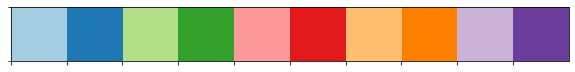

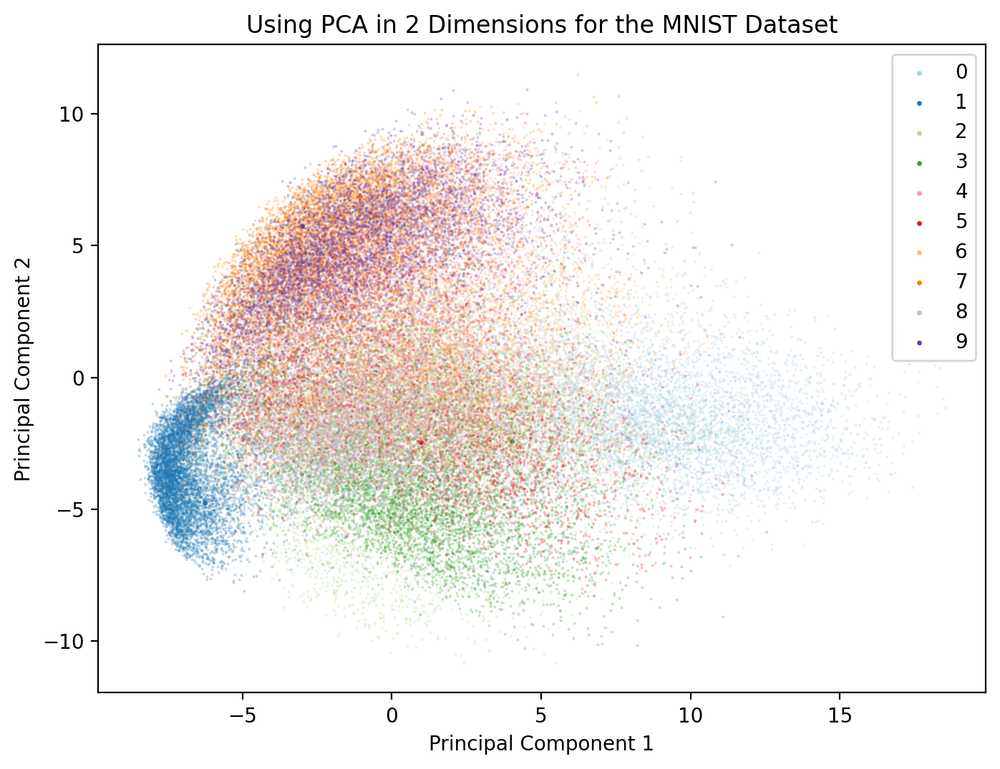

In [6]:
import seaborn as sns

#use colour pallette
numb_cols = sns.color_palette("Paired", 10)
sns.palplot(numb_cols)


# Split up the digits
plt.figure(figsize=(8,6), dpi=200)
#loop through all fdigits
for i in range(10):
    x = principalComponents[y_train[:]==i, 0] 
    y = principalComponents[y_train[:]==i, 1]
    #colour code the digits      
    colr = numb_cols[i]
    plt.scatter(x[0], y[0], s=2, c=colr, alpha=1, label="{}".format(i))
    plt.scatter(x, y, s=0.1, c=colr, alpha=0.4)
plt.title("Using PCA in 2 Dimensions for the MNIST Dataset")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.show()

__Single layer Perceptrons__

Single Layer Perceptron is one of the most basic binary classifiers one can use. Here we will implement an iterative algorithm for training the Single Layer Perceptron.

As we are dealing with a binary classification problem, we will pick data points corresponding to classes 0 and 1 (handwritten digits). In addition we choose our binary labels to be -1 and 1, respectively.

In [7]:
cond = (y_train == 0) + (y_train == 1)          # filter on digits 0 and 1
binary_x_train = x_train[cond,:]
binary_y_train = y_train[cond]*1.               # Makes the target floating point

In [8]:
# Make all handwritten 0's = -1 and make all handwritten 1's = 1

binary_y_train[binary_y_train == 0] = -1
binary_y_train[binary_y_train == 1] = 1

In [9]:
#creating test set from test data

condTest = (y_test == 0) + (y_test == 1)         # filter on digits 0 and 1
binary_x_test = x_test[condTest,:]
binary_y_test = y_test[condTest]*1.               # Makes the target floating point


binary_y_test[binary_y_test == 0] = -1
binary_y_test[binary_y_test == 1] = 1

Next we create the predict function which takes 

__inputs__

+ $x\in\mathbb{R^{n*m}}$, with $n$ being the number of datapoints and $m$ being the feature dimensionality. 
+ $w \in\mathbb{R^m}$ is the parameter vector we wish to learn. 
+ $b \in\mathbb{R}$ is the corresponding bias.

__outputs__ 
+ 'prediction'$\in\mathbb{R^n}$, a vector containing prediction values associated with $x$. 

In [10]:
def predict(x, w, b):
    """
    Predicts the classification of the datapoint
    """
    prediction = np.dot(x, w) + b
    prediction = np.sign(prediction)

    return prediction

+ Next we'll create the optimize function and use the function 'predict' to return the classification accuracy
    #### inputs:
    + $x\in\mathbb{R^{n*m}}$, with $n$ being the number of datapoints and $m$ being the feature dimensionality. 
    + $w \in\mathbb{R^m}$ is the initial parameter vector.
    + $b \in\mathbb{R}$ is the initial bias value.
    + $y\in\mathbb{R^n}$ is the training labels associated with x.
    #### outputs:
    + $w$ is the optimized parameter vector.
    + $b$ the corresponding learned bias.
    + $\text{error}$ is the classification error obtained.  
    

In [11]:
def optimize(x, y):
    iter = 0
    errorNew=np.inf
    n, m = x.shape
    w = np.random.rand(m) # Initialize the w vector
    b = np.random.rand()  # Initialize the b vector
    
    errorList = []
    learning_rate = 0.0001
        
    if iter == 0:
        pred = predict(x, w, b)

        errorNew = (((y - pred)**2).sum())/len(y)
        errorOld = errorNew
        
        wOld = w
        bOld = b
        
        errorList.append(errorNew)
        iter += 1
        
    #run 1000 iterations or if error falls below threshold
        
    while (iter <= 1000) & (errorNew > 1e-1):  
        
        # We subtract because the derivatives point in direction of steepest ascent 
        w = wOld - learning_rate * (-2 * np.dot(x.T, (y - pred)))              # Update our weights, w
        b = bOld - learning_rate * (-2 * (y - pred)).sum() / len(y)            # Update our bias, b

        pred = predict(x, w, b)
        
        errorNew = (((y - pred)**2).sum())/len(y)
        
        #if error less than old update
        if errorNew > errorOld:
            learning_rate *=0.8
            w = wOld
            b = bOld
            continue
        
        
        errorList.append(errorNew)
        errorOld = errorNew
        
        wOld = w
        bOld = b
        
        iter+=1
        
    return w, b, errorList, iter

In [12]:
# get w and b values

the_w, the_b, training_error, iter = optimize(binary_x_train, binary_y_train)

In [13]:
# we will compare classifiers for several sets of digits

digits_to_compare = [[0, 1], [5, 2], [6, 5], [9, 1], [8, 4], [3, 7]]
errors_train = []
errors_test = []
number_of_iterations = []

for pairs in digits_to_compare:

    cond = (y_train == pairs[0]) + (y_train == pairs[1])          # Only digits for 0 and 1
    binary_x_train = x_train[cond,:]
    binary_y_train = y_train[cond]*1.               # Makes the target floating point

    binary_y_train[binary_y_train == pairs[0]] = -1
    binary_y_train[binary_y_train == pairs[1]] = 1


    condTest = (y_test == pairs[0]) + (y_test == pairs[1])          # Only digits for 0 and 1
    binary_x_test = x_test[condTest,:]
    binary_y_test = y_test[condTest]*1.               # Makes the target floating point


    binary_y_test[binary_y_test == pairs[0]] = -1
    binary_y_test[binary_y_test == pairs[1]] = 1

    the_w, the_b, training_error, iter = optimize(binary_x_train, binary_y_train)

    test_prediction = predict(binary_x_test, the_w, the_b)
    error = (((binary_y_test - test_prediction)**2).sum())/len(binary_y_test)

    errors_train.append(training_error)
    errors_test.append(error)
    number_of_iterations.append(iter)

In [14]:
#get test and training errors

for i, pair in enumerate(digits_to_compare):
    print("Pair :", pair)
    print("Training error", errors_train[i][-1])
    print("Test error", errors_test[i])
    print("Converged in {} iterations".format(number_of_iterations[i]))
    print("\n")

Pair : [0, 1]
Training error 0.02874062376628504
Test error 0.018912529550827423
Converged in 4 iterations


Pair : [5, 2]
Training error 0.13041567800333947
Test error 0.1392931392931393
Converged in 1001 iterations


Pair : [6, 5]
Training error 0.11535408766205132
Test error 0.13405405405405404
Converged in 1001 iterations


Pair : [9, 1]
Training error 0.07974154912930423
Test error 0.05783582089552239
Converged in 3 iterations


Pair : [8, 4]
Training error 0.09988882237235953
Test error 0.10020449897750511
Converged in 43 iterations


Pair : [3, 7]
Training error 0.11713455953533398
Test error 0.14131501472031405
Converged in 1001 iterations




### Multi Layer Perceptron

Multi Layer Perceptron (MLP) is a fully connected deep (more than one hidden layer) network. We will now implement a <mark>2 hidden layers MLP</mark> with Recified Linear Unit (ReLU) activations. We will train the model via ADAM optimizer over a cross-entropy loss function.

First of all, we will convert our label vectors to matrices via one-hot encoding (e.g. $y=2$ would become $[0,0,1,0,0,0,0,0,0,0]$). This can be simply done using commands below:

In [15]:
y_train = np.eye(10)[y_train]
y_test = np.eye(10)[y_test]

Below, we define a class MLP. It is initialized via:  

+ x_train: The training matrix.
+ y_train: One hot encoding of the corresponding labels.
+ lr: Learning rate used for ADAM optimizer
+ nb_epochs: Number of epochs to use
+ batch_size: The number of data point in each mini-batch
+ output_dir: The directory where model parameters and tensorboard event files will be stored.

We also define the methods: 
* 'create_model' which will desribe a neural network architecture of the form $[784, 1000, 1000, 10]$, each integer representing the number of neurons in a given layer while the length of the vector defines the number of layers accordingly. it defines the class variables: 
   + self.logits $\in \mathbb{R^{10}}$ containing the output __<font color='red'>without activation of the MLP.</font>__
   + self.preds $\in \mathbb{R^{10}}$ containing posterior probabilities.
* 'compute_loss' which given the output of 'create_model' will calculate the cross-entropy loss of the mini-batches.
* 'train' where we initiate a tensorflow session and perform the training iterations. 
* 'test' where we load our trained model and perform inference on the test set.

In [16]:
class MLP:
    def __init__(self, x_train, y_train, output_dir, lr=0.001, nb_epochs=10, batch_size=50):
        #number of epochs
        self.nb_epochs = nb_epochs
        #learning rate         
        self.lr = lr
        #batch size
        self.batch_size = batch_size
        self.nb_epochs = nb_epochs
        self.nb_images, self.nb_features = x_train.shape
        self.nb_iterations = self.nb_images // batch_size
        self.output_dir = output_dir
        #input layer
        self.im = tf.placeholder(tf.float32, [None, 784])
        self.labels = tf.placeholder(tf.float32, [None, 10])
        self.x_train = x_train
        self.y_train = y_train
        
    def create_model(self):
        with tf.variable_scope('MLP', reuse=tf.AUTO_REUSE):
            #create layers 
            self.layer1 = tf.layers.dense(self.im, 1000, activation=tf.nn.relu)
            self.layer2 = tf.layers.dense(self.layer1, 1000, activation=tf.nn.relu)
            self.logits = tf.layers.dense(self.layer2, 10)
            self.preds = tf.nn.softmax(self.logits)
            
    def compute_loss(self):
        with tf.variable_scope('loss'):
            #create loss function             
            self.loss = tf.losses.softmax_cross_entropy(self.labels, self.preds)
            self.loss_summ = tf.summary.scalar("softmax_loss", self.loss)
            
    def optimizer(self):
        with tf.variable_scope('optimizer'):
            optimizer = tf.train.AdamOptimizer(learning_rate=self.lr, beta1=0.5)
            self.model_vars = tf.trainable_variables()
            self.trainer = optimizer.minimize(self.loss, var_list=self.model_vars)

Now that we defined our model, our loss and its optimizer. we can instantate the MLP class, initiate our variables, and start the tensorflow session:

In [17]:
tf.reset_default_graph()
# run for 30 epochs
model = MLP(x_train, y_train, './MLP_logdir/', 0.001, 30, 200) 
model.create_model()
model.compute_loss()
model.optimizer()
init = (tf.global_variables_initializer(),
        tf.local_variables_initializer())

saver = tf.train.Saver()
summary =tf.Summary()
sess = tf.InteractiveSession()
sess.run(init)
writer = tf.summary.FileWriter(model.output_dir)
writer.add_graph(sess.graph)
if not os.path.exists(model.output_dir):
    os.makedirs(model.output_dir)


Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


We can now start training. We loop over the training data points and we feed them to the session in mini-batches form. we repeat this process for each epoch. 

In [18]:
train_ac = []
for epoch in range(model.nb_epochs):
    #randomize the training data set so the network is trained with random batches
    randomize = np.arange(x_train.shape[0])
    np.random.shuffle(randomize)
    x_in = model.x_train[randomize,:]           
    y_in = model.y_train[randomize,:]
    for i in range(model.nb_iterations):
        # generate input data set to train network       
        input_x_train = x_in[i*model.batch_size: (i+1)*model.batch_size]
        input_y_train = y_in[i*model.batch_size: (i+1)*model.batch_size]
        
        #train network and get predictions
        _ , preds, loss, loss_summ = sess.run([model.trainer, model.preds, model.loss, model.loss_summ], 
                                 feed_dict={model.im: input_x_train, 
                                            model.labels: input_y_train})
        #since predictions are probabilities need to take argmax
        y_preds = np.argmax(preds, axis=1)
        y_real = np.argmax(input_y_train, axis=1)
        # calculate accuracy of batch predictions
        acc_train = np.mean((y_preds==y_real)*1)
        train_ac.append(acc_train)
        print('\r Epoch %d, Iteration %d, loss %.3f, batch accuracy %.3f' %(epoch, i, loss, acc_train),end='')
        if i%1000==0:
            print('Epoch %d, Iteration %d, loss %.3f, batch accuracy %.3f' %(epoch, i, loss, acc_train))
        #write to tensorboard
        writer.add_summary(loss_summ, epoch * model.nb_iterations + i)
    saver.save(sess, model.output_dir, global_step=epoch)  
# sess.close()

 Epoch 0, Iteration 0, loss 2.307, batch accuracy 0.105Epoch 0, Iteration 0, loss 2.307, batch accuracy 0.105
 Epoch 1, Iteration 0, loss 2.321, batch accuracy 0.140Epoch 1, Iteration 0, loss 2.321, batch accuracy 0.140
 Epoch 2, Iteration 0, loss 2.366, batch accuracy 0.095Epoch 2, Iteration 0, loss 2.366, batch accuracy 0.095
 Epoch 3, Iteration 0, loss 2.376, batch accuracy 0.085Epoch 3, Iteration 0, loss 2.376, batch accuracy 0.085
 Epoch 4, Iteration 0, loss 2.331, batch accuracy 0.130Epoch 4, Iteration 0, loss 2.331, batch accuracy 0.130
 Epoch 5, Iteration 0, loss 2.351, batch accuracy 0.110Epoch 5, Iteration 0, loss 2.351, batch accuracy 0.110
 Epoch 5, Iteration 299, loss 2.326, batch accuracy 0.135WARNING:tensorflow:From C:\Users\aksha\Anaconda3\envs\tensorflow_cpu\lib\site-packages\tensorflow\python\training\saver.py:960: remove_checkpoint (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:

Similarly we loop over the test dataset and get the test accuracy via:

In [19]:
batch_size_test = 20
nb_test_points = x_test.shape[0] 
nb_iterations = nb_test_points//batch_size_test
preds = []
test_ac = []
for i in range(nb_iterations):
    input_x_test = x_test[i*batch_size_test: (i+1)*batch_size_test]        # This batch of x_test datapoints
    preds_test = sess.run(model.preds, 
                             feed_dict={model.im: input_x_test})           # The predictions (one hot encode) for the current batch
    preds.append(np.argmax(preds_test, axis=1))                            # Append the predictions (the actual digit prediction)
    
    
    if np.mod(nb_test_points, batch_size_test) !=0:                 # If numb_test_points % batch_size != 0
        input_x_test = x_test[i*batch_size_test: -1]             # Change the input to be "the rest (< batch_size)"
        preds_test = sess.run(model.preds,  
                             feed_dict={model.im: input_x_test})  # Same as before
        preds.append(np.argmax(preds, axis=1))
        
        
    cur_all_preds = np.concatenate(preds, axis =0)
    cur_y_real = np.argmax(y_test, axis=1)[:(i+1)*batch_size_test]
    cur_acc_test = np.mean((cur_all_preds==cur_y_real)*1)
    test_ac.append(cur_acc_test)
        
all_preds = np.concatenate(preds, axis =0)
y_real = np.argmax(y_test, axis=1)
acc_test = np.mean((all_preds==y_real)*1)
print('Test accuracy achieved: %.3f' %acc_test)

Test accuracy achieved: 0.097


We can now plot how the training and test accuracy changes with over each iteration

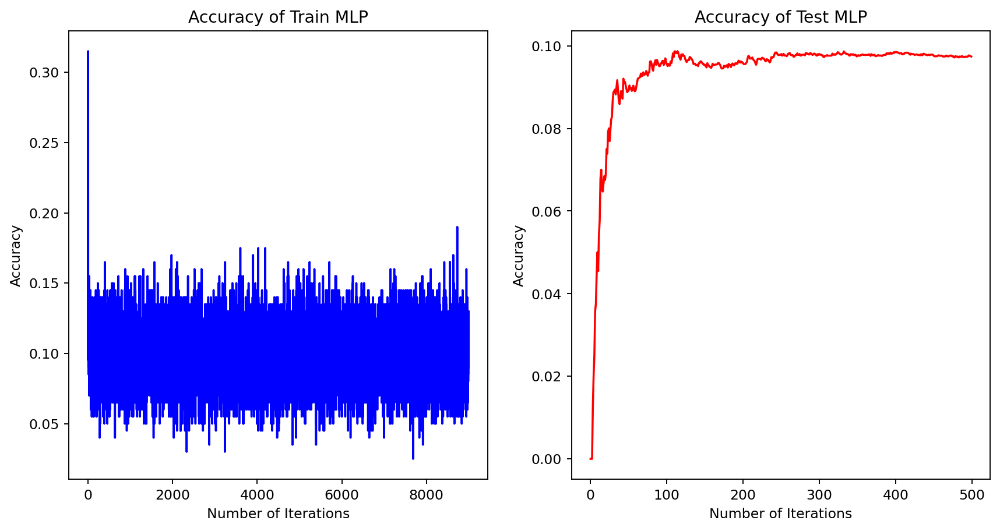

In [20]:
# plot accuracy of training and test accuracy

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), dpi=170, sharex=False, sharey=False)
ax[0].plot(np.arange(0, len(train_ac)), train_ac, "b-", label="Train")
ax[0].set_xlabel("Number of Iterations")
ax[0].set_ylabel("Accuracy")
ax[0].set_title("Accuracy of Train MLP")

ax[1].plot(np.arange(0, len(test_ac)), test_ac, "r-", label="Test")
ax[1].set_xlabel("Number of Iterations")
ax[1].set_ylabel("Accuracy")
ax[1].set_title("Accuracy of Test MLP")
plt.show()



We now close the tensorflow session:

In [21]:
sess.close()

### Convolutional Neural Network
Now that we are more familiar with the MLP algorithm, it is time to see how it compares with a Convolutional Neural Network (CNN). CNNs leverage dependencies between neighbouring pixels, making them more efficient and light weight compared to their fully connected counter part. In this section we will implement a Class CNN similar to the one we defined before for MLP.

Here we implement a CNN of the shape [32, 64, 128]; where 32, 64, 128 represent the number of convolutional filters for each hidden layer. We will use a kernel size of size $4\times4$. 

Will Use a stride of 1 in the first convolutional layer, followed by a stride of 2 for the following layers (a stride of two help downsampling without requiring the use of pooling layers). Then we vectorize the obtained output using tf.layer.flatten, and end the model with a fully connected layer of 10 neurons. Using ReLU as the non linear activation for the hidden layers.

In [22]:
# Params: 1,604,362  , W: 1,604,096,  B: 266
class CNN:
    def __init__(self, x_train, y_train, output_dir, lr=0.001, nb_epochs=10, batch_size=50):
        self.nb_epochs = nb_epochs
        self.lr = lr
        self.batch_size = batch_size
        self.nb_epochs = nb_epochs
        self.nb_images, self.edge, _ = x_train.shape
        self.nb_iterations = self.nb_images // batch_size
        self.output_dir = output_dir
        self.im = tf.placeholder(tf.float32, [None, 28, 28, 1])
        self.labels = tf.placeholder(tf.float32, [None, 10])
        self.x_train = x_train[:,:,:, np.newaxis]
        self.y_train = y_train
        
    def create_model(self):
        with tf.variable_scope('CNN', reuse=tf.AUTO_REUSE):
            ######### Complete the function ######### 
            self.layer1 = tf.layers.conv2d(strides=(1,1),kernel_size=(4,4),inputs=self.im, filters=32, activation=tf.nn.relu)
            self.layer2 = tf.layers.conv2d(strides=(2,2),kernel_size=(4,4),inputs=self.layer1, filters=64, activation=tf.nn.relu)
            self.layer3 = tf.layers.conv2d(strides=(1,1),kernel_size=(4,4),inputs=self.layer2, filters=128, activation=tf.nn.relu)
            self.layer4 = tf.layers.flatten(self.layer3)
            self.logits = tf.layers.dense(self.layer4, 10)
            
            print(self.layer1, "\n", self.layer2, "\n", self.layer3, "\n", self.layer4, "\n", self.logits)
            self.preds = tf.nn.softmax(self.logits)
            #########################################
    
    def compute_loss(self):
        with tf.variable_scope('loss'):
            ######### Complete the function ######### 
            self.loss = tf.losses.softmax_cross_entropy(self.labels, self.logits)
            #########################################
            self.loss_summ = tf.summary.scalar("softmax_loss", self.loss)
    def optimizer(self):
        with tf.variable_scope('optimizer'):
            optimizer = tf.train.AdamOptimizer(learning_rate=self.lr, beta1=0.5)
            self.model_vars = tf.trainable_variables()
            self.trainer = optimizer.minimize(self.loss, var_list=self.model_vars)

CNNs leverage dependencies between neighbouring pixels, however this information is partially lost when we vectorized our data. For training CNNs we will need to recover our initial shape of $N \times 28 \times 28$.

In [23]:
edge = int(np.sqrt(nb_features))
x_train.resize([n_train, edge, edge])
x_test.resize([n_test, edge, edge])

We instantiate our CNN class, start the corresponging tensorflow session and initiate the trainable variables. 

In [24]:
tf.reset_default_graph()

model = CNN(x_train, y_train, './CNN_logdir/', 0.001, 10, 15)
model.create_model()
model.compute_loss()
model.optimizer()
init = (tf.global_variables_initializer(),
        tf.local_variables_initializer())

saver = tf.train.Saver()
summary =tf.Summary()
sess = tf.InteractiveSession()
sess.run(init)
writer = tf.summary.FileWriter(model.output_dir)
writer.add_graph(sess.graph)
if not os.path.exists(model.output_dir):
    os.makedirs(model.output_dir)

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Use keras.layers.flatten instead.
Tensor("CNN/conv2d/Relu:0", shape=(?, 25, 25, 32), dtype=float32) 
 Tensor("CNN/conv2d_1/Relu:0", shape=(?, 11, 11, 64), dtype=float32) 
 Tensor("CNN/conv2d_2/Relu:0", shape=(?, 8, 8, 128), dtype=float32) 
 Tensor("CNN/flatten/Reshape:0", shape=(?, 8192), dtype=float32) 
 Tensor("CNN/dense/BiasAdd:0", shape=(?, 10), dtype=float32)


We start training:

prediction 1


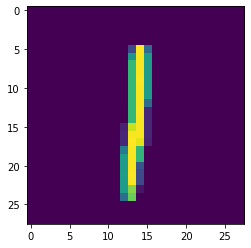

prediction 9


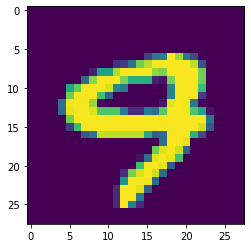

prediction 0


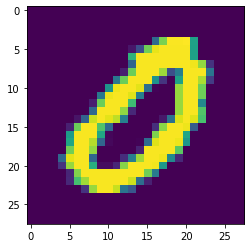

prediction 3


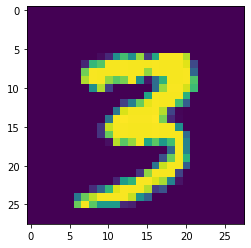

prediction 2


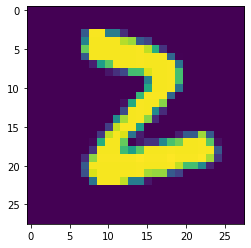

prediction 7


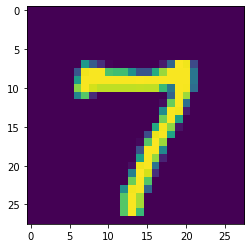

prediction 3


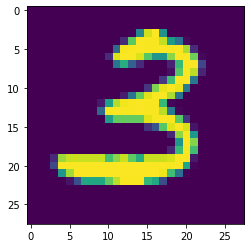

prediction 6


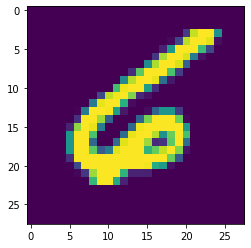

prediction 9


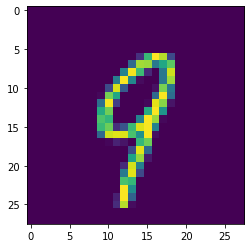

prediction 3


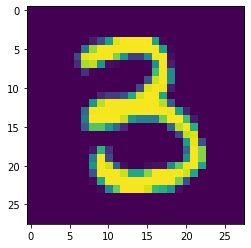

prediction 7


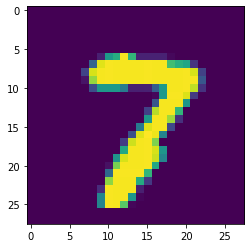

prediction 9


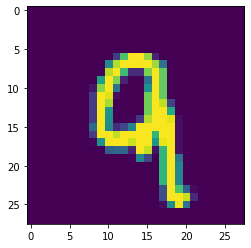

prediction 7


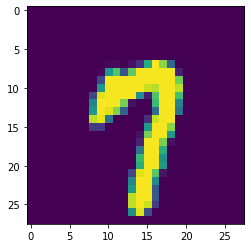

prediction 1


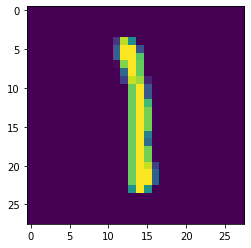

prediction 7


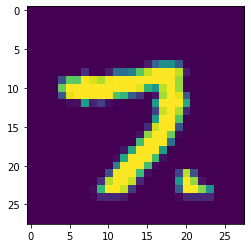

prediction 7


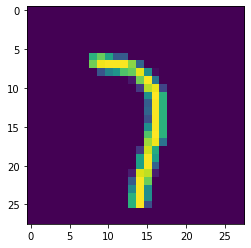

prediction 5


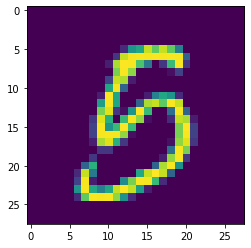

prediction 2


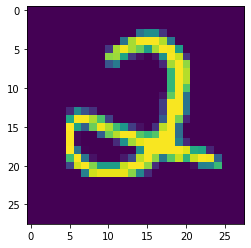

prediction 7


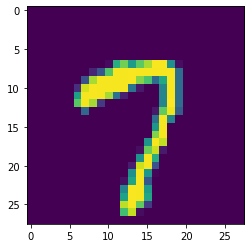

prediction 4


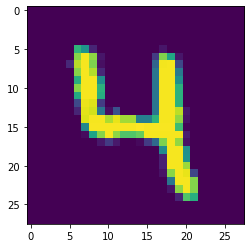

In [25]:
for epoch in range(model.nb_epochs):
    randomize = np.arange(x_train.shape[0])
    np.random.shuffle(randomize)
    x_in = model.x_train[randomize,:]
    y_in = model.y_train[randomize,:]
    
    for i in range(model.nb_iterations):
        input_x_train = x_in[i*model.batch_size: (i+1)*model.batch_size]
        input_y_train = y_in[i*model.batch_size: (i+1)*model.batch_size]
        _ , preds, loss, loss_summ = sess.run([model.trainer, model.preds, model.loss, model.loss_summ], 
                                 feed_dict={model.im: input_x_train, 
                                            model.labels: input_y_train})
        y_preds = np.argmax(preds, axis=1)
        
        y_real = np.argmax(input_y_train, axis=1)
        acc_train = np.mean((y_preds==y_real)*1)
    
#   visualise some of the predictions
    print('prediction',y_preds[1])
    
    #plt.imshow(x_in[0,:,:,0])
    plt.imshow(input_x_train[1,:,:,0])
    plt.show()
    
    print('prediction',y_preds[2])
    plt.imshow(input_x_train[2,:,:,0])
    plt.show()
    
    


we loop over the test dataset and compute the corresponding classification accuracy. 

In [26]:
batch_size_test = 20
nb_test_points = x_test.shape[0] 
nb_iterations = nb_test_points//batch_size_test
preds = []
for i in range(nb_iterations):
    input_x_test = x_test[i*batch_size_test: (i+1)*batch_size_test]
    input_x_test = input_x_test[:, :, :,np.newaxis]
    preds_test = sess.run(model.preds, 
                             feed_dict={model.im: input_x_test})
    preds.append(np.argmax(preds_test, axis=1))
    if np.mod(nb_test_points, batch_size_test) !=0:
        input_x_test = x_test[i*batch_size_test: -1]
        preds_test = sess.run(model.preds, 
                             feed_dict={model.im: input_x_test})
        preds.append(np.argmax(preds, axis=1))
all_preds = np.concatenate(preds, axis =0)
y_real = np.argmax(y_test, axis=1)
acc_test = np.mean((all_preds==y_real)*1)
print('Test accuracy achieved: %.3f' %acc_test)
# sess.close()

Test accuracy achieved: 0.991


### Visualizing learned filters and activations
It is sometimes useful to visualize what kind of filters a CNN have learned. One way to do so is to plot each filter of size [kernel_size $\times$ kerne_size]. 


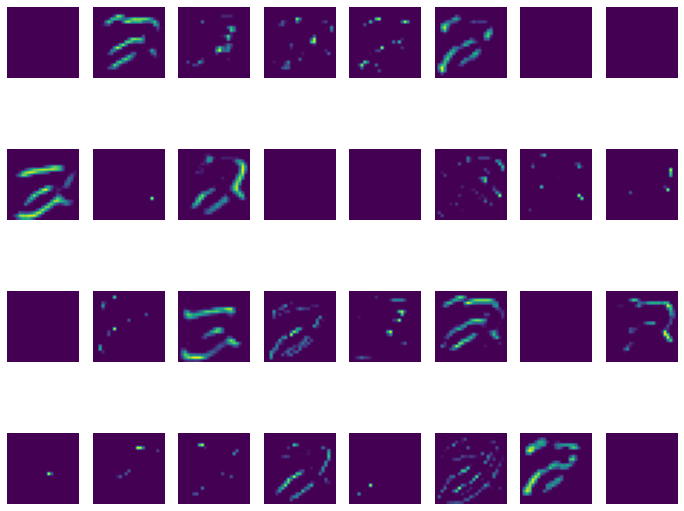

In [27]:
# print filters
layer1_shape = sess.run(model.layer1, feed_dict={model.im: input_x_test}).shape

fig, ax = plt.subplots(figsize=(12, 10), nrows = 4, ncols=8, sharex=False, sharey=False, )
count=0
for i in np.arange(0, 4):
    for j in np.arange(0, 8):
        count+=1
        xy = sess.run(model.layer1, feed_dict={model.im: input_x_test})[0,:,:,count-1]
        ax[i, j].imshow(xy)
        ax[i, j].axis("off")

plt.show()

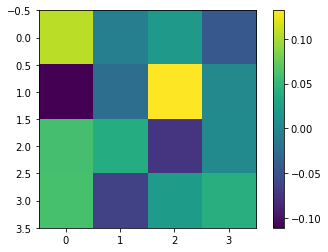

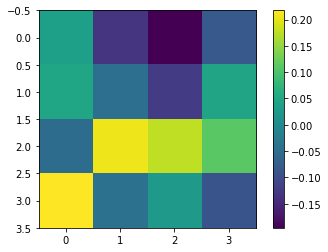

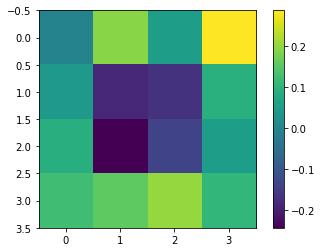

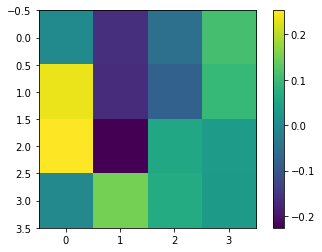

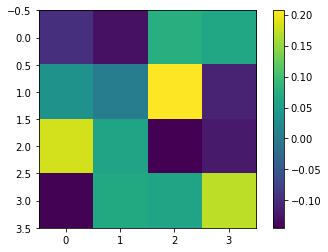

...

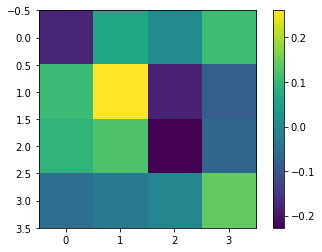

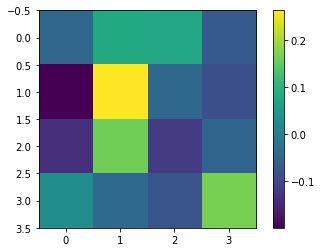

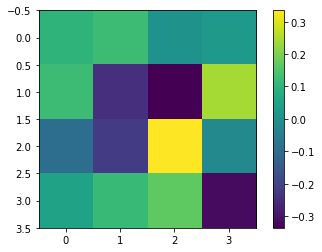

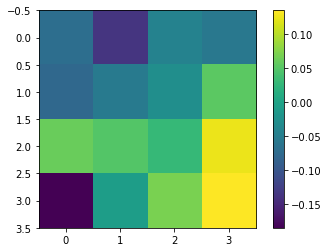

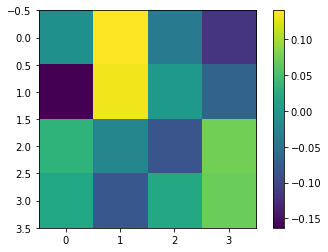

In [28]:
# print Kernals 

for i in range(sess.run(tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES)[0]).shape[3]):
  
    xy = sess.run(tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES)[0])[:,:,0,i]

    plt.imshow(xy)
    plt.colorbar()
    plt.show()
    

In [29]:
sess.close()

### Denoising Auto-Encoder

While CNNs make very good classifiers, they can also be used for many various tasks such as regression, image generation, image reconstruction. Next we will implement a fully convolutional de-noising auto-encoder, i.e. a network that takes a noisy image as input and outputs the corresponding cleaned output. In this exercise we will introduce a gaussian noise on each input. Our goal is to recover the original noiseless images in the output.

Similarly as before we will define the class DAE

Note that we don't have a classification problem anymore but a regression problem consisting of reconstructing the noiseless version of the input. 

In [30]:
class DAE:
    def __init__(self, x_train, output_dir, lr=0.001, nb_epochs=10, batch_size=50):
        self.nb_epochs = nb_epochs
        self.lr = lr
        self.batch_size = batch_size
        self.nb_epochs = nb_epochs      
        self.nb_images, self.edge, _ = x_train.shape
        self.nb_iterations = self.nb_images // batch_size
        self.output_dir = output_dir
        self.im = tf.placeholder(tf.float32, [None, 28, 28,1])
#       noisy image
        self.im_n = self.im + tf.random_normal(tf.shape(self.im), mean=0, stddev=1) #inject noise
        self.im_n = tf.clip_by_value(self.im_n, -1, 1)
        self.x_train = x_train
        
    def create_model(self):
        with tf.variable_scope('DAE', reuse=tf.AUTO_REUSE):

            
            self.layer1 = tf.layers.conv2d(strides=(1,1),kernel_size=(4,4),inputs=self.im_n, filters = 32, activation=tf.nn.relu)
            
            self.layer2 = tf.layers.conv2d(strides=(2,2),kernel_size=(4,4),inputs=self.layer1, filters=64, activation=tf.nn.relu)
            self.layer3 = tf.layers.conv2d(strides=(2,2),kernel_size=(4,4),inputs=self.layer2, filters=128, activation=tf.nn.relu)
            
            self.layer4 = tf.layers.conv2d_transpose(strides=2,kernel_size=(4,4),inputs=self.layer3, filters =64, activation=tf.nn.relu)
            
            self.layer5 = tf.layers.conv2d_transpose(strides=2,kernel_size=(4,4),inputs=self.layer4, filters=32, activation=tf.nn.relu)

            self.recon_im = tf.layers.conv2d(strides=1,kernel_size=(4,4),inputs=self.layer5, filters=1, activation=tf.nn.tanh, padding = 'same')
            
            # pad image
            self.recon_im = tf.pad(self.recon_im, [[0, 0], [3, 3], [3, 3], [0, 0]], constant_values=-1)
            tf.summary.image('denoising', tf.concat([self.im_n, self.recon_im], axis=2))
    
    def compute_loss(self):
        with tf.variable_scope('loss'):
            self.loss = tf.losses.mean_squared_error(self.im,  self.recon_im)
            self.loss_summ = tf.summary.scalar("reconstruction_loss", self.loss)
                             
    def optimizer(self):
        with tf.variable_scope('optimizer'):
            optimizer = tf.train.AdamOptimizer(learning_rate=self.lr, beta1=0.5)
            self.model_vars = tf.trainable_variables()
            self.trainer = optimizer.minimize(self.loss, var_list=self.model_vars)

In [31]:
tf.reset_default_graph()

model = DAE(x_train, './DAE_logdir/', 0.001, 25, 300)
model.create_model()
model.compute_loss()
model.optimizer()
init = (tf.global_variables_initializer(),
        tf.local_variables_initializer())

saver = tf.train.Saver()
summary =tf.Summary()
sess = tf.InteractiveSession()
sess.run(init)
writer = tf.summary.FileWriter(model.output_dir)
writer.add_graph(sess.graph)
if not os.path.exists(model.output_dir):
    os.makedirs(model.output_dir)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.


In [32]:
for epoch in range(model.nb_epochs):

    randomize = np.arange(x_train.shape[0])
    np.random.shuffle(randomize)
    x_in = model.x_train[randomize,:]
    
    #reshape x
    x_in = x_in.reshape(-1,28, 28 ,1)

    for i in range(model.nb_iterations):
        input_x_train = x_in[i*model.batch_size: (i+1)*model.batch_size]
    
        _ , preds, loss, loss_summ = sess.run([model.trainer, model.recon_im, model.loss, model.loss_summ], 
                                 feed_dict={model.im: input_x_train})
        
        y_preds = preds

        if i%100==0:
            print('Epoch %d, Iteration %d, loss %.3f' %(epoch, i, loss))
        writer.add_summary(loss_summ, epoch * model.nb_iterations + i)
    saver.save(sess, model.output_dir, global_step=epoch)  

Epoch 0, Iteration 0, loss 0.541
Epoch 0, Iteration 100, loss 0.061
Epoch 1, Iteration 0, loss 0.054
Epoch 1, Iteration 100, loss 0.052
Epoch 2, Iteration 0, loss 0.047
Epoch 2, Iteration 100, loss 0.045
Epoch 3, Iteration 0, loss 0.047
Epoch 3, Iteration 100, loss 0.049
Epoch 4, Iteration 0, loss 0.048
Epoch 4, Iteration 100, loss 0.045
Epoch 5, Iteration 0, loss 0.042
Epoch 5, Iteration 100, loss 0.043
Epoch 6, Iteration 0, loss 0.044
Epoch 6, Iteration 100, loss 0.045
Epoch 7, Iteration 0, loss 0.044
Epoch 7, Iteration 100, loss 0.044
Epoch 8, Iteration 0, loss 0.044
Epoch 8, Iteration 100, loss 0.044
Epoch 9, Iteration 0, loss 0.042
Epoch 9, Iteration 100, loss 0.042
Epoch 10, Iteration 0, loss 0.042
Epoch 10, Iteration 100, loss 0.041
Epoch 11, Iteration 0, loss 0.042
Epoch 11, Iteration 100, loss 0.042
Epoch 12, Iteration 0, loss 0.042
Epoch 12, Iteration 100, loss 0.044
Epoch 13, Iteration 0, loss 0.041
Epoch 13, Iteration 100, loss 0.040
Epoch 14, Iteration 0, loss 0.042
Epoch 

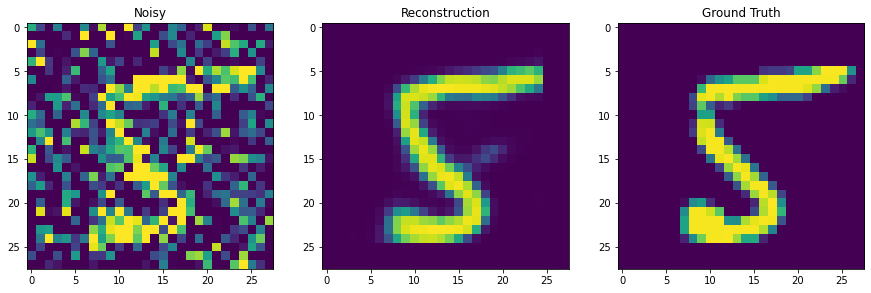

In [33]:
# compare noisy, reconstruction and ground truth

x, y, t = sess.run([model.im_n, model.recon_im, model.im], feed_dict = {model.im : x_in[[4000]]})


fig, ax = plt.subplots(1, 3, figsize = (15, 5))

for i, m in enumerate([x, y, t]):
    ax[i].imshow(m[0,:,:,0], vmin = -1, vmax = 1)
    ax[i].set_title(['Noisy', 'Reconstruction', 'Ground Truth'][i])
    
plt.show()

We will now train the DAE by looping over all the mini-batches. For proper training we will input enough noisy versions per image. 

When the training is finished, inject noise into the test data and reconstruct them through a forward pass. For each test image, we will input 20 noisy versions of it and compute the average accuracies 

In [34]:


# use multiple noise levels
noise_level = [0.5, 1, 2, 3]


DAE_Train_Dict = {}     # This will be where we store the training errors.


for noise in noise_level:
    ################################ TRAIN THE MODEL #############################################
    class DAE:
        def __init__(self, x_train, output_dir, lr=0.001, nb_epochs=10, batch_size=50):
            self.nb_epochs = nb_epochs
            self.lr = lr
            self.batch_size = batch_size
            self.nb_epochs = nb_epochs

            self.nb_images, self.edge, _ = x_train.shape
            self.nb_iterations = self.nb_images // batch_size
            self.output_dir = output_dir
            self.im = tf.placeholder(tf.float32, [None, 28, 28,1])
            self.im_n = self.im + tf.random_normal(tf.shape(self.im), mean=0, stddev=noise) #inject noise
            # clip              
            self.im_n = tf.clip_by_value(self.im_n, -1, 1)
            self.x_train = x_train

        def create_model(self):
            with tf.variable_scope('DAE', reuse=tf.AUTO_REUSE):

                self.layer1 = tf.layers.conv2d(strides=(1,1),kernel_size=(4,4),inputs=self.im_n, filters = 32, activation=tf.nn.relu)

                self.layer2 = tf.layers.conv2d(strides=(2,2),kernel_size=(4,4),inputs=self.layer1, filters=64, activation=tf.nn.relu)
                self.layer3 = tf.layers.conv2d(strides=(2,2),kernel_size=(4,4),inputs=self.layer2, filters=128, activation=tf.nn.relu)

                self.layer4 = tf.layers.conv2d_transpose(strides=2,kernel_size=(4,4),inputs=self.layer3, filters =64, activation=tf.nn.relu)

                self.layer5 = tf.layers.conv2d_transpose(strides=2,kernel_size=(4,4),inputs=self.layer4, filters=32, activation=tf.nn.relu)

                self.recon_im = tf.layers.conv2d(strides=1,kernel_size=(4,4),inputs=self.layer5, filters=1, activation=tf.nn.tanh, padding = 'same')


                self.recon_im = tf.pad(self.recon_im, [[0, 0], [3, 3], [3, 3], [0, 0]], constant_values=-1)
                tf.summary.image('denoising', tf.concat([self.im_n, self.recon_im], axis=2))

        def compute_loss(self):
            with tf.variable_scope('loss'):

                self.loss = tf.losses.mean_squared_error(self.im,  self.recon_im)
                self.loss_summ = tf.summary.scalar("reconstruction_loss", self.loss)

        def optimizer(self):
            with tf.variable_scope('optimizer'):
                optimizer = tf.train.AdamOptimizer(learning_rate=self.lr, beta1=0.5)
                self.model_vars = tf.trainable_variables()
                self.trainer = optimizer.minimize(self.loss, var_list=self.model_vars)
    
    
    
    # Now we train the model
    tf.reset_default_graph()

    model = DAE(x_train, './DAE_logdir/', 0.0001, 15, 250)
    model.create_model()
    model.compute_loss()
    model.optimizer()
    init = (tf.global_variables_initializer(),
            tf.local_variables_initializer())

    saver = tf.train.Saver()
    summary =tf.Summary()
    sess = tf.InteractiveSession()
    sess.run(init)
    writer = tf.summary.FileWriter(model.output_dir)
    writer.add_graph(sess.graph)
    if not os.path.exists(model.output_dir):
        os.makedirs(model.output_dir)
    
    
    train_ers = []
    for epoch in range(model.nb_epochs):
        randomize = np.arange(x_train.shape[0])
        np.random.shuffle(randomize)
        x_in = model.x_train[randomize,:]
        x_in = x_in.reshape(-1,28, 28 ,1)
        for i in range(model.nb_iterations):
            input_x_train = x_in[i*model.batch_size: (i+1)*model.batch_size]
            _ , preds, loss, loss_summ = sess.run([model.trainer, model.recon_im, model.loss, model.loss_summ], 
                                     feed_dict={model.im: input_x_train})
            
            y_preds = preds
            
            train_ers.append(loss)
            
            if i%10==0:
                print("\r TRAINING: Epoch {}, Iteration {}, loss {}.3f".format(epoch, i, loss), end="")
            writer.add_summary(loss_summ, epoch * model.nb_iterations + i)
        saver.save(sess, model.output_dir, global_step=epoch)  
    # save training error to dictionary
    DAE_Train_Dict[noise] = train_ers
    


 

 TRAINING: Epoch 14, Iteration 230, loss 0.020019620656967163.3fWARNING:tensorflow:Entity <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215347DB308>> could not be transformed and will be executed as-is. Please report this to the AutgoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: converting <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215347DB308>>: AssertionError: Bad argument number for Name: 3, expecting 4


 TRAINING: Epoch 14, Iteration 230, loss 0.049251724034547806.3fWARNING:tensorflow:Entity <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215339DDF08>> could not be transformed and will be executed as-is. Please report this to the AutgoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: converting <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215339DDF08>>: AssertionError: Bad argument number for Name: 3, expecting 4


 TRAINING: Epoch 14, Iteration 230, loss 0.13117715716362.3f.3fWARNING:tensorflow:Entity <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215335FA988>> could not be transformed and will be executed as-is. Please report this to the AutgoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: converting <bound method Conv.call of <tensorflow.python.layers.convolutional.Conv2D object at 0x00000215335FA988>>: AssertionError: Bad argument number for Name: 3, expecting 4
 TRAINING: Epoch 14, Iteration 230, loss 0.18630948662757874.3f

In [35]:
DAE_Train_Dict

{0.5: [0.54554677,
  0.5405084,
  0.5431209,
  0.53895146,
  0.53867763,
  0.53341377,
  0.53012747,
  0.5261698,
  0.5190138,
  0.5111497,
  0.5032708,
  0.49380922,
  0.4817968,
  0.46533376,
  0.44905517,
  0.4387689,
  0.42328206,
  0.41879848,
  0.41014752,
  0.3989788,
  0.39386824,
  0.38131976,
  0.38712662,
  0.3784826,
  0.36258218,
  0.35609734,
  0.3514973,
  0.35113338,
  0.33815238,
  0.33126378,
  0.32595986,
  0.31145707,
  0.2960359,
  0.29471877,
  0.2749844,
  0.26591903,
  0.26112315,
  0.2468838,
  0.24226764,
  0.2274769,
  0.22151774,
  0.21300255,
  0.2071477,
  0.20151901,
  0.18266702,
  0.18833861,
  0.18362209,
  0.1781193,
  0.17654853,
  0.1672256,
  0.16592637,
  0.16198348,
  0.15753946,
  0.15699701,
  0.15337092,
  0.15497601,
  0.15779836,
  0.15586849,
  0.15257867,
  0.14249656,
  0.14566176,
  0.14104886,
  0.13656761,
  0.13624343,
  0.13024305,
  0.12610471,
  0.13100843,
  0.12968035,
  0.12840562,
  0.12516008,
  0.12188518,
  0.1178624,
  0.12

In [36]:
# noiseArr = np.array([x/4 for x in range(20)])

In [37]:
# np.repeat(noiseArr,len(x_test)).shape

 (1, 28, 28, 1)


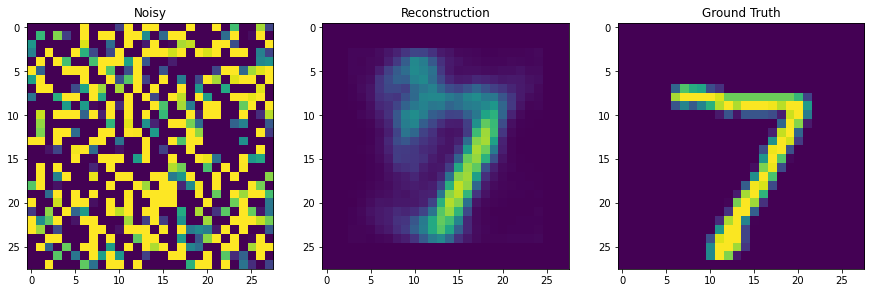

 At sample 1 for noise 4.75 (1, 28, 28, 1)


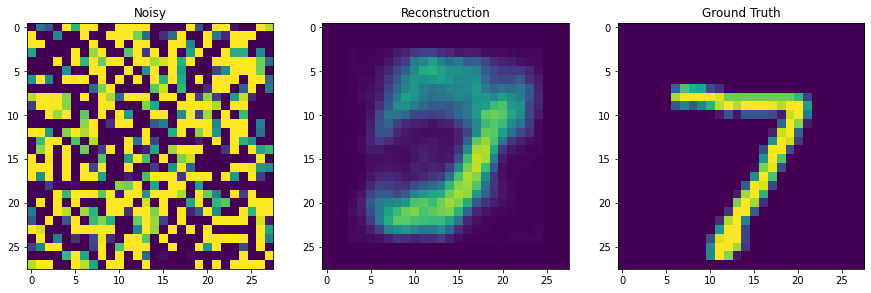

 At sample 2 for noise 4.75 (1, 28, 28, 1)


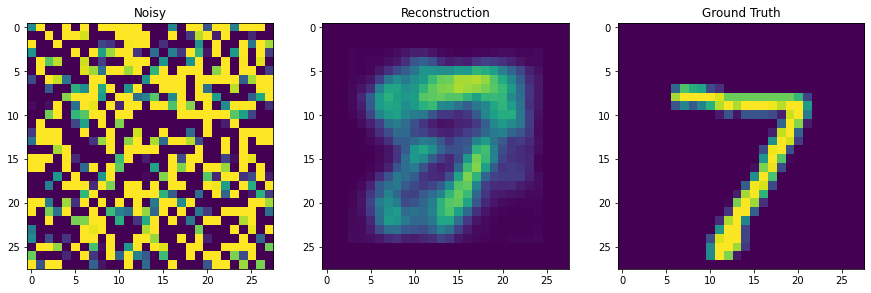

 At sample 3 for noise 4.75 (1, 28, 28, 1)


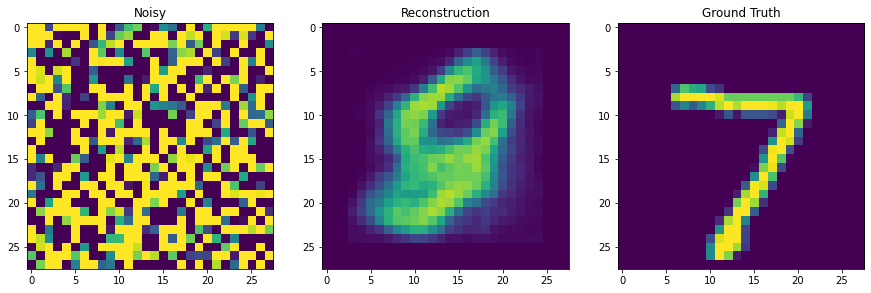

 At sample 4 for noise 4.75 (1, 28, 28, 1)


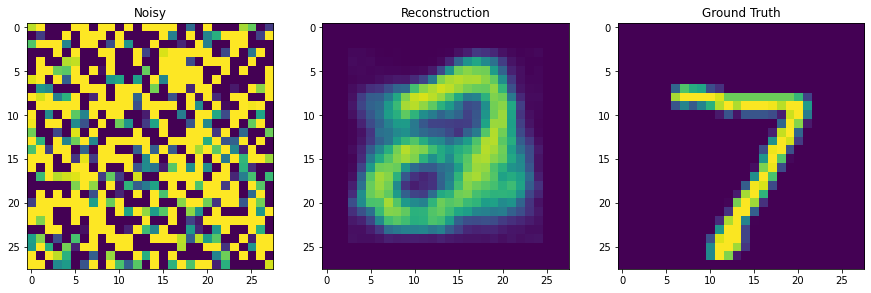

 At sample 5 for noise 4.75 (1, 28, 28, 1)


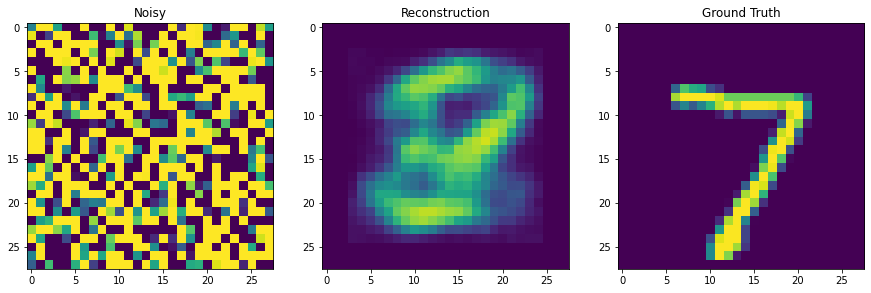

 At sample 6 for noise 4.75 (1, 28, 28, 1)


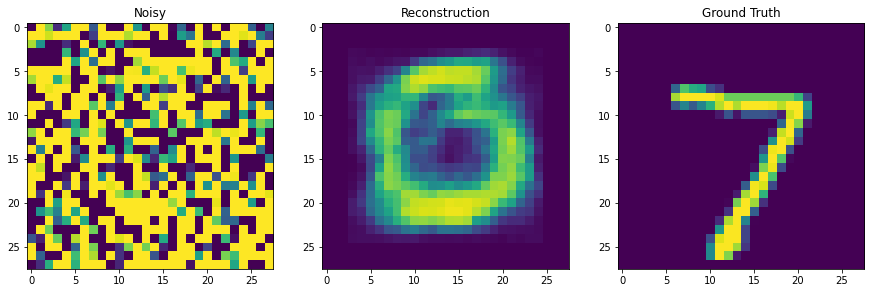

 At sample 7 for noise 4.75 (1, 28, 28, 1)


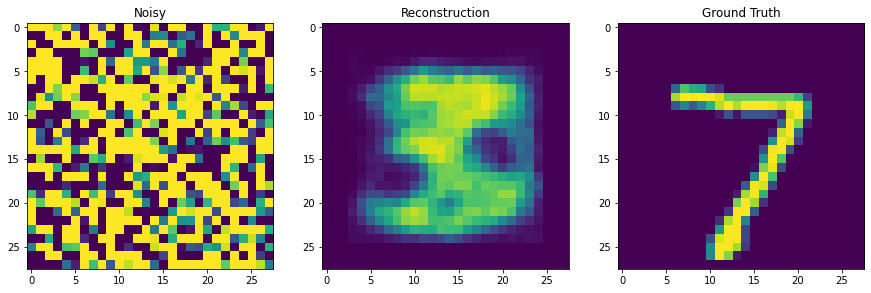

 At sample 8 for noise 4.75 (1, 28, 28, 1)


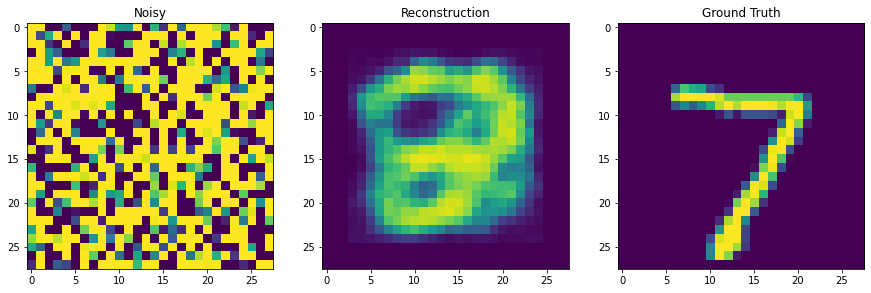

 At sample 9 for noise 4.75 (1, 28, 28, 1)


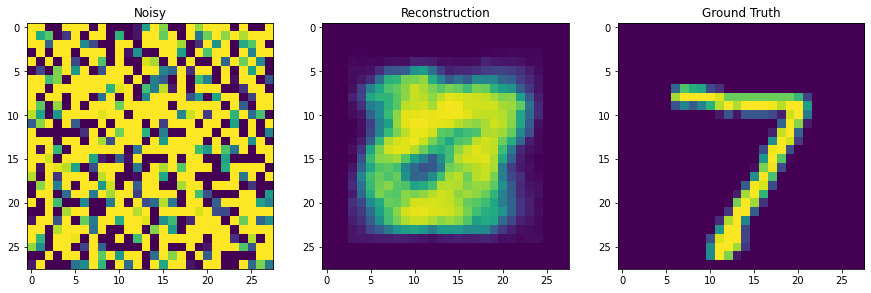

 At sample 10 for noise 4.75 (1, 28, 28, 1)


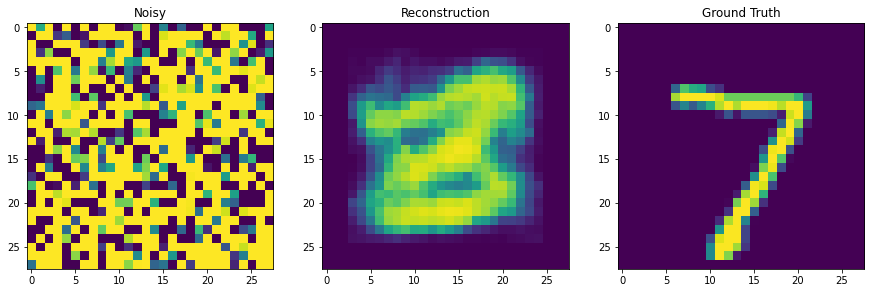

 At sample 11 for noise 4.75 (1, 28, 28, 1)


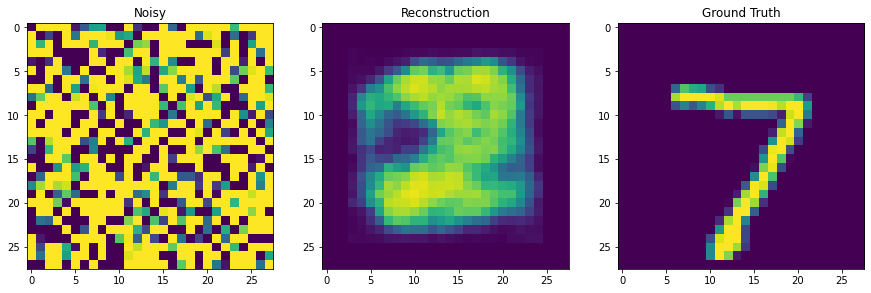

 At sample 12 for noise 4.75 (1, 28, 28, 1)


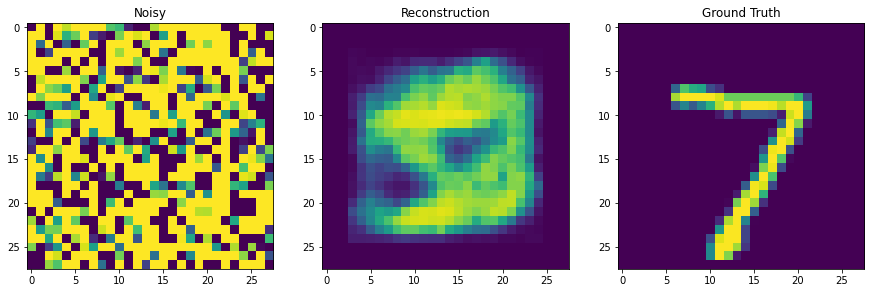

 At sample 13 for noise 4.75 (1, 28, 28, 1)


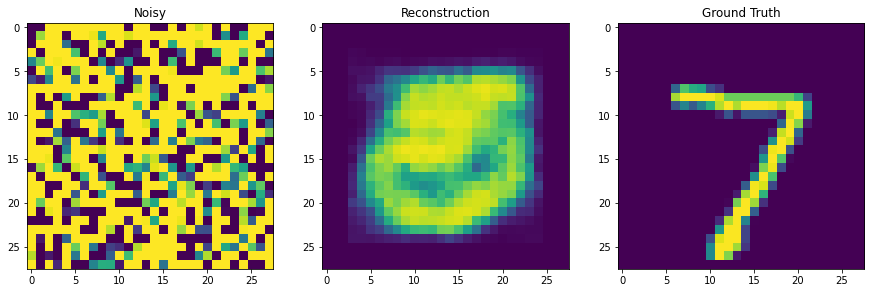

 At sample 14 for noise 4.75 (1, 28, 28, 1)


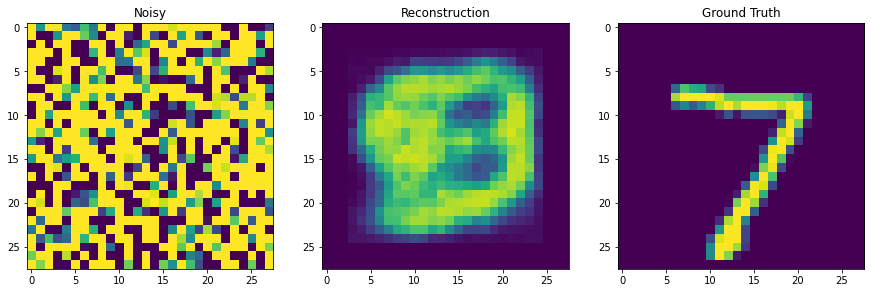

 At sample 15 for noise 4.75 (1, 28, 28, 1)


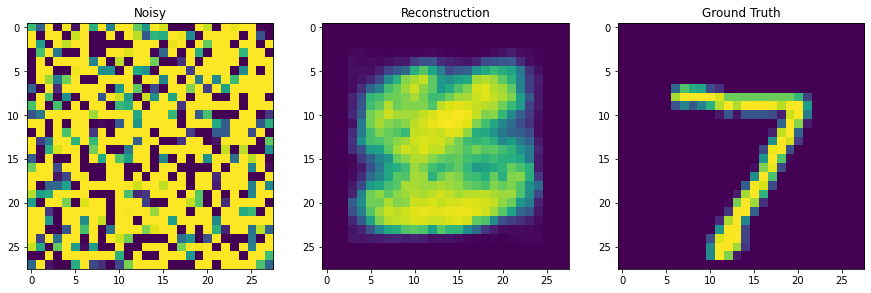

 At sample 16 for noise 4.75 (1, 28, 28, 1)


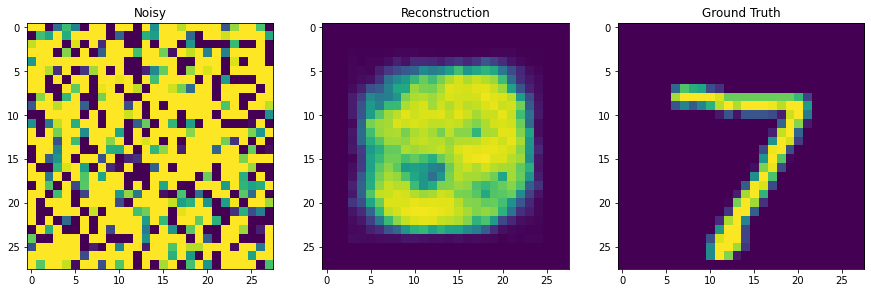

 At sample 17 for noise 4.75 (1, 28, 28, 1)


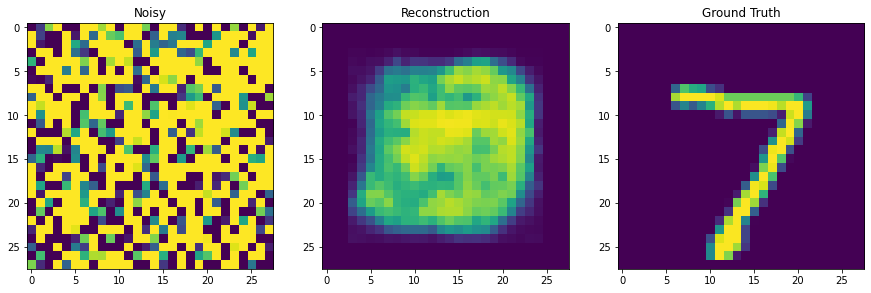

 At sample 18 for noise 4.75 (1, 28, 28, 1)


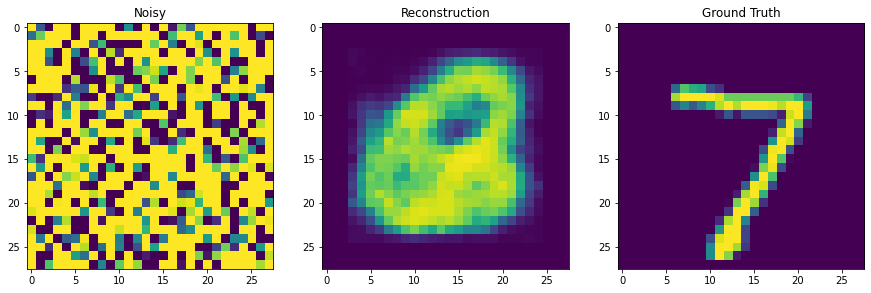

 At sample 19 for noise 4.75 (1, 28, 28, 1)


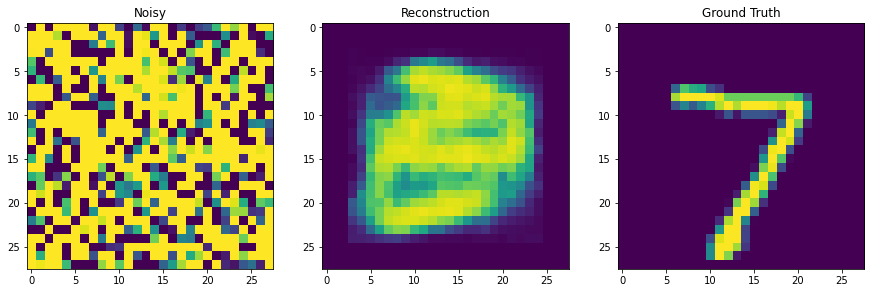

 At sample 20 for noise 4.75 (1, 28, 28, 1)
 At sample 21 for noise 4.75 (1, 28, 28, 1)
 At sample 22 for noise 4.75 (1, 28, 28, 1)
 At sample 23 for noise 4.75 (1, 28, 28, 1)
 At sample 24 for noise 4.75 (1, 28, 28, 1)
 At sample 25 for noise 4.75 (1, 28, 28, 1)
 At sample 26 for noise 4.75 (1, 28, 28, 1)
 At sample 27 for noise 4.75 (1, 28, 28, 1)
 At sample 28 for noise 4.75 (1, 28, 28, 1)
 At sample 29 for noise 4.75 (1, 28, 28, 1)
 At sample 30 for noise 4.75 (1, 28, 28, 1)
 At sample 31 for noise 4.75 (1, 28, 28, 1)
 At sample 32 for noise 4.75 (1, 28, 28, 1)
 At sample 33 for noise 4.75 (1, 28, 28, 1)
 At sample 34 for noise 4.75 (1, 28, 28, 1)
 At sample 35 for noise 4.75 (1, 28, 28, 1)
 At sample 36 for noise 4.75 (1, 28, 28, 1)
 At sample 37 for noise 4.75 (1, 28, 28, 1)
 At sample 38 for noise 4.75 (1, 28, 28, 1)
 At sample 39 for noise 4.75 (1, 28, 28, 1)
 At sample 40 for noise 4.75 (1, 28, 28, 1)
 At sample 41 for noise 4.75 (1, 28, 28, 1)
 At sample 42 for noise 4.75 (1,

 At sample 223 for noise 4.75 (1, 28, 28, 1)
 At sample 224 for noise 4.75 (1, 28, 28, 1)
 At sample 225 for noise 4.75 (1, 28, 28, 1)
 At sample 226 for noise 4.75 (1, 28, 28, 1)
 At sample 227 for noise 4.75 (1, 28, 28, 1)
 At sample 228 for noise 4.75 (1, 28, 28, 1)
 At sample 229 for noise 4.75 (1, 28, 28, 1)
 At sample 230 for noise 4.75 (1, 28, 28, 1)
 At sample 231 for noise 4.75 (1, 28, 28, 1)
 At sample 232 for noise 4.75 (1, 28, 28, 1)
 At sample 233 for noise 4.75 (1, 28, 28, 1)
 At sample 234 for noise 4.75 (1, 28, 28, 1)
 At sample 235 for noise 4.75 (1, 28, 28, 1)
 At sample 236 for noise 4.75 (1, 28, 28, 1)
 At sample 237 for noise 4.75 (1, 28, 28, 1)
 At sample 238 for noise 4.75 (1, 28, 28, 1)
 At sample 239 for noise 4.75 (1, 28, 28, 1)
 At sample 240 for noise 4.75 (1, 28, 28, 1)
 At sample 241 for noise 4.75 (1, 28, 28, 1)
 At sample 242 for noise 4.75 (1, 28, 28, 1)
 At sample 243 for noise 4.75 (1, 28, 28, 1)
 At sample 244 for noise 4.75 (1, 28, 28, 1)
 At sample

 At sample 426 for noise 4.75 (1, 28, 28, 1)
 At sample 427 for noise 4.75 (1, 28, 28, 1)
 At sample 428 for noise 4.75 (1, 28, 28, 1)
 At sample 429 for noise 4.75 (1, 28, 28, 1)
 At sample 430 for noise 4.75 (1, 28, 28, 1)
 At sample 431 for noise 4.75 (1, 28, 28, 1)
 At sample 432 for noise 4.75 (1, 28, 28, 1)
 At sample 433 for noise 4.75 (1, 28, 28, 1)
 At sample 434 for noise 4.75 (1, 28, 28, 1)
 At sample 435 for noise 4.75 (1, 28, 28, 1)
 At sample 436 for noise 4.75 (1, 28, 28, 1)
 At sample 437 for noise 4.75 (1, 28, 28, 1)
 At sample 438 for noise 4.75 (1, 28, 28, 1)
 At sample 439 for noise 4.75 (1, 28, 28, 1)
 At sample 440 for noise 4.75 (1, 28, 28, 1)
 At sample 441 for noise 4.75 (1, 28, 28, 1)
 At sample 442 for noise 4.75 (1, 28, 28, 1)
 At sample 443 for noise 4.75 (1, 28, 28, 1)
 At sample 444 for noise 4.75 (1, 28, 28, 1)
 At sample 445 for noise 4.75 (1, 28, 28, 1)
 At sample 446 for noise 4.75 (1, 28, 28, 1)
 At sample 447 for noise 4.75 (1, 28, 28, 1)
 At sample

 At sample 630 for noise 4.75 (1, 28, 28, 1)
 At sample 631 for noise 4.75 (1, 28, 28, 1)
 At sample 632 for noise 4.75 (1, 28, 28, 1)
 At sample 633 for noise 4.75 (1, 28, 28, 1)
 At sample 634 for noise 4.75 (1, 28, 28, 1)
 At sample 635 for noise 4.75 (1, 28, 28, 1)
 At sample 636 for noise 4.75 (1, 28, 28, 1)
 At sample 637 for noise 4.75 (1, 28, 28, 1)
 At sample 638 for noise 4.75 (1, 28, 28, 1)
 At sample 639 for noise 4.75 (1, 28, 28, 1)
 At sample 640 for noise 4.75 (1, 28, 28, 1)
 At sample 641 for noise 4.75 (1, 28, 28, 1)
 At sample 642 for noise 4.75 (1, 28, 28, 1)
 At sample 643 for noise 4.75 (1, 28, 28, 1)
 At sample 644 for noise 4.75 (1, 28, 28, 1)
 At sample 645 for noise 4.75 (1, 28, 28, 1)
 At sample 646 for noise 4.75 (1, 28, 28, 1)
 At sample 647 for noise 4.75 (1, 28, 28, 1)
 At sample 648 for noise 4.75 (1, 28, 28, 1)
 At sample 649 for noise 4.75 (1, 28, 28, 1)
 At sample 650 for noise 4.75 (1, 28, 28, 1)
 At sample 651 for noise 4.75 (1, 28, 28, 1)
 At sample

 At sample 836 for noise 4.75 (1, 28, 28, 1)
 At sample 837 for noise 4.75 (1, 28, 28, 1)
 At sample 838 for noise 4.75 (1, 28, 28, 1)
 At sample 839 for noise 4.75 (1, 28, 28, 1)
 At sample 840 for noise 4.75 (1, 28, 28, 1)
 At sample 841 for noise 4.75 (1, 28, 28, 1)
 At sample 842 for noise 4.75 (1, 28, 28, 1)
 At sample 843 for noise 4.75 (1, 28, 28, 1)
 At sample 844 for noise 4.75 (1, 28, 28, 1)
 At sample 845 for noise 4.75 (1, 28, 28, 1)
 At sample 846 for noise 4.75 (1, 28, 28, 1)
 At sample 847 for noise 4.75 (1, 28, 28, 1)
 At sample 848 for noise 4.75 (1, 28, 28, 1)
 At sample 849 for noise 4.75 (1, 28, 28, 1)
 At sample 850 for noise 4.75 (1, 28, 28, 1)
 At sample 851 for noise 4.75 (1, 28, 28, 1)
 At sample 852 for noise 4.75 (1, 28, 28, 1)
 At sample 853 for noise 4.75 (1, 28, 28, 1)
 At sample 854 for noise 4.75 (1, 28, 28, 1)
 At sample 855 for noise 4.75 (1, 28, 28, 1)
 At sample 856 for noise 4.75 (1, 28, 28, 1)
 At sample 857 for noise 4.75 (1, 28, 28, 1)
 At sample

 At sample 1046 for noise 4.75 (1, 28, 28, 1)
 At sample 1047 for noise 4.75 (1, 28, 28, 1)
 At sample 1048 for noise 4.75 (1, 28, 28, 1)
 At sample 1049 for noise 4.75 (1, 28, 28, 1)
 At sample 1050 for noise 4.75 (1, 28, 28, 1)
 At sample 1051 for noise 4.75 (1, 28, 28, 1)
 At sample 1052 for noise 4.75 (1, 28, 28, 1)
 At sample 1053 for noise 4.75 (1, 28, 28, 1)
 At sample 1054 for noise 4.75 (1, 28, 28, 1)
 At sample 1055 for noise 4.75 (1, 28, 28, 1)
 At sample 1056 for noise 4.75 (1, 28, 28, 1)
 At sample 1057 for noise 4.75 (1, 28, 28, 1)
 At sample 1058 for noise 4.75 (1, 28, 28, 1)
 At sample 1059 for noise 4.75 (1, 28, 28, 1)
 At sample 1060 for noise 4.75 (1, 28, 28, 1)
 At sample 1061 for noise 4.75 (1, 28, 28, 1)
 At sample 1062 for noise 4.75 (1, 28, 28, 1)
 At sample 1063 for noise 4.75 (1, 28, 28, 1)
 At sample 1064 for noise 4.75 (1, 28, 28, 1)
 At sample 1065 for noise 4.75 (1, 28, 28, 1)
 At sample 1066 for noise 4.75 (1, 28, 28, 1)
 At sample 1067 for noise 4.75 (1,

 At sample 1253 for noise 4.75 (1, 28, 28, 1)
 At sample 1254 for noise 4.75 (1, 28, 28, 1)
 At sample 1255 for noise 4.75 (1, 28, 28, 1)
 At sample 1256 for noise 4.75 (1, 28, 28, 1)
 At sample 1257 for noise 4.75 (1, 28, 28, 1)
 At sample 1258 for noise 4.75 (1, 28, 28, 1)
 At sample 1259 for noise 4.75 (1, 28, 28, 1)
 At sample 1260 for noise 4.75 (1, 28, 28, 1)
 At sample 1261 for noise 4.75 (1, 28, 28, 1)
 At sample 1262 for noise 4.75 (1, 28, 28, 1)
 At sample 1263 for noise 4.75 (1, 28, 28, 1)
 At sample 1264 for noise 4.75 (1, 28, 28, 1)
 At sample 1265 for noise 4.75 (1, 28, 28, 1)
 At sample 1266 for noise 4.75 (1, 28, 28, 1)
 At sample 1267 for noise 4.75 (1, 28, 28, 1)
 At sample 1268 for noise 4.75 (1, 28, 28, 1)
 At sample 1269 for noise 4.75 (1, 28, 28, 1)
 At sample 1270 for noise 4.75 (1, 28, 28, 1)
 At sample 1271 for noise 4.75 (1, 28, 28, 1)
 At sample 1272 for noise 4.75 (1, 28, 28, 1)
 At sample 1273 for noise 4.75 (1, 28, 28, 1)
 At sample 1274 for noise 4.75 (1,

 At sample 1464 for noise 4.75 (1, 28, 28, 1)
 At sample 1465 for noise 4.75 (1, 28, 28, 1)
 At sample 1466 for noise 4.75 (1, 28, 28, 1)
 At sample 1467 for noise 4.75 (1, 28, 28, 1)
 At sample 1468 for noise 4.75 (1, 28, 28, 1)
 At sample 1469 for noise 4.75 (1, 28, 28, 1)
 At sample 1470 for noise 4.75 (1, 28, 28, 1)
 At sample 1471 for noise 4.75 (1, 28, 28, 1)
 At sample 1472 for noise 4.75 (1, 28, 28, 1)
 At sample 1473 for noise 4.75 (1, 28, 28, 1)
 At sample 1474 for noise 4.75 (1, 28, 28, 1)
 At sample 1475 for noise 4.75 (1, 28, 28, 1)
 At sample 1476 for noise 4.75 (1, 28, 28, 1)
 At sample 1477 for noise 4.75 (1, 28, 28, 1)
 At sample 1478 for noise 4.75 (1, 28, 28, 1)
 At sample 1479 for noise 4.75 (1, 28, 28, 1)
 At sample 1480 for noise 4.75 (1, 28, 28, 1)
 At sample 1481 for noise 4.75 (1, 28, 28, 1)
 At sample 1482 for noise 4.75 (1, 28, 28, 1)
 At sample 1483 for noise 4.75 (1, 28, 28, 1)
 At sample 1484 for noise 4.75 (1, 28, 28, 1)
 At sample 1485 for noise 4.75 (1,

 At sample 1669 for noise 4.75 (1, 28, 28, 1)
 At sample 1670 for noise 4.75 (1, 28, 28, 1)
 At sample 1671 for noise 4.75 (1, 28, 28, 1)
 At sample 1672 for noise 4.75 (1, 28, 28, 1)
 At sample 1673 for noise 4.75 (1, 28, 28, 1)
 At sample 1674 for noise 4.75 (1, 28, 28, 1)
 At sample 1675 for noise 4.75 (1, 28, 28, 1)
 At sample 1676 for noise 4.75 (1, 28, 28, 1)
 At sample 1677 for noise 4.75 (1, 28, 28, 1)
 At sample 1678 for noise 4.75 (1, 28, 28, 1)
 At sample 1679 for noise 4.75 (1, 28, 28, 1)
 At sample 1680 for noise 4.75 (1, 28, 28, 1)
 At sample 1681 for noise 4.75 (1, 28, 28, 1)
 At sample 1682 for noise 4.75 (1, 28, 28, 1)
 At sample 1683 for noise 4.75 (1, 28, 28, 1)
 At sample 1684 for noise 4.75 (1, 28, 28, 1)
 At sample 1685 for noise 4.75 (1, 28, 28, 1)
 At sample 1686 for noise 4.75 (1, 28, 28, 1)
 At sample 1687 for noise 4.75 (1, 28, 28, 1)
 At sample 1688 for noise 4.75 (1, 28, 28, 1)
 At sample 1689 for noise 4.75 (1, 28, 28, 1)
 At sample 1690 for noise 4.75 (1,

 At sample 1872 for noise 4.75 (1, 28, 28, 1)
 At sample 1873 for noise 4.75 (1, 28, 28, 1)
 At sample 1874 for noise 4.75 (1, 28, 28, 1)
 At sample 1875 for noise 4.75 (1, 28, 28, 1)
 At sample 1876 for noise 4.75 (1, 28, 28, 1)
 At sample 1877 for noise 4.75 (1, 28, 28, 1)
 At sample 1878 for noise 4.75 (1, 28, 28, 1)
 At sample 1879 for noise 4.75 (1, 28, 28, 1)
 At sample 1880 for noise 4.75 (1, 28, 28, 1)
 At sample 1881 for noise 4.75 (1, 28, 28, 1)
 At sample 1882 for noise 4.75 (1, 28, 28, 1)
 At sample 1883 for noise 4.75 (1, 28, 28, 1)
 At sample 1884 for noise 4.75 (1, 28, 28, 1)
 At sample 1885 for noise 4.75 (1, 28, 28, 1)
 At sample 1886 for noise 4.75 (1, 28, 28, 1)
 At sample 1887 for noise 4.75 (1, 28, 28, 1)
 At sample 1888 for noise 4.75 (1, 28, 28, 1)
 At sample 1889 for noise 4.75 (1, 28, 28, 1)
 At sample 1890 for noise 4.75 (1, 28, 28, 1)
 At sample 1891 for noise 4.75 (1, 28, 28, 1)
 At sample 1892 for noise 4.75 (1, 28, 28, 1)
 At sample 1893 for noise 4.75 (1,

 At sample 2074 for noise 4.75 (1, 28, 28, 1)
 At sample 2075 for noise 4.75 (1, 28, 28, 1)
 At sample 2076 for noise 4.75 (1, 28, 28, 1)
 At sample 2077 for noise 4.75 (1, 28, 28, 1)
 At sample 2078 for noise 4.75 (1, 28, 28, 1)
 At sample 2079 for noise 4.75 (1, 28, 28, 1)
 At sample 2080 for noise 4.75 (1, 28, 28, 1)
 At sample 2081 for noise 4.75 (1, 28, 28, 1)
 At sample 2082 for noise 4.75 (1, 28, 28, 1)
 At sample 2083 for noise 4.75 (1, 28, 28, 1)
 At sample 2084 for noise 4.75 (1, 28, 28, 1)
 At sample 2085 for noise 4.75 (1, 28, 28, 1)
 At sample 2086 for noise 4.75 (1, 28, 28, 1)
 At sample 2087 for noise 4.75 (1, 28, 28, 1)
 At sample 2088 for noise 4.75 (1, 28, 28, 1)
 At sample 2089 for noise 4.75 (1, 28, 28, 1)
 At sample 2090 for noise 4.75 (1, 28, 28, 1)
 At sample 2091 for noise 4.75 (1, 28, 28, 1)
 At sample 2092 for noise 4.75 (1, 28, 28, 1)
 At sample 2093 for noise 4.75 (1, 28, 28, 1)
 At sample 2094 for noise 4.75 (1, 28, 28, 1)
 At sample 2095 for noise 4.75 (1,

 At sample 2256 for noise 4.75 (1, 28, 28, 1)
 At sample 2257 for noise 4.75 (1, 28, 28, 1)
 At sample 2258 for noise 4.75 (1, 28, 28, 1)
 At sample 2259 for noise 4.75 (1, 28, 28, 1)
 At sample 2260 for noise 4.75 (1, 28, 28, 1)
 At sample 2261 for noise 4.75 (1, 28, 28, 1)
 At sample 2262 for noise 4.75 (1, 28, 28, 1)
 At sample 2263 for noise 4.75 (1, 28, 28, 1)
 At sample 2264 for noise 4.75 (1, 28, 28, 1)
 At sample 2265 for noise 4.75 (1, 28, 28, 1)
 At sample 2266 for noise 4.75 (1, 28, 28, 1)
 At sample 2267 for noise 4.75 (1, 28, 28, 1)
 At sample 2268 for noise 4.75 (1, 28, 28, 1)
 At sample 2269 for noise 4.75 (1, 28, 28, 1)
 At sample 2270 for noise 4.75 (1, 28, 28, 1)
 At sample 2271 for noise 4.75 (1, 28, 28, 1)
 At sample 2272 for noise 4.75 (1, 28, 28, 1)
 At sample 2273 for noise 4.75 (1, 28, 28, 1)
 At sample 2274 for noise 4.75 (1, 28, 28, 1)
 At sample 2275 for noise 4.75 (1, 28, 28, 1)
 At sample 2276 for noise 4.75 (1, 28, 28, 1)
 At sample 2277 for noise 4.75 (1,

 At sample 2442 for noise 4.75 (1, 28, 28, 1)
 At sample 2443 for noise 4.75 (1, 28, 28, 1)
 At sample 2444 for noise 4.75 (1, 28, 28, 1)
 At sample 2445 for noise 4.75 (1, 28, 28, 1)
 At sample 2446 for noise 4.75 (1, 28, 28, 1)
 At sample 2447 for noise 4.75 (1, 28, 28, 1)
 At sample 2448 for noise 4.75 (1, 28, 28, 1)
 At sample 2449 for noise 4.75 (1, 28, 28, 1)
 At sample 2450 for noise 4.75 (1, 28, 28, 1)
 At sample 2451 for noise 4.75 (1, 28, 28, 1)
 At sample 2452 for noise 4.75 (1, 28, 28, 1)
 At sample 2453 for noise 4.75 (1, 28, 28, 1)
 At sample 2454 for noise 4.75 (1, 28, 28, 1)
 At sample 2455 for noise 4.75 (1, 28, 28, 1)
 At sample 2456 for noise 4.75 (1, 28, 28, 1)
 At sample 2457 for noise 4.75 (1, 28, 28, 1)
 At sample 2458 for noise 4.75 (1, 28, 28, 1)
 At sample 2459 for noise 4.75 (1, 28, 28, 1)
 At sample 2460 for noise 4.75 (1, 28, 28, 1)
 At sample 2461 for noise 4.75 (1, 28, 28, 1)
 At sample 2462 for noise 4.75 (1, 28, 28, 1)
 At sample 2463 for noise 4.75 (1,

 At sample 2645 for noise 4.75 (1, 28, 28, 1)
 At sample 2646 for noise 4.75 (1, 28, 28, 1)
 At sample 2647 for noise 4.75 (1, 28, 28, 1)
 At sample 2648 for noise 4.75 (1, 28, 28, 1)
 At sample 2649 for noise 4.75 (1, 28, 28, 1)
 At sample 2650 for noise 4.75 (1, 28, 28, 1)
 At sample 2651 for noise 4.75 (1, 28, 28, 1)
 At sample 2652 for noise 4.75 (1, 28, 28, 1)
 At sample 2653 for noise 4.75 (1, 28, 28, 1)
 At sample 2654 for noise 4.75 (1, 28, 28, 1)
 At sample 2655 for noise 4.75 (1, 28, 28, 1)
 At sample 2656 for noise 4.75 (1, 28, 28, 1)
 At sample 2657 for noise 4.75 (1, 28, 28, 1)
 At sample 2658 for noise 4.75 (1, 28, 28, 1)
 At sample 2659 for noise 4.75 (1, 28, 28, 1)
 At sample 2660 for noise 4.75 (1, 28, 28, 1)
 At sample 2661 for noise 4.75 (1, 28, 28, 1)
 At sample 2662 for noise 4.75 (1, 28, 28, 1)
 At sample 2663 for noise 4.75 (1, 28, 28, 1)
 At sample 2664 for noise 4.75 (1, 28, 28, 1)
 At sample 2665 for noise 4.75 (1, 28, 28, 1)
 At sample 2666 for noise 4.75 (1,

 At sample 2852 for noise 4.75 (1, 28, 28, 1)
 At sample 2853 for noise 4.75 (1, 28, 28, 1)
 At sample 2854 for noise 4.75 (1, 28, 28, 1)
 At sample 2855 for noise 4.75 (1, 28, 28, 1)
 At sample 2856 for noise 4.75 (1, 28, 28, 1)
 At sample 2857 for noise 4.75 (1, 28, 28, 1)
 At sample 2858 for noise 4.75 (1, 28, 28, 1)
 At sample 2859 for noise 4.75 (1, 28, 28, 1)
 At sample 2860 for noise 4.75 (1, 28, 28, 1)
 At sample 2861 for noise 4.75 (1, 28, 28, 1)
 At sample 2862 for noise 4.75 (1, 28, 28, 1)
 At sample 2863 for noise 4.75 (1, 28, 28, 1)
 At sample 2864 for noise 4.75 (1, 28, 28, 1)
 At sample 2865 for noise 4.75 (1, 28, 28, 1)
 At sample 2866 for noise 4.75 (1, 28, 28, 1)
 At sample 2867 for noise 4.75 (1, 28, 28, 1)
 At sample 2868 for noise 4.75 (1, 28, 28, 1)
 At sample 2869 for noise 4.75 (1, 28, 28, 1)
 At sample 2870 for noise 4.75 (1, 28, 28, 1)
 At sample 2871 for noise 4.75 (1, 28, 28, 1)
 At sample 2872 for noise 4.75 (1, 28, 28, 1)
 At sample 2873 for noise 4.75 (1,

 At sample 3059 for noise 4.75 (1, 28, 28, 1)
 At sample 3060 for noise 4.75 (1, 28, 28, 1)
 At sample 3061 for noise 4.75 (1, 28, 28, 1)
 At sample 3062 for noise 4.75 (1, 28, 28, 1)
 At sample 3063 for noise 4.75 (1, 28, 28, 1)
 At sample 3064 for noise 4.75 (1, 28, 28, 1)
 At sample 3065 for noise 4.75 (1, 28, 28, 1)
 At sample 3066 for noise 4.75 (1, 28, 28, 1)
 At sample 3067 for noise 4.75 (1, 28, 28, 1)
 At sample 3068 for noise 4.75 (1, 28, 28, 1)
 At sample 3069 for noise 4.75 (1, 28, 28, 1)
 At sample 3070 for noise 4.75 (1, 28, 28, 1)
 At sample 3071 for noise 4.75 (1, 28, 28, 1)
 At sample 3072 for noise 4.75 (1, 28, 28, 1)
 At sample 3073 for noise 4.75 (1, 28, 28, 1)
 At sample 3074 for noise 4.75 (1, 28, 28, 1)
 At sample 3075 for noise 4.75 (1, 28, 28, 1)
 At sample 3076 for noise 4.75 (1, 28, 28, 1)
 At sample 3077 for noise 4.75 (1, 28, 28, 1)
 At sample 3078 for noise 4.75 (1, 28, 28, 1)
 At sample 3079 for noise 4.75 (1, 28, 28, 1)
 At sample 3080 for noise 4.75 (1,

 At sample 3248 for noise 4.75 (1, 28, 28, 1)
 At sample 3249 for noise 4.75 (1, 28, 28, 1)
 At sample 3250 for noise 4.75 (1, 28, 28, 1)
 At sample 3251 for noise 4.75 (1, 28, 28, 1)
 At sample 3252 for noise 4.75 (1, 28, 28, 1)
 At sample 3253 for noise 4.75 (1, 28, 28, 1)
 At sample 3254 for noise 4.75 (1, 28, 28, 1)
 At sample 3255 for noise 4.75 (1, 28, 28, 1)
 At sample 3256 for noise 4.75 (1, 28, 28, 1)
 At sample 3257 for noise 4.75 (1, 28, 28, 1)
 At sample 3258 for noise 4.75 (1, 28, 28, 1)
 At sample 3259 for noise 4.75 (1, 28, 28, 1)
 At sample 3260 for noise 4.75 (1, 28, 28, 1)
 At sample 3261 for noise 4.75 (1, 28, 28, 1)
 At sample 3262 for noise 4.75 (1, 28, 28, 1)
 At sample 3263 for noise 4.75 (1, 28, 28, 1)
 At sample 3264 for noise 4.75 (1, 28, 28, 1)
 At sample 3265 for noise 4.75 (1, 28, 28, 1)
 At sample 3266 for noise 4.75 (1, 28, 28, 1)
 At sample 3267 for noise 4.75 (1, 28, 28, 1)
 At sample 3268 for noise 4.75 (1, 28, 28, 1)
 At sample 3269 for noise 4.75 (1,

 At sample 3442 for noise 4.75 (1, 28, 28, 1)
 At sample 3443 for noise 4.75 (1, 28, 28, 1)
 At sample 3444 for noise 4.75 (1, 28, 28, 1)
 At sample 3445 for noise 4.75 (1, 28, 28, 1)
 At sample 3446 for noise 4.75 (1, 28, 28, 1)
 At sample 3447 for noise 4.75 (1, 28, 28, 1)
 At sample 3448 for noise 4.75 (1, 28, 28, 1)
 At sample 3449 for noise 4.75 (1, 28, 28, 1)
 At sample 3450 for noise 4.75 (1, 28, 28, 1)
 At sample 3451 for noise 4.75 (1, 28, 28, 1)
 At sample 3452 for noise 4.75 (1, 28, 28, 1)
 At sample 3453 for noise 4.75 (1, 28, 28, 1)
 At sample 3454 for noise 4.75 (1, 28, 28, 1)
 At sample 3455 for noise 4.75 (1, 28, 28, 1)
 At sample 3456 for noise 4.75 (1, 28, 28, 1)
 At sample 3457 for noise 4.75 (1, 28, 28, 1)
 At sample 3458 for noise 4.75 (1, 28, 28, 1)
 At sample 3459 for noise 4.75 (1, 28, 28, 1)
 At sample 3460 for noise 4.75 (1, 28, 28, 1)
 At sample 3461 for noise 4.75 (1, 28, 28, 1)
 At sample 3462 for noise 4.75 (1, 28, 28, 1)
 At sample 3463 for noise 4.75 (1,

 At sample 3642 for noise 4.75 (1, 28, 28, 1)
 At sample 3643 for noise 4.75 (1, 28, 28, 1)
 At sample 3644 for noise 4.75 (1, 28, 28, 1)
 At sample 3645 for noise 4.75 (1, 28, 28, 1)
 At sample 3646 for noise 4.75 (1, 28, 28, 1)
 At sample 3647 for noise 4.75 (1, 28, 28, 1)
 At sample 3648 for noise 4.75 (1, 28, 28, 1)
 At sample 3649 for noise 4.75 (1, 28, 28, 1)
 At sample 3650 for noise 4.75 (1, 28, 28, 1)
 At sample 3651 for noise 4.75 (1, 28, 28, 1)
 At sample 3652 for noise 4.75 (1, 28, 28, 1)
 At sample 3653 for noise 4.75 (1, 28, 28, 1)
 At sample 3654 for noise 4.75 (1, 28, 28, 1)
 At sample 3655 for noise 4.75 (1, 28, 28, 1)
 At sample 3656 for noise 4.75 (1, 28, 28, 1)
 At sample 3657 for noise 4.75 (1, 28, 28, 1)
 At sample 3658 for noise 4.75 (1, 28, 28, 1)
 At sample 3659 for noise 4.75 (1, 28, 28, 1)
 At sample 3660 for noise 4.75 (1, 28, 28, 1)
 At sample 3661 for noise 4.75 (1, 28, 28, 1)
 At sample 3662 for noise 4.75 (1, 28, 28, 1)
 At sample 3663 for noise 4.75 (1,

 At sample 3841 for noise 4.75 (1, 28, 28, 1)
 At sample 3842 for noise 4.75 (1, 28, 28, 1)
 At sample 3843 for noise 4.75 (1, 28, 28, 1)
 At sample 3844 for noise 4.75 (1, 28, 28, 1)
 At sample 3845 for noise 4.75 (1, 28, 28, 1)
 At sample 3846 for noise 4.75 (1, 28, 28, 1)
 At sample 3847 for noise 4.75 (1, 28, 28, 1)
 At sample 3848 for noise 4.75 (1, 28, 28, 1)
 At sample 3849 for noise 4.75 (1, 28, 28, 1)
 At sample 3850 for noise 4.75 (1, 28, 28, 1)
 At sample 3851 for noise 4.75 (1, 28, 28, 1)
 At sample 3852 for noise 4.75 (1, 28, 28, 1)
 At sample 3853 for noise 4.75 (1, 28, 28, 1)
 At sample 3854 for noise 4.75 (1, 28, 28, 1)
 At sample 3855 for noise 4.75 (1, 28, 28, 1)
 At sample 3856 for noise 4.75 (1, 28, 28, 1)
 At sample 3857 for noise 4.75 (1, 28, 28, 1)
 At sample 3858 for noise 4.75 (1, 28, 28, 1)
 At sample 3859 for noise 4.75 (1, 28, 28, 1)
 At sample 3860 for noise 4.75 (1, 28, 28, 1)
 At sample 3861 for noise 4.75 (1, 28, 28, 1)
 At sample 3862 for noise 4.75 (1,

 At sample 4041 for noise 4.75 (1, 28, 28, 1)
 At sample 4042 for noise 4.75 (1, 28, 28, 1)
 At sample 4043 for noise 4.75 (1, 28, 28, 1)
 At sample 4044 for noise 4.75 (1, 28, 28, 1)
 At sample 4045 for noise 4.75 (1, 28, 28, 1)
 At sample 4046 for noise 4.75 (1, 28, 28, 1)
 At sample 4047 for noise 4.75 (1, 28, 28, 1)
 At sample 4048 for noise 4.75 (1, 28, 28, 1)
 At sample 4049 for noise 4.75 (1, 28, 28, 1)
 At sample 4050 for noise 4.75 (1, 28, 28, 1)
 At sample 4051 for noise 4.75 (1, 28, 28, 1)
 At sample 4052 for noise 4.75 (1, 28, 28, 1)
 At sample 4053 for noise 4.75 (1, 28, 28, 1)
 At sample 4054 for noise 4.75 (1, 28, 28, 1)
 At sample 4055 for noise 4.75 (1, 28, 28, 1)
 At sample 4056 for noise 4.75 (1, 28, 28, 1)
 At sample 4057 for noise 4.75 (1, 28, 28, 1)
 At sample 4058 for noise 4.75 (1, 28, 28, 1)
 At sample 4059 for noise 4.75 (1, 28, 28, 1)
 At sample 4060 for noise 4.75 (1, 28, 28, 1)
 At sample 4061 for noise 4.75 (1, 28, 28, 1)
 At sample 4062 for noise 4.75 (1,

 At sample 4233 for noise 4.75 (1, 28, 28, 1)
 At sample 4234 for noise 4.75 (1, 28, 28, 1)
 At sample 4235 for noise 4.75 (1, 28, 28, 1)
 At sample 4236 for noise 4.75 (1, 28, 28, 1)
 At sample 4237 for noise 4.75 (1, 28, 28, 1)
 At sample 4238 for noise 4.75 (1, 28, 28, 1)
 At sample 4239 for noise 4.75 (1, 28, 28, 1)
 At sample 4240 for noise 4.75 (1, 28, 28, 1)
 At sample 4241 for noise 4.75 (1, 28, 28, 1)
 At sample 4242 for noise 4.75 (1, 28, 28, 1)
 At sample 4243 for noise 4.75 (1, 28, 28, 1)
 At sample 4244 for noise 4.75 (1, 28, 28, 1)
 At sample 4245 for noise 4.75 (1, 28, 28, 1)
 At sample 4246 for noise 4.75 (1, 28, 28, 1)
 At sample 4247 for noise 4.75 (1, 28, 28, 1)
 At sample 4248 for noise 4.75 (1, 28, 28, 1)
 At sample 4249 for noise 4.75 (1, 28, 28, 1)
 At sample 4250 for noise 4.75 (1, 28, 28, 1)
 At sample 4251 for noise 4.75 (1, 28, 28, 1)
 At sample 4252 for noise 4.75 (1, 28, 28, 1)
 At sample 4253 for noise 4.75 (1, 28, 28, 1)
 At sample 4254 for noise 4.75 (1,

 At sample 4421 for noise 4.75 (1, 28, 28, 1)
 At sample 4422 for noise 4.75 (1, 28, 28, 1)
 At sample 4423 for noise 4.75 (1, 28, 28, 1)
 At sample 4424 for noise 4.75 (1, 28, 28, 1)
 At sample 4425 for noise 4.75 (1, 28, 28, 1)
 At sample 4426 for noise 4.75 (1, 28, 28, 1)
 At sample 4427 for noise 4.75 (1, 28, 28, 1)
 At sample 4428 for noise 4.75 (1, 28, 28, 1)
 At sample 4429 for noise 4.75 (1, 28, 28, 1)
 At sample 4430 for noise 4.75 (1, 28, 28, 1)
 At sample 4431 for noise 4.75 (1, 28, 28, 1)
 At sample 4432 for noise 4.75 (1, 28, 28, 1)
 At sample 4433 for noise 4.75 (1, 28, 28, 1)
 At sample 4434 for noise 4.75 (1, 28, 28, 1)
 At sample 4435 for noise 4.75 (1, 28, 28, 1)
 At sample 4436 for noise 4.75 (1, 28, 28, 1)
 At sample 4437 for noise 4.75 (1, 28, 28, 1)
 At sample 4438 for noise 4.75 (1, 28, 28, 1)
 At sample 4439 for noise 4.75 (1, 28, 28, 1)
 At sample 4440 for noise 4.75 (1, 28, 28, 1)
 At sample 4441 for noise 4.75 (1, 28, 28, 1)
 At sample 4442 for noise 4.75 (1,

 At sample 4614 for noise 4.75 (1, 28, 28, 1)
 At sample 4615 for noise 4.75 (1, 28, 28, 1)
 At sample 4616 for noise 4.75 (1, 28, 28, 1)
 At sample 4617 for noise 4.75 (1, 28, 28, 1)
 At sample 4618 for noise 4.75 (1, 28, 28, 1)
 At sample 4619 for noise 4.75 (1, 28, 28, 1)
 At sample 4620 for noise 4.75 (1, 28, 28, 1)
 At sample 4621 for noise 4.75 (1, 28, 28, 1)
 At sample 4622 for noise 4.75 (1, 28, 28, 1)
 At sample 4623 for noise 4.75 (1, 28, 28, 1)
 At sample 4624 for noise 4.75 (1, 28, 28, 1)
 At sample 4625 for noise 4.75 (1, 28, 28, 1)
 At sample 4626 for noise 4.75 (1, 28, 28, 1)
 At sample 4627 for noise 4.75 (1, 28, 28, 1)
 At sample 4628 for noise 4.75 (1, 28, 28, 1)
 At sample 4629 for noise 4.75 (1, 28, 28, 1)
 At sample 4630 for noise 4.75 (1, 28, 28, 1)
 At sample 4631 for noise 4.75 (1, 28, 28, 1)
 At sample 4632 for noise 4.75 (1, 28, 28, 1)
 At sample 4633 for noise 4.75 (1, 28, 28, 1)
 At sample 4634 for noise 4.75 (1, 28, 28, 1)
 At sample 4635 for noise 4.75 (1,

 At sample 4817 for noise 4.75 (1, 28, 28, 1)
 At sample 4818 for noise 4.75 (1, 28, 28, 1)
 At sample 4819 for noise 4.75 (1, 28, 28, 1)
 At sample 4820 for noise 4.75 (1, 28, 28, 1)
 At sample 4821 for noise 4.75 (1, 28, 28, 1)
 At sample 4822 for noise 4.75 (1, 28, 28, 1)
 At sample 4823 for noise 4.75 (1, 28, 28, 1)
 At sample 4824 for noise 4.75 (1, 28, 28, 1)
 At sample 4825 for noise 4.75 (1, 28, 28, 1)
 At sample 4826 for noise 4.75 (1, 28, 28, 1)
 At sample 4827 for noise 4.75 (1, 28, 28, 1)
 At sample 4828 for noise 4.75 (1, 28, 28, 1)
 At sample 4829 for noise 4.75 (1, 28, 28, 1)
 At sample 4830 for noise 4.75 (1, 28, 28, 1)
 At sample 4831 for noise 4.75 (1, 28, 28, 1)
 At sample 4832 for noise 4.75 (1, 28, 28, 1)
 At sample 4833 for noise 4.75 (1, 28, 28, 1)
 At sample 4834 for noise 4.75 (1, 28, 28, 1)
 At sample 4835 for noise 4.75 (1, 28, 28, 1)
 At sample 4836 for noise 4.75 (1, 28, 28, 1)
 At sample 4837 for noise 4.75 (1, 28, 28, 1)
 At sample 4838 for noise 4.75 (1,

 At sample 5015 for noise 4.75 (1, 28, 28, 1)
 At sample 5016 for noise 4.75 (1, 28, 28, 1)
 At sample 5017 for noise 4.75 (1, 28, 28, 1)
 At sample 5018 for noise 4.75 (1, 28, 28, 1)
 At sample 5019 for noise 4.75 (1, 28, 28, 1)
 At sample 5020 for noise 4.75 (1, 28, 28, 1)
 At sample 5021 for noise 4.75 (1, 28, 28, 1)
 At sample 5022 for noise 4.75 (1, 28, 28, 1)
 At sample 5023 for noise 4.75 (1, 28, 28, 1)
 At sample 5024 for noise 4.75 (1, 28, 28, 1)
 At sample 5025 for noise 4.75 (1, 28, 28, 1)
 At sample 5026 for noise 4.75 (1, 28, 28, 1)
 At sample 5027 for noise 4.75 (1, 28, 28, 1)
 At sample 5028 for noise 4.75 (1, 28, 28, 1)
 At sample 5029 for noise 4.75 (1, 28, 28, 1)
 At sample 5030 for noise 4.75 (1, 28, 28, 1)
 At sample 5031 for noise 4.75 (1, 28, 28, 1)
 At sample 5032 for noise 4.75 (1, 28, 28, 1)
 At sample 5033 for noise 4.75 (1, 28, 28, 1)
 At sample 5034 for noise 4.75 (1, 28, 28, 1)
 At sample 5035 for noise 4.75 (1, 28, 28, 1)
 At sample 5036 for noise 4.75 (1,

 At sample 5204 for noise 4.75 (1, 28, 28, 1)
 At sample 5205 for noise 4.75 (1, 28, 28, 1)
 At sample 5206 for noise 4.75 (1, 28, 28, 1)
 At sample 5207 for noise 4.75 (1, 28, 28, 1)
 At sample 5208 for noise 4.75 (1, 28, 28, 1)
 At sample 5209 for noise 4.75 (1, 28, 28, 1)
 At sample 5210 for noise 4.75 (1, 28, 28, 1)
 At sample 5211 for noise 4.75 (1, 28, 28, 1)
 At sample 5212 for noise 4.75 (1, 28, 28, 1)
 At sample 5213 for noise 4.75 (1, 28, 28, 1)
 At sample 5214 for noise 4.75 (1, 28, 28, 1)
 At sample 5215 for noise 4.75 (1, 28, 28, 1)
 At sample 5216 for noise 4.75 (1, 28, 28, 1)
 At sample 5217 for noise 4.75 (1, 28, 28, 1)
 At sample 5218 for noise 4.75 (1, 28, 28, 1)
 At sample 5219 for noise 4.75 (1, 28, 28, 1)
 At sample 5220 for noise 4.75 (1, 28, 28, 1)
 At sample 5221 for noise 4.75 (1, 28, 28, 1)
 At sample 5222 for noise 4.75 (1, 28, 28, 1)
 At sample 5223 for noise 4.75 (1, 28, 28, 1)
 At sample 5224 for noise 4.75 (1, 28, 28, 1)
 At sample 5225 for noise 4.75 (1,

 At sample 5395 for noise 4.75 (1, 28, 28, 1)
 At sample 5396 for noise 4.75 (1, 28, 28, 1)
 At sample 5397 for noise 4.75 (1, 28, 28, 1)
 At sample 5398 for noise 4.75 (1, 28, 28, 1)
 At sample 5399 for noise 4.75 (1, 28, 28, 1)
 At sample 5400 for noise 4.75 (1, 28, 28, 1)
 At sample 5401 for noise 4.75 (1, 28, 28, 1)
 At sample 5402 for noise 4.75 (1, 28, 28, 1)
 At sample 5403 for noise 4.75 (1, 28, 28, 1)
 At sample 5404 for noise 4.75 (1, 28, 28, 1)
 At sample 5405 for noise 4.75 (1, 28, 28, 1)
 At sample 5406 for noise 4.75 (1, 28, 28, 1)
 At sample 5407 for noise 4.75 (1, 28, 28, 1)
 At sample 5408 for noise 4.75 (1, 28, 28, 1)
 At sample 5409 for noise 4.75 (1, 28, 28, 1)
 At sample 5410 for noise 4.75 (1, 28, 28, 1)
 At sample 5411 for noise 4.75 (1, 28, 28, 1)
 At sample 5412 for noise 4.75 (1, 28, 28, 1)
 At sample 5413 for noise 4.75 (1, 28, 28, 1)
 At sample 5414 for noise 4.75 (1, 28, 28, 1)
 At sample 5415 for noise 4.75 (1, 28, 28, 1)
 At sample 5416 for noise 4.75 (1,

 At sample 5575 for noise 4.75 (1, 28, 28, 1)
 At sample 5576 for noise 4.75 (1, 28, 28, 1)
 At sample 5577 for noise 4.75 (1, 28, 28, 1)
 At sample 5578 for noise 4.75 (1, 28, 28, 1)
 At sample 5579 for noise 4.75 (1, 28, 28, 1)
 At sample 5580 for noise 4.75 (1, 28, 28, 1)
 At sample 5581 for noise 4.75 (1, 28, 28, 1)
 At sample 5582 for noise 4.75 (1, 28, 28, 1)
 At sample 5583 for noise 4.75 (1, 28, 28, 1)
 At sample 5584 for noise 4.75 (1, 28, 28, 1)
 At sample 5585 for noise 4.75 (1, 28, 28, 1)
 At sample 5586 for noise 4.75 (1, 28, 28, 1)
 At sample 5587 for noise 4.75 (1, 28, 28, 1)
 At sample 5588 for noise 4.75 (1, 28, 28, 1)
 At sample 5589 for noise 4.75 (1, 28, 28, 1)
 At sample 5590 for noise 4.75 (1, 28, 28, 1)
 At sample 5591 for noise 4.75 (1, 28, 28, 1)
 At sample 5592 for noise 4.75 (1, 28, 28, 1)
 At sample 5593 for noise 4.75 (1, 28, 28, 1)
 At sample 5594 for noise 4.75 (1, 28, 28, 1)
 At sample 5595 for noise 4.75 (1, 28, 28, 1)
 At sample 5596 for noise 4.75 (1,

 At sample 5763 for noise 4.75 (1, 28, 28, 1)
 At sample 5764 for noise 4.75 (1, 28, 28, 1)
 At sample 5765 for noise 4.75 (1, 28, 28, 1)
 At sample 5766 for noise 4.75 (1, 28, 28, 1)
 At sample 5767 for noise 4.75 (1, 28, 28, 1)
 At sample 5768 for noise 4.75 (1, 28, 28, 1)
 At sample 5769 for noise 4.75 (1, 28, 28, 1)
 At sample 5770 for noise 4.75 (1, 28, 28, 1)
 At sample 5771 for noise 4.75 (1, 28, 28, 1)
 At sample 5772 for noise 4.75 (1, 28, 28, 1)
 At sample 5773 for noise 4.75 (1, 28, 28, 1)
 At sample 5774 for noise 4.75 (1, 28, 28, 1)
 At sample 5775 for noise 4.75 (1, 28, 28, 1)
 At sample 5776 for noise 4.75 (1, 28, 28, 1)
 At sample 5777 for noise 4.75 (1, 28, 28, 1)
 At sample 5778 for noise 4.75 (1, 28, 28, 1)
 At sample 5779 for noise 4.75 (1, 28, 28, 1)
 At sample 5780 for noise 4.75 (1, 28, 28, 1)
 At sample 5781 for noise 4.75 (1, 28, 28, 1)
 At sample 5782 for noise 4.75 (1, 28, 28, 1)
 At sample 5783 for noise 4.75 (1, 28, 28, 1)
 At sample 5784 for noise 4.75 (1,

 At sample 5955 for noise 4.75 (1, 28, 28, 1)
 At sample 5956 for noise 4.75 (1, 28, 28, 1)
 At sample 5957 for noise 4.75 (1, 28, 28, 1)
 At sample 5958 for noise 4.75 (1, 28, 28, 1)
 At sample 5959 for noise 4.75 (1, 28, 28, 1)
 At sample 5960 for noise 4.75 (1, 28, 28, 1)
 At sample 5961 for noise 4.75 (1, 28, 28, 1)
 At sample 5962 for noise 4.75 (1, 28, 28, 1)
 At sample 5963 for noise 4.75 (1, 28, 28, 1)
 At sample 5964 for noise 4.75 (1, 28, 28, 1)
 At sample 5965 for noise 4.75 (1, 28, 28, 1)
 At sample 5966 for noise 4.75 (1, 28, 28, 1)
 At sample 5967 for noise 4.75 (1, 28, 28, 1)
 At sample 5968 for noise 4.75 (1, 28, 28, 1)
 At sample 5969 for noise 4.75 (1, 28, 28, 1)
 At sample 5970 for noise 4.75 (1, 28, 28, 1)
 At sample 5971 for noise 4.75 (1, 28, 28, 1)
 At sample 5972 for noise 4.75 (1, 28, 28, 1)
 At sample 5973 for noise 4.75 (1, 28, 28, 1)
 At sample 5974 for noise 4.75 (1, 28, 28, 1)
 At sample 5975 for noise 4.75 (1, 28, 28, 1)
 At sample 5976 for noise 4.75 (1,

 At sample 6154 for noise 4.75 (1, 28, 28, 1)
 At sample 6155 for noise 4.75 (1, 28, 28, 1)
 At sample 6156 for noise 4.75 (1, 28, 28, 1)
 At sample 6157 for noise 4.75 (1, 28, 28, 1)
 At sample 6158 for noise 4.75 (1, 28, 28, 1)
 At sample 6159 for noise 4.75 (1, 28, 28, 1)
 At sample 6160 for noise 4.75 (1, 28, 28, 1)
 At sample 6161 for noise 4.75 (1, 28, 28, 1)
 At sample 6162 for noise 4.75 (1, 28, 28, 1)
 At sample 6163 for noise 4.75 (1, 28, 28, 1)
 At sample 6164 for noise 4.75 (1, 28, 28, 1)
 At sample 6165 for noise 4.75 (1, 28, 28, 1)
 At sample 6166 for noise 4.75 (1, 28, 28, 1)
 At sample 6167 for noise 4.75 (1, 28, 28, 1)
 At sample 6168 for noise 4.75 (1, 28, 28, 1)
 At sample 6169 for noise 4.75 (1, 28, 28, 1)
 At sample 6170 for noise 4.75 (1, 28, 28, 1)
 At sample 6171 for noise 4.75 (1, 28, 28, 1)
 At sample 6172 for noise 4.75 (1, 28, 28, 1)
 At sample 6173 for noise 4.75 (1, 28, 28, 1)
 At sample 6174 for noise 4.75 (1, 28, 28, 1)
 At sample 6175 for noise 4.75 (1,

 At sample 6338 for noise 4.75 (1, 28, 28, 1)
 At sample 6339 for noise 4.75 (1, 28, 28, 1)
 At sample 6340 for noise 4.75 (1, 28, 28, 1)
 At sample 6341 for noise 4.75 (1, 28, 28, 1)
 At sample 6342 for noise 4.75 (1, 28, 28, 1)
 At sample 6343 for noise 4.75 (1, 28, 28, 1)
 At sample 6344 for noise 4.75 (1, 28, 28, 1)
 At sample 6345 for noise 4.75 (1, 28, 28, 1)
 At sample 6346 for noise 4.75 (1, 28, 28, 1)
 At sample 6347 for noise 4.75 (1, 28, 28, 1)
 At sample 6348 for noise 4.75 (1, 28, 28, 1)
 At sample 6349 for noise 4.75 (1, 28, 28, 1)
 At sample 6350 for noise 4.75 (1, 28, 28, 1)
 At sample 6351 for noise 4.75 (1, 28, 28, 1)
 At sample 6352 for noise 4.75 (1, 28, 28, 1)
 At sample 6353 for noise 4.75 (1, 28, 28, 1)
 At sample 6354 for noise 4.75 (1, 28, 28, 1)
 At sample 6355 for noise 4.75 (1, 28, 28, 1)
 At sample 6356 for noise 4.75 (1, 28, 28, 1)
 At sample 6357 for noise 4.75 (1, 28, 28, 1)
 At sample 6358 for noise 4.75 (1, 28, 28, 1)
 At sample 6359 for noise 4.75 (1,

 At sample 6521 for noise 4.75 (1, 28, 28, 1)
 At sample 6522 for noise 4.75 (1, 28, 28, 1)
 At sample 6523 for noise 4.75 (1, 28, 28, 1)
 At sample 6524 for noise 4.75 (1, 28, 28, 1)
 At sample 6525 for noise 4.75 (1, 28, 28, 1)
 At sample 6526 for noise 4.75 (1, 28, 28, 1)
 At sample 6527 for noise 4.75 (1, 28, 28, 1)
 At sample 6528 for noise 4.75 (1, 28, 28, 1)
 At sample 6529 for noise 4.75 (1, 28, 28, 1)
 At sample 6530 for noise 4.75 (1, 28, 28, 1)
 At sample 6531 for noise 4.75 (1, 28, 28, 1)
 At sample 6532 for noise 4.75 (1, 28, 28, 1)
 At sample 6533 for noise 4.75 (1, 28, 28, 1)
 At sample 6534 for noise 4.75 (1, 28, 28, 1)
 At sample 6535 for noise 4.75 (1, 28, 28, 1)
 At sample 6536 for noise 4.75 (1, 28, 28, 1)
 At sample 6537 for noise 4.75 (1, 28, 28, 1)
 At sample 6538 for noise 4.75 (1, 28, 28, 1)
 At sample 6539 for noise 4.75 (1, 28, 28, 1)
 At sample 6540 for noise 4.75 (1, 28, 28, 1)
 At sample 6541 for noise 4.75 (1, 28, 28, 1)
 At sample 6542 for noise 4.75 (1,

 At sample 6717 for noise 4.75 (1, 28, 28, 1)
 At sample 6718 for noise 4.75 (1, 28, 28, 1)
 At sample 6719 for noise 4.75 (1, 28, 28, 1)
 At sample 6720 for noise 4.75 (1, 28, 28, 1)
 At sample 6721 for noise 4.75 (1, 28, 28, 1)
 At sample 6722 for noise 4.75 (1, 28, 28, 1)
 At sample 6723 for noise 4.75 (1, 28, 28, 1)
 At sample 6724 for noise 4.75 (1, 28, 28, 1)
 At sample 6725 for noise 4.75 (1, 28, 28, 1)
 At sample 6726 for noise 4.75 (1, 28, 28, 1)
 At sample 6727 for noise 4.75 (1, 28, 28, 1)
 At sample 6728 for noise 4.75 (1, 28, 28, 1)
 At sample 6729 for noise 4.75 (1, 28, 28, 1)
 At sample 6730 for noise 4.75 (1, 28, 28, 1)
 At sample 6731 for noise 4.75 (1, 28, 28, 1)
 At sample 6732 for noise 4.75 (1, 28, 28, 1)
 At sample 6733 for noise 4.75 (1, 28, 28, 1)
 At sample 6734 for noise 4.75 (1, 28, 28, 1)
 At sample 6735 for noise 4.75 (1, 28, 28, 1)
 At sample 6736 for noise 4.75 (1, 28, 28, 1)
 At sample 6737 for noise 4.75 (1, 28, 28, 1)
 At sample 6738 for noise 4.75 (1,

 At sample 6918 for noise 4.75 (1, 28, 28, 1)
 At sample 6919 for noise 4.75 (1, 28, 28, 1)
 At sample 6920 for noise 4.75 (1, 28, 28, 1)
 At sample 6921 for noise 4.75 (1, 28, 28, 1)
 At sample 6922 for noise 4.75 (1, 28, 28, 1)
 At sample 6923 for noise 4.75 (1, 28, 28, 1)
 At sample 6924 for noise 4.75 (1, 28, 28, 1)
 At sample 6925 for noise 4.75 (1, 28, 28, 1)
 At sample 6926 for noise 4.75 (1, 28, 28, 1)
 At sample 6927 for noise 4.75 (1, 28, 28, 1)
 At sample 6928 for noise 4.75 (1, 28, 28, 1)
 At sample 6929 for noise 4.75 (1, 28, 28, 1)
 At sample 6930 for noise 4.75 (1, 28, 28, 1)
 At sample 6931 for noise 4.75 (1, 28, 28, 1)
 At sample 6932 for noise 4.75 (1, 28, 28, 1)
 At sample 6933 for noise 4.75 (1, 28, 28, 1)
 At sample 6934 for noise 4.75 (1, 28, 28, 1)
 At sample 6935 for noise 4.75 (1, 28, 28, 1)
 At sample 6936 for noise 4.75 (1, 28, 28, 1)
 At sample 6937 for noise 4.75 (1, 28, 28, 1)
 At sample 6938 for noise 4.75 (1, 28, 28, 1)
 At sample 6939 for noise 4.75 (1,

 At sample 7117 for noise 4.75 (1, 28, 28, 1)
 At sample 7118 for noise 4.75 (1, 28, 28, 1)
 At sample 7119 for noise 4.75 (1, 28, 28, 1)
 At sample 7120 for noise 4.75 (1, 28, 28, 1)
 At sample 7121 for noise 4.75 (1, 28, 28, 1)
 At sample 7122 for noise 4.75 (1, 28, 28, 1)
 At sample 7123 for noise 4.75 (1, 28, 28, 1)
 At sample 7124 for noise 4.75 (1, 28, 28, 1)
 At sample 7125 for noise 4.75 (1, 28, 28, 1)
 At sample 7126 for noise 4.75 (1, 28, 28, 1)
 At sample 7127 for noise 4.75 (1, 28, 28, 1)
 At sample 7128 for noise 4.75 (1, 28, 28, 1)
 At sample 7129 for noise 4.75 (1, 28, 28, 1)
 At sample 7130 for noise 4.75 (1, 28, 28, 1)
 At sample 7131 for noise 4.75 (1, 28, 28, 1)
 At sample 7132 for noise 4.75 (1, 28, 28, 1)
 At sample 7133 for noise 4.75 (1, 28, 28, 1)
 At sample 7134 for noise 4.75 (1, 28, 28, 1)
 At sample 7135 for noise 4.75 (1, 28, 28, 1)
 At sample 7136 for noise 4.75 (1, 28, 28, 1)
 At sample 7137 for noise 4.75 (1, 28, 28, 1)
 At sample 7138 for noise 4.75 (1,

 At sample 7304 for noise 4.75 (1, 28, 28, 1)
 At sample 7305 for noise 4.75 (1, 28, 28, 1)
 At sample 7306 for noise 4.75 (1, 28, 28, 1)
 At sample 7307 for noise 4.75 (1, 28, 28, 1)
 At sample 7308 for noise 4.75 (1, 28, 28, 1)
 At sample 7309 for noise 4.75 (1, 28, 28, 1)
 At sample 7310 for noise 4.75 (1, 28, 28, 1)
 At sample 7311 for noise 4.75 (1, 28, 28, 1)
 At sample 7312 for noise 4.75 (1, 28, 28, 1)
 At sample 7313 for noise 4.75 (1, 28, 28, 1)
 At sample 7314 for noise 4.75 (1, 28, 28, 1)
 At sample 7315 for noise 4.75 (1, 28, 28, 1)
 At sample 7316 for noise 4.75 (1, 28, 28, 1)
 At sample 7317 for noise 4.75 (1, 28, 28, 1)
 At sample 7318 for noise 4.75 (1, 28, 28, 1)
 At sample 7319 for noise 4.75 (1, 28, 28, 1)
 At sample 7320 for noise 4.75 (1, 28, 28, 1)
 At sample 7321 for noise 4.75 (1, 28, 28, 1)
 At sample 7322 for noise 4.75 (1, 28, 28, 1)
 At sample 7323 for noise 4.75 (1, 28, 28, 1)
 At sample 7324 for noise 4.75 (1, 28, 28, 1)
 At sample 7325 for noise 4.75 (1,

 At sample 7502 for noise 4.75 (1, 28, 28, 1)
 At sample 7503 for noise 4.75 (1, 28, 28, 1)
 At sample 7504 for noise 4.75 (1, 28, 28, 1)
 At sample 7505 for noise 4.75 (1, 28, 28, 1)
 At sample 7506 for noise 4.75 (1, 28, 28, 1)
 At sample 7507 for noise 4.75 (1, 28, 28, 1)
 At sample 7508 for noise 4.75 (1, 28, 28, 1)
 At sample 7509 for noise 4.75 (1, 28, 28, 1)
 At sample 7510 for noise 4.75 (1, 28, 28, 1)
 At sample 7511 for noise 4.75 (1, 28, 28, 1)
 At sample 7512 for noise 4.75 (1, 28, 28, 1)
 At sample 7513 for noise 4.75 (1, 28, 28, 1)
 At sample 7514 for noise 4.75 (1, 28, 28, 1)
 At sample 7515 for noise 4.75 (1, 28, 28, 1)
 At sample 7516 for noise 4.75 (1, 28, 28, 1)
 At sample 7517 for noise 4.75 (1, 28, 28, 1)
 At sample 7518 for noise 4.75 (1, 28, 28, 1)
 At sample 7519 for noise 4.75 (1, 28, 28, 1)
 At sample 7520 for noise 4.75 (1, 28, 28, 1)
 At sample 7521 for noise 4.75 (1, 28, 28, 1)
 At sample 7522 for noise 4.75 (1, 28, 28, 1)
 At sample 7523 for noise 4.75 (1,

 At sample 7702 for noise 4.75 (1, 28, 28, 1)
 At sample 7703 for noise 4.75 (1, 28, 28, 1)
 At sample 7704 for noise 4.75 (1, 28, 28, 1)
 At sample 7705 for noise 4.75 (1, 28, 28, 1)
 At sample 7706 for noise 4.75 (1, 28, 28, 1)
 At sample 7707 for noise 4.75 (1, 28, 28, 1)
 At sample 7708 for noise 4.75 (1, 28, 28, 1)
 At sample 7709 for noise 4.75 (1, 28, 28, 1)
 At sample 7710 for noise 4.75 (1, 28, 28, 1)
 At sample 7711 for noise 4.75 (1, 28, 28, 1)
 At sample 7712 for noise 4.75 (1, 28, 28, 1)
 At sample 7713 for noise 4.75 (1, 28, 28, 1)
 At sample 7714 for noise 4.75 (1, 28, 28, 1)
 At sample 7715 for noise 4.75 (1, 28, 28, 1)
 At sample 7716 for noise 4.75 (1, 28, 28, 1)
 At sample 7717 for noise 4.75 (1, 28, 28, 1)
 At sample 7718 for noise 4.75 (1, 28, 28, 1)
 At sample 7719 for noise 4.75 (1, 28, 28, 1)
 At sample 7720 for noise 4.75 (1, 28, 28, 1)
 At sample 7721 for noise 4.75 (1, 28, 28, 1)
 At sample 7722 for noise 4.75 (1, 28, 28, 1)
 At sample 7723 for noise 4.75 (1,

 At sample 7890 for noise 4.75 (1, 28, 28, 1)
 At sample 7891 for noise 4.75 (1, 28, 28, 1)
 At sample 7892 for noise 4.75 (1, 28, 28, 1)
 At sample 7893 for noise 4.75 (1, 28, 28, 1)
 At sample 7894 for noise 4.75 (1, 28, 28, 1)
 At sample 7895 for noise 4.75 (1, 28, 28, 1)
 At sample 7896 for noise 4.75 (1, 28, 28, 1)
 At sample 7897 for noise 4.75 (1, 28, 28, 1)
 At sample 7898 for noise 4.75 (1, 28, 28, 1)
 At sample 7899 for noise 4.75 (1, 28, 28, 1)
 At sample 7900 for noise 4.75 (1, 28, 28, 1)
 At sample 7901 for noise 4.75 (1, 28, 28, 1)
 At sample 7902 for noise 4.75 (1, 28, 28, 1)
 At sample 7903 for noise 4.75 (1, 28, 28, 1)
 At sample 7904 for noise 4.75 (1, 28, 28, 1)
 At sample 7905 for noise 4.75 (1, 28, 28, 1)
 At sample 7906 for noise 4.75 (1, 28, 28, 1)
 At sample 7907 for noise 4.75 (1, 28, 28, 1)
 At sample 7908 for noise 4.75 (1, 28, 28, 1)
 At sample 7909 for noise 4.75 (1, 28, 28, 1)
 At sample 7910 for noise 4.75 (1, 28, 28, 1)
 At sample 7911 for noise 4.75 (1,

 At sample 8086 for noise 4.75 (1, 28, 28, 1)
 At sample 8087 for noise 4.75 (1, 28, 28, 1)
 At sample 8088 for noise 4.75 (1, 28, 28, 1)
 At sample 8089 for noise 4.75 (1, 28, 28, 1)
 At sample 8090 for noise 4.75 (1, 28, 28, 1)
 At sample 8091 for noise 4.75 (1, 28, 28, 1)
 At sample 8092 for noise 4.75 (1, 28, 28, 1)
 At sample 8093 for noise 4.75 (1, 28, 28, 1)
 At sample 8094 for noise 4.75 (1, 28, 28, 1)
 At sample 8095 for noise 4.75 (1, 28, 28, 1)
 At sample 8096 for noise 4.75 (1, 28, 28, 1)
 At sample 8097 for noise 4.75 (1, 28, 28, 1)
 At sample 8098 for noise 4.75 (1, 28, 28, 1)
 At sample 8099 for noise 4.75 (1, 28, 28, 1)
 At sample 8100 for noise 4.75 (1, 28, 28, 1)
 At sample 8101 for noise 4.75 (1, 28, 28, 1)
 At sample 8102 for noise 4.75 (1, 28, 28, 1)
 At sample 8103 for noise 4.75 (1, 28, 28, 1)
 At sample 8104 for noise 4.75 (1, 28, 28, 1)
 At sample 8105 for noise 4.75 (1, 28, 28, 1)
 At sample 8106 for noise 4.75 (1, 28, 28, 1)
 At sample 8107 for noise 4.75 (1,

 At sample 8280 for noise 4.75 (1, 28, 28, 1)
 At sample 8281 for noise 4.75 (1, 28, 28, 1)
 At sample 8282 for noise 4.75 (1, 28, 28, 1)
 At sample 8283 for noise 4.75 (1, 28, 28, 1)
 At sample 8284 for noise 4.75 (1, 28, 28, 1)
 At sample 8285 for noise 4.75 (1, 28, 28, 1)
 At sample 8286 for noise 4.75 (1, 28, 28, 1)
 At sample 8287 for noise 4.75 (1, 28, 28, 1)
 At sample 8288 for noise 4.75 (1, 28, 28, 1)
 At sample 8289 for noise 4.75 (1, 28, 28, 1)
 At sample 8290 for noise 4.75 (1, 28, 28, 1)
 At sample 8291 for noise 4.75 (1, 28, 28, 1)
 At sample 8292 for noise 4.75 (1, 28, 28, 1)
 At sample 8293 for noise 4.75 (1, 28, 28, 1)
 At sample 8294 for noise 4.75 (1, 28, 28, 1)
 At sample 8295 for noise 4.75 (1, 28, 28, 1)
 At sample 8296 for noise 4.75 (1, 28, 28, 1)
 At sample 8297 for noise 4.75 (1, 28, 28, 1)
 At sample 8298 for noise 4.75 (1, 28, 28, 1)
 At sample 8299 for noise 4.75 (1, 28, 28, 1)
 At sample 8300 for noise 4.75 (1, 28, 28, 1)
 At sample 8301 for noise 4.75 (1,

 At sample 8468 for noise 4.75 (1, 28, 28, 1)
 At sample 8469 for noise 4.75 (1, 28, 28, 1)
 At sample 8470 for noise 4.75 (1, 28, 28, 1)
 At sample 8471 for noise 4.75 (1, 28, 28, 1)
 At sample 8472 for noise 4.75 (1, 28, 28, 1)
 At sample 8473 for noise 4.75 (1, 28, 28, 1)
 At sample 8474 for noise 4.75 (1, 28, 28, 1)
 At sample 8475 for noise 4.75 (1, 28, 28, 1)
 At sample 8476 for noise 4.75 (1, 28, 28, 1)
 At sample 8477 for noise 4.75 (1, 28, 28, 1)
 At sample 8478 for noise 4.75 (1, 28, 28, 1)
 At sample 8479 for noise 4.75 (1, 28, 28, 1)
 At sample 8480 for noise 4.75 (1, 28, 28, 1)
 At sample 8481 for noise 4.75 (1, 28, 28, 1)
 At sample 8482 for noise 4.75 (1, 28, 28, 1)
 At sample 8483 for noise 4.75 (1, 28, 28, 1)
 At sample 8484 for noise 4.75 (1, 28, 28, 1)
 At sample 8485 for noise 4.75 (1, 28, 28, 1)
 At sample 8486 for noise 4.75 (1, 28, 28, 1)
 At sample 8487 for noise 4.75 (1, 28, 28, 1)
 At sample 8488 for noise 4.75 (1, 28, 28, 1)
 At sample 8489 for noise 4.75 (1,

 At sample 8649 for noise 4.75 (1, 28, 28, 1)
 At sample 8650 for noise 4.75 (1, 28, 28, 1)
 At sample 8651 for noise 4.75 (1, 28, 28, 1)
 At sample 8652 for noise 4.75 (1, 28, 28, 1)
 At sample 8653 for noise 4.75 (1, 28, 28, 1)
 At sample 8654 for noise 4.75 (1, 28, 28, 1)
 At sample 8655 for noise 4.75 (1, 28, 28, 1)
 At sample 8656 for noise 4.75 (1, 28, 28, 1)
 At sample 8657 for noise 4.75 (1, 28, 28, 1)
 At sample 8658 for noise 4.75 (1, 28, 28, 1)
 At sample 8659 for noise 4.75 (1, 28, 28, 1)
 At sample 8660 for noise 4.75 (1, 28, 28, 1)
 At sample 8661 for noise 4.75 (1, 28, 28, 1)
 At sample 8662 for noise 4.75 (1, 28, 28, 1)
 At sample 8663 for noise 4.75 (1, 28, 28, 1)
 At sample 8664 for noise 4.75 (1, 28, 28, 1)
 At sample 8665 for noise 4.75 (1, 28, 28, 1)
 At sample 8666 for noise 4.75 (1, 28, 28, 1)
 At sample 8667 for noise 4.75 (1, 28, 28, 1)
 At sample 8668 for noise 4.75 (1, 28, 28, 1)
 At sample 8669 for noise 4.75 (1, 28, 28, 1)
 At sample 8670 for noise 4.75 (1,

 At sample 8832 for noise 4.75 (1, 28, 28, 1)
 At sample 8833 for noise 4.75 (1, 28, 28, 1)
 At sample 8834 for noise 4.75 (1, 28, 28, 1)
 At sample 8835 for noise 4.75 (1, 28, 28, 1)
 At sample 8836 for noise 4.75 (1, 28, 28, 1)
 At sample 8837 for noise 4.75 (1, 28, 28, 1)
 At sample 8838 for noise 4.75 (1, 28, 28, 1)
 At sample 8839 for noise 4.75 (1, 28, 28, 1)
 At sample 8840 for noise 4.75 (1, 28, 28, 1)
 At sample 8841 for noise 4.75 (1, 28, 28, 1)
 At sample 8842 for noise 4.75 (1, 28, 28, 1)
 At sample 8843 for noise 4.75 (1, 28, 28, 1)
 At sample 8844 for noise 4.75 (1, 28, 28, 1)
 At sample 8845 for noise 4.75 (1, 28, 28, 1)
 At sample 8846 for noise 4.75 (1, 28, 28, 1)
 At sample 8847 for noise 4.75 (1, 28, 28, 1)
 At sample 8848 for noise 4.75 (1, 28, 28, 1)
 At sample 8849 for noise 4.75 (1, 28, 28, 1)
 At sample 8850 for noise 4.75 (1, 28, 28, 1)
 At sample 8851 for noise 4.75 (1, 28, 28, 1)
 At sample 8852 for noise 4.75 (1, 28, 28, 1)
 At sample 8853 for noise 4.75 (1,

 At sample 9041 for noise 4.75 (1, 28, 28, 1)
 At sample 9042 for noise 4.75 (1, 28, 28, 1)
 At sample 9043 for noise 4.75 (1, 28, 28, 1)
 At sample 9044 for noise 4.75 (1, 28, 28, 1)
 At sample 9045 for noise 4.75 (1, 28, 28, 1)
 At sample 9046 for noise 4.75 (1, 28, 28, 1)
 At sample 9047 for noise 4.75 (1, 28, 28, 1)
 At sample 9048 for noise 4.75 (1, 28, 28, 1)
 At sample 9049 for noise 4.75 (1, 28, 28, 1)
 At sample 9050 for noise 4.75 (1, 28, 28, 1)
 At sample 9051 for noise 4.75 (1, 28, 28, 1)
 At sample 9052 for noise 4.75 (1, 28, 28, 1)
 At sample 9053 for noise 4.75 (1, 28, 28, 1)
 At sample 9054 for noise 4.75 (1, 28, 28, 1)
 At sample 9055 for noise 4.75 (1, 28, 28, 1)
 At sample 9056 for noise 4.75 (1, 28, 28, 1)
 At sample 9057 for noise 4.75 (1, 28, 28, 1)
 At sample 9058 for noise 4.75 (1, 28, 28, 1)
 At sample 9059 for noise 4.75 (1, 28, 28, 1)
 At sample 9060 for noise 4.75 (1, 28, 28, 1)
 At sample 9061 for noise 4.75 (1, 28, 28, 1)
 At sample 9062 for noise 4.75 (1,

 At sample 9238 for noise 4.75 (1, 28, 28, 1)
 At sample 9239 for noise 4.75 (1, 28, 28, 1)
 At sample 9240 for noise 4.75 (1, 28, 28, 1)
 At sample 9241 for noise 4.75 (1, 28, 28, 1)
 At sample 9242 for noise 4.75 (1, 28, 28, 1)
 At sample 9243 for noise 4.75 (1, 28, 28, 1)
 At sample 9244 for noise 4.75 (1, 28, 28, 1)
 At sample 9245 for noise 4.75 (1, 28, 28, 1)
 At sample 9246 for noise 4.75 (1, 28, 28, 1)
 At sample 9247 for noise 4.75 (1, 28, 28, 1)
 At sample 9248 for noise 4.75 (1, 28, 28, 1)
 At sample 9249 for noise 4.75 (1, 28, 28, 1)
 At sample 9250 for noise 4.75 (1, 28, 28, 1)
 At sample 9251 for noise 4.75 (1, 28, 28, 1)
 At sample 9252 for noise 4.75 (1, 28, 28, 1)
 At sample 9253 for noise 4.75 (1, 28, 28, 1)
 At sample 9254 for noise 4.75 (1, 28, 28, 1)
 At sample 9255 for noise 4.75 (1, 28, 28, 1)
 At sample 9256 for noise 4.75 (1, 28, 28, 1)
 At sample 9257 for noise 4.75 (1, 28, 28, 1)
 At sample 9258 for noise 4.75 (1, 28, 28, 1)
 At sample 9259 for noise 4.75 (1,

 At sample 9438 for noise 4.75 (1, 28, 28, 1)
 At sample 9439 for noise 4.75 (1, 28, 28, 1)
 At sample 9440 for noise 4.75 (1, 28, 28, 1)
 At sample 9441 for noise 4.75 (1, 28, 28, 1)
 At sample 9442 for noise 4.75 (1, 28, 28, 1)
 At sample 9443 for noise 4.75 (1, 28, 28, 1)
 At sample 9444 for noise 4.75 (1, 28, 28, 1)
 At sample 9445 for noise 4.75 (1, 28, 28, 1)
 At sample 9446 for noise 4.75 (1, 28, 28, 1)
 At sample 9447 for noise 4.75 (1, 28, 28, 1)
 At sample 9448 for noise 4.75 (1, 28, 28, 1)
 At sample 9449 for noise 4.75 (1, 28, 28, 1)
 At sample 9450 for noise 4.75 (1, 28, 28, 1)
 At sample 9451 for noise 4.75 (1, 28, 28, 1)
 At sample 9452 for noise 4.75 (1, 28, 28, 1)
 At sample 9453 for noise 4.75 (1, 28, 28, 1)
 At sample 9454 for noise 4.75 (1, 28, 28, 1)
 At sample 9455 for noise 4.75 (1, 28, 28, 1)
 At sample 9456 for noise 4.75 (1, 28, 28, 1)
 At sample 9457 for noise 4.75 (1, 28, 28, 1)
 At sample 9458 for noise 4.75 (1, 28, 28, 1)
 At sample 9459 for noise 4.75 (1,

 At sample 9639 for noise 4.75 (1, 28, 28, 1)
 At sample 9640 for noise 4.75 (1, 28, 28, 1)
 At sample 9641 for noise 4.75 (1, 28, 28, 1)
 At sample 9642 for noise 4.75 (1, 28, 28, 1)
 At sample 9643 for noise 4.75 (1, 28, 28, 1)
 At sample 9644 for noise 4.75 (1, 28, 28, 1)
 At sample 9645 for noise 4.75 (1, 28, 28, 1)
 At sample 9646 for noise 4.75 (1, 28, 28, 1)
 At sample 9647 for noise 4.75 (1, 28, 28, 1)
 At sample 9648 for noise 4.75 (1, 28, 28, 1)
 At sample 9649 for noise 4.75 (1, 28, 28, 1)
 At sample 9650 for noise 4.75 (1, 28, 28, 1)
 At sample 9651 for noise 4.75 (1, 28, 28, 1)
 At sample 9652 for noise 4.75 (1, 28, 28, 1)
 At sample 9653 for noise 4.75 (1, 28, 28, 1)
 At sample 9654 for noise 4.75 (1, 28, 28, 1)
 At sample 9655 for noise 4.75 (1, 28, 28, 1)
 At sample 9656 for noise 4.75 (1, 28, 28, 1)
 At sample 9657 for noise 4.75 (1, 28, 28, 1)
 At sample 9658 for noise 4.75 (1, 28, 28, 1)
 At sample 9659 for noise 4.75 (1, 28, 28, 1)
 At sample 9660 for noise 4.75 (1,

 At sample 9850 for noise 4.75 (1, 28, 28, 1)
 At sample 9851 for noise 4.75 (1, 28, 28, 1)
 At sample 9852 for noise 4.75 (1, 28, 28, 1)
 At sample 9853 for noise 4.75 (1, 28, 28, 1)
 At sample 9854 for noise 4.75 (1, 28, 28, 1)
 At sample 9855 for noise 4.75 (1, 28, 28, 1)
 At sample 9856 for noise 4.75 (1, 28, 28, 1)
 At sample 9857 for noise 4.75 (1, 28, 28, 1)
 At sample 9858 for noise 4.75 (1, 28, 28, 1)
 At sample 9859 for noise 4.75 (1, 28, 28, 1)
 At sample 9860 for noise 4.75 (1, 28, 28, 1)
 At sample 9861 for noise 4.75 (1, 28, 28, 1)
 At sample 9862 for noise 4.75 (1, 28, 28, 1)
 At sample 9863 for noise 4.75 (1, 28, 28, 1)
 At sample 9864 for noise 4.75 (1, 28, 28, 1)
 At sample 9865 for noise 4.75 (1, 28, 28, 1)
 At sample 9866 for noise 4.75 (1, 28, 28, 1)
 At sample 9867 for noise 4.75 (1, 28, 28, 1)
 At sample 9868 for noise 4.75 (1, 28, 28, 1)
 At sample 9869 for noise 4.75 (1, 28, 28, 1)
 At sample 9870 for noise 4.75 (1, 28, 28, 1)
 At sample 9871 for noise 4.75 (1,

 At sample 10056 for noise 4.75 (1, 28, 28, 1)
 At sample 10057 for noise 4.75 (1, 28, 28, 1)
 At sample 10058 for noise 4.75 (1, 28, 28, 1)
 At sample 10059 for noise 4.75 (1, 28, 28, 1)
 At sample 10060 for noise 4.75 (1, 28, 28, 1)
 At sample 10061 for noise 4.75 (1, 28, 28, 1)
 At sample 10062 for noise 4.75 (1, 28, 28, 1)
 At sample 10063 for noise 4.75 (1, 28, 28, 1)
 At sample 10064 for noise 4.75 (1, 28, 28, 1)
 At sample 10065 for noise 4.75 (1, 28, 28, 1)
 At sample 10066 for noise 4.75 (1, 28, 28, 1)
 At sample 10067 for noise 4.75 (1, 28, 28, 1)
 At sample 10068 for noise 4.75 (1, 28, 28, 1)
 At sample 10069 for noise 4.75 (1, 28, 28, 1)
 At sample 10070 for noise 4.75 (1, 28, 28, 1)
 At sample 10071 for noise 4.75 (1, 28, 28, 1)
 At sample 10072 for noise 4.75 (1, 28, 28, 1)
 At sample 10073 for noise 4.75 (1, 28, 28, 1)
 At sample 10074 for noise 4.75 (1, 28, 28, 1)
 At sample 10075 for noise 4.75 (1, 28, 28, 1)
 At sample 10076 for noise 4.75 (1, 28, 28, 1)
 At sample 10

 At sample 10264 for noise 4.75 (1, 28, 28, 1)
 At sample 10265 for noise 4.75 (1, 28, 28, 1)
 At sample 10266 for noise 4.75 (1, 28, 28, 1)
 At sample 10267 for noise 4.75 (1, 28, 28, 1)
 At sample 10268 for noise 4.75 (1, 28, 28, 1)
 At sample 10269 for noise 4.75 (1, 28, 28, 1)
 At sample 10270 for noise 4.75 (1, 28, 28, 1)
 At sample 10271 for noise 4.75 (1, 28, 28, 1)
 At sample 10272 for noise 4.75 (1, 28, 28, 1)
 At sample 10273 for noise 4.75 (1, 28, 28, 1)
 At sample 10274 for noise 4.75 (1, 28, 28, 1)
 At sample 10275 for noise 4.75 (1, 28, 28, 1)
 At sample 10276 for noise 4.75 (1, 28, 28, 1)
 At sample 10277 for noise 4.75 (1, 28, 28, 1)
 At sample 10278 for noise 4.75 (1, 28, 28, 1)
 At sample 10279 for noise 4.75 (1, 28, 28, 1)
 At sample 10280 for noise 4.75 (1, 28, 28, 1)
 At sample 10281 for noise 4.75 (1, 28, 28, 1)
 At sample 10282 for noise 4.75 (1, 28, 28, 1)
 At sample 10283 for noise 4.75 (1, 28, 28, 1)
 At sample 10284 for noise 4.75 (1, 28, 28, 1)
 At sample 10

 At sample 10466 for noise 4.75 (1, 28, 28, 1)
 At sample 10467 for noise 4.75 (1, 28, 28, 1)
 At sample 10468 for noise 4.75 (1, 28, 28, 1)
 At sample 10469 for noise 4.75 (1, 28, 28, 1)
 At sample 10470 for noise 4.75 (1, 28, 28, 1)
 At sample 10471 for noise 4.75 (1, 28, 28, 1)
 At sample 10472 for noise 4.75 (1, 28, 28, 1)
 At sample 10473 for noise 4.75 (1, 28, 28, 1)
 At sample 10474 for noise 4.75 (1, 28, 28, 1)
 At sample 10475 for noise 4.75 (1, 28, 28, 1)
 At sample 10476 for noise 4.75 (1, 28, 28, 1)
 At sample 10477 for noise 4.75 (1, 28, 28, 1)
 At sample 10478 for noise 4.75 (1, 28, 28, 1)
 At sample 10479 for noise 4.75 (1, 28, 28, 1)
 At sample 10480 for noise 4.75 (1, 28, 28, 1)
 At sample 10481 for noise 4.75 (1, 28, 28, 1)
 At sample 10482 for noise 4.75 (1, 28, 28, 1)
 At sample 10483 for noise 4.75 (1, 28, 28, 1)
 At sample 10484 for noise 4.75 (1, 28, 28, 1)
 At sample 10485 for noise 4.75 (1, 28, 28, 1)
 At sample 10486 for noise 4.75 (1, 28, 28, 1)
 At sample 10

 At sample 10676 for noise 4.75 (1, 28, 28, 1)
 At sample 10677 for noise 4.75 (1, 28, 28, 1)
 At sample 10678 for noise 4.75 (1, 28, 28, 1)
 At sample 10679 for noise 4.75 (1, 28, 28, 1)
 At sample 10680 for noise 4.75 (1, 28, 28, 1)
 At sample 10681 for noise 4.75 (1, 28, 28, 1)
 At sample 10682 for noise 4.75 (1, 28, 28, 1)
 At sample 10683 for noise 4.75 (1, 28, 28, 1)
 At sample 10684 for noise 4.75 (1, 28, 28, 1)
 At sample 10685 for noise 4.75 (1, 28, 28, 1)
 At sample 10686 for noise 4.75 (1, 28, 28, 1)
 At sample 10687 for noise 4.75 (1, 28, 28, 1)
 At sample 10688 for noise 4.75 (1, 28, 28, 1)
 At sample 10689 for noise 4.75 (1, 28, 28, 1)
 At sample 10690 for noise 4.75 (1, 28, 28, 1)
 At sample 10691 for noise 4.75 (1, 28, 28, 1)
 At sample 10692 for noise 4.75 (1, 28, 28, 1)
 At sample 10693 for noise 4.75 (1, 28, 28, 1)
 At sample 10694 for noise 4.75 (1, 28, 28, 1)
 At sample 10695 for noise 4.75 (1, 28, 28, 1)
 At sample 10696 for noise 4.75 (1, 28, 28, 1)
 At sample 10

 At sample 10881 for noise 4.75 (1, 28, 28, 1)
 At sample 10882 for noise 4.75 (1, 28, 28, 1)
 At sample 10883 for noise 4.75 (1, 28, 28, 1)
 At sample 10884 for noise 4.75 (1, 28, 28, 1)
 At sample 10885 for noise 4.75 (1, 28, 28, 1)
 At sample 10886 for noise 4.75 (1, 28, 28, 1)
 At sample 10887 for noise 4.75 (1, 28, 28, 1)
 At sample 10888 for noise 4.75 (1, 28, 28, 1)
 At sample 10889 for noise 4.75 (1, 28, 28, 1)
 At sample 10890 for noise 4.75 (1, 28, 28, 1)
 At sample 10891 for noise 4.75 (1, 28, 28, 1)
 At sample 10892 for noise 4.75 (1, 28, 28, 1)
 At sample 10893 for noise 4.75 (1, 28, 28, 1)
 At sample 10894 for noise 4.75 (1, 28, 28, 1)
 At sample 10895 for noise 4.75 (1, 28, 28, 1)
 At sample 10896 for noise 4.75 (1, 28, 28, 1)
 At sample 10897 for noise 4.75 (1, 28, 28, 1)
 At sample 10898 for noise 4.75 (1, 28, 28, 1)
 At sample 10899 for noise 4.75 (1, 28, 28, 1)
 At sample 10900 for noise 4.75 (1, 28, 28, 1)
 At sample 10901 for noise 4.75 (1, 28, 28, 1)
 At sample 10

 At sample 11089 for noise 4.75 (1, 28, 28, 1)
 At sample 11090 for noise 4.75 (1, 28, 28, 1)
 At sample 11091 for noise 4.75 (1, 28, 28, 1)
 At sample 11092 for noise 4.75 (1, 28, 28, 1)
 At sample 11093 for noise 4.75 (1, 28, 28, 1)
 At sample 11094 for noise 4.75 (1, 28, 28, 1)
 At sample 11095 for noise 4.75 (1, 28, 28, 1)
 At sample 11096 for noise 4.75 (1, 28, 28, 1)
 At sample 11097 for noise 4.75 (1, 28, 28, 1)
 At sample 11098 for noise 4.75 (1, 28, 28, 1)
 At sample 11099 for noise 4.75 (1, 28, 28, 1)
 At sample 11100 for noise 4.75 (1, 28, 28, 1)
 At sample 11101 for noise 4.75 (1, 28, 28, 1)
 At sample 11102 for noise 4.75 (1, 28, 28, 1)
 At sample 11103 for noise 4.75 (1, 28, 28, 1)
 At sample 11104 for noise 4.75 (1, 28, 28, 1)
 At sample 11105 for noise 4.75 (1, 28, 28, 1)
 At sample 11106 for noise 4.75 (1, 28, 28, 1)
 At sample 11107 for noise 4.75 (1, 28, 28, 1)
 At sample 11108 for noise 4.75 (1, 28, 28, 1)
 At sample 11109 for noise 4.75 (1, 28, 28, 1)
 At sample 11

 At sample 11301 for noise 4.75 (1, 28, 28, 1)
 At sample 11302 for noise 4.75 (1, 28, 28, 1)
 At sample 11303 for noise 4.75 (1, 28, 28, 1)
 At sample 11304 for noise 4.75 (1, 28, 28, 1)
 At sample 11305 for noise 4.75 (1, 28, 28, 1)
 At sample 11306 for noise 4.75 (1, 28, 28, 1)
 At sample 11307 for noise 4.75 (1, 28, 28, 1)
 At sample 11308 for noise 4.75 (1, 28, 28, 1)
 At sample 11309 for noise 4.75 (1, 28, 28, 1)
 At sample 11310 for noise 4.75 (1, 28, 28, 1)
 At sample 11311 for noise 4.75 (1, 28, 28, 1)
 At sample 11312 for noise 4.75 (1, 28, 28, 1)
 At sample 11313 for noise 4.75 (1, 28, 28, 1)
 At sample 11314 for noise 4.75 (1, 28, 28, 1)
 At sample 11315 for noise 4.75 (1, 28, 28, 1)
 At sample 11316 for noise 4.75 (1, 28, 28, 1)
 At sample 11317 for noise 4.75 (1, 28, 28, 1)
 At sample 11318 for noise 4.75 (1, 28, 28, 1)
 At sample 11319 for noise 4.75 (1, 28, 28, 1)
 At sample 11320 for noise 4.75 (1, 28, 28, 1)
 At sample 11321 for noise 4.75 (1, 28, 28, 1)
 At sample 11

 At sample 11514 for noise 4.75 (1, 28, 28, 1)
 At sample 11515 for noise 4.75 (1, 28, 28, 1)
 At sample 11516 for noise 4.75 (1, 28, 28, 1)
 At sample 11517 for noise 4.75 (1, 28, 28, 1)
 At sample 11518 for noise 4.75 (1, 28, 28, 1)
 At sample 11519 for noise 4.75 (1, 28, 28, 1)
 At sample 11520 for noise 4.75 (1, 28, 28, 1)
 At sample 11521 for noise 4.75 (1, 28, 28, 1)
 At sample 11522 for noise 4.75 (1, 28, 28, 1)
 At sample 11523 for noise 4.75 (1, 28, 28, 1)
 At sample 11524 for noise 4.75 (1, 28, 28, 1)
 At sample 11525 for noise 4.75 (1, 28, 28, 1)
 At sample 11526 for noise 4.75 (1, 28, 28, 1)
 At sample 11527 for noise 4.75 (1, 28, 28, 1)
 At sample 11528 for noise 4.75 (1, 28, 28, 1)
 At sample 11529 for noise 4.75 (1, 28, 28, 1)
 At sample 11530 for noise 4.75 (1, 28, 28, 1)
 At sample 11531 for noise 4.75 (1, 28, 28, 1)
 At sample 11532 for noise 4.75 (1, 28, 28, 1)
 At sample 11533 for noise 4.75 (1, 28, 28, 1)
 At sample 11534 for noise 4.75 (1, 28, 28, 1)
 At sample 11

 At sample 11716 for noise 4.75 (1, 28, 28, 1)
 At sample 11717 for noise 4.75 (1, 28, 28, 1)
 At sample 11718 for noise 4.75 (1, 28, 28, 1)
 At sample 11719 for noise 4.75 (1, 28, 28, 1)
 At sample 11720 for noise 4.75 (1, 28, 28, 1)
 At sample 11721 for noise 4.75 (1, 28, 28, 1)
 At sample 11722 for noise 4.75 (1, 28, 28, 1)
 At sample 11723 for noise 4.75 (1, 28, 28, 1)
 At sample 11724 for noise 4.75 (1, 28, 28, 1)
 At sample 11725 for noise 4.75 (1, 28, 28, 1)
 At sample 11726 for noise 4.75 (1, 28, 28, 1)
 At sample 11727 for noise 4.75 (1, 28, 28, 1)
 At sample 11728 for noise 4.75 (1, 28, 28, 1)
 At sample 11729 for noise 4.75 (1, 28, 28, 1)
 At sample 11730 for noise 4.75 (1, 28, 28, 1)
 At sample 11731 for noise 4.75 (1, 28, 28, 1)
 At sample 11732 for noise 4.75 (1, 28, 28, 1)
 At sample 11733 for noise 4.75 (1, 28, 28, 1)
 At sample 11734 for noise 4.75 (1, 28, 28, 1)
 At sample 11735 for noise 4.75 (1, 28, 28, 1)
 At sample 11736 for noise 4.75 (1, 28, 28, 1)
 At sample 11

 At sample 11913 for noise 4.75 (1, 28, 28, 1)
 At sample 11914 for noise 4.75 (1, 28, 28, 1)
 At sample 11915 for noise 4.75 (1, 28, 28, 1)
 At sample 11916 for noise 4.75 (1, 28, 28, 1)
 At sample 11917 for noise 4.75 (1, 28, 28, 1)
 At sample 11918 for noise 4.75 (1, 28, 28, 1)
 At sample 11919 for noise 4.75 (1, 28, 28, 1)
 At sample 11920 for noise 4.75 (1, 28, 28, 1)
 At sample 11921 for noise 4.75 (1, 28, 28, 1)
 At sample 11922 for noise 4.75 (1, 28, 28, 1)
 At sample 11923 for noise 4.75 (1, 28, 28, 1)
 At sample 11924 for noise 4.75 (1, 28, 28, 1)
 At sample 11925 for noise 4.75 (1, 28, 28, 1)
 At sample 11926 for noise 4.75 (1, 28, 28, 1)
 At sample 11927 for noise 4.75 (1, 28, 28, 1)
 At sample 11928 for noise 4.75 (1, 28, 28, 1)
 At sample 11929 for noise 4.75 (1, 28, 28, 1)
 At sample 11930 for noise 4.75 (1, 28, 28, 1)
 At sample 11931 for noise 4.75 (1, 28, 28, 1)
 At sample 11932 for noise 4.75 (1, 28, 28, 1)
 At sample 11933 for noise 4.75 (1, 28, 28, 1)
 At sample 11

 At sample 12118 for noise 4.75 (1, 28, 28, 1)
 At sample 12119 for noise 4.75 (1, 28, 28, 1)
 At sample 12120 for noise 4.75 (1, 28, 28, 1)
 At sample 12121 for noise 4.75 (1, 28, 28, 1)
 At sample 12122 for noise 4.75 (1, 28, 28, 1)
 At sample 12123 for noise 4.75 (1, 28, 28, 1)
 At sample 12124 for noise 4.75 (1, 28, 28, 1)
 At sample 12125 for noise 4.75 (1, 28, 28, 1)
 At sample 12126 for noise 4.75 (1, 28, 28, 1)
 At sample 12127 for noise 4.75 (1, 28, 28, 1)
 At sample 12128 for noise 4.75 (1, 28, 28, 1)
 At sample 12129 for noise 4.75 (1, 28, 28, 1)
 At sample 12130 for noise 4.75 (1, 28, 28, 1)
 At sample 12131 for noise 4.75 (1, 28, 28, 1)
 At sample 12132 for noise 4.75 (1, 28, 28, 1)
 At sample 12133 for noise 4.75 (1, 28, 28, 1)
 At sample 12134 for noise 4.75 (1, 28, 28, 1)
 At sample 12135 for noise 4.75 (1, 28, 28, 1)
 At sample 12136 for noise 4.75 (1, 28, 28, 1)
 At sample 12137 for noise 4.75 (1, 28, 28, 1)
 At sample 12138 for noise 4.75 (1, 28, 28, 1)
 At sample 12

 At sample 12301 for noise 4.75 (1, 28, 28, 1)
 At sample 12302 for noise 4.75 (1, 28, 28, 1)
 At sample 12303 for noise 4.75 (1, 28, 28, 1)
 At sample 12304 for noise 4.75 (1, 28, 28, 1)
 At sample 12305 for noise 4.75 (1, 28, 28, 1)
 At sample 12306 for noise 4.75 (1, 28, 28, 1)
 At sample 12307 for noise 4.75 (1, 28, 28, 1)
 At sample 12308 for noise 4.75 (1, 28, 28, 1)
 At sample 12309 for noise 4.75 (1, 28, 28, 1)
 At sample 12310 for noise 4.75 (1, 28, 28, 1)
 At sample 12311 for noise 4.75 (1, 28, 28, 1)
 At sample 12312 for noise 4.75 (1, 28, 28, 1)
 At sample 12313 for noise 4.75 (1, 28, 28, 1)
 At sample 12314 for noise 4.75 (1, 28, 28, 1)
 At sample 12315 for noise 4.75 (1, 28, 28, 1)
 At sample 12316 for noise 4.75 (1, 28, 28, 1)
 At sample 12317 for noise 4.75 (1, 28, 28, 1)
 At sample 12318 for noise 4.75 (1, 28, 28, 1)
 At sample 12319 for noise 4.75 (1, 28, 28, 1)
 At sample 12320 for noise 4.75 (1, 28, 28, 1)
 At sample 12321 for noise 4.75 (1, 28, 28, 1)
 At sample 12

 At sample 12487 for noise 4.75 (1, 28, 28, 1)
 At sample 12488 for noise 4.75 (1, 28, 28, 1)
 At sample 12489 for noise 4.75 (1, 28, 28, 1)
 At sample 12490 for noise 4.75 (1, 28, 28, 1)
 At sample 12491 for noise 4.75 (1, 28, 28, 1)
 At sample 12492 for noise 4.75 (1, 28, 28, 1)
 At sample 12493 for noise 4.75 (1, 28, 28, 1)
 At sample 12494 for noise 4.75 (1, 28, 28, 1)
 At sample 12495 for noise 4.75 (1, 28, 28, 1)
 At sample 12496 for noise 4.75 (1, 28, 28, 1)
 At sample 12497 for noise 4.75 (1, 28, 28, 1)
 At sample 12498 for noise 4.75 (1, 28, 28, 1)
 At sample 12499 for noise 4.75 (1, 28, 28, 1)
 At sample 12500 for noise 4.75 (1, 28, 28, 1)
 At sample 12501 for noise 4.75 (1, 28, 28, 1)
 At sample 12502 for noise 4.75 (1, 28, 28, 1)
 At sample 12503 for noise 4.75 (1, 28, 28, 1)
 At sample 12504 for noise 4.75 (1, 28, 28, 1)
 At sample 12505 for noise 4.75 (1, 28, 28, 1)
 At sample 12506 for noise 4.75 (1, 28, 28, 1)
 At sample 12507 for noise 4.75 (1, 28, 28, 1)
 At sample 12

 At sample 12685 for noise 4.75 (1, 28, 28, 1)
 At sample 12686 for noise 4.75 (1, 28, 28, 1)
 At sample 12687 for noise 4.75 (1, 28, 28, 1)
 At sample 12688 for noise 4.75 (1, 28, 28, 1)
 At sample 12689 for noise 4.75 (1, 28, 28, 1)
 At sample 12690 for noise 4.75 (1, 28, 28, 1)
 At sample 12691 for noise 4.75 (1, 28, 28, 1)
 At sample 12692 for noise 4.75 (1, 28, 28, 1)
 At sample 12693 for noise 4.75 (1, 28, 28, 1)
 At sample 12694 for noise 4.75 (1, 28, 28, 1)
 At sample 12695 for noise 4.75 (1, 28, 28, 1)
 At sample 12696 for noise 4.75 (1, 28, 28, 1)
 At sample 12697 for noise 4.75 (1, 28, 28, 1)
 At sample 12698 for noise 4.75 (1, 28, 28, 1)
 At sample 12699 for noise 4.75 (1, 28, 28, 1)
 At sample 12700 for noise 4.75 (1, 28, 28, 1)
 At sample 12701 for noise 4.75 (1, 28, 28, 1)
 At sample 12702 for noise 4.75 (1, 28, 28, 1)
 At sample 12703 for noise 4.75 (1, 28, 28, 1)
 At sample 12704 for noise 4.75 (1, 28, 28, 1)
 At sample 12705 for noise 4.75 (1, 28, 28, 1)
 At sample 12

 At sample 12892 for noise 4.75 (1, 28, 28, 1)
 At sample 12893 for noise 4.75 (1, 28, 28, 1)
 At sample 12894 for noise 4.75 (1, 28, 28, 1)
 At sample 12895 for noise 4.75 (1, 28, 28, 1)
 At sample 12896 for noise 4.75 (1, 28, 28, 1)
 At sample 12897 for noise 4.75 (1, 28, 28, 1)
 At sample 12898 for noise 4.75 (1, 28, 28, 1)
 At sample 12899 for noise 4.75 (1, 28, 28, 1)
 At sample 12900 for noise 4.75 (1, 28, 28, 1)
 At sample 12901 for noise 4.75 (1, 28, 28, 1)
 At sample 12902 for noise 4.75 (1, 28, 28, 1)
 At sample 12903 for noise 4.75 (1, 28, 28, 1)
 At sample 12904 for noise 4.75 (1, 28, 28, 1)
 At sample 12905 for noise 4.75 (1, 28, 28, 1)
 At sample 12906 for noise 4.75 (1, 28, 28, 1)
 At sample 12907 for noise 4.75 (1, 28, 28, 1)
 At sample 12908 for noise 4.75 (1, 28, 28, 1)
 At sample 12909 for noise 4.75 (1, 28, 28, 1)
 At sample 12910 for noise 4.75 (1, 28, 28, 1)
 At sample 12911 for noise 4.75 (1, 28, 28, 1)
 At sample 12912 for noise 4.75 (1, 28, 28, 1)
 At sample 12

 At sample 13092 for noise 4.75 (1, 28, 28, 1)
 At sample 13093 for noise 4.75 (1, 28, 28, 1)
 At sample 13094 for noise 4.75 (1, 28, 28, 1)
 At sample 13095 for noise 4.75 (1, 28, 28, 1)
 At sample 13096 for noise 4.75 (1, 28, 28, 1)
 At sample 13097 for noise 4.75 (1, 28, 28, 1)
 At sample 13098 for noise 4.75 (1, 28, 28, 1)
 At sample 13099 for noise 4.75 (1, 28, 28, 1)
 At sample 13100 for noise 4.75 (1, 28, 28, 1)
 At sample 13101 for noise 4.75 (1, 28, 28, 1)
 At sample 13102 for noise 4.75 (1, 28, 28, 1)
 At sample 13103 for noise 4.75 (1, 28, 28, 1)
 At sample 13104 for noise 4.75 (1, 28, 28, 1)
 At sample 13105 for noise 4.75 (1, 28, 28, 1)
 At sample 13106 for noise 4.75 (1, 28, 28, 1)
 At sample 13107 for noise 4.75 (1, 28, 28, 1)
 At sample 13108 for noise 4.75 (1, 28, 28, 1)
 At sample 13109 for noise 4.75 (1, 28, 28, 1)
 At sample 13110 for noise 4.75 (1, 28, 28, 1)
 At sample 13111 for noise 4.75 (1, 28, 28, 1)
 At sample 13112 for noise 4.75 (1, 28, 28, 1)
 At sample 13

 At sample 13296 for noise 4.75 (1, 28, 28, 1)
 At sample 13297 for noise 4.75 (1, 28, 28, 1)
 At sample 13298 for noise 4.75 (1, 28, 28, 1)
 At sample 13299 for noise 4.75 (1, 28, 28, 1)
 At sample 13300 for noise 4.75 (1, 28, 28, 1)
 At sample 13301 for noise 4.75 (1, 28, 28, 1)
 At sample 13302 for noise 4.75 (1, 28, 28, 1)
 At sample 13303 for noise 4.75 (1, 28, 28, 1)
 At sample 13304 for noise 4.75 (1, 28, 28, 1)
 At sample 13305 for noise 4.75 (1, 28, 28, 1)
 At sample 13306 for noise 4.75 (1, 28, 28, 1)
 At sample 13307 for noise 4.75 (1, 28, 28, 1)
 At sample 13308 for noise 4.75 (1, 28, 28, 1)
 At sample 13309 for noise 4.75 (1, 28, 28, 1)
 At sample 13310 for noise 4.75 (1, 28, 28, 1)
 At sample 13311 for noise 4.75 (1, 28, 28, 1)
 At sample 13312 for noise 4.75 (1, 28, 28, 1)
 At sample 13313 for noise 4.75 (1, 28, 28, 1)
 At sample 13314 for noise 4.75 (1, 28, 28, 1)
 At sample 13315 for noise 4.75 (1, 28, 28, 1)
 At sample 13316 for noise 4.75 (1, 28, 28, 1)
 At sample 13

 At sample 13504 for noise 4.75 (1, 28, 28, 1)
 At sample 13505 for noise 4.75 (1, 28, 28, 1)
 At sample 13506 for noise 4.75 (1, 28, 28, 1)
 At sample 13507 for noise 4.75 (1, 28, 28, 1)
 At sample 13508 for noise 4.75 (1, 28, 28, 1)
 At sample 13509 for noise 4.75 (1, 28, 28, 1)
 At sample 13510 for noise 4.75 (1, 28, 28, 1)
 At sample 13511 for noise 4.75 (1, 28, 28, 1)
 At sample 13512 for noise 4.75 (1, 28, 28, 1)
 At sample 13513 for noise 4.75 (1, 28, 28, 1)
 At sample 13514 for noise 4.75 (1, 28, 28, 1)
 At sample 13515 for noise 4.75 (1, 28, 28, 1)
 At sample 13516 for noise 4.75 (1, 28, 28, 1)
 At sample 13517 for noise 4.75 (1, 28, 28, 1)
 At sample 13518 for noise 4.75 (1, 28, 28, 1)
 At sample 13519 for noise 4.75 (1, 28, 28, 1)
 At sample 13520 for noise 4.75 (1, 28, 28, 1)
 At sample 13521 for noise 4.75 (1, 28, 28, 1)
 At sample 13522 for noise 4.75 (1, 28, 28, 1)
 At sample 13523 for noise 4.75 (1, 28, 28, 1)
 At sample 13524 for noise 4.75 (1, 28, 28, 1)
 At sample 13

 At sample 13709 for noise 4.75 (1, 28, 28, 1)
 At sample 13710 for noise 4.75 (1, 28, 28, 1)
 At sample 13711 for noise 4.75 (1, 28, 28, 1)
 At sample 13712 for noise 4.75 (1, 28, 28, 1)
 At sample 13713 for noise 4.75 (1, 28, 28, 1)
 At sample 13714 for noise 4.75 (1, 28, 28, 1)
 At sample 13715 for noise 4.75 (1, 28, 28, 1)
 At sample 13716 for noise 4.75 (1, 28, 28, 1)
 At sample 13717 for noise 4.75 (1, 28, 28, 1)
 At sample 13718 for noise 4.75 (1, 28, 28, 1)
 At sample 13719 for noise 4.75 (1, 28, 28, 1)
 At sample 13720 for noise 4.75 (1, 28, 28, 1)
 At sample 13721 for noise 4.75 (1, 28, 28, 1)
 At sample 13722 for noise 4.75 (1, 28, 28, 1)
 At sample 13723 for noise 4.75 (1, 28, 28, 1)
 At sample 13724 for noise 4.75 (1, 28, 28, 1)
 At sample 13725 for noise 4.75 (1, 28, 28, 1)
 At sample 13726 for noise 4.75 (1, 28, 28, 1)
 At sample 13727 for noise 4.75 (1, 28, 28, 1)
 At sample 13728 for noise 4.75 (1, 28, 28, 1)
 At sample 13729 for noise 4.75 (1, 28, 28, 1)
 At sample 13

 At sample 13915 for noise 4.75 (1, 28, 28, 1)
 At sample 13916 for noise 4.75 (1, 28, 28, 1)
 At sample 13917 for noise 4.75 (1, 28, 28, 1)
 At sample 13918 for noise 4.75 (1, 28, 28, 1)
 At sample 13919 for noise 4.75 (1, 28, 28, 1)
 At sample 13920 for noise 4.75 (1, 28, 28, 1)
 At sample 13921 for noise 4.75 (1, 28, 28, 1)
 At sample 13922 for noise 4.75 (1, 28, 28, 1)
 At sample 13923 for noise 4.75 (1, 28, 28, 1)
 At sample 13924 for noise 4.75 (1, 28, 28, 1)
 At sample 13925 for noise 4.75 (1, 28, 28, 1)
 At sample 13926 for noise 4.75 (1, 28, 28, 1)
 At sample 13927 for noise 4.75 (1, 28, 28, 1)
 At sample 13928 for noise 4.75 (1, 28, 28, 1)
 At sample 13929 for noise 4.75 (1, 28, 28, 1)
 At sample 13930 for noise 4.75 (1, 28, 28, 1)
 At sample 13931 for noise 4.75 (1, 28, 28, 1)
 At sample 13932 for noise 4.75 (1, 28, 28, 1)
 At sample 13933 for noise 4.75 (1, 28, 28, 1)
 At sample 13934 for noise 4.75 (1, 28, 28, 1)
 At sample 13935 for noise 4.75 (1, 28, 28, 1)
 At sample 13

 At sample 14116 for noise 4.75 (1, 28, 28, 1)
 At sample 14117 for noise 4.75 (1, 28, 28, 1)
 At sample 14118 for noise 4.75 (1, 28, 28, 1)
 At sample 14119 for noise 4.75 (1, 28, 28, 1)
 At sample 14120 for noise 4.75 (1, 28, 28, 1)
 At sample 14121 for noise 4.75 (1, 28, 28, 1)
 At sample 14122 for noise 4.75 (1, 28, 28, 1)
 At sample 14123 for noise 4.75 (1, 28, 28, 1)
 At sample 14124 for noise 4.75 (1, 28, 28, 1)
 At sample 14125 for noise 4.75 (1, 28, 28, 1)
 At sample 14126 for noise 4.75 (1, 28, 28, 1)
 At sample 14127 for noise 4.75 (1, 28, 28, 1)
 At sample 14128 for noise 4.75 (1, 28, 28, 1)
 At sample 14129 for noise 4.75 (1, 28, 28, 1)
 At sample 14130 for noise 4.75 (1, 28, 28, 1)
 At sample 14131 for noise 4.75 (1, 28, 28, 1)
 At sample 14132 for noise 4.75 (1, 28, 28, 1)
 At sample 14133 for noise 4.75 (1, 28, 28, 1)
 At sample 14134 for noise 4.75 (1, 28, 28, 1)
 At sample 14135 for noise 4.75 (1, 28, 28, 1)
 At sample 14136 for noise 4.75 (1, 28, 28, 1)
 At sample 14

 At sample 14327 for noise 4.75 (1, 28, 28, 1)
 At sample 14328 for noise 4.75 (1, 28, 28, 1)
 At sample 14329 for noise 4.75 (1, 28, 28, 1)
 At sample 14330 for noise 4.75 (1, 28, 28, 1)
 At sample 14331 for noise 4.75 (1, 28, 28, 1)
 At sample 14332 for noise 4.75 (1, 28, 28, 1)
 At sample 14333 for noise 4.75 (1, 28, 28, 1)
 At sample 14334 for noise 4.75 (1, 28, 28, 1)
 At sample 14335 for noise 4.75 (1, 28, 28, 1)
 At sample 14336 for noise 4.75 (1, 28, 28, 1)
 At sample 14337 for noise 4.75 (1, 28, 28, 1)
 At sample 14338 for noise 4.75 (1, 28, 28, 1)
 At sample 14339 for noise 4.75 (1, 28, 28, 1)
 At sample 14340 for noise 4.75 (1, 28, 28, 1)
 At sample 14341 for noise 4.75 (1, 28, 28, 1)
 At sample 14342 for noise 4.75 (1, 28, 28, 1)
 At sample 14343 for noise 4.75 (1, 28, 28, 1)
 At sample 14344 for noise 4.75 (1, 28, 28, 1)
 At sample 14345 for noise 4.75 (1, 28, 28, 1)
 At sample 14346 for noise 4.75 (1, 28, 28, 1)
 At sample 14347 for noise 4.75 (1, 28, 28, 1)
 At sample 14

 At sample 14532 for noise 4.75 (1, 28, 28, 1)
 At sample 14533 for noise 4.75 (1, 28, 28, 1)
 At sample 14534 for noise 4.75 (1, 28, 28, 1)
 At sample 14535 for noise 4.75 (1, 28, 28, 1)
 At sample 14536 for noise 4.75 (1, 28, 28, 1)
 At sample 14537 for noise 4.75 (1, 28, 28, 1)
 At sample 14538 for noise 4.75 (1, 28, 28, 1)
 At sample 14539 for noise 4.75 (1, 28, 28, 1)
 At sample 14540 for noise 4.75 (1, 28, 28, 1)
 At sample 14541 for noise 4.75 (1, 28, 28, 1)
 At sample 14542 for noise 4.75 (1, 28, 28, 1)
 At sample 14543 for noise 4.75 (1, 28, 28, 1)
 At sample 14544 for noise 4.75 (1, 28, 28, 1)
 At sample 14545 for noise 4.75 (1, 28, 28, 1)
 At sample 14546 for noise 4.75 (1, 28, 28, 1)
 At sample 14547 for noise 4.75 (1, 28, 28, 1)
 At sample 14548 for noise 4.75 (1, 28, 28, 1)
 At sample 14549 for noise 4.75 (1, 28, 28, 1)
 At sample 14550 for noise 4.75 (1, 28, 28, 1)
 At sample 14551 for noise 4.75 (1, 28, 28, 1)
 At sample 14552 for noise 4.75 (1, 28, 28, 1)
 At sample 14

 At sample 14736 for noise 4.75 (1, 28, 28, 1)
 At sample 14737 for noise 4.75 (1, 28, 28, 1)
 At sample 14738 for noise 4.75 (1, 28, 28, 1)
 At sample 14739 for noise 4.75 (1, 28, 28, 1)
 At sample 14740 for noise 4.75 (1, 28, 28, 1)
 At sample 14741 for noise 4.75 (1, 28, 28, 1)
 At sample 14742 for noise 4.75 (1, 28, 28, 1)
 At sample 14743 for noise 4.75 (1, 28, 28, 1)
 At sample 14744 for noise 4.75 (1, 28, 28, 1)
 At sample 14745 for noise 4.75 (1, 28, 28, 1)
 At sample 14746 for noise 4.75 (1, 28, 28, 1)
 At sample 14747 for noise 4.75 (1, 28, 28, 1)
 At sample 14748 for noise 4.75 (1, 28, 28, 1)
 At sample 14749 for noise 4.75 (1, 28, 28, 1)
 At sample 14750 for noise 4.75 (1, 28, 28, 1)
 At sample 14751 for noise 4.75 (1, 28, 28, 1)
 At sample 14752 for noise 4.75 (1, 28, 28, 1)
 At sample 14753 for noise 4.75 (1, 28, 28, 1)
 At sample 14754 for noise 4.75 (1, 28, 28, 1)
 At sample 14755 for noise 4.75 (1, 28, 28, 1)
 At sample 14756 for noise 4.75 (1, 28, 28, 1)
 At sample 14

 At sample 14942 for noise 4.75 (1, 28, 28, 1)
 At sample 14943 for noise 4.75 (1, 28, 28, 1)
 At sample 14944 for noise 4.75 (1, 28, 28, 1)
 At sample 14945 for noise 4.75 (1, 28, 28, 1)
 At sample 14946 for noise 4.75 (1, 28, 28, 1)
 At sample 14947 for noise 4.75 (1, 28, 28, 1)
 At sample 14948 for noise 4.75 (1, 28, 28, 1)
 At sample 14949 for noise 4.75 (1, 28, 28, 1)
 At sample 14950 for noise 4.75 (1, 28, 28, 1)
 At sample 14951 for noise 4.75 (1, 28, 28, 1)
 At sample 14952 for noise 4.75 (1, 28, 28, 1)
 At sample 14953 for noise 4.75 (1, 28, 28, 1)
 At sample 14954 for noise 4.75 (1, 28, 28, 1)
 At sample 14955 for noise 4.75 (1, 28, 28, 1)
 At sample 14956 for noise 4.75 (1, 28, 28, 1)
 At sample 14957 for noise 4.75 (1, 28, 28, 1)
 At sample 14958 for noise 4.75 (1, 28, 28, 1)
 At sample 14959 for noise 4.75 (1, 28, 28, 1)
 At sample 14960 for noise 4.75 (1, 28, 28, 1)
 At sample 14961 for noise 4.75 (1, 28, 28, 1)
 At sample 14962 for noise 4.75 (1, 28, 28, 1)
 At sample 14

 At sample 15145 for noise 4.75 (1, 28, 28, 1)
 At sample 15146 for noise 4.75 (1, 28, 28, 1)
 At sample 15147 for noise 4.75 (1, 28, 28, 1)
 At sample 15148 for noise 4.75 (1, 28, 28, 1)
 At sample 15149 for noise 4.75 (1, 28, 28, 1)
 At sample 15150 for noise 4.75 (1, 28, 28, 1)
 At sample 15151 for noise 4.75 (1, 28, 28, 1)
 At sample 15152 for noise 4.75 (1, 28, 28, 1)
 At sample 15153 for noise 4.75 (1, 28, 28, 1)
 At sample 15154 for noise 4.75 (1, 28, 28, 1)
 At sample 15155 for noise 4.75 (1, 28, 28, 1)
 At sample 15156 for noise 4.75 (1, 28, 28, 1)
 At sample 15157 for noise 4.75 (1, 28, 28, 1)
 At sample 15158 for noise 4.75 (1, 28, 28, 1)
 At sample 15159 for noise 4.75 (1, 28, 28, 1)
 At sample 15160 for noise 4.75 (1, 28, 28, 1)
 At sample 15161 for noise 4.75 (1, 28, 28, 1)
 At sample 15162 for noise 4.75 (1, 28, 28, 1)
 At sample 15163 for noise 4.75 (1, 28, 28, 1)
 At sample 15164 for noise 4.75 (1, 28, 28, 1)
 At sample 15165 for noise 4.75 (1, 28, 28, 1)
 At sample 15

 At sample 15350 for noise 4.75 (1, 28, 28, 1)
 At sample 15351 for noise 4.75 (1, 28, 28, 1)
 At sample 15352 for noise 4.75 (1, 28, 28, 1)
 At sample 15353 for noise 4.75 (1, 28, 28, 1)
 At sample 15354 for noise 4.75 (1, 28, 28, 1)
 At sample 15355 for noise 4.75 (1, 28, 28, 1)
 At sample 15356 for noise 4.75 (1, 28, 28, 1)
 At sample 15357 for noise 4.75 (1, 28, 28, 1)
 At sample 15358 for noise 4.75 (1, 28, 28, 1)
 At sample 15359 for noise 4.75 (1, 28, 28, 1)
 At sample 15360 for noise 4.75 (1, 28, 28, 1)
 At sample 15361 for noise 4.75 (1, 28, 28, 1)
 At sample 15362 for noise 4.75 (1, 28, 28, 1)
 At sample 15363 for noise 4.75 (1, 28, 28, 1)
 At sample 15364 for noise 4.75 (1, 28, 28, 1)
 At sample 15365 for noise 4.75 (1, 28, 28, 1)
 At sample 15366 for noise 4.75 (1, 28, 28, 1)
 At sample 15367 for noise 4.75 (1, 28, 28, 1)
 At sample 15368 for noise 4.75 (1, 28, 28, 1)
 At sample 15369 for noise 4.75 (1, 28, 28, 1)
 At sample 15370 for noise 4.75 (1, 28, 28, 1)
 At sample 15

 At sample 15557 for noise 4.75 (1, 28, 28, 1)
 At sample 15558 for noise 4.75 (1, 28, 28, 1)
 At sample 15559 for noise 4.75 (1, 28, 28, 1)
 At sample 15560 for noise 4.75 (1, 28, 28, 1)
 At sample 15561 for noise 4.75 (1, 28, 28, 1)
 At sample 15562 for noise 4.75 (1, 28, 28, 1)
 At sample 15563 for noise 4.75 (1, 28, 28, 1)
 At sample 15564 for noise 4.75 (1, 28, 28, 1)
 At sample 15565 for noise 4.75 (1, 28, 28, 1)
 At sample 15566 for noise 4.75 (1, 28, 28, 1)
 At sample 15567 for noise 4.75 (1, 28, 28, 1)
 At sample 15568 for noise 4.75 (1, 28, 28, 1)
 At sample 15569 for noise 4.75 (1, 28, 28, 1)
 At sample 15570 for noise 4.75 (1, 28, 28, 1)
 At sample 15571 for noise 4.75 (1, 28, 28, 1)
 At sample 15572 for noise 4.75 (1, 28, 28, 1)
 At sample 15573 for noise 4.75 (1, 28, 28, 1)
 At sample 15574 for noise 4.75 (1, 28, 28, 1)
 At sample 15575 for noise 4.75 (1, 28, 28, 1)
 At sample 15576 for noise 4.75 (1, 28, 28, 1)
 At sample 15577 for noise 4.75 (1, 28, 28, 1)
 At sample 15

 At sample 15739 for noise 4.75 (1, 28, 28, 1)
 At sample 15740 for noise 4.75 (1, 28, 28, 1)
 At sample 15741 for noise 4.75 (1, 28, 28, 1)
 At sample 15742 for noise 4.75 (1, 28, 28, 1)
 At sample 15743 for noise 4.75 (1, 28, 28, 1)
 At sample 15744 for noise 4.75 (1, 28, 28, 1)
 At sample 15745 for noise 4.75 (1, 28, 28, 1)
 At sample 15746 for noise 4.75 (1, 28, 28, 1)
 At sample 15747 for noise 4.75 (1, 28, 28, 1)
 At sample 15748 for noise 4.75 (1, 28, 28, 1)
 At sample 15749 for noise 4.75 (1, 28, 28, 1)
 At sample 15750 for noise 4.75 (1, 28, 28, 1)
 At sample 15751 for noise 4.75 (1, 28, 28, 1)
 At sample 15752 for noise 4.75 (1, 28, 28, 1)
 At sample 15753 for noise 4.75 (1, 28, 28, 1)
 At sample 15754 for noise 4.75 (1, 28, 28, 1)
 At sample 15755 for noise 4.75 (1, 28, 28, 1)
 At sample 15756 for noise 4.75 (1, 28, 28, 1)
 At sample 15757 for noise 4.75 (1, 28, 28, 1)
 At sample 15758 for noise 4.75 (1, 28, 28, 1)
 At sample 15759 for noise 4.75 (1, 28, 28, 1)
 At sample 15

 At sample 15924 for noise 4.75 (1, 28, 28, 1)
 At sample 15925 for noise 4.75 (1, 28, 28, 1)
 At sample 15926 for noise 4.75 (1, 28, 28, 1)
 At sample 15927 for noise 4.75 (1, 28, 28, 1)
 At sample 15928 for noise 4.75 (1, 28, 28, 1)
 At sample 15929 for noise 4.75 (1, 28, 28, 1)
 At sample 15930 for noise 4.75 (1, 28, 28, 1)
 At sample 15931 for noise 4.75 (1, 28, 28, 1)
 At sample 15932 for noise 4.75 (1, 28, 28, 1)
 At sample 15933 for noise 4.75 (1, 28, 28, 1)
 At sample 15934 for noise 4.75 (1, 28, 28, 1)
 At sample 15935 for noise 4.75 (1, 28, 28, 1)
 At sample 15936 for noise 4.75 (1, 28, 28, 1)
 At sample 15937 for noise 4.75 (1, 28, 28, 1)
 At sample 15938 for noise 4.75 (1, 28, 28, 1)
 At sample 15939 for noise 4.75 (1, 28, 28, 1)
 At sample 15940 for noise 4.75 (1, 28, 28, 1)
 At sample 15941 for noise 4.75 (1, 28, 28, 1)
 At sample 15942 for noise 4.75 (1, 28, 28, 1)
 At sample 15943 for noise 4.75 (1, 28, 28, 1)
 At sample 15944 for noise 4.75 (1, 28, 28, 1)
 At sample 15

 At sample 16126 for noise 4.75 (1, 28, 28, 1)
 At sample 16127 for noise 4.75 (1, 28, 28, 1)
 At sample 16128 for noise 4.75 (1, 28, 28, 1)
 At sample 16129 for noise 4.75 (1, 28, 28, 1)
 At sample 16130 for noise 4.75 (1, 28, 28, 1)
 At sample 16131 for noise 4.75 (1, 28, 28, 1)
 At sample 16132 for noise 4.75 (1, 28, 28, 1)
 At sample 16133 for noise 4.75 (1, 28, 28, 1)
 At sample 16134 for noise 4.75 (1, 28, 28, 1)
 At sample 16135 for noise 4.75 (1, 28, 28, 1)
 At sample 16136 for noise 4.75 (1, 28, 28, 1)
 At sample 16137 for noise 4.75 (1, 28, 28, 1)
 At sample 16138 for noise 4.75 (1, 28, 28, 1)
 At sample 16139 for noise 4.75 (1, 28, 28, 1)
 At sample 16140 for noise 4.75 (1, 28, 28, 1)
 At sample 16141 for noise 4.75 (1, 28, 28, 1)
 At sample 16142 for noise 4.75 (1, 28, 28, 1)
 At sample 16143 for noise 4.75 (1, 28, 28, 1)
 At sample 16144 for noise 4.75 (1, 28, 28, 1)
 At sample 16145 for noise 4.75 (1, 28, 28, 1)
 At sample 16146 for noise 4.75 (1, 28, 28, 1)
 At sample 16

 At sample 16335 for noise 4.75 (1, 28, 28, 1)
 At sample 16336 for noise 4.75 (1, 28, 28, 1)
 At sample 16337 for noise 4.75 (1, 28, 28, 1)
 At sample 16338 for noise 4.75 (1, 28, 28, 1)
 At sample 16339 for noise 4.75 (1, 28, 28, 1)
 At sample 16340 for noise 4.75 (1, 28, 28, 1)
 At sample 16341 for noise 4.75 (1, 28, 28, 1)
 At sample 16342 for noise 4.75 (1, 28, 28, 1)
 At sample 16343 for noise 4.75 (1, 28, 28, 1)
 At sample 16344 for noise 4.75 (1, 28, 28, 1)
 At sample 16345 for noise 4.75 (1, 28, 28, 1)
 At sample 16346 for noise 4.75 (1, 28, 28, 1)
 At sample 16347 for noise 4.75 (1, 28, 28, 1)
 At sample 16348 for noise 4.75 (1, 28, 28, 1)
 At sample 16349 for noise 4.75 (1, 28, 28, 1)
 At sample 16350 for noise 4.75 (1, 28, 28, 1)
 At sample 16351 for noise 4.75 (1, 28, 28, 1)
 At sample 16352 for noise 4.75 (1, 28, 28, 1)
 At sample 16353 for noise 4.75 (1, 28, 28, 1)
 At sample 16354 for noise 4.75 (1, 28, 28, 1)
 At sample 16355 for noise 4.75 (1, 28, 28, 1)
 At sample 16

 At sample 16539 for noise 4.75 (1, 28, 28, 1)
 At sample 16540 for noise 4.75 (1, 28, 28, 1)
 At sample 16541 for noise 4.75 (1, 28, 28, 1)
 At sample 16542 for noise 4.75 (1, 28, 28, 1)
 At sample 16543 for noise 4.75 (1, 28, 28, 1)
 At sample 16544 for noise 4.75 (1, 28, 28, 1)
 At sample 16545 for noise 4.75 (1, 28, 28, 1)
 At sample 16546 for noise 4.75 (1, 28, 28, 1)
 At sample 16547 for noise 4.75 (1, 28, 28, 1)
 At sample 16548 for noise 4.75 (1, 28, 28, 1)
 At sample 16549 for noise 4.75 (1, 28, 28, 1)
 At sample 16550 for noise 4.75 (1, 28, 28, 1)
 At sample 16551 for noise 4.75 (1, 28, 28, 1)
 At sample 16552 for noise 4.75 (1, 28, 28, 1)
 At sample 16553 for noise 4.75 (1, 28, 28, 1)
 At sample 16554 for noise 4.75 (1, 28, 28, 1)
 At sample 16555 for noise 4.75 (1, 28, 28, 1)
 At sample 16556 for noise 4.75 (1, 28, 28, 1)
 At sample 16557 for noise 4.75 (1, 28, 28, 1)
 At sample 16558 for noise 4.75 (1, 28, 28, 1)
 At sample 16559 for noise 4.75 (1, 28, 28, 1)
 At sample 16

 At sample 16747 for noise 4.75 (1, 28, 28, 1)
 At sample 16748 for noise 4.75 (1, 28, 28, 1)
 At sample 16749 for noise 4.75 (1, 28, 28, 1)
 At sample 16750 for noise 4.75 (1, 28, 28, 1)
 At sample 16751 for noise 4.75 (1, 28, 28, 1)
 At sample 16752 for noise 4.75 (1, 28, 28, 1)
 At sample 16753 for noise 4.75 (1, 28, 28, 1)
 At sample 16754 for noise 4.75 (1, 28, 28, 1)
 At sample 16755 for noise 4.75 (1, 28, 28, 1)
 At sample 16756 for noise 4.75 (1, 28, 28, 1)
 At sample 16757 for noise 4.75 (1, 28, 28, 1)
 At sample 16758 for noise 4.75 (1, 28, 28, 1)
 At sample 16759 for noise 4.75 (1, 28, 28, 1)
 At sample 16760 for noise 4.75 (1, 28, 28, 1)
 At sample 16761 for noise 4.75 (1, 28, 28, 1)
 At sample 16762 for noise 4.75 (1, 28, 28, 1)
 At sample 16763 for noise 4.75 (1, 28, 28, 1)
 At sample 16764 for noise 4.75 (1, 28, 28, 1)
 At sample 16765 for noise 4.75 (1, 28, 28, 1)
 At sample 16766 for noise 4.75 (1, 28, 28, 1)
 At sample 16767 for noise 4.75 (1, 28, 28, 1)
 At sample 16

 At sample 16950 for noise 4.75 (1, 28, 28, 1)
 At sample 16951 for noise 4.75 (1, 28, 28, 1)
 At sample 16952 for noise 4.75 (1, 28, 28, 1)
 At sample 16953 for noise 4.75 (1, 28, 28, 1)
 At sample 16954 for noise 4.75 (1, 28, 28, 1)
 At sample 16955 for noise 4.75 (1, 28, 28, 1)
 At sample 16956 for noise 4.75 (1, 28, 28, 1)
 At sample 16957 for noise 4.75 (1, 28, 28, 1)
 At sample 16958 for noise 4.75 (1, 28, 28, 1)
 At sample 16959 for noise 4.75 (1, 28, 28, 1)
 At sample 16960 for noise 4.75 (1, 28, 28, 1)
 At sample 16961 for noise 4.75 (1, 28, 28, 1)
 At sample 16962 for noise 4.75 (1, 28, 28, 1)
 At sample 16963 for noise 4.75 (1, 28, 28, 1)
 At sample 16964 for noise 4.75 (1, 28, 28, 1)
 At sample 16965 for noise 4.75 (1, 28, 28, 1)
 At sample 16966 for noise 4.75 (1, 28, 28, 1)
 At sample 16967 for noise 4.75 (1, 28, 28, 1)
 At sample 16968 for noise 4.75 (1, 28, 28, 1)
 At sample 16969 for noise 4.75 (1, 28, 28, 1)
 At sample 16970 for noise 4.75 (1, 28, 28, 1)
 At sample 16

 At sample 17155 for noise 4.75 (1, 28, 28, 1)
 At sample 17156 for noise 4.75 (1, 28, 28, 1)
 At sample 17157 for noise 4.75 (1, 28, 28, 1)
 At sample 17158 for noise 4.75 (1, 28, 28, 1)
 At sample 17159 for noise 4.75 (1, 28, 28, 1)
 At sample 17160 for noise 4.75 (1, 28, 28, 1)
 At sample 17161 for noise 4.75 (1, 28, 28, 1)
 At sample 17162 for noise 4.75 (1, 28, 28, 1)
 At sample 17163 for noise 4.75 (1, 28, 28, 1)
 At sample 17164 for noise 4.75 (1, 28, 28, 1)
 At sample 17165 for noise 4.75 (1, 28, 28, 1)
 At sample 17166 for noise 4.75 (1, 28, 28, 1)
 At sample 17167 for noise 4.75 (1, 28, 28, 1)
 At sample 17168 for noise 4.75 (1, 28, 28, 1)
 At sample 17169 for noise 4.75 (1, 28, 28, 1)
 At sample 17170 for noise 4.75 (1, 28, 28, 1)
 At sample 17171 for noise 4.75 (1, 28, 28, 1)
 At sample 17172 for noise 4.75 (1, 28, 28, 1)
 At sample 17173 for noise 4.75 (1, 28, 28, 1)
 At sample 17174 for noise 4.75 (1, 28, 28, 1)
 At sample 17175 for noise 4.75 (1, 28, 28, 1)
 At sample 17

 At sample 17368 for noise 4.75 (1, 28, 28, 1)
 At sample 17369 for noise 4.75 (1, 28, 28, 1)
 At sample 17370 for noise 4.75 (1, 28, 28, 1)
 At sample 17371 for noise 4.75 (1, 28, 28, 1)
 At sample 17372 for noise 4.75 (1, 28, 28, 1)
 At sample 17373 for noise 4.75 (1, 28, 28, 1)
 At sample 17374 for noise 4.75 (1, 28, 28, 1)
 At sample 17375 for noise 4.75 (1, 28, 28, 1)
 At sample 17376 for noise 4.75 (1, 28, 28, 1)
 At sample 17377 for noise 4.75 (1, 28, 28, 1)
 At sample 17378 for noise 4.75 (1, 28, 28, 1)
 At sample 17379 for noise 4.75 (1, 28, 28, 1)
 At sample 17380 for noise 4.75 (1, 28, 28, 1)
 At sample 17381 for noise 4.75 (1, 28, 28, 1)
 At sample 17382 for noise 4.75 (1, 28, 28, 1)
 At sample 17383 for noise 4.75 (1, 28, 28, 1)
 At sample 17384 for noise 4.75 (1, 28, 28, 1)
 At sample 17385 for noise 4.75 (1, 28, 28, 1)
 At sample 17386 for noise 4.75 (1, 28, 28, 1)
 At sample 17387 for noise 4.75 (1, 28, 28, 1)
 At sample 17388 for noise 4.75 (1, 28, 28, 1)
 At sample 17

 At sample 17578 for noise 4.75 (1, 28, 28, 1)
 At sample 17579 for noise 4.75 (1, 28, 28, 1)
 At sample 17580 for noise 4.75 (1, 28, 28, 1)
 At sample 17581 for noise 4.75 (1, 28, 28, 1)
 At sample 17582 for noise 4.75 (1, 28, 28, 1)
 At sample 17583 for noise 4.75 (1, 28, 28, 1)
 At sample 17584 for noise 4.75 (1, 28, 28, 1)
 At sample 17585 for noise 4.75 (1, 28, 28, 1)
 At sample 17586 for noise 4.75 (1, 28, 28, 1)
 At sample 17587 for noise 4.75 (1, 28, 28, 1)
 At sample 17588 for noise 4.75 (1, 28, 28, 1)
 At sample 17589 for noise 4.75 (1, 28, 28, 1)
 At sample 17590 for noise 4.75 (1, 28, 28, 1)
 At sample 17591 for noise 4.75 (1, 28, 28, 1)
 At sample 17592 for noise 4.75 (1, 28, 28, 1)
 At sample 17593 for noise 4.75 (1, 28, 28, 1)
 At sample 17594 for noise 4.75 (1, 28, 28, 1)
 At sample 17595 for noise 4.75 (1, 28, 28, 1)
 At sample 17596 for noise 4.75 (1, 28, 28, 1)
 At sample 17597 for noise 4.75 (1, 28, 28, 1)
 At sample 17598 for noise 4.75 (1, 28, 28, 1)
 At sample 17

 At sample 17790 for noise 4.75 (1, 28, 28, 1)
 At sample 17791 for noise 4.75 (1, 28, 28, 1)
 At sample 17792 for noise 4.75 (1, 28, 28, 1)
 At sample 17793 for noise 4.75 (1, 28, 28, 1)
 At sample 17794 for noise 4.75 (1, 28, 28, 1)
 At sample 17795 for noise 4.75 (1, 28, 28, 1)
 At sample 17796 for noise 4.75 (1, 28, 28, 1)
 At sample 17797 for noise 4.75 (1, 28, 28, 1)
 At sample 17798 for noise 4.75 (1, 28, 28, 1)
 At sample 17799 for noise 4.75 (1, 28, 28, 1)
 At sample 17800 for noise 4.75 (1, 28, 28, 1)
 At sample 17801 for noise 4.75 (1, 28, 28, 1)
 At sample 17802 for noise 4.75 (1, 28, 28, 1)
 At sample 17803 for noise 4.75 (1, 28, 28, 1)
 At sample 17804 for noise 4.75 (1, 28, 28, 1)
 At sample 17805 for noise 4.75 (1, 28, 28, 1)
 At sample 17806 for noise 4.75 (1, 28, 28, 1)
 At sample 17807 for noise 4.75 (1, 28, 28, 1)
 At sample 17808 for noise 4.75 (1, 28, 28, 1)
 At sample 17809 for noise 4.75 (1, 28, 28, 1)
 At sample 17810 for noise 4.75 (1, 28, 28, 1)
 At sample 17

 At sample 18000 for noise 4.75 (1, 28, 28, 1)
 At sample 18001 for noise 4.75 (1, 28, 28, 1)
 At sample 18002 for noise 4.75 (1, 28, 28, 1)
 At sample 18003 for noise 4.75 (1, 28, 28, 1)
 At sample 18004 for noise 4.75 (1, 28, 28, 1)
 At sample 18005 for noise 4.75 (1, 28, 28, 1)
 At sample 18006 for noise 4.75 (1, 28, 28, 1)
 At sample 18007 for noise 4.75 (1, 28, 28, 1)
 At sample 18008 for noise 4.75 (1, 28, 28, 1)
 At sample 18009 for noise 4.75 (1, 28, 28, 1)
 At sample 18010 for noise 4.75 (1, 28, 28, 1)
 At sample 18011 for noise 4.75 (1, 28, 28, 1)
 At sample 18012 for noise 4.75 (1, 28, 28, 1)
 At sample 18013 for noise 4.75 (1, 28, 28, 1)
 At sample 18014 for noise 4.75 (1, 28, 28, 1)
 At sample 18015 for noise 4.75 (1, 28, 28, 1)
 At sample 18016 for noise 4.75 (1, 28, 28, 1)
 At sample 18017 for noise 4.75 (1, 28, 28, 1)
 At sample 18018 for noise 4.75 (1, 28, 28, 1)
 At sample 18019 for noise 4.75 (1, 28, 28, 1)
 At sample 18020 for noise 4.75 (1, 28, 28, 1)
 At sample 18

 At sample 18207 for noise 4.75 (1, 28, 28, 1)
 At sample 18208 for noise 4.75 (1, 28, 28, 1)
 At sample 18209 for noise 4.75 (1, 28, 28, 1)
 At sample 18210 for noise 4.75 (1, 28, 28, 1)
 At sample 18211 for noise 4.75 (1, 28, 28, 1)
 At sample 18212 for noise 4.75 (1, 28, 28, 1)
 At sample 18213 for noise 4.75 (1, 28, 28, 1)
 At sample 18214 for noise 4.75 (1, 28, 28, 1)
 At sample 18215 for noise 4.75 (1, 28, 28, 1)
 At sample 18216 for noise 4.75 (1, 28, 28, 1)
 At sample 18217 for noise 4.75 (1, 28, 28, 1)
 At sample 18218 for noise 4.75 (1, 28, 28, 1)
 At sample 18219 for noise 4.75 (1, 28, 28, 1)
 At sample 18220 for noise 4.75 (1, 28, 28, 1)
 At sample 18221 for noise 4.75 (1, 28, 28, 1)
 At sample 18222 for noise 4.75 (1, 28, 28, 1)
 At sample 18223 for noise 4.75 (1, 28, 28, 1)
 At sample 18224 for noise 4.75 (1, 28, 28, 1)
 At sample 18225 for noise 4.75 (1, 28, 28, 1)
 At sample 18226 for noise 4.75 (1, 28, 28, 1)
 At sample 18227 for noise 4.75 (1, 28, 28, 1)
 At sample 18

 At sample 18413 for noise 4.75 (1, 28, 28, 1)
 At sample 18414 for noise 4.75 (1, 28, 28, 1)
 At sample 18415 for noise 4.75 (1, 28, 28, 1)
 At sample 18416 for noise 4.75 (1, 28, 28, 1)
 At sample 18417 for noise 4.75 (1, 28, 28, 1)
 At sample 18418 for noise 4.75 (1, 28, 28, 1)
 At sample 18419 for noise 4.75 (1, 28, 28, 1)
 At sample 18420 for noise 4.75 (1, 28, 28, 1)
 At sample 18421 for noise 4.75 (1, 28, 28, 1)
 At sample 18422 for noise 4.75 (1, 28, 28, 1)
 At sample 18423 for noise 4.75 (1, 28, 28, 1)
 At sample 18424 for noise 4.75 (1, 28, 28, 1)
 At sample 18425 for noise 4.75 (1, 28, 28, 1)
 At sample 18426 for noise 4.75 (1, 28, 28, 1)
 At sample 18427 for noise 4.75 (1, 28, 28, 1)
 At sample 18428 for noise 4.75 (1, 28, 28, 1)
 At sample 18429 for noise 4.75 (1, 28, 28, 1)
 At sample 18430 for noise 4.75 (1, 28, 28, 1)
 At sample 18431 for noise 4.75 (1, 28, 28, 1)
 At sample 18432 for noise 4.75 (1, 28, 28, 1)
 At sample 18433 for noise 4.75 (1, 28, 28, 1)
 At sample 18

 At sample 18596 for noise 4.75 (1, 28, 28, 1)
 At sample 18597 for noise 4.75 (1, 28, 28, 1)
 At sample 18598 for noise 4.75 (1, 28, 28, 1)
 At sample 18599 for noise 4.75 (1, 28, 28, 1)
 At sample 18600 for noise 4.75 (1, 28, 28, 1)
 At sample 18601 for noise 4.75 (1, 28, 28, 1)
 At sample 18602 for noise 4.75 (1, 28, 28, 1)
 At sample 18603 for noise 4.75 (1, 28, 28, 1)
 At sample 18604 for noise 4.75 (1, 28, 28, 1)
 At sample 18605 for noise 4.75 (1, 28, 28, 1)
 At sample 18606 for noise 4.75 (1, 28, 28, 1)
 At sample 18607 for noise 4.75 (1, 28, 28, 1)
 At sample 18608 for noise 4.75 (1, 28, 28, 1)
 At sample 18609 for noise 4.75 (1, 28, 28, 1)
 At sample 18610 for noise 4.75 (1, 28, 28, 1)
 At sample 18611 for noise 4.75 (1, 28, 28, 1)
 At sample 18612 for noise 4.75 (1, 28, 28, 1)
 At sample 18613 for noise 4.75 (1, 28, 28, 1)
 At sample 18614 for noise 4.75 (1, 28, 28, 1)
 At sample 18615 for noise 4.75 (1, 28, 28, 1)
 At sample 18616 for noise 4.75 (1, 28, 28, 1)
 At sample 18

 At sample 18792 for noise 4.75 (1, 28, 28, 1)
 At sample 18793 for noise 4.75 (1, 28, 28, 1)
 At sample 18794 for noise 4.75 (1, 28, 28, 1)
 At sample 18795 for noise 4.75 (1, 28, 28, 1)
 At sample 18796 for noise 4.75 (1, 28, 28, 1)
 At sample 18797 for noise 4.75 (1, 28, 28, 1)
 At sample 18798 for noise 4.75 (1, 28, 28, 1)
 At sample 18799 for noise 4.75 (1, 28, 28, 1)
 At sample 18800 for noise 4.75 (1, 28, 28, 1)
 At sample 18801 for noise 4.75 (1, 28, 28, 1)
 At sample 18802 for noise 4.75 (1, 28, 28, 1)
 At sample 18803 for noise 4.75 (1, 28, 28, 1)
 At sample 18804 for noise 4.75 (1, 28, 28, 1)
 At sample 18805 for noise 4.75 (1, 28, 28, 1)
 At sample 18806 for noise 4.75 (1, 28, 28, 1)
 At sample 18807 for noise 4.75 (1, 28, 28, 1)
 At sample 18808 for noise 4.75 (1, 28, 28, 1)
 At sample 18809 for noise 4.75 (1, 28, 28, 1)
 At sample 18810 for noise 4.75 (1, 28, 28, 1)
 At sample 18811 for noise 4.75 (1, 28, 28, 1)
 At sample 18812 for noise 4.75 (1, 28, 28, 1)
 At sample 18

 At sample 18979 for noise 4.75 (1, 28, 28, 1)
 At sample 18980 for noise 4.75 (1, 28, 28, 1)
 At sample 18981 for noise 4.75 (1, 28, 28, 1)
 At sample 18982 for noise 4.75 (1, 28, 28, 1)
 At sample 18983 for noise 4.75 (1, 28, 28, 1)
 At sample 18984 for noise 4.75 (1, 28, 28, 1)
 At sample 18985 for noise 4.75 (1, 28, 28, 1)
 At sample 18986 for noise 4.75 (1, 28, 28, 1)
 At sample 18987 for noise 4.75 (1, 28, 28, 1)
 At sample 18988 for noise 4.75 (1, 28, 28, 1)
 At sample 18989 for noise 4.75 (1, 28, 28, 1)
 At sample 18990 for noise 4.75 (1, 28, 28, 1)
 At sample 18991 for noise 4.75 (1, 28, 28, 1)
 At sample 18992 for noise 4.75 (1, 28, 28, 1)
 At sample 18993 for noise 4.75 (1, 28, 28, 1)
 At sample 18994 for noise 4.75 (1, 28, 28, 1)
 At sample 18995 for noise 4.75 (1, 28, 28, 1)
 At sample 18996 for noise 4.75 (1, 28, 28, 1)
 At sample 18997 for noise 4.75 (1, 28, 28, 1)
 At sample 18998 for noise 4.75 (1, 28, 28, 1)
 At sample 18999 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 19169 for noise 4.75 (1, 28, 28, 1)
 At sample 19170 for noise 4.75 (1, 28, 28, 1)
 At sample 19171 for noise 4.75 (1, 28, 28, 1)
 At sample 19172 for noise 4.75 (1, 28, 28, 1)
 At sample 19173 for noise 4.75 (1, 28, 28, 1)
 At sample 19174 for noise 4.75 (1, 28, 28, 1)
 At sample 19175 for noise 4.75 (1, 28, 28, 1)
 At sample 19176 for noise 4.75 (1, 28, 28, 1)
 At sample 19177 for noise 4.75 (1, 28, 28, 1)
 At sample 19178 for noise 4.75 (1, 28, 28, 1)
 At sample 19179 for noise 4.75 (1, 28, 28, 1)
 At sample 19180 for noise 4.75 (1, 28, 28, 1)
 At sample 19181 for noise 4.75 (1, 28, 28, 1)
 At sample 19182 for noise 4.75 (1, 28, 28, 1)
 At sample 19183 for noise 4.75 (1, 28, 28, 1)
 At sample 19184 for noise 4.75 (1, 28, 28, 1)
 At sample 19185 for noise 4.75 (1, 28, 28, 1)
 At sample 19186 for noise 4.75 (1, 28, 28, 1)
 At sample 19187 for noise 4.75 (1, 28, 28, 1)
 At sample 19188 for noise 4.75 (1, 28, 28, 1)
 At sample 19189 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 19355 for noise 4.75 (1, 28, 28, 1)
 At sample 19356 for noise 4.75 (1, 28, 28, 1)
 At sample 19357 for noise 4.75 (1, 28, 28, 1)
 At sample 19358 for noise 4.75 (1, 28, 28, 1)
 At sample 19359 for noise 4.75 (1, 28, 28, 1)
 At sample 19360 for noise 4.75 (1, 28, 28, 1)
 At sample 19361 for noise 4.75 (1, 28, 28, 1)
 At sample 19362 for noise 4.75 (1, 28, 28, 1)
 At sample 19363 for noise 4.75 (1, 28, 28, 1)
 At sample 19364 for noise 4.75 (1, 28, 28, 1)
 At sample 19365 for noise 4.75 (1, 28, 28, 1)
 At sample 19366 for noise 4.75 (1, 28, 28, 1)
 At sample 19367 for noise 4.75 (1, 28, 28, 1)
 At sample 19368 for noise 4.75 (1, 28, 28, 1)
 At sample 19369 for noise 4.75 (1, 28, 28, 1)
 At sample 19370 for noise 4.75 (1, 28, 28, 1)
 At sample 19371 for noise 4.75 (1, 28, 28, 1)
 At sample 19372 for noise 4.75 (1, 28, 28, 1)
 At sample 19373 for noise 4.75 (1, 28, 28, 1)
 At sample 19374 for noise 4.75 (1, 28, 28, 1)
 At sample 19375 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 19559 for noise 4.75 (1, 28, 28, 1)
 At sample 19560 for noise 4.75 (1, 28, 28, 1)
 At sample 19561 for noise 4.75 (1, 28, 28, 1)
 At sample 19562 for noise 4.75 (1, 28, 28, 1)
 At sample 19563 for noise 4.75 (1, 28, 28, 1)
 At sample 19564 for noise 4.75 (1, 28, 28, 1)
 At sample 19565 for noise 4.75 (1, 28, 28, 1)
 At sample 19566 for noise 4.75 (1, 28, 28, 1)
 At sample 19567 for noise 4.75 (1, 28, 28, 1)
 At sample 19568 for noise 4.75 (1, 28, 28, 1)
 At sample 19569 for noise 4.75 (1, 28, 28, 1)
 At sample 19570 for noise 4.75 (1, 28, 28, 1)
 At sample 19571 for noise 4.75 (1, 28, 28, 1)
 At sample 19572 for noise 4.75 (1, 28, 28, 1)
 At sample 19573 for noise 4.75 (1, 28, 28, 1)
 At sample 19574 for noise 4.75 (1, 28, 28, 1)
 At sample 19575 for noise 4.75 (1, 28, 28, 1)
 At sample 19576 for noise 4.75 (1, 28, 28, 1)
 At sample 19577 for noise 4.75 (1, 28, 28, 1)
 At sample 19578 for noise 4.75 (1, 28, 28, 1)
 At sample 19579 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 19763 for noise 4.75 (1, 28, 28, 1)
 At sample 19764 for noise 4.75 (1, 28, 28, 1)
 At sample 19765 for noise 4.75 (1, 28, 28, 1)
 At sample 19766 for noise 4.75 (1, 28, 28, 1)
 At sample 19767 for noise 4.75 (1, 28, 28, 1)
 At sample 19768 for noise 4.75 (1, 28, 28, 1)
 At sample 19769 for noise 4.75 (1, 28, 28, 1)
 At sample 19770 for noise 4.75 (1, 28, 28, 1)
 At sample 19771 for noise 4.75 (1, 28, 28, 1)
 At sample 19772 for noise 4.75 (1, 28, 28, 1)
 At sample 19773 for noise 4.75 (1, 28, 28, 1)
 At sample 19774 for noise 4.75 (1, 28, 28, 1)
 At sample 19775 for noise 4.75 (1, 28, 28, 1)
 At sample 19776 for noise 4.75 (1, 28, 28, 1)
 At sample 19777 for noise 4.75 (1, 28, 28, 1)
 At sample 19778 for noise 4.75 (1, 28, 28, 1)
 At sample 19779 for noise 4.75 (1, 28, 28, 1)
 At sample 19780 for noise 4.75 (1, 28, 28, 1)
 At sample 19781 for noise 4.75 (1, 28, 28, 1)
 At sample 19782 for noise 4.75 (1, 28, 28, 1)
 At sample 19783 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 19969 for noise 4.75 (1, 28, 28, 1)
 At sample 19970 for noise 4.75 (1, 28, 28, 1)
 At sample 19971 for noise 4.75 (1, 28, 28, 1)
 At sample 19972 for noise 4.75 (1, 28, 28, 1)
 At sample 19973 for noise 4.75 (1, 28, 28, 1)
 At sample 19974 for noise 4.75 (1, 28, 28, 1)
 At sample 19975 for noise 4.75 (1, 28, 28, 1)
 At sample 19976 for noise 4.75 (1, 28, 28, 1)
 At sample 19977 for noise 4.75 (1, 28, 28, 1)
 At sample 19978 for noise 4.75 (1, 28, 28, 1)
 At sample 19979 for noise 4.75 (1, 28, 28, 1)
 At sample 19980 for noise 4.75 (1, 28, 28, 1)
 At sample 19981 for noise 4.75 (1, 28, 28, 1)
 At sample 19982 for noise 4.75 (1, 28, 28, 1)
 At sample 19983 for noise 4.75 (1, 28, 28, 1)
 At sample 19984 for noise 4.75 (1, 28, 28, 1)
 At sample 19985 for noise 4.75 (1, 28, 28, 1)
 At sample 19986 for noise 4.75 (1, 28, 28, 1)
 At sample 19987 for noise 4.75 (1, 28, 28, 1)
 At sample 19988 for noise 4.75 (1, 28, 28, 1)
 At sample 19989 for noise 4.75 (1, 28, 28, 1)
 At sample 19

 At sample 20176 for noise 4.75 (1, 28, 28, 1)
 At sample 20177 for noise 4.75 (1, 28, 28, 1)
 At sample 20178 for noise 4.75 (1, 28, 28, 1)
 At sample 20179 for noise 4.75 (1, 28, 28, 1)
 At sample 20180 for noise 4.75 (1, 28, 28, 1)
 At sample 20181 for noise 4.75 (1, 28, 28, 1)
 At sample 20182 for noise 4.75 (1, 28, 28, 1)
 At sample 20183 for noise 4.75 (1, 28, 28, 1)
 At sample 20184 for noise 4.75 (1, 28, 28, 1)
 At sample 20185 for noise 4.75 (1, 28, 28, 1)
 At sample 20186 for noise 4.75 (1, 28, 28, 1)
 At sample 20187 for noise 4.75 (1, 28, 28, 1)
 At sample 20188 for noise 4.75 (1, 28, 28, 1)
 At sample 20189 for noise 4.75 (1, 28, 28, 1)
 At sample 20190 for noise 4.75 (1, 28, 28, 1)
 At sample 20191 for noise 4.75 (1, 28, 28, 1)
 At sample 20192 for noise 4.75 (1, 28, 28, 1)
 At sample 20193 for noise 4.75 (1, 28, 28, 1)
 At sample 20194 for noise 4.75 (1, 28, 28, 1)
 At sample 20195 for noise 4.75 (1, 28, 28, 1)
 At sample 20196 for noise 4.75 (1, 28, 28, 1)
 At sample 20

 At sample 20367 for noise 4.75 (1, 28, 28, 1)
 At sample 20368 for noise 4.75 (1, 28, 28, 1)
 At sample 20369 for noise 4.75 (1, 28, 28, 1)
 At sample 20370 for noise 4.75 (1, 28, 28, 1)
 At sample 20371 for noise 4.75 (1, 28, 28, 1)
 At sample 20372 for noise 4.75 (1, 28, 28, 1)
 At sample 20373 for noise 4.75 (1, 28, 28, 1)
 At sample 20374 for noise 4.75 (1, 28, 28, 1)
 At sample 20375 for noise 4.75 (1, 28, 28, 1)
 At sample 20376 for noise 4.75 (1, 28, 28, 1)
 At sample 20377 for noise 4.75 (1, 28, 28, 1)
 At sample 20378 for noise 4.75 (1, 28, 28, 1)
 At sample 20379 for noise 4.75 (1, 28, 28, 1)
 At sample 20380 for noise 4.75 (1, 28, 28, 1)
 At sample 20381 for noise 4.75 (1, 28, 28, 1)
 At sample 20382 for noise 4.75 (1, 28, 28, 1)
 At sample 20383 for noise 4.75 (1, 28, 28, 1)
 At sample 20384 for noise 4.75 (1, 28, 28, 1)
 At sample 20385 for noise 4.75 (1, 28, 28, 1)
 At sample 20386 for noise 4.75 (1, 28, 28, 1)
 At sample 20387 for noise 4.75 (1, 28, 28, 1)
 At sample 20

 At sample 20579 for noise 4.75 (1, 28, 28, 1)
 At sample 20580 for noise 4.75 (1, 28, 28, 1)
 At sample 20581 for noise 4.75 (1, 28, 28, 1)
 At sample 20582 for noise 4.75 (1, 28, 28, 1)
 At sample 20583 for noise 4.75 (1, 28, 28, 1)
 At sample 20584 for noise 4.75 (1, 28, 28, 1)
 At sample 20585 for noise 4.75 (1, 28, 28, 1)
 At sample 20586 for noise 4.75 (1, 28, 28, 1)
 At sample 20587 for noise 4.75 (1, 28, 28, 1)
 At sample 20588 for noise 4.75 (1, 28, 28, 1)
 At sample 20589 for noise 4.75 (1, 28, 28, 1)
 At sample 20590 for noise 4.75 (1, 28, 28, 1)
 At sample 20591 for noise 4.75 (1, 28, 28, 1)
 At sample 20592 for noise 4.75 (1, 28, 28, 1)
 At sample 20593 for noise 4.75 (1, 28, 28, 1)
 At sample 20594 for noise 4.75 (1, 28, 28, 1)
 At sample 20595 for noise 4.75 (1, 28, 28, 1)
 At sample 20596 for noise 4.75 (1, 28, 28, 1)
 At sample 20597 for noise 4.75 (1, 28, 28, 1)
 At sample 20598 for noise 4.75 (1, 28, 28, 1)
 At sample 20599 for noise 4.75 (1, 28, 28, 1)
 At sample 20

 At sample 20789 for noise 4.75 (1, 28, 28, 1)
 At sample 20790 for noise 4.75 (1, 28, 28, 1)
 At sample 20791 for noise 4.75 (1, 28, 28, 1)
 At sample 20792 for noise 4.75 (1, 28, 28, 1)
 At sample 20793 for noise 4.75 (1, 28, 28, 1)
 At sample 20794 for noise 4.75 (1, 28, 28, 1)
 At sample 20795 for noise 4.75 (1, 28, 28, 1)
 At sample 20796 for noise 4.75 (1, 28, 28, 1)
 At sample 20797 for noise 4.75 (1, 28, 28, 1)
 At sample 20798 for noise 4.75 (1, 28, 28, 1)
 At sample 20799 for noise 4.75 (1, 28, 28, 1)
 At sample 20800 for noise 4.75 (1, 28, 28, 1)
 At sample 20801 for noise 4.75 (1, 28, 28, 1)
 At sample 20802 for noise 4.75 (1, 28, 28, 1)
 At sample 20803 for noise 4.75 (1, 28, 28, 1)
 At sample 20804 for noise 4.75 (1, 28, 28, 1)
 At sample 20805 for noise 4.75 (1, 28, 28, 1)
 At sample 20806 for noise 4.75 (1, 28, 28, 1)
 At sample 20807 for noise 4.75 (1, 28, 28, 1)
 At sample 20808 for noise 4.75 (1, 28, 28, 1)
 At sample 20809 for noise 4.75 (1, 28, 28, 1)
 At sample 20

 At sample 20993 for noise 4.75 (1, 28, 28, 1)
 At sample 20994 for noise 4.75 (1, 28, 28, 1)
 At sample 20995 for noise 4.75 (1, 28, 28, 1)
 At sample 20996 for noise 4.75 (1, 28, 28, 1)
 At sample 20997 for noise 4.75 (1, 28, 28, 1)
 At sample 20998 for noise 4.75 (1, 28, 28, 1)
 At sample 20999 for noise 4.75 (1, 28, 28, 1)
 At sample 21000 for noise 4.75 (1, 28, 28, 1)
 At sample 21001 for noise 4.75 (1, 28, 28, 1)
 At sample 21002 for noise 4.75 (1, 28, 28, 1)
 At sample 21003 for noise 4.75 (1, 28, 28, 1)
 At sample 21004 for noise 4.75 (1, 28, 28, 1)
 At sample 21005 for noise 4.75 (1, 28, 28, 1)
 At sample 21006 for noise 4.75 (1, 28, 28, 1)
 At sample 21007 for noise 4.75 (1, 28, 28, 1)
 At sample 21008 for noise 4.75 (1, 28, 28, 1)
 At sample 21009 for noise 4.75 (1, 28, 28, 1)
 At sample 21010 for noise 4.75 (1, 28, 28, 1)
 At sample 21011 for noise 4.75 (1, 28, 28, 1)
 At sample 21012 for noise 4.75 (1, 28, 28, 1)
 At sample 21013 for noise 4.75 (1, 28, 28, 1)
 At sample 21

 At sample 21199 for noise 4.75 (1, 28, 28, 1)
 At sample 21200 for noise 4.75 (1, 28, 28, 1)
 At sample 21201 for noise 4.75 (1, 28, 28, 1)
 At sample 21202 for noise 4.75 (1, 28, 28, 1)
 At sample 21203 for noise 4.75 (1, 28, 28, 1)
 At sample 21204 for noise 4.75 (1, 28, 28, 1)
 At sample 21205 for noise 4.75 (1, 28, 28, 1)
 At sample 21206 for noise 4.75 (1, 28, 28, 1)
 At sample 21207 for noise 4.75 (1, 28, 28, 1)
 At sample 21208 for noise 4.75 (1, 28, 28, 1)
 At sample 21209 for noise 4.75 (1, 28, 28, 1)
 At sample 21210 for noise 4.75 (1, 28, 28, 1)
 At sample 21211 for noise 4.75 (1, 28, 28, 1)
 At sample 21212 for noise 4.75 (1, 28, 28, 1)
 At sample 21213 for noise 4.75 (1, 28, 28, 1)
 At sample 21214 for noise 4.75 (1, 28, 28, 1)
 At sample 21215 for noise 4.75 (1, 28, 28, 1)
 At sample 21216 for noise 4.75 (1, 28, 28, 1)
 At sample 21217 for noise 4.75 (1, 28, 28, 1)
 At sample 21218 for noise 4.75 (1, 28, 28, 1)
 At sample 21219 for noise 4.75 (1, 28, 28, 1)
 At sample 21

 At sample 21414 for noise 4.75 (1, 28, 28, 1)
 At sample 21415 for noise 4.75 (1, 28, 28, 1)
 At sample 21416 for noise 4.75 (1, 28, 28, 1)
 At sample 21417 for noise 4.75 (1, 28, 28, 1)
 At sample 21418 for noise 4.75 (1, 28, 28, 1)
 At sample 21419 for noise 4.75 (1, 28, 28, 1)
 At sample 21420 for noise 4.75 (1, 28, 28, 1)
 At sample 21421 for noise 4.75 (1, 28, 28, 1)
 At sample 21422 for noise 4.75 (1, 28, 28, 1)
 At sample 21423 for noise 4.75 (1, 28, 28, 1)
 At sample 21424 for noise 4.75 (1, 28, 28, 1)
 At sample 21425 for noise 4.75 (1, 28, 28, 1)
 At sample 21426 for noise 4.75 (1, 28, 28, 1)
 At sample 21427 for noise 4.75 (1, 28, 28, 1)
 At sample 21428 for noise 4.75 (1, 28, 28, 1)
 At sample 21429 for noise 4.75 (1, 28, 28, 1)
 At sample 21430 for noise 4.75 (1, 28, 28, 1)
 At sample 21431 for noise 4.75 (1, 28, 28, 1)
 At sample 21432 for noise 4.75 (1, 28, 28, 1)
 At sample 21433 for noise 4.75 (1, 28, 28, 1)
 At sample 21434 for noise 4.75 (1, 28, 28, 1)
 At sample 21

 At sample 21622 for noise 4.75 (1, 28, 28, 1)
 At sample 21623 for noise 4.75 (1, 28, 28, 1)
 At sample 21624 for noise 4.75 (1, 28, 28, 1)
 At sample 21625 for noise 4.75 (1, 28, 28, 1)
 At sample 21626 for noise 4.75 (1, 28, 28, 1)
 At sample 21627 for noise 4.75 (1, 28, 28, 1)
 At sample 21628 for noise 4.75 (1, 28, 28, 1)
 At sample 21629 for noise 4.75 (1, 28, 28, 1)
 At sample 21630 for noise 4.75 (1, 28, 28, 1)
 At sample 21631 for noise 4.75 (1, 28, 28, 1)
 At sample 21632 for noise 4.75 (1, 28, 28, 1)
 At sample 21633 for noise 4.75 (1, 28, 28, 1)
 At sample 21634 for noise 4.75 (1, 28, 28, 1)
 At sample 21635 for noise 4.75 (1, 28, 28, 1)
 At sample 21636 for noise 4.75 (1, 28, 28, 1)
 At sample 21637 for noise 4.75 (1, 28, 28, 1)
 At sample 21638 for noise 4.75 (1, 28, 28, 1)
 At sample 21639 for noise 4.75 (1, 28, 28, 1)
 At sample 21640 for noise 4.75 (1, 28, 28, 1)
 At sample 21641 for noise 4.75 (1, 28, 28, 1)
 At sample 21642 for noise 4.75 (1, 28, 28, 1)
 At sample 21

 At sample 21836 for noise 4.75 (1, 28, 28, 1)
 At sample 21837 for noise 4.75 (1, 28, 28, 1)
 At sample 21838 for noise 4.75 (1, 28, 28, 1)
 At sample 21839 for noise 4.75 (1, 28, 28, 1)
 At sample 21840 for noise 4.75 (1, 28, 28, 1)
 At sample 21841 for noise 4.75 (1, 28, 28, 1)
 At sample 21842 for noise 4.75 (1, 28, 28, 1)
 At sample 21843 for noise 4.75 (1, 28, 28, 1)
 At sample 21844 for noise 4.75 (1, 28, 28, 1)
 At sample 21845 for noise 4.75 (1, 28, 28, 1)
 At sample 21846 for noise 4.75 (1, 28, 28, 1)
 At sample 21847 for noise 4.75 (1, 28, 28, 1)
 At sample 21848 for noise 4.75 (1, 28, 28, 1)
 At sample 21849 for noise 4.75 (1, 28, 28, 1)
 At sample 21850 for noise 4.75 (1, 28, 28, 1)
 At sample 21851 for noise 4.75 (1, 28, 28, 1)
 At sample 21852 for noise 4.75 (1, 28, 28, 1)
 At sample 21853 for noise 4.75 (1, 28, 28, 1)
 At sample 21854 for noise 4.75 (1, 28, 28, 1)
 At sample 21855 for noise 4.75 (1, 28, 28, 1)
 At sample 21856 for noise 4.75 (1, 28, 28, 1)
 At sample 21

 At sample 22037 for noise 4.75 (1, 28, 28, 1)
 At sample 22038 for noise 4.75 (1, 28, 28, 1)
 At sample 22039 for noise 4.75 (1, 28, 28, 1)
 At sample 22040 for noise 4.75 (1, 28, 28, 1)
 At sample 22041 for noise 4.75 (1, 28, 28, 1)
 At sample 22042 for noise 4.75 (1, 28, 28, 1)
 At sample 22043 for noise 4.75 (1, 28, 28, 1)
 At sample 22044 for noise 4.75 (1, 28, 28, 1)
 At sample 22045 for noise 4.75 (1, 28, 28, 1)
 At sample 22046 for noise 4.75 (1, 28, 28, 1)
 At sample 22047 for noise 4.75 (1, 28, 28, 1)
 At sample 22048 for noise 4.75 (1, 28, 28, 1)
 At sample 22049 for noise 4.75 (1, 28, 28, 1)
 At sample 22050 for noise 4.75 (1, 28, 28, 1)
 At sample 22051 for noise 4.75 (1, 28, 28, 1)
 At sample 22052 for noise 4.75 (1, 28, 28, 1)
 At sample 22053 for noise 4.75 (1, 28, 28, 1)
 At sample 22054 for noise 4.75 (1, 28, 28, 1)
 At sample 22055 for noise 4.75 (1, 28, 28, 1)
 At sample 22056 for noise 4.75 (1, 28, 28, 1)
 At sample 22057 for noise 4.75 (1, 28, 28, 1)
 At sample 22

 At sample 22238 for noise 4.75 (1, 28, 28, 1)
 At sample 22239 for noise 4.75 (1, 28, 28, 1)
 At sample 22240 for noise 4.75 (1, 28, 28, 1)
 At sample 22241 for noise 4.75 (1, 28, 28, 1)
 At sample 22242 for noise 4.75 (1, 28, 28, 1)
 At sample 22243 for noise 4.75 (1, 28, 28, 1)
 At sample 22244 for noise 4.75 (1, 28, 28, 1)
 At sample 22245 for noise 4.75 (1, 28, 28, 1)
 At sample 22246 for noise 4.75 (1, 28, 28, 1)
 At sample 22247 for noise 4.75 (1, 28, 28, 1)
 At sample 22248 for noise 4.75 (1, 28, 28, 1)
 At sample 22249 for noise 4.75 (1, 28, 28, 1)
 At sample 22250 for noise 4.75 (1, 28, 28, 1)
 At sample 22251 for noise 4.75 (1, 28, 28, 1)
 At sample 22252 for noise 4.75 (1, 28, 28, 1)
 At sample 22253 for noise 4.75 (1, 28, 28, 1)
 At sample 22254 for noise 4.75 (1, 28, 28, 1)
 At sample 22255 for noise 4.75 (1, 28, 28, 1)
 At sample 22256 for noise 4.75 (1, 28, 28, 1)
 At sample 22257 for noise 4.75 (1, 28, 28, 1)
 At sample 22258 for noise 4.75 (1, 28, 28, 1)
 At sample 22

 At sample 22421 for noise 4.75 (1, 28, 28, 1)
 At sample 22422 for noise 4.75 (1, 28, 28, 1)
 At sample 22423 for noise 4.75 (1, 28, 28, 1)
 At sample 22424 for noise 4.75 (1, 28, 28, 1)
 At sample 22425 for noise 4.75 (1, 28, 28, 1)
 At sample 22426 for noise 4.75 (1, 28, 28, 1)
 At sample 22427 for noise 4.75 (1, 28, 28, 1)
 At sample 22428 for noise 4.75 (1, 28, 28, 1)
 At sample 22429 for noise 4.75 (1, 28, 28, 1)
 At sample 22430 for noise 4.75 (1, 28, 28, 1)
 At sample 22431 for noise 4.75 (1, 28, 28, 1)
 At sample 22432 for noise 4.75 (1, 28, 28, 1)
 At sample 22433 for noise 4.75 (1, 28, 28, 1)
 At sample 22434 for noise 4.75 (1, 28, 28, 1)
 At sample 22435 for noise 4.75 (1, 28, 28, 1)
 At sample 22436 for noise 4.75 (1, 28, 28, 1)
 At sample 22437 for noise 4.75 (1, 28, 28, 1)
 At sample 22438 for noise 4.75 (1, 28, 28, 1)
 At sample 22439 for noise 4.75 (1, 28, 28, 1)
 At sample 22440 for noise 4.75 (1, 28, 28, 1)
 At sample 22441 for noise 4.75 (1, 28, 28, 1)
 At sample 22

 At sample 22614 for noise 4.75 (1, 28, 28, 1)
 At sample 22615 for noise 4.75 (1, 28, 28, 1)
 At sample 22616 for noise 4.75 (1, 28, 28, 1)
 At sample 22617 for noise 4.75 (1, 28, 28, 1)
 At sample 22618 for noise 4.75 (1, 28, 28, 1)
 At sample 22619 for noise 4.75 (1, 28, 28, 1)
 At sample 22620 for noise 4.75 (1, 28, 28, 1)
 At sample 22621 for noise 4.75 (1, 28, 28, 1)
 At sample 22622 for noise 4.75 (1, 28, 28, 1)
 At sample 22623 for noise 4.75 (1, 28, 28, 1)
 At sample 22624 for noise 4.75 (1, 28, 28, 1)
 At sample 22625 for noise 4.75 (1, 28, 28, 1)
 At sample 22626 for noise 4.75 (1, 28, 28, 1)
 At sample 22627 for noise 4.75 (1, 28, 28, 1)
 At sample 22628 for noise 4.75 (1, 28, 28, 1)
 At sample 22629 for noise 4.75 (1, 28, 28, 1)
 At sample 22630 for noise 4.75 (1, 28, 28, 1)
 At sample 22631 for noise 4.75 (1, 28, 28, 1)
 At sample 22632 for noise 4.75 (1, 28, 28, 1)
 At sample 22633 for noise 4.75 (1, 28, 28, 1)
 At sample 22634 for noise 4.75 (1, 28, 28, 1)
 At sample 22

 At sample 22796 for noise 4.75 (1, 28, 28, 1)
 At sample 22797 for noise 4.75 (1, 28, 28, 1)
 At sample 22798 for noise 4.75 (1, 28, 28, 1)
 At sample 22799 for noise 4.75 (1, 28, 28, 1)
 At sample 22800 for noise 4.75 (1, 28, 28, 1)
 At sample 22801 for noise 4.75 (1, 28, 28, 1)
 At sample 22802 for noise 4.75 (1, 28, 28, 1)
 At sample 22803 for noise 4.75 (1, 28, 28, 1)
 At sample 22804 for noise 4.75 (1, 28, 28, 1)
 At sample 22805 for noise 4.75 (1, 28, 28, 1)
 At sample 22806 for noise 4.75 (1, 28, 28, 1)
 At sample 22807 for noise 4.75 (1, 28, 28, 1)
 At sample 22808 for noise 4.75 (1, 28, 28, 1)
 At sample 22809 for noise 4.75 (1, 28, 28, 1)
 At sample 22810 for noise 4.75 (1, 28, 28, 1)
 At sample 22811 for noise 4.75 (1, 28, 28, 1)
 At sample 22812 for noise 4.75 (1, 28, 28, 1)
 At sample 22813 for noise 4.75 (1, 28, 28, 1)
 At sample 22814 for noise 4.75 (1, 28, 28, 1)
 At sample 22815 for noise 4.75 (1, 28, 28, 1)
 At sample 22816 for noise 4.75 (1, 28, 28, 1)
 At sample 22

 At sample 22991 for noise 4.75 (1, 28, 28, 1)
 At sample 22992 for noise 4.75 (1, 28, 28, 1)
 At sample 22993 for noise 4.75 (1, 28, 28, 1)
 At sample 22994 for noise 4.75 (1, 28, 28, 1)
 At sample 22995 for noise 4.75 (1, 28, 28, 1)
 At sample 22996 for noise 4.75 (1, 28, 28, 1)
 At sample 22997 for noise 4.75 (1, 28, 28, 1)
 At sample 22998 for noise 4.75 (1, 28, 28, 1)
 At sample 22999 for noise 4.75 (1, 28, 28, 1)
 At sample 23000 for noise 4.75 (1, 28, 28, 1)
 At sample 23001 for noise 4.75 (1, 28, 28, 1)
 At sample 23002 for noise 4.75 (1, 28, 28, 1)
 At sample 23003 for noise 4.75 (1, 28, 28, 1)
 At sample 23004 for noise 4.75 (1, 28, 28, 1)
 At sample 23005 for noise 4.75 (1, 28, 28, 1)
 At sample 23006 for noise 4.75 (1, 28, 28, 1)
 At sample 23007 for noise 4.75 (1, 28, 28, 1)
 At sample 23008 for noise 4.75 (1, 28, 28, 1)
 At sample 23009 for noise 4.75 (1, 28, 28, 1)
 At sample 23010 for noise 4.75 (1, 28, 28, 1)
 At sample 23011 for noise 4.75 (1, 28, 28, 1)
 At sample 23

 At sample 23202 for noise 4.75 (1, 28, 28, 1)
 At sample 23203 for noise 4.75 (1, 28, 28, 1)
 At sample 23204 for noise 4.75 (1, 28, 28, 1)
 At sample 23205 for noise 4.75 (1, 28, 28, 1)
 At sample 23206 for noise 4.75 (1, 28, 28, 1)
 At sample 23207 for noise 4.75 (1, 28, 28, 1)
 At sample 23208 for noise 4.75 (1, 28, 28, 1)
 At sample 23209 for noise 4.75 (1, 28, 28, 1)
 At sample 23210 for noise 4.75 (1, 28, 28, 1)
 At sample 23211 for noise 4.75 (1, 28, 28, 1)
 At sample 23212 for noise 4.75 (1, 28, 28, 1)
 At sample 23213 for noise 4.75 (1, 28, 28, 1)
 At sample 23214 for noise 4.75 (1, 28, 28, 1)
 At sample 23215 for noise 4.75 (1, 28, 28, 1)
 At sample 23216 for noise 4.75 (1, 28, 28, 1)
 At sample 23217 for noise 4.75 (1, 28, 28, 1)
 At sample 23218 for noise 4.75 (1, 28, 28, 1)
 At sample 23219 for noise 4.75 (1, 28, 28, 1)
 At sample 23220 for noise 4.75 (1, 28, 28, 1)
 At sample 23221 for noise 4.75 (1, 28, 28, 1)
 At sample 23222 for noise 4.75 (1, 28, 28, 1)
 At sample 23

 At sample 23412 for noise 4.75 (1, 28, 28, 1)
 At sample 23413 for noise 4.75 (1, 28, 28, 1)
 At sample 23414 for noise 4.75 (1, 28, 28, 1)
 At sample 23415 for noise 4.75 (1, 28, 28, 1)
 At sample 23416 for noise 4.75 (1, 28, 28, 1)
 At sample 23417 for noise 4.75 (1, 28, 28, 1)
 At sample 23418 for noise 4.75 (1, 28, 28, 1)
 At sample 23419 for noise 4.75 (1, 28, 28, 1)
 At sample 23420 for noise 4.75 (1, 28, 28, 1)
 At sample 23421 for noise 4.75 (1, 28, 28, 1)
 At sample 23422 for noise 4.75 (1, 28, 28, 1)
 At sample 23423 for noise 4.75 (1, 28, 28, 1)
 At sample 23424 for noise 4.75 (1, 28, 28, 1)
 At sample 23425 for noise 4.75 (1, 28, 28, 1)
 At sample 23426 for noise 4.75 (1, 28, 28, 1)
 At sample 23427 for noise 4.75 (1, 28, 28, 1)
 At sample 23428 for noise 4.75 (1, 28, 28, 1)
 At sample 23429 for noise 4.75 (1, 28, 28, 1)
 At sample 23430 for noise 4.75 (1, 28, 28, 1)
 At sample 23431 for noise 4.75 (1, 28, 28, 1)
 At sample 23432 for noise 4.75 (1, 28, 28, 1)
 At sample 23

 At sample 23621 for noise 4.75 (1, 28, 28, 1)
 At sample 23622 for noise 4.75 (1, 28, 28, 1)
 At sample 23623 for noise 4.75 (1, 28, 28, 1)
 At sample 23624 for noise 4.75 (1, 28, 28, 1)
 At sample 23625 for noise 4.75 (1, 28, 28, 1)
 At sample 23626 for noise 4.75 (1, 28, 28, 1)
 At sample 23627 for noise 4.75 (1, 28, 28, 1)
 At sample 23628 for noise 4.75 (1, 28, 28, 1)
 At sample 23629 for noise 4.75 (1, 28, 28, 1)
 At sample 23630 for noise 4.75 (1, 28, 28, 1)
 At sample 23631 for noise 4.75 (1, 28, 28, 1)
 At sample 23632 for noise 4.75 (1, 28, 28, 1)
 At sample 23633 for noise 4.75 (1, 28, 28, 1)
 At sample 23634 for noise 4.75 (1, 28, 28, 1)
 At sample 23635 for noise 4.75 (1, 28, 28, 1)
 At sample 23636 for noise 4.75 (1, 28, 28, 1)
 At sample 23637 for noise 4.75 (1, 28, 28, 1)
 At sample 23638 for noise 4.75 (1, 28, 28, 1)
 At sample 23639 for noise 4.75 (1, 28, 28, 1)
 At sample 23640 for noise 4.75 (1, 28, 28, 1)
 At sample 23641 for noise 4.75 (1, 28, 28, 1)
 At sample 23

 At sample 23825 for noise 4.75 (1, 28, 28, 1)
 At sample 23826 for noise 4.75 (1, 28, 28, 1)
 At sample 23827 for noise 4.75 (1, 28, 28, 1)
 At sample 23828 for noise 4.75 (1, 28, 28, 1)
 At sample 23829 for noise 4.75 (1, 28, 28, 1)
 At sample 23830 for noise 4.75 (1, 28, 28, 1)
 At sample 23831 for noise 4.75 (1, 28, 28, 1)
 At sample 23832 for noise 4.75 (1, 28, 28, 1)
 At sample 23833 for noise 4.75 (1, 28, 28, 1)
 At sample 23834 for noise 4.75 (1, 28, 28, 1)
 At sample 23835 for noise 4.75 (1, 28, 28, 1)
 At sample 23836 for noise 4.75 (1, 28, 28, 1)
 At sample 23837 for noise 4.75 (1, 28, 28, 1)
 At sample 23838 for noise 4.75 (1, 28, 28, 1)
 At sample 23839 for noise 4.75 (1, 28, 28, 1)
 At sample 23840 for noise 4.75 (1, 28, 28, 1)
 At sample 23841 for noise 4.75 (1, 28, 28, 1)
 At sample 23842 for noise 4.75 (1, 28, 28, 1)
 At sample 23843 for noise 4.75 (1, 28, 28, 1)
 At sample 23844 for noise 4.75 (1, 28, 28, 1)
 At sample 23845 for noise 4.75 (1, 28, 28, 1)
 At sample 23

 At sample 24040 for noise 4.75 (1, 28, 28, 1)
 At sample 24041 for noise 4.75 (1, 28, 28, 1)
 At sample 24042 for noise 4.75 (1, 28, 28, 1)
 At sample 24043 for noise 4.75 (1, 28, 28, 1)
 At sample 24044 for noise 4.75 (1, 28, 28, 1)
 At sample 24045 for noise 4.75 (1, 28, 28, 1)
 At sample 24046 for noise 4.75 (1, 28, 28, 1)
 At sample 24047 for noise 4.75 (1, 28, 28, 1)
 At sample 24048 for noise 4.75 (1, 28, 28, 1)
 At sample 24049 for noise 4.75 (1, 28, 28, 1)
 At sample 24050 for noise 4.75 (1, 28, 28, 1)
 At sample 24051 for noise 4.75 (1, 28, 28, 1)
 At sample 24052 for noise 4.75 (1, 28, 28, 1)
 At sample 24053 for noise 4.75 (1, 28, 28, 1)
 At sample 24054 for noise 4.75 (1, 28, 28, 1)
 At sample 24055 for noise 4.75 (1, 28, 28, 1)
 At sample 24056 for noise 4.75 (1, 28, 28, 1)
 At sample 24057 for noise 4.75 (1, 28, 28, 1)
 At sample 24058 for noise 4.75 (1, 28, 28, 1)
 At sample 24059 for noise 4.75 (1, 28, 28, 1)
 At sample 24060 for noise 4.75 (1, 28, 28, 1)
 At sample 24

 At sample 24249 for noise 4.75 (1, 28, 28, 1)
 At sample 24250 for noise 4.75 (1, 28, 28, 1)
 At sample 24251 for noise 4.75 (1, 28, 28, 1)
 At sample 24252 for noise 4.75 (1, 28, 28, 1)
 At sample 24253 for noise 4.75 (1, 28, 28, 1)
 At sample 24254 for noise 4.75 (1, 28, 28, 1)
 At sample 24255 for noise 4.75 (1, 28, 28, 1)
 At sample 24256 for noise 4.75 (1, 28, 28, 1)
 At sample 24257 for noise 4.75 (1, 28, 28, 1)
 At sample 24258 for noise 4.75 (1, 28, 28, 1)
 At sample 24259 for noise 4.75 (1, 28, 28, 1)
 At sample 24260 for noise 4.75 (1, 28, 28, 1)
 At sample 24261 for noise 4.75 (1, 28, 28, 1)
 At sample 24262 for noise 4.75 (1, 28, 28, 1)
 At sample 24263 for noise 4.75 (1, 28, 28, 1)
 At sample 24264 for noise 4.75 (1, 28, 28, 1)
 At sample 24265 for noise 4.75 (1, 28, 28, 1)
 At sample 24266 for noise 4.75 (1, 28, 28, 1)
 At sample 24267 for noise 4.75 (1, 28, 28, 1)
 At sample 24268 for noise 4.75 (1, 28, 28, 1)
 At sample 24269 for noise 4.75 (1, 28, 28, 1)
 At sample 24

 At sample 24463 for noise 4.75 (1, 28, 28, 1)
 At sample 24464 for noise 4.75 (1, 28, 28, 1)
 At sample 24465 for noise 4.75 (1, 28, 28, 1)
 At sample 24466 for noise 4.75 (1, 28, 28, 1)
 At sample 24467 for noise 4.75 (1, 28, 28, 1)
 At sample 24468 for noise 4.75 (1, 28, 28, 1)
 At sample 24469 for noise 4.75 (1, 28, 28, 1)
 At sample 24470 for noise 4.75 (1, 28, 28, 1)
 At sample 24471 for noise 4.75 (1, 28, 28, 1)
 At sample 24472 for noise 4.75 (1, 28, 28, 1)
 At sample 24473 for noise 4.75 (1, 28, 28, 1)
 At sample 24474 for noise 4.75 (1, 28, 28, 1)
 At sample 24475 for noise 4.75 (1, 28, 28, 1)
 At sample 24476 for noise 4.75 (1, 28, 28, 1)
 At sample 24477 for noise 4.75 (1, 28, 28, 1)
 At sample 24478 for noise 4.75 (1, 28, 28, 1)
 At sample 24479 for noise 4.75 (1, 28, 28, 1)
 At sample 24480 for noise 4.75 (1, 28, 28, 1)
 At sample 24481 for noise 4.75 (1, 28, 28, 1)
 At sample 24482 for noise 4.75 (1, 28, 28, 1)
 At sample 24483 for noise 4.75 (1, 28, 28, 1)
 At sample 24

 At sample 24668 for noise 4.75 (1, 28, 28, 1)
 At sample 24669 for noise 4.75 (1, 28, 28, 1)
 At sample 24670 for noise 4.75 (1, 28, 28, 1)
 At sample 24671 for noise 4.75 (1, 28, 28, 1)
 At sample 24672 for noise 4.75 (1, 28, 28, 1)
 At sample 24673 for noise 4.75 (1, 28, 28, 1)
 At sample 24674 for noise 4.75 (1, 28, 28, 1)
 At sample 24675 for noise 4.75 (1, 28, 28, 1)
 At sample 24676 for noise 4.75 (1, 28, 28, 1)
 At sample 24677 for noise 4.75 (1, 28, 28, 1)
 At sample 24678 for noise 4.75 (1, 28, 28, 1)
 At sample 24679 for noise 4.75 (1, 28, 28, 1)
 At sample 24680 for noise 4.75 (1, 28, 28, 1)
 At sample 24681 for noise 4.75 (1, 28, 28, 1)
 At sample 24682 for noise 4.75 (1, 28, 28, 1)
 At sample 24683 for noise 4.75 (1, 28, 28, 1)
 At sample 24684 for noise 4.75 (1, 28, 28, 1)
 At sample 24685 for noise 4.75 (1, 28, 28, 1)
 At sample 24686 for noise 4.75 (1, 28, 28, 1)
 At sample 24687 for noise 4.75 (1, 28, 28, 1)
 At sample 24688 for noise 4.75 (1, 28, 28, 1)
 At sample 24

 At sample 24880 for noise 4.75 (1, 28, 28, 1)
 At sample 24881 for noise 4.75 (1, 28, 28, 1)
 At sample 24882 for noise 4.75 (1, 28, 28, 1)
 At sample 24883 for noise 4.75 (1, 28, 28, 1)
 At sample 24884 for noise 4.75 (1, 28, 28, 1)
 At sample 24885 for noise 4.75 (1, 28, 28, 1)
 At sample 24886 for noise 4.75 (1, 28, 28, 1)
 At sample 24887 for noise 4.75 (1, 28, 28, 1)
 At sample 24888 for noise 4.75 (1, 28, 28, 1)
 At sample 24889 for noise 4.75 (1, 28, 28, 1)
 At sample 24890 for noise 4.75 (1, 28, 28, 1)
 At sample 24891 for noise 4.75 (1, 28, 28, 1)
 At sample 24892 for noise 4.75 (1, 28, 28, 1)
 At sample 24893 for noise 4.75 (1, 28, 28, 1)
 At sample 24894 for noise 4.75 (1, 28, 28, 1)
 At sample 24895 for noise 4.75 (1, 28, 28, 1)
 At sample 24896 for noise 4.75 (1, 28, 28, 1)
 At sample 24897 for noise 4.75 (1, 28, 28, 1)
 At sample 24898 for noise 4.75 (1, 28, 28, 1)
 At sample 24899 for noise 4.75 (1, 28, 28, 1)
 At sample 24900 for noise 4.75 (1, 28, 28, 1)
 At sample 24

 At sample 25090 for noise 4.75 (1, 28, 28, 1)
 At sample 25091 for noise 4.75 (1, 28, 28, 1)
 At sample 25092 for noise 4.75 (1, 28, 28, 1)
 At sample 25093 for noise 4.75 (1, 28, 28, 1)
 At sample 25094 for noise 4.75 (1, 28, 28, 1)
 At sample 25095 for noise 4.75 (1, 28, 28, 1)
 At sample 25096 for noise 4.75 (1, 28, 28, 1)
 At sample 25097 for noise 4.75 (1, 28, 28, 1)
 At sample 25098 for noise 4.75 (1, 28, 28, 1)
 At sample 25099 for noise 4.75 (1, 28, 28, 1)
 At sample 25100 for noise 4.75 (1, 28, 28, 1)
 At sample 25101 for noise 4.75 (1, 28, 28, 1)
 At sample 25102 for noise 4.75 (1, 28, 28, 1)
 At sample 25103 for noise 4.75 (1, 28, 28, 1)
 At sample 25104 for noise 4.75 (1, 28, 28, 1)
 At sample 25105 for noise 4.75 (1, 28, 28, 1)
 At sample 25106 for noise 4.75 (1, 28, 28, 1)
 At sample 25107 for noise 4.75 (1, 28, 28, 1)
 At sample 25108 for noise 4.75 (1, 28, 28, 1)
 At sample 25109 for noise 4.75 (1, 28, 28, 1)
 At sample 25110 for noise 4.75 (1, 28, 28, 1)
 At sample 25

 At sample 25296 for noise 4.75 (1, 28, 28, 1)
 At sample 25297 for noise 4.75 (1, 28, 28, 1)
 At sample 25298 for noise 4.75 (1, 28, 28, 1)
 At sample 25299 for noise 4.75 (1, 28, 28, 1)
 At sample 25300 for noise 4.75 (1, 28, 28, 1)
 At sample 25301 for noise 4.75 (1, 28, 28, 1)
 At sample 25302 for noise 4.75 (1, 28, 28, 1)
 At sample 25303 for noise 4.75 (1, 28, 28, 1)
 At sample 25304 for noise 4.75 (1, 28, 28, 1)
 At sample 25305 for noise 4.75 (1, 28, 28, 1)
 At sample 25306 for noise 4.75 (1, 28, 28, 1)
 At sample 25307 for noise 4.75 (1, 28, 28, 1)
 At sample 25308 for noise 4.75 (1, 28, 28, 1)
 At sample 25309 for noise 4.75 (1, 28, 28, 1)
 At sample 25310 for noise 4.75 (1, 28, 28, 1)
 At sample 25311 for noise 4.75 (1, 28, 28, 1)
 At sample 25312 for noise 4.75 (1, 28, 28, 1)
 At sample 25313 for noise 4.75 (1, 28, 28, 1)
 At sample 25314 for noise 4.75 (1, 28, 28, 1)
 At sample 25315 for noise 4.75 (1, 28, 28, 1)
 At sample 25316 for noise 4.75 (1, 28, 28, 1)
 At sample 25

 At sample 25497 for noise 4.75 (1, 28, 28, 1)
 At sample 25498 for noise 4.75 (1, 28, 28, 1)
 At sample 25499 for noise 4.75 (1, 28, 28, 1)
 At sample 25500 for noise 4.75 (1, 28, 28, 1)
 At sample 25501 for noise 4.75 (1, 28, 28, 1)
 At sample 25502 for noise 4.75 (1, 28, 28, 1)
 At sample 25503 for noise 4.75 (1, 28, 28, 1)
 At sample 25504 for noise 4.75 (1, 28, 28, 1)
 At sample 25505 for noise 4.75 (1, 28, 28, 1)
 At sample 25506 for noise 4.75 (1, 28, 28, 1)
 At sample 25507 for noise 4.75 (1, 28, 28, 1)
 At sample 25508 for noise 4.75 (1, 28, 28, 1)
 At sample 25509 for noise 4.75 (1, 28, 28, 1)
 At sample 25510 for noise 4.75 (1, 28, 28, 1)
 At sample 25511 for noise 4.75 (1, 28, 28, 1)
 At sample 25512 for noise 4.75 (1, 28, 28, 1)
 At sample 25513 for noise 4.75 (1, 28, 28, 1)
 At sample 25514 for noise 4.75 (1, 28, 28, 1)
 At sample 25515 for noise 4.75 (1, 28, 28, 1)
 At sample 25516 for noise 4.75 (1, 28, 28, 1)
 At sample 25517 for noise 4.75 (1, 28, 28, 1)
 At sample 25

 At sample 25692 for noise 4.75 (1, 28, 28, 1)
 At sample 25693 for noise 4.75 (1, 28, 28, 1)
 At sample 25694 for noise 4.75 (1, 28, 28, 1)
 At sample 25695 for noise 4.75 (1, 28, 28, 1)
 At sample 25696 for noise 4.75 (1, 28, 28, 1)
 At sample 25697 for noise 4.75 (1, 28, 28, 1)
 At sample 25698 for noise 4.75 (1, 28, 28, 1)
 At sample 25699 for noise 4.75 (1, 28, 28, 1)
 At sample 25700 for noise 4.75 (1, 28, 28, 1)
 At sample 25701 for noise 4.75 (1, 28, 28, 1)
 At sample 25702 for noise 4.75 (1, 28, 28, 1)
 At sample 25703 for noise 4.75 (1, 28, 28, 1)
 At sample 25704 for noise 4.75 (1, 28, 28, 1)
 At sample 25705 for noise 4.75 (1, 28, 28, 1)
 At sample 25706 for noise 4.75 (1, 28, 28, 1)
 At sample 25707 for noise 4.75 (1, 28, 28, 1)
 At sample 25708 for noise 4.75 (1, 28, 28, 1)
 At sample 25709 for noise 4.75 (1, 28, 28, 1)
 At sample 25710 for noise 4.75 (1, 28, 28, 1)
 At sample 25711 for noise 4.75 (1, 28, 28, 1)
 At sample 25712 for noise 4.75 (1, 28, 28, 1)
 At sample 25

 At sample 25893 for noise 4.75 (1, 28, 28, 1)
 At sample 25894 for noise 4.75 (1, 28, 28, 1)
 At sample 25895 for noise 4.75 (1, 28, 28, 1)
 At sample 25896 for noise 4.75 (1, 28, 28, 1)
 At sample 25897 for noise 4.75 (1, 28, 28, 1)
 At sample 25898 for noise 4.75 (1, 28, 28, 1)
 At sample 25899 for noise 4.75 (1, 28, 28, 1)
 At sample 25900 for noise 4.75 (1, 28, 28, 1)
 At sample 25901 for noise 4.75 (1, 28, 28, 1)
 At sample 25902 for noise 4.75 (1, 28, 28, 1)
 At sample 25903 for noise 4.75 (1, 28, 28, 1)
 At sample 25904 for noise 4.75 (1, 28, 28, 1)
 At sample 25905 for noise 4.75 (1, 28, 28, 1)
 At sample 25906 for noise 4.75 (1, 28, 28, 1)
 At sample 25907 for noise 4.75 (1, 28, 28, 1)
 At sample 25908 for noise 4.75 (1, 28, 28, 1)
 At sample 25909 for noise 4.75 (1, 28, 28, 1)
 At sample 25910 for noise 4.75 (1, 28, 28, 1)
 At sample 25911 for noise 4.75 (1, 28, 28, 1)
 At sample 25912 for noise 4.75 (1, 28, 28, 1)
 At sample 25913 for noise 4.75 (1, 28, 28, 1)
 At sample 25

 At sample 26087 for noise 4.75 (1, 28, 28, 1)
 At sample 26088 for noise 4.75 (1, 28, 28, 1)
 At sample 26089 for noise 4.75 (1, 28, 28, 1)
 At sample 26090 for noise 4.75 (1, 28, 28, 1)
 At sample 26091 for noise 4.75 (1, 28, 28, 1)
 At sample 26092 for noise 4.75 (1, 28, 28, 1)
 At sample 26093 for noise 4.75 (1, 28, 28, 1)
 At sample 26094 for noise 4.75 (1, 28, 28, 1)
 At sample 26095 for noise 4.75 (1, 28, 28, 1)
 At sample 26096 for noise 4.75 (1, 28, 28, 1)
 At sample 26097 for noise 4.75 (1, 28, 28, 1)
 At sample 26098 for noise 4.75 (1, 28, 28, 1)
 At sample 26099 for noise 4.75 (1, 28, 28, 1)
 At sample 26100 for noise 4.75 (1, 28, 28, 1)
 At sample 26101 for noise 4.75 (1, 28, 28, 1)
 At sample 26102 for noise 4.75 (1, 28, 28, 1)
 At sample 26103 for noise 4.75 (1, 28, 28, 1)
 At sample 26104 for noise 4.75 (1, 28, 28, 1)
 At sample 26105 for noise 4.75 (1, 28, 28, 1)
 At sample 26106 for noise 4.75 (1, 28, 28, 1)
 At sample 26107 for noise 4.75 (1, 28, 28, 1)
 At sample 26

 At sample 26267 for noise 4.75 (1, 28, 28, 1)
 At sample 26268 for noise 4.75 (1, 28, 28, 1)
 At sample 26269 for noise 4.75 (1, 28, 28, 1)
 At sample 26270 for noise 4.75 (1, 28, 28, 1)
 At sample 26271 for noise 4.75 (1, 28, 28, 1)
 At sample 26272 for noise 4.75 (1, 28, 28, 1)
 At sample 26273 for noise 4.75 (1, 28, 28, 1)
 At sample 26274 for noise 4.75 (1, 28, 28, 1)
 At sample 26275 for noise 4.75 (1, 28, 28, 1)
 At sample 26276 for noise 4.75 (1, 28, 28, 1)
 At sample 26277 for noise 4.75 (1, 28, 28, 1)
 At sample 26278 for noise 4.75 (1, 28, 28, 1)
 At sample 26279 for noise 4.75 (1, 28, 28, 1)
 At sample 26280 for noise 4.75 (1, 28, 28, 1)
 At sample 26281 for noise 4.75 (1, 28, 28, 1)
 At sample 26282 for noise 4.75 (1, 28, 28, 1)
 At sample 26283 for noise 4.75 (1, 28, 28, 1)
 At sample 26284 for noise 4.75 (1, 28, 28, 1)
 At sample 26285 for noise 4.75 (1, 28, 28, 1)
 At sample 26286 for noise 4.75 (1, 28, 28, 1)
 At sample 26287 for noise 4.75 (1, 28, 28, 1)
 At sample 26

 At sample 26458 for noise 4.75 (1, 28, 28, 1)
 At sample 26459 for noise 4.75 (1, 28, 28, 1)
 At sample 26460 for noise 4.75 (1, 28, 28, 1)
 At sample 26461 for noise 4.75 (1, 28, 28, 1)
 At sample 26462 for noise 4.75 (1, 28, 28, 1)
 At sample 26463 for noise 4.75 (1, 28, 28, 1)
 At sample 26464 for noise 4.75 (1, 28, 28, 1)
 At sample 26465 for noise 4.75 (1, 28, 28, 1)
 At sample 26466 for noise 4.75 (1, 28, 28, 1)
 At sample 26467 for noise 4.75 (1, 28, 28, 1)
 At sample 26468 for noise 4.75 (1, 28, 28, 1)
 At sample 26469 for noise 4.75 (1, 28, 28, 1)
 At sample 26470 for noise 4.75 (1, 28, 28, 1)
 At sample 26471 for noise 4.75 (1, 28, 28, 1)
 At sample 26472 for noise 4.75 (1, 28, 28, 1)
 At sample 26473 for noise 4.75 (1, 28, 28, 1)
 At sample 26474 for noise 4.75 (1, 28, 28, 1)
 At sample 26475 for noise 4.75 (1, 28, 28, 1)
 At sample 26476 for noise 4.75 (1, 28, 28, 1)
 At sample 26477 for noise 4.75 (1, 28, 28, 1)
 At sample 26478 for noise 4.75 (1, 28, 28, 1)
 At sample 26

 At sample 26667 for noise 4.75 (1, 28, 28, 1)
 At sample 26668 for noise 4.75 (1, 28, 28, 1)
 At sample 26669 for noise 4.75 (1, 28, 28, 1)
 At sample 26670 for noise 4.75 (1, 28, 28, 1)
 At sample 26671 for noise 4.75 (1, 28, 28, 1)
 At sample 26672 for noise 4.75 (1, 28, 28, 1)
 At sample 26673 for noise 4.75 (1, 28, 28, 1)
 At sample 26674 for noise 4.75 (1, 28, 28, 1)
 At sample 26675 for noise 4.75 (1, 28, 28, 1)
 At sample 26676 for noise 4.75 (1, 28, 28, 1)
 At sample 26677 for noise 4.75 (1, 28, 28, 1)
 At sample 26678 for noise 4.75 (1, 28, 28, 1)
 At sample 26679 for noise 4.75 (1, 28, 28, 1)
 At sample 26680 for noise 4.75 (1, 28, 28, 1)
 At sample 26681 for noise 4.75 (1, 28, 28, 1)
 At sample 26682 for noise 4.75 (1, 28, 28, 1)
 At sample 26683 for noise 4.75 (1, 28, 28, 1)
 At sample 26684 for noise 4.75 (1, 28, 28, 1)
 At sample 26685 for noise 4.75 (1, 28, 28, 1)
 At sample 26686 for noise 4.75 (1, 28, 28, 1)
 At sample 26687 for noise 4.75 (1, 28, 28, 1)
 At sample 26

 At sample 26877 for noise 4.75 (1, 28, 28, 1)
 At sample 26878 for noise 4.75 (1, 28, 28, 1)
 At sample 26879 for noise 4.75 (1, 28, 28, 1)
 At sample 26880 for noise 4.75 (1, 28, 28, 1)
 At sample 26881 for noise 4.75 (1, 28, 28, 1)
 At sample 26882 for noise 4.75 (1, 28, 28, 1)
 At sample 26883 for noise 4.75 (1, 28, 28, 1)
 At sample 26884 for noise 4.75 (1, 28, 28, 1)
 At sample 26885 for noise 4.75 (1, 28, 28, 1)
 At sample 26886 for noise 4.75 (1, 28, 28, 1)
 At sample 26887 for noise 4.75 (1, 28, 28, 1)
 At sample 26888 for noise 4.75 (1, 28, 28, 1)
 At sample 26889 for noise 4.75 (1, 28, 28, 1)
 At sample 26890 for noise 4.75 (1, 28, 28, 1)
 At sample 26891 for noise 4.75 (1, 28, 28, 1)
 At sample 26892 for noise 4.75 (1, 28, 28, 1)
 At sample 26893 for noise 4.75 (1, 28, 28, 1)
 At sample 26894 for noise 4.75 (1, 28, 28, 1)
 At sample 26895 for noise 4.75 (1, 28, 28, 1)
 At sample 26896 for noise 4.75 (1, 28, 28, 1)
 At sample 26897 for noise 4.75 (1, 28, 28, 1)
 At sample 26

 At sample 27083 for noise 4.75 (1, 28, 28, 1)
 At sample 27084 for noise 4.75 (1, 28, 28, 1)
 At sample 27085 for noise 4.75 (1, 28, 28, 1)
 At sample 27086 for noise 4.75 (1, 28, 28, 1)
 At sample 27087 for noise 4.75 (1, 28, 28, 1)
 At sample 27088 for noise 4.75 (1, 28, 28, 1)
 At sample 27089 for noise 4.75 (1, 28, 28, 1)
 At sample 27090 for noise 4.75 (1, 28, 28, 1)
 At sample 27091 for noise 4.75 (1, 28, 28, 1)
 At sample 27092 for noise 4.75 (1, 28, 28, 1)
 At sample 27093 for noise 4.75 (1, 28, 28, 1)
 At sample 27094 for noise 4.75 (1, 28, 28, 1)
 At sample 27095 for noise 4.75 (1, 28, 28, 1)
 At sample 27096 for noise 4.75 (1, 28, 28, 1)
 At sample 27097 for noise 4.75 (1, 28, 28, 1)
 At sample 27098 for noise 4.75 (1, 28, 28, 1)
 At sample 27099 for noise 4.75 (1, 28, 28, 1)
 At sample 27100 for noise 4.75 (1, 28, 28, 1)
 At sample 27101 for noise 4.75 (1, 28, 28, 1)
 At sample 27102 for noise 4.75 (1, 28, 28, 1)
 At sample 27103 for noise 4.75 (1, 28, 28, 1)
 At sample 27

 At sample 27293 for noise 4.75 (1, 28, 28, 1)
 At sample 27294 for noise 4.75 (1, 28, 28, 1)
 At sample 27295 for noise 4.75 (1, 28, 28, 1)
 At sample 27296 for noise 4.75 (1, 28, 28, 1)
 At sample 27297 for noise 4.75 (1, 28, 28, 1)
 At sample 27298 for noise 4.75 (1, 28, 28, 1)
 At sample 27299 for noise 4.75 (1, 28, 28, 1)
 At sample 27300 for noise 4.75 (1, 28, 28, 1)
 At sample 27301 for noise 4.75 (1, 28, 28, 1)
 At sample 27302 for noise 4.75 (1, 28, 28, 1)
 At sample 27303 for noise 4.75 (1, 28, 28, 1)
 At sample 27304 for noise 4.75 (1, 28, 28, 1)
 At sample 27305 for noise 4.75 (1, 28, 28, 1)
 At sample 27306 for noise 4.75 (1, 28, 28, 1)
 At sample 27307 for noise 4.75 (1, 28, 28, 1)
 At sample 27308 for noise 4.75 (1, 28, 28, 1)
 At sample 27309 for noise 4.75 (1, 28, 28, 1)
 At sample 27310 for noise 4.75 (1, 28, 28, 1)
 At sample 27311 for noise 4.75 (1, 28, 28, 1)
 At sample 27312 for noise 4.75 (1, 28, 28, 1)
 At sample 27313 for noise 4.75 (1, 28, 28, 1)
 At sample 27

 At sample 27493 for noise 4.75 (1, 28, 28, 1)
 At sample 27494 for noise 4.75 (1, 28, 28, 1)
 At sample 27495 for noise 4.75 (1, 28, 28, 1)
 At sample 27496 for noise 4.75 (1, 28, 28, 1)
 At sample 27497 for noise 4.75 (1, 28, 28, 1)
 At sample 27498 for noise 4.75 (1, 28, 28, 1)
 At sample 27499 for noise 4.75 (1, 28, 28, 1)
 At sample 27500 for noise 4.75 (1, 28, 28, 1)
 At sample 27501 for noise 4.75 (1, 28, 28, 1)
 At sample 27502 for noise 4.75 (1, 28, 28, 1)
 At sample 27503 for noise 4.75 (1, 28, 28, 1)
 At sample 27504 for noise 4.75 (1, 28, 28, 1)
 At sample 27505 for noise 4.75 (1, 28, 28, 1)
 At sample 27506 for noise 4.75 (1, 28, 28, 1)
 At sample 27507 for noise 4.75 (1, 28, 28, 1)
 At sample 27508 for noise 4.75 (1, 28, 28, 1)
 At sample 27509 for noise 4.75 (1, 28, 28, 1)
 At sample 27510 for noise 4.75 (1, 28, 28, 1)
 At sample 27511 for noise 4.75 (1, 28, 28, 1)
 At sample 27512 for noise 4.75 (1, 28, 28, 1)
 At sample 27513 for noise 4.75 (1, 28, 28, 1)
 At sample 27

 At sample 27700 for noise 4.75 (1, 28, 28, 1)
 At sample 27701 for noise 4.75 (1, 28, 28, 1)
 At sample 27702 for noise 4.75 (1, 28, 28, 1)
 At sample 27703 for noise 4.75 (1, 28, 28, 1)
 At sample 27704 for noise 4.75 (1, 28, 28, 1)
 At sample 27705 for noise 4.75 (1, 28, 28, 1)
 At sample 27706 for noise 4.75 (1, 28, 28, 1)
 At sample 27707 for noise 4.75 (1, 28, 28, 1)
 At sample 27708 for noise 4.75 (1, 28, 28, 1)
 At sample 27709 for noise 4.75 (1, 28, 28, 1)
 At sample 27710 for noise 4.75 (1, 28, 28, 1)
 At sample 27711 for noise 4.75 (1, 28, 28, 1)
 At sample 27712 for noise 4.75 (1, 28, 28, 1)
 At sample 27713 for noise 4.75 (1, 28, 28, 1)
 At sample 27714 for noise 4.75 (1, 28, 28, 1)
 At sample 27715 for noise 4.75 (1, 28, 28, 1)
 At sample 27716 for noise 4.75 (1, 28, 28, 1)
 At sample 27717 for noise 4.75 (1, 28, 28, 1)
 At sample 27718 for noise 4.75 (1, 28, 28, 1)
 At sample 27719 for noise 4.75 (1, 28, 28, 1)
 At sample 27720 for noise 4.75 (1, 28, 28, 1)
 At sample 27

 At sample 27907 for noise 4.75 (1, 28, 28, 1)
 At sample 27908 for noise 4.75 (1, 28, 28, 1)
 At sample 27909 for noise 4.75 (1, 28, 28, 1)
 At sample 27910 for noise 4.75 (1, 28, 28, 1)
 At sample 27911 for noise 4.75 (1, 28, 28, 1)
 At sample 27912 for noise 4.75 (1, 28, 28, 1)
 At sample 27913 for noise 4.75 (1, 28, 28, 1)
 At sample 27914 for noise 4.75 (1, 28, 28, 1)
 At sample 27915 for noise 4.75 (1, 28, 28, 1)
 At sample 27916 for noise 4.75 (1, 28, 28, 1)
 At sample 27917 for noise 4.75 (1, 28, 28, 1)
 At sample 27918 for noise 4.75 (1, 28, 28, 1)
 At sample 27919 for noise 4.75 (1, 28, 28, 1)
 At sample 27920 for noise 4.75 (1, 28, 28, 1)
 At sample 27921 for noise 4.75 (1, 28, 28, 1)
 At sample 27922 for noise 4.75 (1, 28, 28, 1)
 At sample 27923 for noise 4.75 (1, 28, 28, 1)
 At sample 27924 for noise 4.75 (1, 28, 28, 1)
 At sample 27925 for noise 4.75 (1, 28, 28, 1)
 At sample 27926 for noise 4.75 (1, 28, 28, 1)
 At sample 27927 for noise 4.75 (1, 28, 28, 1)
 At sample 27

 At sample 28115 for noise 4.75 (1, 28, 28, 1)
 At sample 28116 for noise 4.75 (1, 28, 28, 1)
 At sample 28117 for noise 4.75 (1, 28, 28, 1)
 At sample 28118 for noise 4.75 (1, 28, 28, 1)
 At sample 28119 for noise 4.75 (1, 28, 28, 1)
 At sample 28120 for noise 4.75 (1, 28, 28, 1)
 At sample 28121 for noise 4.75 (1, 28, 28, 1)
 At sample 28122 for noise 4.75 (1, 28, 28, 1)
 At sample 28123 for noise 4.75 (1, 28, 28, 1)
 At sample 28124 for noise 4.75 (1, 28, 28, 1)
 At sample 28125 for noise 4.75 (1, 28, 28, 1)
 At sample 28126 for noise 4.75 (1, 28, 28, 1)
 At sample 28127 for noise 4.75 (1, 28, 28, 1)
 At sample 28128 for noise 4.75 (1, 28, 28, 1)
 At sample 28129 for noise 4.75 (1, 28, 28, 1)
 At sample 28130 for noise 4.75 (1, 28, 28, 1)
 At sample 28131 for noise 4.75 (1, 28, 28, 1)
 At sample 28132 for noise 4.75 (1, 28, 28, 1)
 At sample 28133 for noise 4.75 (1, 28, 28, 1)
 At sample 28134 for noise 4.75 (1, 28, 28, 1)
 At sample 28135 for noise 4.75 (1, 28, 28, 1)
 At sample 28

 At sample 28321 for noise 4.75 (1, 28, 28, 1)
 At sample 28322 for noise 4.75 (1, 28, 28, 1)
 At sample 28323 for noise 4.75 (1, 28, 28, 1)
 At sample 28324 for noise 4.75 (1, 28, 28, 1)
 At sample 28325 for noise 4.75 (1, 28, 28, 1)
 At sample 28326 for noise 4.75 (1, 28, 28, 1)
 At sample 28327 for noise 4.75 (1, 28, 28, 1)
 At sample 28328 for noise 4.75 (1, 28, 28, 1)
 At sample 28329 for noise 4.75 (1, 28, 28, 1)
 At sample 28330 for noise 4.75 (1, 28, 28, 1)
 At sample 28331 for noise 4.75 (1, 28, 28, 1)
 At sample 28332 for noise 4.75 (1, 28, 28, 1)
 At sample 28333 for noise 4.75 (1, 28, 28, 1)
 At sample 28334 for noise 4.75 (1, 28, 28, 1)
 At sample 28335 for noise 4.75 (1, 28, 28, 1)
 At sample 28336 for noise 4.75 (1, 28, 28, 1)
 At sample 28337 for noise 4.75 (1, 28, 28, 1)
 At sample 28338 for noise 4.75 (1, 28, 28, 1)
 At sample 28339 for noise 4.75 (1, 28, 28, 1)
 At sample 28340 for noise 4.75 (1, 28, 28, 1)
 At sample 28341 for noise 4.75 (1, 28, 28, 1)
 At sample 28

 At sample 28534 for noise 4.75 (1, 28, 28, 1)
 At sample 28535 for noise 4.75 (1, 28, 28, 1)
 At sample 28536 for noise 4.75 (1, 28, 28, 1)
 At sample 28537 for noise 4.75 (1, 28, 28, 1)
 At sample 28538 for noise 4.75 (1, 28, 28, 1)
 At sample 28539 for noise 4.75 (1, 28, 28, 1)
 At sample 28540 for noise 4.75 (1, 28, 28, 1)
 At sample 28541 for noise 4.75 (1, 28, 28, 1)
 At sample 28542 for noise 4.75 (1, 28, 28, 1)
 At sample 28543 for noise 4.75 (1, 28, 28, 1)
 At sample 28544 for noise 4.75 (1, 28, 28, 1)
 At sample 28545 for noise 4.75 (1, 28, 28, 1)
 At sample 28546 for noise 4.75 (1, 28, 28, 1)
 At sample 28547 for noise 4.75 (1, 28, 28, 1)
 At sample 28548 for noise 4.75 (1, 28, 28, 1)
 At sample 28549 for noise 4.75 (1, 28, 28, 1)
 At sample 28550 for noise 4.75 (1, 28, 28, 1)
 At sample 28551 for noise 4.75 (1, 28, 28, 1)
 At sample 28552 for noise 4.75 (1, 28, 28, 1)
 At sample 28553 for noise 4.75 (1, 28, 28, 1)
 At sample 28554 for noise 4.75 (1, 28, 28, 1)
 At sample 28

 At sample 28746 for noise 4.75 (1, 28, 28, 1)
 At sample 28747 for noise 4.75 (1, 28, 28, 1)
 At sample 28748 for noise 4.75 (1, 28, 28, 1)
 At sample 28749 for noise 4.75 (1, 28, 28, 1)
 At sample 28750 for noise 4.75 (1, 28, 28, 1)
 At sample 28751 for noise 4.75 (1, 28, 28, 1)
 At sample 28752 for noise 4.75 (1, 28, 28, 1)
 At sample 28753 for noise 4.75 (1, 28, 28, 1)
 At sample 28754 for noise 4.75 (1, 28, 28, 1)
 At sample 28755 for noise 4.75 (1, 28, 28, 1)
 At sample 28756 for noise 4.75 (1, 28, 28, 1)
 At sample 28757 for noise 4.75 (1, 28, 28, 1)
 At sample 28758 for noise 4.75 (1, 28, 28, 1)
 At sample 28759 for noise 4.75 (1, 28, 28, 1)
 At sample 28760 for noise 4.75 (1, 28, 28, 1)
 At sample 28761 for noise 4.75 (1, 28, 28, 1)
 At sample 28762 for noise 4.75 (1, 28, 28, 1)
 At sample 28763 for noise 4.75 (1, 28, 28, 1)
 At sample 28764 for noise 4.75 (1, 28, 28, 1)
 At sample 28765 for noise 4.75 (1, 28, 28, 1)
 At sample 28766 for noise 4.75 (1, 28, 28, 1)
 At sample 28

 At sample 28950 for noise 4.75 (1, 28, 28, 1)
 At sample 28951 for noise 4.75 (1, 28, 28, 1)
 At sample 28952 for noise 4.75 (1, 28, 28, 1)
 At sample 28953 for noise 4.75 (1, 28, 28, 1)
 At sample 28954 for noise 4.75 (1, 28, 28, 1)
 At sample 28955 for noise 4.75 (1, 28, 28, 1)
 At sample 28956 for noise 4.75 (1, 28, 28, 1)
 At sample 28957 for noise 4.75 (1, 28, 28, 1)
 At sample 28958 for noise 4.75 (1, 28, 28, 1)
 At sample 28959 for noise 4.75 (1, 28, 28, 1)
 At sample 28960 for noise 4.75 (1, 28, 28, 1)
 At sample 28961 for noise 4.75 (1, 28, 28, 1)
 At sample 28962 for noise 4.75 (1, 28, 28, 1)
 At sample 28963 for noise 4.75 (1, 28, 28, 1)
 At sample 28964 for noise 4.75 (1, 28, 28, 1)
 At sample 28965 for noise 4.75 (1, 28, 28, 1)
 At sample 28966 for noise 4.75 (1, 28, 28, 1)
 At sample 28967 for noise 4.75 (1, 28, 28, 1)
 At sample 28968 for noise 4.75 (1, 28, 28, 1)
 At sample 28969 for noise 4.75 (1, 28, 28, 1)
 At sample 28970 for noise 4.75 (1, 28, 28, 1)
 At sample 28

 At sample 29147 for noise 4.75 (1, 28, 28, 1)
 At sample 29148 for noise 4.75 (1, 28, 28, 1)
 At sample 29149 for noise 4.75 (1, 28, 28, 1)
 At sample 29150 for noise 4.75 (1, 28, 28, 1)
 At sample 29151 for noise 4.75 (1, 28, 28, 1)
 At sample 29152 for noise 4.75 (1, 28, 28, 1)
 At sample 29153 for noise 4.75 (1, 28, 28, 1)
 At sample 29154 for noise 4.75 (1, 28, 28, 1)
 At sample 29155 for noise 4.75 (1, 28, 28, 1)
 At sample 29156 for noise 4.75 (1, 28, 28, 1)
 At sample 29157 for noise 4.75 (1, 28, 28, 1)
 At sample 29158 for noise 4.75 (1, 28, 28, 1)
 At sample 29159 for noise 4.75 (1, 28, 28, 1)
 At sample 29160 for noise 4.75 (1, 28, 28, 1)
 At sample 29161 for noise 4.75 (1, 28, 28, 1)
 At sample 29162 for noise 4.75 (1, 28, 28, 1)
 At sample 29163 for noise 4.75 (1, 28, 28, 1)
 At sample 29164 for noise 4.75 (1, 28, 28, 1)
 At sample 29165 for noise 4.75 (1, 28, 28, 1)
 At sample 29166 for noise 4.75 (1, 28, 28, 1)
 At sample 29167 for noise 4.75 (1, 28, 28, 1)
 At sample 29

 At sample 29345 for noise 4.75 (1, 28, 28, 1)
 At sample 29346 for noise 4.75 (1, 28, 28, 1)
 At sample 29347 for noise 4.75 (1, 28, 28, 1)
 At sample 29348 for noise 4.75 (1, 28, 28, 1)
 At sample 29349 for noise 4.75 (1, 28, 28, 1)
 At sample 29350 for noise 4.75 (1, 28, 28, 1)
 At sample 29351 for noise 4.75 (1, 28, 28, 1)
 At sample 29352 for noise 4.75 (1, 28, 28, 1)
 At sample 29353 for noise 4.75 (1, 28, 28, 1)
 At sample 29354 for noise 4.75 (1, 28, 28, 1)
 At sample 29355 for noise 4.75 (1, 28, 28, 1)
 At sample 29356 for noise 4.75 (1, 28, 28, 1)
 At sample 29357 for noise 4.75 (1, 28, 28, 1)
 At sample 29358 for noise 4.75 (1, 28, 28, 1)
 At sample 29359 for noise 4.75 (1, 28, 28, 1)
 At sample 29360 for noise 4.75 (1, 28, 28, 1)
 At sample 29361 for noise 4.75 (1, 28, 28, 1)
 At sample 29362 for noise 4.75 (1, 28, 28, 1)
 At sample 29363 for noise 4.75 (1, 28, 28, 1)
 At sample 29364 for noise 4.75 (1, 28, 28, 1)
 At sample 29365 for noise 4.75 (1, 28, 28, 1)
 At sample 29

 At sample 29540 for noise 4.75 (1, 28, 28, 1)
 At sample 29541 for noise 4.75 (1, 28, 28, 1)
 At sample 29542 for noise 4.75 (1, 28, 28, 1)
 At sample 29543 for noise 4.75 (1, 28, 28, 1)
 At sample 29544 for noise 4.75 (1, 28, 28, 1)
 At sample 29545 for noise 4.75 (1, 28, 28, 1)
 At sample 29546 for noise 4.75 (1, 28, 28, 1)
 At sample 29547 for noise 4.75 (1, 28, 28, 1)
 At sample 29548 for noise 4.75 (1, 28, 28, 1)
 At sample 29549 for noise 4.75 (1, 28, 28, 1)
 At sample 29550 for noise 4.75 (1, 28, 28, 1)
 At sample 29551 for noise 4.75 (1, 28, 28, 1)
 At sample 29552 for noise 4.75 (1, 28, 28, 1)
 At sample 29553 for noise 4.75 (1, 28, 28, 1)
 At sample 29554 for noise 4.75 (1, 28, 28, 1)
 At sample 29555 for noise 4.75 (1, 28, 28, 1)
 At sample 29556 for noise 4.75 (1, 28, 28, 1)
 At sample 29557 for noise 4.75 (1, 28, 28, 1)
 At sample 29558 for noise 4.75 (1, 28, 28, 1)
 At sample 29559 for noise 4.75 (1, 28, 28, 1)
 At sample 29560 for noise 4.75 (1, 28, 28, 1)
 At sample 29

 At sample 29722 for noise 4.75 (1, 28, 28, 1)
 At sample 29723 for noise 4.75 (1, 28, 28, 1)
 At sample 29724 for noise 4.75 (1, 28, 28, 1)
 At sample 29725 for noise 4.75 (1, 28, 28, 1)
 At sample 29726 for noise 4.75 (1, 28, 28, 1)
 At sample 29727 for noise 4.75 (1, 28, 28, 1)
 At sample 29728 for noise 4.75 (1, 28, 28, 1)
 At sample 29729 for noise 4.75 (1, 28, 28, 1)
 At sample 29730 for noise 4.75 (1, 28, 28, 1)
 At sample 29731 for noise 4.75 (1, 28, 28, 1)
 At sample 29732 for noise 4.75 (1, 28, 28, 1)
 At sample 29733 for noise 4.75 (1, 28, 28, 1)
 At sample 29734 for noise 4.75 (1, 28, 28, 1)
 At sample 29735 for noise 4.75 (1, 28, 28, 1)
 At sample 29736 for noise 4.75 (1, 28, 28, 1)
 At sample 29737 for noise 4.75 (1, 28, 28, 1)
 At sample 29738 for noise 4.75 (1, 28, 28, 1)
 At sample 29739 for noise 4.75 (1, 28, 28, 1)
 At sample 29740 for noise 4.75 (1, 28, 28, 1)
 At sample 29741 for noise 4.75 (1, 28, 28, 1)
 At sample 29742 for noise 4.75 (1, 28, 28, 1)
 At sample 29

 At sample 29917 for noise 4.75 (1, 28, 28, 1)
 At sample 29918 for noise 4.75 (1, 28, 28, 1)
 At sample 29919 for noise 4.75 (1, 28, 28, 1)
 At sample 29920 for noise 4.75 (1, 28, 28, 1)
 At sample 29921 for noise 4.75 (1, 28, 28, 1)
 At sample 29922 for noise 4.75 (1, 28, 28, 1)
 At sample 29923 for noise 4.75 (1, 28, 28, 1)
 At sample 29924 for noise 4.75 (1, 28, 28, 1)
 At sample 29925 for noise 4.75 (1, 28, 28, 1)
 At sample 29926 for noise 4.75 (1, 28, 28, 1)
 At sample 29927 for noise 4.75 (1, 28, 28, 1)
 At sample 29928 for noise 4.75 (1, 28, 28, 1)
 At sample 29929 for noise 4.75 (1, 28, 28, 1)
 At sample 29930 for noise 4.75 (1, 28, 28, 1)
 At sample 29931 for noise 4.75 (1, 28, 28, 1)
 At sample 29932 for noise 4.75 (1, 28, 28, 1)
 At sample 29933 for noise 4.75 (1, 28, 28, 1)
 At sample 29934 for noise 4.75 (1, 28, 28, 1)
 At sample 29935 for noise 4.75 (1, 28, 28, 1)
 At sample 29936 for noise 4.75 (1, 28, 28, 1)
 At sample 29937 for noise 4.75 (1, 28, 28, 1)
 At sample 29

 At sample 30125 for noise 4.75 (1, 28, 28, 1)
 At sample 30126 for noise 4.75 (1, 28, 28, 1)
 At sample 30127 for noise 4.75 (1, 28, 28, 1)
 At sample 30128 for noise 4.75 (1, 28, 28, 1)
 At sample 30129 for noise 4.75 (1, 28, 28, 1)
 At sample 30130 for noise 4.75 (1, 28, 28, 1)
 At sample 30131 for noise 4.75 (1, 28, 28, 1)
 At sample 30132 for noise 4.75 (1, 28, 28, 1)
 At sample 30133 for noise 4.75 (1, 28, 28, 1)
 At sample 30134 for noise 4.75 (1, 28, 28, 1)
 At sample 30135 for noise 4.75 (1, 28, 28, 1)
 At sample 30136 for noise 4.75 (1, 28, 28, 1)
 At sample 30137 for noise 4.75 (1, 28, 28, 1)
 At sample 30138 for noise 4.75 (1, 28, 28, 1)
 At sample 30139 for noise 4.75 (1, 28, 28, 1)
 At sample 30140 for noise 4.75 (1, 28, 28, 1)
 At sample 30141 for noise 4.75 (1, 28, 28, 1)
 At sample 30142 for noise 4.75 (1, 28, 28, 1)
 At sample 30143 for noise 4.75 (1, 28, 28, 1)
 At sample 30144 for noise 4.75 (1, 28, 28, 1)
 At sample 30145 for noise 4.75 (1, 28, 28, 1)
 At sample 30

 At sample 30336 for noise 4.75 (1, 28, 28, 1)
 At sample 30337 for noise 4.75 (1, 28, 28, 1)
 At sample 30338 for noise 4.75 (1, 28, 28, 1)
 At sample 30339 for noise 4.75 (1, 28, 28, 1)
 At sample 30340 for noise 4.75 (1, 28, 28, 1)
 At sample 30341 for noise 4.75 (1, 28, 28, 1)
 At sample 30342 for noise 4.75 (1, 28, 28, 1)
 At sample 30343 for noise 4.75 (1, 28, 28, 1)
 At sample 30344 for noise 4.75 (1, 28, 28, 1)
 At sample 30345 for noise 4.75 (1, 28, 28, 1)
 At sample 30346 for noise 4.75 (1, 28, 28, 1)
 At sample 30347 for noise 4.75 (1, 28, 28, 1)
 At sample 30348 for noise 4.75 (1, 28, 28, 1)
 At sample 30349 for noise 4.75 (1, 28, 28, 1)
 At sample 30350 for noise 4.75 (1, 28, 28, 1)
 At sample 30351 for noise 4.75 (1, 28, 28, 1)
 At sample 30352 for noise 4.75 (1, 28, 28, 1)
 At sample 30353 for noise 4.75 (1, 28, 28, 1)
 At sample 30354 for noise 4.75 (1, 28, 28, 1)
 At sample 30355 for noise 4.75 (1, 28, 28, 1)
 At sample 30356 for noise 4.75 (1, 28, 28, 1)
 At sample 30

 At sample 30548 for noise 4.75 (1, 28, 28, 1)
 At sample 30549 for noise 4.75 (1, 28, 28, 1)
 At sample 30550 for noise 4.75 (1, 28, 28, 1)
 At sample 30551 for noise 4.75 (1, 28, 28, 1)
 At sample 30552 for noise 4.75 (1, 28, 28, 1)
 At sample 30553 for noise 4.75 (1, 28, 28, 1)
 At sample 30554 for noise 4.75 (1, 28, 28, 1)
 At sample 30555 for noise 4.75 (1, 28, 28, 1)
 At sample 30556 for noise 4.75 (1, 28, 28, 1)
 At sample 30557 for noise 4.75 (1, 28, 28, 1)
 At sample 30558 for noise 4.75 (1, 28, 28, 1)
 At sample 30559 for noise 4.75 (1, 28, 28, 1)
 At sample 30560 for noise 4.75 (1, 28, 28, 1)
 At sample 30561 for noise 4.75 (1, 28, 28, 1)
 At sample 30562 for noise 4.75 (1, 28, 28, 1)
 At sample 30563 for noise 4.75 (1, 28, 28, 1)
 At sample 30564 for noise 4.75 (1, 28, 28, 1)
 At sample 30565 for noise 4.75 (1, 28, 28, 1)
 At sample 30566 for noise 4.75 (1, 28, 28, 1)
 At sample 30567 for noise 4.75 (1, 28, 28, 1)
 At sample 30568 for noise 4.75 (1, 28, 28, 1)
 At sample 30

 At sample 30754 for noise 4.75 (1, 28, 28, 1)
 At sample 30755 for noise 4.75 (1, 28, 28, 1)
 At sample 30756 for noise 4.75 (1, 28, 28, 1)
 At sample 30757 for noise 4.75 (1, 28, 28, 1)
 At sample 30758 for noise 4.75 (1, 28, 28, 1)
 At sample 30759 for noise 4.75 (1, 28, 28, 1)
 At sample 30760 for noise 4.75 (1, 28, 28, 1)
 At sample 30761 for noise 4.75 (1, 28, 28, 1)
 At sample 30762 for noise 4.75 (1, 28, 28, 1)
 At sample 30763 for noise 4.75 (1, 28, 28, 1)
 At sample 30764 for noise 4.75 (1, 28, 28, 1)
 At sample 30765 for noise 4.75 (1, 28, 28, 1)
 At sample 30766 for noise 4.75 (1, 28, 28, 1)
 At sample 30767 for noise 4.75 (1, 28, 28, 1)
 At sample 30768 for noise 4.75 (1, 28, 28, 1)
 At sample 30769 for noise 4.75 (1, 28, 28, 1)
 At sample 30770 for noise 4.75 (1, 28, 28, 1)
 At sample 30771 for noise 4.75 (1, 28, 28, 1)
 At sample 30772 for noise 4.75 (1, 28, 28, 1)
 At sample 30773 for noise 4.75 (1, 28, 28, 1)
 At sample 30774 for noise 4.75 (1, 28, 28, 1)
 At sample 30

 At sample 30961 for noise 4.75 (1, 28, 28, 1)
 At sample 30962 for noise 4.75 (1, 28, 28, 1)
 At sample 30963 for noise 4.75 (1, 28, 28, 1)
 At sample 30964 for noise 4.75 (1, 28, 28, 1)
 At sample 30965 for noise 4.75 (1, 28, 28, 1)
 At sample 30966 for noise 4.75 (1, 28, 28, 1)
 At sample 30967 for noise 4.75 (1, 28, 28, 1)
 At sample 30968 for noise 4.75 (1, 28, 28, 1)
 At sample 30969 for noise 4.75 (1, 28, 28, 1)
 At sample 30970 for noise 4.75 (1, 28, 28, 1)
 At sample 30971 for noise 4.75 (1, 28, 28, 1)
 At sample 30972 for noise 4.75 (1, 28, 28, 1)
 At sample 30973 for noise 4.75 (1, 28, 28, 1)
 At sample 30974 for noise 4.75 (1, 28, 28, 1)
 At sample 30975 for noise 4.75 (1, 28, 28, 1)
 At sample 30976 for noise 4.75 (1, 28, 28, 1)
 At sample 30977 for noise 4.75 (1, 28, 28, 1)
 At sample 30978 for noise 4.75 (1, 28, 28, 1)
 At sample 30979 for noise 4.75 (1, 28, 28, 1)
 At sample 30980 for noise 4.75 (1, 28, 28, 1)
 At sample 30981 for noise 4.75 (1, 28, 28, 1)
 At sample 30

 At sample 31156 for noise 4.75 (1, 28, 28, 1)
 At sample 31157 for noise 4.75 (1, 28, 28, 1)
 At sample 31158 for noise 4.75 (1, 28, 28, 1)
 At sample 31159 for noise 4.75 (1, 28, 28, 1)
 At sample 31160 for noise 4.75 (1, 28, 28, 1)
 At sample 31161 for noise 4.75 (1, 28, 28, 1)
 At sample 31162 for noise 4.75 (1, 28, 28, 1)
 At sample 31163 for noise 4.75 (1, 28, 28, 1)
 At sample 31164 for noise 4.75 (1, 28, 28, 1)
 At sample 31165 for noise 4.75 (1, 28, 28, 1)
 At sample 31166 for noise 4.75 (1, 28, 28, 1)
 At sample 31167 for noise 4.75 (1, 28, 28, 1)
 At sample 31168 for noise 4.75 (1, 28, 28, 1)
 At sample 31169 for noise 4.75 (1, 28, 28, 1)
 At sample 31170 for noise 4.75 (1, 28, 28, 1)
 At sample 31171 for noise 4.75 (1, 28, 28, 1)
 At sample 31172 for noise 4.75 (1, 28, 28, 1)
 At sample 31173 for noise 4.75 (1, 28, 28, 1)
 At sample 31174 for noise 4.75 (1, 28, 28, 1)
 At sample 31175 for noise 4.75 (1, 28, 28, 1)
 At sample 31176 for noise 4.75 (1, 28, 28, 1)
 At sample 31

 At sample 31364 for noise 4.75 (1, 28, 28, 1)
 At sample 31365 for noise 4.75 (1, 28, 28, 1)
 At sample 31366 for noise 4.75 (1, 28, 28, 1)
 At sample 31367 for noise 4.75 (1, 28, 28, 1)
 At sample 31368 for noise 4.75 (1, 28, 28, 1)
 At sample 31369 for noise 4.75 (1, 28, 28, 1)
 At sample 31370 for noise 4.75 (1, 28, 28, 1)
 At sample 31371 for noise 4.75 (1, 28, 28, 1)
 At sample 31372 for noise 4.75 (1, 28, 28, 1)
 At sample 31373 for noise 4.75 (1, 28, 28, 1)
 At sample 31374 for noise 4.75 (1, 28, 28, 1)
 At sample 31375 for noise 4.75 (1, 28, 28, 1)
 At sample 31376 for noise 4.75 (1, 28, 28, 1)
 At sample 31377 for noise 4.75 (1, 28, 28, 1)
 At sample 31378 for noise 4.75 (1, 28, 28, 1)
 At sample 31379 for noise 4.75 (1, 28, 28, 1)
 At sample 31380 for noise 4.75 (1, 28, 28, 1)
 At sample 31381 for noise 4.75 (1, 28, 28, 1)
 At sample 31382 for noise 4.75 (1, 28, 28, 1)
 At sample 31383 for noise 4.75 (1, 28, 28, 1)
 At sample 31384 for noise 4.75 (1, 28, 28, 1)
 At sample 31

 At sample 31553 for noise 4.75 (1, 28, 28, 1)
 At sample 31554 for noise 4.75 (1, 28, 28, 1)
 At sample 31555 for noise 4.75 (1, 28, 28, 1)
 At sample 31556 for noise 4.75 (1, 28, 28, 1)
 At sample 31557 for noise 4.75 (1, 28, 28, 1)
 At sample 31558 for noise 4.75 (1, 28, 28, 1)
 At sample 31559 for noise 4.75 (1, 28, 28, 1)
 At sample 31560 for noise 4.75 (1, 28, 28, 1)
 At sample 31561 for noise 4.75 (1, 28, 28, 1)
 At sample 31562 for noise 4.75 (1, 28, 28, 1)
 At sample 31563 for noise 4.75 (1, 28, 28, 1)
 At sample 31564 for noise 4.75 (1, 28, 28, 1)
 At sample 31565 for noise 4.75 (1, 28, 28, 1)
 At sample 31566 for noise 4.75 (1, 28, 28, 1)
 At sample 31567 for noise 4.75 (1, 28, 28, 1)
 At sample 31568 for noise 4.75 (1, 28, 28, 1)
 At sample 31569 for noise 4.75 (1, 28, 28, 1)
 At sample 31570 for noise 4.75 (1, 28, 28, 1)
 At sample 31571 for noise 4.75 (1, 28, 28, 1)
 At sample 31572 for noise 4.75 (1, 28, 28, 1)
 At sample 31573 for noise 4.75 (1, 28, 28, 1)
 At sample 31

 At sample 31745 for noise 4.75 (1, 28, 28, 1)
 At sample 31746 for noise 4.75 (1, 28, 28, 1)
 At sample 31747 for noise 4.75 (1, 28, 28, 1)
 At sample 31748 for noise 4.75 (1, 28, 28, 1)
 At sample 31749 for noise 4.75 (1, 28, 28, 1)
 At sample 31750 for noise 4.75 (1, 28, 28, 1)
 At sample 31751 for noise 4.75 (1, 28, 28, 1)
 At sample 31752 for noise 4.75 (1, 28, 28, 1)
 At sample 31753 for noise 4.75 (1, 28, 28, 1)
 At sample 31754 for noise 4.75 (1, 28, 28, 1)
 At sample 31755 for noise 4.75 (1, 28, 28, 1)
 At sample 31756 for noise 4.75 (1, 28, 28, 1)
 At sample 31757 for noise 4.75 (1, 28, 28, 1)
 At sample 31758 for noise 4.75 (1, 28, 28, 1)
 At sample 31759 for noise 4.75 (1, 28, 28, 1)
 At sample 31760 for noise 4.75 (1, 28, 28, 1)
 At sample 31761 for noise 4.75 (1, 28, 28, 1)
 At sample 31762 for noise 4.75 (1, 28, 28, 1)
 At sample 31763 for noise 4.75 (1, 28, 28, 1)
 At sample 31764 for noise 4.75 (1, 28, 28, 1)
 At sample 31765 for noise 4.75 (1, 28, 28, 1)
 At sample 31

 At sample 31942 for noise 4.75 (1, 28, 28, 1)
 At sample 31943 for noise 4.75 (1, 28, 28, 1)
 At sample 31944 for noise 4.75 (1, 28, 28, 1)
 At sample 31945 for noise 4.75 (1, 28, 28, 1)
 At sample 31946 for noise 4.75 (1, 28, 28, 1)
 At sample 31947 for noise 4.75 (1, 28, 28, 1)
 At sample 31948 for noise 4.75 (1, 28, 28, 1)
 At sample 31949 for noise 4.75 (1, 28, 28, 1)
 At sample 31950 for noise 4.75 (1, 28, 28, 1)
 At sample 31951 for noise 4.75 (1, 28, 28, 1)
 At sample 31952 for noise 4.75 (1, 28, 28, 1)
 At sample 31953 for noise 4.75 (1, 28, 28, 1)
 At sample 31954 for noise 4.75 (1, 28, 28, 1)
 At sample 31955 for noise 4.75 (1, 28, 28, 1)
 At sample 31956 for noise 4.75 (1, 28, 28, 1)
 At sample 31957 for noise 4.75 (1, 28, 28, 1)
 At sample 31958 for noise 4.75 (1, 28, 28, 1)
 At sample 31959 for noise 4.75 (1, 28, 28, 1)
 At sample 31960 for noise 4.75 (1, 28, 28, 1)
 At sample 31961 for noise 4.75 (1, 28, 28, 1)
 At sample 31962 for noise 4.75 (1, 28, 28, 1)
 At sample 31

 At sample 32146 for noise 4.75 (1, 28, 28, 1)
 At sample 32147 for noise 4.75 (1, 28, 28, 1)
 At sample 32148 for noise 4.75 (1, 28, 28, 1)
 At sample 32149 for noise 4.75 (1, 28, 28, 1)
 At sample 32150 for noise 4.75 (1, 28, 28, 1)
 At sample 32151 for noise 4.75 (1, 28, 28, 1)
 At sample 32152 for noise 4.75 (1, 28, 28, 1)
 At sample 32153 for noise 4.75 (1, 28, 28, 1)
 At sample 32154 for noise 4.75 (1, 28, 28, 1)
 At sample 32155 for noise 4.75 (1, 28, 28, 1)
 At sample 32156 for noise 4.75 (1, 28, 28, 1)
 At sample 32157 for noise 4.75 (1, 28, 28, 1)
 At sample 32158 for noise 4.75 (1, 28, 28, 1)
 At sample 32159 for noise 4.75 (1, 28, 28, 1)
 At sample 32160 for noise 4.75 (1, 28, 28, 1)
 At sample 32161 for noise 4.75 (1, 28, 28, 1)
 At sample 32162 for noise 4.75 (1, 28, 28, 1)
 At sample 32163 for noise 4.75 (1, 28, 28, 1)
 At sample 32164 for noise 4.75 (1, 28, 28, 1)
 At sample 32165 for noise 4.75 (1, 28, 28, 1)
 At sample 32166 for noise 4.75 (1, 28, 28, 1)
 At sample 32

 At sample 32346 for noise 4.75 (1, 28, 28, 1)
 At sample 32347 for noise 4.75 (1, 28, 28, 1)
 At sample 32348 for noise 4.75 (1, 28, 28, 1)
 At sample 32349 for noise 4.75 (1, 28, 28, 1)
 At sample 32350 for noise 4.75 (1, 28, 28, 1)
 At sample 32351 for noise 4.75 (1, 28, 28, 1)
 At sample 32352 for noise 4.75 (1, 28, 28, 1)
 At sample 32353 for noise 4.75 (1, 28, 28, 1)
 At sample 32354 for noise 4.75 (1, 28, 28, 1)
 At sample 32355 for noise 4.75 (1, 28, 28, 1)
 At sample 32356 for noise 4.75 (1, 28, 28, 1)
 At sample 32357 for noise 4.75 (1, 28, 28, 1)
 At sample 32358 for noise 4.75 (1, 28, 28, 1)
 At sample 32359 for noise 4.75 (1, 28, 28, 1)
 At sample 32360 for noise 4.75 (1, 28, 28, 1)
 At sample 32361 for noise 4.75 (1, 28, 28, 1)
 At sample 32362 for noise 4.75 (1, 28, 28, 1)
 At sample 32363 for noise 4.75 (1, 28, 28, 1)
 At sample 32364 for noise 4.75 (1, 28, 28, 1)
 At sample 32365 for noise 4.75 (1, 28, 28, 1)
 At sample 32366 for noise 4.75 (1, 28, 28, 1)
 At sample 32

 At sample 32549 for noise 4.75 (1, 28, 28, 1)
 At sample 32550 for noise 4.75 (1, 28, 28, 1)
 At sample 32551 for noise 4.75 (1, 28, 28, 1)
 At sample 32552 for noise 4.75 (1, 28, 28, 1)
 At sample 32553 for noise 4.75 (1, 28, 28, 1)
 At sample 32554 for noise 4.75 (1, 28, 28, 1)
 At sample 32555 for noise 4.75 (1, 28, 28, 1)
 At sample 32556 for noise 4.75 (1, 28, 28, 1)
 At sample 32557 for noise 4.75 (1, 28, 28, 1)
 At sample 32558 for noise 4.75 (1, 28, 28, 1)
 At sample 32559 for noise 4.75 (1, 28, 28, 1)
 At sample 32560 for noise 4.75 (1, 28, 28, 1)
 At sample 32561 for noise 4.75 (1, 28, 28, 1)
 At sample 32562 for noise 4.75 (1, 28, 28, 1)
 At sample 32563 for noise 4.75 (1, 28, 28, 1)
 At sample 32564 for noise 4.75 (1, 28, 28, 1)
 At sample 32565 for noise 4.75 (1, 28, 28, 1)
 At sample 32566 for noise 4.75 (1, 28, 28, 1)
 At sample 32567 for noise 4.75 (1, 28, 28, 1)
 At sample 32568 for noise 4.75 (1, 28, 28, 1)
 At sample 32569 for noise 4.75 (1, 28, 28, 1)
 At sample 32

 At sample 32753 for noise 4.75 (1, 28, 28, 1)
 At sample 32754 for noise 4.75 (1, 28, 28, 1)
 At sample 32755 for noise 4.75 (1, 28, 28, 1)
 At sample 32756 for noise 4.75 (1, 28, 28, 1)
 At sample 32757 for noise 4.75 (1, 28, 28, 1)
 At sample 32758 for noise 4.75 (1, 28, 28, 1)
 At sample 32759 for noise 4.75 (1, 28, 28, 1)
 At sample 32760 for noise 4.75 (1, 28, 28, 1)
 At sample 32761 for noise 4.75 (1, 28, 28, 1)
 At sample 32762 for noise 4.75 (1, 28, 28, 1)
 At sample 32763 for noise 4.75 (1, 28, 28, 1)
 At sample 32764 for noise 4.75 (1, 28, 28, 1)
 At sample 32765 for noise 4.75 (1, 28, 28, 1)
 At sample 32766 for noise 4.75 (1, 28, 28, 1)
 At sample 32767 for noise 4.75 (1, 28, 28, 1)
 At sample 32768 for noise 4.75 (1, 28, 28, 1)
 At sample 32769 for noise 4.75 (1, 28, 28, 1)
 At sample 32770 for noise 4.75 (1, 28, 28, 1)
 At sample 32771 for noise 4.75 (1, 28, 28, 1)
 At sample 32772 for noise 4.75 (1, 28, 28, 1)
 At sample 32773 for noise 4.75 (1, 28, 28, 1)
 At sample 32

 At sample 32952 for noise 4.75 (1, 28, 28, 1)
 At sample 32953 for noise 4.75 (1, 28, 28, 1)
 At sample 32954 for noise 4.75 (1, 28, 28, 1)
 At sample 32955 for noise 4.75 (1, 28, 28, 1)
 At sample 32956 for noise 4.75 (1, 28, 28, 1)
 At sample 32957 for noise 4.75 (1, 28, 28, 1)
 At sample 32958 for noise 4.75 (1, 28, 28, 1)
 At sample 32959 for noise 4.75 (1, 28, 28, 1)
 At sample 32960 for noise 4.75 (1, 28, 28, 1)
 At sample 32961 for noise 4.75 (1, 28, 28, 1)
 At sample 32962 for noise 4.75 (1, 28, 28, 1)
 At sample 32963 for noise 4.75 (1, 28, 28, 1)
 At sample 32964 for noise 4.75 (1, 28, 28, 1)
 At sample 32965 for noise 4.75 (1, 28, 28, 1)
 At sample 32966 for noise 4.75 (1, 28, 28, 1)
 At sample 32967 for noise 4.75 (1, 28, 28, 1)
 At sample 32968 for noise 4.75 (1, 28, 28, 1)
 At sample 32969 for noise 4.75 (1, 28, 28, 1)
 At sample 32970 for noise 4.75 (1, 28, 28, 1)
 At sample 32971 for noise 4.75 (1, 28, 28, 1)
 At sample 32972 for noise 4.75 (1, 28, 28, 1)
 At sample 32

 At sample 33134 for noise 4.75 (1, 28, 28, 1)
 At sample 33135 for noise 4.75 (1, 28, 28, 1)
 At sample 33136 for noise 4.75 (1, 28, 28, 1)
 At sample 33137 for noise 4.75 (1, 28, 28, 1)
 At sample 33138 for noise 4.75 (1, 28, 28, 1)
 At sample 33139 for noise 4.75 (1, 28, 28, 1)
 At sample 33140 for noise 4.75 (1, 28, 28, 1)
 At sample 33141 for noise 4.75 (1, 28, 28, 1)
 At sample 33142 for noise 4.75 (1, 28, 28, 1)
 At sample 33143 for noise 4.75 (1, 28, 28, 1)
 At sample 33144 for noise 4.75 (1, 28, 28, 1)
 At sample 33145 for noise 4.75 (1, 28, 28, 1)
 At sample 33146 for noise 4.75 (1, 28, 28, 1)
 At sample 33147 for noise 4.75 (1, 28, 28, 1)
 At sample 33148 for noise 4.75 (1, 28, 28, 1)
 At sample 33149 for noise 4.75 (1, 28, 28, 1)
 At sample 33150 for noise 4.75 (1, 28, 28, 1)
 At sample 33151 for noise 4.75 (1, 28, 28, 1)
 At sample 33152 for noise 4.75 (1, 28, 28, 1)
 At sample 33153 for noise 4.75 (1, 28, 28, 1)
 At sample 33154 for noise 4.75 (1, 28, 28, 1)
 At sample 33

 At sample 33339 for noise 4.75 (1, 28, 28, 1)
 At sample 33340 for noise 4.75 (1, 28, 28, 1)
 At sample 33341 for noise 4.75 (1, 28, 28, 1)
 At sample 33342 for noise 4.75 (1, 28, 28, 1)
 At sample 33343 for noise 4.75 (1, 28, 28, 1)
 At sample 33344 for noise 4.75 (1, 28, 28, 1)
 At sample 33345 for noise 4.75 (1, 28, 28, 1)
 At sample 33346 for noise 4.75 (1, 28, 28, 1)
 At sample 33347 for noise 4.75 (1, 28, 28, 1)
 At sample 33348 for noise 4.75 (1, 28, 28, 1)
 At sample 33349 for noise 4.75 (1, 28, 28, 1)
 At sample 33350 for noise 4.75 (1, 28, 28, 1)
 At sample 33351 for noise 4.75 (1, 28, 28, 1)
 At sample 33352 for noise 4.75 (1, 28, 28, 1)
 At sample 33353 for noise 4.75 (1, 28, 28, 1)
 At sample 33354 for noise 4.75 (1, 28, 28, 1)
 At sample 33355 for noise 4.75 (1, 28, 28, 1)
 At sample 33356 for noise 4.75 (1, 28, 28, 1)
 At sample 33357 for noise 4.75 (1, 28, 28, 1)
 At sample 33358 for noise 4.75 (1, 28, 28, 1)
 At sample 33359 for noise 4.75 (1, 28, 28, 1)
 At sample 33

 At sample 33546 for noise 4.75 (1, 28, 28, 1)
 At sample 33547 for noise 4.75 (1, 28, 28, 1)
 At sample 33548 for noise 4.75 (1, 28, 28, 1)
 At sample 33549 for noise 4.75 (1, 28, 28, 1)
 At sample 33550 for noise 4.75 (1, 28, 28, 1)
 At sample 33551 for noise 4.75 (1, 28, 28, 1)
 At sample 33552 for noise 4.75 (1, 28, 28, 1)
 At sample 33553 for noise 4.75 (1, 28, 28, 1)
 At sample 33554 for noise 4.75 (1, 28, 28, 1)
 At sample 33555 for noise 4.75 (1, 28, 28, 1)
 At sample 33556 for noise 4.75 (1, 28, 28, 1)
 At sample 33557 for noise 4.75 (1, 28, 28, 1)
 At sample 33558 for noise 4.75 (1, 28, 28, 1)
 At sample 33559 for noise 4.75 (1, 28, 28, 1)
 At sample 33560 for noise 4.75 (1, 28, 28, 1)
 At sample 33561 for noise 4.75 (1, 28, 28, 1)
 At sample 33562 for noise 4.75 (1, 28, 28, 1)
 At sample 33563 for noise 4.75 (1, 28, 28, 1)
 At sample 33564 for noise 4.75 (1, 28, 28, 1)
 At sample 33565 for noise 4.75 (1, 28, 28, 1)
 At sample 33566 for noise 4.75 (1, 28, 28, 1)
 At sample 33

 At sample 33758 for noise 4.75 (1, 28, 28, 1)
 At sample 33759 for noise 4.75 (1, 28, 28, 1)
 At sample 33760 for noise 4.75 (1, 28, 28, 1)
 At sample 33761 for noise 4.75 (1, 28, 28, 1)
 At sample 33762 for noise 4.75 (1, 28, 28, 1)
 At sample 33763 for noise 4.75 (1, 28, 28, 1)
 At sample 33764 for noise 4.75 (1, 28, 28, 1)
 At sample 33765 for noise 4.75 (1, 28, 28, 1)
 At sample 33766 for noise 4.75 (1, 28, 28, 1)
 At sample 33767 for noise 4.75 (1, 28, 28, 1)
 At sample 33768 for noise 4.75 (1, 28, 28, 1)
 At sample 33769 for noise 4.75 (1, 28, 28, 1)
 At sample 33770 for noise 4.75 (1, 28, 28, 1)
 At sample 33771 for noise 4.75 (1, 28, 28, 1)
 At sample 33772 for noise 4.75 (1, 28, 28, 1)
 At sample 33773 for noise 4.75 (1, 28, 28, 1)
 At sample 33774 for noise 4.75 (1, 28, 28, 1)
 At sample 33775 for noise 4.75 (1, 28, 28, 1)
 At sample 33776 for noise 4.75 (1, 28, 28, 1)
 At sample 33777 for noise 4.75 (1, 28, 28, 1)
 At sample 33778 for noise 4.75 (1, 28, 28, 1)
 At sample 33

 At sample 33969 for noise 4.75 (1, 28, 28, 1)
 At sample 33970 for noise 4.75 (1, 28, 28, 1)
 At sample 33971 for noise 4.75 (1, 28, 28, 1)
 At sample 33972 for noise 4.75 (1, 28, 28, 1)
 At sample 33973 for noise 4.75 (1, 28, 28, 1)
 At sample 33974 for noise 4.75 (1, 28, 28, 1)
 At sample 33975 for noise 4.75 (1, 28, 28, 1)
 At sample 33976 for noise 4.75 (1, 28, 28, 1)
 At sample 33977 for noise 4.75 (1, 28, 28, 1)
 At sample 33978 for noise 4.75 (1, 28, 28, 1)
 At sample 33979 for noise 4.75 (1, 28, 28, 1)
 At sample 33980 for noise 4.75 (1, 28, 28, 1)
 At sample 33981 for noise 4.75 (1, 28, 28, 1)
 At sample 33982 for noise 4.75 (1, 28, 28, 1)
 At sample 33983 for noise 4.75 (1, 28, 28, 1)
 At sample 33984 for noise 4.75 (1, 28, 28, 1)
 At sample 33985 for noise 4.75 (1, 28, 28, 1)
 At sample 33986 for noise 4.75 (1, 28, 28, 1)
 At sample 33987 for noise 4.75 (1, 28, 28, 1)
 At sample 33988 for noise 4.75 (1, 28, 28, 1)
 At sample 33989 for noise 4.75 (1, 28, 28, 1)
 At sample 33

 At sample 34174 for noise 4.75 (1, 28, 28, 1)
 At sample 34175 for noise 4.75 (1, 28, 28, 1)
 At sample 34176 for noise 4.75 (1, 28, 28, 1)
 At sample 34177 for noise 4.75 (1, 28, 28, 1)
 At sample 34178 for noise 4.75 (1, 28, 28, 1)
 At sample 34179 for noise 4.75 (1, 28, 28, 1)
 At sample 34180 for noise 4.75 (1, 28, 28, 1)
 At sample 34181 for noise 4.75 (1, 28, 28, 1)
 At sample 34182 for noise 4.75 (1, 28, 28, 1)
 At sample 34183 for noise 4.75 (1, 28, 28, 1)
 At sample 34184 for noise 4.75 (1, 28, 28, 1)
 At sample 34185 for noise 4.75 (1, 28, 28, 1)
 At sample 34186 for noise 4.75 (1, 28, 28, 1)
 At sample 34187 for noise 4.75 (1, 28, 28, 1)
 At sample 34188 for noise 4.75 (1, 28, 28, 1)
 At sample 34189 for noise 4.75 (1, 28, 28, 1)
 At sample 34190 for noise 4.75 (1, 28, 28, 1)
 At sample 34191 for noise 4.75 (1, 28, 28, 1)
 At sample 34192 for noise 4.75 (1, 28, 28, 1)
 At sample 34193 for noise 4.75 (1, 28, 28, 1)
 At sample 34194 for noise 4.75 (1, 28, 28, 1)
 At sample 34

 At sample 34374 for noise 4.75 (1, 28, 28, 1)
 At sample 34375 for noise 4.75 (1, 28, 28, 1)
 At sample 34376 for noise 4.75 (1, 28, 28, 1)
 At sample 34377 for noise 4.75 (1, 28, 28, 1)
 At sample 34378 for noise 4.75 (1, 28, 28, 1)
 At sample 34379 for noise 4.75 (1, 28, 28, 1)
 At sample 34380 for noise 4.75 (1, 28, 28, 1)
 At sample 34381 for noise 4.75 (1, 28, 28, 1)
 At sample 34382 for noise 4.75 (1, 28, 28, 1)
 At sample 34383 for noise 4.75 (1, 28, 28, 1)
 At sample 34384 for noise 4.75 (1, 28, 28, 1)
 At sample 34385 for noise 4.75 (1, 28, 28, 1)
 At sample 34386 for noise 4.75 (1, 28, 28, 1)
 At sample 34387 for noise 4.75 (1, 28, 28, 1)
 At sample 34388 for noise 4.75 (1, 28, 28, 1)
 At sample 34389 for noise 4.75 (1, 28, 28, 1)
 At sample 34390 for noise 4.75 (1, 28, 28, 1)
 At sample 34391 for noise 4.75 (1, 28, 28, 1)
 At sample 34392 for noise 4.75 (1, 28, 28, 1)
 At sample 34393 for noise 4.75 (1, 28, 28, 1)
 At sample 34394 for noise 4.75 (1, 28, 28, 1)
 At sample 34

 At sample 34583 for noise 4.75 (1, 28, 28, 1)
 At sample 34584 for noise 4.75 (1, 28, 28, 1)
 At sample 34585 for noise 4.75 (1, 28, 28, 1)
 At sample 34586 for noise 4.75 (1, 28, 28, 1)
 At sample 34587 for noise 4.75 (1, 28, 28, 1)
 At sample 34588 for noise 4.75 (1, 28, 28, 1)
 At sample 34589 for noise 4.75 (1, 28, 28, 1)
 At sample 34590 for noise 4.75 (1, 28, 28, 1)
 At sample 34591 for noise 4.75 (1, 28, 28, 1)
 At sample 34592 for noise 4.75 (1, 28, 28, 1)
 At sample 34593 for noise 4.75 (1, 28, 28, 1)
 At sample 34594 for noise 4.75 (1, 28, 28, 1)
 At sample 34595 for noise 4.75 (1, 28, 28, 1)
 At sample 34596 for noise 4.75 (1, 28, 28, 1)
 At sample 34597 for noise 4.75 (1, 28, 28, 1)
 At sample 34598 for noise 4.75 (1, 28, 28, 1)
 At sample 34599 for noise 4.75 (1, 28, 28, 1)
 At sample 34600 for noise 4.75 (1, 28, 28, 1)
 At sample 34601 for noise 4.75 (1, 28, 28, 1)
 At sample 34602 for noise 4.75 (1, 28, 28, 1)
 At sample 34603 for noise 4.75 (1, 28, 28, 1)
 At sample 34

 At sample 34787 for noise 4.75 (1, 28, 28, 1)
 At sample 34788 for noise 4.75 (1, 28, 28, 1)
 At sample 34789 for noise 4.75 (1, 28, 28, 1)
 At sample 34790 for noise 4.75 (1, 28, 28, 1)
 At sample 34791 for noise 4.75 (1, 28, 28, 1)
 At sample 34792 for noise 4.75 (1, 28, 28, 1)
 At sample 34793 for noise 4.75 (1, 28, 28, 1)
 At sample 34794 for noise 4.75 (1, 28, 28, 1)
 At sample 34795 for noise 4.75 (1, 28, 28, 1)
 At sample 34796 for noise 4.75 (1, 28, 28, 1)
 At sample 34797 for noise 4.75 (1, 28, 28, 1)
 At sample 34798 for noise 4.75 (1, 28, 28, 1)
 At sample 34799 for noise 4.75 (1, 28, 28, 1)
 At sample 34800 for noise 4.75 (1, 28, 28, 1)
 At sample 34801 for noise 4.75 (1, 28, 28, 1)
 At sample 34802 for noise 4.75 (1, 28, 28, 1)
 At sample 34803 for noise 4.75 (1, 28, 28, 1)
 At sample 34804 for noise 4.75 (1, 28, 28, 1)
 At sample 34805 for noise 4.75 (1, 28, 28, 1)
 At sample 34806 for noise 4.75 (1, 28, 28, 1)
 At sample 34807 for noise 4.75 (1, 28, 28, 1)
 At sample 34

 At sample 34997 for noise 4.75 (1, 28, 28, 1)
 At sample 34998 for noise 4.75 (1, 28, 28, 1)
 At sample 34999 for noise 4.75 (1, 28, 28, 1)
 At sample 35000 for noise 4.75 (1, 28, 28, 1)
 At sample 35001 for noise 4.75 (1, 28, 28, 1)
 At sample 35002 for noise 4.75 (1, 28, 28, 1)
 At sample 35003 for noise 4.75 (1, 28, 28, 1)
 At sample 35004 for noise 4.75 (1, 28, 28, 1)
 At sample 35005 for noise 4.75 (1, 28, 28, 1)
 At sample 35006 for noise 4.75 (1, 28, 28, 1)
 At sample 35007 for noise 4.75 (1, 28, 28, 1)
 At sample 35008 for noise 4.75 (1, 28, 28, 1)
 At sample 35009 for noise 4.75 (1, 28, 28, 1)
 At sample 35010 for noise 4.75 (1, 28, 28, 1)
 At sample 35011 for noise 4.75 (1, 28, 28, 1)
 At sample 35012 for noise 4.75 (1, 28, 28, 1)
 At sample 35013 for noise 4.75 (1, 28, 28, 1)
 At sample 35014 for noise 4.75 (1, 28, 28, 1)
 At sample 35015 for noise 4.75 (1, 28, 28, 1)
 At sample 35016 for noise 4.75 (1, 28, 28, 1)
 At sample 35017 for noise 4.75 (1, 28, 28, 1)
 At sample 35

 At sample 35199 for noise 4.75 (1, 28, 28, 1)
 At sample 35200 for noise 4.75 (1, 28, 28, 1)
 At sample 35201 for noise 4.75 (1, 28, 28, 1)
 At sample 35202 for noise 4.75 (1, 28, 28, 1)
 At sample 35203 for noise 4.75 (1, 28, 28, 1)
 At sample 35204 for noise 4.75 (1, 28, 28, 1)
 At sample 35205 for noise 4.75 (1, 28, 28, 1)
 At sample 35206 for noise 4.75 (1, 28, 28, 1)
 At sample 35207 for noise 4.75 (1, 28, 28, 1)
 At sample 35208 for noise 4.75 (1, 28, 28, 1)
 At sample 35209 for noise 4.75 (1, 28, 28, 1)
 At sample 35210 for noise 4.75 (1, 28, 28, 1)
 At sample 35211 for noise 4.75 (1, 28, 28, 1)
 At sample 35212 for noise 4.75 (1, 28, 28, 1)
 At sample 35213 for noise 4.75 (1, 28, 28, 1)
 At sample 35214 for noise 4.75 (1, 28, 28, 1)
 At sample 35215 for noise 4.75 (1, 28, 28, 1)
 At sample 35216 for noise 4.75 (1, 28, 28, 1)
 At sample 35217 for noise 4.75 (1, 28, 28, 1)
 At sample 35218 for noise 4.75 (1, 28, 28, 1)
 At sample 35219 for noise 4.75 (1, 28, 28, 1)
 At sample 35

 At sample 35410 for noise 4.75 (1, 28, 28, 1)
 At sample 35411 for noise 4.75 (1, 28, 28, 1)
 At sample 35412 for noise 4.75 (1, 28, 28, 1)
 At sample 35413 for noise 4.75 (1, 28, 28, 1)
 At sample 35414 for noise 4.75 (1, 28, 28, 1)
 At sample 35415 for noise 4.75 (1, 28, 28, 1)
 At sample 35416 for noise 4.75 (1, 28, 28, 1)
 At sample 35417 for noise 4.75 (1, 28, 28, 1)
 At sample 35418 for noise 4.75 (1, 28, 28, 1)
 At sample 35419 for noise 4.75 (1, 28, 28, 1)
 At sample 35420 for noise 4.75 (1, 28, 28, 1)
 At sample 35421 for noise 4.75 (1, 28, 28, 1)
 At sample 35422 for noise 4.75 (1, 28, 28, 1)
 At sample 35423 for noise 4.75 (1, 28, 28, 1)
 At sample 35424 for noise 4.75 (1, 28, 28, 1)
 At sample 35425 for noise 4.75 (1, 28, 28, 1)
 At sample 35426 for noise 4.75 (1, 28, 28, 1)
 At sample 35427 for noise 4.75 (1, 28, 28, 1)
 At sample 35428 for noise 4.75 (1, 28, 28, 1)
 At sample 35429 for noise 4.75 (1, 28, 28, 1)
 At sample 35430 for noise 4.75 (1, 28, 28, 1)
 At sample 35

 At sample 35623 for noise 4.75 (1, 28, 28, 1)
 At sample 35624 for noise 4.75 (1, 28, 28, 1)
 At sample 35625 for noise 4.75 (1, 28, 28, 1)
 At sample 35626 for noise 4.75 (1, 28, 28, 1)
 At sample 35627 for noise 4.75 (1, 28, 28, 1)
 At sample 35628 for noise 4.75 (1, 28, 28, 1)
 At sample 35629 for noise 4.75 (1, 28, 28, 1)
 At sample 35630 for noise 4.75 (1, 28, 28, 1)
 At sample 35631 for noise 4.75 (1, 28, 28, 1)
 At sample 35632 for noise 4.75 (1, 28, 28, 1)
 At sample 35633 for noise 4.75 (1, 28, 28, 1)
 At sample 35634 for noise 4.75 (1, 28, 28, 1)
 At sample 35635 for noise 4.75 (1, 28, 28, 1)
 At sample 35636 for noise 4.75 (1, 28, 28, 1)
 At sample 35637 for noise 4.75 (1, 28, 28, 1)
 At sample 35638 for noise 4.75 (1, 28, 28, 1)
 At sample 35639 for noise 4.75 (1, 28, 28, 1)
 At sample 35640 for noise 4.75 (1, 28, 28, 1)
 At sample 35641 for noise 4.75 (1, 28, 28, 1)
 At sample 35642 for noise 4.75 (1, 28, 28, 1)
 At sample 35643 for noise 4.75 (1, 28, 28, 1)
 At sample 35

 At sample 35829 for noise 4.75 (1, 28, 28, 1)
 At sample 35830 for noise 4.75 (1, 28, 28, 1)
 At sample 35831 for noise 4.75 (1, 28, 28, 1)
 At sample 35832 for noise 4.75 (1, 28, 28, 1)
 At sample 35833 for noise 4.75 (1, 28, 28, 1)
 At sample 35834 for noise 4.75 (1, 28, 28, 1)
 At sample 35835 for noise 4.75 (1, 28, 28, 1)
 At sample 35836 for noise 4.75 (1, 28, 28, 1)
 At sample 35837 for noise 4.75 (1, 28, 28, 1)
 At sample 35838 for noise 4.75 (1, 28, 28, 1)
 At sample 35839 for noise 4.75 (1, 28, 28, 1)
 At sample 35840 for noise 4.75 (1, 28, 28, 1)
 At sample 35841 for noise 4.75 (1, 28, 28, 1)
 At sample 35842 for noise 4.75 (1, 28, 28, 1)
 At sample 35843 for noise 4.75 (1, 28, 28, 1)
 At sample 35844 for noise 4.75 (1, 28, 28, 1)
 At sample 35845 for noise 4.75 (1, 28, 28, 1)
 At sample 35846 for noise 4.75 (1, 28, 28, 1)
 At sample 35847 for noise 4.75 (1, 28, 28, 1)
 At sample 35848 for noise 4.75 (1, 28, 28, 1)
 At sample 35849 for noise 4.75 (1, 28, 28, 1)
 At sample 35

 At sample 36031 for noise 4.75 (1, 28, 28, 1)
 At sample 36032 for noise 4.75 (1, 28, 28, 1)
 At sample 36033 for noise 4.75 (1, 28, 28, 1)
 At sample 36034 for noise 4.75 (1, 28, 28, 1)
 At sample 36035 for noise 4.75 (1, 28, 28, 1)
 At sample 36036 for noise 4.75 (1, 28, 28, 1)
 At sample 36037 for noise 4.75 (1, 28, 28, 1)
 At sample 36038 for noise 4.75 (1, 28, 28, 1)
 At sample 36039 for noise 4.75 (1, 28, 28, 1)
 At sample 36040 for noise 4.75 (1, 28, 28, 1)
 At sample 36041 for noise 4.75 (1, 28, 28, 1)
 At sample 36042 for noise 4.75 (1, 28, 28, 1)
 At sample 36043 for noise 4.75 (1, 28, 28, 1)
 At sample 36044 for noise 4.75 (1, 28, 28, 1)
 At sample 36045 for noise 4.75 (1, 28, 28, 1)
 At sample 36046 for noise 4.75 (1, 28, 28, 1)
 At sample 36047 for noise 4.75 (1, 28, 28, 1)
 At sample 36048 for noise 4.75 (1, 28, 28, 1)
 At sample 36049 for noise 4.75 (1, 28, 28, 1)
 At sample 36050 for noise 4.75 (1, 28, 28, 1)
 At sample 36051 for noise 4.75 (1, 28, 28, 1)
 At sample 36

 At sample 36236 for noise 4.75 (1, 28, 28, 1)
 At sample 36237 for noise 4.75 (1, 28, 28, 1)
 At sample 36238 for noise 4.75 (1, 28, 28, 1)
 At sample 36239 for noise 4.75 (1, 28, 28, 1)
 At sample 36240 for noise 4.75 (1, 28, 28, 1)
 At sample 36241 for noise 4.75 (1, 28, 28, 1)
 At sample 36242 for noise 4.75 (1, 28, 28, 1)
 At sample 36243 for noise 4.75 (1, 28, 28, 1)
 At sample 36244 for noise 4.75 (1, 28, 28, 1)
 At sample 36245 for noise 4.75 (1, 28, 28, 1)
 At sample 36246 for noise 4.75 (1, 28, 28, 1)
 At sample 36247 for noise 4.75 (1, 28, 28, 1)
 At sample 36248 for noise 4.75 (1, 28, 28, 1)
 At sample 36249 for noise 4.75 (1, 28, 28, 1)
 At sample 36250 for noise 4.75 (1, 28, 28, 1)
 At sample 36251 for noise 4.75 (1, 28, 28, 1)
 At sample 36252 for noise 4.75 (1, 28, 28, 1)
 At sample 36253 for noise 4.75 (1, 28, 28, 1)
 At sample 36254 for noise 4.75 (1, 28, 28, 1)
 At sample 36255 for noise 4.75 (1, 28, 28, 1)
 At sample 36256 for noise 4.75 (1, 28, 28, 1)
 At sample 36

 At sample 36434 for noise 4.75 (1, 28, 28, 1)
 At sample 36435 for noise 4.75 (1, 28, 28, 1)
 At sample 36436 for noise 4.75 (1, 28, 28, 1)
 At sample 36437 for noise 4.75 (1, 28, 28, 1)
 At sample 36438 for noise 4.75 (1, 28, 28, 1)
 At sample 36439 for noise 4.75 (1, 28, 28, 1)
 At sample 36440 for noise 4.75 (1, 28, 28, 1)
 At sample 36441 for noise 4.75 (1, 28, 28, 1)
 At sample 36442 for noise 4.75 (1, 28, 28, 1)
 At sample 36443 for noise 4.75 (1, 28, 28, 1)
 At sample 36444 for noise 4.75 (1, 28, 28, 1)
 At sample 36445 for noise 4.75 (1, 28, 28, 1)
 At sample 36446 for noise 4.75 (1, 28, 28, 1)
 At sample 36447 for noise 4.75 (1, 28, 28, 1)
 At sample 36448 for noise 4.75 (1, 28, 28, 1)
 At sample 36449 for noise 4.75 (1, 28, 28, 1)
 At sample 36450 for noise 4.75 (1, 28, 28, 1)
 At sample 36451 for noise 4.75 (1, 28, 28, 1)
 At sample 36452 for noise 4.75 (1, 28, 28, 1)
 At sample 36453 for noise 4.75 (1, 28, 28, 1)
 At sample 36454 for noise 4.75 (1, 28, 28, 1)
 At sample 36

 At sample 36617 for noise 4.75 (1, 28, 28, 1)
 At sample 36618 for noise 4.75 (1, 28, 28, 1)
 At sample 36619 for noise 4.75 (1, 28, 28, 1)
 At sample 36620 for noise 4.75 (1, 28, 28, 1)
 At sample 36621 for noise 4.75 (1, 28, 28, 1)
 At sample 36622 for noise 4.75 (1, 28, 28, 1)
 At sample 36623 for noise 4.75 (1, 28, 28, 1)
 At sample 36624 for noise 4.75 (1, 28, 28, 1)
 At sample 36625 for noise 4.75 (1, 28, 28, 1)
 At sample 36626 for noise 4.75 (1, 28, 28, 1)
 At sample 36627 for noise 4.75 (1, 28, 28, 1)
 At sample 36628 for noise 4.75 (1, 28, 28, 1)
 At sample 36629 for noise 4.75 (1, 28, 28, 1)
 At sample 36630 for noise 4.75 (1, 28, 28, 1)
 At sample 36631 for noise 4.75 (1, 28, 28, 1)
 At sample 36632 for noise 4.75 (1, 28, 28, 1)
 At sample 36633 for noise 4.75 (1, 28, 28, 1)
 At sample 36634 for noise 4.75 (1, 28, 28, 1)
 At sample 36635 for noise 4.75 (1, 28, 28, 1)
 At sample 36636 for noise 4.75 (1, 28, 28, 1)
 At sample 36637 for noise 4.75 (1, 28, 28, 1)
 At sample 36

 At sample 36807 for noise 4.75 (1, 28, 28, 1)
 At sample 36808 for noise 4.75 (1, 28, 28, 1)
 At sample 36809 for noise 4.75 (1, 28, 28, 1)
 At sample 36810 for noise 4.75 (1, 28, 28, 1)
 At sample 36811 for noise 4.75 (1, 28, 28, 1)
 At sample 36812 for noise 4.75 (1, 28, 28, 1)
 At sample 36813 for noise 4.75 (1, 28, 28, 1)
 At sample 36814 for noise 4.75 (1, 28, 28, 1)
 At sample 36815 for noise 4.75 (1, 28, 28, 1)
 At sample 36816 for noise 4.75 (1, 28, 28, 1)
 At sample 36817 for noise 4.75 (1, 28, 28, 1)
 At sample 36818 for noise 4.75 (1, 28, 28, 1)
 At sample 36819 for noise 4.75 (1, 28, 28, 1)
 At sample 36820 for noise 4.75 (1, 28, 28, 1)
 At sample 36821 for noise 4.75 (1, 28, 28, 1)
 At sample 36822 for noise 4.75 (1, 28, 28, 1)
 At sample 36823 for noise 4.75 (1, 28, 28, 1)
 At sample 36824 for noise 4.75 (1, 28, 28, 1)
 At sample 36825 for noise 4.75 (1, 28, 28, 1)
 At sample 36826 for noise 4.75 (1, 28, 28, 1)
 At sample 36827 for noise 4.75 (1, 28, 28, 1)
 At sample 36

 At sample 37014 for noise 4.75 (1, 28, 28, 1)
 At sample 37015 for noise 4.75 (1, 28, 28, 1)
 At sample 37016 for noise 4.75 (1, 28, 28, 1)
 At sample 37017 for noise 4.75 (1, 28, 28, 1)
 At sample 37018 for noise 4.75 (1, 28, 28, 1)
 At sample 37019 for noise 4.75 (1, 28, 28, 1)
 At sample 37020 for noise 4.75 (1, 28, 28, 1)
 At sample 37021 for noise 4.75 (1, 28, 28, 1)
 At sample 37022 for noise 4.75 (1, 28, 28, 1)
 At sample 37023 for noise 4.75 (1, 28, 28, 1)
 At sample 37024 for noise 4.75 (1, 28, 28, 1)
 At sample 37025 for noise 4.75 (1, 28, 28, 1)
 At sample 37026 for noise 4.75 (1, 28, 28, 1)
 At sample 37027 for noise 4.75 (1, 28, 28, 1)
 At sample 37028 for noise 4.75 (1, 28, 28, 1)
 At sample 37029 for noise 4.75 (1, 28, 28, 1)
 At sample 37030 for noise 4.75 (1, 28, 28, 1)
 At sample 37031 for noise 4.75 (1, 28, 28, 1)
 At sample 37032 for noise 4.75 (1, 28, 28, 1)
 At sample 37033 for noise 4.75 (1, 28, 28, 1)
 At sample 37034 for noise 4.75 (1, 28, 28, 1)
 At sample 37

 At sample 37219 for noise 4.75 (1, 28, 28, 1)
 At sample 37220 for noise 4.75 (1, 28, 28, 1)
 At sample 37221 for noise 4.75 (1, 28, 28, 1)
 At sample 37222 for noise 4.75 (1, 28, 28, 1)
 At sample 37223 for noise 4.75 (1, 28, 28, 1)
 At sample 37224 for noise 4.75 (1, 28, 28, 1)
 At sample 37225 for noise 4.75 (1, 28, 28, 1)
 At sample 37226 for noise 4.75 (1, 28, 28, 1)
 At sample 37227 for noise 4.75 (1, 28, 28, 1)
 At sample 37228 for noise 4.75 (1, 28, 28, 1)
 At sample 37229 for noise 4.75 (1, 28, 28, 1)
 At sample 37230 for noise 4.75 (1, 28, 28, 1)
 At sample 37231 for noise 4.75 (1, 28, 28, 1)
 At sample 37232 for noise 4.75 (1, 28, 28, 1)
 At sample 37233 for noise 4.75 (1, 28, 28, 1)
 At sample 37234 for noise 4.75 (1, 28, 28, 1)
 At sample 37235 for noise 4.75 (1, 28, 28, 1)
 At sample 37236 for noise 4.75 (1, 28, 28, 1)
 At sample 37237 for noise 4.75 (1, 28, 28, 1)
 At sample 37238 for noise 4.75 (1, 28, 28, 1)
 At sample 37239 for noise 4.75 (1, 28, 28, 1)
 At sample 37

 At sample 37428 for noise 4.75 (1, 28, 28, 1)
 At sample 37429 for noise 4.75 (1, 28, 28, 1)
 At sample 37430 for noise 4.75 (1, 28, 28, 1)
 At sample 37431 for noise 4.75 (1, 28, 28, 1)
 At sample 37432 for noise 4.75 (1, 28, 28, 1)
 At sample 37433 for noise 4.75 (1, 28, 28, 1)
 At sample 37434 for noise 4.75 (1, 28, 28, 1)
 At sample 37435 for noise 4.75 (1, 28, 28, 1)
 At sample 37436 for noise 4.75 (1, 28, 28, 1)
 At sample 37437 for noise 4.75 (1, 28, 28, 1)
 At sample 37438 for noise 4.75 (1, 28, 28, 1)
 At sample 37439 for noise 4.75 (1, 28, 28, 1)
 At sample 37440 for noise 4.75 (1, 28, 28, 1)
 At sample 37441 for noise 4.75 (1, 28, 28, 1)
 At sample 37442 for noise 4.75 (1, 28, 28, 1)
 At sample 37443 for noise 4.75 (1, 28, 28, 1)
 At sample 37444 for noise 4.75 (1, 28, 28, 1)
 At sample 37445 for noise 4.75 (1, 28, 28, 1)
 At sample 37446 for noise 4.75 (1, 28, 28, 1)
 At sample 37447 for noise 4.75 (1, 28, 28, 1)
 At sample 37448 for noise 4.75 (1, 28, 28, 1)
 At sample 37

 At sample 37629 for noise 4.75 (1, 28, 28, 1)
 At sample 37630 for noise 4.75 (1, 28, 28, 1)
 At sample 37631 for noise 4.75 (1, 28, 28, 1)
 At sample 37632 for noise 4.75 (1, 28, 28, 1)
 At sample 37633 for noise 4.75 (1, 28, 28, 1)
 At sample 37634 for noise 4.75 (1, 28, 28, 1)
 At sample 37635 for noise 4.75 (1, 28, 28, 1)
 At sample 37636 for noise 4.75 (1, 28, 28, 1)
 At sample 37637 for noise 4.75 (1, 28, 28, 1)
 At sample 37638 for noise 4.75 (1, 28, 28, 1)
 At sample 37639 for noise 4.75 (1, 28, 28, 1)
 At sample 37640 for noise 4.75 (1, 28, 28, 1)
 At sample 37641 for noise 4.75 (1, 28, 28, 1)
 At sample 37642 for noise 4.75 (1, 28, 28, 1)
 At sample 37643 for noise 4.75 (1, 28, 28, 1)
 At sample 37644 for noise 4.75 (1, 28, 28, 1)
 At sample 37645 for noise 4.75 (1, 28, 28, 1)
 At sample 37646 for noise 4.75 (1, 28, 28, 1)
 At sample 37647 for noise 4.75 (1, 28, 28, 1)
 At sample 37648 for noise 4.75 (1, 28, 28, 1)
 At sample 37649 for noise 4.75 (1, 28, 28, 1)
 At sample 37

 At sample 37834 for noise 4.75 (1, 28, 28, 1)
 At sample 37835 for noise 4.75 (1, 28, 28, 1)
 At sample 37836 for noise 4.75 (1, 28, 28, 1)
 At sample 37837 for noise 4.75 (1, 28, 28, 1)
 At sample 37838 for noise 4.75 (1, 28, 28, 1)
 At sample 37839 for noise 4.75 (1, 28, 28, 1)
 At sample 37840 for noise 4.75 (1, 28, 28, 1)
 At sample 37841 for noise 4.75 (1, 28, 28, 1)
 At sample 37842 for noise 4.75 (1, 28, 28, 1)
 At sample 37843 for noise 4.75 (1, 28, 28, 1)
 At sample 37844 for noise 4.75 (1, 28, 28, 1)
 At sample 37845 for noise 4.75 (1, 28, 28, 1)
 At sample 37846 for noise 4.75 (1, 28, 28, 1)
 At sample 37847 for noise 4.75 (1, 28, 28, 1)
 At sample 37848 for noise 4.75 (1, 28, 28, 1)
 At sample 37849 for noise 4.75 (1, 28, 28, 1)
 At sample 37850 for noise 4.75 (1, 28, 28, 1)
 At sample 37851 for noise 4.75 (1, 28, 28, 1)
 At sample 37852 for noise 4.75 (1, 28, 28, 1)
 At sample 37853 for noise 4.75 (1, 28, 28, 1)
 At sample 37854 for noise 4.75 (1, 28, 28, 1)
 At sample 37

 At sample 38037 for noise 4.75 (1, 28, 28, 1)
 At sample 38038 for noise 4.75 (1, 28, 28, 1)
 At sample 38039 for noise 4.75 (1, 28, 28, 1)
 At sample 38040 for noise 4.75 (1, 28, 28, 1)
 At sample 38041 for noise 4.75 (1, 28, 28, 1)
 At sample 38042 for noise 4.75 (1, 28, 28, 1)
 At sample 38043 for noise 4.75 (1, 28, 28, 1)
 At sample 38044 for noise 4.75 (1, 28, 28, 1)
 At sample 38045 for noise 4.75 (1, 28, 28, 1)
 At sample 38046 for noise 4.75 (1, 28, 28, 1)
 At sample 38047 for noise 4.75 (1, 28, 28, 1)
 At sample 38048 for noise 4.75 (1, 28, 28, 1)
 At sample 38049 for noise 4.75 (1, 28, 28, 1)
 At sample 38050 for noise 4.75 (1, 28, 28, 1)
 At sample 38051 for noise 4.75 (1, 28, 28, 1)
 At sample 38052 for noise 4.75 (1, 28, 28, 1)
 At sample 38053 for noise 4.75 (1, 28, 28, 1)
 At sample 38054 for noise 4.75 (1, 28, 28, 1)
 At sample 38055 for noise 4.75 (1, 28, 28, 1)
 At sample 38056 for noise 4.75 (1, 28, 28, 1)
 At sample 38057 for noise 4.75 (1, 28, 28, 1)
 At sample 38

 At sample 38247 for noise 4.75 (1, 28, 28, 1)
 At sample 38248 for noise 4.75 (1, 28, 28, 1)
 At sample 38249 for noise 4.75 (1, 28, 28, 1)
 At sample 38250 for noise 4.75 (1, 28, 28, 1)
 At sample 38251 for noise 4.75 (1, 28, 28, 1)
 At sample 38252 for noise 4.75 (1, 28, 28, 1)
 At sample 38253 for noise 4.75 (1, 28, 28, 1)
 At sample 38254 for noise 4.75 (1, 28, 28, 1)
 At sample 38255 for noise 4.75 (1, 28, 28, 1)
 At sample 38256 for noise 4.75 (1, 28, 28, 1)
 At sample 38257 for noise 4.75 (1, 28, 28, 1)
 At sample 38258 for noise 4.75 (1, 28, 28, 1)
 At sample 38259 for noise 4.75 (1, 28, 28, 1)
 At sample 38260 for noise 4.75 (1, 28, 28, 1)
 At sample 38261 for noise 4.75 (1, 28, 28, 1)
 At sample 38262 for noise 4.75 (1, 28, 28, 1)
 At sample 38263 for noise 4.75 (1, 28, 28, 1)
 At sample 38264 for noise 4.75 (1, 28, 28, 1)
 At sample 38265 for noise 4.75 (1, 28, 28, 1)
 At sample 38266 for noise 4.75 (1, 28, 28, 1)
 At sample 38267 for noise 4.75 (1, 28, 28, 1)
 At sample 38

 At sample 38461 for noise 4.75 (1, 28, 28, 1)
 At sample 38462 for noise 4.75 (1, 28, 28, 1)
 At sample 38463 for noise 4.75 (1, 28, 28, 1)
 At sample 38464 for noise 4.75 (1, 28, 28, 1)
 At sample 38465 for noise 4.75 (1, 28, 28, 1)
 At sample 38466 for noise 4.75 (1, 28, 28, 1)
 At sample 38467 for noise 4.75 (1, 28, 28, 1)
 At sample 38468 for noise 4.75 (1, 28, 28, 1)
 At sample 38469 for noise 4.75 (1, 28, 28, 1)
 At sample 38470 for noise 4.75 (1, 28, 28, 1)
 At sample 38471 for noise 4.75 (1, 28, 28, 1)
 At sample 38472 for noise 4.75 (1, 28, 28, 1)
 At sample 38473 for noise 4.75 (1, 28, 28, 1)
 At sample 38474 for noise 4.75 (1, 28, 28, 1)
 At sample 38475 for noise 4.75 (1, 28, 28, 1)
 At sample 38476 for noise 4.75 (1, 28, 28, 1)
 At sample 38477 for noise 4.75 (1, 28, 28, 1)
 At sample 38478 for noise 4.75 (1, 28, 28, 1)
 At sample 38479 for noise 4.75 (1, 28, 28, 1)
 At sample 38480 for noise 4.75 (1, 28, 28, 1)
 At sample 38481 for noise 4.75 (1, 28, 28, 1)
 At sample 38

 At sample 38672 for noise 4.75 (1, 28, 28, 1)
 At sample 38673 for noise 4.75 (1, 28, 28, 1)
 At sample 38674 for noise 4.75 (1, 28, 28, 1)
 At sample 38675 for noise 4.75 (1, 28, 28, 1)
 At sample 38676 for noise 4.75 (1, 28, 28, 1)
 At sample 38677 for noise 4.75 (1, 28, 28, 1)
 At sample 38678 for noise 4.75 (1, 28, 28, 1)
 At sample 38679 for noise 4.75 (1, 28, 28, 1)
 At sample 38680 for noise 4.75 (1, 28, 28, 1)
 At sample 38681 for noise 4.75 (1, 28, 28, 1)
 At sample 38682 for noise 4.75 (1, 28, 28, 1)
 At sample 38683 for noise 4.75 (1, 28, 28, 1)
 At sample 38684 for noise 4.75 (1, 28, 28, 1)
 At sample 38685 for noise 4.75 (1, 28, 28, 1)
 At sample 38686 for noise 4.75 (1, 28, 28, 1)
 At sample 38687 for noise 4.75 (1, 28, 28, 1)
 At sample 38688 for noise 4.75 (1, 28, 28, 1)
 At sample 38689 for noise 4.75 (1, 28, 28, 1)
 At sample 38690 for noise 4.75 (1, 28, 28, 1)
 At sample 38691 for noise 4.75 (1, 28, 28, 1)
 At sample 38692 for noise 4.75 (1, 28, 28, 1)
 At sample 38

 At sample 38882 for noise 4.75 (1, 28, 28, 1)
 At sample 38883 for noise 4.75 (1, 28, 28, 1)
 At sample 38884 for noise 4.75 (1, 28, 28, 1)
 At sample 38885 for noise 4.75 (1, 28, 28, 1)
 At sample 38886 for noise 4.75 (1, 28, 28, 1)
 At sample 38887 for noise 4.75 (1, 28, 28, 1)
 At sample 38888 for noise 4.75 (1, 28, 28, 1)
 At sample 38889 for noise 4.75 (1, 28, 28, 1)
 At sample 38890 for noise 4.75 (1, 28, 28, 1)
 At sample 38891 for noise 4.75 (1, 28, 28, 1)
 At sample 38892 for noise 4.75 (1, 28, 28, 1)
 At sample 38893 for noise 4.75 (1, 28, 28, 1)
 At sample 38894 for noise 4.75 (1, 28, 28, 1)
 At sample 38895 for noise 4.75 (1, 28, 28, 1)
 At sample 38896 for noise 4.75 (1, 28, 28, 1)
 At sample 38897 for noise 4.75 (1, 28, 28, 1)
 At sample 38898 for noise 4.75 (1, 28, 28, 1)
 At sample 38899 for noise 4.75 (1, 28, 28, 1)
 At sample 38900 for noise 4.75 (1, 28, 28, 1)
 At sample 38901 for noise 4.75 (1, 28, 28, 1)
 At sample 38902 for noise 4.75 (1, 28, 28, 1)
 At sample 38

 At sample 39089 for noise 4.75 (1, 28, 28, 1)
 At sample 39090 for noise 4.75 (1, 28, 28, 1)
 At sample 39091 for noise 4.75 (1, 28, 28, 1)
 At sample 39092 for noise 4.75 (1, 28, 28, 1)
 At sample 39093 for noise 4.75 (1, 28, 28, 1)
 At sample 39094 for noise 4.75 (1, 28, 28, 1)
 At sample 39095 for noise 4.75 (1, 28, 28, 1)
 At sample 39096 for noise 4.75 (1, 28, 28, 1)
 At sample 39097 for noise 4.75 (1, 28, 28, 1)
 At sample 39098 for noise 4.75 (1, 28, 28, 1)
 At sample 39099 for noise 4.75 (1, 28, 28, 1)
 At sample 39100 for noise 4.75 (1, 28, 28, 1)
 At sample 39101 for noise 4.75 (1, 28, 28, 1)
 At sample 39102 for noise 4.75 (1, 28, 28, 1)
 At sample 39103 for noise 4.75 (1, 28, 28, 1)
 At sample 39104 for noise 4.75 (1, 28, 28, 1)
 At sample 39105 for noise 4.75 (1, 28, 28, 1)
 At sample 39106 for noise 4.75 (1, 28, 28, 1)
 At sample 39107 for noise 4.75 (1, 28, 28, 1)
 At sample 39108 for noise 4.75 (1, 28, 28, 1)
 At sample 39109 for noise 4.75 (1, 28, 28, 1)
 At sample 39

 At sample 39302 for noise 4.75 (1, 28, 28, 1)
 At sample 39303 for noise 4.75 (1, 28, 28, 1)
 At sample 39304 for noise 4.75 (1, 28, 28, 1)
 At sample 39305 for noise 4.75 (1, 28, 28, 1)
 At sample 39306 for noise 4.75 (1, 28, 28, 1)
 At sample 39307 for noise 4.75 (1, 28, 28, 1)
 At sample 39308 for noise 4.75 (1, 28, 28, 1)
 At sample 39309 for noise 4.75 (1, 28, 28, 1)
 At sample 39310 for noise 4.75 (1, 28, 28, 1)
 At sample 39311 for noise 4.75 (1, 28, 28, 1)
 At sample 39312 for noise 4.75 (1, 28, 28, 1)
 At sample 39313 for noise 4.75 (1, 28, 28, 1)
 At sample 39314 for noise 4.75 (1, 28, 28, 1)
 At sample 39315 for noise 4.75 (1, 28, 28, 1)
 At sample 39316 for noise 4.75 (1, 28, 28, 1)
 At sample 39317 for noise 4.75 (1, 28, 28, 1)
 At sample 39318 for noise 4.75 (1, 28, 28, 1)
 At sample 39319 for noise 4.75 (1, 28, 28, 1)
 At sample 39320 for noise 4.75 (1, 28, 28, 1)
 At sample 39321 for noise 4.75 (1, 28, 28, 1)
 At sample 39322 for noise 4.75 (1, 28, 28, 1)
 At sample 39

 At sample 39501 for noise 4.75 (1, 28, 28, 1)
 At sample 39502 for noise 4.75 (1, 28, 28, 1)
 At sample 39503 for noise 4.75 (1, 28, 28, 1)
 At sample 39504 for noise 4.75 (1, 28, 28, 1)
 At sample 39505 for noise 4.75 (1, 28, 28, 1)
 At sample 39506 for noise 4.75 (1, 28, 28, 1)
 At sample 39507 for noise 4.75 (1, 28, 28, 1)
 At sample 39508 for noise 4.75 (1, 28, 28, 1)
 At sample 39509 for noise 4.75 (1, 28, 28, 1)
 At sample 39510 for noise 4.75 (1, 28, 28, 1)
 At sample 39511 for noise 4.75 (1, 28, 28, 1)
 At sample 39512 for noise 4.75 (1, 28, 28, 1)
 At sample 39513 for noise 4.75 (1, 28, 28, 1)
 At sample 39514 for noise 4.75 (1, 28, 28, 1)
 At sample 39515 for noise 4.75 (1, 28, 28, 1)
 At sample 39516 for noise 4.75 (1, 28, 28, 1)
 At sample 39517 for noise 4.75 (1, 28, 28, 1)
 At sample 39518 for noise 4.75 (1, 28, 28, 1)
 At sample 39519 for noise 4.75 (1, 28, 28, 1)
 At sample 39520 for noise 4.75 (1, 28, 28, 1)
 At sample 39521 for noise 4.75 (1, 28, 28, 1)
 At sample 39

 At sample 39697 for noise 4.75 (1, 28, 28, 1)
 At sample 39698 for noise 4.75 (1, 28, 28, 1)
 At sample 39699 for noise 4.75 (1, 28, 28, 1)
 At sample 39700 for noise 4.75 (1, 28, 28, 1)
 At sample 39701 for noise 4.75 (1, 28, 28, 1)
 At sample 39702 for noise 4.75 (1, 28, 28, 1)
 At sample 39703 for noise 4.75 (1, 28, 28, 1)
 At sample 39704 for noise 4.75 (1, 28, 28, 1)
 At sample 39705 for noise 4.75 (1, 28, 28, 1)
 At sample 39706 for noise 4.75 (1, 28, 28, 1)
 At sample 39707 for noise 4.75 (1, 28, 28, 1)
 At sample 39708 for noise 4.75 (1, 28, 28, 1)
 At sample 39709 for noise 4.75 (1, 28, 28, 1)
 At sample 39710 for noise 4.75 (1, 28, 28, 1)
 At sample 39711 for noise 4.75 (1, 28, 28, 1)
 At sample 39712 for noise 4.75 (1, 28, 28, 1)
 At sample 39713 for noise 4.75 (1, 28, 28, 1)
 At sample 39714 for noise 4.75 (1, 28, 28, 1)
 At sample 39715 for noise 4.75 (1, 28, 28, 1)
 At sample 39716 for noise 4.75 (1, 28, 28, 1)
 At sample 39717 for noise 4.75 (1, 28, 28, 1)
 At sample 39

 At sample 39894 for noise 4.75 (1, 28, 28, 1)
 At sample 39895 for noise 4.75 (1, 28, 28, 1)
 At sample 39896 for noise 4.75 (1, 28, 28, 1)
 At sample 39897 for noise 4.75 (1, 28, 28, 1)
 At sample 39898 for noise 4.75 (1, 28, 28, 1)
 At sample 39899 for noise 4.75 (1, 28, 28, 1)
 At sample 39900 for noise 4.75 (1, 28, 28, 1)
 At sample 39901 for noise 4.75 (1, 28, 28, 1)
 At sample 39902 for noise 4.75 (1, 28, 28, 1)
 At sample 39903 for noise 4.75 (1, 28, 28, 1)
 At sample 39904 for noise 4.75 (1, 28, 28, 1)
 At sample 39905 for noise 4.75 (1, 28, 28, 1)
 At sample 39906 for noise 4.75 (1, 28, 28, 1)
 At sample 39907 for noise 4.75 (1, 28, 28, 1)
 At sample 39908 for noise 4.75 (1, 28, 28, 1)
 At sample 39909 for noise 4.75 (1, 28, 28, 1)
 At sample 39910 for noise 4.75 (1, 28, 28, 1)
 At sample 39911 for noise 4.75 (1, 28, 28, 1)
 At sample 39912 for noise 4.75 (1, 28, 28, 1)
 At sample 39913 for noise 4.75 (1, 28, 28, 1)
 At sample 39914 for noise 4.75 (1, 28, 28, 1)
 At sample 39

 At sample 40075 for noise 4.75 (1, 28, 28, 1)
 At sample 40076 for noise 4.75 (1, 28, 28, 1)
 At sample 40077 for noise 4.75 (1, 28, 28, 1)
 At sample 40078 for noise 4.75 (1, 28, 28, 1)
 At sample 40079 for noise 4.75 (1, 28, 28, 1)
 At sample 40080 for noise 4.75 (1, 28, 28, 1)
 At sample 40081 for noise 4.75 (1, 28, 28, 1)
 At sample 40082 for noise 4.75 (1, 28, 28, 1)
 At sample 40083 for noise 4.75 (1, 28, 28, 1)
 At sample 40084 for noise 4.75 (1, 28, 28, 1)
 At sample 40085 for noise 4.75 (1, 28, 28, 1)
 At sample 40086 for noise 4.75 (1, 28, 28, 1)
 At sample 40087 for noise 4.75 (1, 28, 28, 1)
 At sample 40088 for noise 4.75 (1, 28, 28, 1)
 At sample 40089 for noise 4.75 (1, 28, 28, 1)
 At sample 40090 for noise 4.75 (1, 28, 28, 1)
 At sample 40091 for noise 4.75 (1, 28, 28, 1)
 At sample 40092 for noise 4.75 (1, 28, 28, 1)
 At sample 40093 for noise 4.75 (1, 28, 28, 1)
 At sample 40094 for noise 4.75 (1, 28, 28, 1)
 At sample 40095 for noise 4.75 (1, 28, 28, 1)
 At sample 40

 At sample 40274 for noise 4.75 (1, 28, 28, 1)
 At sample 40275 for noise 4.75 (1, 28, 28, 1)
 At sample 40276 for noise 4.75 (1, 28, 28, 1)
 At sample 40277 for noise 4.75 (1, 28, 28, 1)
 At sample 40278 for noise 4.75 (1, 28, 28, 1)
 At sample 40279 for noise 4.75 (1, 28, 28, 1)
 At sample 40280 for noise 4.75 (1, 28, 28, 1)
 At sample 40281 for noise 4.75 (1, 28, 28, 1)
 At sample 40282 for noise 4.75 (1, 28, 28, 1)
 At sample 40283 for noise 4.75 (1, 28, 28, 1)
 At sample 40284 for noise 4.75 (1, 28, 28, 1)
 At sample 40285 for noise 4.75 (1, 28, 28, 1)
 At sample 40286 for noise 4.75 (1, 28, 28, 1)
 At sample 40287 for noise 4.75 (1, 28, 28, 1)
 At sample 40288 for noise 4.75 (1, 28, 28, 1)
 At sample 40289 for noise 4.75 (1, 28, 28, 1)
 At sample 40290 for noise 4.75 (1, 28, 28, 1)
 At sample 40291 for noise 4.75 (1, 28, 28, 1)
 At sample 40292 for noise 4.75 (1, 28, 28, 1)
 At sample 40293 for noise 4.75 (1, 28, 28, 1)
 At sample 40294 for noise 4.75 (1, 28, 28, 1)
 At sample 40

 At sample 40478 for noise 4.75 (1, 28, 28, 1)
 At sample 40479 for noise 4.75 (1, 28, 28, 1)
 At sample 40480 for noise 4.75 (1, 28, 28, 1)
 At sample 40481 for noise 4.75 (1, 28, 28, 1)
 At sample 40482 for noise 4.75 (1, 28, 28, 1)
 At sample 40483 for noise 4.75 (1, 28, 28, 1)
 At sample 40484 for noise 4.75 (1, 28, 28, 1)
 At sample 40485 for noise 4.75 (1, 28, 28, 1)
 At sample 40486 for noise 4.75 (1, 28, 28, 1)
 At sample 40487 for noise 4.75 (1, 28, 28, 1)
 At sample 40488 for noise 4.75 (1, 28, 28, 1)
 At sample 40489 for noise 4.75 (1, 28, 28, 1)
 At sample 40490 for noise 4.75 (1, 28, 28, 1)
 At sample 40491 for noise 4.75 (1, 28, 28, 1)
 At sample 40492 for noise 4.75 (1, 28, 28, 1)
 At sample 40493 for noise 4.75 (1, 28, 28, 1)
 At sample 40494 for noise 4.75 (1, 28, 28, 1)
 At sample 40495 for noise 4.75 (1, 28, 28, 1)
 At sample 40496 for noise 4.75 (1, 28, 28, 1)
 At sample 40497 for noise 4.75 (1, 28, 28, 1)
 At sample 40498 for noise 4.75 (1, 28, 28, 1)
 At sample 40

 At sample 40683 for noise 4.75 (1, 28, 28, 1)
 At sample 40684 for noise 4.75 (1, 28, 28, 1)
 At sample 40685 for noise 4.75 (1, 28, 28, 1)
 At sample 40686 for noise 4.75 (1, 28, 28, 1)
 At sample 40687 for noise 4.75 (1, 28, 28, 1)
 At sample 40688 for noise 4.75 (1, 28, 28, 1)
 At sample 40689 for noise 4.75 (1, 28, 28, 1)
 At sample 40690 for noise 4.75 (1, 28, 28, 1)
 At sample 40691 for noise 4.75 (1, 28, 28, 1)
 At sample 40692 for noise 4.75 (1, 28, 28, 1)
 At sample 40693 for noise 4.75 (1, 28, 28, 1)
 At sample 40694 for noise 4.75 (1, 28, 28, 1)
 At sample 40695 for noise 4.75 (1, 28, 28, 1)
 At sample 40696 for noise 4.75 (1, 28, 28, 1)
 At sample 40697 for noise 4.75 (1, 28, 28, 1)
 At sample 40698 for noise 4.75 (1, 28, 28, 1)
 At sample 40699 for noise 4.75 (1, 28, 28, 1)
 At sample 40700 for noise 4.75 (1, 28, 28, 1)
 At sample 40701 for noise 4.75 (1, 28, 28, 1)
 At sample 40702 for noise 4.75 (1, 28, 28, 1)
 At sample 40703 for noise 4.75 (1, 28, 28, 1)
 At sample 40

 At sample 40898 for noise 4.75 (1, 28, 28, 1)
 At sample 40899 for noise 4.75 (1, 28, 28, 1)
 At sample 40900 for noise 4.75 (1, 28, 28, 1)
 At sample 40901 for noise 4.75 (1, 28, 28, 1)
 At sample 40902 for noise 4.75 (1, 28, 28, 1)
 At sample 40903 for noise 4.75 (1, 28, 28, 1)
 At sample 40904 for noise 4.75 (1, 28, 28, 1)
 At sample 40905 for noise 4.75 (1, 28, 28, 1)
 At sample 40906 for noise 4.75 (1, 28, 28, 1)
 At sample 40907 for noise 4.75 (1, 28, 28, 1)
 At sample 40908 for noise 4.75 (1, 28, 28, 1)
 At sample 40909 for noise 4.75 (1, 28, 28, 1)
 At sample 40910 for noise 4.75 (1, 28, 28, 1)
 At sample 40911 for noise 4.75 (1, 28, 28, 1)
 At sample 40912 for noise 4.75 (1, 28, 28, 1)
 At sample 40913 for noise 4.75 (1, 28, 28, 1)
 At sample 40914 for noise 4.75 (1, 28, 28, 1)
 At sample 40915 for noise 4.75 (1, 28, 28, 1)
 At sample 40916 for noise 4.75 (1, 28, 28, 1)
 At sample 40917 for noise 4.75 (1, 28, 28, 1)
 At sample 40918 for noise 4.75 (1, 28, 28, 1)
 At sample 40

 At sample 41108 for noise 4.75 (1, 28, 28, 1)
 At sample 41109 for noise 4.75 (1, 28, 28, 1)
 At sample 41110 for noise 4.75 (1, 28, 28, 1)
 At sample 41111 for noise 4.75 (1, 28, 28, 1)
 At sample 41112 for noise 4.75 (1, 28, 28, 1)
 At sample 41113 for noise 4.75 (1, 28, 28, 1)
 At sample 41114 for noise 4.75 (1, 28, 28, 1)
 At sample 41115 for noise 4.75 (1, 28, 28, 1)
 At sample 41116 for noise 4.75 (1, 28, 28, 1)
 At sample 41117 for noise 4.75 (1, 28, 28, 1)
 At sample 41118 for noise 4.75 (1, 28, 28, 1)
 At sample 41119 for noise 4.75 (1, 28, 28, 1)
 At sample 41120 for noise 4.75 (1, 28, 28, 1)
 At sample 41121 for noise 4.75 (1, 28, 28, 1)
 At sample 41122 for noise 4.75 (1, 28, 28, 1)
 At sample 41123 for noise 4.75 (1, 28, 28, 1)
 At sample 41124 for noise 4.75 (1, 28, 28, 1)
 At sample 41125 for noise 4.75 (1, 28, 28, 1)
 At sample 41126 for noise 4.75 (1, 28, 28, 1)
 At sample 41127 for noise 4.75 (1, 28, 28, 1)
 At sample 41128 for noise 4.75 (1, 28, 28, 1)
 At sample 41

 At sample 41321 for noise 4.75 (1, 28, 28, 1)
 At sample 41322 for noise 4.75 (1, 28, 28, 1)
 At sample 41323 for noise 4.75 (1, 28, 28, 1)
 At sample 41324 for noise 4.75 (1, 28, 28, 1)
 At sample 41325 for noise 4.75 (1, 28, 28, 1)
 At sample 41326 for noise 4.75 (1, 28, 28, 1)
 At sample 41327 for noise 4.75 (1, 28, 28, 1)
 At sample 41328 for noise 4.75 (1, 28, 28, 1)
 At sample 41329 for noise 4.75 (1, 28, 28, 1)
 At sample 41330 for noise 4.75 (1, 28, 28, 1)
 At sample 41331 for noise 4.75 (1, 28, 28, 1)
 At sample 41332 for noise 4.75 (1, 28, 28, 1)
 At sample 41333 for noise 4.75 (1, 28, 28, 1)
 At sample 41334 for noise 4.75 (1, 28, 28, 1)
 At sample 41335 for noise 4.75 (1, 28, 28, 1)
 At sample 41336 for noise 4.75 (1, 28, 28, 1)
 At sample 41337 for noise 4.75 (1, 28, 28, 1)
 At sample 41338 for noise 4.75 (1, 28, 28, 1)
 At sample 41339 for noise 4.75 (1, 28, 28, 1)
 At sample 41340 for noise 4.75 (1, 28, 28, 1)
 At sample 41341 for noise 4.75 (1, 28, 28, 1)
 At sample 41

 At sample 41524 for noise 4.75 (1, 28, 28, 1)
 At sample 41525 for noise 4.75 (1, 28, 28, 1)
 At sample 41526 for noise 4.75 (1, 28, 28, 1)
 At sample 41527 for noise 4.75 (1, 28, 28, 1)
 At sample 41528 for noise 4.75 (1, 28, 28, 1)
 At sample 41529 for noise 4.75 (1, 28, 28, 1)
 At sample 41530 for noise 4.75 (1, 28, 28, 1)
 At sample 41531 for noise 4.75 (1, 28, 28, 1)
 At sample 41532 for noise 4.75 (1, 28, 28, 1)
 At sample 41533 for noise 4.75 (1, 28, 28, 1)
 At sample 41534 for noise 4.75 (1, 28, 28, 1)
 At sample 41535 for noise 4.75 (1, 28, 28, 1)
 At sample 41536 for noise 4.75 (1, 28, 28, 1)
 At sample 41537 for noise 4.75 (1, 28, 28, 1)
 At sample 41538 for noise 4.75 (1, 28, 28, 1)
 At sample 41539 for noise 4.75 (1, 28, 28, 1)
 At sample 41540 for noise 4.75 (1, 28, 28, 1)
 At sample 41541 for noise 4.75 (1, 28, 28, 1)
 At sample 41542 for noise 4.75 (1, 28, 28, 1)
 At sample 41543 for noise 4.75 (1, 28, 28, 1)
 At sample 41544 for noise 4.75 (1, 28, 28, 1)
 At sample 41

 At sample 41735 for noise 4.75 (1, 28, 28, 1)
 At sample 41736 for noise 4.75 (1, 28, 28, 1)
 At sample 41737 for noise 4.75 (1, 28, 28, 1)
 At sample 41738 for noise 4.75 (1, 28, 28, 1)
 At sample 41739 for noise 4.75 (1, 28, 28, 1)
 At sample 41740 for noise 4.75 (1, 28, 28, 1)
 At sample 41741 for noise 4.75 (1, 28, 28, 1)
 At sample 41742 for noise 4.75 (1, 28, 28, 1)
 At sample 41743 for noise 4.75 (1, 28, 28, 1)
 At sample 41744 for noise 4.75 (1, 28, 28, 1)
 At sample 41745 for noise 4.75 (1, 28, 28, 1)
 At sample 41746 for noise 4.75 (1, 28, 28, 1)
 At sample 41747 for noise 4.75 (1, 28, 28, 1)
 At sample 41748 for noise 4.75 (1, 28, 28, 1)
 At sample 41749 for noise 4.75 (1, 28, 28, 1)
 At sample 41750 for noise 4.75 (1, 28, 28, 1)
 At sample 41751 for noise 4.75 (1, 28, 28, 1)
 At sample 41752 for noise 4.75 (1, 28, 28, 1)
 At sample 41753 for noise 4.75 (1, 28, 28, 1)
 At sample 41754 for noise 4.75 (1, 28, 28, 1)
 At sample 41755 for noise 4.75 (1, 28, 28, 1)
 At sample 41

 At sample 41942 for noise 4.75 (1, 28, 28, 1)
 At sample 41943 for noise 4.75 (1, 28, 28, 1)
 At sample 41944 for noise 4.75 (1, 28, 28, 1)
 At sample 41945 for noise 4.75 (1, 28, 28, 1)
 At sample 41946 for noise 4.75 (1, 28, 28, 1)
 At sample 41947 for noise 4.75 (1, 28, 28, 1)
 At sample 41948 for noise 4.75 (1, 28, 28, 1)
 At sample 41949 for noise 4.75 (1, 28, 28, 1)
 At sample 41950 for noise 4.75 (1, 28, 28, 1)
 At sample 41951 for noise 4.75 (1, 28, 28, 1)
 At sample 41952 for noise 4.75 (1, 28, 28, 1)
 At sample 41953 for noise 4.75 (1, 28, 28, 1)
 At sample 41954 for noise 4.75 (1, 28, 28, 1)
 At sample 41955 for noise 4.75 (1, 28, 28, 1)
 At sample 41956 for noise 4.75 (1, 28, 28, 1)
 At sample 41957 for noise 4.75 (1, 28, 28, 1)
 At sample 41958 for noise 4.75 (1, 28, 28, 1)
 At sample 41959 for noise 4.75 (1, 28, 28, 1)
 At sample 41960 for noise 4.75 (1, 28, 28, 1)
 At sample 41961 for noise 4.75 (1, 28, 28, 1)
 At sample 41962 for noise 4.75 (1, 28, 28, 1)
 At sample 41

 At sample 42149 for noise 4.75 (1, 28, 28, 1)
 At sample 42150 for noise 4.75 (1, 28, 28, 1)
 At sample 42151 for noise 4.75 (1, 28, 28, 1)
 At sample 42152 for noise 4.75 (1, 28, 28, 1)
 At sample 42153 for noise 4.75 (1, 28, 28, 1)
 At sample 42154 for noise 4.75 (1, 28, 28, 1)
 At sample 42155 for noise 4.75 (1, 28, 28, 1)
 At sample 42156 for noise 4.75 (1, 28, 28, 1)
 At sample 42157 for noise 4.75 (1, 28, 28, 1)
 At sample 42158 for noise 4.75 (1, 28, 28, 1)
 At sample 42159 for noise 4.75 (1, 28, 28, 1)
 At sample 42160 for noise 4.75 (1, 28, 28, 1)
 At sample 42161 for noise 4.75 (1, 28, 28, 1)
 At sample 42162 for noise 4.75 (1, 28, 28, 1)
 At sample 42163 for noise 4.75 (1, 28, 28, 1)
 At sample 42164 for noise 4.75 (1, 28, 28, 1)
 At sample 42165 for noise 4.75 (1, 28, 28, 1)
 At sample 42166 for noise 4.75 (1, 28, 28, 1)
 At sample 42167 for noise 4.75 (1, 28, 28, 1)
 At sample 42168 for noise 4.75 (1, 28, 28, 1)
 At sample 42169 for noise 4.75 (1, 28, 28, 1)
 At sample 42

 At sample 42357 for noise 4.75 (1, 28, 28, 1)
 At sample 42358 for noise 4.75 (1, 28, 28, 1)
 At sample 42359 for noise 4.75 (1, 28, 28, 1)
 At sample 42360 for noise 4.75 (1, 28, 28, 1)
 At sample 42361 for noise 4.75 (1, 28, 28, 1)
 At sample 42362 for noise 4.75 (1, 28, 28, 1)
 At sample 42363 for noise 4.75 (1, 28, 28, 1)
 At sample 42364 for noise 4.75 (1, 28, 28, 1)
 At sample 42365 for noise 4.75 (1, 28, 28, 1)
 At sample 42366 for noise 4.75 (1, 28, 28, 1)
 At sample 42367 for noise 4.75 (1, 28, 28, 1)
 At sample 42368 for noise 4.75 (1, 28, 28, 1)
 At sample 42369 for noise 4.75 (1, 28, 28, 1)
 At sample 42370 for noise 4.75 (1, 28, 28, 1)
 At sample 42371 for noise 4.75 (1, 28, 28, 1)
 At sample 42372 for noise 4.75 (1, 28, 28, 1)
 At sample 42373 for noise 4.75 (1, 28, 28, 1)
 At sample 42374 for noise 4.75 (1, 28, 28, 1)
 At sample 42375 for noise 4.75 (1, 28, 28, 1)
 At sample 42376 for noise 4.75 (1, 28, 28, 1)
 At sample 42377 for noise 4.75 (1, 28, 28, 1)
 At sample 42

 At sample 42570 for noise 4.75 (1, 28, 28, 1)
 At sample 42571 for noise 4.75 (1, 28, 28, 1)
 At sample 42572 for noise 4.75 (1, 28, 28, 1)
 At sample 42573 for noise 4.75 (1, 28, 28, 1)
 At sample 42574 for noise 4.75 (1, 28, 28, 1)
 At sample 42575 for noise 4.75 (1, 28, 28, 1)
 At sample 42576 for noise 4.75 (1, 28, 28, 1)
 At sample 42577 for noise 4.75 (1, 28, 28, 1)
 At sample 42578 for noise 4.75 (1, 28, 28, 1)
 At sample 42579 for noise 4.75 (1, 28, 28, 1)
 At sample 42580 for noise 4.75 (1, 28, 28, 1)
 At sample 42581 for noise 4.75 (1, 28, 28, 1)
 At sample 42582 for noise 4.75 (1, 28, 28, 1)
 At sample 42583 for noise 4.75 (1, 28, 28, 1)
 At sample 42584 for noise 4.75 (1, 28, 28, 1)
 At sample 42585 for noise 4.75 (1, 28, 28, 1)
 At sample 42586 for noise 4.75 (1, 28, 28, 1)
 At sample 42587 for noise 4.75 (1, 28, 28, 1)
 At sample 42588 for noise 4.75 (1, 28, 28, 1)
 At sample 42589 for noise 4.75 (1, 28, 28, 1)
 At sample 42590 for noise 4.75 (1, 28, 28, 1)
 At sample 42

 At sample 42778 for noise 4.75 (1, 28, 28, 1)
 At sample 42779 for noise 4.75 (1, 28, 28, 1)
 At sample 42780 for noise 4.75 (1, 28, 28, 1)
 At sample 42781 for noise 4.75 (1, 28, 28, 1)
 At sample 42782 for noise 4.75 (1, 28, 28, 1)
 At sample 42783 for noise 4.75 (1, 28, 28, 1)
 At sample 42784 for noise 4.75 (1, 28, 28, 1)
 At sample 42785 for noise 4.75 (1, 28, 28, 1)
 At sample 42786 for noise 4.75 (1, 28, 28, 1)
 At sample 42787 for noise 4.75 (1, 28, 28, 1)
 At sample 42788 for noise 4.75 (1, 28, 28, 1)
 At sample 42789 for noise 4.75 (1, 28, 28, 1)
 At sample 42790 for noise 4.75 (1, 28, 28, 1)
 At sample 42791 for noise 4.75 (1, 28, 28, 1)
 At sample 42792 for noise 4.75 (1, 28, 28, 1)
 At sample 42793 for noise 4.75 (1, 28, 28, 1)
 At sample 42794 for noise 4.75 (1, 28, 28, 1)
 At sample 42795 for noise 4.75 (1, 28, 28, 1)
 At sample 42796 for noise 4.75 (1, 28, 28, 1)
 At sample 42797 for noise 4.75 (1, 28, 28, 1)
 At sample 42798 for noise 4.75 (1, 28, 28, 1)
 At sample 42

 At sample 42988 for noise 4.75 (1, 28, 28, 1)
 At sample 42989 for noise 4.75 (1, 28, 28, 1)
 At sample 42990 for noise 4.75 (1, 28, 28, 1)
 At sample 42991 for noise 4.75 (1, 28, 28, 1)
 At sample 42992 for noise 4.75 (1, 28, 28, 1)
 At sample 42993 for noise 4.75 (1, 28, 28, 1)
 At sample 42994 for noise 4.75 (1, 28, 28, 1)
 At sample 42995 for noise 4.75 (1, 28, 28, 1)
 At sample 42996 for noise 4.75 (1, 28, 28, 1)
 At sample 42997 for noise 4.75 (1, 28, 28, 1)
 At sample 42998 for noise 4.75 (1, 28, 28, 1)
 At sample 42999 for noise 4.75 (1, 28, 28, 1)
 At sample 43000 for noise 4.75 (1, 28, 28, 1)
 At sample 43001 for noise 4.75 (1, 28, 28, 1)
 At sample 43002 for noise 4.75 (1, 28, 28, 1)
 At sample 43003 for noise 4.75 (1, 28, 28, 1)
 At sample 43004 for noise 4.75 (1, 28, 28, 1)
 At sample 43005 for noise 4.75 (1, 28, 28, 1)
 At sample 43006 for noise 4.75 (1, 28, 28, 1)
 At sample 43007 for noise 4.75 (1, 28, 28, 1)
 At sample 43008 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 43195 for noise 4.75 (1, 28, 28, 1)
 At sample 43196 for noise 4.75 (1, 28, 28, 1)
 At sample 43197 for noise 4.75 (1, 28, 28, 1)
 At sample 43198 for noise 4.75 (1, 28, 28, 1)
 At sample 43199 for noise 4.75 (1, 28, 28, 1)
 At sample 43200 for noise 4.75 (1, 28, 28, 1)
 At sample 43201 for noise 4.75 (1, 28, 28, 1)
 At sample 43202 for noise 4.75 (1, 28, 28, 1)
 At sample 43203 for noise 4.75 (1, 28, 28, 1)
 At sample 43204 for noise 4.75 (1, 28, 28, 1)
 At sample 43205 for noise 4.75 (1, 28, 28, 1)
 At sample 43206 for noise 4.75 (1, 28, 28, 1)
 At sample 43207 for noise 4.75 (1, 28, 28, 1)
 At sample 43208 for noise 4.75 (1, 28, 28, 1)
 At sample 43209 for noise 4.75 (1, 28, 28, 1)
 At sample 43210 for noise 4.75 (1, 28, 28, 1)
 At sample 43211 for noise 4.75 (1, 28, 28, 1)
 At sample 43212 for noise 4.75 (1, 28, 28, 1)
 At sample 43213 for noise 4.75 (1, 28, 28, 1)
 At sample 43214 for noise 4.75 (1, 28, 28, 1)
 At sample 43215 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 43391 for noise 4.75 (1, 28, 28, 1)
 At sample 43392 for noise 4.75 (1, 28, 28, 1)
 At sample 43393 for noise 4.75 (1, 28, 28, 1)
 At sample 43394 for noise 4.75 (1, 28, 28, 1)
 At sample 43395 for noise 4.75 (1, 28, 28, 1)
 At sample 43396 for noise 4.75 (1, 28, 28, 1)
 At sample 43397 for noise 4.75 (1, 28, 28, 1)
 At sample 43398 for noise 4.75 (1, 28, 28, 1)
 At sample 43399 for noise 4.75 (1, 28, 28, 1)
 At sample 43400 for noise 4.75 (1, 28, 28, 1)
 At sample 43401 for noise 4.75 (1, 28, 28, 1)
 At sample 43402 for noise 4.75 (1, 28, 28, 1)
 At sample 43403 for noise 4.75 (1, 28, 28, 1)
 At sample 43404 for noise 4.75 (1, 28, 28, 1)
 At sample 43405 for noise 4.75 (1, 28, 28, 1)
 At sample 43406 for noise 4.75 (1, 28, 28, 1)
 At sample 43407 for noise 4.75 (1, 28, 28, 1)
 At sample 43408 for noise 4.75 (1, 28, 28, 1)
 At sample 43409 for noise 4.75 (1, 28, 28, 1)
 At sample 43410 for noise 4.75 (1, 28, 28, 1)
 At sample 43411 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 43572 for noise 4.75 (1, 28, 28, 1)
 At sample 43573 for noise 4.75 (1, 28, 28, 1)
 At sample 43574 for noise 4.75 (1, 28, 28, 1)
 At sample 43575 for noise 4.75 (1, 28, 28, 1)
 At sample 43576 for noise 4.75 (1, 28, 28, 1)
 At sample 43577 for noise 4.75 (1, 28, 28, 1)
 At sample 43578 for noise 4.75 (1, 28, 28, 1)
 At sample 43579 for noise 4.75 (1, 28, 28, 1)
 At sample 43580 for noise 4.75 (1, 28, 28, 1)
 At sample 43581 for noise 4.75 (1, 28, 28, 1)
 At sample 43582 for noise 4.75 (1, 28, 28, 1)
 At sample 43583 for noise 4.75 (1, 28, 28, 1)
 At sample 43584 for noise 4.75 (1, 28, 28, 1)
 At sample 43585 for noise 4.75 (1, 28, 28, 1)
 At sample 43586 for noise 4.75 (1, 28, 28, 1)
 At sample 43587 for noise 4.75 (1, 28, 28, 1)
 At sample 43588 for noise 4.75 (1, 28, 28, 1)
 At sample 43589 for noise 4.75 (1, 28, 28, 1)
 At sample 43590 for noise 4.75 (1, 28, 28, 1)
 At sample 43591 for noise 4.75 (1, 28, 28, 1)
 At sample 43592 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 43765 for noise 4.75 (1, 28, 28, 1)
 At sample 43766 for noise 4.75 (1, 28, 28, 1)
 At sample 43767 for noise 4.75 (1, 28, 28, 1)
 At sample 43768 for noise 4.75 (1, 28, 28, 1)
 At sample 43769 for noise 4.75 (1, 28, 28, 1)
 At sample 43770 for noise 4.75 (1, 28, 28, 1)
 At sample 43771 for noise 4.75 (1, 28, 28, 1)
 At sample 43772 for noise 4.75 (1, 28, 28, 1)
 At sample 43773 for noise 4.75 (1, 28, 28, 1)
 At sample 43774 for noise 4.75 (1, 28, 28, 1)
 At sample 43775 for noise 4.75 (1, 28, 28, 1)
 At sample 43776 for noise 4.75 (1, 28, 28, 1)
 At sample 43777 for noise 4.75 (1, 28, 28, 1)
 At sample 43778 for noise 4.75 (1, 28, 28, 1)
 At sample 43779 for noise 4.75 (1, 28, 28, 1)
 At sample 43780 for noise 4.75 (1, 28, 28, 1)
 At sample 43781 for noise 4.75 (1, 28, 28, 1)
 At sample 43782 for noise 4.75 (1, 28, 28, 1)
 At sample 43783 for noise 4.75 (1, 28, 28, 1)
 At sample 43784 for noise 4.75 (1, 28, 28, 1)
 At sample 43785 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 43978 for noise 4.75 (1, 28, 28, 1)
 At sample 43979 for noise 4.75 (1, 28, 28, 1)
 At sample 43980 for noise 4.75 (1, 28, 28, 1)
 At sample 43981 for noise 4.75 (1, 28, 28, 1)
 At sample 43982 for noise 4.75 (1, 28, 28, 1)
 At sample 43983 for noise 4.75 (1, 28, 28, 1)
 At sample 43984 for noise 4.75 (1, 28, 28, 1)
 At sample 43985 for noise 4.75 (1, 28, 28, 1)
 At sample 43986 for noise 4.75 (1, 28, 28, 1)
 At sample 43987 for noise 4.75 (1, 28, 28, 1)
 At sample 43988 for noise 4.75 (1, 28, 28, 1)
 At sample 43989 for noise 4.75 (1, 28, 28, 1)
 At sample 43990 for noise 4.75 (1, 28, 28, 1)
 At sample 43991 for noise 4.75 (1, 28, 28, 1)
 At sample 43992 for noise 4.75 (1, 28, 28, 1)
 At sample 43993 for noise 4.75 (1, 28, 28, 1)
 At sample 43994 for noise 4.75 (1, 28, 28, 1)
 At sample 43995 for noise 4.75 (1, 28, 28, 1)
 At sample 43996 for noise 4.75 (1, 28, 28, 1)
 At sample 43997 for noise 4.75 (1, 28, 28, 1)
 At sample 43998 for noise 4.75 (1, 28, 28, 1)
 At sample 43

 At sample 44181 for noise 4.75 (1, 28, 28, 1)
 At sample 44182 for noise 4.75 (1, 28, 28, 1)
 At sample 44183 for noise 4.75 (1, 28, 28, 1)
 At sample 44184 for noise 4.75 (1, 28, 28, 1)
 At sample 44185 for noise 4.75 (1, 28, 28, 1)
 At sample 44186 for noise 4.75 (1, 28, 28, 1)
 At sample 44187 for noise 4.75 (1, 28, 28, 1)
 At sample 44188 for noise 4.75 (1, 28, 28, 1)
 At sample 44189 for noise 4.75 (1, 28, 28, 1)
 At sample 44190 for noise 4.75 (1, 28, 28, 1)
 At sample 44191 for noise 4.75 (1, 28, 28, 1)
 At sample 44192 for noise 4.75 (1, 28, 28, 1)
 At sample 44193 for noise 4.75 (1, 28, 28, 1)
 At sample 44194 for noise 4.75 (1, 28, 28, 1)
 At sample 44195 for noise 4.75 (1, 28, 28, 1)
 At sample 44196 for noise 4.75 (1, 28, 28, 1)
 At sample 44197 for noise 4.75 (1, 28, 28, 1)
 At sample 44198 for noise 4.75 (1, 28, 28, 1)
 At sample 44199 for noise 4.75 (1, 28, 28, 1)
 At sample 44200 for noise 4.75 (1, 28, 28, 1)
 At sample 44201 for noise 4.75 (1, 28, 28, 1)
 At sample 44

 At sample 44388 for noise 4.75 (1, 28, 28, 1)
 At sample 44389 for noise 4.75 (1, 28, 28, 1)
 At sample 44390 for noise 4.75 (1, 28, 28, 1)
 At sample 44391 for noise 4.75 (1, 28, 28, 1)
 At sample 44392 for noise 4.75 (1, 28, 28, 1)
 At sample 44393 for noise 4.75 (1, 28, 28, 1)
 At sample 44394 for noise 4.75 (1, 28, 28, 1)
 At sample 44395 for noise 4.75 (1, 28, 28, 1)
 At sample 44396 for noise 4.75 (1, 28, 28, 1)
 At sample 44397 for noise 4.75 (1, 28, 28, 1)
 At sample 44398 for noise 4.75 (1, 28, 28, 1)
 At sample 44399 for noise 4.75 (1, 28, 28, 1)
 At sample 44400 for noise 4.75 (1, 28, 28, 1)
 At sample 44401 for noise 4.75 (1, 28, 28, 1)
 At sample 44402 for noise 4.75 (1, 28, 28, 1)
 At sample 44403 for noise 4.75 (1, 28, 28, 1)
 At sample 44404 for noise 4.75 (1, 28, 28, 1)
 At sample 44405 for noise 4.75 (1, 28, 28, 1)
 At sample 44406 for noise 4.75 (1, 28, 28, 1)
 At sample 44407 for noise 4.75 (1, 28, 28, 1)
 At sample 44408 for noise 4.75 (1, 28, 28, 1)
 At sample 44

 At sample 44576 for noise 4.75 (1, 28, 28, 1)
 At sample 44577 for noise 4.75 (1, 28, 28, 1)
 At sample 44578 for noise 4.75 (1, 28, 28, 1)
 At sample 44579 for noise 4.75 (1, 28, 28, 1)
 At sample 44580 for noise 4.75 (1, 28, 28, 1)
 At sample 44581 for noise 4.75 (1, 28, 28, 1)
 At sample 44582 for noise 4.75 (1, 28, 28, 1)
 At sample 44583 for noise 4.75 (1, 28, 28, 1)
 At sample 44584 for noise 4.75 (1, 28, 28, 1)
 At sample 44585 for noise 4.75 (1, 28, 28, 1)
 At sample 44586 for noise 4.75 (1, 28, 28, 1)
 At sample 44587 for noise 4.75 (1, 28, 28, 1)
 At sample 44588 for noise 4.75 (1, 28, 28, 1)
 At sample 44589 for noise 4.75 (1, 28, 28, 1)
 At sample 44590 for noise 4.75 (1, 28, 28, 1)
 At sample 44591 for noise 4.75 (1, 28, 28, 1)
 At sample 44592 for noise 4.75 (1, 28, 28, 1)
 At sample 44593 for noise 4.75 (1, 28, 28, 1)
 At sample 44594 for noise 4.75 (1, 28, 28, 1)
 At sample 44595 for noise 4.75 (1, 28, 28, 1)
 At sample 44596 for noise 4.75 (1, 28, 28, 1)
 At sample 44

 At sample 44762 for noise 4.75 (1, 28, 28, 1)
 At sample 44763 for noise 4.75 (1, 28, 28, 1)
 At sample 44764 for noise 4.75 (1, 28, 28, 1)
 At sample 44765 for noise 4.75 (1, 28, 28, 1)
 At sample 44766 for noise 4.75 (1, 28, 28, 1)
 At sample 44767 for noise 4.75 (1, 28, 28, 1)
 At sample 44768 for noise 4.75 (1, 28, 28, 1)
 At sample 44769 for noise 4.75 (1, 28, 28, 1)
 At sample 44770 for noise 4.75 (1, 28, 28, 1)
 At sample 44771 for noise 4.75 (1, 28, 28, 1)
 At sample 44772 for noise 4.75 (1, 28, 28, 1)
 At sample 44773 for noise 4.75 (1, 28, 28, 1)
 At sample 44774 for noise 4.75 (1, 28, 28, 1)
 At sample 44775 for noise 4.75 (1, 28, 28, 1)
 At sample 44776 for noise 4.75 (1, 28, 28, 1)
 At sample 44777 for noise 4.75 (1, 28, 28, 1)
 At sample 44778 for noise 4.75 (1, 28, 28, 1)
 At sample 44779 for noise 4.75 (1, 28, 28, 1)
 At sample 44780 for noise 4.75 (1, 28, 28, 1)
 At sample 44781 for noise 4.75 (1, 28, 28, 1)
 At sample 44782 for noise 4.75 (1, 28, 28, 1)
 At sample 44

 At sample 44951 for noise 4.75 (1, 28, 28, 1)
 At sample 44952 for noise 4.75 (1, 28, 28, 1)
 At sample 44953 for noise 4.75 (1, 28, 28, 1)
 At sample 44954 for noise 4.75 (1, 28, 28, 1)
 At sample 44955 for noise 4.75 (1, 28, 28, 1)
 At sample 44956 for noise 4.75 (1, 28, 28, 1)
 At sample 44957 for noise 4.75 (1, 28, 28, 1)
 At sample 44958 for noise 4.75 (1, 28, 28, 1)
 At sample 44959 for noise 4.75 (1, 28, 28, 1)
 At sample 44960 for noise 4.75 (1, 28, 28, 1)
 At sample 44961 for noise 4.75 (1, 28, 28, 1)
 At sample 44962 for noise 4.75 (1, 28, 28, 1)
 At sample 44963 for noise 4.75 (1, 28, 28, 1)
 At sample 44964 for noise 4.75 (1, 28, 28, 1)
 At sample 44965 for noise 4.75 (1, 28, 28, 1)
 At sample 44966 for noise 4.75 (1, 28, 28, 1)
 At sample 44967 for noise 4.75 (1, 28, 28, 1)
 At sample 44968 for noise 4.75 (1, 28, 28, 1)
 At sample 44969 for noise 4.75 (1, 28, 28, 1)
 At sample 44970 for noise 4.75 (1, 28, 28, 1)
 At sample 44971 for noise 4.75 (1, 28, 28, 1)
 At sample 44

 At sample 45137 for noise 4.75 (1, 28, 28, 1)
 At sample 45138 for noise 4.75 (1, 28, 28, 1)
 At sample 45139 for noise 4.75 (1, 28, 28, 1)
 At sample 45140 for noise 4.75 (1, 28, 28, 1)
 At sample 45141 for noise 4.75 (1, 28, 28, 1)
 At sample 45142 for noise 4.75 (1, 28, 28, 1)
 At sample 45143 for noise 4.75 (1, 28, 28, 1)
 At sample 45144 for noise 4.75 (1, 28, 28, 1)
 At sample 45145 for noise 4.75 (1, 28, 28, 1)
 At sample 45146 for noise 4.75 (1, 28, 28, 1)
 At sample 45147 for noise 4.75 (1, 28, 28, 1)
 At sample 45148 for noise 4.75 (1, 28, 28, 1)
 At sample 45149 for noise 4.75 (1, 28, 28, 1)
 At sample 45150 for noise 4.75 (1, 28, 28, 1)
 At sample 45151 for noise 4.75 (1, 28, 28, 1)
 At sample 45152 for noise 4.75 (1, 28, 28, 1)
 At sample 45153 for noise 4.75 (1, 28, 28, 1)
 At sample 45154 for noise 4.75 (1, 28, 28, 1)
 At sample 45155 for noise 4.75 (1, 28, 28, 1)
 At sample 45156 for noise 4.75 (1, 28, 28, 1)
 At sample 45157 for noise 4.75 (1, 28, 28, 1)
 At sample 45

 At sample 45350 for noise 4.75 (1, 28, 28, 1)
 At sample 45351 for noise 4.75 (1, 28, 28, 1)
 At sample 45352 for noise 4.75 (1, 28, 28, 1)
 At sample 45353 for noise 4.75 (1, 28, 28, 1)
 At sample 45354 for noise 4.75 (1, 28, 28, 1)
 At sample 45355 for noise 4.75 (1, 28, 28, 1)
 At sample 45356 for noise 4.75 (1, 28, 28, 1)
 At sample 45357 for noise 4.75 (1, 28, 28, 1)
 At sample 45358 for noise 4.75 (1, 28, 28, 1)
 At sample 45359 for noise 4.75 (1, 28, 28, 1)
 At sample 45360 for noise 4.75 (1, 28, 28, 1)
 At sample 45361 for noise 4.75 (1, 28, 28, 1)
 At sample 45362 for noise 4.75 (1, 28, 28, 1)
 At sample 45363 for noise 4.75 (1, 28, 28, 1)
 At sample 45364 for noise 4.75 (1, 28, 28, 1)
 At sample 45365 for noise 4.75 (1, 28, 28, 1)
 At sample 45366 for noise 4.75 (1, 28, 28, 1)
 At sample 45367 for noise 4.75 (1, 28, 28, 1)
 At sample 45368 for noise 4.75 (1, 28, 28, 1)
 At sample 45369 for noise 4.75 (1, 28, 28, 1)
 At sample 45370 for noise 4.75 (1, 28, 28, 1)
 At sample 45

 At sample 45566 for noise 4.75 (1, 28, 28, 1)
 At sample 45567 for noise 4.75 (1, 28, 28, 1)
 At sample 45568 for noise 4.75 (1, 28, 28, 1)
 At sample 45569 for noise 4.75 (1, 28, 28, 1)
 At sample 45570 for noise 4.75 (1, 28, 28, 1)
 At sample 45571 for noise 4.75 (1, 28, 28, 1)
 At sample 45572 for noise 4.75 (1, 28, 28, 1)
 At sample 45573 for noise 4.75 (1, 28, 28, 1)
 At sample 45574 for noise 4.75 (1, 28, 28, 1)
 At sample 45575 for noise 4.75 (1, 28, 28, 1)
 At sample 45576 for noise 4.75 (1, 28, 28, 1)
 At sample 45577 for noise 4.75 (1, 28, 28, 1)
 At sample 45578 for noise 4.75 (1, 28, 28, 1)
 At sample 45579 for noise 4.75 (1, 28, 28, 1)
 At sample 45580 for noise 4.75 (1, 28, 28, 1)
 At sample 45581 for noise 4.75 (1, 28, 28, 1)
 At sample 45582 for noise 4.75 (1, 28, 28, 1)
 At sample 45583 for noise 4.75 (1, 28, 28, 1)
 At sample 45584 for noise 4.75 (1, 28, 28, 1)
 At sample 45585 for noise 4.75 (1, 28, 28, 1)
 At sample 45586 for noise 4.75 (1, 28, 28, 1)
 At sample 45

 At sample 45777 for noise 4.75 (1, 28, 28, 1)
 At sample 45778 for noise 4.75 (1, 28, 28, 1)
 At sample 45779 for noise 4.75 (1, 28, 28, 1)
 At sample 45780 for noise 4.75 (1, 28, 28, 1)
 At sample 45781 for noise 4.75 (1, 28, 28, 1)
 At sample 45782 for noise 4.75 (1, 28, 28, 1)
 At sample 45783 for noise 4.75 (1, 28, 28, 1)
 At sample 45784 for noise 4.75 (1, 28, 28, 1)
 At sample 45785 for noise 4.75 (1, 28, 28, 1)
 At sample 45786 for noise 4.75 (1, 28, 28, 1)
 At sample 45787 for noise 4.75 (1, 28, 28, 1)
 At sample 45788 for noise 4.75 (1, 28, 28, 1)
 At sample 45789 for noise 4.75 (1, 28, 28, 1)
 At sample 45790 for noise 4.75 (1, 28, 28, 1)
 At sample 45791 for noise 4.75 (1, 28, 28, 1)
 At sample 45792 for noise 4.75 (1, 28, 28, 1)
 At sample 45793 for noise 4.75 (1, 28, 28, 1)
 At sample 45794 for noise 4.75 (1, 28, 28, 1)
 At sample 45795 for noise 4.75 (1, 28, 28, 1)
 At sample 45796 for noise 4.75 (1, 28, 28, 1)
 At sample 45797 for noise 4.75 (1, 28, 28, 1)
 At sample 45

 At sample 45984 for noise 4.75 (1, 28, 28, 1)
 At sample 45985 for noise 4.75 (1, 28, 28, 1)
 At sample 45986 for noise 4.75 (1, 28, 28, 1)
 At sample 45987 for noise 4.75 (1, 28, 28, 1)
 At sample 45988 for noise 4.75 (1, 28, 28, 1)
 At sample 45989 for noise 4.75 (1, 28, 28, 1)
 At sample 45990 for noise 4.75 (1, 28, 28, 1)
 At sample 45991 for noise 4.75 (1, 28, 28, 1)
 At sample 45992 for noise 4.75 (1, 28, 28, 1)
 At sample 45993 for noise 4.75 (1, 28, 28, 1)
 At sample 45994 for noise 4.75 (1, 28, 28, 1)
 At sample 45995 for noise 4.75 (1, 28, 28, 1)
 At sample 45996 for noise 4.75 (1, 28, 28, 1)
 At sample 45997 for noise 4.75 (1, 28, 28, 1)
 At sample 45998 for noise 4.75 (1, 28, 28, 1)
 At sample 45999 for noise 4.75 (1, 28, 28, 1)
 At sample 46000 for noise 4.75 (1, 28, 28, 1)
 At sample 46001 for noise 4.75 (1, 28, 28, 1)
 At sample 46002 for noise 4.75 (1, 28, 28, 1)
 At sample 46003 for noise 4.75 (1, 28, 28, 1)
 At sample 46004 for noise 4.75 (1, 28, 28, 1)
 At sample 46

 At sample 46199 for noise 4.75 (1, 28, 28, 1)
 At sample 46200 for noise 4.75 (1, 28, 28, 1)
 At sample 46201 for noise 4.75 (1, 28, 28, 1)
 At sample 46202 for noise 4.75 (1, 28, 28, 1)
 At sample 46203 for noise 4.75 (1, 28, 28, 1)
 At sample 46204 for noise 4.75 (1, 28, 28, 1)
 At sample 46205 for noise 4.75 (1, 28, 28, 1)
 At sample 46206 for noise 4.75 (1, 28, 28, 1)
 At sample 46207 for noise 4.75 (1, 28, 28, 1)
 At sample 46208 for noise 4.75 (1, 28, 28, 1)
 At sample 46209 for noise 4.75 (1, 28, 28, 1)
 At sample 46210 for noise 4.75 (1, 28, 28, 1)
 At sample 46211 for noise 4.75 (1, 28, 28, 1)
 At sample 46212 for noise 4.75 (1, 28, 28, 1)
 At sample 46213 for noise 4.75 (1, 28, 28, 1)
 At sample 46214 for noise 4.75 (1, 28, 28, 1)
 At sample 46215 for noise 4.75 (1, 28, 28, 1)
 At sample 46216 for noise 4.75 (1, 28, 28, 1)
 At sample 46217 for noise 4.75 (1, 28, 28, 1)
 At sample 46218 for noise 4.75 (1, 28, 28, 1)
 At sample 46219 for noise 4.75 (1, 28, 28, 1)
 At sample 46

 At sample 46395 for noise 4.75 (1, 28, 28, 1)
 At sample 46396 for noise 4.75 (1, 28, 28, 1)
 At sample 46397 for noise 4.75 (1, 28, 28, 1)
 At sample 46398 for noise 4.75 (1, 28, 28, 1)
 At sample 46399 for noise 4.75 (1, 28, 28, 1)
 At sample 46400 for noise 4.75 (1, 28, 28, 1)
 At sample 46401 for noise 4.75 (1, 28, 28, 1)
 At sample 46402 for noise 4.75 (1, 28, 28, 1)
 At sample 46403 for noise 4.75 (1, 28, 28, 1)
 At sample 46404 for noise 4.75 (1, 28, 28, 1)
 At sample 46405 for noise 4.75 (1, 28, 28, 1)
 At sample 46406 for noise 4.75 (1, 28, 28, 1)
 At sample 46407 for noise 4.75 (1, 28, 28, 1)
 At sample 46408 for noise 4.75 (1, 28, 28, 1)
 At sample 46409 for noise 4.75 (1, 28, 28, 1)
 At sample 46410 for noise 4.75 (1, 28, 28, 1)
 At sample 46411 for noise 4.75 (1, 28, 28, 1)
 At sample 46412 for noise 4.75 (1, 28, 28, 1)
 At sample 46413 for noise 4.75 (1, 28, 28, 1)
 At sample 46414 for noise 4.75 (1, 28, 28, 1)
 At sample 46415 for noise 4.75 (1, 28, 28, 1)
 At sample 46

 At sample 46596 for noise 4.75 (1, 28, 28, 1)
 At sample 46597 for noise 4.75 (1, 28, 28, 1)
 At sample 46598 for noise 4.75 (1, 28, 28, 1)
 At sample 46599 for noise 4.75 (1, 28, 28, 1)
 At sample 46600 for noise 4.75 (1, 28, 28, 1)
 At sample 46601 for noise 4.75 (1, 28, 28, 1)
 At sample 46602 for noise 4.75 (1, 28, 28, 1)
 At sample 46603 for noise 4.75 (1, 28, 28, 1)
 At sample 46604 for noise 4.75 (1, 28, 28, 1)
 At sample 46605 for noise 4.75 (1, 28, 28, 1)
 At sample 46606 for noise 4.75 (1, 28, 28, 1)
 At sample 46607 for noise 4.75 (1, 28, 28, 1)
 At sample 46608 for noise 4.75 (1, 28, 28, 1)
 At sample 46609 for noise 4.75 (1, 28, 28, 1)
 At sample 46610 for noise 4.75 (1, 28, 28, 1)
 At sample 46611 for noise 4.75 (1, 28, 28, 1)
 At sample 46612 for noise 4.75 (1, 28, 28, 1)
 At sample 46613 for noise 4.75 (1, 28, 28, 1)
 At sample 46614 for noise 4.75 (1, 28, 28, 1)
 At sample 46615 for noise 4.75 (1, 28, 28, 1)
 At sample 46616 for noise 4.75 (1, 28, 28, 1)
 At sample 46

 At sample 46800 for noise 4.75 (1, 28, 28, 1)
 At sample 46801 for noise 4.75 (1, 28, 28, 1)
 At sample 46802 for noise 4.75 (1, 28, 28, 1)
 At sample 46803 for noise 4.75 (1, 28, 28, 1)
 At sample 46804 for noise 4.75 (1, 28, 28, 1)
 At sample 46805 for noise 4.75 (1, 28, 28, 1)
 At sample 46806 for noise 4.75 (1, 28, 28, 1)
 At sample 46807 for noise 4.75 (1, 28, 28, 1)
 At sample 46808 for noise 4.75 (1, 28, 28, 1)
 At sample 46809 for noise 4.75 (1, 28, 28, 1)
 At sample 46810 for noise 4.75 (1, 28, 28, 1)
 At sample 46811 for noise 4.75 (1, 28, 28, 1)
 At sample 46812 for noise 4.75 (1, 28, 28, 1)
 At sample 46813 for noise 4.75 (1, 28, 28, 1)
 At sample 46814 for noise 4.75 (1, 28, 28, 1)
 At sample 46815 for noise 4.75 (1, 28, 28, 1)
 At sample 46816 for noise 4.75 (1, 28, 28, 1)
 At sample 46817 for noise 4.75 (1, 28, 28, 1)
 At sample 46818 for noise 4.75 (1, 28, 28, 1)
 At sample 46819 for noise 4.75 (1, 28, 28, 1)
 At sample 46820 for noise 4.75 (1, 28, 28, 1)
 At sample 46

 At sample 46980 for noise 4.75 (1, 28, 28, 1)
 At sample 46981 for noise 4.75 (1, 28, 28, 1)
 At sample 46982 for noise 4.75 (1, 28, 28, 1)
 At sample 46983 for noise 4.75 (1, 28, 28, 1)
 At sample 46984 for noise 4.75 (1, 28, 28, 1)
 At sample 46985 for noise 4.75 (1, 28, 28, 1)
 At sample 46986 for noise 4.75 (1, 28, 28, 1)
 At sample 46987 for noise 4.75 (1, 28, 28, 1)
 At sample 46988 for noise 4.75 (1, 28, 28, 1)
 At sample 46989 for noise 4.75 (1, 28, 28, 1)
 At sample 46990 for noise 4.75 (1, 28, 28, 1)
 At sample 46991 for noise 4.75 (1, 28, 28, 1)
 At sample 46992 for noise 4.75 (1, 28, 28, 1)
 At sample 46993 for noise 4.75 (1, 28, 28, 1)
 At sample 46994 for noise 4.75 (1, 28, 28, 1)
 At sample 46995 for noise 4.75 (1, 28, 28, 1)
 At sample 46996 for noise 4.75 (1, 28, 28, 1)
 At sample 46997 for noise 4.75 (1, 28, 28, 1)
 At sample 46998 for noise 4.75 (1, 28, 28, 1)
 At sample 46999 for noise 4.75 (1, 28, 28, 1)
 At sample 47000 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 47174 for noise 4.75 (1, 28, 28, 1)
 At sample 47175 for noise 4.75 (1, 28, 28, 1)
 At sample 47176 for noise 4.75 (1, 28, 28, 1)
 At sample 47177 for noise 4.75 (1, 28, 28, 1)
 At sample 47178 for noise 4.75 (1, 28, 28, 1)
 At sample 47179 for noise 4.75 (1, 28, 28, 1)
 At sample 47180 for noise 4.75 (1, 28, 28, 1)
 At sample 47181 for noise 4.75 (1, 28, 28, 1)
 At sample 47182 for noise 4.75 (1, 28, 28, 1)
 At sample 47183 for noise 4.75 (1, 28, 28, 1)
 At sample 47184 for noise 4.75 (1, 28, 28, 1)
 At sample 47185 for noise 4.75 (1, 28, 28, 1)
 At sample 47186 for noise 4.75 (1, 28, 28, 1)
 At sample 47187 for noise 4.75 (1, 28, 28, 1)
 At sample 47188 for noise 4.75 (1, 28, 28, 1)
 At sample 47189 for noise 4.75 (1, 28, 28, 1)
 At sample 47190 for noise 4.75 (1, 28, 28, 1)
 At sample 47191 for noise 4.75 (1, 28, 28, 1)
 At sample 47192 for noise 4.75 (1, 28, 28, 1)
 At sample 47193 for noise 4.75 (1, 28, 28, 1)
 At sample 47194 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 47379 for noise 4.75 (1, 28, 28, 1)
 At sample 47380 for noise 4.75 (1, 28, 28, 1)
 At sample 47381 for noise 4.75 (1, 28, 28, 1)
 At sample 47382 for noise 4.75 (1, 28, 28, 1)
 At sample 47383 for noise 4.75 (1, 28, 28, 1)
 At sample 47384 for noise 4.75 (1, 28, 28, 1)
 At sample 47385 for noise 4.75 (1, 28, 28, 1)
 At sample 47386 for noise 4.75 (1, 28, 28, 1)
 At sample 47387 for noise 4.75 (1, 28, 28, 1)
 At sample 47388 for noise 4.75 (1, 28, 28, 1)
 At sample 47389 for noise 4.75 (1, 28, 28, 1)
 At sample 47390 for noise 4.75 (1, 28, 28, 1)
 At sample 47391 for noise 4.75 (1, 28, 28, 1)
 At sample 47392 for noise 4.75 (1, 28, 28, 1)
 At sample 47393 for noise 4.75 (1, 28, 28, 1)
 At sample 47394 for noise 4.75 (1, 28, 28, 1)
 At sample 47395 for noise 4.75 (1, 28, 28, 1)
 At sample 47396 for noise 4.75 (1, 28, 28, 1)
 At sample 47397 for noise 4.75 (1, 28, 28, 1)
 At sample 47398 for noise 4.75 (1, 28, 28, 1)
 At sample 47399 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 47589 for noise 4.75 (1, 28, 28, 1)
 At sample 47590 for noise 4.75 (1, 28, 28, 1)
 At sample 47591 for noise 4.75 (1, 28, 28, 1)
 At sample 47592 for noise 4.75 (1, 28, 28, 1)
 At sample 47593 for noise 4.75 (1, 28, 28, 1)
 At sample 47594 for noise 4.75 (1, 28, 28, 1)
 At sample 47595 for noise 4.75 (1, 28, 28, 1)
 At sample 47596 for noise 4.75 (1, 28, 28, 1)
 At sample 47597 for noise 4.75 (1, 28, 28, 1)
 At sample 47598 for noise 4.75 (1, 28, 28, 1)
 At sample 47599 for noise 4.75 (1, 28, 28, 1)
 At sample 47600 for noise 4.75 (1, 28, 28, 1)
 At sample 47601 for noise 4.75 (1, 28, 28, 1)
 At sample 47602 for noise 4.75 (1, 28, 28, 1)
 At sample 47603 for noise 4.75 (1, 28, 28, 1)
 At sample 47604 for noise 4.75 (1, 28, 28, 1)
 At sample 47605 for noise 4.75 (1, 28, 28, 1)
 At sample 47606 for noise 4.75 (1, 28, 28, 1)
 At sample 47607 for noise 4.75 (1, 28, 28, 1)
 At sample 47608 for noise 4.75 (1, 28, 28, 1)
 At sample 47609 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 47768 for noise 4.75 (1, 28, 28, 1)
 At sample 47769 for noise 4.75 (1, 28, 28, 1)
 At sample 47770 for noise 4.75 (1, 28, 28, 1)
 At sample 47771 for noise 4.75 (1, 28, 28, 1)
 At sample 47772 for noise 4.75 (1, 28, 28, 1)
 At sample 47773 for noise 4.75 (1, 28, 28, 1)
 At sample 47774 for noise 4.75 (1, 28, 28, 1)
 At sample 47775 for noise 4.75 (1, 28, 28, 1)
 At sample 47776 for noise 4.75 (1, 28, 28, 1)
 At sample 47777 for noise 4.75 (1, 28, 28, 1)
 At sample 47778 for noise 4.75 (1, 28, 28, 1)
 At sample 47779 for noise 4.75 (1, 28, 28, 1)
 At sample 47780 for noise 4.75 (1, 28, 28, 1)
 At sample 47781 for noise 4.75 (1, 28, 28, 1)
 At sample 47782 for noise 4.75 (1, 28, 28, 1)
 At sample 47783 for noise 4.75 (1, 28, 28, 1)
 At sample 47784 for noise 4.75 (1, 28, 28, 1)
 At sample 47785 for noise 4.75 (1, 28, 28, 1)
 At sample 47786 for noise 4.75 (1, 28, 28, 1)
 At sample 47787 for noise 4.75 (1, 28, 28, 1)
 At sample 47788 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 47951 for noise 4.75 (1, 28, 28, 1)
 At sample 47952 for noise 4.75 (1, 28, 28, 1)
 At sample 47953 for noise 4.75 (1, 28, 28, 1)
 At sample 47954 for noise 4.75 (1, 28, 28, 1)
 At sample 47955 for noise 4.75 (1, 28, 28, 1)
 At sample 47956 for noise 4.75 (1, 28, 28, 1)
 At sample 47957 for noise 4.75 (1, 28, 28, 1)
 At sample 47958 for noise 4.75 (1, 28, 28, 1)
 At sample 47959 for noise 4.75 (1, 28, 28, 1)
 At sample 47960 for noise 4.75 (1, 28, 28, 1)
 At sample 47961 for noise 4.75 (1, 28, 28, 1)
 At sample 47962 for noise 4.75 (1, 28, 28, 1)
 At sample 47963 for noise 4.75 (1, 28, 28, 1)
 At sample 47964 for noise 4.75 (1, 28, 28, 1)
 At sample 47965 for noise 4.75 (1, 28, 28, 1)
 At sample 47966 for noise 4.75 (1, 28, 28, 1)
 At sample 47967 for noise 4.75 (1, 28, 28, 1)
 At sample 47968 for noise 4.75 (1, 28, 28, 1)
 At sample 47969 for noise 4.75 (1, 28, 28, 1)
 At sample 47970 for noise 4.75 (1, 28, 28, 1)
 At sample 47971 for noise 4.75 (1, 28, 28, 1)
 At sample 47

 At sample 48145 for noise 4.75 (1, 28, 28, 1)
 At sample 48146 for noise 4.75 (1, 28, 28, 1)
 At sample 48147 for noise 4.75 (1, 28, 28, 1)
 At sample 48148 for noise 4.75 (1, 28, 28, 1)
 At sample 48149 for noise 4.75 (1, 28, 28, 1)
 At sample 48150 for noise 4.75 (1, 28, 28, 1)
 At sample 48151 for noise 4.75 (1, 28, 28, 1)
 At sample 48152 for noise 4.75 (1, 28, 28, 1)
 At sample 48153 for noise 4.75 (1, 28, 28, 1)
 At sample 48154 for noise 4.75 (1, 28, 28, 1)
 At sample 48155 for noise 4.75 (1, 28, 28, 1)
 At sample 48156 for noise 4.75 (1, 28, 28, 1)
 At sample 48157 for noise 4.75 (1, 28, 28, 1)
 At sample 48158 for noise 4.75 (1, 28, 28, 1)
 At sample 48159 for noise 4.75 (1, 28, 28, 1)
 At sample 48160 for noise 4.75 (1, 28, 28, 1)
 At sample 48161 for noise 4.75 (1, 28, 28, 1)
 At sample 48162 for noise 4.75 (1, 28, 28, 1)
 At sample 48163 for noise 4.75 (1, 28, 28, 1)
 At sample 48164 for noise 4.75 (1, 28, 28, 1)
 At sample 48165 for noise 4.75 (1, 28, 28, 1)
 At sample 48

 At sample 48329 for noise 4.75 (1, 28, 28, 1)
 At sample 48330 for noise 4.75 (1, 28, 28, 1)
 At sample 48331 for noise 4.75 (1, 28, 28, 1)
 At sample 48332 for noise 4.75 (1, 28, 28, 1)
 At sample 48333 for noise 4.75 (1, 28, 28, 1)
 At sample 48334 for noise 4.75 (1, 28, 28, 1)
 At sample 48335 for noise 4.75 (1, 28, 28, 1)
 At sample 48336 for noise 4.75 (1, 28, 28, 1)
 At sample 48337 for noise 4.75 (1, 28, 28, 1)
 At sample 48338 for noise 4.75 (1, 28, 28, 1)
 At sample 48339 for noise 4.75 (1, 28, 28, 1)
 At sample 48340 for noise 4.75 (1, 28, 28, 1)
 At sample 48341 for noise 4.75 (1, 28, 28, 1)
 At sample 48342 for noise 4.75 (1, 28, 28, 1)
 At sample 48343 for noise 4.75 (1, 28, 28, 1)
 At sample 48344 for noise 4.75 (1, 28, 28, 1)
 At sample 48345 for noise 4.75 (1, 28, 28, 1)
 At sample 48346 for noise 4.75 (1, 28, 28, 1)
 At sample 48347 for noise 4.75 (1, 28, 28, 1)
 At sample 48348 for noise 4.75 (1, 28, 28, 1)
 At sample 48349 for noise 4.75 (1, 28, 28, 1)
 At sample 48

 At sample 48510 for noise 4.75 (1, 28, 28, 1)
 At sample 48511 for noise 4.75 (1, 28, 28, 1)
 At sample 48512 for noise 4.75 (1, 28, 28, 1)
 At sample 48513 for noise 4.75 (1, 28, 28, 1)
 At sample 48514 for noise 4.75 (1, 28, 28, 1)
 At sample 48515 for noise 4.75 (1, 28, 28, 1)
 At sample 48516 for noise 4.75 (1, 28, 28, 1)
 At sample 48517 for noise 4.75 (1, 28, 28, 1)
 At sample 48518 for noise 4.75 (1, 28, 28, 1)
 At sample 48519 for noise 4.75 (1, 28, 28, 1)
 At sample 48520 for noise 4.75 (1, 28, 28, 1)
 At sample 48521 for noise 4.75 (1, 28, 28, 1)
 At sample 48522 for noise 4.75 (1, 28, 28, 1)
 At sample 48523 for noise 4.75 (1, 28, 28, 1)
 At sample 48524 for noise 4.75 (1, 28, 28, 1)
 At sample 48525 for noise 4.75 (1, 28, 28, 1)
 At sample 48526 for noise 4.75 (1, 28, 28, 1)
 At sample 48527 for noise 4.75 (1, 28, 28, 1)
 At sample 48528 for noise 4.75 (1, 28, 28, 1)
 At sample 48529 for noise 4.75 (1, 28, 28, 1)
 At sample 48530 for noise 4.75 (1, 28, 28, 1)
 At sample 48

 At sample 48708 for noise 4.75 (1, 28, 28, 1)
 At sample 48709 for noise 4.75 (1, 28, 28, 1)
 At sample 48710 for noise 4.75 (1, 28, 28, 1)
 At sample 48711 for noise 4.75 (1, 28, 28, 1)
 At sample 48712 for noise 4.75 (1, 28, 28, 1)
 At sample 48713 for noise 4.75 (1, 28, 28, 1)
 At sample 48714 for noise 4.75 (1, 28, 28, 1)
 At sample 48715 for noise 4.75 (1, 28, 28, 1)
 At sample 48716 for noise 4.75 (1, 28, 28, 1)
 At sample 48717 for noise 4.75 (1, 28, 28, 1)
 At sample 48718 for noise 4.75 (1, 28, 28, 1)
 At sample 48719 for noise 4.75 (1, 28, 28, 1)
 At sample 48720 for noise 4.75 (1, 28, 28, 1)
 At sample 48721 for noise 4.75 (1, 28, 28, 1)
 At sample 48722 for noise 4.75 (1, 28, 28, 1)
 At sample 48723 for noise 4.75 (1, 28, 28, 1)
 At sample 48724 for noise 4.75 (1, 28, 28, 1)
 At sample 48725 for noise 4.75 (1, 28, 28, 1)
 At sample 48726 for noise 4.75 (1, 28, 28, 1)
 At sample 48727 for noise 4.75 (1, 28, 28, 1)
 At sample 48728 for noise 4.75 (1, 28, 28, 1)
 At sample 48

 At sample 48884 for noise 4.75 (1, 28, 28, 1)
 At sample 48885 for noise 4.75 (1, 28, 28, 1)
 At sample 48886 for noise 4.75 (1, 28, 28, 1)
 At sample 48887 for noise 4.75 (1, 28, 28, 1)
 At sample 48888 for noise 4.75 (1, 28, 28, 1)
 At sample 48889 for noise 4.75 (1, 28, 28, 1)
 At sample 48890 for noise 4.75 (1, 28, 28, 1)
 At sample 48891 for noise 4.75 (1, 28, 28, 1)
 At sample 48892 for noise 4.75 (1, 28, 28, 1)
 At sample 48893 for noise 4.75 (1, 28, 28, 1)
 At sample 48894 for noise 4.75 (1, 28, 28, 1)
 At sample 48895 for noise 4.75 (1, 28, 28, 1)
 At sample 48896 for noise 4.75 (1, 28, 28, 1)
 At sample 48897 for noise 4.75 (1, 28, 28, 1)
 At sample 48898 for noise 4.75 (1, 28, 28, 1)
 At sample 48899 for noise 4.75 (1, 28, 28, 1)
 At sample 48900 for noise 4.75 (1, 28, 28, 1)
 At sample 48901 for noise 4.75 (1, 28, 28, 1)
 At sample 48902 for noise 4.75 (1, 28, 28, 1)
 At sample 48903 for noise 4.75 (1, 28, 28, 1)
 At sample 48904 for noise 4.75 (1, 28, 28, 1)
 At sample 48

 At sample 49081 for noise 4.75 (1, 28, 28, 1)
 At sample 49082 for noise 4.75 (1, 28, 28, 1)
 At sample 49083 for noise 4.75 (1, 28, 28, 1)
 At sample 49084 for noise 4.75 (1, 28, 28, 1)
 At sample 49085 for noise 4.75 (1, 28, 28, 1)
 At sample 49086 for noise 4.75 (1, 28, 28, 1)
 At sample 49087 for noise 4.75 (1, 28, 28, 1)
 At sample 49088 for noise 4.75 (1, 28, 28, 1)
 At sample 49089 for noise 4.75 (1, 28, 28, 1)
 At sample 49090 for noise 4.75 (1, 28, 28, 1)
 At sample 49091 for noise 4.75 (1, 28, 28, 1)
 At sample 49092 for noise 4.75 (1, 28, 28, 1)
 At sample 49093 for noise 4.75 (1, 28, 28, 1)
 At sample 49094 for noise 4.75 (1, 28, 28, 1)
 At sample 49095 for noise 4.75 (1, 28, 28, 1)
 At sample 49096 for noise 4.75 (1, 28, 28, 1)
 At sample 49097 for noise 4.75 (1, 28, 28, 1)
 At sample 49098 for noise 4.75 (1, 28, 28, 1)
 At sample 49099 for noise 4.75 (1, 28, 28, 1)
 At sample 49100 for noise 4.75 (1, 28, 28, 1)
 At sample 49101 for noise 4.75 (1, 28, 28, 1)
 At sample 49

 At sample 49274 for noise 4.75 (1, 28, 28, 1)
 At sample 49275 for noise 4.75 (1, 28, 28, 1)
 At sample 49276 for noise 4.75 (1, 28, 28, 1)
 At sample 49277 for noise 4.75 (1, 28, 28, 1)
 At sample 49278 for noise 4.75 (1, 28, 28, 1)
 At sample 49279 for noise 4.75 (1, 28, 28, 1)
 At sample 49280 for noise 4.75 (1, 28, 28, 1)
 At sample 49281 for noise 4.75 (1, 28, 28, 1)
 At sample 49282 for noise 4.75 (1, 28, 28, 1)
 At sample 49283 for noise 4.75 (1, 28, 28, 1)
 At sample 49284 for noise 4.75 (1, 28, 28, 1)
 At sample 49285 for noise 4.75 (1, 28, 28, 1)
 At sample 49286 for noise 4.75 (1, 28, 28, 1)
 At sample 49287 for noise 4.75 (1, 28, 28, 1)
 At sample 49288 for noise 4.75 (1, 28, 28, 1)
 At sample 49289 for noise 4.75 (1, 28, 28, 1)
 At sample 49290 for noise 4.75 (1, 28, 28, 1)
 At sample 49291 for noise 4.75 (1, 28, 28, 1)
 At sample 49292 for noise 4.75 (1, 28, 28, 1)
 At sample 49293 for noise 4.75 (1, 28, 28, 1)
 At sample 49294 for noise 4.75 (1, 28, 28, 1)
 At sample 49

 At sample 49456 for noise 4.75 (1, 28, 28, 1)
 At sample 49457 for noise 4.75 (1, 28, 28, 1)
 At sample 49458 for noise 4.75 (1, 28, 28, 1)
 At sample 49459 for noise 4.75 (1, 28, 28, 1)
 At sample 49460 for noise 4.75 (1, 28, 28, 1)
 At sample 49461 for noise 4.75 (1, 28, 28, 1)
 At sample 49462 for noise 4.75 (1, 28, 28, 1)
 At sample 49463 for noise 4.75 (1, 28, 28, 1)
 At sample 49464 for noise 4.75 (1, 28, 28, 1)
 At sample 49465 for noise 4.75 (1, 28, 28, 1)
 At sample 49466 for noise 4.75 (1, 28, 28, 1)
 At sample 49467 for noise 4.75 (1, 28, 28, 1)
 At sample 49468 for noise 4.75 (1, 28, 28, 1)
 At sample 49469 for noise 4.75 (1, 28, 28, 1)
 At sample 49470 for noise 4.75 (1, 28, 28, 1)
 At sample 49471 for noise 4.75 (1, 28, 28, 1)
 At sample 49472 for noise 4.75 (1, 28, 28, 1)
 At sample 49473 for noise 4.75 (1, 28, 28, 1)
 At sample 49474 for noise 4.75 (1, 28, 28, 1)
 At sample 49475 for noise 4.75 (1, 28, 28, 1)
 At sample 49476 for noise 4.75 (1, 28, 28, 1)
 At sample 49

 At sample 49636 for noise 4.75 (1, 28, 28, 1)
 At sample 49637 for noise 4.75 (1, 28, 28, 1)
 At sample 49638 for noise 4.75 (1, 28, 28, 1)
 At sample 49639 for noise 4.75 (1, 28, 28, 1)
 At sample 49640 for noise 4.75 (1, 28, 28, 1)
 At sample 49641 for noise 4.75 (1, 28, 28, 1)
 At sample 49642 for noise 4.75 (1, 28, 28, 1)
 At sample 49643 for noise 4.75 (1, 28, 28, 1)
 At sample 49644 for noise 4.75 (1, 28, 28, 1)
 At sample 49645 for noise 4.75 (1, 28, 28, 1)
 At sample 49646 for noise 4.75 (1, 28, 28, 1)
 At sample 49647 for noise 4.75 (1, 28, 28, 1)
 At sample 49648 for noise 4.75 (1, 28, 28, 1)
 At sample 49649 for noise 4.75 (1, 28, 28, 1)
 At sample 49650 for noise 4.75 (1, 28, 28, 1)
 At sample 49651 for noise 4.75 (1, 28, 28, 1)
 At sample 49652 for noise 4.75 (1, 28, 28, 1)
 At sample 49653 for noise 4.75 (1, 28, 28, 1)
 At sample 49654 for noise 4.75 (1, 28, 28, 1)
 At sample 49655 for noise 4.75 (1, 28, 28, 1)
 At sample 49656 for noise 4.75 (1, 28, 28, 1)
 At sample 49

 At sample 49820 for noise 4.75 (1, 28, 28, 1)
 At sample 49821 for noise 4.75 (1, 28, 28, 1)
 At sample 49822 for noise 4.75 (1, 28, 28, 1)
 At sample 49823 for noise 4.75 (1, 28, 28, 1)
 At sample 49824 for noise 4.75 (1, 28, 28, 1)
 At sample 49825 for noise 4.75 (1, 28, 28, 1)
 At sample 49826 for noise 4.75 (1, 28, 28, 1)
 At sample 49827 for noise 4.75 (1, 28, 28, 1)
 At sample 49828 for noise 4.75 (1, 28, 28, 1)
 At sample 49829 for noise 4.75 (1, 28, 28, 1)
 At sample 49830 for noise 4.75 (1, 28, 28, 1)
 At sample 49831 for noise 4.75 (1, 28, 28, 1)
 At sample 49832 for noise 4.75 (1, 28, 28, 1)
 At sample 49833 for noise 4.75 (1, 28, 28, 1)
 At sample 49834 for noise 4.75 (1, 28, 28, 1)
 At sample 49835 for noise 4.75 (1, 28, 28, 1)
 At sample 49836 for noise 4.75 (1, 28, 28, 1)
 At sample 49837 for noise 4.75 (1, 28, 28, 1)
 At sample 49838 for noise 4.75 (1, 28, 28, 1)
 At sample 49839 for noise 4.75 (1, 28, 28, 1)
 At sample 49840 for noise 4.75 (1, 28, 28, 1)
 At sample 49

 At sample 49996 for noise 4.75 (1, 28, 28, 1)
 At sample 49997 for noise 4.75 (1, 28, 28, 1)
 At sample 49998 for noise 4.75 (1, 28, 28, 1)
 At sample 49999 for noise 4.75 (1, 28, 28, 1)
 (1, 28, 28, 1)
 At sample 50001 for noise 4.75 (1, 28, 28, 1)
 At sample 50002 for noise 4.75 (1, 28, 28, 1)
 At sample 50003 for noise 4.75 (1, 28, 28, 1)
 At sample 50004 for noise 4.75 (1, 28, 28, 1)
 At sample 50005 for noise 4.75 (1, 28, 28, 1)
 At sample 50006 for noise 4.75 (1, 28, 28, 1)
 At sample 50007 for noise 4.75 (1, 28, 28, 1)
 At sample 50008 for noise 4.75 (1, 28, 28, 1)
 At sample 50009 for noise 4.75 (1, 28, 28, 1)
 At sample 50010 for noise 4.75 (1, 28, 28, 1)
 At sample 50011 for noise 4.75 (1, 28, 28, 1)
 At sample 50012 for noise 4.75 (1, 28, 28, 1)
 At sample 50013 for noise 4.75 (1, 28, 28, 1)
 At sample 50014 for noise 4.75 (1, 28, 28, 1)
 At sample 50015 for noise 4.75 (1, 28, 28, 1)
 At sample 50016 for noise 4.75 (1, 28, 28, 1)
 At sample 50017 for noise 4.75 (1, 28, 28, 

 At sample 50181 for noise 4.75 (1, 28, 28, 1)
 At sample 50182 for noise 4.75 (1, 28, 28, 1)
 At sample 50183 for noise 4.75 (1, 28, 28, 1)
 At sample 50184 for noise 4.75 (1, 28, 28, 1)
 At sample 50185 for noise 4.75 (1, 28, 28, 1)
 At sample 50186 for noise 4.75 (1, 28, 28, 1)
 At sample 50187 for noise 4.75 (1, 28, 28, 1)
 At sample 50188 for noise 4.75 (1, 28, 28, 1)
 At sample 50189 for noise 4.75 (1, 28, 28, 1)
 At sample 50190 for noise 4.75 (1, 28, 28, 1)
 At sample 50191 for noise 4.75 (1, 28, 28, 1)
 At sample 50192 for noise 4.75 (1, 28, 28, 1)
 At sample 50193 for noise 4.75 (1, 28, 28, 1)
 At sample 50194 for noise 4.75 (1, 28, 28, 1)
 At sample 50195 for noise 4.75 (1, 28, 28, 1)
 At sample 50196 for noise 4.75 (1, 28, 28, 1)
 At sample 50197 for noise 4.75 (1, 28, 28, 1)
 At sample 50198 for noise 4.75 (1, 28, 28, 1)
 At sample 50199 for noise 4.75 (1, 28, 28, 1)
 At sample 50200 for noise 4.75 (1, 28, 28, 1)
 At sample 50201 for noise 4.75 (1, 28, 28, 1)
 At sample 50

 At sample 50376 for noise 4.75 (1, 28, 28, 1)
 At sample 50377 for noise 4.75 (1, 28, 28, 1)
 At sample 50378 for noise 4.75 (1, 28, 28, 1)
 At sample 50379 for noise 4.75 (1, 28, 28, 1)
 At sample 50380 for noise 4.75 (1, 28, 28, 1)
 At sample 50381 for noise 4.75 (1, 28, 28, 1)
 At sample 50382 for noise 4.75 (1, 28, 28, 1)
 At sample 50383 for noise 4.75 (1, 28, 28, 1)
 At sample 50384 for noise 4.75 (1, 28, 28, 1)
 At sample 50385 for noise 4.75 (1, 28, 28, 1)
 At sample 50386 for noise 4.75 (1, 28, 28, 1)
 At sample 50387 for noise 4.75 (1, 28, 28, 1)
 At sample 50388 for noise 4.75 (1, 28, 28, 1)
 At sample 50389 for noise 4.75 (1, 28, 28, 1)
 At sample 50390 for noise 4.75 (1, 28, 28, 1)
 At sample 50391 for noise 4.75 (1, 28, 28, 1)
 At sample 50392 for noise 4.75 (1, 28, 28, 1)
 At sample 50393 for noise 4.75 (1, 28, 28, 1)
 At sample 50394 for noise 4.75 (1, 28, 28, 1)
 At sample 50395 for noise 4.75 (1, 28, 28, 1)
 At sample 50396 for noise 4.75 (1, 28, 28, 1)
 At sample 50

 At sample 50579 for noise 4.75 (1, 28, 28, 1)
 At sample 50580 for noise 4.75 (1, 28, 28, 1)
 At sample 50581 for noise 4.75 (1, 28, 28, 1)
 At sample 50582 for noise 4.75 (1, 28, 28, 1)
 At sample 50583 for noise 4.75 (1, 28, 28, 1)
 At sample 50584 for noise 4.75 (1, 28, 28, 1)
 At sample 50585 for noise 4.75 (1, 28, 28, 1)
 At sample 50586 for noise 4.75 (1, 28, 28, 1)
 At sample 50587 for noise 4.75 (1, 28, 28, 1)
 At sample 50588 for noise 4.75 (1, 28, 28, 1)
 At sample 50589 for noise 4.75 (1, 28, 28, 1)
 At sample 50590 for noise 4.75 (1, 28, 28, 1)
 At sample 50591 for noise 4.75 (1, 28, 28, 1)
 At sample 50592 for noise 4.75 (1, 28, 28, 1)
 At sample 50593 for noise 4.75 (1, 28, 28, 1)
 At sample 50594 for noise 4.75 (1, 28, 28, 1)
 At sample 50595 for noise 4.75 (1, 28, 28, 1)
 At sample 50596 for noise 4.75 (1, 28, 28, 1)
 At sample 50597 for noise 4.75 (1, 28, 28, 1)
 At sample 50598 for noise 4.75 (1, 28, 28, 1)
 At sample 50599 for noise 4.75 (1, 28, 28, 1)
 At sample 50

 At sample 50790 for noise 4.75 (1, 28, 28, 1)
 At sample 50791 for noise 4.75 (1, 28, 28, 1)
 At sample 50792 for noise 4.75 (1, 28, 28, 1)
 At sample 50793 for noise 4.75 (1, 28, 28, 1)
 At sample 50794 for noise 4.75 (1, 28, 28, 1)
 At sample 50795 for noise 4.75 (1, 28, 28, 1)
 At sample 50796 for noise 4.75 (1, 28, 28, 1)
 At sample 50797 for noise 4.75 (1, 28, 28, 1)
 At sample 50798 for noise 4.75 (1, 28, 28, 1)
 At sample 50799 for noise 4.75 (1, 28, 28, 1)
 At sample 50800 for noise 4.75 (1, 28, 28, 1)
 At sample 50801 for noise 4.75 (1, 28, 28, 1)
 At sample 50802 for noise 4.75 (1, 28, 28, 1)
 At sample 50803 for noise 4.75 (1, 28, 28, 1)
 At sample 50804 for noise 4.75 (1, 28, 28, 1)
 At sample 50805 for noise 4.75 (1, 28, 28, 1)
 At sample 50806 for noise 4.75 (1, 28, 28, 1)
 At sample 50807 for noise 4.75 (1, 28, 28, 1)
 At sample 50808 for noise 4.75 (1, 28, 28, 1)
 At sample 50809 for noise 4.75 (1, 28, 28, 1)
 At sample 50810 for noise 4.75 (1, 28, 28, 1)
 At sample 50

 At sample 50999 for noise 4.75 (1, 28, 28, 1)
 At sample 51000 for noise 4.75 (1, 28, 28, 1)
 At sample 51001 for noise 4.75 (1, 28, 28, 1)
 At sample 51002 for noise 4.75 (1, 28, 28, 1)
 At sample 51003 for noise 4.75 (1, 28, 28, 1)
 At sample 51004 for noise 4.75 (1, 28, 28, 1)
 At sample 51005 for noise 4.75 (1, 28, 28, 1)
 At sample 51006 for noise 4.75 (1, 28, 28, 1)
 At sample 51007 for noise 4.75 (1, 28, 28, 1)
 At sample 51008 for noise 4.75 (1, 28, 28, 1)
 At sample 51009 for noise 4.75 (1, 28, 28, 1)
 At sample 51010 for noise 4.75 (1, 28, 28, 1)
 At sample 51011 for noise 4.75 (1, 28, 28, 1)
 At sample 51012 for noise 4.75 (1, 28, 28, 1)
 At sample 51013 for noise 4.75 (1, 28, 28, 1)
 At sample 51014 for noise 4.75 (1, 28, 28, 1)
 At sample 51015 for noise 4.75 (1, 28, 28, 1)
 At sample 51016 for noise 4.75 (1, 28, 28, 1)
 At sample 51017 for noise 4.75 (1, 28, 28, 1)
 At sample 51018 for noise 4.75 (1, 28, 28, 1)
 At sample 51019 for noise 4.75 (1, 28, 28, 1)
 At sample 51

 At sample 51212 for noise 4.75 (1, 28, 28, 1)
 At sample 51213 for noise 4.75 (1, 28, 28, 1)
 At sample 51214 for noise 4.75 (1, 28, 28, 1)
 At sample 51215 for noise 4.75 (1, 28, 28, 1)
 At sample 51216 for noise 4.75 (1, 28, 28, 1)
 At sample 51217 for noise 4.75 (1, 28, 28, 1)
 At sample 51218 for noise 4.75 (1, 28, 28, 1)
 At sample 51219 for noise 4.75 (1, 28, 28, 1)
 At sample 51220 for noise 4.75 (1, 28, 28, 1)
 At sample 51221 for noise 4.75 (1, 28, 28, 1)
 At sample 51222 for noise 4.75 (1, 28, 28, 1)
 At sample 51223 for noise 4.75 (1, 28, 28, 1)
 At sample 51224 for noise 4.75 (1, 28, 28, 1)
 At sample 51225 for noise 4.75 (1, 28, 28, 1)
 At sample 51226 for noise 4.75 (1, 28, 28, 1)
 At sample 51227 for noise 4.75 (1, 28, 28, 1)
 At sample 51228 for noise 4.75 (1, 28, 28, 1)
 At sample 51229 for noise 4.75 (1, 28, 28, 1)
 At sample 51230 for noise 4.75 (1, 28, 28, 1)
 At sample 51231 for noise 4.75 (1, 28, 28, 1)
 At sample 51232 for noise 4.75 (1, 28, 28, 1)
 At sample 51

 At sample 51421 for noise 4.75 (1, 28, 28, 1)
 At sample 51422 for noise 4.75 (1, 28, 28, 1)
 At sample 51423 for noise 4.75 (1, 28, 28, 1)
 At sample 51424 for noise 4.75 (1, 28, 28, 1)
 At sample 51425 for noise 4.75 (1, 28, 28, 1)
 At sample 51426 for noise 4.75 (1, 28, 28, 1)
 At sample 51427 for noise 4.75 (1, 28, 28, 1)
 At sample 51428 for noise 4.75 (1, 28, 28, 1)
 At sample 51429 for noise 4.75 (1, 28, 28, 1)
 At sample 51430 for noise 4.75 (1, 28, 28, 1)
 At sample 51431 for noise 4.75 (1, 28, 28, 1)
 At sample 51432 for noise 4.75 (1, 28, 28, 1)
 At sample 51433 for noise 4.75 (1, 28, 28, 1)
 At sample 51434 for noise 4.75 (1, 28, 28, 1)
 At sample 51435 for noise 4.75 (1, 28, 28, 1)
 At sample 51436 for noise 4.75 (1, 28, 28, 1)
 At sample 51437 for noise 4.75 (1, 28, 28, 1)
 At sample 51438 for noise 4.75 (1, 28, 28, 1)
 At sample 51439 for noise 4.75 (1, 28, 28, 1)
 At sample 51440 for noise 4.75 (1, 28, 28, 1)
 At sample 51441 for noise 4.75 (1, 28, 28, 1)
 At sample 51

 At sample 51630 for noise 4.75 (1, 28, 28, 1)
 At sample 51631 for noise 4.75 (1, 28, 28, 1)
 At sample 51632 for noise 4.75 (1, 28, 28, 1)
 At sample 51633 for noise 4.75 (1, 28, 28, 1)
 At sample 51634 for noise 4.75 (1, 28, 28, 1)
 At sample 51635 for noise 4.75 (1, 28, 28, 1)
 At sample 51636 for noise 4.75 (1, 28, 28, 1)
 At sample 51637 for noise 4.75 (1, 28, 28, 1)
 At sample 51638 for noise 4.75 (1, 28, 28, 1)
 At sample 51639 for noise 4.75 (1, 28, 28, 1)
 At sample 51640 for noise 4.75 (1, 28, 28, 1)
 At sample 51641 for noise 4.75 (1, 28, 28, 1)
 At sample 51642 for noise 4.75 (1, 28, 28, 1)
 At sample 51643 for noise 4.75 (1, 28, 28, 1)
 At sample 51644 for noise 4.75 (1, 28, 28, 1)
 At sample 51645 for noise 4.75 (1, 28, 28, 1)
 At sample 51646 for noise 4.75 (1, 28, 28, 1)
 At sample 51647 for noise 4.75 (1, 28, 28, 1)
 At sample 51648 for noise 4.75 (1, 28, 28, 1)
 At sample 51649 for noise 4.75 (1, 28, 28, 1)
 At sample 51650 for noise 4.75 (1, 28, 28, 1)
 At sample 51

 At sample 51840 for noise 4.75 (1, 28, 28, 1)
 At sample 51841 for noise 4.75 (1, 28, 28, 1)
 At sample 51842 for noise 4.75 (1, 28, 28, 1)
 At sample 51843 for noise 4.75 (1, 28, 28, 1)
 At sample 51844 for noise 4.75 (1, 28, 28, 1)
 At sample 51845 for noise 4.75 (1, 28, 28, 1)
 At sample 51846 for noise 4.75 (1, 28, 28, 1)
 At sample 51847 for noise 4.75 (1, 28, 28, 1)
 At sample 51848 for noise 4.75 (1, 28, 28, 1)
 At sample 51849 for noise 4.75 (1, 28, 28, 1)
 At sample 51850 for noise 4.75 (1, 28, 28, 1)
 At sample 51851 for noise 4.75 (1, 28, 28, 1)
 At sample 51852 for noise 4.75 (1, 28, 28, 1)
 At sample 51853 for noise 4.75 (1, 28, 28, 1)
 At sample 51854 for noise 4.75 (1, 28, 28, 1)
 At sample 51855 for noise 4.75 (1, 28, 28, 1)
 At sample 51856 for noise 4.75 (1, 28, 28, 1)
 At sample 51857 for noise 4.75 (1, 28, 28, 1)
 At sample 51858 for noise 4.75 (1, 28, 28, 1)
 At sample 51859 for noise 4.75 (1, 28, 28, 1)
 At sample 51860 for noise 4.75 (1, 28, 28, 1)
 At sample 51

 At sample 52032 for noise 4.75 (1, 28, 28, 1)
 At sample 52033 for noise 4.75 (1, 28, 28, 1)
 At sample 52034 for noise 4.75 (1, 28, 28, 1)
 At sample 52035 for noise 4.75 (1, 28, 28, 1)
 At sample 52036 for noise 4.75 (1, 28, 28, 1)
 At sample 52037 for noise 4.75 (1, 28, 28, 1)
 At sample 52038 for noise 4.75 (1, 28, 28, 1)
 At sample 52039 for noise 4.75 (1, 28, 28, 1)
 At sample 52040 for noise 4.75 (1, 28, 28, 1)
 At sample 52041 for noise 4.75 (1, 28, 28, 1)
 At sample 52042 for noise 4.75 (1, 28, 28, 1)
 At sample 52043 for noise 4.75 (1, 28, 28, 1)
 At sample 52044 for noise 4.75 (1, 28, 28, 1)
 At sample 52045 for noise 4.75 (1, 28, 28, 1)
 At sample 52046 for noise 4.75 (1, 28, 28, 1)
 At sample 52047 for noise 4.75 (1, 28, 28, 1)
 At sample 52048 for noise 4.75 (1, 28, 28, 1)
 At sample 52049 for noise 4.75 (1, 28, 28, 1)
 At sample 52050 for noise 4.75 (1, 28, 28, 1)
 At sample 52051 for noise 4.75 (1, 28, 28, 1)
 At sample 52052 for noise 4.75 (1, 28, 28, 1)
 At sample 52

 At sample 52245 for noise 4.75 (1, 28, 28, 1)
 At sample 52246 for noise 4.75 (1, 28, 28, 1)
 At sample 52247 for noise 4.75 (1, 28, 28, 1)
 At sample 52248 for noise 4.75 (1, 28, 28, 1)
 At sample 52249 for noise 4.75 (1, 28, 28, 1)
 At sample 52250 for noise 4.75 (1, 28, 28, 1)
 At sample 52251 for noise 4.75 (1, 28, 28, 1)
 At sample 52252 for noise 4.75 (1, 28, 28, 1)
 At sample 52253 for noise 4.75 (1, 28, 28, 1)
 At sample 52254 for noise 4.75 (1, 28, 28, 1)
 At sample 52255 for noise 4.75 (1, 28, 28, 1)
 At sample 52256 for noise 4.75 (1, 28, 28, 1)
 At sample 52257 for noise 4.75 (1, 28, 28, 1)
 At sample 52258 for noise 4.75 (1, 28, 28, 1)
 At sample 52259 for noise 4.75 (1, 28, 28, 1)
 At sample 52260 for noise 4.75 (1, 28, 28, 1)
 At sample 52261 for noise 4.75 (1, 28, 28, 1)
 At sample 52262 for noise 4.75 (1, 28, 28, 1)
 At sample 52263 for noise 4.75 (1, 28, 28, 1)
 At sample 52264 for noise 4.75 (1, 28, 28, 1)
 At sample 52265 for noise 4.75 (1, 28, 28, 1)
 At sample 52

 At sample 52458 for noise 4.75 (1, 28, 28, 1)
 At sample 52459 for noise 4.75 (1, 28, 28, 1)
 At sample 52460 for noise 4.75 (1, 28, 28, 1)
 At sample 52461 for noise 4.75 (1, 28, 28, 1)
 At sample 52462 for noise 4.75 (1, 28, 28, 1)
 At sample 52463 for noise 4.75 (1, 28, 28, 1)
 At sample 52464 for noise 4.75 (1, 28, 28, 1)
 At sample 52465 for noise 4.75 (1, 28, 28, 1)
 At sample 52466 for noise 4.75 (1, 28, 28, 1)
 At sample 52467 for noise 4.75 (1, 28, 28, 1)
 At sample 52468 for noise 4.75 (1, 28, 28, 1)
 At sample 52469 for noise 4.75 (1, 28, 28, 1)
 At sample 52470 for noise 4.75 (1, 28, 28, 1)
 At sample 52471 for noise 4.75 (1, 28, 28, 1)
 At sample 52472 for noise 4.75 (1, 28, 28, 1)
 At sample 52473 for noise 4.75 (1, 28, 28, 1)
 At sample 52474 for noise 4.75 (1, 28, 28, 1)
 At sample 52475 for noise 4.75 (1, 28, 28, 1)
 At sample 52476 for noise 4.75 (1, 28, 28, 1)
 At sample 52477 for noise 4.75 (1, 28, 28, 1)
 At sample 52478 for noise 4.75 (1, 28, 28, 1)
 At sample 52

 At sample 52661 for noise 4.75 (1, 28, 28, 1)
 At sample 52662 for noise 4.75 (1, 28, 28, 1)
 At sample 52663 for noise 4.75 (1, 28, 28, 1)
 At sample 52664 for noise 4.75 (1, 28, 28, 1)
 At sample 52665 for noise 4.75 (1, 28, 28, 1)
 At sample 52666 for noise 4.75 (1, 28, 28, 1)
 At sample 52667 for noise 4.75 (1, 28, 28, 1)
 At sample 52668 for noise 4.75 (1, 28, 28, 1)
 At sample 52669 for noise 4.75 (1, 28, 28, 1)
 At sample 52670 for noise 4.75 (1, 28, 28, 1)
 At sample 52671 for noise 4.75 (1, 28, 28, 1)
 At sample 52672 for noise 4.75 (1, 28, 28, 1)
 At sample 52673 for noise 4.75 (1, 28, 28, 1)
 At sample 52674 for noise 4.75 (1, 28, 28, 1)
 At sample 52675 for noise 4.75 (1, 28, 28, 1)
 At sample 52676 for noise 4.75 (1, 28, 28, 1)
 At sample 52677 for noise 4.75 (1, 28, 28, 1)
 At sample 52678 for noise 4.75 (1, 28, 28, 1)
 At sample 52679 for noise 4.75 (1, 28, 28, 1)
 At sample 52680 for noise 4.75 (1, 28, 28, 1)
 At sample 52681 for noise 4.75 (1, 28, 28, 1)
 At sample 52

 At sample 52855 for noise 4.75 (1, 28, 28, 1)
 At sample 52856 for noise 4.75 (1, 28, 28, 1)
 At sample 52857 for noise 4.75 (1, 28, 28, 1)
 At sample 52858 for noise 4.75 (1, 28, 28, 1)
 At sample 52859 for noise 4.75 (1, 28, 28, 1)
 At sample 52860 for noise 4.75 (1, 28, 28, 1)
 At sample 52861 for noise 4.75 (1, 28, 28, 1)
 At sample 52862 for noise 4.75 (1, 28, 28, 1)
 At sample 52863 for noise 4.75 (1, 28, 28, 1)
 At sample 52864 for noise 4.75 (1, 28, 28, 1)
 At sample 52865 for noise 4.75 (1, 28, 28, 1)
 At sample 52866 for noise 4.75 (1, 28, 28, 1)
 At sample 52867 for noise 4.75 (1, 28, 28, 1)
 At sample 52868 for noise 4.75 (1, 28, 28, 1)
 At sample 52869 for noise 4.75 (1, 28, 28, 1)
 At sample 52870 for noise 4.75 (1, 28, 28, 1)
 At sample 52871 for noise 4.75 (1, 28, 28, 1)
 At sample 52872 for noise 4.75 (1, 28, 28, 1)
 At sample 52873 for noise 4.75 (1, 28, 28, 1)
 At sample 52874 for noise 4.75 (1, 28, 28, 1)
 At sample 52875 for noise 4.75 (1, 28, 28, 1)
 At sample 52

 At sample 53058 for noise 4.75 (1, 28, 28, 1)
 At sample 53059 for noise 4.75 (1, 28, 28, 1)
 At sample 53060 for noise 4.75 (1, 28, 28, 1)
 At sample 53061 for noise 4.75 (1, 28, 28, 1)
 At sample 53062 for noise 4.75 (1, 28, 28, 1)
 At sample 53063 for noise 4.75 (1, 28, 28, 1)
 At sample 53064 for noise 4.75 (1, 28, 28, 1)
 At sample 53065 for noise 4.75 (1, 28, 28, 1)
 At sample 53066 for noise 4.75 (1, 28, 28, 1)
 At sample 53067 for noise 4.75 (1, 28, 28, 1)
 At sample 53068 for noise 4.75 (1, 28, 28, 1)
 At sample 53069 for noise 4.75 (1, 28, 28, 1)
 At sample 53070 for noise 4.75 (1, 28, 28, 1)
 At sample 53071 for noise 4.75 (1, 28, 28, 1)
 At sample 53072 for noise 4.75 (1, 28, 28, 1)
 At sample 53073 for noise 4.75 (1, 28, 28, 1)
 At sample 53074 for noise 4.75 (1, 28, 28, 1)
 At sample 53075 for noise 4.75 (1, 28, 28, 1)
 At sample 53076 for noise 4.75 (1, 28, 28, 1)
 At sample 53077 for noise 4.75 (1, 28, 28, 1)
 At sample 53078 for noise 4.75 (1, 28, 28, 1)
 At sample 53

 At sample 53237 for noise 4.75 (1, 28, 28, 1)
 At sample 53238 for noise 4.75 (1, 28, 28, 1)
 At sample 53239 for noise 4.75 (1, 28, 28, 1)
 At sample 53240 for noise 4.75 (1, 28, 28, 1)
 At sample 53241 for noise 4.75 (1, 28, 28, 1)
 At sample 53242 for noise 4.75 (1, 28, 28, 1)
 At sample 53243 for noise 4.75 (1, 28, 28, 1)
 At sample 53244 for noise 4.75 (1, 28, 28, 1)
 At sample 53245 for noise 4.75 (1, 28, 28, 1)
 At sample 53246 for noise 4.75 (1, 28, 28, 1)
 At sample 53247 for noise 4.75 (1, 28, 28, 1)
 At sample 53248 for noise 4.75 (1, 28, 28, 1)
 At sample 53249 for noise 4.75 (1, 28, 28, 1)
 At sample 53250 for noise 4.75 (1, 28, 28, 1)
 At sample 53251 for noise 4.75 (1, 28, 28, 1)
 At sample 53252 for noise 4.75 (1, 28, 28, 1)
 At sample 53253 for noise 4.75 (1, 28, 28, 1)
 At sample 53254 for noise 4.75 (1, 28, 28, 1)
 At sample 53255 for noise 4.75 (1, 28, 28, 1)
 At sample 53256 for noise 4.75 (1, 28, 28, 1)
 At sample 53257 for noise 4.75 (1, 28, 28, 1)
 At sample 53

 At sample 53430 for noise 4.75 (1, 28, 28, 1)
 At sample 53431 for noise 4.75 (1, 28, 28, 1)
 At sample 53432 for noise 4.75 (1, 28, 28, 1)
 At sample 53433 for noise 4.75 (1, 28, 28, 1)
 At sample 53434 for noise 4.75 (1, 28, 28, 1)
 At sample 53435 for noise 4.75 (1, 28, 28, 1)
 At sample 53436 for noise 4.75 (1, 28, 28, 1)
 At sample 53437 for noise 4.75 (1, 28, 28, 1)
 At sample 53438 for noise 4.75 (1, 28, 28, 1)
 At sample 53439 for noise 4.75 (1, 28, 28, 1)
 At sample 53440 for noise 4.75 (1, 28, 28, 1)
 At sample 53441 for noise 4.75 (1, 28, 28, 1)
 At sample 53442 for noise 4.75 (1, 28, 28, 1)
 At sample 53443 for noise 4.75 (1, 28, 28, 1)
 At sample 53444 for noise 4.75 (1, 28, 28, 1)
 At sample 53445 for noise 4.75 (1, 28, 28, 1)
 At sample 53446 for noise 4.75 (1, 28, 28, 1)
 At sample 53447 for noise 4.75 (1, 28, 28, 1)
 At sample 53448 for noise 4.75 (1, 28, 28, 1)
 At sample 53449 for noise 4.75 (1, 28, 28, 1)
 At sample 53450 for noise 4.75 (1, 28, 28, 1)
 At sample 53

 At sample 53635 for noise 4.75 (1, 28, 28, 1)
 At sample 53636 for noise 4.75 (1, 28, 28, 1)
 At sample 53637 for noise 4.75 (1, 28, 28, 1)
 At sample 53638 for noise 4.75 (1, 28, 28, 1)
 At sample 53639 for noise 4.75 (1, 28, 28, 1)
 At sample 53640 for noise 4.75 (1, 28, 28, 1)
 At sample 53641 for noise 4.75 (1, 28, 28, 1)
 At sample 53642 for noise 4.75 (1, 28, 28, 1)
 At sample 53643 for noise 4.75 (1, 28, 28, 1)
 At sample 53644 for noise 4.75 (1, 28, 28, 1)
 At sample 53645 for noise 4.75 (1, 28, 28, 1)
 At sample 53646 for noise 4.75 (1, 28, 28, 1)
 At sample 53647 for noise 4.75 (1, 28, 28, 1)
 At sample 53648 for noise 4.75 (1, 28, 28, 1)
 At sample 53649 for noise 4.75 (1, 28, 28, 1)
 At sample 53650 for noise 4.75 (1, 28, 28, 1)
 At sample 53651 for noise 4.75 (1, 28, 28, 1)
 At sample 53652 for noise 4.75 (1, 28, 28, 1)
 At sample 53653 for noise 4.75 (1, 28, 28, 1)
 At sample 53654 for noise 4.75 (1, 28, 28, 1)
 At sample 53655 for noise 4.75 (1, 28, 28, 1)
 At sample 53

 At sample 53840 for noise 4.75 (1, 28, 28, 1)
 At sample 53841 for noise 4.75 (1, 28, 28, 1)
 At sample 53842 for noise 4.75 (1, 28, 28, 1)
 At sample 53843 for noise 4.75 (1, 28, 28, 1)
 At sample 53844 for noise 4.75 (1, 28, 28, 1)
 At sample 53845 for noise 4.75 (1, 28, 28, 1)
 At sample 53846 for noise 4.75 (1, 28, 28, 1)
 At sample 53847 for noise 4.75 (1, 28, 28, 1)
 At sample 53848 for noise 4.75 (1, 28, 28, 1)
 At sample 53849 for noise 4.75 (1, 28, 28, 1)
 At sample 53850 for noise 4.75 (1, 28, 28, 1)
 At sample 53851 for noise 4.75 (1, 28, 28, 1)
 At sample 53852 for noise 4.75 (1, 28, 28, 1)
 At sample 53853 for noise 4.75 (1, 28, 28, 1)
 At sample 53854 for noise 4.75 (1, 28, 28, 1)
 At sample 53855 for noise 4.75 (1, 28, 28, 1)
 At sample 53856 for noise 4.75 (1, 28, 28, 1)
 At sample 53857 for noise 4.75 (1, 28, 28, 1)
 At sample 53858 for noise 4.75 (1, 28, 28, 1)
 At sample 53859 for noise 4.75 (1, 28, 28, 1)
 At sample 53860 for noise 4.75 (1, 28, 28, 1)
 At sample 53

 At sample 54053 for noise 4.75 (1, 28, 28, 1)
 At sample 54054 for noise 4.75 (1, 28, 28, 1)
 At sample 54055 for noise 4.75 (1, 28, 28, 1)
 At sample 54056 for noise 4.75 (1, 28, 28, 1)
 At sample 54057 for noise 4.75 (1, 28, 28, 1)
 At sample 54058 for noise 4.75 (1, 28, 28, 1)
 At sample 54059 for noise 4.75 (1, 28, 28, 1)
 At sample 54060 for noise 4.75 (1, 28, 28, 1)
 At sample 54061 for noise 4.75 (1, 28, 28, 1)
 At sample 54062 for noise 4.75 (1, 28, 28, 1)
 At sample 54063 for noise 4.75 (1, 28, 28, 1)
 At sample 54064 for noise 4.75 (1, 28, 28, 1)
 At sample 54065 for noise 4.75 (1, 28, 28, 1)
 At sample 54066 for noise 4.75 (1, 28, 28, 1)
 At sample 54067 for noise 4.75 (1, 28, 28, 1)
 At sample 54068 for noise 4.75 (1, 28, 28, 1)
 At sample 54069 for noise 4.75 (1, 28, 28, 1)
 At sample 54070 for noise 4.75 (1, 28, 28, 1)
 At sample 54071 for noise 4.75 (1, 28, 28, 1)
 At sample 54072 for noise 4.75 (1, 28, 28, 1)
 At sample 54073 for noise 4.75 (1, 28, 28, 1)
 At sample 54

 At sample 54265 for noise 4.75 (1, 28, 28, 1)
 At sample 54266 for noise 4.75 (1, 28, 28, 1)
 At sample 54267 for noise 4.75 (1, 28, 28, 1)
 At sample 54268 for noise 4.75 (1, 28, 28, 1)
 At sample 54269 for noise 4.75 (1, 28, 28, 1)
 At sample 54270 for noise 4.75 (1, 28, 28, 1)
 At sample 54271 for noise 4.75 (1, 28, 28, 1)
 At sample 54272 for noise 4.75 (1, 28, 28, 1)
 At sample 54273 for noise 4.75 (1, 28, 28, 1)
 At sample 54274 for noise 4.75 (1, 28, 28, 1)
 At sample 54275 for noise 4.75 (1, 28, 28, 1)
 At sample 54276 for noise 4.75 (1, 28, 28, 1)
 At sample 54277 for noise 4.75 (1, 28, 28, 1)
 At sample 54278 for noise 4.75 (1, 28, 28, 1)
 At sample 54279 for noise 4.75 (1, 28, 28, 1)
 At sample 54280 for noise 4.75 (1, 28, 28, 1)
 At sample 54281 for noise 4.75 (1, 28, 28, 1)
 At sample 54282 for noise 4.75 (1, 28, 28, 1)
 At sample 54283 for noise 4.75 (1, 28, 28, 1)
 At sample 54284 for noise 4.75 (1, 28, 28, 1)
 At sample 54285 for noise 4.75 (1, 28, 28, 1)
 At sample 54

 At sample 54474 for noise 4.75 (1, 28, 28, 1)
 At sample 54475 for noise 4.75 (1, 28, 28, 1)
 At sample 54476 for noise 4.75 (1, 28, 28, 1)
 At sample 54477 for noise 4.75 (1, 28, 28, 1)
 At sample 54478 for noise 4.75 (1, 28, 28, 1)
 At sample 54479 for noise 4.75 (1, 28, 28, 1)
 At sample 54480 for noise 4.75 (1, 28, 28, 1)
 At sample 54481 for noise 4.75 (1, 28, 28, 1)
 At sample 54482 for noise 4.75 (1, 28, 28, 1)
 At sample 54483 for noise 4.75 (1, 28, 28, 1)
 At sample 54484 for noise 4.75 (1, 28, 28, 1)
 At sample 54485 for noise 4.75 (1, 28, 28, 1)
 At sample 54486 for noise 4.75 (1, 28, 28, 1)
 At sample 54487 for noise 4.75 (1, 28, 28, 1)
 At sample 54488 for noise 4.75 (1, 28, 28, 1)
 At sample 54489 for noise 4.75 (1, 28, 28, 1)
 At sample 54490 for noise 4.75 (1, 28, 28, 1)
 At sample 54491 for noise 4.75 (1, 28, 28, 1)
 At sample 54492 for noise 4.75 (1, 28, 28, 1)
 At sample 54493 for noise 4.75 (1, 28, 28, 1)
 At sample 54494 for noise 4.75 (1, 28, 28, 1)
 At sample 54

 At sample 54685 for noise 4.75 (1, 28, 28, 1)
 At sample 54686 for noise 4.75 (1, 28, 28, 1)
 At sample 54687 for noise 4.75 (1, 28, 28, 1)
 At sample 54688 for noise 4.75 (1, 28, 28, 1)
 At sample 54689 for noise 4.75 (1, 28, 28, 1)
 At sample 54690 for noise 4.75 (1, 28, 28, 1)
 At sample 54691 for noise 4.75 (1, 28, 28, 1)
 At sample 54692 for noise 4.75 (1, 28, 28, 1)
 At sample 54693 for noise 4.75 (1, 28, 28, 1)
 At sample 54694 for noise 4.75 (1, 28, 28, 1)
 At sample 54695 for noise 4.75 (1, 28, 28, 1)
 At sample 54696 for noise 4.75 (1, 28, 28, 1)
 At sample 54697 for noise 4.75 (1, 28, 28, 1)
 At sample 54698 for noise 4.75 (1, 28, 28, 1)
 At sample 54699 for noise 4.75 (1, 28, 28, 1)
 At sample 54700 for noise 4.75 (1, 28, 28, 1)
 At sample 54701 for noise 4.75 (1, 28, 28, 1)
 At sample 54702 for noise 4.75 (1, 28, 28, 1)
 At sample 54703 for noise 4.75 (1, 28, 28, 1)
 At sample 54704 for noise 4.75 (1, 28, 28, 1)
 At sample 54705 for noise 4.75 (1, 28, 28, 1)
 At sample 54

 At sample 54890 for noise 4.75 (1, 28, 28, 1)
 At sample 54891 for noise 4.75 (1, 28, 28, 1)
 At sample 54892 for noise 4.75 (1, 28, 28, 1)
 At sample 54893 for noise 4.75 (1, 28, 28, 1)
 At sample 54894 for noise 4.75 (1, 28, 28, 1)
 At sample 54895 for noise 4.75 (1, 28, 28, 1)
 At sample 54896 for noise 4.75 (1, 28, 28, 1)
 At sample 54897 for noise 4.75 (1, 28, 28, 1)
 At sample 54898 for noise 4.75 (1, 28, 28, 1)
 At sample 54899 for noise 4.75 (1, 28, 28, 1)
 At sample 54900 for noise 4.75 (1, 28, 28, 1)
 At sample 54901 for noise 4.75 (1, 28, 28, 1)
 At sample 54902 for noise 4.75 (1, 28, 28, 1)
 At sample 54903 for noise 4.75 (1, 28, 28, 1)
 At sample 54904 for noise 4.75 (1, 28, 28, 1)
 At sample 54905 for noise 4.75 (1, 28, 28, 1)
 At sample 54906 for noise 4.75 (1, 28, 28, 1)
 At sample 54907 for noise 4.75 (1, 28, 28, 1)
 At sample 54908 for noise 4.75 (1, 28, 28, 1)
 At sample 54909 for noise 4.75 (1, 28, 28, 1)
 At sample 54910 for noise 4.75 (1, 28, 28, 1)
 At sample 54

 At sample 55088 for noise 4.75 (1, 28, 28, 1)
 At sample 55089 for noise 4.75 (1, 28, 28, 1)
 At sample 55090 for noise 4.75 (1, 28, 28, 1)
 At sample 55091 for noise 4.75 (1, 28, 28, 1)
 At sample 55092 for noise 4.75 (1, 28, 28, 1)
 At sample 55093 for noise 4.75 (1, 28, 28, 1)
 At sample 55094 for noise 4.75 (1, 28, 28, 1)
 At sample 55095 for noise 4.75 (1, 28, 28, 1)
 At sample 55096 for noise 4.75 (1, 28, 28, 1)
 At sample 55097 for noise 4.75 (1, 28, 28, 1)
 At sample 55098 for noise 4.75 (1, 28, 28, 1)
 At sample 55099 for noise 4.75 (1, 28, 28, 1)
 At sample 55100 for noise 4.75 (1, 28, 28, 1)
 At sample 55101 for noise 4.75 (1, 28, 28, 1)
 At sample 55102 for noise 4.75 (1, 28, 28, 1)
 At sample 55103 for noise 4.75 (1, 28, 28, 1)
 At sample 55104 for noise 4.75 (1, 28, 28, 1)
 At sample 55105 for noise 4.75 (1, 28, 28, 1)
 At sample 55106 for noise 4.75 (1, 28, 28, 1)
 At sample 55107 for noise 4.75 (1, 28, 28, 1)
 At sample 55108 for noise 4.75 (1, 28, 28, 1)
 At sample 55

 At sample 55287 for noise 4.75 (1, 28, 28, 1)
 At sample 55288 for noise 4.75 (1, 28, 28, 1)
 At sample 55289 for noise 4.75 (1, 28, 28, 1)
 At sample 55290 for noise 4.75 (1, 28, 28, 1)
 At sample 55291 for noise 4.75 (1, 28, 28, 1)
 At sample 55292 for noise 4.75 (1, 28, 28, 1)
 At sample 55293 for noise 4.75 (1, 28, 28, 1)
 At sample 55294 for noise 4.75 (1, 28, 28, 1)
 At sample 55295 for noise 4.75 (1, 28, 28, 1)
 At sample 55296 for noise 4.75 (1, 28, 28, 1)
 At sample 55297 for noise 4.75 (1, 28, 28, 1)
 At sample 55298 for noise 4.75 (1, 28, 28, 1)
 At sample 55299 for noise 4.75 (1, 28, 28, 1)
 At sample 55300 for noise 4.75 (1, 28, 28, 1)
 At sample 55301 for noise 4.75 (1, 28, 28, 1)
 At sample 55302 for noise 4.75 (1, 28, 28, 1)
 At sample 55303 for noise 4.75 (1, 28, 28, 1)
 At sample 55304 for noise 4.75 (1, 28, 28, 1)
 At sample 55305 for noise 4.75 (1, 28, 28, 1)
 At sample 55306 for noise 4.75 (1, 28, 28, 1)
 At sample 55307 for noise 4.75 (1, 28, 28, 1)
 At sample 55

 At sample 55489 for noise 4.75 (1, 28, 28, 1)
 At sample 55490 for noise 4.75 (1, 28, 28, 1)
 At sample 55491 for noise 4.75 (1, 28, 28, 1)
 At sample 55492 for noise 4.75 (1, 28, 28, 1)
 At sample 55493 for noise 4.75 (1, 28, 28, 1)
 At sample 55494 for noise 4.75 (1, 28, 28, 1)
 At sample 55495 for noise 4.75 (1, 28, 28, 1)
 At sample 55496 for noise 4.75 (1, 28, 28, 1)
 At sample 55497 for noise 4.75 (1, 28, 28, 1)
 At sample 55498 for noise 4.75 (1, 28, 28, 1)
 At sample 55499 for noise 4.75 (1, 28, 28, 1)
 At sample 55500 for noise 4.75 (1, 28, 28, 1)
 At sample 55501 for noise 4.75 (1, 28, 28, 1)
 At sample 55502 for noise 4.75 (1, 28, 28, 1)
 At sample 55503 for noise 4.75 (1, 28, 28, 1)
 At sample 55504 for noise 4.75 (1, 28, 28, 1)
 At sample 55505 for noise 4.75 (1, 28, 28, 1)
 At sample 55506 for noise 4.75 (1, 28, 28, 1)
 At sample 55507 for noise 4.75 (1, 28, 28, 1)
 At sample 55508 for noise 4.75 (1, 28, 28, 1)
 At sample 55509 for noise 4.75 (1, 28, 28, 1)
 At sample 55

 At sample 55682 for noise 4.75 (1, 28, 28, 1)
 At sample 55683 for noise 4.75 (1, 28, 28, 1)
 At sample 55684 for noise 4.75 (1, 28, 28, 1)
 At sample 55685 for noise 4.75 (1, 28, 28, 1)
 At sample 55686 for noise 4.75 (1, 28, 28, 1)
 At sample 55687 for noise 4.75 (1, 28, 28, 1)
 At sample 55688 for noise 4.75 (1, 28, 28, 1)
 At sample 55689 for noise 4.75 (1, 28, 28, 1)
 At sample 55690 for noise 4.75 (1, 28, 28, 1)
 At sample 55691 for noise 4.75 (1, 28, 28, 1)
 At sample 55692 for noise 4.75 (1, 28, 28, 1)
 At sample 55693 for noise 4.75 (1, 28, 28, 1)
 At sample 55694 for noise 4.75 (1, 28, 28, 1)
 At sample 55695 for noise 4.75 (1, 28, 28, 1)
 At sample 55696 for noise 4.75 (1, 28, 28, 1)
 At sample 55697 for noise 4.75 (1, 28, 28, 1)
 At sample 55698 for noise 4.75 (1, 28, 28, 1)
 At sample 55699 for noise 4.75 (1, 28, 28, 1)
 At sample 55700 for noise 4.75 (1, 28, 28, 1)
 At sample 55701 for noise 4.75 (1, 28, 28, 1)
 At sample 55702 for noise 4.75 (1, 28, 28, 1)
 At sample 55

 At sample 55894 for noise 4.75 (1, 28, 28, 1)
 At sample 55895 for noise 4.75 (1, 28, 28, 1)
 At sample 55896 for noise 4.75 (1, 28, 28, 1)
 At sample 55897 for noise 4.75 (1, 28, 28, 1)
 At sample 55898 for noise 4.75 (1, 28, 28, 1)
 At sample 55899 for noise 4.75 (1, 28, 28, 1)
 At sample 55900 for noise 4.75 (1, 28, 28, 1)
 At sample 55901 for noise 4.75 (1, 28, 28, 1)
 At sample 55902 for noise 4.75 (1, 28, 28, 1)
 At sample 55903 for noise 4.75 (1, 28, 28, 1)
 At sample 55904 for noise 4.75 (1, 28, 28, 1)
 At sample 55905 for noise 4.75 (1, 28, 28, 1)
 At sample 55906 for noise 4.75 (1, 28, 28, 1)
 At sample 55907 for noise 4.75 (1, 28, 28, 1)
 At sample 55908 for noise 4.75 (1, 28, 28, 1)
 At sample 55909 for noise 4.75 (1, 28, 28, 1)
 At sample 55910 for noise 4.75 (1, 28, 28, 1)
 At sample 55911 for noise 4.75 (1, 28, 28, 1)
 At sample 55912 for noise 4.75 (1, 28, 28, 1)
 At sample 55913 for noise 4.75 (1, 28, 28, 1)
 At sample 55914 for noise 4.75 (1, 28, 28, 1)
 At sample 55

 At sample 56098 for noise 4.75 (1, 28, 28, 1)
 At sample 56099 for noise 4.75 (1, 28, 28, 1)
 At sample 56100 for noise 4.75 (1, 28, 28, 1)
 At sample 56101 for noise 4.75 (1, 28, 28, 1)
 At sample 56102 for noise 4.75 (1, 28, 28, 1)
 At sample 56103 for noise 4.75 (1, 28, 28, 1)
 At sample 56104 for noise 4.75 (1, 28, 28, 1)
 At sample 56105 for noise 4.75 (1, 28, 28, 1)
 At sample 56106 for noise 4.75 (1, 28, 28, 1)
 At sample 56107 for noise 4.75 (1, 28, 28, 1)
 At sample 56108 for noise 4.75 (1, 28, 28, 1)
 At sample 56109 for noise 4.75 (1, 28, 28, 1)
 At sample 56110 for noise 4.75 (1, 28, 28, 1)
 At sample 56111 for noise 4.75 (1, 28, 28, 1)
 At sample 56112 for noise 4.75 (1, 28, 28, 1)
 At sample 56113 for noise 4.75 (1, 28, 28, 1)
 At sample 56114 for noise 4.75 (1, 28, 28, 1)
 At sample 56115 for noise 4.75 (1, 28, 28, 1)
 At sample 56116 for noise 4.75 (1, 28, 28, 1)
 At sample 56117 for noise 4.75 (1, 28, 28, 1)
 At sample 56118 for noise 4.75 (1, 28, 28, 1)
 At sample 56

 At sample 56294 for noise 4.75 (1, 28, 28, 1)
 At sample 56295 for noise 4.75 (1, 28, 28, 1)
 At sample 56296 for noise 4.75 (1, 28, 28, 1)
 At sample 56297 for noise 4.75 (1, 28, 28, 1)
 At sample 56298 for noise 4.75 (1, 28, 28, 1)
 At sample 56299 for noise 4.75 (1, 28, 28, 1)
 At sample 56300 for noise 4.75 (1, 28, 28, 1)
 At sample 56301 for noise 4.75 (1, 28, 28, 1)
 At sample 56302 for noise 4.75 (1, 28, 28, 1)
 At sample 56303 for noise 4.75 (1, 28, 28, 1)
 At sample 56304 for noise 4.75 (1, 28, 28, 1)
 At sample 56305 for noise 4.75 (1, 28, 28, 1)
 At sample 56306 for noise 4.75 (1, 28, 28, 1)
 At sample 56307 for noise 4.75 (1, 28, 28, 1)
 At sample 56308 for noise 4.75 (1, 28, 28, 1)
 At sample 56309 for noise 4.75 (1, 28, 28, 1)
 At sample 56310 for noise 4.75 (1, 28, 28, 1)
 At sample 56311 for noise 4.75 (1, 28, 28, 1)
 At sample 56312 for noise 4.75 (1, 28, 28, 1)
 At sample 56313 for noise 4.75 (1, 28, 28, 1)
 At sample 56314 for noise 4.75 (1, 28, 28, 1)
 At sample 56

 At sample 56492 for noise 4.75 (1, 28, 28, 1)
 At sample 56493 for noise 4.75 (1, 28, 28, 1)
 At sample 56494 for noise 4.75 (1, 28, 28, 1)
 At sample 56495 for noise 4.75 (1, 28, 28, 1)
 At sample 56496 for noise 4.75 (1, 28, 28, 1)
 At sample 56497 for noise 4.75 (1, 28, 28, 1)
 At sample 56498 for noise 4.75 (1, 28, 28, 1)
 At sample 56499 for noise 4.75 (1, 28, 28, 1)
 At sample 56500 for noise 4.75 (1, 28, 28, 1)
 At sample 56501 for noise 4.75 (1, 28, 28, 1)
 At sample 56502 for noise 4.75 (1, 28, 28, 1)
 At sample 56503 for noise 4.75 (1, 28, 28, 1)
 At sample 56504 for noise 4.75 (1, 28, 28, 1)
 At sample 56505 for noise 4.75 (1, 28, 28, 1)
 At sample 56506 for noise 4.75 (1, 28, 28, 1)
 At sample 56507 for noise 4.75 (1, 28, 28, 1)
 At sample 56508 for noise 4.75 (1, 28, 28, 1)
 At sample 56509 for noise 4.75 (1, 28, 28, 1)
 At sample 56510 for noise 4.75 (1, 28, 28, 1)
 At sample 56511 for noise 4.75 (1, 28, 28, 1)
 At sample 56512 for noise 4.75 (1, 28, 28, 1)
 At sample 56

 At sample 56669 for noise 4.75 (1, 28, 28, 1)
 At sample 56670 for noise 4.75 (1, 28, 28, 1)
 At sample 56671 for noise 4.75 (1, 28, 28, 1)
 At sample 56672 for noise 4.75 (1, 28, 28, 1)
 At sample 56673 for noise 4.75 (1, 28, 28, 1)
 At sample 56674 for noise 4.75 (1, 28, 28, 1)
 At sample 56675 for noise 4.75 (1, 28, 28, 1)
 At sample 56676 for noise 4.75 (1, 28, 28, 1)
 At sample 56677 for noise 4.75 (1, 28, 28, 1)
 At sample 56678 for noise 4.75 (1, 28, 28, 1)
 At sample 56679 for noise 4.75 (1, 28, 28, 1)
 At sample 56680 for noise 4.75 (1, 28, 28, 1)
 At sample 56681 for noise 4.75 (1, 28, 28, 1)
 At sample 56682 for noise 4.75 (1, 28, 28, 1)
 At sample 56683 for noise 4.75 (1, 28, 28, 1)
 At sample 56684 for noise 4.75 (1, 28, 28, 1)
 At sample 56685 for noise 4.75 (1, 28, 28, 1)
 At sample 56686 for noise 4.75 (1, 28, 28, 1)
 At sample 56687 for noise 4.75 (1, 28, 28, 1)
 At sample 56688 for noise 4.75 (1, 28, 28, 1)
 At sample 56689 for noise 4.75 (1, 28, 28, 1)
 At sample 56

 At sample 56855 for noise 4.75 (1, 28, 28, 1)
 At sample 56856 for noise 4.75 (1, 28, 28, 1)
 At sample 56857 for noise 4.75 (1, 28, 28, 1)
 At sample 56858 for noise 4.75 (1, 28, 28, 1)
 At sample 56859 for noise 4.75 (1, 28, 28, 1)
 At sample 56860 for noise 4.75 (1, 28, 28, 1)
 At sample 56861 for noise 4.75 (1, 28, 28, 1)
 At sample 56862 for noise 4.75 (1, 28, 28, 1)
 At sample 56863 for noise 4.75 (1, 28, 28, 1)
 At sample 56864 for noise 4.75 (1, 28, 28, 1)
 At sample 56865 for noise 4.75 (1, 28, 28, 1)
 At sample 56866 for noise 4.75 (1, 28, 28, 1)
 At sample 56867 for noise 4.75 (1, 28, 28, 1)
 At sample 56868 for noise 4.75 (1, 28, 28, 1)
 At sample 56869 for noise 4.75 (1, 28, 28, 1)
 At sample 56870 for noise 4.75 (1, 28, 28, 1)
 At sample 56871 for noise 4.75 (1, 28, 28, 1)
 At sample 56872 for noise 4.75 (1, 28, 28, 1)
 At sample 56873 for noise 4.75 (1, 28, 28, 1)
 At sample 56874 for noise 4.75 (1, 28, 28, 1)
 At sample 56875 for noise 4.75 (1, 28, 28, 1)
 At sample 56

 At sample 57054 for noise 4.75 (1, 28, 28, 1)
 At sample 57055 for noise 4.75 (1, 28, 28, 1)
 At sample 57056 for noise 4.75 (1, 28, 28, 1)
 At sample 57057 for noise 4.75 (1, 28, 28, 1)
 At sample 57058 for noise 4.75 (1, 28, 28, 1)
 At sample 57059 for noise 4.75 (1, 28, 28, 1)
 At sample 57060 for noise 4.75 (1, 28, 28, 1)
 At sample 57061 for noise 4.75 (1, 28, 28, 1)
 At sample 57062 for noise 4.75 (1, 28, 28, 1)
 At sample 57063 for noise 4.75 (1, 28, 28, 1)
 At sample 57064 for noise 4.75 (1, 28, 28, 1)
 At sample 57065 for noise 4.75 (1, 28, 28, 1)
 At sample 57066 for noise 4.75 (1, 28, 28, 1)
 At sample 57067 for noise 4.75 (1, 28, 28, 1)
 At sample 57068 for noise 4.75 (1, 28, 28, 1)
 At sample 57069 for noise 4.75 (1, 28, 28, 1)
 At sample 57070 for noise 4.75 (1, 28, 28, 1)
 At sample 57071 for noise 4.75 (1, 28, 28, 1)
 At sample 57072 for noise 4.75 (1, 28, 28, 1)
 At sample 57073 for noise 4.75 (1, 28, 28, 1)
 At sample 57074 for noise 4.75 (1, 28, 28, 1)
 At sample 57

 At sample 57255 for noise 4.75 (1, 28, 28, 1)
 At sample 57256 for noise 4.75 (1, 28, 28, 1)
 At sample 57257 for noise 4.75 (1, 28, 28, 1)
 At sample 57258 for noise 4.75 (1, 28, 28, 1)
 At sample 57259 for noise 4.75 (1, 28, 28, 1)
 At sample 57260 for noise 4.75 (1, 28, 28, 1)
 At sample 57261 for noise 4.75 (1, 28, 28, 1)
 At sample 57262 for noise 4.75 (1, 28, 28, 1)
 At sample 57263 for noise 4.75 (1, 28, 28, 1)
 At sample 57264 for noise 4.75 (1, 28, 28, 1)
 At sample 57265 for noise 4.75 (1, 28, 28, 1)
 At sample 57266 for noise 4.75 (1, 28, 28, 1)
 At sample 57267 for noise 4.75 (1, 28, 28, 1)
 At sample 57268 for noise 4.75 (1, 28, 28, 1)
 At sample 57269 for noise 4.75 (1, 28, 28, 1)
 At sample 57270 for noise 4.75 (1, 28, 28, 1)
 At sample 57271 for noise 4.75 (1, 28, 28, 1)
 At sample 57272 for noise 4.75 (1, 28, 28, 1)
 At sample 57273 for noise 4.75 (1, 28, 28, 1)
 At sample 57274 for noise 4.75 (1, 28, 28, 1)
 At sample 57275 for noise 4.75 (1, 28, 28, 1)
 At sample 57

 At sample 57433 for noise 4.75 (1, 28, 28, 1)
 At sample 57434 for noise 4.75 (1, 28, 28, 1)
 At sample 57435 for noise 4.75 (1, 28, 28, 1)
 At sample 57436 for noise 4.75 (1, 28, 28, 1)
 At sample 57437 for noise 4.75 (1, 28, 28, 1)
 At sample 57438 for noise 4.75 (1, 28, 28, 1)
 At sample 57439 for noise 4.75 (1, 28, 28, 1)
 At sample 57440 for noise 4.75 (1, 28, 28, 1)
 At sample 57441 for noise 4.75 (1, 28, 28, 1)
 At sample 57442 for noise 4.75 (1, 28, 28, 1)
 At sample 57443 for noise 4.75 (1, 28, 28, 1)
 At sample 57444 for noise 4.75 (1, 28, 28, 1)
 At sample 57445 for noise 4.75 (1, 28, 28, 1)
 At sample 57446 for noise 4.75 (1, 28, 28, 1)
 At sample 57447 for noise 4.75 (1, 28, 28, 1)
 At sample 57448 for noise 4.75 (1, 28, 28, 1)
 At sample 57449 for noise 4.75 (1, 28, 28, 1)
 At sample 57450 for noise 4.75 (1, 28, 28, 1)
 At sample 57451 for noise 4.75 (1, 28, 28, 1)
 At sample 57452 for noise 4.75 (1, 28, 28, 1)
 At sample 57453 for noise 4.75 (1, 28, 28, 1)
 At sample 57

 At sample 57647 for noise 4.75 (1, 28, 28, 1)
 At sample 57648 for noise 4.75 (1, 28, 28, 1)
 At sample 57649 for noise 4.75 (1, 28, 28, 1)
 At sample 57650 for noise 4.75 (1, 28, 28, 1)
 At sample 57651 for noise 4.75 (1, 28, 28, 1)
 At sample 57652 for noise 4.75 (1, 28, 28, 1)
 At sample 57653 for noise 4.75 (1, 28, 28, 1)
 At sample 57654 for noise 4.75 (1, 28, 28, 1)
 At sample 57655 for noise 4.75 (1, 28, 28, 1)
 At sample 57656 for noise 4.75 (1, 28, 28, 1)
 At sample 57657 for noise 4.75 (1, 28, 28, 1)
 At sample 57658 for noise 4.75 (1, 28, 28, 1)
 At sample 57659 for noise 4.75 (1, 28, 28, 1)
 At sample 57660 for noise 4.75 (1, 28, 28, 1)
 At sample 57661 for noise 4.75 (1, 28, 28, 1)
 At sample 57662 for noise 4.75 (1, 28, 28, 1)
 At sample 57663 for noise 4.75 (1, 28, 28, 1)
 At sample 57664 for noise 4.75 (1, 28, 28, 1)
 At sample 57665 for noise 4.75 (1, 28, 28, 1)
 At sample 57666 for noise 4.75 (1, 28, 28, 1)
 At sample 57667 for noise 4.75 (1, 28, 28, 1)
 At sample 57

 At sample 57853 for noise 4.75 (1, 28, 28, 1)
 At sample 57854 for noise 4.75 (1, 28, 28, 1)
 At sample 57855 for noise 4.75 (1, 28, 28, 1)
 At sample 57856 for noise 4.75 (1, 28, 28, 1)
 At sample 57857 for noise 4.75 (1, 28, 28, 1)
 At sample 57858 for noise 4.75 (1, 28, 28, 1)
 At sample 57859 for noise 4.75 (1, 28, 28, 1)
 At sample 57860 for noise 4.75 (1, 28, 28, 1)
 At sample 57861 for noise 4.75 (1, 28, 28, 1)
 At sample 57862 for noise 4.75 (1, 28, 28, 1)
 At sample 57863 for noise 4.75 (1, 28, 28, 1)
 At sample 57864 for noise 4.75 (1, 28, 28, 1)
 At sample 57865 for noise 4.75 (1, 28, 28, 1)
 At sample 57866 for noise 4.75 (1, 28, 28, 1)
 At sample 57867 for noise 4.75 (1, 28, 28, 1)
 At sample 57868 for noise 4.75 (1, 28, 28, 1)
 At sample 57869 for noise 4.75 (1, 28, 28, 1)
 At sample 57870 for noise 4.75 (1, 28, 28, 1)
 At sample 57871 for noise 4.75 (1, 28, 28, 1)
 At sample 57872 for noise 4.75 (1, 28, 28, 1)
 At sample 57873 for noise 4.75 (1, 28, 28, 1)
 At sample 57

 At sample 58066 for noise 4.75 (1, 28, 28, 1)
 At sample 58067 for noise 4.75 (1, 28, 28, 1)
 At sample 58068 for noise 4.75 (1, 28, 28, 1)
 At sample 58069 for noise 4.75 (1, 28, 28, 1)
 At sample 58070 for noise 4.75 (1, 28, 28, 1)
 At sample 58071 for noise 4.75 (1, 28, 28, 1)
 At sample 58072 for noise 4.75 (1, 28, 28, 1)
 At sample 58073 for noise 4.75 (1, 28, 28, 1)
 At sample 58074 for noise 4.75 (1, 28, 28, 1)
 At sample 58075 for noise 4.75 (1, 28, 28, 1)
 At sample 58076 for noise 4.75 (1, 28, 28, 1)
 At sample 58077 for noise 4.75 (1, 28, 28, 1)
 At sample 58078 for noise 4.75 (1, 28, 28, 1)
 At sample 58079 for noise 4.75 (1, 28, 28, 1)
 At sample 58080 for noise 4.75 (1, 28, 28, 1)
 At sample 58081 for noise 4.75 (1, 28, 28, 1)
 At sample 58082 for noise 4.75 (1, 28, 28, 1)
 At sample 58083 for noise 4.75 (1, 28, 28, 1)
 At sample 58084 for noise 4.75 (1, 28, 28, 1)
 At sample 58085 for noise 4.75 (1, 28, 28, 1)
 At sample 58086 for noise 4.75 (1, 28, 28, 1)
 At sample 58

 At sample 58273 for noise 4.75 (1, 28, 28, 1)
 At sample 58274 for noise 4.75 (1, 28, 28, 1)
 At sample 58275 for noise 4.75 (1, 28, 28, 1)
 At sample 58276 for noise 4.75 (1, 28, 28, 1)
 At sample 58277 for noise 4.75 (1, 28, 28, 1)
 At sample 58278 for noise 4.75 (1, 28, 28, 1)
 At sample 58279 for noise 4.75 (1, 28, 28, 1)
 At sample 58280 for noise 4.75 (1, 28, 28, 1)
 At sample 58281 for noise 4.75 (1, 28, 28, 1)
 At sample 58282 for noise 4.75 (1, 28, 28, 1)
 At sample 58283 for noise 4.75 (1, 28, 28, 1)
 At sample 58284 for noise 4.75 (1, 28, 28, 1)
 At sample 58285 for noise 4.75 (1, 28, 28, 1)
 At sample 58286 for noise 4.75 (1, 28, 28, 1)
 At sample 58287 for noise 4.75 (1, 28, 28, 1)
 At sample 58288 for noise 4.75 (1, 28, 28, 1)
 At sample 58289 for noise 4.75 (1, 28, 28, 1)
 At sample 58290 for noise 4.75 (1, 28, 28, 1)
 At sample 58291 for noise 4.75 (1, 28, 28, 1)
 At sample 58292 for noise 4.75 (1, 28, 28, 1)
 At sample 58293 for noise 4.75 (1, 28, 28, 1)
 At sample 58

 At sample 58484 for noise 4.75 (1, 28, 28, 1)
 At sample 58485 for noise 4.75 (1, 28, 28, 1)
 At sample 58486 for noise 4.75 (1, 28, 28, 1)
 At sample 58487 for noise 4.75 (1, 28, 28, 1)
 At sample 58488 for noise 4.75 (1, 28, 28, 1)
 At sample 58489 for noise 4.75 (1, 28, 28, 1)
 At sample 58490 for noise 4.75 (1, 28, 28, 1)
 At sample 58491 for noise 4.75 (1, 28, 28, 1)
 At sample 58492 for noise 4.75 (1, 28, 28, 1)
 At sample 58493 for noise 4.75 (1, 28, 28, 1)
 At sample 58494 for noise 4.75 (1, 28, 28, 1)
 At sample 58495 for noise 4.75 (1, 28, 28, 1)
 At sample 58496 for noise 4.75 (1, 28, 28, 1)
 At sample 58497 for noise 4.75 (1, 28, 28, 1)
 At sample 58498 for noise 4.75 (1, 28, 28, 1)
 At sample 58499 for noise 4.75 (1, 28, 28, 1)
 At sample 58500 for noise 4.75 (1, 28, 28, 1)
 At sample 58501 for noise 4.75 (1, 28, 28, 1)
 At sample 58502 for noise 4.75 (1, 28, 28, 1)
 At sample 58503 for noise 4.75 (1, 28, 28, 1)
 At sample 58504 for noise 4.75 (1, 28, 28, 1)
 At sample 58

 At sample 58692 for noise 4.75 (1, 28, 28, 1)
 At sample 58693 for noise 4.75 (1, 28, 28, 1)
 At sample 58694 for noise 4.75 (1, 28, 28, 1)
 At sample 58695 for noise 4.75 (1, 28, 28, 1)
 At sample 58696 for noise 4.75 (1, 28, 28, 1)
 At sample 58697 for noise 4.75 (1, 28, 28, 1)
 At sample 58698 for noise 4.75 (1, 28, 28, 1)
 At sample 58699 for noise 4.75 (1, 28, 28, 1)
 At sample 58700 for noise 4.75 (1, 28, 28, 1)
 At sample 58701 for noise 4.75 (1, 28, 28, 1)
 At sample 58702 for noise 4.75 (1, 28, 28, 1)
 At sample 58703 for noise 4.75 (1, 28, 28, 1)
 At sample 58704 for noise 4.75 (1, 28, 28, 1)
 At sample 58705 for noise 4.75 (1, 28, 28, 1)
 At sample 58706 for noise 4.75 (1, 28, 28, 1)
 At sample 58707 for noise 4.75 (1, 28, 28, 1)
 At sample 58708 for noise 4.75 (1, 28, 28, 1)
 At sample 58709 for noise 4.75 (1, 28, 28, 1)
 At sample 58710 for noise 4.75 (1, 28, 28, 1)
 At sample 58711 for noise 4.75 (1, 28, 28, 1)
 At sample 58712 for noise 4.75 (1, 28, 28, 1)
 At sample 58

 At sample 58902 for noise 4.75 (1, 28, 28, 1)
 At sample 58903 for noise 4.75 (1, 28, 28, 1)
 At sample 58904 for noise 4.75 (1, 28, 28, 1)
 At sample 58905 for noise 4.75 (1, 28, 28, 1)
 At sample 58906 for noise 4.75 (1, 28, 28, 1)
 At sample 58907 for noise 4.75 (1, 28, 28, 1)
 At sample 58908 for noise 4.75 (1, 28, 28, 1)
 At sample 58909 for noise 4.75 (1, 28, 28, 1)
 At sample 58910 for noise 4.75 (1, 28, 28, 1)
 At sample 58911 for noise 4.75 (1, 28, 28, 1)
 At sample 58912 for noise 4.75 (1, 28, 28, 1)
 At sample 58913 for noise 4.75 (1, 28, 28, 1)
 At sample 58914 for noise 4.75 (1, 28, 28, 1)
 At sample 58915 for noise 4.75 (1, 28, 28, 1)
 At sample 58916 for noise 4.75 (1, 28, 28, 1)
 At sample 58917 for noise 4.75 (1, 28, 28, 1)
 At sample 58918 for noise 4.75 (1, 28, 28, 1)
 At sample 58919 for noise 4.75 (1, 28, 28, 1)
 At sample 58920 for noise 4.75 (1, 28, 28, 1)
 At sample 58921 for noise 4.75 (1, 28, 28, 1)
 At sample 58922 for noise 4.75 (1, 28, 28, 1)
 At sample 58

 At sample 59117 for noise 4.75 (1, 28, 28, 1)
 At sample 59118 for noise 4.75 (1, 28, 28, 1)
 At sample 59119 for noise 4.75 (1, 28, 28, 1)
 At sample 59120 for noise 4.75 (1, 28, 28, 1)
 At sample 59121 for noise 4.75 (1, 28, 28, 1)
 At sample 59122 for noise 4.75 (1, 28, 28, 1)
 At sample 59123 for noise 4.75 (1, 28, 28, 1)
 At sample 59124 for noise 4.75 (1, 28, 28, 1)
 At sample 59125 for noise 4.75 (1, 28, 28, 1)
 At sample 59126 for noise 4.75 (1, 28, 28, 1)
 At sample 59127 for noise 4.75 (1, 28, 28, 1)
 At sample 59128 for noise 4.75 (1, 28, 28, 1)
 At sample 59129 for noise 4.75 (1, 28, 28, 1)
 At sample 59130 for noise 4.75 (1, 28, 28, 1)
 At sample 59131 for noise 4.75 (1, 28, 28, 1)
 At sample 59132 for noise 4.75 (1, 28, 28, 1)
 At sample 59133 for noise 4.75 (1, 28, 28, 1)
 At sample 59134 for noise 4.75 (1, 28, 28, 1)
 At sample 59135 for noise 4.75 (1, 28, 28, 1)
 At sample 59136 for noise 4.75 (1, 28, 28, 1)
 At sample 59137 for noise 4.75 (1, 28, 28, 1)
 At sample 59

 At sample 59331 for noise 4.75 (1, 28, 28, 1)
 At sample 59332 for noise 4.75 (1, 28, 28, 1)
 At sample 59333 for noise 4.75 (1, 28, 28, 1)
 At sample 59334 for noise 4.75 (1, 28, 28, 1)
 At sample 59335 for noise 4.75 (1, 28, 28, 1)
 At sample 59336 for noise 4.75 (1, 28, 28, 1)
 At sample 59337 for noise 4.75 (1, 28, 28, 1)
 At sample 59338 for noise 4.75 (1, 28, 28, 1)
 At sample 59339 for noise 4.75 (1, 28, 28, 1)
 At sample 59340 for noise 4.75 (1, 28, 28, 1)
 At sample 59341 for noise 4.75 (1, 28, 28, 1)
 At sample 59342 for noise 4.75 (1, 28, 28, 1)
 At sample 59343 for noise 4.75 (1, 28, 28, 1)
 At sample 59344 for noise 4.75 (1, 28, 28, 1)
 At sample 59345 for noise 4.75 (1, 28, 28, 1)
 At sample 59346 for noise 4.75 (1, 28, 28, 1)
 At sample 59347 for noise 4.75 (1, 28, 28, 1)
 At sample 59348 for noise 4.75 (1, 28, 28, 1)
 At sample 59349 for noise 4.75 (1, 28, 28, 1)
 At sample 59350 for noise 4.75 (1, 28, 28, 1)
 At sample 59351 for noise 4.75 (1, 28, 28, 1)
 At sample 59

 At sample 59534 for noise 4.75 (1, 28, 28, 1)
 At sample 59535 for noise 4.75 (1, 28, 28, 1)
 At sample 59536 for noise 4.75 (1, 28, 28, 1)
 At sample 59537 for noise 4.75 (1, 28, 28, 1)
 At sample 59538 for noise 4.75 (1, 28, 28, 1)
 At sample 59539 for noise 4.75 (1, 28, 28, 1)
 At sample 59540 for noise 4.75 (1, 28, 28, 1)
 At sample 59541 for noise 4.75 (1, 28, 28, 1)
 At sample 59542 for noise 4.75 (1, 28, 28, 1)
 At sample 59543 for noise 4.75 (1, 28, 28, 1)
 At sample 59544 for noise 4.75 (1, 28, 28, 1)
 At sample 59545 for noise 4.75 (1, 28, 28, 1)
 At sample 59546 for noise 4.75 (1, 28, 28, 1)
 At sample 59547 for noise 4.75 (1, 28, 28, 1)
 At sample 59548 for noise 4.75 (1, 28, 28, 1)
 At sample 59549 for noise 4.75 (1, 28, 28, 1)
 At sample 59550 for noise 4.75 (1, 28, 28, 1)
 At sample 59551 for noise 4.75 (1, 28, 28, 1)
 At sample 59552 for noise 4.75 (1, 28, 28, 1)
 At sample 59553 for noise 4.75 (1, 28, 28, 1)
 At sample 59554 for noise 4.75 (1, 28, 28, 1)
 At sample 59

 At sample 59729 for noise 4.75 (1, 28, 28, 1)
 At sample 59730 for noise 4.75 (1, 28, 28, 1)
 At sample 59731 for noise 4.75 (1, 28, 28, 1)
 At sample 59732 for noise 4.75 (1, 28, 28, 1)
 At sample 59733 for noise 4.75 (1, 28, 28, 1)
 At sample 59734 for noise 4.75 (1, 28, 28, 1)
 At sample 59735 for noise 4.75 (1, 28, 28, 1)
 At sample 59736 for noise 4.75 (1, 28, 28, 1)
 At sample 59737 for noise 4.75 (1, 28, 28, 1)
 At sample 59738 for noise 4.75 (1, 28, 28, 1)
 At sample 59739 for noise 4.75 (1, 28, 28, 1)
 At sample 59740 for noise 4.75 (1, 28, 28, 1)
 At sample 59741 for noise 4.75 (1, 28, 28, 1)
 At sample 59742 for noise 4.75 (1, 28, 28, 1)
 At sample 59743 for noise 4.75 (1, 28, 28, 1)
 At sample 59744 for noise 4.75 (1, 28, 28, 1)
 At sample 59745 for noise 4.75 (1, 28, 28, 1)
 At sample 59746 for noise 4.75 (1, 28, 28, 1)
 At sample 59747 for noise 4.75 (1, 28, 28, 1)
 At sample 59748 for noise 4.75 (1, 28, 28, 1)
 At sample 59749 for noise 4.75 (1, 28, 28, 1)
 At sample 59

 At sample 59939 for noise 4.75 (1, 28, 28, 1)
 At sample 59940 for noise 4.75 (1, 28, 28, 1)
 At sample 59941 for noise 4.75 (1, 28, 28, 1)
 At sample 59942 for noise 4.75 (1, 28, 28, 1)
 At sample 59943 for noise 4.75 (1, 28, 28, 1)
 At sample 59944 for noise 4.75 (1, 28, 28, 1)
 At sample 59945 for noise 4.75 (1, 28, 28, 1)
 At sample 59946 for noise 4.75 (1, 28, 28, 1)
 At sample 59947 for noise 4.75 (1, 28, 28, 1)
 At sample 59948 for noise 4.75 (1, 28, 28, 1)
 At sample 59949 for noise 4.75 (1, 28, 28, 1)
 At sample 59950 for noise 4.75 (1, 28, 28, 1)
 At sample 59951 for noise 4.75 (1, 28, 28, 1)
 At sample 59952 for noise 4.75 (1, 28, 28, 1)
 At sample 59953 for noise 4.75 (1, 28, 28, 1)
 At sample 59954 for noise 4.75 (1, 28, 28, 1)
 At sample 59955 for noise 4.75 (1, 28, 28, 1)
 At sample 59956 for noise 4.75 (1, 28, 28, 1)
 At sample 59957 for noise 4.75 (1, 28, 28, 1)
 At sample 59958 for noise 4.75 (1, 28, 28, 1)
 At sample 59959 for noise 4.75 (1, 28, 28, 1)
 At sample 59

 At sample 60124 for noise 4.75 (1, 28, 28, 1)
 At sample 60125 for noise 4.75 (1, 28, 28, 1)
 At sample 60126 for noise 4.75 (1, 28, 28, 1)
 At sample 60127 for noise 4.75 (1, 28, 28, 1)
 At sample 60128 for noise 4.75 (1, 28, 28, 1)
 At sample 60129 for noise 4.75 (1, 28, 28, 1)
 At sample 60130 for noise 4.75 (1, 28, 28, 1)
 At sample 60131 for noise 4.75 (1, 28, 28, 1)
 At sample 60132 for noise 4.75 (1, 28, 28, 1)
 At sample 60133 for noise 4.75 (1, 28, 28, 1)
 At sample 60134 for noise 4.75 (1, 28, 28, 1)
 At sample 60135 for noise 4.75 (1, 28, 28, 1)
 At sample 60136 for noise 4.75 (1, 28, 28, 1)
 At sample 60137 for noise 4.75 (1, 28, 28, 1)
 At sample 60138 for noise 4.75 (1, 28, 28, 1)
 At sample 60139 for noise 4.75 (1, 28, 28, 1)
 At sample 60140 for noise 4.75 (1, 28, 28, 1)
 At sample 60141 for noise 4.75 (1, 28, 28, 1)
 At sample 60142 for noise 4.75 (1, 28, 28, 1)
 At sample 60143 for noise 4.75 (1, 28, 28, 1)
 At sample 60144 for noise 4.75 (1, 28, 28, 1)
 At sample 60

 At sample 60307 for noise 4.75 (1, 28, 28, 1)
 At sample 60308 for noise 4.75 (1, 28, 28, 1)
 At sample 60309 for noise 4.75 (1, 28, 28, 1)
 At sample 60310 for noise 4.75 (1, 28, 28, 1)
 At sample 60311 for noise 4.75 (1, 28, 28, 1)
 At sample 60312 for noise 4.75 (1, 28, 28, 1)
 At sample 60313 for noise 4.75 (1, 28, 28, 1)
 At sample 60314 for noise 4.75 (1, 28, 28, 1)
 At sample 60315 for noise 4.75 (1, 28, 28, 1)
 At sample 60316 for noise 4.75 (1, 28, 28, 1)
 At sample 60317 for noise 4.75 (1, 28, 28, 1)
 At sample 60318 for noise 4.75 (1, 28, 28, 1)
 At sample 60319 for noise 4.75 (1, 28, 28, 1)
 At sample 60320 for noise 4.75 (1, 28, 28, 1)
 At sample 60321 for noise 4.75 (1, 28, 28, 1)
 At sample 60322 for noise 4.75 (1, 28, 28, 1)
 At sample 60323 for noise 4.75 (1, 28, 28, 1)
 At sample 60324 for noise 4.75 (1, 28, 28, 1)
 At sample 60325 for noise 4.75 (1, 28, 28, 1)
 At sample 60326 for noise 4.75 (1, 28, 28, 1)
 At sample 60327 for noise 4.75 (1, 28, 28, 1)
 At sample 60

 At sample 60512 for noise 4.75 (1, 28, 28, 1)
 At sample 60513 for noise 4.75 (1, 28, 28, 1)
 At sample 60514 for noise 4.75 (1, 28, 28, 1)
 At sample 60515 for noise 4.75 (1, 28, 28, 1)
 At sample 60516 for noise 4.75 (1, 28, 28, 1)
 At sample 60517 for noise 4.75 (1, 28, 28, 1)
 At sample 60518 for noise 4.75 (1, 28, 28, 1)
 At sample 60519 for noise 4.75 (1, 28, 28, 1)
 At sample 60520 for noise 4.75 (1, 28, 28, 1)
 At sample 60521 for noise 4.75 (1, 28, 28, 1)
 At sample 60522 for noise 4.75 (1, 28, 28, 1)
 At sample 60523 for noise 4.75 (1, 28, 28, 1)
 At sample 60524 for noise 4.75 (1, 28, 28, 1)
 At sample 60525 for noise 4.75 (1, 28, 28, 1)
 At sample 60526 for noise 4.75 (1, 28, 28, 1)
 At sample 60527 for noise 4.75 (1, 28, 28, 1)
 At sample 60528 for noise 4.75 (1, 28, 28, 1)
 At sample 60529 for noise 4.75 (1, 28, 28, 1)
 At sample 60530 for noise 4.75 (1, 28, 28, 1)
 At sample 60531 for noise 4.75 (1, 28, 28, 1)
 At sample 60532 for noise 4.75 (1, 28, 28, 1)
 At sample 60

 At sample 60718 for noise 4.75 (1, 28, 28, 1)
 At sample 60719 for noise 4.75 (1, 28, 28, 1)
 At sample 60720 for noise 4.75 (1, 28, 28, 1)
 At sample 60721 for noise 4.75 (1, 28, 28, 1)
 At sample 60722 for noise 4.75 (1, 28, 28, 1)
 At sample 60723 for noise 4.75 (1, 28, 28, 1)
 At sample 60724 for noise 4.75 (1, 28, 28, 1)
 At sample 60725 for noise 4.75 (1, 28, 28, 1)
 At sample 60726 for noise 4.75 (1, 28, 28, 1)
 At sample 60727 for noise 4.75 (1, 28, 28, 1)
 At sample 60728 for noise 4.75 (1, 28, 28, 1)
 At sample 60729 for noise 4.75 (1, 28, 28, 1)
 At sample 60730 for noise 4.75 (1, 28, 28, 1)
 At sample 60731 for noise 4.75 (1, 28, 28, 1)
 At sample 60732 for noise 4.75 (1, 28, 28, 1)
 At sample 60733 for noise 4.75 (1, 28, 28, 1)
 At sample 60734 for noise 4.75 (1, 28, 28, 1)
 At sample 60735 for noise 4.75 (1, 28, 28, 1)
 At sample 60736 for noise 4.75 (1, 28, 28, 1)
 At sample 60737 for noise 4.75 (1, 28, 28, 1)
 At sample 60738 for noise 4.75 (1, 28, 28, 1)
 At sample 60

 At sample 60930 for noise 4.75 (1, 28, 28, 1)
 At sample 60931 for noise 4.75 (1, 28, 28, 1)
 At sample 60932 for noise 4.75 (1, 28, 28, 1)
 At sample 60933 for noise 4.75 (1, 28, 28, 1)
 At sample 60934 for noise 4.75 (1, 28, 28, 1)
 At sample 60935 for noise 4.75 (1, 28, 28, 1)
 At sample 60936 for noise 4.75 (1, 28, 28, 1)
 At sample 60937 for noise 4.75 (1, 28, 28, 1)
 At sample 60938 for noise 4.75 (1, 28, 28, 1)
 At sample 60939 for noise 4.75 (1, 28, 28, 1)
 At sample 60940 for noise 4.75 (1, 28, 28, 1)
 At sample 60941 for noise 4.75 (1, 28, 28, 1)
 At sample 60942 for noise 4.75 (1, 28, 28, 1)
 At sample 60943 for noise 4.75 (1, 28, 28, 1)
 At sample 60944 for noise 4.75 (1, 28, 28, 1)
 At sample 60945 for noise 4.75 (1, 28, 28, 1)
 At sample 60946 for noise 4.75 (1, 28, 28, 1)
 At sample 60947 for noise 4.75 (1, 28, 28, 1)
 At sample 60948 for noise 4.75 (1, 28, 28, 1)
 At sample 60949 for noise 4.75 (1, 28, 28, 1)
 At sample 60950 for noise 4.75 (1, 28, 28, 1)
 At sample 60

 At sample 61139 for noise 4.75 (1, 28, 28, 1)
 At sample 61140 for noise 4.75 (1, 28, 28, 1)
 At sample 61141 for noise 4.75 (1, 28, 28, 1)
 At sample 61142 for noise 4.75 (1, 28, 28, 1)
 At sample 61143 for noise 4.75 (1, 28, 28, 1)
 At sample 61144 for noise 4.75 (1, 28, 28, 1)
 At sample 61145 for noise 4.75 (1, 28, 28, 1)
 At sample 61146 for noise 4.75 (1, 28, 28, 1)
 At sample 61147 for noise 4.75 (1, 28, 28, 1)
 At sample 61148 for noise 4.75 (1, 28, 28, 1)
 At sample 61149 for noise 4.75 (1, 28, 28, 1)
 At sample 61150 for noise 4.75 (1, 28, 28, 1)
 At sample 61151 for noise 4.75 (1, 28, 28, 1)
 At sample 61152 for noise 4.75 (1, 28, 28, 1)
 At sample 61153 for noise 4.75 (1, 28, 28, 1)
 At sample 61154 for noise 4.75 (1, 28, 28, 1)
 At sample 61155 for noise 4.75 (1, 28, 28, 1)
 At sample 61156 for noise 4.75 (1, 28, 28, 1)
 At sample 61157 for noise 4.75 (1, 28, 28, 1)
 At sample 61158 for noise 4.75 (1, 28, 28, 1)
 At sample 61159 for noise 4.75 (1, 28, 28, 1)
 At sample 61

 At sample 61345 for noise 4.75 (1, 28, 28, 1)
 At sample 61346 for noise 4.75 (1, 28, 28, 1)
 At sample 61347 for noise 4.75 (1, 28, 28, 1)
 At sample 61348 for noise 4.75 (1, 28, 28, 1)
 At sample 61349 for noise 4.75 (1, 28, 28, 1)
 At sample 61350 for noise 4.75 (1, 28, 28, 1)
 At sample 61351 for noise 4.75 (1, 28, 28, 1)
 At sample 61352 for noise 4.75 (1, 28, 28, 1)
 At sample 61353 for noise 4.75 (1, 28, 28, 1)
 At sample 61354 for noise 4.75 (1, 28, 28, 1)
 At sample 61355 for noise 4.75 (1, 28, 28, 1)
 At sample 61356 for noise 4.75 (1, 28, 28, 1)
 At sample 61357 for noise 4.75 (1, 28, 28, 1)
 At sample 61358 for noise 4.75 (1, 28, 28, 1)
 At sample 61359 for noise 4.75 (1, 28, 28, 1)
 At sample 61360 for noise 4.75 (1, 28, 28, 1)
 At sample 61361 for noise 4.75 (1, 28, 28, 1)
 At sample 61362 for noise 4.75 (1, 28, 28, 1)
 At sample 61363 for noise 4.75 (1, 28, 28, 1)
 At sample 61364 for noise 4.75 (1, 28, 28, 1)
 At sample 61365 for noise 4.75 (1, 28, 28, 1)
 At sample 61

 At sample 61558 for noise 4.75 (1, 28, 28, 1)
 At sample 61559 for noise 4.75 (1, 28, 28, 1)
 At sample 61560 for noise 4.75 (1, 28, 28, 1)
 At sample 61561 for noise 4.75 (1, 28, 28, 1)
 At sample 61562 for noise 4.75 (1, 28, 28, 1)
 At sample 61563 for noise 4.75 (1, 28, 28, 1)
 At sample 61564 for noise 4.75 (1, 28, 28, 1)
 At sample 61565 for noise 4.75 (1, 28, 28, 1)
 At sample 61566 for noise 4.75 (1, 28, 28, 1)
 At sample 61567 for noise 4.75 (1, 28, 28, 1)
 At sample 61568 for noise 4.75 (1, 28, 28, 1)
 At sample 61569 for noise 4.75 (1, 28, 28, 1)
 At sample 61570 for noise 4.75 (1, 28, 28, 1)
 At sample 61571 for noise 4.75 (1, 28, 28, 1)
 At sample 61572 for noise 4.75 (1, 28, 28, 1)
 At sample 61573 for noise 4.75 (1, 28, 28, 1)
 At sample 61574 for noise 4.75 (1, 28, 28, 1)
 At sample 61575 for noise 4.75 (1, 28, 28, 1)
 At sample 61576 for noise 4.75 (1, 28, 28, 1)
 At sample 61577 for noise 4.75 (1, 28, 28, 1)
 At sample 61578 for noise 4.75 (1, 28, 28, 1)
 At sample 61

 At sample 61767 for noise 4.75 (1, 28, 28, 1)
 At sample 61768 for noise 4.75 (1, 28, 28, 1)
 At sample 61769 for noise 4.75 (1, 28, 28, 1)
 At sample 61770 for noise 4.75 (1, 28, 28, 1)
 At sample 61771 for noise 4.75 (1, 28, 28, 1)
 At sample 61772 for noise 4.75 (1, 28, 28, 1)
 At sample 61773 for noise 4.75 (1, 28, 28, 1)
 At sample 61774 for noise 4.75 (1, 28, 28, 1)
 At sample 61775 for noise 4.75 (1, 28, 28, 1)
 At sample 61776 for noise 4.75 (1, 28, 28, 1)
 At sample 61777 for noise 4.75 (1, 28, 28, 1)
 At sample 61778 for noise 4.75 (1, 28, 28, 1)
 At sample 61779 for noise 4.75 (1, 28, 28, 1)
 At sample 61780 for noise 4.75 (1, 28, 28, 1)
 At sample 61781 for noise 4.75 (1, 28, 28, 1)
 At sample 61782 for noise 4.75 (1, 28, 28, 1)
 At sample 61783 for noise 4.75 (1, 28, 28, 1)
 At sample 61784 for noise 4.75 (1, 28, 28, 1)
 At sample 61785 for noise 4.75 (1, 28, 28, 1)
 At sample 61786 for noise 4.75 (1, 28, 28, 1)
 At sample 61787 for noise 4.75 (1, 28, 28, 1)
 At sample 61

 At sample 61976 for noise 4.75 (1, 28, 28, 1)
 At sample 61977 for noise 4.75 (1, 28, 28, 1)
 At sample 61978 for noise 4.75 (1, 28, 28, 1)
 At sample 61979 for noise 4.75 (1, 28, 28, 1)
 At sample 61980 for noise 4.75 (1, 28, 28, 1)
 At sample 61981 for noise 4.75 (1, 28, 28, 1)
 At sample 61982 for noise 4.75 (1, 28, 28, 1)
 At sample 61983 for noise 4.75 (1, 28, 28, 1)
 At sample 61984 for noise 4.75 (1, 28, 28, 1)
 At sample 61985 for noise 4.75 (1, 28, 28, 1)
 At sample 61986 for noise 4.75 (1, 28, 28, 1)
 At sample 61987 for noise 4.75 (1, 28, 28, 1)
 At sample 61988 for noise 4.75 (1, 28, 28, 1)
 At sample 61989 for noise 4.75 (1, 28, 28, 1)
 At sample 61990 for noise 4.75 (1, 28, 28, 1)
 At sample 61991 for noise 4.75 (1, 28, 28, 1)
 At sample 61992 for noise 4.75 (1, 28, 28, 1)
 At sample 61993 for noise 4.75 (1, 28, 28, 1)
 At sample 61994 for noise 4.75 (1, 28, 28, 1)
 At sample 61995 for noise 4.75 (1, 28, 28, 1)
 At sample 61996 for noise 4.75 (1, 28, 28, 1)
 At sample 61

 At sample 62181 for noise 4.75 (1, 28, 28, 1)
 At sample 62182 for noise 4.75 (1, 28, 28, 1)
 At sample 62183 for noise 4.75 (1, 28, 28, 1)
 At sample 62184 for noise 4.75 (1, 28, 28, 1)
 At sample 62185 for noise 4.75 (1, 28, 28, 1)
 At sample 62186 for noise 4.75 (1, 28, 28, 1)
 At sample 62187 for noise 4.75 (1, 28, 28, 1)
 At sample 62188 for noise 4.75 (1, 28, 28, 1)
 At sample 62189 for noise 4.75 (1, 28, 28, 1)
 At sample 62190 for noise 4.75 (1, 28, 28, 1)
 At sample 62191 for noise 4.75 (1, 28, 28, 1)
 At sample 62192 for noise 4.75 (1, 28, 28, 1)
 At sample 62193 for noise 4.75 (1, 28, 28, 1)
 At sample 62194 for noise 4.75 (1, 28, 28, 1)
 At sample 62195 for noise 4.75 (1, 28, 28, 1)
 At sample 62196 for noise 4.75 (1, 28, 28, 1)
 At sample 62197 for noise 4.75 (1, 28, 28, 1)
 At sample 62198 for noise 4.75 (1, 28, 28, 1)
 At sample 62199 for noise 4.75 (1, 28, 28, 1)
 At sample 62200 for noise 4.75 (1, 28, 28, 1)
 At sample 62201 for noise 4.75 (1, 28, 28, 1)
 At sample 62

 At sample 62395 for noise 4.75 (1, 28, 28, 1)
 At sample 62396 for noise 4.75 (1, 28, 28, 1)
 At sample 62397 for noise 4.75 (1, 28, 28, 1)
 At sample 62398 for noise 4.75 (1, 28, 28, 1)
 At sample 62399 for noise 4.75 (1, 28, 28, 1)
 At sample 62400 for noise 4.75 (1, 28, 28, 1)
 At sample 62401 for noise 4.75 (1, 28, 28, 1)
 At sample 62402 for noise 4.75 (1, 28, 28, 1)
 At sample 62403 for noise 4.75 (1, 28, 28, 1)
 At sample 62404 for noise 4.75 (1, 28, 28, 1)
 At sample 62405 for noise 4.75 (1, 28, 28, 1)
 At sample 62406 for noise 4.75 (1, 28, 28, 1)
 At sample 62407 for noise 4.75 (1, 28, 28, 1)
 At sample 62408 for noise 4.75 (1, 28, 28, 1)
 At sample 62409 for noise 4.75 (1, 28, 28, 1)
 At sample 62410 for noise 4.75 (1, 28, 28, 1)
 At sample 62411 for noise 4.75 (1, 28, 28, 1)
 At sample 62412 for noise 4.75 (1, 28, 28, 1)
 At sample 62413 for noise 4.75 (1, 28, 28, 1)
 At sample 62414 for noise 4.75 (1, 28, 28, 1)
 At sample 62415 for noise 4.75 (1, 28, 28, 1)
 At sample 62

 At sample 62611 for noise 4.75 (1, 28, 28, 1)
 At sample 62612 for noise 4.75 (1, 28, 28, 1)
 At sample 62613 for noise 4.75 (1, 28, 28, 1)
 At sample 62614 for noise 4.75 (1, 28, 28, 1)
 At sample 62615 for noise 4.75 (1, 28, 28, 1)
 At sample 62616 for noise 4.75 (1, 28, 28, 1)
 At sample 62617 for noise 4.75 (1, 28, 28, 1)
 At sample 62618 for noise 4.75 (1, 28, 28, 1)
 At sample 62619 for noise 4.75 (1, 28, 28, 1)
 At sample 62620 for noise 4.75 (1, 28, 28, 1)
 At sample 62621 for noise 4.75 (1, 28, 28, 1)
 At sample 62622 for noise 4.75 (1, 28, 28, 1)
 At sample 62623 for noise 4.75 (1, 28, 28, 1)
 At sample 62624 for noise 4.75 (1, 28, 28, 1)
 At sample 62625 for noise 4.75 (1, 28, 28, 1)
 At sample 62626 for noise 4.75 (1, 28, 28, 1)
 At sample 62627 for noise 4.75 (1, 28, 28, 1)
 At sample 62628 for noise 4.75 (1, 28, 28, 1)
 At sample 62629 for noise 4.75 (1, 28, 28, 1)
 At sample 62630 for noise 4.75 (1, 28, 28, 1)
 At sample 62631 for noise 4.75 (1, 28, 28, 1)
 At sample 62

 At sample 62822 for noise 4.75 (1, 28, 28, 1)
 At sample 62823 for noise 4.75 (1, 28, 28, 1)
 At sample 62824 for noise 4.75 (1, 28, 28, 1)
 At sample 62825 for noise 4.75 (1, 28, 28, 1)
 At sample 62826 for noise 4.75 (1, 28, 28, 1)
 At sample 62827 for noise 4.75 (1, 28, 28, 1)
 At sample 62828 for noise 4.75 (1, 28, 28, 1)
 At sample 62829 for noise 4.75 (1, 28, 28, 1)
 At sample 62830 for noise 4.75 (1, 28, 28, 1)
 At sample 62831 for noise 4.75 (1, 28, 28, 1)
 At sample 62832 for noise 4.75 (1, 28, 28, 1)
 At sample 62833 for noise 4.75 (1, 28, 28, 1)
 At sample 62834 for noise 4.75 (1, 28, 28, 1)
 At sample 62835 for noise 4.75 (1, 28, 28, 1)
 At sample 62836 for noise 4.75 (1, 28, 28, 1)
 At sample 62837 for noise 4.75 (1, 28, 28, 1)
 At sample 62838 for noise 4.75 (1, 28, 28, 1)
 At sample 62839 for noise 4.75 (1, 28, 28, 1)
 At sample 62840 for noise 4.75 (1, 28, 28, 1)
 At sample 62841 for noise 4.75 (1, 28, 28, 1)
 At sample 62842 for noise 4.75 (1, 28, 28, 1)
 At sample 62

 At sample 63028 for noise 4.75 (1, 28, 28, 1)
 At sample 63029 for noise 4.75 (1, 28, 28, 1)
 At sample 63030 for noise 4.75 (1, 28, 28, 1)
 At sample 63031 for noise 4.75 (1, 28, 28, 1)
 At sample 63032 for noise 4.75 (1, 28, 28, 1)
 At sample 63033 for noise 4.75 (1, 28, 28, 1)
 At sample 63034 for noise 4.75 (1, 28, 28, 1)
 At sample 63035 for noise 4.75 (1, 28, 28, 1)
 At sample 63036 for noise 4.75 (1, 28, 28, 1)
 At sample 63037 for noise 4.75 (1, 28, 28, 1)
 At sample 63038 for noise 4.75 (1, 28, 28, 1)
 At sample 63039 for noise 4.75 (1, 28, 28, 1)
 At sample 63040 for noise 4.75 (1, 28, 28, 1)
 At sample 63041 for noise 4.75 (1, 28, 28, 1)
 At sample 63042 for noise 4.75 (1, 28, 28, 1)
 At sample 63043 for noise 4.75 (1, 28, 28, 1)
 At sample 63044 for noise 4.75 (1, 28, 28, 1)
 At sample 63045 for noise 4.75 (1, 28, 28, 1)
 At sample 63046 for noise 4.75 (1, 28, 28, 1)
 At sample 63047 for noise 4.75 (1, 28, 28, 1)
 At sample 63048 for noise 4.75 (1, 28, 28, 1)
 At sample 63

 At sample 63231 for noise 4.75 (1, 28, 28, 1)
 At sample 63232 for noise 4.75 (1, 28, 28, 1)
 At sample 63233 for noise 4.75 (1, 28, 28, 1)
 At sample 63234 for noise 4.75 (1, 28, 28, 1)
 At sample 63235 for noise 4.75 (1, 28, 28, 1)
 At sample 63236 for noise 4.75 (1, 28, 28, 1)
 At sample 63237 for noise 4.75 (1, 28, 28, 1)
 At sample 63238 for noise 4.75 (1, 28, 28, 1)
 At sample 63239 for noise 4.75 (1, 28, 28, 1)
 At sample 63240 for noise 4.75 (1, 28, 28, 1)
 At sample 63241 for noise 4.75 (1, 28, 28, 1)
 At sample 63242 for noise 4.75 (1, 28, 28, 1)
 At sample 63243 for noise 4.75 (1, 28, 28, 1)
 At sample 63244 for noise 4.75 (1, 28, 28, 1)
 At sample 63245 for noise 4.75 (1, 28, 28, 1)
 At sample 63246 for noise 4.75 (1, 28, 28, 1)
 At sample 63247 for noise 4.75 (1, 28, 28, 1)
 At sample 63248 for noise 4.75 (1, 28, 28, 1)
 At sample 63249 for noise 4.75 (1, 28, 28, 1)
 At sample 63250 for noise 4.75 (1, 28, 28, 1)
 At sample 63251 for noise 4.75 (1, 28, 28, 1)
 At sample 63

 At sample 63442 for noise 4.75 (1, 28, 28, 1)
 At sample 63443 for noise 4.75 (1, 28, 28, 1)
 At sample 63444 for noise 4.75 (1, 28, 28, 1)
 At sample 63445 for noise 4.75 (1, 28, 28, 1)
 At sample 63446 for noise 4.75 (1, 28, 28, 1)
 At sample 63447 for noise 4.75 (1, 28, 28, 1)
 At sample 63448 for noise 4.75 (1, 28, 28, 1)
 At sample 63449 for noise 4.75 (1, 28, 28, 1)
 At sample 63450 for noise 4.75 (1, 28, 28, 1)
 At sample 63451 for noise 4.75 (1, 28, 28, 1)
 At sample 63452 for noise 4.75 (1, 28, 28, 1)
 At sample 63453 for noise 4.75 (1, 28, 28, 1)
 At sample 63454 for noise 4.75 (1, 28, 28, 1)
 At sample 63455 for noise 4.75 (1, 28, 28, 1)
 At sample 63456 for noise 4.75 (1, 28, 28, 1)
 At sample 63457 for noise 4.75 (1, 28, 28, 1)
 At sample 63458 for noise 4.75 (1, 28, 28, 1)
 At sample 63459 for noise 4.75 (1, 28, 28, 1)
 At sample 63460 for noise 4.75 (1, 28, 28, 1)
 At sample 63461 for noise 4.75 (1, 28, 28, 1)
 At sample 63462 for noise 4.75 (1, 28, 28, 1)
 At sample 63

 At sample 63628 for noise 4.75 (1, 28, 28, 1)
 At sample 63629 for noise 4.75 (1, 28, 28, 1)
 At sample 63630 for noise 4.75 (1, 28, 28, 1)
 At sample 63631 for noise 4.75 (1, 28, 28, 1)
 At sample 63632 for noise 4.75 (1, 28, 28, 1)
 At sample 63633 for noise 4.75 (1, 28, 28, 1)
 At sample 63634 for noise 4.75 (1, 28, 28, 1)
 At sample 63635 for noise 4.75 (1, 28, 28, 1)
 At sample 63636 for noise 4.75 (1, 28, 28, 1)
 At sample 63637 for noise 4.75 (1, 28, 28, 1)
 At sample 63638 for noise 4.75 (1, 28, 28, 1)
 At sample 63639 for noise 4.75 (1, 28, 28, 1)
 At sample 63640 for noise 4.75 (1, 28, 28, 1)
 At sample 63641 for noise 4.75 (1, 28, 28, 1)
 At sample 63642 for noise 4.75 (1, 28, 28, 1)
 At sample 63643 for noise 4.75 (1, 28, 28, 1)
 At sample 63644 for noise 4.75 (1, 28, 28, 1)
 At sample 63645 for noise 4.75 (1, 28, 28, 1)
 At sample 63646 for noise 4.75 (1, 28, 28, 1)
 At sample 63647 for noise 4.75 (1, 28, 28, 1)
 At sample 63648 for noise 4.75 (1, 28, 28, 1)
 At sample 63

 At sample 63813 for noise 4.75 (1, 28, 28, 1)
 At sample 63814 for noise 4.75 (1, 28, 28, 1)
 At sample 63815 for noise 4.75 (1, 28, 28, 1)
 At sample 63816 for noise 4.75 (1, 28, 28, 1)
 At sample 63817 for noise 4.75 (1, 28, 28, 1)
 At sample 63818 for noise 4.75 (1, 28, 28, 1)
 At sample 63819 for noise 4.75 (1, 28, 28, 1)
 At sample 63820 for noise 4.75 (1, 28, 28, 1)
 At sample 63821 for noise 4.75 (1, 28, 28, 1)
 At sample 63822 for noise 4.75 (1, 28, 28, 1)
 At sample 63823 for noise 4.75 (1, 28, 28, 1)
 At sample 63824 for noise 4.75 (1, 28, 28, 1)
 At sample 63825 for noise 4.75 (1, 28, 28, 1)
 At sample 63826 for noise 4.75 (1, 28, 28, 1)
 At sample 63827 for noise 4.75 (1, 28, 28, 1)
 At sample 63828 for noise 4.75 (1, 28, 28, 1)
 At sample 63829 for noise 4.75 (1, 28, 28, 1)
 At sample 63830 for noise 4.75 (1, 28, 28, 1)
 At sample 63831 for noise 4.75 (1, 28, 28, 1)
 At sample 63832 for noise 4.75 (1, 28, 28, 1)
 At sample 63833 for noise 4.75 (1, 28, 28, 1)
 At sample 63

 At sample 64024 for noise 4.75 (1, 28, 28, 1)
 At sample 64025 for noise 4.75 (1, 28, 28, 1)
 At sample 64026 for noise 4.75 (1, 28, 28, 1)
 At sample 64027 for noise 4.75 (1, 28, 28, 1)
 At sample 64028 for noise 4.75 (1, 28, 28, 1)
 At sample 64029 for noise 4.75 (1, 28, 28, 1)
 At sample 64030 for noise 4.75 (1, 28, 28, 1)
 At sample 64031 for noise 4.75 (1, 28, 28, 1)
 At sample 64032 for noise 4.75 (1, 28, 28, 1)
 At sample 64033 for noise 4.75 (1, 28, 28, 1)
 At sample 64034 for noise 4.75 (1, 28, 28, 1)
 At sample 64035 for noise 4.75 (1, 28, 28, 1)
 At sample 64036 for noise 4.75 (1, 28, 28, 1)
 At sample 64037 for noise 4.75 (1, 28, 28, 1)
 At sample 64038 for noise 4.75 (1, 28, 28, 1)
 At sample 64039 for noise 4.75 (1, 28, 28, 1)
 At sample 64040 for noise 4.75 (1, 28, 28, 1)
 At sample 64041 for noise 4.75 (1, 28, 28, 1)
 At sample 64042 for noise 4.75 (1, 28, 28, 1)
 At sample 64043 for noise 4.75 (1, 28, 28, 1)
 At sample 64044 for noise 4.75 (1, 28, 28, 1)
 At sample 64

 At sample 64237 for noise 4.75 (1, 28, 28, 1)
 At sample 64238 for noise 4.75 (1, 28, 28, 1)
 At sample 64239 for noise 4.75 (1, 28, 28, 1)
 At sample 64240 for noise 4.75 (1, 28, 28, 1)
 At sample 64241 for noise 4.75 (1, 28, 28, 1)
 At sample 64242 for noise 4.75 (1, 28, 28, 1)
 At sample 64243 for noise 4.75 (1, 28, 28, 1)
 At sample 64244 for noise 4.75 (1, 28, 28, 1)
 At sample 64245 for noise 4.75 (1, 28, 28, 1)
 At sample 64246 for noise 4.75 (1, 28, 28, 1)
 At sample 64247 for noise 4.75 (1, 28, 28, 1)
 At sample 64248 for noise 4.75 (1, 28, 28, 1)
 At sample 64249 for noise 4.75 (1, 28, 28, 1)
 At sample 64250 for noise 4.75 (1, 28, 28, 1)
 At sample 64251 for noise 4.75 (1, 28, 28, 1)
 At sample 64252 for noise 4.75 (1, 28, 28, 1)
 At sample 64253 for noise 4.75 (1, 28, 28, 1)
 At sample 64254 for noise 4.75 (1, 28, 28, 1)
 At sample 64255 for noise 4.75 (1, 28, 28, 1)
 At sample 64256 for noise 4.75 (1, 28, 28, 1)
 At sample 64257 for noise 4.75 (1, 28, 28, 1)
 At sample 64

 At sample 64441 for noise 4.75 (1, 28, 28, 1)
 At sample 64442 for noise 4.75 (1, 28, 28, 1)
 At sample 64443 for noise 4.75 (1, 28, 28, 1)
 At sample 64444 for noise 4.75 (1, 28, 28, 1)
 At sample 64445 for noise 4.75 (1, 28, 28, 1)
 At sample 64446 for noise 4.75 (1, 28, 28, 1)
 At sample 64447 for noise 4.75 (1, 28, 28, 1)
 At sample 64448 for noise 4.75 (1, 28, 28, 1)
 At sample 64449 for noise 4.75 (1, 28, 28, 1)
 At sample 64450 for noise 4.75 (1, 28, 28, 1)
 At sample 64451 for noise 4.75 (1, 28, 28, 1)
 At sample 64452 for noise 4.75 (1, 28, 28, 1)
 At sample 64453 for noise 4.75 (1, 28, 28, 1)
 At sample 64454 for noise 4.75 (1, 28, 28, 1)
 At sample 64455 for noise 4.75 (1, 28, 28, 1)
 At sample 64456 for noise 4.75 (1, 28, 28, 1)
 At sample 64457 for noise 4.75 (1, 28, 28, 1)
 At sample 64458 for noise 4.75 (1, 28, 28, 1)
 At sample 64459 for noise 4.75 (1, 28, 28, 1)
 At sample 64460 for noise 4.75 (1, 28, 28, 1)
 At sample 64461 for noise 4.75 (1, 28, 28, 1)
 At sample 64

 At sample 64651 for noise 4.75 (1, 28, 28, 1)
 At sample 64652 for noise 4.75 (1, 28, 28, 1)
 At sample 64653 for noise 4.75 (1, 28, 28, 1)
 At sample 64654 for noise 4.75 (1, 28, 28, 1)
 At sample 64655 for noise 4.75 (1, 28, 28, 1)
 At sample 64656 for noise 4.75 (1, 28, 28, 1)
 At sample 64657 for noise 4.75 (1, 28, 28, 1)
 At sample 64658 for noise 4.75 (1, 28, 28, 1)
 At sample 64659 for noise 4.75 (1, 28, 28, 1)
 At sample 64660 for noise 4.75 (1, 28, 28, 1)
 At sample 64661 for noise 4.75 (1, 28, 28, 1)
 At sample 64662 for noise 4.75 (1, 28, 28, 1)
 At sample 64663 for noise 4.75 (1, 28, 28, 1)
 At sample 64664 for noise 4.75 (1, 28, 28, 1)
 At sample 64665 for noise 4.75 (1, 28, 28, 1)
 At sample 64666 for noise 4.75 (1, 28, 28, 1)
 At sample 64667 for noise 4.75 (1, 28, 28, 1)
 At sample 64668 for noise 4.75 (1, 28, 28, 1)
 At sample 64669 for noise 4.75 (1, 28, 28, 1)
 At sample 64670 for noise 4.75 (1, 28, 28, 1)
 At sample 64671 for noise 4.75 (1, 28, 28, 1)
 At sample 64

 At sample 64858 for noise 4.75 (1, 28, 28, 1)
 At sample 64859 for noise 4.75 (1, 28, 28, 1)
 At sample 64860 for noise 4.75 (1, 28, 28, 1)
 At sample 64861 for noise 4.75 (1, 28, 28, 1)
 At sample 64862 for noise 4.75 (1, 28, 28, 1)
 At sample 64863 for noise 4.75 (1, 28, 28, 1)
 At sample 64864 for noise 4.75 (1, 28, 28, 1)
 At sample 64865 for noise 4.75 (1, 28, 28, 1)
 At sample 64866 for noise 4.75 (1, 28, 28, 1)
 At sample 64867 for noise 4.75 (1, 28, 28, 1)
 At sample 64868 for noise 4.75 (1, 28, 28, 1)
 At sample 64869 for noise 4.75 (1, 28, 28, 1)
 At sample 64870 for noise 4.75 (1, 28, 28, 1)
 At sample 64871 for noise 4.75 (1, 28, 28, 1)
 At sample 64872 for noise 4.75 (1, 28, 28, 1)
 At sample 64873 for noise 4.75 (1, 28, 28, 1)
 At sample 64874 for noise 4.75 (1, 28, 28, 1)
 At sample 64875 for noise 4.75 (1, 28, 28, 1)
 At sample 64876 for noise 4.75 (1, 28, 28, 1)
 At sample 64877 for noise 4.75 (1, 28, 28, 1)
 At sample 64878 for noise 4.75 (1, 28, 28, 1)
 At sample 64

 At sample 65055 for noise 4.75 (1, 28, 28, 1)
 At sample 65056 for noise 4.75 (1, 28, 28, 1)
 At sample 65057 for noise 4.75 (1, 28, 28, 1)
 At sample 65058 for noise 4.75 (1, 28, 28, 1)
 At sample 65059 for noise 4.75 (1, 28, 28, 1)
 At sample 65060 for noise 4.75 (1, 28, 28, 1)
 At sample 65061 for noise 4.75 (1, 28, 28, 1)
 At sample 65062 for noise 4.75 (1, 28, 28, 1)
 At sample 65063 for noise 4.75 (1, 28, 28, 1)
 At sample 65064 for noise 4.75 (1, 28, 28, 1)
 At sample 65065 for noise 4.75 (1, 28, 28, 1)
 At sample 65066 for noise 4.75 (1, 28, 28, 1)
 At sample 65067 for noise 4.75 (1, 28, 28, 1)
 At sample 65068 for noise 4.75 (1, 28, 28, 1)
 At sample 65069 for noise 4.75 (1, 28, 28, 1)
 At sample 65070 for noise 4.75 (1, 28, 28, 1)
 At sample 65071 for noise 4.75 (1, 28, 28, 1)
 At sample 65072 for noise 4.75 (1, 28, 28, 1)
 At sample 65073 for noise 4.75 (1, 28, 28, 1)
 At sample 65074 for noise 4.75 (1, 28, 28, 1)
 At sample 65075 for noise 4.75 (1, 28, 28, 1)
 At sample 65

 At sample 65265 for noise 4.75 (1, 28, 28, 1)
 At sample 65266 for noise 4.75 (1, 28, 28, 1)
 At sample 65267 for noise 4.75 (1, 28, 28, 1)
 At sample 65268 for noise 4.75 (1, 28, 28, 1)
 At sample 65269 for noise 4.75 (1, 28, 28, 1)
 At sample 65270 for noise 4.75 (1, 28, 28, 1)
 At sample 65271 for noise 4.75 (1, 28, 28, 1)
 At sample 65272 for noise 4.75 (1, 28, 28, 1)
 At sample 65273 for noise 4.75 (1, 28, 28, 1)
 At sample 65274 for noise 4.75 (1, 28, 28, 1)
 At sample 65275 for noise 4.75 (1, 28, 28, 1)
 At sample 65276 for noise 4.75 (1, 28, 28, 1)
 At sample 65277 for noise 4.75 (1, 28, 28, 1)
 At sample 65278 for noise 4.75 (1, 28, 28, 1)
 At sample 65279 for noise 4.75 (1, 28, 28, 1)
 At sample 65280 for noise 4.75 (1, 28, 28, 1)
 At sample 65281 for noise 4.75 (1, 28, 28, 1)
 At sample 65282 for noise 4.75 (1, 28, 28, 1)
 At sample 65283 for noise 4.75 (1, 28, 28, 1)
 At sample 65284 for noise 4.75 (1, 28, 28, 1)
 At sample 65285 for noise 4.75 (1, 28, 28, 1)
 At sample 65

 At sample 65470 for noise 4.75 (1, 28, 28, 1)
 At sample 65471 for noise 4.75 (1, 28, 28, 1)
 At sample 65472 for noise 4.75 (1, 28, 28, 1)
 At sample 65473 for noise 4.75 (1, 28, 28, 1)
 At sample 65474 for noise 4.75 (1, 28, 28, 1)
 At sample 65475 for noise 4.75 (1, 28, 28, 1)
 At sample 65476 for noise 4.75 (1, 28, 28, 1)
 At sample 65477 for noise 4.75 (1, 28, 28, 1)
 At sample 65478 for noise 4.75 (1, 28, 28, 1)
 At sample 65479 for noise 4.75 (1, 28, 28, 1)
 At sample 65480 for noise 4.75 (1, 28, 28, 1)
 At sample 65481 for noise 4.75 (1, 28, 28, 1)
 At sample 65482 for noise 4.75 (1, 28, 28, 1)
 At sample 65483 for noise 4.75 (1, 28, 28, 1)
 At sample 65484 for noise 4.75 (1, 28, 28, 1)
 At sample 65485 for noise 4.75 (1, 28, 28, 1)
 At sample 65486 for noise 4.75 (1, 28, 28, 1)
 At sample 65487 for noise 4.75 (1, 28, 28, 1)
 At sample 65488 for noise 4.75 (1, 28, 28, 1)
 At sample 65489 for noise 4.75 (1, 28, 28, 1)
 At sample 65490 for noise 4.75 (1, 28, 28, 1)
 At sample 65

 At sample 65682 for noise 4.75 (1, 28, 28, 1)
 At sample 65683 for noise 4.75 (1, 28, 28, 1)
 At sample 65684 for noise 4.75 (1, 28, 28, 1)
 At sample 65685 for noise 4.75 (1, 28, 28, 1)
 At sample 65686 for noise 4.75 (1, 28, 28, 1)
 At sample 65687 for noise 4.75 (1, 28, 28, 1)
 At sample 65688 for noise 4.75 (1, 28, 28, 1)
 At sample 65689 for noise 4.75 (1, 28, 28, 1)
 At sample 65690 for noise 4.75 (1, 28, 28, 1)
 At sample 65691 for noise 4.75 (1, 28, 28, 1)
 At sample 65692 for noise 4.75 (1, 28, 28, 1)
 At sample 65693 for noise 4.75 (1, 28, 28, 1)
 At sample 65694 for noise 4.75 (1, 28, 28, 1)
 At sample 65695 for noise 4.75 (1, 28, 28, 1)
 At sample 65696 for noise 4.75 (1, 28, 28, 1)
 At sample 65697 for noise 4.75 (1, 28, 28, 1)
 At sample 65698 for noise 4.75 (1, 28, 28, 1)
 At sample 65699 for noise 4.75 (1, 28, 28, 1)
 At sample 65700 for noise 4.75 (1, 28, 28, 1)
 At sample 65701 for noise 4.75 (1, 28, 28, 1)
 At sample 65702 for noise 4.75 (1, 28, 28, 1)
 At sample 65

 At sample 65890 for noise 4.75 (1, 28, 28, 1)
 At sample 65891 for noise 4.75 (1, 28, 28, 1)
 At sample 65892 for noise 4.75 (1, 28, 28, 1)
 At sample 65893 for noise 4.75 (1, 28, 28, 1)
 At sample 65894 for noise 4.75 (1, 28, 28, 1)
 At sample 65895 for noise 4.75 (1, 28, 28, 1)
 At sample 65896 for noise 4.75 (1, 28, 28, 1)
 At sample 65897 for noise 4.75 (1, 28, 28, 1)
 At sample 65898 for noise 4.75 (1, 28, 28, 1)
 At sample 65899 for noise 4.75 (1, 28, 28, 1)
 At sample 65900 for noise 4.75 (1, 28, 28, 1)
 At sample 65901 for noise 4.75 (1, 28, 28, 1)
 At sample 65902 for noise 4.75 (1, 28, 28, 1)
 At sample 65903 for noise 4.75 (1, 28, 28, 1)
 At sample 65904 for noise 4.75 (1, 28, 28, 1)
 At sample 65905 for noise 4.75 (1, 28, 28, 1)
 At sample 65906 for noise 4.75 (1, 28, 28, 1)
 At sample 65907 for noise 4.75 (1, 28, 28, 1)
 At sample 65908 for noise 4.75 (1, 28, 28, 1)
 At sample 65909 for noise 4.75 (1, 28, 28, 1)
 At sample 65910 for noise 4.75 (1, 28, 28, 1)
 At sample 65

 At sample 66100 for noise 4.75 (1, 28, 28, 1)
 At sample 66101 for noise 4.75 (1, 28, 28, 1)
 At sample 66102 for noise 4.75 (1, 28, 28, 1)
 At sample 66103 for noise 4.75 (1, 28, 28, 1)
 At sample 66104 for noise 4.75 (1, 28, 28, 1)
 At sample 66105 for noise 4.75 (1, 28, 28, 1)
 At sample 66106 for noise 4.75 (1, 28, 28, 1)
 At sample 66107 for noise 4.75 (1, 28, 28, 1)
 At sample 66108 for noise 4.75 (1, 28, 28, 1)
 At sample 66109 for noise 4.75 (1, 28, 28, 1)
 At sample 66110 for noise 4.75 (1, 28, 28, 1)
 At sample 66111 for noise 4.75 (1, 28, 28, 1)
 At sample 66112 for noise 4.75 (1, 28, 28, 1)
 At sample 66113 for noise 4.75 (1, 28, 28, 1)
 At sample 66114 for noise 4.75 (1, 28, 28, 1)
 At sample 66115 for noise 4.75 (1, 28, 28, 1)
 At sample 66116 for noise 4.75 (1, 28, 28, 1)
 At sample 66117 for noise 4.75 (1, 28, 28, 1)
 At sample 66118 for noise 4.75 (1, 28, 28, 1)
 At sample 66119 for noise 4.75 (1, 28, 28, 1)
 At sample 66120 for noise 4.75 (1, 28, 28, 1)
 At sample 66

 At sample 66304 for noise 4.75 (1, 28, 28, 1)
 At sample 66305 for noise 4.75 (1, 28, 28, 1)
 At sample 66306 for noise 4.75 (1, 28, 28, 1)
 At sample 66307 for noise 4.75 (1, 28, 28, 1)
 At sample 66308 for noise 4.75 (1, 28, 28, 1)
 At sample 66309 for noise 4.75 (1, 28, 28, 1)
 At sample 66310 for noise 4.75 (1, 28, 28, 1)
 At sample 66311 for noise 4.75 (1, 28, 28, 1)
 At sample 66312 for noise 4.75 (1, 28, 28, 1)
 At sample 66313 for noise 4.75 (1, 28, 28, 1)
 At sample 66314 for noise 4.75 (1, 28, 28, 1)
 At sample 66315 for noise 4.75 (1, 28, 28, 1)
 At sample 66316 for noise 4.75 (1, 28, 28, 1)
 At sample 66317 for noise 4.75 (1, 28, 28, 1)
 At sample 66318 for noise 4.75 (1, 28, 28, 1)
 At sample 66319 for noise 4.75 (1, 28, 28, 1)
 At sample 66320 for noise 4.75 (1, 28, 28, 1)
 At sample 66321 for noise 4.75 (1, 28, 28, 1)
 At sample 66322 for noise 4.75 (1, 28, 28, 1)
 At sample 66323 for noise 4.75 (1, 28, 28, 1)
 At sample 66324 for noise 4.75 (1, 28, 28, 1)
 At sample 66

 At sample 66502 for noise 4.75 (1, 28, 28, 1)
 At sample 66503 for noise 4.75 (1, 28, 28, 1)
 At sample 66504 for noise 4.75 (1, 28, 28, 1)
 At sample 66505 for noise 4.75 (1, 28, 28, 1)
 At sample 66506 for noise 4.75 (1, 28, 28, 1)
 At sample 66507 for noise 4.75 (1, 28, 28, 1)
 At sample 66508 for noise 4.75 (1, 28, 28, 1)
 At sample 66509 for noise 4.75 (1, 28, 28, 1)
 At sample 66510 for noise 4.75 (1, 28, 28, 1)
 At sample 66511 for noise 4.75 (1, 28, 28, 1)
 At sample 66512 for noise 4.75 (1, 28, 28, 1)
 At sample 66513 for noise 4.75 (1, 28, 28, 1)
 At sample 66514 for noise 4.75 (1, 28, 28, 1)
 At sample 66515 for noise 4.75 (1, 28, 28, 1)
 At sample 66516 for noise 4.75 (1, 28, 28, 1)
 At sample 66517 for noise 4.75 (1, 28, 28, 1)
 At sample 66518 for noise 4.75 (1, 28, 28, 1)
 At sample 66519 for noise 4.75 (1, 28, 28, 1)
 At sample 66520 for noise 4.75 (1, 28, 28, 1)
 At sample 66521 for noise 4.75 (1, 28, 28, 1)
 At sample 66522 for noise 4.75 (1, 28, 28, 1)
 At sample 66

 At sample 66703 for noise 4.75 (1, 28, 28, 1)
 At sample 66704 for noise 4.75 (1, 28, 28, 1)
 At sample 66705 for noise 4.75 (1, 28, 28, 1)
 At sample 66706 for noise 4.75 (1, 28, 28, 1)
 At sample 66707 for noise 4.75 (1, 28, 28, 1)
 At sample 66708 for noise 4.75 (1, 28, 28, 1)
 At sample 66709 for noise 4.75 (1, 28, 28, 1)
 At sample 66710 for noise 4.75 (1, 28, 28, 1)
 At sample 66711 for noise 4.75 (1, 28, 28, 1)
 At sample 66712 for noise 4.75 (1, 28, 28, 1)
 At sample 66713 for noise 4.75 (1, 28, 28, 1)
 At sample 66714 for noise 4.75 (1, 28, 28, 1)
 At sample 66715 for noise 4.75 (1, 28, 28, 1)
 At sample 66716 for noise 4.75 (1, 28, 28, 1)
 At sample 66717 for noise 4.75 (1, 28, 28, 1)
 At sample 66718 for noise 4.75 (1, 28, 28, 1)
 At sample 66719 for noise 4.75 (1, 28, 28, 1)
 At sample 66720 for noise 4.75 (1, 28, 28, 1)
 At sample 66721 for noise 4.75 (1, 28, 28, 1)
 At sample 66722 for noise 4.75 (1, 28, 28, 1)
 At sample 66723 for noise 4.75 (1, 28, 28, 1)
 At sample 66

 At sample 66914 for noise 4.75 (1, 28, 28, 1)
 At sample 66915 for noise 4.75 (1, 28, 28, 1)
 At sample 66916 for noise 4.75 (1, 28, 28, 1)
 At sample 66917 for noise 4.75 (1, 28, 28, 1)
 At sample 66918 for noise 4.75 (1, 28, 28, 1)
 At sample 66919 for noise 4.75 (1, 28, 28, 1)
 At sample 66920 for noise 4.75 (1, 28, 28, 1)
 At sample 66921 for noise 4.75 (1, 28, 28, 1)
 At sample 66922 for noise 4.75 (1, 28, 28, 1)
 At sample 66923 for noise 4.75 (1, 28, 28, 1)
 At sample 66924 for noise 4.75 (1, 28, 28, 1)
 At sample 66925 for noise 4.75 (1, 28, 28, 1)
 At sample 66926 for noise 4.75 (1, 28, 28, 1)
 At sample 66927 for noise 4.75 (1, 28, 28, 1)
 At sample 66928 for noise 4.75 (1, 28, 28, 1)
 At sample 66929 for noise 4.75 (1, 28, 28, 1)
 At sample 66930 for noise 4.75 (1, 28, 28, 1)
 At sample 66931 for noise 4.75 (1, 28, 28, 1)
 At sample 66932 for noise 4.75 (1, 28, 28, 1)
 At sample 66933 for noise 4.75 (1, 28, 28, 1)
 At sample 66934 for noise 4.75 (1, 28, 28, 1)
 At sample 66

 At sample 67102 for noise 4.75 (1, 28, 28, 1)
 At sample 67103 for noise 4.75 (1, 28, 28, 1)
 At sample 67104 for noise 4.75 (1, 28, 28, 1)
 At sample 67105 for noise 4.75 (1, 28, 28, 1)
 At sample 67106 for noise 4.75 (1, 28, 28, 1)
 At sample 67107 for noise 4.75 (1, 28, 28, 1)
 At sample 67108 for noise 4.75 (1, 28, 28, 1)
 At sample 67109 for noise 4.75 (1, 28, 28, 1)
 At sample 67110 for noise 4.75 (1, 28, 28, 1)
 At sample 67111 for noise 4.75 (1, 28, 28, 1)
 At sample 67112 for noise 4.75 (1, 28, 28, 1)
 At sample 67113 for noise 4.75 (1, 28, 28, 1)
 At sample 67114 for noise 4.75 (1, 28, 28, 1)
 At sample 67115 for noise 4.75 (1, 28, 28, 1)
 At sample 67116 for noise 4.75 (1, 28, 28, 1)
 At sample 67117 for noise 4.75 (1, 28, 28, 1)
 At sample 67118 for noise 4.75 (1, 28, 28, 1)
 At sample 67119 for noise 4.75 (1, 28, 28, 1)
 At sample 67120 for noise 4.75 (1, 28, 28, 1)
 At sample 67121 for noise 4.75 (1, 28, 28, 1)
 At sample 67122 for noise 4.75 (1, 28, 28, 1)
 At sample 67

 At sample 67284 for noise 4.75 (1, 28, 28, 1)
 At sample 67285 for noise 4.75 (1, 28, 28, 1)
 At sample 67286 for noise 4.75 (1, 28, 28, 1)
 At sample 67287 for noise 4.75 (1, 28, 28, 1)
 At sample 67288 for noise 4.75 (1, 28, 28, 1)
 At sample 67289 for noise 4.75 (1, 28, 28, 1)
 At sample 67290 for noise 4.75 (1, 28, 28, 1)
 At sample 67291 for noise 4.75 (1, 28, 28, 1)
 At sample 67292 for noise 4.75 (1, 28, 28, 1)
 At sample 67293 for noise 4.75 (1, 28, 28, 1)
 At sample 67294 for noise 4.75 (1, 28, 28, 1)
 At sample 67295 for noise 4.75 (1, 28, 28, 1)
 At sample 67296 for noise 4.75 (1, 28, 28, 1)
 At sample 67297 for noise 4.75 (1, 28, 28, 1)
 At sample 67298 for noise 4.75 (1, 28, 28, 1)
 At sample 67299 for noise 4.75 (1, 28, 28, 1)
 At sample 67300 for noise 4.75 (1, 28, 28, 1)
 At sample 67301 for noise 4.75 (1, 28, 28, 1)
 At sample 67302 for noise 4.75 (1, 28, 28, 1)
 At sample 67303 for noise 4.75 (1, 28, 28, 1)
 At sample 67304 for noise 4.75 (1, 28, 28, 1)
 At sample 67

 At sample 67489 for noise 4.75 (1, 28, 28, 1)
 At sample 67490 for noise 4.75 (1, 28, 28, 1)
 At sample 67491 for noise 4.75 (1, 28, 28, 1)
 At sample 67492 for noise 4.75 (1, 28, 28, 1)
 At sample 67493 for noise 4.75 (1, 28, 28, 1)
 At sample 67494 for noise 4.75 (1, 28, 28, 1)
 At sample 67495 for noise 4.75 (1, 28, 28, 1)
 At sample 67496 for noise 4.75 (1, 28, 28, 1)
 At sample 67497 for noise 4.75 (1, 28, 28, 1)
 At sample 67498 for noise 4.75 (1, 28, 28, 1)
 At sample 67499 for noise 4.75 (1, 28, 28, 1)
 At sample 67500 for noise 4.75 (1, 28, 28, 1)
 At sample 67501 for noise 4.75 (1, 28, 28, 1)
 At sample 67502 for noise 4.75 (1, 28, 28, 1)
 At sample 67503 for noise 4.75 (1, 28, 28, 1)
 At sample 67504 for noise 4.75 (1, 28, 28, 1)
 At sample 67505 for noise 4.75 (1, 28, 28, 1)
 At sample 67506 for noise 4.75 (1, 28, 28, 1)
 At sample 67507 for noise 4.75 (1, 28, 28, 1)
 At sample 67508 for noise 4.75 (1, 28, 28, 1)
 At sample 67509 for noise 4.75 (1, 28, 28, 1)
 At sample 67

 At sample 67698 for noise 4.75 (1, 28, 28, 1)
 At sample 67699 for noise 4.75 (1, 28, 28, 1)
 At sample 67700 for noise 4.75 (1, 28, 28, 1)
 At sample 67701 for noise 4.75 (1, 28, 28, 1)
 At sample 67702 for noise 4.75 (1, 28, 28, 1)
 At sample 67703 for noise 4.75 (1, 28, 28, 1)
 At sample 67704 for noise 4.75 (1, 28, 28, 1)
 At sample 67705 for noise 4.75 (1, 28, 28, 1)
 At sample 67706 for noise 4.75 (1, 28, 28, 1)
 At sample 67707 for noise 4.75 (1, 28, 28, 1)
 At sample 67708 for noise 4.75 (1, 28, 28, 1)
 At sample 67709 for noise 4.75 (1, 28, 28, 1)
 At sample 67710 for noise 4.75 (1, 28, 28, 1)
 At sample 67711 for noise 4.75 (1, 28, 28, 1)
 At sample 67712 for noise 4.75 (1, 28, 28, 1)
 At sample 67713 for noise 4.75 (1, 28, 28, 1)
 At sample 67714 for noise 4.75 (1, 28, 28, 1)
 At sample 67715 for noise 4.75 (1, 28, 28, 1)
 At sample 67716 for noise 4.75 (1, 28, 28, 1)
 At sample 67717 for noise 4.75 (1, 28, 28, 1)
 At sample 67718 for noise 4.75 (1, 28, 28, 1)
 At sample 67

 At sample 67905 for noise 4.75 (1, 28, 28, 1)
 At sample 67906 for noise 4.75 (1, 28, 28, 1)
 At sample 67907 for noise 4.75 (1, 28, 28, 1)
 At sample 67908 for noise 4.75 (1, 28, 28, 1)
 At sample 67909 for noise 4.75 (1, 28, 28, 1)
 At sample 67910 for noise 4.75 (1, 28, 28, 1)
 At sample 67911 for noise 4.75 (1, 28, 28, 1)
 At sample 67912 for noise 4.75 (1, 28, 28, 1)
 At sample 67913 for noise 4.75 (1, 28, 28, 1)
 At sample 67914 for noise 4.75 (1, 28, 28, 1)
 At sample 67915 for noise 4.75 (1, 28, 28, 1)
 At sample 67916 for noise 4.75 (1, 28, 28, 1)
 At sample 67917 for noise 4.75 (1, 28, 28, 1)
 At sample 67918 for noise 4.75 (1, 28, 28, 1)
 At sample 67919 for noise 4.75 (1, 28, 28, 1)
 At sample 67920 for noise 4.75 (1, 28, 28, 1)
 At sample 67921 for noise 4.75 (1, 28, 28, 1)
 At sample 67922 for noise 4.75 (1, 28, 28, 1)
 At sample 67923 for noise 4.75 (1, 28, 28, 1)
 At sample 67924 for noise 4.75 (1, 28, 28, 1)
 At sample 67925 for noise 4.75 (1, 28, 28, 1)
 At sample 67

 At sample 68119 for noise 4.75 (1, 28, 28, 1)
 At sample 68120 for noise 4.75 (1, 28, 28, 1)
 At sample 68121 for noise 4.75 (1, 28, 28, 1)
 At sample 68122 for noise 4.75 (1, 28, 28, 1)
 At sample 68123 for noise 4.75 (1, 28, 28, 1)
 At sample 68124 for noise 4.75 (1, 28, 28, 1)
 At sample 68125 for noise 4.75 (1, 28, 28, 1)
 At sample 68126 for noise 4.75 (1, 28, 28, 1)
 At sample 68127 for noise 4.75 (1, 28, 28, 1)
 At sample 68128 for noise 4.75 (1, 28, 28, 1)
 At sample 68129 for noise 4.75 (1, 28, 28, 1)
 At sample 68130 for noise 4.75 (1, 28, 28, 1)
 At sample 68131 for noise 4.75 (1, 28, 28, 1)
 At sample 68132 for noise 4.75 (1, 28, 28, 1)
 At sample 68133 for noise 4.75 (1, 28, 28, 1)
 At sample 68134 for noise 4.75 (1, 28, 28, 1)
 At sample 68135 for noise 4.75 (1, 28, 28, 1)
 At sample 68136 for noise 4.75 (1, 28, 28, 1)
 At sample 68137 for noise 4.75 (1, 28, 28, 1)
 At sample 68138 for noise 4.75 (1, 28, 28, 1)
 At sample 68139 for noise 4.75 (1, 28, 28, 1)
 At sample 68

 At sample 68296 for noise 4.75 (1, 28, 28, 1)
 At sample 68297 for noise 4.75 (1, 28, 28, 1)
 At sample 68298 for noise 4.75 (1, 28, 28, 1)
 At sample 68299 for noise 4.75 (1, 28, 28, 1)
 At sample 68300 for noise 4.75 (1, 28, 28, 1)
 At sample 68301 for noise 4.75 (1, 28, 28, 1)
 At sample 68302 for noise 4.75 (1, 28, 28, 1)
 At sample 68303 for noise 4.75 (1, 28, 28, 1)
 At sample 68304 for noise 4.75 (1, 28, 28, 1)
 At sample 68305 for noise 4.75 (1, 28, 28, 1)
 At sample 68306 for noise 4.75 (1, 28, 28, 1)
 At sample 68307 for noise 4.75 (1, 28, 28, 1)
 At sample 68308 for noise 4.75 (1, 28, 28, 1)
 At sample 68309 for noise 4.75 (1, 28, 28, 1)
 At sample 68310 for noise 4.75 (1, 28, 28, 1)
 At sample 68311 for noise 4.75 (1, 28, 28, 1)
 At sample 68312 for noise 4.75 (1, 28, 28, 1)
 At sample 68313 for noise 4.75 (1, 28, 28, 1)
 At sample 68314 for noise 4.75 (1, 28, 28, 1)
 At sample 68315 for noise 4.75 (1, 28, 28, 1)
 At sample 68316 for noise 4.75 (1, 28, 28, 1)
 At sample 68

 At sample 68511 for noise 4.75 (1, 28, 28, 1)
 At sample 68512 for noise 4.75 (1, 28, 28, 1)
 At sample 68513 for noise 4.75 (1, 28, 28, 1)
 At sample 68514 for noise 4.75 (1, 28, 28, 1)
 At sample 68515 for noise 4.75 (1, 28, 28, 1)
 At sample 68516 for noise 4.75 (1, 28, 28, 1)
 At sample 68517 for noise 4.75 (1, 28, 28, 1)
 At sample 68518 for noise 4.75 (1, 28, 28, 1)
 At sample 68519 for noise 4.75 (1, 28, 28, 1)
 At sample 68520 for noise 4.75 (1, 28, 28, 1)
 At sample 68521 for noise 4.75 (1, 28, 28, 1)
 At sample 68522 for noise 4.75 (1, 28, 28, 1)
 At sample 68523 for noise 4.75 (1, 28, 28, 1)
 At sample 68524 for noise 4.75 (1, 28, 28, 1)
 At sample 68525 for noise 4.75 (1, 28, 28, 1)
 At sample 68526 for noise 4.75 (1, 28, 28, 1)
 At sample 68527 for noise 4.75 (1, 28, 28, 1)
 At sample 68528 for noise 4.75 (1, 28, 28, 1)
 At sample 68529 for noise 4.75 (1, 28, 28, 1)
 At sample 68530 for noise 4.75 (1, 28, 28, 1)
 At sample 68531 for noise 4.75 (1, 28, 28, 1)
 At sample 68

 At sample 68721 for noise 4.75 (1, 28, 28, 1)
 At sample 68722 for noise 4.75 (1, 28, 28, 1)
 At sample 68723 for noise 4.75 (1, 28, 28, 1)
 At sample 68724 for noise 4.75 (1, 28, 28, 1)
 At sample 68725 for noise 4.75 (1, 28, 28, 1)
 At sample 68726 for noise 4.75 (1, 28, 28, 1)
 At sample 68727 for noise 4.75 (1, 28, 28, 1)
 At sample 68728 for noise 4.75 (1, 28, 28, 1)
 At sample 68729 for noise 4.75 (1, 28, 28, 1)
 At sample 68730 for noise 4.75 (1, 28, 28, 1)
 At sample 68731 for noise 4.75 (1, 28, 28, 1)
 At sample 68732 for noise 4.75 (1, 28, 28, 1)
 At sample 68733 for noise 4.75 (1, 28, 28, 1)
 At sample 68734 for noise 4.75 (1, 28, 28, 1)
 At sample 68735 for noise 4.75 (1, 28, 28, 1)
 At sample 68736 for noise 4.75 (1, 28, 28, 1)
 At sample 68737 for noise 4.75 (1, 28, 28, 1)
 At sample 68738 for noise 4.75 (1, 28, 28, 1)
 At sample 68739 for noise 4.75 (1, 28, 28, 1)
 At sample 68740 for noise 4.75 (1, 28, 28, 1)
 At sample 68741 for noise 4.75 (1, 28, 28, 1)
 At sample 68

 At sample 68930 for noise 4.75 (1, 28, 28, 1)
 At sample 68931 for noise 4.75 (1, 28, 28, 1)
 At sample 68932 for noise 4.75 (1, 28, 28, 1)
 At sample 68933 for noise 4.75 (1, 28, 28, 1)
 At sample 68934 for noise 4.75 (1, 28, 28, 1)
 At sample 68935 for noise 4.75 (1, 28, 28, 1)
 At sample 68936 for noise 4.75 (1, 28, 28, 1)
 At sample 68937 for noise 4.75 (1, 28, 28, 1)
 At sample 68938 for noise 4.75 (1, 28, 28, 1)
 At sample 68939 for noise 4.75 (1, 28, 28, 1)
 At sample 68940 for noise 4.75 (1, 28, 28, 1)
 At sample 68941 for noise 4.75 (1, 28, 28, 1)
 At sample 68942 for noise 4.75 (1, 28, 28, 1)
 At sample 68943 for noise 4.75 (1, 28, 28, 1)
 At sample 68944 for noise 4.75 (1, 28, 28, 1)
 At sample 68945 for noise 4.75 (1, 28, 28, 1)
 At sample 68946 for noise 4.75 (1, 28, 28, 1)
 At sample 68947 for noise 4.75 (1, 28, 28, 1)
 At sample 68948 for noise 4.75 (1, 28, 28, 1)
 At sample 68949 for noise 4.75 (1, 28, 28, 1)
 At sample 68950 for noise 4.75 (1, 28, 28, 1)
 At sample 68

 At sample 69143 for noise 4.75 (1, 28, 28, 1)
 At sample 69144 for noise 4.75 (1, 28, 28, 1)
 At sample 69145 for noise 4.75 (1, 28, 28, 1)
 At sample 69146 for noise 4.75 (1, 28, 28, 1)
 At sample 69147 for noise 4.75 (1, 28, 28, 1)
 At sample 69148 for noise 4.75 (1, 28, 28, 1)
 At sample 69149 for noise 4.75 (1, 28, 28, 1)
 At sample 69150 for noise 4.75 (1, 28, 28, 1)
 At sample 69151 for noise 4.75 (1, 28, 28, 1)
 At sample 69152 for noise 4.75 (1, 28, 28, 1)
 At sample 69153 for noise 4.75 (1, 28, 28, 1)
 At sample 69154 for noise 4.75 (1, 28, 28, 1)
 At sample 69155 for noise 4.75 (1, 28, 28, 1)
 At sample 69156 for noise 4.75 (1, 28, 28, 1)
 At sample 69157 for noise 4.75 (1, 28, 28, 1)
 At sample 69158 for noise 4.75 (1, 28, 28, 1)
 At sample 69159 for noise 4.75 (1, 28, 28, 1)
 At sample 69160 for noise 4.75 (1, 28, 28, 1)
 At sample 69161 for noise 4.75 (1, 28, 28, 1)
 At sample 69162 for noise 4.75 (1, 28, 28, 1)
 At sample 69163 for noise 4.75 (1, 28, 28, 1)
 At sample 69

 At sample 69350 for noise 4.75 (1, 28, 28, 1)
 At sample 69351 for noise 4.75 (1, 28, 28, 1)
 At sample 69352 for noise 4.75 (1, 28, 28, 1)
 At sample 69353 for noise 4.75 (1, 28, 28, 1)
 At sample 69354 for noise 4.75 (1, 28, 28, 1)
 At sample 69355 for noise 4.75 (1, 28, 28, 1)
 At sample 69356 for noise 4.75 (1, 28, 28, 1)
 At sample 69357 for noise 4.75 (1, 28, 28, 1)
 At sample 69358 for noise 4.75 (1, 28, 28, 1)
 At sample 69359 for noise 4.75 (1, 28, 28, 1)
 At sample 69360 for noise 4.75 (1, 28, 28, 1)
 At sample 69361 for noise 4.75 (1, 28, 28, 1)
 At sample 69362 for noise 4.75 (1, 28, 28, 1)
 At sample 69363 for noise 4.75 (1, 28, 28, 1)
 At sample 69364 for noise 4.75 (1, 28, 28, 1)
 At sample 69365 for noise 4.75 (1, 28, 28, 1)
 At sample 69366 for noise 4.75 (1, 28, 28, 1)
 At sample 69367 for noise 4.75 (1, 28, 28, 1)
 At sample 69368 for noise 4.75 (1, 28, 28, 1)
 At sample 69369 for noise 4.75 (1, 28, 28, 1)
 At sample 69370 for noise 4.75 (1, 28, 28, 1)
 At sample 69

 At sample 69555 for noise 4.75 (1, 28, 28, 1)
 At sample 69556 for noise 4.75 (1, 28, 28, 1)
 At sample 69557 for noise 4.75 (1, 28, 28, 1)
 At sample 69558 for noise 4.75 (1, 28, 28, 1)
 At sample 69559 for noise 4.75 (1, 28, 28, 1)
 At sample 69560 for noise 4.75 (1, 28, 28, 1)
 At sample 69561 for noise 4.75 (1, 28, 28, 1)
 At sample 69562 for noise 4.75 (1, 28, 28, 1)
 At sample 69563 for noise 4.75 (1, 28, 28, 1)
 At sample 69564 for noise 4.75 (1, 28, 28, 1)
 At sample 69565 for noise 4.75 (1, 28, 28, 1)
 At sample 69566 for noise 4.75 (1, 28, 28, 1)
 At sample 69567 for noise 4.75 (1, 28, 28, 1)
 At sample 69568 for noise 4.75 (1, 28, 28, 1)
 At sample 69569 for noise 4.75 (1, 28, 28, 1)
 At sample 69570 for noise 4.75 (1, 28, 28, 1)
 At sample 69571 for noise 4.75 (1, 28, 28, 1)
 At sample 69572 for noise 4.75 (1, 28, 28, 1)
 At sample 69573 for noise 4.75 (1, 28, 28, 1)
 At sample 69574 for noise 4.75 (1, 28, 28, 1)
 At sample 69575 for noise 4.75 (1, 28, 28, 1)
 At sample 69

 At sample 69761 for noise 4.75 (1, 28, 28, 1)
 At sample 69762 for noise 4.75 (1, 28, 28, 1)
 At sample 69763 for noise 4.75 (1, 28, 28, 1)
 At sample 69764 for noise 4.75 (1, 28, 28, 1)
 At sample 69765 for noise 4.75 (1, 28, 28, 1)
 At sample 69766 for noise 4.75 (1, 28, 28, 1)
 At sample 69767 for noise 4.75 (1, 28, 28, 1)
 At sample 69768 for noise 4.75 (1, 28, 28, 1)
 At sample 69769 for noise 4.75 (1, 28, 28, 1)
 At sample 69770 for noise 4.75 (1, 28, 28, 1)
 At sample 69771 for noise 4.75 (1, 28, 28, 1)
 At sample 69772 for noise 4.75 (1, 28, 28, 1)
 At sample 69773 for noise 4.75 (1, 28, 28, 1)
 At sample 69774 for noise 4.75 (1, 28, 28, 1)
 At sample 69775 for noise 4.75 (1, 28, 28, 1)
 At sample 69776 for noise 4.75 (1, 28, 28, 1)
 At sample 69777 for noise 4.75 (1, 28, 28, 1)
 At sample 69778 for noise 4.75 (1, 28, 28, 1)
 At sample 69779 for noise 4.75 (1, 28, 28, 1)
 At sample 69780 for noise 4.75 (1, 28, 28, 1)
 At sample 69781 for noise 4.75 (1, 28, 28, 1)
 At sample 69

 At sample 69969 for noise 4.75 (1, 28, 28, 1)
 At sample 69970 for noise 4.75 (1, 28, 28, 1)
 At sample 69971 for noise 4.75 (1, 28, 28, 1)
 At sample 69972 for noise 4.75 (1, 28, 28, 1)
 At sample 69973 for noise 4.75 (1, 28, 28, 1)
 At sample 69974 for noise 4.75 (1, 28, 28, 1)
 At sample 69975 for noise 4.75 (1, 28, 28, 1)
 At sample 69976 for noise 4.75 (1, 28, 28, 1)
 At sample 69977 for noise 4.75 (1, 28, 28, 1)
 At sample 69978 for noise 4.75 (1, 28, 28, 1)
 At sample 69979 for noise 4.75 (1, 28, 28, 1)
 At sample 69980 for noise 4.75 (1, 28, 28, 1)
 At sample 69981 for noise 4.75 (1, 28, 28, 1)
 At sample 69982 for noise 4.75 (1, 28, 28, 1)
 At sample 69983 for noise 4.75 (1, 28, 28, 1)
 At sample 69984 for noise 4.75 (1, 28, 28, 1)
 At sample 69985 for noise 4.75 (1, 28, 28, 1)
 At sample 69986 for noise 4.75 (1, 28, 28, 1)
 At sample 69987 for noise 4.75 (1, 28, 28, 1)
 At sample 69988 for noise 4.75 (1, 28, 28, 1)
 At sample 69989 for noise 4.75 (1, 28, 28, 1)
 At sample 69

 At sample 70151 for noise 4.75 (1, 28, 28, 1)
 At sample 70152 for noise 4.75 (1, 28, 28, 1)
 At sample 70153 for noise 4.75 (1, 28, 28, 1)
 At sample 70154 for noise 4.75 (1, 28, 28, 1)
 At sample 70155 for noise 4.75 (1, 28, 28, 1)
 At sample 70156 for noise 4.75 (1, 28, 28, 1)
 At sample 70157 for noise 4.75 (1, 28, 28, 1)
 At sample 70158 for noise 4.75 (1, 28, 28, 1)
 At sample 70159 for noise 4.75 (1, 28, 28, 1)
 At sample 70160 for noise 4.75 (1, 28, 28, 1)
 At sample 70161 for noise 4.75 (1, 28, 28, 1)
 At sample 70162 for noise 4.75 (1, 28, 28, 1)
 At sample 70163 for noise 4.75 (1, 28, 28, 1)
 At sample 70164 for noise 4.75 (1, 28, 28, 1)
 At sample 70165 for noise 4.75 (1, 28, 28, 1)
 At sample 70166 for noise 4.75 (1, 28, 28, 1)
 At sample 70167 for noise 4.75 (1, 28, 28, 1)
 At sample 70168 for noise 4.75 (1, 28, 28, 1)
 At sample 70169 for noise 4.75 (1, 28, 28, 1)
 At sample 70170 for noise 4.75 (1, 28, 28, 1)
 At sample 70171 for noise 4.75 (1, 28, 28, 1)
 At sample 70

 At sample 70352 for noise 4.75 (1, 28, 28, 1)
 At sample 70353 for noise 4.75 (1, 28, 28, 1)
 At sample 70354 for noise 4.75 (1, 28, 28, 1)
 At sample 70355 for noise 4.75 (1, 28, 28, 1)
 At sample 70356 for noise 4.75 (1, 28, 28, 1)
 At sample 70357 for noise 4.75 (1, 28, 28, 1)
 At sample 70358 for noise 4.75 (1, 28, 28, 1)
 At sample 70359 for noise 4.75 (1, 28, 28, 1)
 At sample 70360 for noise 4.75 (1, 28, 28, 1)
 At sample 70361 for noise 4.75 (1, 28, 28, 1)
 At sample 70362 for noise 4.75 (1, 28, 28, 1)
 At sample 70363 for noise 4.75 (1, 28, 28, 1)
 At sample 70364 for noise 4.75 (1, 28, 28, 1)
 At sample 70365 for noise 4.75 (1, 28, 28, 1)
 At sample 70366 for noise 4.75 (1, 28, 28, 1)
 At sample 70367 for noise 4.75 (1, 28, 28, 1)
 At sample 70368 for noise 4.75 (1, 28, 28, 1)
 At sample 70369 for noise 4.75 (1, 28, 28, 1)
 At sample 70370 for noise 4.75 (1, 28, 28, 1)
 At sample 70371 for noise 4.75 (1, 28, 28, 1)
 At sample 70372 for noise 4.75 (1, 28, 28, 1)
 At sample 70

 At sample 70543 for noise 4.75 (1, 28, 28, 1)
 At sample 70544 for noise 4.75 (1, 28, 28, 1)
 At sample 70545 for noise 4.75 (1, 28, 28, 1)
 At sample 70546 for noise 4.75 (1, 28, 28, 1)
 At sample 70547 for noise 4.75 (1, 28, 28, 1)
 At sample 70548 for noise 4.75 (1, 28, 28, 1)
 At sample 70549 for noise 4.75 (1, 28, 28, 1)
 At sample 70550 for noise 4.75 (1, 28, 28, 1)
 At sample 70551 for noise 4.75 (1, 28, 28, 1)
 At sample 70552 for noise 4.75 (1, 28, 28, 1)
 At sample 70553 for noise 4.75 (1, 28, 28, 1)
 At sample 70554 for noise 4.75 (1, 28, 28, 1)
 At sample 70555 for noise 4.75 (1, 28, 28, 1)
 At sample 70556 for noise 4.75 (1, 28, 28, 1)
 At sample 70557 for noise 4.75 (1, 28, 28, 1)
 At sample 70558 for noise 4.75 (1, 28, 28, 1)
 At sample 70559 for noise 4.75 (1, 28, 28, 1)
 At sample 70560 for noise 4.75 (1, 28, 28, 1)
 At sample 70561 for noise 4.75 (1, 28, 28, 1)
 At sample 70562 for noise 4.75 (1, 28, 28, 1)
 At sample 70563 for noise 4.75 (1, 28, 28, 1)
 At sample 70

 At sample 70722 for noise 4.75 (1, 28, 28, 1)
 At sample 70723 for noise 4.75 (1, 28, 28, 1)
 At sample 70724 for noise 4.75 (1, 28, 28, 1)
 At sample 70725 for noise 4.75 (1, 28, 28, 1)
 At sample 70726 for noise 4.75 (1, 28, 28, 1)
 At sample 70727 for noise 4.75 (1, 28, 28, 1)
 At sample 70728 for noise 4.75 (1, 28, 28, 1)
 At sample 70729 for noise 4.75 (1, 28, 28, 1)
 At sample 70730 for noise 4.75 (1, 28, 28, 1)
 At sample 70731 for noise 4.75 (1, 28, 28, 1)
 At sample 70732 for noise 4.75 (1, 28, 28, 1)
 At sample 70733 for noise 4.75 (1, 28, 28, 1)
 At sample 70734 for noise 4.75 (1, 28, 28, 1)
 At sample 70735 for noise 4.75 (1, 28, 28, 1)
 At sample 70736 for noise 4.75 (1, 28, 28, 1)
 At sample 70737 for noise 4.75 (1, 28, 28, 1)
 At sample 70738 for noise 4.75 (1, 28, 28, 1)
 At sample 70739 for noise 4.75 (1, 28, 28, 1)
 At sample 70740 for noise 4.75 (1, 28, 28, 1)
 At sample 70741 for noise 4.75 (1, 28, 28, 1)
 At sample 70742 for noise 4.75 (1, 28, 28, 1)
 At sample 70

 At sample 70919 for noise 4.75 (1, 28, 28, 1)
 At sample 70920 for noise 4.75 (1, 28, 28, 1)
 At sample 70921 for noise 4.75 (1, 28, 28, 1)
 At sample 70922 for noise 4.75 (1, 28, 28, 1)
 At sample 70923 for noise 4.75 (1, 28, 28, 1)
 At sample 70924 for noise 4.75 (1, 28, 28, 1)
 At sample 70925 for noise 4.75 (1, 28, 28, 1)
 At sample 70926 for noise 4.75 (1, 28, 28, 1)
 At sample 70927 for noise 4.75 (1, 28, 28, 1)
 At sample 70928 for noise 4.75 (1, 28, 28, 1)
 At sample 70929 for noise 4.75 (1, 28, 28, 1)
 At sample 70930 for noise 4.75 (1, 28, 28, 1)
 At sample 70931 for noise 4.75 (1, 28, 28, 1)
 At sample 70932 for noise 4.75 (1, 28, 28, 1)
 At sample 70933 for noise 4.75 (1, 28, 28, 1)
 At sample 70934 for noise 4.75 (1, 28, 28, 1)
 At sample 70935 for noise 4.75 (1, 28, 28, 1)
 At sample 70936 for noise 4.75 (1, 28, 28, 1)
 At sample 70937 for noise 4.75 (1, 28, 28, 1)
 At sample 70938 for noise 4.75 (1, 28, 28, 1)
 At sample 70939 for noise 4.75 (1, 28, 28, 1)
 At sample 70

 At sample 71124 for noise 4.75 (1, 28, 28, 1)
 At sample 71125 for noise 4.75 (1, 28, 28, 1)
 At sample 71126 for noise 4.75 (1, 28, 28, 1)
 At sample 71127 for noise 4.75 (1, 28, 28, 1)
 At sample 71128 for noise 4.75 (1, 28, 28, 1)
 At sample 71129 for noise 4.75 (1, 28, 28, 1)
 At sample 71130 for noise 4.75 (1, 28, 28, 1)
 At sample 71131 for noise 4.75 (1, 28, 28, 1)
 At sample 71132 for noise 4.75 (1, 28, 28, 1)
 At sample 71133 for noise 4.75 (1, 28, 28, 1)
 At sample 71134 for noise 4.75 (1, 28, 28, 1)
 At sample 71135 for noise 4.75 (1, 28, 28, 1)
 At sample 71136 for noise 4.75 (1, 28, 28, 1)
 At sample 71137 for noise 4.75 (1, 28, 28, 1)
 At sample 71138 for noise 4.75 (1, 28, 28, 1)
 At sample 71139 for noise 4.75 (1, 28, 28, 1)
 At sample 71140 for noise 4.75 (1, 28, 28, 1)
 At sample 71141 for noise 4.75 (1, 28, 28, 1)
 At sample 71142 for noise 4.75 (1, 28, 28, 1)
 At sample 71143 for noise 4.75 (1, 28, 28, 1)
 At sample 71144 for noise 4.75 (1, 28, 28, 1)
 At sample 71

 At sample 71327 for noise 4.75 (1, 28, 28, 1)
 At sample 71328 for noise 4.75 (1, 28, 28, 1)
 At sample 71329 for noise 4.75 (1, 28, 28, 1)
 At sample 71330 for noise 4.75 (1, 28, 28, 1)
 At sample 71331 for noise 4.75 (1, 28, 28, 1)
 At sample 71332 for noise 4.75 (1, 28, 28, 1)
 At sample 71333 for noise 4.75 (1, 28, 28, 1)
 At sample 71334 for noise 4.75 (1, 28, 28, 1)
 At sample 71335 for noise 4.75 (1, 28, 28, 1)
 At sample 71336 for noise 4.75 (1, 28, 28, 1)
 At sample 71337 for noise 4.75 (1, 28, 28, 1)
 At sample 71338 for noise 4.75 (1, 28, 28, 1)
 At sample 71339 for noise 4.75 (1, 28, 28, 1)
 At sample 71340 for noise 4.75 (1, 28, 28, 1)
 At sample 71341 for noise 4.75 (1, 28, 28, 1)
 At sample 71342 for noise 4.75 (1, 28, 28, 1)
 At sample 71343 for noise 4.75 (1, 28, 28, 1)
 At sample 71344 for noise 4.75 (1, 28, 28, 1)
 At sample 71345 for noise 4.75 (1, 28, 28, 1)
 At sample 71346 for noise 4.75 (1, 28, 28, 1)
 At sample 71347 for noise 4.75 (1, 28, 28, 1)
 At sample 71

 At sample 71534 for noise 4.75 (1, 28, 28, 1)
 At sample 71535 for noise 4.75 (1, 28, 28, 1)
 At sample 71536 for noise 4.75 (1, 28, 28, 1)
 At sample 71537 for noise 4.75 (1, 28, 28, 1)
 At sample 71538 for noise 4.75 (1, 28, 28, 1)
 At sample 71539 for noise 4.75 (1, 28, 28, 1)
 At sample 71540 for noise 4.75 (1, 28, 28, 1)
 At sample 71541 for noise 4.75 (1, 28, 28, 1)
 At sample 71542 for noise 4.75 (1, 28, 28, 1)
 At sample 71543 for noise 4.75 (1, 28, 28, 1)
 At sample 71544 for noise 4.75 (1, 28, 28, 1)
 At sample 71545 for noise 4.75 (1, 28, 28, 1)
 At sample 71546 for noise 4.75 (1, 28, 28, 1)
 At sample 71547 for noise 4.75 (1, 28, 28, 1)
 At sample 71548 for noise 4.75 (1, 28, 28, 1)
 At sample 71549 for noise 4.75 (1, 28, 28, 1)
 At sample 71550 for noise 4.75 (1, 28, 28, 1)
 At sample 71551 for noise 4.75 (1, 28, 28, 1)
 At sample 71552 for noise 4.75 (1, 28, 28, 1)
 At sample 71553 for noise 4.75 (1, 28, 28, 1)
 At sample 71554 for noise 4.75 (1, 28, 28, 1)
 At sample 71

 At sample 71744 for noise 4.75 (1, 28, 28, 1)
 At sample 71745 for noise 4.75 (1, 28, 28, 1)
 At sample 71746 for noise 4.75 (1, 28, 28, 1)
 At sample 71747 for noise 4.75 (1, 28, 28, 1)
 At sample 71748 for noise 4.75 (1, 28, 28, 1)
 At sample 71749 for noise 4.75 (1, 28, 28, 1)
 At sample 71750 for noise 4.75 (1, 28, 28, 1)
 At sample 71751 for noise 4.75 (1, 28, 28, 1)
 At sample 71752 for noise 4.75 (1, 28, 28, 1)
 At sample 71753 for noise 4.75 (1, 28, 28, 1)
 At sample 71754 for noise 4.75 (1, 28, 28, 1)
 At sample 71755 for noise 4.75 (1, 28, 28, 1)
 At sample 71756 for noise 4.75 (1, 28, 28, 1)
 At sample 71757 for noise 4.75 (1, 28, 28, 1)
 At sample 71758 for noise 4.75 (1, 28, 28, 1)
 At sample 71759 for noise 4.75 (1, 28, 28, 1)
 At sample 71760 for noise 4.75 (1, 28, 28, 1)
 At sample 71761 for noise 4.75 (1, 28, 28, 1)
 At sample 71762 for noise 4.75 (1, 28, 28, 1)
 At sample 71763 for noise 4.75 (1, 28, 28, 1)
 At sample 71764 for noise 4.75 (1, 28, 28, 1)
 At sample 71

 At sample 71947 for noise 4.75 (1, 28, 28, 1)
 At sample 71948 for noise 4.75 (1, 28, 28, 1)
 At sample 71949 for noise 4.75 (1, 28, 28, 1)
 At sample 71950 for noise 4.75 (1, 28, 28, 1)
 At sample 71951 for noise 4.75 (1, 28, 28, 1)
 At sample 71952 for noise 4.75 (1, 28, 28, 1)
 At sample 71953 for noise 4.75 (1, 28, 28, 1)
 At sample 71954 for noise 4.75 (1, 28, 28, 1)
 At sample 71955 for noise 4.75 (1, 28, 28, 1)
 At sample 71956 for noise 4.75 (1, 28, 28, 1)
 At sample 71957 for noise 4.75 (1, 28, 28, 1)
 At sample 71958 for noise 4.75 (1, 28, 28, 1)
 At sample 71959 for noise 4.75 (1, 28, 28, 1)
 At sample 71960 for noise 4.75 (1, 28, 28, 1)
 At sample 71961 for noise 4.75 (1, 28, 28, 1)
 At sample 71962 for noise 4.75 (1, 28, 28, 1)
 At sample 71963 for noise 4.75 (1, 28, 28, 1)
 At sample 71964 for noise 4.75 (1, 28, 28, 1)
 At sample 71965 for noise 4.75 (1, 28, 28, 1)
 At sample 71966 for noise 4.75 (1, 28, 28, 1)
 At sample 71967 for noise 4.75 (1, 28, 28, 1)
 At sample 71

 At sample 72153 for noise 4.75 (1, 28, 28, 1)
 At sample 72154 for noise 4.75 (1, 28, 28, 1)
 At sample 72155 for noise 4.75 (1, 28, 28, 1)
 At sample 72156 for noise 4.75 (1, 28, 28, 1)
 At sample 72157 for noise 4.75 (1, 28, 28, 1)
 At sample 72158 for noise 4.75 (1, 28, 28, 1)
 At sample 72159 for noise 4.75 (1, 28, 28, 1)
 At sample 72160 for noise 4.75 (1, 28, 28, 1)
 At sample 72161 for noise 4.75 (1, 28, 28, 1)
 At sample 72162 for noise 4.75 (1, 28, 28, 1)
 At sample 72163 for noise 4.75 (1, 28, 28, 1)
 At sample 72164 for noise 4.75 (1, 28, 28, 1)
 At sample 72165 for noise 4.75 (1, 28, 28, 1)
 At sample 72166 for noise 4.75 (1, 28, 28, 1)
 At sample 72167 for noise 4.75 (1, 28, 28, 1)
 At sample 72168 for noise 4.75 (1, 28, 28, 1)
 At sample 72169 for noise 4.75 (1, 28, 28, 1)
 At sample 72170 for noise 4.75 (1, 28, 28, 1)
 At sample 72171 for noise 4.75 (1, 28, 28, 1)
 At sample 72172 for noise 4.75 (1, 28, 28, 1)
 At sample 72173 for noise 4.75 (1, 28, 28, 1)
 At sample 72

 At sample 72362 for noise 4.75 (1, 28, 28, 1)
 At sample 72363 for noise 4.75 (1, 28, 28, 1)
 At sample 72364 for noise 4.75 (1, 28, 28, 1)
 At sample 72365 for noise 4.75 (1, 28, 28, 1)
 At sample 72366 for noise 4.75 (1, 28, 28, 1)
 At sample 72367 for noise 4.75 (1, 28, 28, 1)
 At sample 72368 for noise 4.75 (1, 28, 28, 1)
 At sample 72369 for noise 4.75 (1, 28, 28, 1)
 At sample 72370 for noise 4.75 (1, 28, 28, 1)
 At sample 72371 for noise 4.75 (1, 28, 28, 1)
 At sample 72372 for noise 4.75 (1, 28, 28, 1)
 At sample 72373 for noise 4.75 (1, 28, 28, 1)
 At sample 72374 for noise 4.75 (1, 28, 28, 1)
 At sample 72375 for noise 4.75 (1, 28, 28, 1)
 At sample 72376 for noise 4.75 (1, 28, 28, 1)
 At sample 72377 for noise 4.75 (1, 28, 28, 1)
 At sample 72378 for noise 4.75 (1, 28, 28, 1)
 At sample 72379 for noise 4.75 (1, 28, 28, 1)
 At sample 72380 for noise 4.75 (1, 28, 28, 1)
 At sample 72381 for noise 4.75 (1, 28, 28, 1)
 At sample 72382 for noise 4.75 (1, 28, 28, 1)
 At sample 72

 At sample 72575 for noise 4.75 (1, 28, 28, 1)
 At sample 72576 for noise 4.75 (1, 28, 28, 1)
 At sample 72577 for noise 4.75 (1, 28, 28, 1)
 At sample 72578 for noise 4.75 (1, 28, 28, 1)
 At sample 72579 for noise 4.75 (1, 28, 28, 1)
 At sample 72580 for noise 4.75 (1, 28, 28, 1)
 At sample 72581 for noise 4.75 (1, 28, 28, 1)
 At sample 72582 for noise 4.75 (1, 28, 28, 1)
 At sample 72583 for noise 4.75 (1, 28, 28, 1)
 At sample 72584 for noise 4.75 (1, 28, 28, 1)
 At sample 72585 for noise 4.75 (1, 28, 28, 1)
 At sample 72586 for noise 4.75 (1, 28, 28, 1)
 At sample 72587 for noise 4.75 (1, 28, 28, 1)
 At sample 72588 for noise 4.75 (1, 28, 28, 1)
 At sample 72589 for noise 4.75 (1, 28, 28, 1)
 At sample 72590 for noise 4.75 (1, 28, 28, 1)
 At sample 72591 for noise 4.75 (1, 28, 28, 1)
 At sample 72592 for noise 4.75 (1, 28, 28, 1)
 At sample 72593 for noise 4.75 (1, 28, 28, 1)
 At sample 72594 for noise 4.75 (1, 28, 28, 1)
 At sample 72595 for noise 4.75 (1, 28, 28, 1)
 At sample 72

 At sample 72786 for noise 4.75 (1, 28, 28, 1)
 At sample 72787 for noise 4.75 (1, 28, 28, 1)
 At sample 72788 for noise 4.75 (1, 28, 28, 1)
 At sample 72789 for noise 4.75 (1, 28, 28, 1)
 At sample 72790 for noise 4.75 (1, 28, 28, 1)
 At sample 72791 for noise 4.75 (1, 28, 28, 1)
 At sample 72792 for noise 4.75 (1, 28, 28, 1)
 At sample 72793 for noise 4.75 (1, 28, 28, 1)
 At sample 72794 for noise 4.75 (1, 28, 28, 1)
 At sample 72795 for noise 4.75 (1, 28, 28, 1)
 At sample 72796 for noise 4.75 (1, 28, 28, 1)
 At sample 72797 for noise 4.75 (1, 28, 28, 1)
 At sample 72798 for noise 4.75 (1, 28, 28, 1)
 At sample 72799 for noise 4.75 (1, 28, 28, 1)
 At sample 72800 for noise 4.75 (1, 28, 28, 1)
 At sample 72801 for noise 4.75 (1, 28, 28, 1)
 At sample 72802 for noise 4.75 (1, 28, 28, 1)
 At sample 72803 for noise 4.75 (1, 28, 28, 1)
 At sample 72804 for noise 4.75 (1, 28, 28, 1)
 At sample 72805 for noise 4.75 (1, 28, 28, 1)
 At sample 72806 for noise 4.75 (1, 28, 28, 1)
 At sample 72

 At sample 72997 for noise 4.75 (1, 28, 28, 1)
 At sample 72998 for noise 4.75 (1, 28, 28, 1)
 At sample 72999 for noise 4.75 (1, 28, 28, 1)
 At sample 73000 for noise 4.75 (1, 28, 28, 1)
 At sample 73001 for noise 4.75 (1, 28, 28, 1)
 At sample 73002 for noise 4.75 (1, 28, 28, 1)
 At sample 73003 for noise 4.75 (1, 28, 28, 1)
 At sample 73004 for noise 4.75 (1, 28, 28, 1)
 At sample 73005 for noise 4.75 (1, 28, 28, 1)
 At sample 73006 for noise 4.75 (1, 28, 28, 1)
 At sample 73007 for noise 4.75 (1, 28, 28, 1)
 At sample 73008 for noise 4.75 (1, 28, 28, 1)
 At sample 73009 for noise 4.75 (1, 28, 28, 1)
 At sample 73010 for noise 4.75 (1, 28, 28, 1)
 At sample 73011 for noise 4.75 (1, 28, 28, 1)
 At sample 73012 for noise 4.75 (1, 28, 28, 1)
 At sample 73013 for noise 4.75 (1, 28, 28, 1)
 At sample 73014 for noise 4.75 (1, 28, 28, 1)
 At sample 73015 for noise 4.75 (1, 28, 28, 1)
 At sample 73016 for noise 4.75 (1, 28, 28, 1)
 At sample 73017 for noise 4.75 (1, 28, 28, 1)
 At sample 73

 At sample 73212 for noise 4.75 (1, 28, 28, 1)
 At sample 73213 for noise 4.75 (1, 28, 28, 1)
 At sample 73214 for noise 4.75 (1, 28, 28, 1)
 At sample 73215 for noise 4.75 (1, 28, 28, 1)
 At sample 73216 for noise 4.75 (1, 28, 28, 1)
 At sample 73217 for noise 4.75 (1, 28, 28, 1)
 At sample 73218 for noise 4.75 (1, 28, 28, 1)
 At sample 73219 for noise 4.75 (1, 28, 28, 1)
 At sample 73220 for noise 4.75 (1, 28, 28, 1)
 At sample 73221 for noise 4.75 (1, 28, 28, 1)
 At sample 73222 for noise 4.75 (1, 28, 28, 1)
 At sample 73223 for noise 4.75 (1, 28, 28, 1)
 At sample 73224 for noise 4.75 (1, 28, 28, 1)
 At sample 73225 for noise 4.75 (1, 28, 28, 1)
 At sample 73226 for noise 4.75 (1, 28, 28, 1)
 At sample 73227 for noise 4.75 (1, 28, 28, 1)
 At sample 73228 for noise 4.75 (1, 28, 28, 1)
 At sample 73229 for noise 4.75 (1, 28, 28, 1)
 At sample 73230 for noise 4.75 (1, 28, 28, 1)
 At sample 73231 for noise 4.75 (1, 28, 28, 1)
 At sample 73232 for noise 4.75 (1, 28, 28, 1)
 At sample 73

 At sample 73418 for noise 4.75 (1, 28, 28, 1)
 At sample 73419 for noise 4.75 (1, 28, 28, 1)
 At sample 73420 for noise 4.75 (1, 28, 28, 1)
 At sample 73421 for noise 4.75 (1, 28, 28, 1)
 At sample 73422 for noise 4.75 (1, 28, 28, 1)
 At sample 73423 for noise 4.75 (1, 28, 28, 1)
 At sample 73424 for noise 4.75 (1, 28, 28, 1)
 At sample 73425 for noise 4.75 (1, 28, 28, 1)
 At sample 73426 for noise 4.75 (1, 28, 28, 1)
 At sample 73427 for noise 4.75 (1, 28, 28, 1)
 At sample 73428 for noise 4.75 (1, 28, 28, 1)
 At sample 73429 for noise 4.75 (1, 28, 28, 1)
 At sample 73430 for noise 4.75 (1, 28, 28, 1)
 At sample 73431 for noise 4.75 (1, 28, 28, 1)
 At sample 73432 for noise 4.75 (1, 28, 28, 1)
 At sample 73433 for noise 4.75 (1, 28, 28, 1)
 At sample 73434 for noise 4.75 (1, 28, 28, 1)
 At sample 73435 for noise 4.75 (1, 28, 28, 1)
 At sample 73436 for noise 4.75 (1, 28, 28, 1)
 At sample 73437 for noise 4.75 (1, 28, 28, 1)
 At sample 73438 for noise 4.75 (1, 28, 28, 1)
 At sample 73

 At sample 73613 for noise 4.75 (1, 28, 28, 1)
 At sample 73614 for noise 4.75 (1, 28, 28, 1)
 At sample 73615 for noise 4.75 (1, 28, 28, 1)
 At sample 73616 for noise 4.75 (1, 28, 28, 1)
 At sample 73617 for noise 4.75 (1, 28, 28, 1)
 At sample 73618 for noise 4.75 (1, 28, 28, 1)
 At sample 73619 for noise 4.75 (1, 28, 28, 1)
 At sample 73620 for noise 4.75 (1, 28, 28, 1)
 At sample 73621 for noise 4.75 (1, 28, 28, 1)
 At sample 73622 for noise 4.75 (1, 28, 28, 1)
 At sample 73623 for noise 4.75 (1, 28, 28, 1)
 At sample 73624 for noise 4.75 (1, 28, 28, 1)
 At sample 73625 for noise 4.75 (1, 28, 28, 1)
 At sample 73626 for noise 4.75 (1, 28, 28, 1)
 At sample 73627 for noise 4.75 (1, 28, 28, 1)
 At sample 73628 for noise 4.75 (1, 28, 28, 1)
 At sample 73629 for noise 4.75 (1, 28, 28, 1)
 At sample 73630 for noise 4.75 (1, 28, 28, 1)
 At sample 73631 for noise 4.75 (1, 28, 28, 1)
 At sample 73632 for noise 4.75 (1, 28, 28, 1)
 At sample 73633 for noise 4.75 (1, 28, 28, 1)
 At sample 73

 At sample 73803 for noise 4.75 (1, 28, 28, 1)
 At sample 73804 for noise 4.75 (1, 28, 28, 1)
 At sample 73805 for noise 4.75 (1, 28, 28, 1)
 At sample 73806 for noise 4.75 (1, 28, 28, 1)
 At sample 73807 for noise 4.75 (1, 28, 28, 1)
 At sample 73808 for noise 4.75 (1, 28, 28, 1)
 At sample 73809 for noise 4.75 (1, 28, 28, 1)
 At sample 73810 for noise 4.75 (1, 28, 28, 1)
 At sample 73811 for noise 4.75 (1, 28, 28, 1)
 At sample 73812 for noise 4.75 (1, 28, 28, 1)
 At sample 73813 for noise 4.75 (1, 28, 28, 1)
 At sample 73814 for noise 4.75 (1, 28, 28, 1)
 At sample 73815 for noise 4.75 (1, 28, 28, 1)
 At sample 73816 for noise 4.75 (1, 28, 28, 1)
 At sample 73817 for noise 4.75 (1, 28, 28, 1)
 At sample 73818 for noise 4.75 (1, 28, 28, 1)
 At sample 73819 for noise 4.75 (1, 28, 28, 1)
 At sample 73820 for noise 4.75 (1, 28, 28, 1)
 At sample 73821 for noise 4.75 (1, 28, 28, 1)
 At sample 73822 for noise 4.75 (1, 28, 28, 1)
 At sample 73823 for noise 4.75 (1, 28, 28, 1)
 At sample 73

 At sample 74002 for noise 4.75 (1, 28, 28, 1)
 At sample 74003 for noise 4.75 (1, 28, 28, 1)
 At sample 74004 for noise 4.75 (1, 28, 28, 1)
 At sample 74005 for noise 4.75 (1, 28, 28, 1)
 At sample 74006 for noise 4.75 (1, 28, 28, 1)
 At sample 74007 for noise 4.75 (1, 28, 28, 1)
 At sample 74008 for noise 4.75 (1, 28, 28, 1)
 At sample 74009 for noise 4.75 (1, 28, 28, 1)
 At sample 74010 for noise 4.75 (1, 28, 28, 1)
 At sample 74011 for noise 4.75 (1, 28, 28, 1)
 At sample 74012 for noise 4.75 (1, 28, 28, 1)
 At sample 74013 for noise 4.75 (1, 28, 28, 1)
 At sample 74014 for noise 4.75 (1, 28, 28, 1)
 At sample 74015 for noise 4.75 (1, 28, 28, 1)
 At sample 74016 for noise 4.75 (1, 28, 28, 1)
 At sample 74017 for noise 4.75 (1, 28, 28, 1)
 At sample 74018 for noise 4.75 (1, 28, 28, 1)
 At sample 74019 for noise 4.75 (1, 28, 28, 1)
 At sample 74020 for noise 4.75 (1, 28, 28, 1)
 At sample 74021 for noise 4.75 (1, 28, 28, 1)
 At sample 74022 for noise 4.75 (1, 28, 28, 1)
 At sample 74

 At sample 74184 for noise 4.75 (1, 28, 28, 1)
 At sample 74185 for noise 4.75 (1, 28, 28, 1)
 At sample 74186 for noise 4.75 (1, 28, 28, 1)
 At sample 74187 for noise 4.75 (1, 28, 28, 1)
 At sample 74188 for noise 4.75 (1, 28, 28, 1)
 At sample 74189 for noise 4.75 (1, 28, 28, 1)
 At sample 74190 for noise 4.75 (1, 28, 28, 1)
 At sample 74191 for noise 4.75 (1, 28, 28, 1)
 At sample 74192 for noise 4.75 (1, 28, 28, 1)
 At sample 74193 for noise 4.75 (1, 28, 28, 1)
 At sample 74194 for noise 4.75 (1, 28, 28, 1)
 At sample 74195 for noise 4.75 (1, 28, 28, 1)
 At sample 74196 for noise 4.75 (1, 28, 28, 1)
 At sample 74197 for noise 4.75 (1, 28, 28, 1)
 At sample 74198 for noise 4.75 (1, 28, 28, 1)
 At sample 74199 for noise 4.75 (1, 28, 28, 1)
 At sample 74200 for noise 4.75 (1, 28, 28, 1)
 At sample 74201 for noise 4.75 (1, 28, 28, 1)
 At sample 74202 for noise 4.75 (1, 28, 28, 1)
 At sample 74203 for noise 4.75 (1, 28, 28, 1)
 At sample 74204 for noise 4.75 (1, 28, 28, 1)
 At sample 74

 At sample 74386 for noise 4.75 (1, 28, 28, 1)
 At sample 74387 for noise 4.75 (1, 28, 28, 1)
 At sample 74388 for noise 4.75 (1, 28, 28, 1)
 At sample 74389 for noise 4.75 (1, 28, 28, 1)
 At sample 74390 for noise 4.75 (1, 28, 28, 1)
 At sample 74391 for noise 4.75 (1, 28, 28, 1)
 At sample 74392 for noise 4.75 (1, 28, 28, 1)
 At sample 74393 for noise 4.75 (1, 28, 28, 1)
 At sample 74394 for noise 4.75 (1, 28, 28, 1)
 At sample 74395 for noise 4.75 (1, 28, 28, 1)
 At sample 74396 for noise 4.75 (1, 28, 28, 1)
 At sample 74397 for noise 4.75 (1, 28, 28, 1)
 At sample 74398 for noise 4.75 (1, 28, 28, 1)
 At sample 74399 for noise 4.75 (1, 28, 28, 1)
 At sample 74400 for noise 4.75 (1, 28, 28, 1)
 At sample 74401 for noise 4.75 (1, 28, 28, 1)
 At sample 74402 for noise 4.75 (1, 28, 28, 1)
 At sample 74403 for noise 4.75 (1, 28, 28, 1)
 At sample 74404 for noise 4.75 (1, 28, 28, 1)
 At sample 74405 for noise 4.75 (1, 28, 28, 1)
 At sample 74406 for noise 4.75 (1, 28, 28, 1)
 At sample 74

 At sample 74596 for noise 4.75 (1, 28, 28, 1)
 At sample 74597 for noise 4.75 (1, 28, 28, 1)
 At sample 74598 for noise 4.75 (1, 28, 28, 1)
 At sample 74599 for noise 4.75 (1, 28, 28, 1)
 At sample 74600 for noise 4.75 (1, 28, 28, 1)
 At sample 74601 for noise 4.75 (1, 28, 28, 1)
 At sample 74602 for noise 4.75 (1, 28, 28, 1)
 At sample 74603 for noise 4.75 (1, 28, 28, 1)
 At sample 74604 for noise 4.75 (1, 28, 28, 1)
 At sample 74605 for noise 4.75 (1, 28, 28, 1)
 At sample 74606 for noise 4.75 (1, 28, 28, 1)
 At sample 74607 for noise 4.75 (1, 28, 28, 1)
 At sample 74608 for noise 4.75 (1, 28, 28, 1)
 At sample 74609 for noise 4.75 (1, 28, 28, 1)
 At sample 74610 for noise 4.75 (1, 28, 28, 1)
 At sample 74611 for noise 4.75 (1, 28, 28, 1)
 At sample 74612 for noise 4.75 (1, 28, 28, 1)
 At sample 74613 for noise 4.75 (1, 28, 28, 1)
 At sample 74614 for noise 4.75 (1, 28, 28, 1)
 At sample 74615 for noise 4.75 (1, 28, 28, 1)
 At sample 74616 for noise 4.75 (1, 28, 28, 1)
 At sample 74

 At sample 74806 for noise 4.75 (1, 28, 28, 1)
 At sample 74807 for noise 4.75 (1, 28, 28, 1)
 At sample 74808 for noise 4.75 (1, 28, 28, 1)
 At sample 74809 for noise 4.75 (1, 28, 28, 1)
 At sample 74810 for noise 4.75 (1, 28, 28, 1)
 At sample 74811 for noise 4.75 (1, 28, 28, 1)
 At sample 74812 for noise 4.75 (1, 28, 28, 1)
 At sample 74813 for noise 4.75 (1, 28, 28, 1)
 At sample 74814 for noise 4.75 (1, 28, 28, 1)
 At sample 74815 for noise 4.75 (1, 28, 28, 1)
 At sample 74816 for noise 4.75 (1, 28, 28, 1)
 At sample 74817 for noise 4.75 (1, 28, 28, 1)
 At sample 74818 for noise 4.75 (1, 28, 28, 1)
 At sample 74819 for noise 4.75 (1, 28, 28, 1)
 At sample 74820 for noise 4.75 (1, 28, 28, 1)
 At sample 74821 for noise 4.75 (1, 28, 28, 1)
 At sample 74822 for noise 4.75 (1, 28, 28, 1)
 At sample 74823 for noise 4.75 (1, 28, 28, 1)
 At sample 74824 for noise 4.75 (1, 28, 28, 1)
 At sample 74825 for noise 4.75 (1, 28, 28, 1)
 At sample 74826 for noise 4.75 (1, 28, 28, 1)
 At sample 74

 At sample 75016 for noise 4.75 (1, 28, 28, 1)
 At sample 75017 for noise 4.75 (1, 28, 28, 1)
 At sample 75018 for noise 4.75 (1, 28, 28, 1)
 At sample 75019 for noise 4.75 (1, 28, 28, 1)
 At sample 75020 for noise 4.75 (1, 28, 28, 1)
 At sample 75021 for noise 4.75 (1, 28, 28, 1)
 At sample 75022 for noise 4.75 (1, 28, 28, 1)
 At sample 75023 for noise 4.75 (1, 28, 28, 1)
 At sample 75024 for noise 4.75 (1, 28, 28, 1)
 At sample 75025 for noise 4.75 (1, 28, 28, 1)
 At sample 75026 for noise 4.75 (1, 28, 28, 1)
 At sample 75027 for noise 4.75 (1, 28, 28, 1)
 At sample 75028 for noise 4.75 (1, 28, 28, 1)
 At sample 75029 for noise 4.75 (1, 28, 28, 1)
 At sample 75030 for noise 4.75 (1, 28, 28, 1)
 At sample 75031 for noise 4.75 (1, 28, 28, 1)
 At sample 75032 for noise 4.75 (1, 28, 28, 1)
 At sample 75033 for noise 4.75 (1, 28, 28, 1)
 At sample 75034 for noise 4.75 (1, 28, 28, 1)
 At sample 75035 for noise 4.75 (1, 28, 28, 1)
 At sample 75036 for noise 4.75 (1, 28, 28, 1)
 At sample 75

 At sample 75225 for noise 4.75 (1, 28, 28, 1)
 At sample 75226 for noise 4.75 (1, 28, 28, 1)
 At sample 75227 for noise 4.75 (1, 28, 28, 1)
 At sample 75228 for noise 4.75 (1, 28, 28, 1)
 At sample 75229 for noise 4.75 (1, 28, 28, 1)
 At sample 75230 for noise 4.75 (1, 28, 28, 1)
 At sample 75231 for noise 4.75 (1, 28, 28, 1)
 At sample 75232 for noise 4.75 (1, 28, 28, 1)
 At sample 75233 for noise 4.75 (1, 28, 28, 1)
 At sample 75234 for noise 4.75 (1, 28, 28, 1)
 At sample 75235 for noise 4.75 (1, 28, 28, 1)
 At sample 75236 for noise 4.75 (1, 28, 28, 1)
 At sample 75237 for noise 4.75 (1, 28, 28, 1)
 At sample 75238 for noise 4.75 (1, 28, 28, 1)
 At sample 75239 for noise 4.75 (1, 28, 28, 1)
 At sample 75240 for noise 4.75 (1, 28, 28, 1)
 At sample 75241 for noise 4.75 (1, 28, 28, 1)
 At sample 75242 for noise 4.75 (1, 28, 28, 1)
 At sample 75243 for noise 4.75 (1, 28, 28, 1)
 At sample 75244 for noise 4.75 (1, 28, 28, 1)
 At sample 75245 for noise 4.75 (1, 28, 28, 1)
 At sample 75

 At sample 75437 for noise 4.75 (1, 28, 28, 1)
 At sample 75438 for noise 4.75 (1, 28, 28, 1)
 At sample 75439 for noise 4.75 (1, 28, 28, 1)
 At sample 75440 for noise 4.75 (1, 28, 28, 1)
 At sample 75441 for noise 4.75 (1, 28, 28, 1)
 At sample 75442 for noise 4.75 (1, 28, 28, 1)
 At sample 75443 for noise 4.75 (1, 28, 28, 1)
 At sample 75444 for noise 4.75 (1, 28, 28, 1)
 At sample 75445 for noise 4.75 (1, 28, 28, 1)
 At sample 75446 for noise 4.75 (1, 28, 28, 1)
 At sample 75447 for noise 4.75 (1, 28, 28, 1)
 At sample 75448 for noise 4.75 (1, 28, 28, 1)
 At sample 75449 for noise 4.75 (1, 28, 28, 1)
 At sample 75450 for noise 4.75 (1, 28, 28, 1)
 At sample 75451 for noise 4.75 (1, 28, 28, 1)
 At sample 75452 for noise 4.75 (1, 28, 28, 1)
 At sample 75453 for noise 4.75 (1, 28, 28, 1)
 At sample 75454 for noise 4.75 (1, 28, 28, 1)
 At sample 75455 for noise 4.75 (1, 28, 28, 1)
 At sample 75456 for noise 4.75 (1, 28, 28, 1)
 At sample 75457 for noise 4.75 (1, 28, 28, 1)
 At sample 75

 At sample 75647 for noise 4.75 (1, 28, 28, 1)
 At sample 75648 for noise 4.75 (1, 28, 28, 1)
 At sample 75649 for noise 4.75 (1, 28, 28, 1)
 At sample 75650 for noise 4.75 (1, 28, 28, 1)
 At sample 75651 for noise 4.75 (1, 28, 28, 1)
 At sample 75652 for noise 4.75 (1, 28, 28, 1)
 At sample 75653 for noise 4.75 (1, 28, 28, 1)
 At sample 75654 for noise 4.75 (1, 28, 28, 1)
 At sample 75655 for noise 4.75 (1, 28, 28, 1)
 At sample 75656 for noise 4.75 (1, 28, 28, 1)
 At sample 75657 for noise 4.75 (1, 28, 28, 1)
 At sample 75658 for noise 4.75 (1, 28, 28, 1)
 At sample 75659 for noise 4.75 (1, 28, 28, 1)
 At sample 75660 for noise 4.75 (1, 28, 28, 1)
 At sample 75661 for noise 4.75 (1, 28, 28, 1)
 At sample 75662 for noise 4.75 (1, 28, 28, 1)
 At sample 75663 for noise 4.75 (1, 28, 28, 1)
 At sample 75664 for noise 4.75 (1, 28, 28, 1)
 At sample 75665 for noise 4.75 (1, 28, 28, 1)
 At sample 75666 for noise 4.75 (1, 28, 28, 1)
 At sample 75667 for noise 4.75 (1, 28, 28, 1)
 At sample 75

 At sample 75849 for noise 4.75 (1, 28, 28, 1)
 At sample 75850 for noise 4.75 (1, 28, 28, 1)
 At sample 75851 for noise 4.75 (1, 28, 28, 1)
 At sample 75852 for noise 4.75 (1, 28, 28, 1)
 At sample 75853 for noise 4.75 (1, 28, 28, 1)
 At sample 75854 for noise 4.75 (1, 28, 28, 1)
 At sample 75855 for noise 4.75 (1, 28, 28, 1)
 At sample 75856 for noise 4.75 (1, 28, 28, 1)
 At sample 75857 for noise 4.75 (1, 28, 28, 1)
 At sample 75858 for noise 4.75 (1, 28, 28, 1)
 At sample 75859 for noise 4.75 (1, 28, 28, 1)
 At sample 75860 for noise 4.75 (1, 28, 28, 1)
 At sample 75861 for noise 4.75 (1, 28, 28, 1)
 At sample 75862 for noise 4.75 (1, 28, 28, 1)
 At sample 75863 for noise 4.75 (1, 28, 28, 1)
 At sample 75864 for noise 4.75 (1, 28, 28, 1)
 At sample 75865 for noise 4.75 (1, 28, 28, 1)
 At sample 75866 for noise 4.75 (1, 28, 28, 1)
 At sample 75867 for noise 4.75 (1, 28, 28, 1)
 At sample 75868 for noise 4.75 (1, 28, 28, 1)
 At sample 75869 for noise 4.75 (1, 28, 28, 1)
 At sample 75

 At sample 76066 for noise 4.75 (1, 28, 28, 1)
 At sample 76067 for noise 4.75 (1, 28, 28, 1)
 At sample 76068 for noise 4.75 (1, 28, 28, 1)
 At sample 76069 for noise 4.75 (1, 28, 28, 1)
 At sample 76070 for noise 4.75 (1, 28, 28, 1)
 At sample 76071 for noise 4.75 (1, 28, 28, 1)
 At sample 76072 for noise 4.75 (1, 28, 28, 1)
 At sample 76073 for noise 4.75 (1, 28, 28, 1)
 At sample 76074 for noise 4.75 (1, 28, 28, 1)
 At sample 76075 for noise 4.75 (1, 28, 28, 1)
 At sample 76076 for noise 4.75 (1, 28, 28, 1)
 At sample 76077 for noise 4.75 (1, 28, 28, 1)
 At sample 76078 for noise 4.75 (1, 28, 28, 1)
 At sample 76079 for noise 4.75 (1, 28, 28, 1)
 At sample 76080 for noise 4.75 (1, 28, 28, 1)
 At sample 76081 for noise 4.75 (1, 28, 28, 1)
 At sample 76082 for noise 4.75 (1, 28, 28, 1)
 At sample 76083 for noise 4.75 (1, 28, 28, 1)
 At sample 76084 for noise 4.75 (1, 28, 28, 1)
 At sample 76085 for noise 4.75 (1, 28, 28, 1)
 At sample 76086 for noise 4.75 (1, 28, 28, 1)
 At sample 76

 At sample 76269 for noise 4.75 (1, 28, 28, 1)
 At sample 76270 for noise 4.75 (1, 28, 28, 1)
 At sample 76271 for noise 4.75 (1, 28, 28, 1)
 At sample 76272 for noise 4.75 (1, 28, 28, 1)
 At sample 76273 for noise 4.75 (1, 28, 28, 1)
 At sample 76274 for noise 4.75 (1, 28, 28, 1)
 At sample 76275 for noise 4.75 (1, 28, 28, 1)
 At sample 76276 for noise 4.75 (1, 28, 28, 1)
 At sample 76277 for noise 4.75 (1, 28, 28, 1)
 At sample 76278 for noise 4.75 (1, 28, 28, 1)
 At sample 76279 for noise 4.75 (1, 28, 28, 1)
 At sample 76280 for noise 4.75 (1, 28, 28, 1)
 At sample 76281 for noise 4.75 (1, 28, 28, 1)
 At sample 76282 for noise 4.75 (1, 28, 28, 1)
 At sample 76283 for noise 4.75 (1, 28, 28, 1)
 At sample 76284 for noise 4.75 (1, 28, 28, 1)
 At sample 76285 for noise 4.75 (1, 28, 28, 1)
 At sample 76286 for noise 4.75 (1, 28, 28, 1)
 At sample 76287 for noise 4.75 (1, 28, 28, 1)
 At sample 76288 for noise 4.75 (1, 28, 28, 1)
 At sample 76289 for noise 4.75 (1, 28, 28, 1)
 At sample 76

 At sample 76484 for noise 4.75 (1, 28, 28, 1)
 At sample 76485 for noise 4.75 (1, 28, 28, 1)
 At sample 76486 for noise 4.75 (1, 28, 28, 1)
 At sample 76487 for noise 4.75 (1, 28, 28, 1)
 At sample 76488 for noise 4.75 (1, 28, 28, 1)
 At sample 76489 for noise 4.75 (1, 28, 28, 1)
 At sample 76490 for noise 4.75 (1, 28, 28, 1)
 At sample 76491 for noise 4.75 (1, 28, 28, 1)
 At sample 76492 for noise 4.75 (1, 28, 28, 1)
 At sample 76493 for noise 4.75 (1, 28, 28, 1)
 At sample 76494 for noise 4.75 (1, 28, 28, 1)
 At sample 76495 for noise 4.75 (1, 28, 28, 1)
 At sample 76496 for noise 4.75 (1, 28, 28, 1)
 At sample 76497 for noise 4.75 (1, 28, 28, 1)
 At sample 76498 for noise 4.75 (1, 28, 28, 1)
 At sample 76499 for noise 4.75 (1, 28, 28, 1)
 At sample 76500 for noise 4.75 (1, 28, 28, 1)
 At sample 76501 for noise 4.75 (1, 28, 28, 1)
 At sample 76502 for noise 4.75 (1, 28, 28, 1)
 At sample 76503 for noise 4.75 (1, 28, 28, 1)
 At sample 76504 for noise 4.75 (1, 28, 28, 1)
 At sample 76

 At sample 76698 for noise 4.75 (1, 28, 28, 1)
 At sample 76699 for noise 4.75 (1, 28, 28, 1)
 At sample 76700 for noise 4.75 (1, 28, 28, 1)
 At sample 76701 for noise 4.75 (1, 28, 28, 1)
 At sample 76702 for noise 4.75 (1, 28, 28, 1)
 At sample 76703 for noise 4.75 (1, 28, 28, 1)
 At sample 76704 for noise 4.75 (1, 28, 28, 1)
 At sample 76705 for noise 4.75 (1, 28, 28, 1)
 At sample 76706 for noise 4.75 (1, 28, 28, 1)
 At sample 76707 for noise 4.75 (1, 28, 28, 1)
 At sample 76708 for noise 4.75 (1, 28, 28, 1)
 At sample 76709 for noise 4.75 (1, 28, 28, 1)
 At sample 76710 for noise 4.75 (1, 28, 28, 1)
 At sample 76711 for noise 4.75 (1, 28, 28, 1)
 At sample 76712 for noise 4.75 (1, 28, 28, 1)
 At sample 76713 for noise 4.75 (1, 28, 28, 1)
 At sample 76714 for noise 4.75 (1, 28, 28, 1)
 At sample 76715 for noise 4.75 (1, 28, 28, 1)
 At sample 76716 for noise 4.75 (1, 28, 28, 1)
 At sample 76717 for noise 4.75 (1, 28, 28, 1)
 At sample 76718 for noise 4.75 (1, 28, 28, 1)
 At sample 76

 At sample 76905 for noise 4.75 (1, 28, 28, 1)
 At sample 76906 for noise 4.75 (1, 28, 28, 1)
 At sample 76907 for noise 4.75 (1, 28, 28, 1)
 At sample 76908 for noise 4.75 (1, 28, 28, 1)
 At sample 76909 for noise 4.75 (1, 28, 28, 1)
 At sample 76910 for noise 4.75 (1, 28, 28, 1)
 At sample 76911 for noise 4.75 (1, 28, 28, 1)
 At sample 76912 for noise 4.75 (1, 28, 28, 1)
 At sample 76913 for noise 4.75 (1, 28, 28, 1)
 At sample 76914 for noise 4.75 (1, 28, 28, 1)
 At sample 76915 for noise 4.75 (1, 28, 28, 1)
 At sample 76916 for noise 4.75 (1, 28, 28, 1)
 At sample 76917 for noise 4.75 (1, 28, 28, 1)
 At sample 76918 for noise 4.75 (1, 28, 28, 1)
 At sample 76919 for noise 4.75 (1, 28, 28, 1)
 At sample 76920 for noise 4.75 (1, 28, 28, 1)
 At sample 76921 for noise 4.75 (1, 28, 28, 1)
 At sample 76922 for noise 4.75 (1, 28, 28, 1)
 At sample 76923 for noise 4.75 (1, 28, 28, 1)
 At sample 76924 for noise 4.75 (1, 28, 28, 1)
 At sample 76925 for noise 4.75 (1, 28, 28, 1)
 At sample 76

 At sample 77104 for noise 4.75 (1, 28, 28, 1)
 At sample 77105 for noise 4.75 (1, 28, 28, 1)
 At sample 77106 for noise 4.75 (1, 28, 28, 1)
 At sample 77107 for noise 4.75 (1, 28, 28, 1)
 At sample 77108 for noise 4.75 (1, 28, 28, 1)
 At sample 77109 for noise 4.75 (1, 28, 28, 1)
 At sample 77110 for noise 4.75 (1, 28, 28, 1)
 At sample 77111 for noise 4.75 (1, 28, 28, 1)
 At sample 77112 for noise 4.75 (1, 28, 28, 1)
 At sample 77113 for noise 4.75 (1, 28, 28, 1)
 At sample 77114 for noise 4.75 (1, 28, 28, 1)
 At sample 77115 for noise 4.75 (1, 28, 28, 1)
 At sample 77116 for noise 4.75 (1, 28, 28, 1)
 At sample 77117 for noise 4.75 (1, 28, 28, 1)
 At sample 77118 for noise 4.75 (1, 28, 28, 1)
 At sample 77119 for noise 4.75 (1, 28, 28, 1)
 At sample 77120 for noise 4.75 (1, 28, 28, 1)
 At sample 77121 for noise 4.75 (1, 28, 28, 1)
 At sample 77122 for noise 4.75 (1, 28, 28, 1)
 At sample 77123 for noise 4.75 (1, 28, 28, 1)
 At sample 77124 for noise 4.75 (1, 28, 28, 1)
 At sample 77

 At sample 77308 for noise 4.75 (1, 28, 28, 1)
 At sample 77309 for noise 4.75 (1, 28, 28, 1)
 At sample 77310 for noise 4.75 (1, 28, 28, 1)
 At sample 77311 for noise 4.75 (1, 28, 28, 1)
 At sample 77312 for noise 4.75 (1, 28, 28, 1)
 At sample 77313 for noise 4.75 (1, 28, 28, 1)
 At sample 77314 for noise 4.75 (1, 28, 28, 1)
 At sample 77315 for noise 4.75 (1, 28, 28, 1)
 At sample 77316 for noise 4.75 (1, 28, 28, 1)
 At sample 77317 for noise 4.75 (1, 28, 28, 1)
 At sample 77318 for noise 4.75 (1, 28, 28, 1)
 At sample 77319 for noise 4.75 (1, 28, 28, 1)
 At sample 77320 for noise 4.75 (1, 28, 28, 1)
 At sample 77321 for noise 4.75 (1, 28, 28, 1)
 At sample 77322 for noise 4.75 (1, 28, 28, 1)
 At sample 77323 for noise 4.75 (1, 28, 28, 1)
 At sample 77324 for noise 4.75 (1, 28, 28, 1)
 At sample 77325 for noise 4.75 (1, 28, 28, 1)
 At sample 77326 for noise 4.75 (1, 28, 28, 1)
 At sample 77327 for noise 4.75 (1, 28, 28, 1)
 At sample 77328 for noise 4.75 (1, 28, 28, 1)
 At sample 77

 At sample 77500 for noise 4.75 (1, 28, 28, 1)
 At sample 77501 for noise 4.75 (1, 28, 28, 1)
 At sample 77502 for noise 4.75 (1, 28, 28, 1)
 At sample 77503 for noise 4.75 (1, 28, 28, 1)
 At sample 77504 for noise 4.75 (1, 28, 28, 1)
 At sample 77505 for noise 4.75 (1, 28, 28, 1)
 At sample 77506 for noise 4.75 (1, 28, 28, 1)
 At sample 77507 for noise 4.75 (1, 28, 28, 1)
 At sample 77508 for noise 4.75 (1, 28, 28, 1)
 At sample 77509 for noise 4.75 (1, 28, 28, 1)
 At sample 77510 for noise 4.75 (1, 28, 28, 1)
 At sample 77511 for noise 4.75 (1, 28, 28, 1)
 At sample 77512 for noise 4.75 (1, 28, 28, 1)
 At sample 77513 for noise 4.75 (1, 28, 28, 1)
 At sample 77514 for noise 4.75 (1, 28, 28, 1)
 At sample 77515 for noise 4.75 (1, 28, 28, 1)
 At sample 77516 for noise 4.75 (1, 28, 28, 1)
 At sample 77517 for noise 4.75 (1, 28, 28, 1)
 At sample 77518 for noise 4.75 (1, 28, 28, 1)
 At sample 77519 for noise 4.75 (1, 28, 28, 1)
 At sample 77520 for noise 4.75 (1, 28, 28, 1)
 At sample 77

 At sample 77679 for noise 4.75 (1, 28, 28, 1)
 At sample 77680 for noise 4.75 (1, 28, 28, 1)
 At sample 77681 for noise 4.75 (1, 28, 28, 1)
 At sample 77682 for noise 4.75 (1, 28, 28, 1)
 At sample 77683 for noise 4.75 (1, 28, 28, 1)
 At sample 77684 for noise 4.75 (1, 28, 28, 1)
 At sample 77685 for noise 4.75 (1, 28, 28, 1)
 At sample 77686 for noise 4.75 (1, 28, 28, 1)
 At sample 77687 for noise 4.75 (1, 28, 28, 1)
 At sample 77688 for noise 4.75 (1, 28, 28, 1)
 At sample 77689 for noise 4.75 (1, 28, 28, 1)
 At sample 77690 for noise 4.75 (1, 28, 28, 1)
 At sample 77691 for noise 4.75 (1, 28, 28, 1)
 At sample 77692 for noise 4.75 (1, 28, 28, 1)
 At sample 77693 for noise 4.75 (1, 28, 28, 1)
 At sample 77694 for noise 4.75 (1, 28, 28, 1)
 At sample 77695 for noise 4.75 (1, 28, 28, 1)
 At sample 77696 for noise 4.75 (1, 28, 28, 1)
 At sample 77697 for noise 4.75 (1, 28, 28, 1)
 At sample 77698 for noise 4.75 (1, 28, 28, 1)
 At sample 77699 for noise 4.75 (1, 28, 28, 1)
 At sample 77

 At sample 77874 for noise 4.75 (1, 28, 28, 1)
 At sample 77875 for noise 4.75 (1, 28, 28, 1)
 At sample 77876 for noise 4.75 (1, 28, 28, 1)
 At sample 77877 for noise 4.75 (1, 28, 28, 1)
 At sample 77878 for noise 4.75 (1, 28, 28, 1)
 At sample 77879 for noise 4.75 (1, 28, 28, 1)
 At sample 77880 for noise 4.75 (1, 28, 28, 1)
 At sample 77881 for noise 4.75 (1, 28, 28, 1)
 At sample 77882 for noise 4.75 (1, 28, 28, 1)
 At sample 77883 for noise 4.75 (1, 28, 28, 1)
 At sample 77884 for noise 4.75 (1, 28, 28, 1)
 At sample 77885 for noise 4.75 (1, 28, 28, 1)
 At sample 77886 for noise 4.75 (1, 28, 28, 1)
 At sample 77887 for noise 4.75 (1, 28, 28, 1)
 At sample 77888 for noise 4.75 (1, 28, 28, 1)
 At sample 77889 for noise 4.75 (1, 28, 28, 1)
 At sample 77890 for noise 4.75 (1, 28, 28, 1)
 At sample 77891 for noise 4.75 (1, 28, 28, 1)
 At sample 77892 for noise 4.75 (1, 28, 28, 1)
 At sample 77893 for noise 4.75 (1, 28, 28, 1)
 At sample 77894 for noise 4.75 (1, 28, 28, 1)
 At sample 77

 At sample 78083 for noise 4.75 (1, 28, 28, 1)
 At sample 78084 for noise 4.75 (1, 28, 28, 1)
 At sample 78085 for noise 4.75 (1, 28, 28, 1)
 At sample 78086 for noise 4.75 (1, 28, 28, 1)
 At sample 78087 for noise 4.75 (1, 28, 28, 1)
 At sample 78088 for noise 4.75 (1, 28, 28, 1)
 At sample 78089 for noise 4.75 (1, 28, 28, 1)
 At sample 78090 for noise 4.75 (1, 28, 28, 1)
 At sample 78091 for noise 4.75 (1, 28, 28, 1)
 At sample 78092 for noise 4.75 (1, 28, 28, 1)
 At sample 78093 for noise 4.75 (1, 28, 28, 1)
 At sample 78094 for noise 4.75 (1, 28, 28, 1)
 At sample 78095 for noise 4.75 (1, 28, 28, 1)
 At sample 78096 for noise 4.75 (1, 28, 28, 1)
 At sample 78097 for noise 4.75 (1, 28, 28, 1)
 At sample 78098 for noise 4.75 (1, 28, 28, 1)
 At sample 78099 for noise 4.75 (1, 28, 28, 1)
 At sample 78100 for noise 4.75 (1, 28, 28, 1)
 At sample 78101 for noise 4.75 (1, 28, 28, 1)
 At sample 78102 for noise 4.75 (1, 28, 28, 1)
 At sample 78103 for noise 4.75 (1, 28, 28, 1)
 At sample 78

 At sample 78290 for noise 4.75 (1, 28, 28, 1)
 At sample 78291 for noise 4.75 (1, 28, 28, 1)
 At sample 78292 for noise 4.75 (1, 28, 28, 1)
 At sample 78293 for noise 4.75 (1, 28, 28, 1)
 At sample 78294 for noise 4.75 (1, 28, 28, 1)
 At sample 78295 for noise 4.75 (1, 28, 28, 1)
 At sample 78296 for noise 4.75 (1, 28, 28, 1)
 At sample 78297 for noise 4.75 (1, 28, 28, 1)
 At sample 78298 for noise 4.75 (1, 28, 28, 1)
 At sample 78299 for noise 4.75 (1, 28, 28, 1)
 At sample 78300 for noise 4.75 (1, 28, 28, 1)
 At sample 78301 for noise 4.75 (1, 28, 28, 1)
 At sample 78302 for noise 4.75 (1, 28, 28, 1)
 At sample 78303 for noise 4.75 (1, 28, 28, 1)
 At sample 78304 for noise 4.75 (1, 28, 28, 1)
 At sample 78305 for noise 4.75 (1, 28, 28, 1)
 At sample 78306 for noise 4.75 (1, 28, 28, 1)
 At sample 78307 for noise 4.75 (1, 28, 28, 1)
 At sample 78308 for noise 4.75 (1, 28, 28, 1)
 At sample 78309 for noise 4.75 (1, 28, 28, 1)
 At sample 78310 for noise 4.75 (1, 28, 28, 1)
 At sample 78

 At sample 78502 for noise 4.75 (1, 28, 28, 1)
 At sample 78503 for noise 4.75 (1, 28, 28, 1)
 At sample 78504 for noise 4.75 (1, 28, 28, 1)
 At sample 78505 for noise 4.75 (1, 28, 28, 1)
 At sample 78506 for noise 4.75 (1, 28, 28, 1)
 At sample 78507 for noise 4.75 (1, 28, 28, 1)
 At sample 78508 for noise 4.75 (1, 28, 28, 1)
 At sample 78509 for noise 4.75 (1, 28, 28, 1)
 At sample 78510 for noise 4.75 (1, 28, 28, 1)
 At sample 78511 for noise 4.75 (1, 28, 28, 1)
 At sample 78512 for noise 4.75 (1, 28, 28, 1)
 At sample 78513 for noise 4.75 (1, 28, 28, 1)
 At sample 78514 for noise 4.75 (1, 28, 28, 1)
 At sample 78515 for noise 4.75 (1, 28, 28, 1)
 At sample 78516 for noise 4.75 (1, 28, 28, 1)
 At sample 78517 for noise 4.75 (1, 28, 28, 1)
 At sample 78518 for noise 4.75 (1, 28, 28, 1)
 At sample 78519 for noise 4.75 (1, 28, 28, 1)
 At sample 78520 for noise 4.75 (1, 28, 28, 1)
 At sample 78521 for noise 4.75 (1, 28, 28, 1)
 At sample 78522 for noise 4.75 (1, 28, 28, 1)
 At sample 78

 At sample 78702 for noise 4.75 (1, 28, 28, 1)
 At sample 78703 for noise 4.75 (1, 28, 28, 1)
 At sample 78704 for noise 4.75 (1, 28, 28, 1)
 At sample 78705 for noise 4.75 (1, 28, 28, 1)
 At sample 78706 for noise 4.75 (1, 28, 28, 1)
 At sample 78707 for noise 4.75 (1, 28, 28, 1)
 At sample 78708 for noise 4.75 (1, 28, 28, 1)
 At sample 78709 for noise 4.75 (1, 28, 28, 1)
 At sample 78710 for noise 4.75 (1, 28, 28, 1)
 At sample 78711 for noise 4.75 (1, 28, 28, 1)
 At sample 78712 for noise 4.75 (1, 28, 28, 1)
 At sample 78713 for noise 4.75 (1, 28, 28, 1)
 At sample 78714 for noise 4.75 (1, 28, 28, 1)
 At sample 78715 for noise 4.75 (1, 28, 28, 1)
 At sample 78716 for noise 4.75 (1, 28, 28, 1)
 At sample 78717 for noise 4.75 (1, 28, 28, 1)
 At sample 78718 for noise 4.75 (1, 28, 28, 1)
 At sample 78719 for noise 4.75 (1, 28, 28, 1)
 At sample 78720 for noise 4.75 (1, 28, 28, 1)
 At sample 78721 for noise 4.75 (1, 28, 28, 1)
 At sample 78722 for noise 4.75 (1, 28, 28, 1)
 At sample 78

 At sample 78910 for noise 4.75 (1, 28, 28, 1)
 At sample 78911 for noise 4.75 (1, 28, 28, 1)
 At sample 78912 for noise 4.75 (1, 28, 28, 1)
 At sample 78913 for noise 4.75 (1, 28, 28, 1)
 At sample 78914 for noise 4.75 (1, 28, 28, 1)
 At sample 78915 for noise 4.75 (1, 28, 28, 1)
 At sample 78916 for noise 4.75 (1, 28, 28, 1)
 At sample 78917 for noise 4.75 (1, 28, 28, 1)
 At sample 78918 for noise 4.75 (1, 28, 28, 1)
 At sample 78919 for noise 4.75 (1, 28, 28, 1)
 At sample 78920 for noise 4.75 (1, 28, 28, 1)
 At sample 78921 for noise 4.75 (1, 28, 28, 1)
 At sample 78922 for noise 4.75 (1, 28, 28, 1)
 At sample 78923 for noise 4.75 (1, 28, 28, 1)
 At sample 78924 for noise 4.75 (1, 28, 28, 1)
 At sample 78925 for noise 4.75 (1, 28, 28, 1)
 At sample 78926 for noise 4.75 (1, 28, 28, 1)
 At sample 78927 for noise 4.75 (1, 28, 28, 1)
 At sample 78928 for noise 4.75 (1, 28, 28, 1)
 At sample 78929 for noise 4.75 (1, 28, 28, 1)
 At sample 78930 for noise 4.75 (1, 28, 28, 1)
 At sample 78

 At sample 79114 for noise 4.75 (1, 28, 28, 1)
 At sample 79115 for noise 4.75 (1, 28, 28, 1)
 At sample 79116 for noise 4.75 (1, 28, 28, 1)
 At sample 79117 for noise 4.75 (1, 28, 28, 1)
 At sample 79118 for noise 4.75 (1, 28, 28, 1)
 At sample 79119 for noise 4.75 (1, 28, 28, 1)
 At sample 79120 for noise 4.75 (1, 28, 28, 1)
 At sample 79121 for noise 4.75 (1, 28, 28, 1)
 At sample 79122 for noise 4.75 (1, 28, 28, 1)
 At sample 79123 for noise 4.75 (1, 28, 28, 1)
 At sample 79124 for noise 4.75 (1, 28, 28, 1)
 At sample 79125 for noise 4.75 (1, 28, 28, 1)
 At sample 79126 for noise 4.75 (1, 28, 28, 1)
 At sample 79127 for noise 4.75 (1, 28, 28, 1)
 At sample 79128 for noise 4.75 (1, 28, 28, 1)
 At sample 79129 for noise 4.75 (1, 28, 28, 1)
 At sample 79130 for noise 4.75 (1, 28, 28, 1)
 At sample 79131 for noise 4.75 (1, 28, 28, 1)
 At sample 79132 for noise 4.75 (1, 28, 28, 1)
 At sample 79133 for noise 4.75 (1, 28, 28, 1)
 At sample 79134 for noise 4.75 (1, 28, 28, 1)
 At sample 79

 At sample 79322 for noise 4.75 (1, 28, 28, 1)
 At sample 79323 for noise 4.75 (1, 28, 28, 1)
 At sample 79324 for noise 4.75 (1, 28, 28, 1)
 At sample 79325 for noise 4.75 (1, 28, 28, 1)
 At sample 79326 for noise 4.75 (1, 28, 28, 1)
 At sample 79327 for noise 4.75 (1, 28, 28, 1)
 At sample 79328 for noise 4.75 (1, 28, 28, 1)
 At sample 79329 for noise 4.75 (1, 28, 28, 1)
 At sample 79330 for noise 4.75 (1, 28, 28, 1)
 At sample 79331 for noise 4.75 (1, 28, 28, 1)
 At sample 79332 for noise 4.75 (1, 28, 28, 1)
 At sample 79333 for noise 4.75 (1, 28, 28, 1)
 At sample 79334 for noise 4.75 (1, 28, 28, 1)
 At sample 79335 for noise 4.75 (1, 28, 28, 1)
 At sample 79336 for noise 4.75 (1, 28, 28, 1)
 At sample 79337 for noise 4.75 (1, 28, 28, 1)
 At sample 79338 for noise 4.75 (1, 28, 28, 1)
 At sample 79339 for noise 4.75 (1, 28, 28, 1)
 At sample 79340 for noise 4.75 (1, 28, 28, 1)
 At sample 79341 for noise 4.75 (1, 28, 28, 1)
 At sample 79342 for noise 4.75 (1, 28, 28, 1)
 At sample 79

 At sample 79536 for noise 4.75 (1, 28, 28, 1)
 At sample 79537 for noise 4.75 (1, 28, 28, 1)
 At sample 79538 for noise 4.75 (1, 28, 28, 1)
 At sample 79539 for noise 4.75 (1, 28, 28, 1)
 At sample 79540 for noise 4.75 (1, 28, 28, 1)
 At sample 79541 for noise 4.75 (1, 28, 28, 1)
 At sample 79542 for noise 4.75 (1, 28, 28, 1)
 At sample 79543 for noise 4.75 (1, 28, 28, 1)
 At sample 79544 for noise 4.75 (1, 28, 28, 1)
 At sample 79545 for noise 4.75 (1, 28, 28, 1)
 At sample 79546 for noise 4.75 (1, 28, 28, 1)
 At sample 79547 for noise 4.75 (1, 28, 28, 1)
 At sample 79548 for noise 4.75 (1, 28, 28, 1)
 At sample 79549 for noise 4.75 (1, 28, 28, 1)
 At sample 79550 for noise 4.75 (1, 28, 28, 1)
 At sample 79551 for noise 4.75 (1, 28, 28, 1)
 At sample 79552 for noise 4.75 (1, 28, 28, 1)
 At sample 79553 for noise 4.75 (1, 28, 28, 1)
 At sample 79554 for noise 4.75 (1, 28, 28, 1)
 At sample 79555 for noise 4.75 (1, 28, 28, 1)
 At sample 79556 for noise 4.75 (1, 28, 28, 1)
 At sample 79

 At sample 79744 for noise 4.75 (1, 28, 28, 1)
 At sample 79745 for noise 4.75 (1, 28, 28, 1)
 At sample 79746 for noise 4.75 (1, 28, 28, 1)
 At sample 79747 for noise 4.75 (1, 28, 28, 1)
 At sample 79748 for noise 4.75 (1, 28, 28, 1)
 At sample 79749 for noise 4.75 (1, 28, 28, 1)
 At sample 79750 for noise 4.75 (1, 28, 28, 1)
 At sample 79751 for noise 4.75 (1, 28, 28, 1)
 At sample 79752 for noise 4.75 (1, 28, 28, 1)
 At sample 79753 for noise 4.75 (1, 28, 28, 1)
 At sample 79754 for noise 4.75 (1, 28, 28, 1)
 At sample 79755 for noise 4.75 (1, 28, 28, 1)
 At sample 79756 for noise 4.75 (1, 28, 28, 1)
 At sample 79757 for noise 4.75 (1, 28, 28, 1)
 At sample 79758 for noise 4.75 (1, 28, 28, 1)
 At sample 79759 for noise 4.75 (1, 28, 28, 1)
 At sample 79760 for noise 4.75 (1, 28, 28, 1)
 At sample 79761 for noise 4.75 (1, 28, 28, 1)
 At sample 79762 for noise 4.75 (1, 28, 28, 1)
 At sample 79763 for noise 4.75 (1, 28, 28, 1)
 At sample 79764 for noise 4.75 (1, 28, 28, 1)
 At sample 79

 At sample 79954 for noise 4.75 (1, 28, 28, 1)
 At sample 79955 for noise 4.75 (1, 28, 28, 1)
 At sample 79956 for noise 4.75 (1, 28, 28, 1)
 At sample 79957 for noise 4.75 (1, 28, 28, 1)
 At sample 79958 for noise 4.75 (1, 28, 28, 1)
 At sample 79959 for noise 4.75 (1, 28, 28, 1)
 At sample 79960 for noise 4.75 (1, 28, 28, 1)
 At sample 79961 for noise 4.75 (1, 28, 28, 1)
 At sample 79962 for noise 4.75 (1, 28, 28, 1)
 At sample 79963 for noise 4.75 (1, 28, 28, 1)
 At sample 79964 for noise 4.75 (1, 28, 28, 1)
 At sample 79965 for noise 4.75 (1, 28, 28, 1)
 At sample 79966 for noise 4.75 (1, 28, 28, 1)
 At sample 79967 for noise 4.75 (1, 28, 28, 1)
 At sample 79968 for noise 4.75 (1, 28, 28, 1)
 At sample 79969 for noise 4.75 (1, 28, 28, 1)
 At sample 79970 for noise 4.75 (1, 28, 28, 1)
 At sample 79971 for noise 4.75 (1, 28, 28, 1)
 At sample 79972 for noise 4.75 (1, 28, 28, 1)
 At sample 79973 for noise 4.75 (1, 28, 28, 1)
 At sample 79974 for noise 4.75 (1, 28, 28, 1)
 At sample 79

 At sample 80166 for noise 4.75 (1, 28, 28, 1)
 At sample 80167 for noise 4.75 (1, 28, 28, 1)
 At sample 80168 for noise 4.75 (1, 28, 28, 1)
 At sample 80169 for noise 4.75 (1, 28, 28, 1)
 At sample 80170 for noise 4.75 (1, 28, 28, 1)
 At sample 80171 for noise 4.75 (1, 28, 28, 1)
 At sample 80172 for noise 4.75 (1, 28, 28, 1)
 At sample 80173 for noise 4.75 (1, 28, 28, 1)
 At sample 80174 for noise 4.75 (1, 28, 28, 1)
 At sample 80175 for noise 4.75 (1, 28, 28, 1)
 At sample 80176 for noise 4.75 (1, 28, 28, 1)
 At sample 80177 for noise 4.75 (1, 28, 28, 1)
 At sample 80178 for noise 4.75 (1, 28, 28, 1)
 At sample 80179 for noise 4.75 (1, 28, 28, 1)
 At sample 80180 for noise 4.75 (1, 28, 28, 1)
 At sample 80181 for noise 4.75 (1, 28, 28, 1)
 At sample 80182 for noise 4.75 (1, 28, 28, 1)
 At sample 80183 for noise 4.75 (1, 28, 28, 1)
 At sample 80184 for noise 4.75 (1, 28, 28, 1)
 At sample 80185 for noise 4.75 (1, 28, 28, 1)
 At sample 80186 for noise 4.75 (1, 28, 28, 1)
 At sample 80

 At sample 80380 for noise 4.75 (1, 28, 28, 1)
 At sample 80381 for noise 4.75 (1, 28, 28, 1)
 At sample 80382 for noise 4.75 (1, 28, 28, 1)
 At sample 80383 for noise 4.75 (1, 28, 28, 1)
 At sample 80384 for noise 4.75 (1, 28, 28, 1)
 At sample 80385 for noise 4.75 (1, 28, 28, 1)
 At sample 80386 for noise 4.75 (1, 28, 28, 1)
 At sample 80387 for noise 4.75 (1, 28, 28, 1)
 At sample 80388 for noise 4.75 (1, 28, 28, 1)
 At sample 80389 for noise 4.75 (1, 28, 28, 1)
 At sample 80390 for noise 4.75 (1, 28, 28, 1)
 At sample 80391 for noise 4.75 (1, 28, 28, 1)
 At sample 80392 for noise 4.75 (1, 28, 28, 1)
 At sample 80393 for noise 4.75 (1, 28, 28, 1)
 At sample 80394 for noise 4.75 (1, 28, 28, 1)
 At sample 80395 for noise 4.75 (1, 28, 28, 1)
 At sample 80396 for noise 4.75 (1, 28, 28, 1)
 At sample 80397 for noise 4.75 (1, 28, 28, 1)
 At sample 80398 for noise 4.75 (1, 28, 28, 1)
 At sample 80399 for noise 4.75 (1, 28, 28, 1)
 At sample 80400 for noise 4.75 (1, 28, 28, 1)
 At sample 80

 At sample 80577 for noise 4.75 (1, 28, 28, 1)
 At sample 80578 for noise 4.75 (1, 28, 28, 1)
 At sample 80579 for noise 4.75 (1, 28, 28, 1)
 At sample 80580 for noise 4.75 (1, 28, 28, 1)
 At sample 80581 for noise 4.75 (1, 28, 28, 1)
 At sample 80582 for noise 4.75 (1, 28, 28, 1)
 At sample 80583 for noise 4.75 (1, 28, 28, 1)
 At sample 80584 for noise 4.75 (1, 28, 28, 1)
 At sample 80585 for noise 4.75 (1, 28, 28, 1)
 At sample 80586 for noise 4.75 (1, 28, 28, 1)
 At sample 80587 for noise 4.75 (1, 28, 28, 1)
 At sample 80588 for noise 4.75 (1, 28, 28, 1)
 At sample 80589 for noise 4.75 (1, 28, 28, 1)
 At sample 80590 for noise 4.75 (1, 28, 28, 1)
 At sample 80591 for noise 4.75 (1, 28, 28, 1)
 At sample 80592 for noise 4.75 (1, 28, 28, 1)
 At sample 80593 for noise 4.75 (1, 28, 28, 1)
 At sample 80594 for noise 4.75 (1, 28, 28, 1)
 At sample 80595 for noise 4.75 (1, 28, 28, 1)
 At sample 80596 for noise 4.75 (1, 28, 28, 1)
 At sample 80597 for noise 4.75 (1, 28, 28, 1)
 At sample 80

 At sample 80784 for noise 4.75 (1, 28, 28, 1)
 At sample 80785 for noise 4.75 (1, 28, 28, 1)
 At sample 80786 for noise 4.75 (1, 28, 28, 1)
 At sample 80787 for noise 4.75 (1, 28, 28, 1)
 At sample 80788 for noise 4.75 (1, 28, 28, 1)
 At sample 80789 for noise 4.75 (1, 28, 28, 1)
 At sample 80790 for noise 4.75 (1, 28, 28, 1)
 At sample 80791 for noise 4.75 (1, 28, 28, 1)
 At sample 80792 for noise 4.75 (1, 28, 28, 1)
 At sample 80793 for noise 4.75 (1, 28, 28, 1)
 At sample 80794 for noise 4.75 (1, 28, 28, 1)
 At sample 80795 for noise 4.75 (1, 28, 28, 1)
 At sample 80796 for noise 4.75 (1, 28, 28, 1)
 At sample 80797 for noise 4.75 (1, 28, 28, 1)
 At sample 80798 for noise 4.75 (1, 28, 28, 1)
 At sample 80799 for noise 4.75 (1, 28, 28, 1)
 At sample 80800 for noise 4.75 (1, 28, 28, 1)
 At sample 80801 for noise 4.75 (1, 28, 28, 1)
 At sample 80802 for noise 4.75 (1, 28, 28, 1)
 At sample 80803 for noise 4.75 (1, 28, 28, 1)
 At sample 80804 for noise 4.75 (1, 28, 28, 1)
 At sample 80

 At sample 80977 for noise 4.75 (1, 28, 28, 1)
 At sample 80978 for noise 4.75 (1, 28, 28, 1)
 At sample 80979 for noise 4.75 (1, 28, 28, 1)
 At sample 80980 for noise 4.75 (1, 28, 28, 1)
 At sample 80981 for noise 4.75 (1, 28, 28, 1)
 At sample 80982 for noise 4.75 (1, 28, 28, 1)
 At sample 80983 for noise 4.75 (1, 28, 28, 1)
 At sample 80984 for noise 4.75 (1, 28, 28, 1)
 At sample 80985 for noise 4.75 (1, 28, 28, 1)
 At sample 80986 for noise 4.75 (1, 28, 28, 1)
 At sample 80987 for noise 4.75 (1, 28, 28, 1)
 At sample 80988 for noise 4.75 (1, 28, 28, 1)
 At sample 80989 for noise 4.75 (1, 28, 28, 1)
 At sample 80990 for noise 4.75 (1, 28, 28, 1)
 At sample 80991 for noise 4.75 (1, 28, 28, 1)
 At sample 80992 for noise 4.75 (1, 28, 28, 1)
 At sample 80993 for noise 4.75 (1, 28, 28, 1)
 At sample 80994 for noise 4.75 (1, 28, 28, 1)
 At sample 80995 for noise 4.75 (1, 28, 28, 1)
 At sample 80996 for noise 4.75 (1, 28, 28, 1)
 At sample 80997 for noise 4.75 (1, 28, 28, 1)
 At sample 80

 At sample 81158 for noise 4.75 (1, 28, 28, 1)
 At sample 81159 for noise 4.75 (1, 28, 28, 1)
 At sample 81160 for noise 4.75 (1, 28, 28, 1)
 At sample 81161 for noise 4.75 (1, 28, 28, 1)
 At sample 81162 for noise 4.75 (1, 28, 28, 1)
 At sample 81163 for noise 4.75 (1, 28, 28, 1)
 At sample 81164 for noise 4.75 (1, 28, 28, 1)
 At sample 81165 for noise 4.75 (1, 28, 28, 1)
 At sample 81166 for noise 4.75 (1, 28, 28, 1)
 At sample 81167 for noise 4.75 (1, 28, 28, 1)
 At sample 81168 for noise 4.75 (1, 28, 28, 1)
 At sample 81169 for noise 4.75 (1, 28, 28, 1)
 At sample 81170 for noise 4.75 (1, 28, 28, 1)
 At sample 81171 for noise 4.75 (1, 28, 28, 1)
 At sample 81172 for noise 4.75 (1, 28, 28, 1)
 At sample 81173 for noise 4.75 (1, 28, 28, 1)
 At sample 81174 for noise 4.75 (1, 28, 28, 1)
 At sample 81175 for noise 4.75 (1, 28, 28, 1)
 At sample 81176 for noise 4.75 (1, 28, 28, 1)
 At sample 81177 for noise 4.75 (1, 28, 28, 1)
 At sample 81178 for noise 4.75 (1, 28, 28, 1)
 At sample 81

 At sample 81351 for noise 4.75 (1, 28, 28, 1)
 At sample 81352 for noise 4.75 (1, 28, 28, 1)
 At sample 81353 for noise 4.75 (1, 28, 28, 1)
 At sample 81354 for noise 4.75 (1, 28, 28, 1)
 At sample 81355 for noise 4.75 (1, 28, 28, 1)
 At sample 81356 for noise 4.75 (1, 28, 28, 1)
 At sample 81357 for noise 4.75 (1, 28, 28, 1)
 At sample 81358 for noise 4.75 (1, 28, 28, 1)
 At sample 81359 for noise 4.75 (1, 28, 28, 1)
 At sample 81360 for noise 4.75 (1, 28, 28, 1)
 At sample 81361 for noise 4.75 (1, 28, 28, 1)
 At sample 81362 for noise 4.75 (1, 28, 28, 1)
 At sample 81363 for noise 4.75 (1, 28, 28, 1)
 At sample 81364 for noise 4.75 (1, 28, 28, 1)
 At sample 81365 for noise 4.75 (1, 28, 28, 1)
 At sample 81366 for noise 4.75 (1, 28, 28, 1)
 At sample 81367 for noise 4.75 (1, 28, 28, 1)
 At sample 81368 for noise 4.75 (1, 28, 28, 1)
 At sample 81369 for noise 4.75 (1, 28, 28, 1)
 At sample 81370 for noise 4.75 (1, 28, 28, 1)
 At sample 81371 for noise 4.75 (1, 28, 28, 1)
 At sample 81

 At sample 81546 for noise 4.75 (1, 28, 28, 1)
 At sample 81547 for noise 4.75 (1, 28, 28, 1)
 At sample 81548 for noise 4.75 (1, 28, 28, 1)
 At sample 81549 for noise 4.75 (1, 28, 28, 1)
 At sample 81550 for noise 4.75 (1, 28, 28, 1)
 At sample 81551 for noise 4.75 (1, 28, 28, 1)
 At sample 81552 for noise 4.75 (1, 28, 28, 1)
 At sample 81553 for noise 4.75 (1, 28, 28, 1)
 At sample 81554 for noise 4.75 (1, 28, 28, 1)
 At sample 81555 for noise 4.75 (1, 28, 28, 1)
 At sample 81556 for noise 4.75 (1, 28, 28, 1)
 At sample 81557 for noise 4.75 (1, 28, 28, 1)
 At sample 81558 for noise 4.75 (1, 28, 28, 1)
 At sample 81559 for noise 4.75 (1, 28, 28, 1)
 At sample 81560 for noise 4.75 (1, 28, 28, 1)
 At sample 81561 for noise 4.75 (1, 28, 28, 1)
 At sample 81562 for noise 4.75 (1, 28, 28, 1)
 At sample 81563 for noise 4.75 (1, 28, 28, 1)
 At sample 81564 for noise 4.75 (1, 28, 28, 1)
 At sample 81565 for noise 4.75 (1, 28, 28, 1)
 At sample 81566 for noise 4.75 (1, 28, 28, 1)
 At sample 81

 At sample 81753 for noise 4.75 (1, 28, 28, 1)
 At sample 81754 for noise 4.75 (1, 28, 28, 1)
 At sample 81755 for noise 4.75 (1, 28, 28, 1)
 At sample 81756 for noise 4.75 (1, 28, 28, 1)
 At sample 81757 for noise 4.75 (1, 28, 28, 1)
 At sample 81758 for noise 4.75 (1, 28, 28, 1)
 At sample 81759 for noise 4.75 (1, 28, 28, 1)
 At sample 81760 for noise 4.75 (1, 28, 28, 1)
 At sample 81761 for noise 4.75 (1, 28, 28, 1)
 At sample 81762 for noise 4.75 (1, 28, 28, 1)
 At sample 81763 for noise 4.75 (1, 28, 28, 1)
 At sample 81764 for noise 4.75 (1, 28, 28, 1)
 At sample 81765 for noise 4.75 (1, 28, 28, 1)
 At sample 81766 for noise 4.75 (1, 28, 28, 1)
 At sample 81767 for noise 4.75 (1, 28, 28, 1)
 At sample 81768 for noise 4.75 (1, 28, 28, 1)
 At sample 81769 for noise 4.75 (1, 28, 28, 1)
 At sample 81770 for noise 4.75 (1, 28, 28, 1)
 At sample 81771 for noise 4.75 (1, 28, 28, 1)
 At sample 81772 for noise 4.75 (1, 28, 28, 1)
 At sample 81773 for noise 4.75 (1, 28, 28, 1)
 At sample 81

 At sample 81959 for noise 4.75 (1, 28, 28, 1)
 At sample 81960 for noise 4.75 (1, 28, 28, 1)
 At sample 81961 for noise 4.75 (1, 28, 28, 1)
 At sample 81962 for noise 4.75 (1, 28, 28, 1)
 At sample 81963 for noise 4.75 (1, 28, 28, 1)
 At sample 81964 for noise 4.75 (1, 28, 28, 1)
 At sample 81965 for noise 4.75 (1, 28, 28, 1)
 At sample 81966 for noise 4.75 (1, 28, 28, 1)
 At sample 81967 for noise 4.75 (1, 28, 28, 1)
 At sample 81968 for noise 4.75 (1, 28, 28, 1)
 At sample 81969 for noise 4.75 (1, 28, 28, 1)
 At sample 81970 for noise 4.75 (1, 28, 28, 1)
 At sample 81971 for noise 4.75 (1, 28, 28, 1)
 At sample 81972 for noise 4.75 (1, 28, 28, 1)
 At sample 81973 for noise 4.75 (1, 28, 28, 1)
 At sample 81974 for noise 4.75 (1, 28, 28, 1)
 At sample 81975 for noise 4.75 (1, 28, 28, 1)
 At sample 81976 for noise 4.75 (1, 28, 28, 1)
 At sample 81977 for noise 4.75 (1, 28, 28, 1)
 At sample 81978 for noise 4.75 (1, 28, 28, 1)
 At sample 81979 for noise 4.75 (1, 28, 28, 1)
 At sample 81

 At sample 82167 for noise 4.75 (1, 28, 28, 1)
 At sample 82168 for noise 4.75 (1, 28, 28, 1)
 At sample 82169 for noise 4.75 (1, 28, 28, 1)
 At sample 82170 for noise 4.75 (1, 28, 28, 1)
 At sample 82171 for noise 4.75 (1, 28, 28, 1)
 At sample 82172 for noise 4.75 (1, 28, 28, 1)
 At sample 82173 for noise 4.75 (1, 28, 28, 1)
 At sample 82174 for noise 4.75 (1, 28, 28, 1)
 At sample 82175 for noise 4.75 (1, 28, 28, 1)
 At sample 82176 for noise 4.75 (1, 28, 28, 1)
 At sample 82177 for noise 4.75 (1, 28, 28, 1)
 At sample 82178 for noise 4.75 (1, 28, 28, 1)
 At sample 82179 for noise 4.75 (1, 28, 28, 1)
 At sample 82180 for noise 4.75 (1, 28, 28, 1)
 At sample 82181 for noise 4.75 (1, 28, 28, 1)
 At sample 82182 for noise 4.75 (1, 28, 28, 1)
 At sample 82183 for noise 4.75 (1, 28, 28, 1)
 At sample 82184 for noise 4.75 (1, 28, 28, 1)
 At sample 82185 for noise 4.75 (1, 28, 28, 1)
 At sample 82186 for noise 4.75 (1, 28, 28, 1)
 At sample 82187 for noise 4.75 (1, 28, 28, 1)
 At sample 82

 At sample 82373 for noise 4.75 (1, 28, 28, 1)
 At sample 82374 for noise 4.75 (1, 28, 28, 1)
 At sample 82375 for noise 4.75 (1, 28, 28, 1)
 At sample 82376 for noise 4.75 (1, 28, 28, 1)
 At sample 82377 for noise 4.75 (1, 28, 28, 1)
 At sample 82378 for noise 4.75 (1, 28, 28, 1)
 At sample 82379 for noise 4.75 (1, 28, 28, 1)
 At sample 82380 for noise 4.75 (1, 28, 28, 1)
 At sample 82381 for noise 4.75 (1, 28, 28, 1)
 At sample 82382 for noise 4.75 (1, 28, 28, 1)
 At sample 82383 for noise 4.75 (1, 28, 28, 1)
 At sample 82384 for noise 4.75 (1, 28, 28, 1)
 At sample 82385 for noise 4.75 (1, 28, 28, 1)
 At sample 82386 for noise 4.75 (1, 28, 28, 1)
 At sample 82387 for noise 4.75 (1, 28, 28, 1)
 At sample 82388 for noise 4.75 (1, 28, 28, 1)
 At sample 82389 for noise 4.75 (1, 28, 28, 1)
 At sample 82390 for noise 4.75 (1, 28, 28, 1)
 At sample 82391 for noise 4.75 (1, 28, 28, 1)
 At sample 82392 for noise 4.75 (1, 28, 28, 1)
 At sample 82393 for noise 4.75 (1, 28, 28, 1)
 At sample 82

 At sample 82587 for noise 4.75 (1, 28, 28, 1)
 At sample 82588 for noise 4.75 (1, 28, 28, 1)
 At sample 82589 for noise 4.75 (1, 28, 28, 1)
 At sample 82590 for noise 4.75 (1, 28, 28, 1)
 At sample 82591 for noise 4.75 (1, 28, 28, 1)
 At sample 82592 for noise 4.75 (1, 28, 28, 1)
 At sample 82593 for noise 4.75 (1, 28, 28, 1)
 At sample 82594 for noise 4.75 (1, 28, 28, 1)
 At sample 82595 for noise 4.75 (1, 28, 28, 1)
 At sample 82596 for noise 4.75 (1, 28, 28, 1)
 At sample 82597 for noise 4.75 (1, 28, 28, 1)
 At sample 82598 for noise 4.75 (1, 28, 28, 1)
 At sample 82599 for noise 4.75 (1, 28, 28, 1)
 At sample 82600 for noise 4.75 (1, 28, 28, 1)
 At sample 82601 for noise 4.75 (1, 28, 28, 1)
 At sample 82602 for noise 4.75 (1, 28, 28, 1)
 At sample 82603 for noise 4.75 (1, 28, 28, 1)
 At sample 82604 for noise 4.75 (1, 28, 28, 1)
 At sample 82605 for noise 4.75 (1, 28, 28, 1)
 At sample 82606 for noise 4.75 (1, 28, 28, 1)
 At sample 82607 for noise 4.75 (1, 28, 28, 1)
 At sample 82

 At sample 82791 for noise 4.75 (1, 28, 28, 1)
 At sample 82792 for noise 4.75 (1, 28, 28, 1)
 At sample 82793 for noise 4.75 (1, 28, 28, 1)
 At sample 82794 for noise 4.75 (1, 28, 28, 1)
 At sample 82795 for noise 4.75 (1, 28, 28, 1)
 At sample 82796 for noise 4.75 (1, 28, 28, 1)
 At sample 82797 for noise 4.75 (1, 28, 28, 1)
 At sample 82798 for noise 4.75 (1, 28, 28, 1)
 At sample 82799 for noise 4.75 (1, 28, 28, 1)
 At sample 82800 for noise 4.75 (1, 28, 28, 1)
 At sample 82801 for noise 4.75 (1, 28, 28, 1)
 At sample 82802 for noise 4.75 (1, 28, 28, 1)
 At sample 82803 for noise 4.75 (1, 28, 28, 1)
 At sample 82804 for noise 4.75 (1, 28, 28, 1)
 At sample 82805 for noise 4.75 (1, 28, 28, 1)
 At sample 82806 for noise 4.75 (1, 28, 28, 1)
 At sample 82807 for noise 4.75 (1, 28, 28, 1)
 At sample 82808 for noise 4.75 (1, 28, 28, 1)
 At sample 82809 for noise 4.75 (1, 28, 28, 1)
 At sample 82810 for noise 4.75 (1, 28, 28, 1)
 At sample 82811 for noise 4.75 (1, 28, 28, 1)
 At sample 82

 At sample 83005 for noise 4.75 (1, 28, 28, 1)
 At sample 83006 for noise 4.75 (1, 28, 28, 1)
 At sample 83007 for noise 4.75 (1, 28, 28, 1)
 At sample 83008 for noise 4.75 (1, 28, 28, 1)
 At sample 83009 for noise 4.75 (1, 28, 28, 1)
 At sample 83010 for noise 4.75 (1, 28, 28, 1)
 At sample 83011 for noise 4.75 (1, 28, 28, 1)
 At sample 83012 for noise 4.75 (1, 28, 28, 1)
 At sample 83013 for noise 4.75 (1, 28, 28, 1)
 At sample 83014 for noise 4.75 (1, 28, 28, 1)
 At sample 83015 for noise 4.75 (1, 28, 28, 1)
 At sample 83016 for noise 4.75 (1, 28, 28, 1)
 At sample 83017 for noise 4.75 (1, 28, 28, 1)
 At sample 83018 for noise 4.75 (1, 28, 28, 1)
 At sample 83019 for noise 4.75 (1, 28, 28, 1)
 At sample 83020 for noise 4.75 (1, 28, 28, 1)
 At sample 83021 for noise 4.75 (1, 28, 28, 1)
 At sample 83022 for noise 4.75 (1, 28, 28, 1)
 At sample 83023 for noise 4.75 (1, 28, 28, 1)
 At sample 83024 for noise 4.75 (1, 28, 28, 1)
 At sample 83025 for noise 4.75 (1, 28, 28, 1)
 At sample 83

 At sample 83213 for noise 4.75 (1, 28, 28, 1)
 At sample 83214 for noise 4.75 (1, 28, 28, 1)
 At sample 83215 for noise 4.75 (1, 28, 28, 1)
 At sample 83216 for noise 4.75 (1, 28, 28, 1)
 At sample 83217 for noise 4.75 (1, 28, 28, 1)
 At sample 83218 for noise 4.75 (1, 28, 28, 1)
 At sample 83219 for noise 4.75 (1, 28, 28, 1)
 At sample 83220 for noise 4.75 (1, 28, 28, 1)
 At sample 83221 for noise 4.75 (1, 28, 28, 1)
 At sample 83222 for noise 4.75 (1, 28, 28, 1)
 At sample 83223 for noise 4.75 (1, 28, 28, 1)
 At sample 83224 for noise 4.75 (1, 28, 28, 1)
 At sample 83225 for noise 4.75 (1, 28, 28, 1)
 At sample 83226 for noise 4.75 (1, 28, 28, 1)
 At sample 83227 for noise 4.75 (1, 28, 28, 1)
 At sample 83228 for noise 4.75 (1, 28, 28, 1)
 At sample 83229 for noise 4.75 (1, 28, 28, 1)
 At sample 83230 for noise 4.75 (1, 28, 28, 1)
 At sample 83231 for noise 4.75 (1, 28, 28, 1)
 At sample 83232 for noise 4.75 (1, 28, 28, 1)
 At sample 83233 for noise 4.75 (1, 28, 28, 1)
 At sample 83

 At sample 83418 for noise 4.75 (1, 28, 28, 1)
 At sample 83419 for noise 4.75 (1, 28, 28, 1)
 At sample 83420 for noise 4.75 (1, 28, 28, 1)
 At sample 83421 for noise 4.75 (1, 28, 28, 1)
 At sample 83422 for noise 4.75 (1, 28, 28, 1)
 At sample 83423 for noise 4.75 (1, 28, 28, 1)
 At sample 83424 for noise 4.75 (1, 28, 28, 1)
 At sample 83425 for noise 4.75 (1, 28, 28, 1)
 At sample 83426 for noise 4.75 (1, 28, 28, 1)
 At sample 83427 for noise 4.75 (1, 28, 28, 1)
 At sample 83428 for noise 4.75 (1, 28, 28, 1)
 At sample 83429 for noise 4.75 (1, 28, 28, 1)
 At sample 83430 for noise 4.75 (1, 28, 28, 1)
 At sample 83431 for noise 4.75 (1, 28, 28, 1)
 At sample 83432 for noise 4.75 (1, 28, 28, 1)
 At sample 83433 for noise 4.75 (1, 28, 28, 1)
 At sample 83434 for noise 4.75 (1, 28, 28, 1)
 At sample 83435 for noise 4.75 (1, 28, 28, 1)
 At sample 83436 for noise 4.75 (1, 28, 28, 1)
 At sample 83437 for noise 4.75 (1, 28, 28, 1)
 At sample 83438 for noise 4.75 (1, 28, 28, 1)
 At sample 83

 At sample 83623 for noise 4.75 (1, 28, 28, 1)
 At sample 83624 for noise 4.75 (1, 28, 28, 1)
 At sample 83625 for noise 4.75 (1, 28, 28, 1)
 At sample 83626 for noise 4.75 (1, 28, 28, 1)
 At sample 83627 for noise 4.75 (1, 28, 28, 1)
 At sample 83628 for noise 4.75 (1, 28, 28, 1)
 At sample 83629 for noise 4.75 (1, 28, 28, 1)
 At sample 83630 for noise 4.75 (1, 28, 28, 1)
 At sample 83631 for noise 4.75 (1, 28, 28, 1)
 At sample 83632 for noise 4.75 (1, 28, 28, 1)
 At sample 83633 for noise 4.75 (1, 28, 28, 1)
 At sample 83634 for noise 4.75 (1, 28, 28, 1)
 At sample 83635 for noise 4.75 (1, 28, 28, 1)
 At sample 83636 for noise 4.75 (1, 28, 28, 1)
 At sample 83637 for noise 4.75 (1, 28, 28, 1)
 At sample 83638 for noise 4.75 (1, 28, 28, 1)
 At sample 83639 for noise 4.75 (1, 28, 28, 1)
 At sample 83640 for noise 4.75 (1, 28, 28, 1)
 At sample 83641 for noise 4.75 (1, 28, 28, 1)
 At sample 83642 for noise 4.75 (1, 28, 28, 1)
 At sample 83643 for noise 4.75 (1, 28, 28, 1)
 At sample 83

 At sample 83830 for noise 4.75 (1, 28, 28, 1)
 At sample 83831 for noise 4.75 (1, 28, 28, 1)
 At sample 83832 for noise 4.75 (1, 28, 28, 1)
 At sample 83833 for noise 4.75 (1, 28, 28, 1)
 At sample 83834 for noise 4.75 (1, 28, 28, 1)
 At sample 83835 for noise 4.75 (1, 28, 28, 1)
 At sample 83836 for noise 4.75 (1, 28, 28, 1)
 At sample 83837 for noise 4.75 (1, 28, 28, 1)
 At sample 83838 for noise 4.75 (1, 28, 28, 1)
 At sample 83839 for noise 4.75 (1, 28, 28, 1)
 At sample 83840 for noise 4.75 (1, 28, 28, 1)
 At sample 83841 for noise 4.75 (1, 28, 28, 1)
 At sample 83842 for noise 4.75 (1, 28, 28, 1)
 At sample 83843 for noise 4.75 (1, 28, 28, 1)
 At sample 83844 for noise 4.75 (1, 28, 28, 1)
 At sample 83845 for noise 4.75 (1, 28, 28, 1)
 At sample 83846 for noise 4.75 (1, 28, 28, 1)
 At sample 83847 for noise 4.75 (1, 28, 28, 1)
 At sample 83848 for noise 4.75 (1, 28, 28, 1)
 At sample 83849 for noise 4.75 (1, 28, 28, 1)
 At sample 83850 for noise 4.75 (1, 28, 28, 1)
 At sample 83

 At sample 84034 for noise 4.75 (1, 28, 28, 1)
 At sample 84035 for noise 4.75 (1, 28, 28, 1)
 At sample 84036 for noise 4.75 (1, 28, 28, 1)
 At sample 84037 for noise 4.75 (1, 28, 28, 1)
 At sample 84038 for noise 4.75 (1, 28, 28, 1)
 At sample 84039 for noise 4.75 (1, 28, 28, 1)
 At sample 84040 for noise 4.75 (1, 28, 28, 1)
 At sample 84041 for noise 4.75 (1, 28, 28, 1)
 At sample 84042 for noise 4.75 (1, 28, 28, 1)
 At sample 84043 for noise 4.75 (1, 28, 28, 1)
 At sample 84044 for noise 4.75 (1, 28, 28, 1)
 At sample 84045 for noise 4.75 (1, 28, 28, 1)
 At sample 84046 for noise 4.75 (1, 28, 28, 1)
 At sample 84047 for noise 4.75 (1, 28, 28, 1)
 At sample 84048 for noise 4.75 (1, 28, 28, 1)
 At sample 84049 for noise 4.75 (1, 28, 28, 1)
 At sample 84050 for noise 4.75 (1, 28, 28, 1)
 At sample 84051 for noise 4.75 (1, 28, 28, 1)
 At sample 84052 for noise 4.75 (1, 28, 28, 1)
 At sample 84053 for noise 4.75 (1, 28, 28, 1)
 At sample 84054 for noise 4.75 (1, 28, 28, 1)
 At sample 84

 At sample 84236 for noise 4.75 (1, 28, 28, 1)
 At sample 84237 for noise 4.75 (1, 28, 28, 1)
 At sample 84238 for noise 4.75 (1, 28, 28, 1)
 At sample 84239 for noise 4.75 (1, 28, 28, 1)
 At sample 84240 for noise 4.75 (1, 28, 28, 1)
 At sample 84241 for noise 4.75 (1, 28, 28, 1)
 At sample 84242 for noise 4.75 (1, 28, 28, 1)
 At sample 84243 for noise 4.75 (1, 28, 28, 1)
 At sample 84244 for noise 4.75 (1, 28, 28, 1)
 At sample 84245 for noise 4.75 (1, 28, 28, 1)
 At sample 84246 for noise 4.75 (1, 28, 28, 1)
 At sample 84247 for noise 4.75 (1, 28, 28, 1)
 At sample 84248 for noise 4.75 (1, 28, 28, 1)
 At sample 84249 for noise 4.75 (1, 28, 28, 1)
 At sample 84250 for noise 4.75 (1, 28, 28, 1)
 At sample 84251 for noise 4.75 (1, 28, 28, 1)
 At sample 84252 for noise 4.75 (1, 28, 28, 1)
 At sample 84253 for noise 4.75 (1, 28, 28, 1)
 At sample 84254 for noise 4.75 (1, 28, 28, 1)
 At sample 84255 for noise 4.75 (1, 28, 28, 1)
 At sample 84256 for noise 4.75 (1, 28, 28, 1)
 At sample 84

 At sample 84436 for noise 4.75 (1, 28, 28, 1)
 At sample 84437 for noise 4.75 (1, 28, 28, 1)
 At sample 84438 for noise 4.75 (1, 28, 28, 1)
 At sample 84439 for noise 4.75 (1, 28, 28, 1)
 At sample 84440 for noise 4.75 (1, 28, 28, 1)
 At sample 84441 for noise 4.75 (1, 28, 28, 1)
 At sample 84442 for noise 4.75 (1, 28, 28, 1)
 At sample 84443 for noise 4.75 (1, 28, 28, 1)
 At sample 84444 for noise 4.75 (1, 28, 28, 1)
 At sample 84445 for noise 4.75 (1, 28, 28, 1)
 At sample 84446 for noise 4.75 (1, 28, 28, 1)
 At sample 84447 for noise 4.75 (1, 28, 28, 1)
 At sample 84448 for noise 4.75 (1, 28, 28, 1)
 At sample 84449 for noise 4.75 (1, 28, 28, 1)
 At sample 84450 for noise 4.75 (1, 28, 28, 1)
 At sample 84451 for noise 4.75 (1, 28, 28, 1)
 At sample 84452 for noise 4.75 (1, 28, 28, 1)
 At sample 84453 for noise 4.75 (1, 28, 28, 1)
 At sample 84454 for noise 4.75 (1, 28, 28, 1)
 At sample 84455 for noise 4.75 (1, 28, 28, 1)
 At sample 84456 for noise 4.75 (1, 28, 28, 1)
 At sample 84

 At sample 84617 for noise 4.75 (1, 28, 28, 1)
 At sample 84618 for noise 4.75 (1, 28, 28, 1)
 At sample 84619 for noise 4.75 (1, 28, 28, 1)
 At sample 84620 for noise 4.75 (1, 28, 28, 1)
 At sample 84621 for noise 4.75 (1, 28, 28, 1)
 At sample 84622 for noise 4.75 (1, 28, 28, 1)
 At sample 84623 for noise 4.75 (1, 28, 28, 1)
 At sample 84624 for noise 4.75 (1, 28, 28, 1)
 At sample 84625 for noise 4.75 (1, 28, 28, 1)
 At sample 84626 for noise 4.75 (1, 28, 28, 1)
 At sample 84627 for noise 4.75 (1, 28, 28, 1)
 At sample 84628 for noise 4.75 (1, 28, 28, 1)
 At sample 84629 for noise 4.75 (1, 28, 28, 1)
 At sample 84630 for noise 4.75 (1, 28, 28, 1)
 At sample 84631 for noise 4.75 (1, 28, 28, 1)
 At sample 84632 for noise 4.75 (1, 28, 28, 1)
 At sample 84633 for noise 4.75 (1, 28, 28, 1)
 At sample 84634 for noise 4.75 (1, 28, 28, 1)
 At sample 84635 for noise 4.75 (1, 28, 28, 1)
 At sample 84636 for noise 4.75 (1, 28, 28, 1)
 At sample 84637 for noise 4.75 (1, 28, 28, 1)
 At sample 84

 At sample 84816 for noise 4.75 (1, 28, 28, 1)
 At sample 84817 for noise 4.75 (1, 28, 28, 1)
 At sample 84818 for noise 4.75 (1, 28, 28, 1)
 At sample 84819 for noise 4.75 (1, 28, 28, 1)
 At sample 84820 for noise 4.75 (1, 28, 28, 1)
 At sample 84821 for noise 4.75 (1, 28, 28, 1)
 At sample 84822 for noise 4.75 (1, 28, 28, 1)
 At sample 84823 for noise 4.75 (1, 28, 28, 1)
 At sample 84824 for noise 4.75 (1, 28, 28, 1)
 At sample 84825 for noise 4.75 (1, 28, 28, 1)
 At sample 84826 for noise 4.75 (1, 28, 28, 1)
 At sample 84827 for noise 4.75 (1, 28, 28, 1)
 At sample 84828 for noise 4.75 (1, 28, 28, 1)
 At sample 84829 for noise 4.75 (1, 28, 28, 1)
 At sample 84830 for noise 4.75 (1, 28, 28, 1)
 At sample 84831 for noise 4.75 (1, 28, 28, 1)
 At sample 84832 for noise 4.75 (1, 28, 28, 1)
 At sample 84833 for noise 4.75 (1, 28, 28, 1)
 At sample 84834 for noise 4.75 (1, 28, 28, 1)
 At sample 84835 for noise 4.75 (1, 28, 28, 1)
 At sample 84836 for noise 4.75 (1, 28, 28, 1)
 At sample 84

 At sample 85031 for noise 4.75 (1, 28, 28, 1)
 At sample 85032 for noise 4.75 (1, 28, 28, 1)
 At sample 85033 for noise 4.75 (1, 28, 28, 1)
 At sample 85034 for noise 4.75 (1, 28, 28, 1)
 At sample 85035 for noise 4.75 (1, 28, 28, 1)
 At sample 85036 for noise 4.75 (1, 28, 28, 1)
 At sample 85037 for noise 4.75 (1, 28, 28, 1)
 At sample 85038 for noise 4.75 (1, 28, 28, 1)
 At sample 85039 for noise 4.75 (1, 28, 28, 1)
 At sample 85040 for noise 4.75 (1, 28, 28, 1)
 At sample 85041 for noise 4.75 (1, 28, 28, 1)
 At sample 85042 for noise 4.75 (1, 28, 28, 1)
 At sample 85043 for noise 4.75 (1, 28, 28, 1)
 At sample 85044 for noise 4.75 (1, 28, 28, 1)
 At sample 85045 for noise 4.75 (1, 28, 28, 1)
 At sample 85046 for noise 4.75 (1, 28, 28, 1)
 At sample 85047 for noise 4.75 (1, 28, 28, 1)
 At sample 85048 for noise 4.75 (1, 28, 28, 1)
 At sample 85049 for noise 4.75 (1, 28, 28, 1)
 At sample 85050 for noise 4.75 (1, 28, 28, 1)
 At sample 85051 for noise 4.75 (1, 28, 28, 1)
 At sample 85

 At sample 85235 for noise 4.75 (1, 28, 28, 1)
 At sample 85236 for noise 4.75 (1, 28, 28, 1)
 At sample 85237 for noise 4.75 (1, 28, 28, 1)
 At sample 85238 for noise 4.75 (1, 28, 28, 1)
 At sample 85239 for noise 4.75 (1, 28, 28, 1)
 At sample 85240 for noise 4.75 (1, 28, 28, 1)
 At sample 85241 for noise 4.75 (1, 28, 28, 1)
 At sample 85242 for noise 4.75 (1, 28, 28, 1)
 At sample 85243 for noise 4.75 (1, 28, 28, 1)
 At sample 85244 for noise 4.75 (1, 28, 28, 1)
 At sample 85245 for noise 4.75 (1, 28, 28, 1)
 At sample 85246 for noise 4.75 (1, 28, 28, 1)
 At sample 85247 for noise 4.75 (1, 28, 28, 1)
 At sample 85248 for noise 4.75 (1, 28, 28, 1)
 At sample 85249 for noise 4.75 (1, 28, 28, 1)
 At sample 85250 for noise 4.75 (1, 28, 28, 1)
 At sample 85251 for noise 4.75 (1, 28, 28, 1)
 At sample 85252 for noise 4.75 (1, 28, 28, 1)
 At sample 85253 for noise 4.75 (1, 28, 28, 1)
 At sample 85254 for noise 4.75 (1, 28, 28, 1)
 At sample 85255 for noise 4.75 (1, 28, 28, 1)
 At sample 85

 At sample 85445 for noise 4.75 (1, 28, 28, 1)
 At sample 85446 for noise 4.75 (1, 28, 28, 1)
 At sample 85447 for noise 4.75 (1, 28, 28, 1)
 At sample 85448 for noise 4.75 (1, 28, 28, 1)
 At sample 85449 for noise 4.75 (1, 28, 28, 1)
 At sample 85450 for noise 4.75 (1, 28, 28, 1)
 At sample 85451 for noise 4.75 (1, 28, 28, 1)
 At sample 85452 for noise 4.75 (1, 28, 28, 1)
 At sample 85453 for noise 4.75 (1, 28, 28, 1)
 At sample 85454 for noise 4.75 (1, 28, 28, 1)
 At sample 85455 for noise 4.75 (1, 28, 28, 1)
 At sample 85456 for noise 4.75 (1, 28, 28, 1)
 At sample 85457 for noise 4.75 (1, 28, 28, 1)
 At sample 85458 for noise 4.75 (1, 28, 28, 1)
 At sample 85459 for noise 4.75 (1, 28, 28, 1)
 At sample 85460 for noise 4.75 (1, 28, 28, 1)
 At sample 85461 for noise 4.75 (1, 28, 28, 1)
 At sample 85462 for noise 4.75 (1, 28, 28, 1)
 At sample 85463 for noise 4.75 (1, 28, 28, 1)
 At sample 85464 for noise 4.75 (1, 28, 28, 1)
 At sample 85465 for noise 4.75 (1, 28, 28, 1)
 At sample 85

 At sample 85660 for noise 4.75 (1, 28, 28, 1)
 At sample 85661 for noise 4.75 (1, 28, 28, 1)
 At sample 85662 for noise 4.75 (1, 28, 28, 1)
 At sample 85663 for noise 4.75 (1, 28, 28, 1)
 At sample 85664 for noise 4.75 (1, 28, 28, 1)
 At sample 85665 for noise 4.75 (1, 28, 28, 1)
 At sample 85666 for noise 4.75 (1, 28, 28, 1)
 At sample 85667 for noise 4.75 (1, 28, 28, 1)
 At sample 85668 for noise 4.75 (1, 28, 28, 1)
 At sample 85669 for noise 4.75 (1, 28, 28, 1)
 At sample 85670 for noise 4.75 (1, 28, 28, 1)
 At sample 85671 for noise 4.75 (1, 28, 28, 1)
 At sample 85672 for noise 4.75 (1, 28, 28, 1)
 At sample 85673 for noise 4.75 (1, 28, 28, 1)
 At sample 85674 for noise 4.75 (1, 28, 28, 1)
 At sample 85675 for noise 4.75 (1, 28, 28, 1)
 At sample 85676 for noise 4.75 (1, 28, 28, 1)
 At sample 85677 for noise 4.75 (1, 28, 28, 1)
 At sample 85678 for noise 4.75 (1, 28, 28, 1)
 At sample 85679 for noise 4.75 (1, 28, 28, 1)
 At sample 85680 for noise 4.75 (1, 28, 28, 1)
 At sample 85

 At sample 85858 for noise 4.75 (1, 28, 28, 1)
 At sample 85859 for noise 4.75 (1, 28, 28, 1)
 At sample 85860 for noise 4.75 (1, 28, 28, 1)
 At sample 85861 for noise 4.75 (1, 28, 28, 1)
 At sample 85862 for noise 4.75 (1, 28, 28, 1)
 At sample 85863 for noise 4.75 (1, 28, 28, 1)
 At sample 85864 for noise 4.75 (1, 28, 28, 1)
 At sample 85865 for noise 4.75 (1, 28, 28, 1)
 At sample 85866 for noise 4.75 (1, 28, 28, 1)
 At sample 85867 for noise 4.75 (1, 28, 28, 1)
 At sample 85868 for noise 4.75 (1, 28, 28, 1)
 At sample 85869 for noise 4.75 (1, 28, 28, 1)
 At sample 85870 for noise 4.75 (1, 28, 28, 1)
 At sample 85871 for noise 4.75 (1, 28, 28, 1)
 At sample 85872 for noise 4.75 (1, 28, 28, 1)
 At sample 85873 for noise 4.75 (1, 28, 28, 1)
 At sample 85874 for noise 4.75 (1, 28, 28, 1)
 At sample 85875 for noise 4.75 (1, 28, 28, 1)
 At sample 85876 for noise 4.75 (1, 28, 28, 1)
 At sample 85877 for noise 4.75 (1, 28, 28, 1)
 At sample 85878 for noise 4.75 (1, 28, 28, 1)
 At sample 85

 At sample 86061 for noise 4.75 (1, 28, 28, 1)
 At sample 86062 for noise 4.75 (1, 28, 28, 1)
 At sample 86063 for noise 4.75 (1, 28, 28, 1)
 At sample 86064 for noise 4.75 (1, 28, 28, 1)
 At sample 86065 for noise 4.75 (1, 28, 28, 1)
 At sample 86066 for noise 4.75 (1, 28, 28, 1)
 At sample 86067 for noise 4.75 (1, 28, 28, 1)
 At sample 86068 for noise 4.75 (1, 28, 28, 1)
 At sample 86069 for noise 4.75 (1, 28, 28, 1)
 At sample 86070 for noise 4.75 (1, 28, 28, 1)
 At sample 86071 for noise 4.75 (1, 28, 28, 1)
 At sample 86072 for noise 4.75 (1, 28, 28, 1)
 At sample 86073 for noise 4.75 (1, 28, 28, 1)
 At sample 86074 for noise 4.75 (1, 28, 28, 1)
 At sample 86075 for noise 4.75 (1, 28, 28, 1)
 At sample 86076 for noise 4.75 (1, 28, 28, 1)
 At sample 86077 for noise 4.75 (1, 28, 28, 1)
 At sample 86078 for noise 4.75 (1, 28, 28, 1)
 At sample 86079 for noise 4.75 (1, 28, 28, 1)
 At sample 86080 for noise 4.75 (1, 28, 28, 1)
 At sample 86081 for noise 4.75 (1, 28, 28, 1)
 At sample 86

 At sample 86273 for noise 4.75 (1, 28, 28, 1)
 At sample 86274 for noise 4.75 (1, 28, 28, 1)
 At sample 86275 for noise 4.75 (1, 28, 28, 1)
 At sample 86276 for noise 4.75 (1, 28, 28, 1)
 At sample 86277 for noise 4.75 (1, 28, 28, 1)
 At sample 86278 for noise 4.75 (1, 28, 28, 1)
 At sample 86279 for noise 4.75 (1, 28, 28, 1)
 At sample 86280 for noise 4.75 (1, 28, 28, 1)
 At sample 86281 for noise 4.75 (1, 28, 28, 1)
 At sample 86282 for noise 4.75 (1, 28, 28, 1)
 At sample 86283 for noise 4.75 (1, 28, 28, 1)
 At sample 86284 for noise 4.75 (1, 28, 28, 1)
 At sample 86285 for noise 4.75 (1, 28, 28, 1)
 At sample 86286 for noise 4.75 (1, 28, 28, 1)
 At sample 86287 for noise 4.75 (1, 28, 28, 1)
 At sample 86288 for noise 4.75 (1, 28, 28, 1)
 At sample 86289 for noise 4.75 (1, 28, 28, 1)
 At sample 86290 for noise 4.75 (1, 28, 28, 1)
 At sample 86291 for noise 4.75 (1, 28, 28, 1)
 At sample 86292 for noise 4.75 (1, 28, 28, 1)
 At sample 86293 for noise 4.75 (1, 28, 28, 1)
 At sample 86

 At sample 86484 for noise 4.75 (1, 28, 28, 1)
 At sample 86485 for noise 4.75 (1, 28, 28, 1)
 At sample 86486 for noise 4.75 (1, 28, 28, 1)
 At sample 86487 for noise 4.75 (1, 28, 28, 1)
 At sample 86488 for noise 4.75 (1, 28, 28, 1)
 At sample 86489 for noise 4.75 (1, 28, 28, 1)
 At sample 86490 for noise 4.75 (1, 28, 28, 1)
 At sample 86491 for noise 4.75 (1, 28, 28, 1)
 At sample 86492 for noise 4.75 (1, 28, 28, 1)
 At sample 86493 for noise 4.75 (1, 28, 28, 1)
 At sample 86494 for noise 4.75 (1, 28, 28, 1)
 At sample 86495 for noise 4.75 (1, 28, 28, 1)
 At sample 86496 for noise 4.75 (1, 28, 28, 1)
 At sample 86497 for noise 4.75 (1, 28, 28, 1)
 At sample 86498 for noise 4.75 (1, 28, 28, 1)
 At sample 86499 for noise 4.75 (1, 28, 28, 1)
 At sample 86500 for noise 4.75 (1, 28, 28, 1)
 At sample 86501 for noise 4.75 (1, 28, 28, 1)
 At sample 86502 for noise 4.75 (1, 28, 28, 1)
 At sample 86503 for noise 4.75 (1, 28, 28, 1)
 At sample 86504 for noise 4.75 (1, 28, 28, 1)
 At sample 86

 At sample 86686 for noise 4.75 (1, 28, 28, 1)
 At sample 86687 for noise 4.75 (1, 28, 28, 1)
 At sample 86688 for noise 4.75 (1, 28, 28, 1)
 At sample 86689 for noise 4.75 (1, 28, 28, 1)
 At sample 86690 for noise 4.75 (1, 28, 28, 1)
 At sample 86691 for noise 4.75 (1, 28, 28, 1)
 At sample 86692 for noise 4.75 (1, 28, 28, 1)
 At sample 86693 for noise 4.75 (1, 28, 28, 1)
 At sample 86694 for noise 4.75 (1, 28, 28, 1)
 At sample 86695 for noise 4.75 (1, 28, 28, 1)
 At sample 86696 for noise 4.75 (1, 28, 28, 1)
 At sample 86697 for noise 4.75 (1, 28, 28, 1)
 At sample 86698 for noise 4.75 (1, 28, 28, 1)
 At sample 86699 for noise 4.75 (1, 28, 28, 1)
 At sample 86700 for noise 4.75 (1, 28, 28, 1)
 At sample 86701 for noise 4.75 (1, 28, 28, 1)
 At sample 86702 for noise 4.75 (1, 28, 28, 1)
 At sample 86703 for noise 4.75 (1, 28, 28, 1)
 At sample 86704 for noise 4.75 (1, 28, 28, 1)
 At sample 86705 for noise 4.75 (1, 28, 28, 1)
 At sample 86706 for noise 4.75 (1, 28, 28, 1)
 At sample 86

 At sample 86895 for noise 4.75 (1, 28, 28, 1)
 At sample 86896 for noise 4.75 (1, 28, 28, 1)
 At sample 86897 for noise 4.75 (1, 28, 28, 1)
 At sample 86898 for noise 4.75 (1, 28, 28, 1)
 At sample 86899 for noise 4.75 (1, 28, 28, 1)
 At sample 86900 for noise 4.75 (1, 28, 28, 1)
 At sample 86901 for noise 4.75 (1, 28, 28, 1)
 At sample 86902 for noise 4.75 (1, 28, 28, 1)
 At sample 86903 for noise 4.75 (1, 28, 28, 1)
 At sample 86904 for noise 4.75 (1, 28, 28, 1)
 At sample 86905 for noise 4.75 (1, 28, 28, 1)
 At sample 86906 for noise 4.75 (1, 28, 28, 1)
 At sample 86907 for noise 4.75 (1, 28, 28, 1)
 At sample 86908 for noise 4.75 (1, 28, 28, 1)
 At sample 86909 for noise 4.75 (1, 28, 28, 1)
 At sample 86910 for noise 4.75 (1, 28, 28, 1)
 At sample 86911 for noise 4.75 (1, 28, 28, 1)
 At sample 86912 for noise 4.75 (1, 28, 28, 1)
 At sample 86913 for noise 4.75 (1, 28, 28, 1)
 At sample 86914 for noise 4.75 (1, 28, 28, 1)
 At sample 86915 for noise 4.75 (1, 28, 28, 1)
 At sample 86

 At sample 87102 for noise 4.75 (1, 28, 28, 1)
 At sample 87103 for noise 4.75 (1, 28, 28, 1)
 At sample 87104 for noise 4.75 (1, 28, 28, 1)
 At sample 87105 for noise 4.75 (1, 28, 28, 1)
 At sample 87106 for noise 4.75 (1, 28, 28, 1)
 At sample 87107 for noise 4.75 (1, 28, 28, 1)
 At sample 87108 for noise 4.75 (1, 28, 28, 1)
 At sample 87109 for noise 4.75 (1, 28, 28, 1)
 At sample 87110 for noise 4.75 (1, 28, 28, 1)
 At sample 87111 for noise 4.75 (1, 28, 28, 1)
 At sample 87112 for noise 4.75 (1, 28, 28, 1)
 At sample 87113 for noise 4.75 (1, 28, 28, 1)
 At sample 87114 for noise 4.75 (1, 28, 28, 1)
 At sample 87115 for noise 4.75 (1, 28, 28, 1)
 At sample 87116 for noise 4.75 (1, 28, 28, 1)
 At sample 87117 for noise 4.75 (1, 28, 28, 1)
 At sample 87118 for noise 4.75 (1, 28, 28, 1)
 At sample 87119 for noise 4.75 (1, 28, 28, 1)
 At sample 87120 for noise 4.75 (1, 28, 28, 1)
 At sample 87121 for noise 4.75 (1, 28, 28, 1)
 At sample 87122 for noise 4.75 (1, 28, 28, 1)
 At sample 87

 At sample 87310 for noise 4.75 (1, 28, 28, 1)
 At sample 87311 for noise 4.75 (1, 28, 28, 1)
 At sample 87312 for noise 4.75 (1, 28, 28, 1)
 At sample 87313 for noise 4.75 (1, 28, 28, 1)
 At sample 87314 for noise 4.75 (1, 28, 28, 1)
 At sample 87315 for noise 4.75 (1, 28, 28, 1)
 At sample 87316 for noise 4.75 (1, 28, 28, 1)
 At sample 87317 for noise 4.75 (1, 28, 28, 1)
 At sample 87318 for noise 4.75 (1, 28, 28, 1)
 At sample 87319 for noise 4.75 (1, 28, 28, 1)
 At sample 87320 for noise 4.75 (1, 28, 28, 1)
 At sample 87321 for noise 4.75 (1, 28, 28, 1)
 At sample 87322 for noise 4.75 (1, 28, 28, 1)
 At sample 87323 for noise 4.75 (1, 28, 28, 1)
 At sample 87324 for noise 4.75 (1, 28, 28, 1)
 At sample 87325 for noise 4.75 (1, 28, 28, 1)
 At sample 87326 for noise 4.75 (1, 28, 28, 1)
 At sample 87327 for noise 4.75 (1, 28, 28, 1)
 At sample 87328 for noise 4.75 (1, 28, 28, 1)
 At sample 87329 for noise 4.75 (1, 28, 28, 1)
 At sample 87330 for noise 4.75 (1, 28, 28, 1)
 At sample 87

 At sample 87507 for noise 4.75 (1, 28, 28, 1)
 At sample 87508 for noise 4.75 (1, 28, 28, 1)
 At sample 87509 for noise 4.75 (1, 28, 28, 1)
 At sample 87510 for noise 4.75 (1, 28, 28, 1)
 At sample 87511 for noise 4.75 (1, 28, 28, 1)
 At sample 87512 for noise 4.75 (1, 28, 28, 1)
 At sample 87513 for noise 4.75 (1, 28, 28, 1)
 At sample 87514 for noise 4.75 (1, 28, 28, 1)
 At sample 87515 for noise 4.75 (1, 28, 28, 1)
 At sample 87516 for noise 4.75 (1, 28, 28, 1)
 At sample 87517 for noise 4.75 (1, 28, 28, 1)
 At sample 87518 for noise 4.75 (1, 28, 28, 1)
 At sample 87519 for noise 4.75 (1, 28, 28, 1)
 At sample 87520 for noise 4.75 (1, 28, 28, 1)
 At sample 87521 for noise 4.75 (1, 28, 28, 1)
 At sample 87522 for noise 4.75 (1, 28, 28, 1)
 At sample 87523 for noise 4.75 (1, 28, 28, 1)
 At sample 87524 for noise 4.75 (1, 28, 28, 1)
 At sample 87525 for noise 4.75 (1, 28, 28, 1)
 At sample 87526 for noise 4.75 (1, 28, 28, 1)
 At sample 87527 for noise 4.75 (1, 28, 28, 1)
 At sample 87

 At sample 87698 for noise 4.75 (1, 28, 28, 1)
 At sample 87699 for noise 4.75 (1, 28, 28, 1)
 At sample 87700 for noise 4.75 (1, 28, 28, 1)
 At sample 87701 for noise 4.75 (1, 28, 28, 1)
 At sample 87702 for noise 4.75 (1, 28, 28, 1)
 At sample 87703 for noise 4.75 (1, 28, 28, 1)
 At sample 87704 for noise 4.75 (1, 28, 28, 1)
 At sample 87705 for noise 4.75 (1, 28, 28, 1)
 At sample 87706 for noise 4.75 (1, 28, 28, 1)
 At sample 87707 for noise 4.75 (1, 28, 28, 1)
 At sample 87708 for noise 4.75 (1, 28, 28, 1)
 At sample 87709 for noise 4.75 (1, 28, 28, 1)
 At sample 87710 for noise 4.75 (1, 28, 28, 1)
 At sample 87711 for noise 4.75 (1, 28, 28, 1)
 At sample 87712 for noise 4.75 (1, 28, 28, 1)
 At sample 87713 for noise 4.75 (1, 28, 28, 1)
 At sample 87714 for noise 4.75 (1, 28, 28, 1)
 At sample 87715 for noise 4.75 (1, 28, 28, 1)
 At sample 87716 for noise 4.75 (1, 28, 28, 1)
 At sample 87717 for noise 4.75 (1, 28, 28, 1)
 At sample 87718 for noise 4.75 (1, 28, 28, 1)
 At sample 87

 At sample 87899 for noise 4.75 (1, 28, 28, 1)
 At sample 87900 for noise 4.75 (1, 28, 28, 1)
 At sample 87901 for noise 4.75 (1, 28, 28, 1)
 At sample 87902 for noise 4.75 (1, 28, 28, 1)
 At sample 87903 for noise 4.75 (1, 28, 28, 1)
 At sample 87904 for noise 4.75 (1, 28, 28, 1)
 At sample 87905 for noise 4.75 (1, 28, 28, 1)
 At sample 87906 for noise 4.75 (1, 28, 28, 1)
 At sample 87907 for noise 4.75 (1, 28, 28, 1)
 At sample 87908 for noise 4.75 (1, 28, 28, 1)
 At sample 87909 for noise 4.75 (1, 28, 28, 1)
 At sample 87910 for noise 4.75 (1, 28, 28, 1)
 At sample 87911 for noise 4.75 (1, 28, 28, 1)
 At sample 87912 for noise 4.75 (1, 28, 28, 1)
 At sample 87913 for noise 4.75 (1, 28, 28, 1)
 At sample 87914 for noise 4.75 (1, 28, 28, 1)
 At sample 87915 for noise 4.75 (1, 28, 28, 1)
 At sample 87916 for noise 4.75 (1, 28, 28, 1)
 At sample 87917 for noise 4.75 (1, 28, 28, 1)
 At sample 87918 for noise 4.75 (1, 28, 28, 1)
 At sample 87919 for noise 4.75 (1, 28, 28, 1)
 At sample 87

 At sample 88080 for noise 4.75 (1, 28, 28, 1)
 At sample 88081 for noise 4.75 (1, 28, 28, 1)
 At sample 88082 for noise 4.75 (1, 28, 28, 1)
 At sample 88083 for noise 4.75 (1, 28, 28, 1)
 At sample 88084 for noise 4.75 (1, 28, 28, 1)
 At sample 88085 for noise 4.75 (1, 28, 28, 1)
 At sample 88086 for noise 4.75 (1, 28, 28, 1)
 At sample 88087 for noise 4.75 (1, 28, 28, 1)
 At sample 88088 for noise 4.75 (1, 28, 28, 1)
 At sample 88089 for noise 4.75 (1, 28, 28, 1)
 At sample 88090 for noise 4.75 (1, 28, 28, 1)
 At sample 88091 for noise 4.75 (1, 28, 28, 1)
 At sample 88092 for noise 4.75 (1, 28, 28, 1)
 At sample 88093 for noise 4.75 (1, 28, 28, 1)
 At sample 88094 for noise 4.75 (1, 28, 28, 1)
 At sample 88095 for noise 4.75 (1, 28, 28, 1)
 At sample 88096 for noise 4.75 (1, 28, 28, 1)
 At sample 88097 for noise 4.75 (1, 28, 28, 1)
 At sample 88098 for noise 4.75 (1, 28, 28, 1)
 At sample 88099 for noise 4.75 (1, 28, 28, 1)
 At sample 88100 for noise 4.75 (1, 28, 28, 1)
 At sample 88

 At sample 88274 for noise 4.75 (1, 28, 28, 1)
 At sample 88275 for noise 4.75 (1, 28, 28, 1)
 At sample 88276 for noise 4.75 (1, 28, 28, 1)
 At sample 88277 for noise 4.75 (1, 28, 28, 1)
 At sample 88278 for noise 4.75 (1, 28, 28, 1)
 At sample 88279 for noise 4.75 (1, 28, 28, 1)
 At sample 88280 for noise 4.75 (1, 28, 28, 1)
 At sample 88281 for noise 4.75 (1, 28, 28, 1)
 At sample 88282 for noise 4.75 (1, 28, 28, 1)
 At sample 88283 for noise 4.75 (1, 28, 28, 1)
 At sample 88284 for noise 4.75 (1, 28, 28, 1)
 At sample 88285 for noise 4.75 (1, 28, 28, 1)
 At sample 88286 for noise 4.75 (1, 28, 28, 1)
 At sample 88287 for noise 4.75 (1, 28, 28, 1)
 At sample 88288 for noise 4.75 (1, 28, 28, 1)
 At sample 88289 for noise 4.75 (1, 28, 28, 1)
 At sample 88290 for noise 4.75 (1, 28, 28, 1)
 At sample 88291 for noise 4.75 (1, 28, 28, 1)
 At sample 88292 for noise 4.75 (1, 28, 28, 1)
 At sample 88293 for noise 4.75 (1, 28, 28, 1)
 At sample 88294 for noise 4.75 (1, 28, 28, 1)
 At sample 88

 At sample 88485 for noise 4.75 (1, 28, 28, 1)
 At sample 88486 for noise 4.75 (1, 28, 28, 1)
 At sample 88487 for noise 4.75 (1, 28, 28, 1)
 At sample 88488 for noise 4.75 (1, 28, 28, 1)
 At sample 88489 for noise 4.75 (1, 28, 28, 1)
 At sample 88490 for noise 4.75 (1, 28, 28, 1)
 At sample 88491 for noise 4.75 (1, 28, 28, 1)
 At sample 88492 for noise 4.75 (1, 28, 28, 1)
 At sample 88493 for noise 4.75 (1, 28, 28, 1)
 At sample 88494 for noise 4.75 (1, 28, 28, 1)
 At sample 88495 for noise 4.75 (1, 28, 28, 1)
 At sample 88496 for noise 4.75 (1, 28, 28, 1)
 At sample 88497 for noise 4.75 (1, 28, 28, 1)
 At sample 88498 for noise 4.75 (1, 28, 28, 1)
 At sample 88499 for noise 4.75 (1, 28, 28, 1)
 At sample 88500 for noise 4.75 (1, 28, 28, 1)
 At sample 88501 for noise 4.75 (1, 28, 28, 1)
 At sample 88502 for noise 4.75 (1, 28, 28, 1)
 At sample 88503 for noise 4.75 (1, 28, 28, 1)
 At sample 88504 for noise 4.75 (1, 28, 28, 1)
 At sample 88505 for noise 4.75 (1, 28, 28, 1)
 At sample 88

 At sample 88689 for noise 4.75 (1, 28, 28, 1)
 At sample 88690 for noise 4.75 (1, 28, 28, 1)
 At sample 88691 for noise 4.75 (1, 28, 28, 1)
 At sample 88692 for noise 4.75 (1, 28, 28, 1)
 At sample 88693 for noise 4.75 (1, 28, 28, 1)
 At sample 88694 for noise 4.75 (1, 28, 28, 1)
 At sample 88695 for noise 4.75 (1, 28, 28, 1)
 At sample 88696 for noise 4.75 (1, 28, 28, 1)
 At sample 88697 for noise 4.75 (1, 28, 28, 1)
 At sample 88698 for noise 4.75 (1, 28, 28, 1)
 At sample 88699 for noise 4.75 (1, 28, 28, 1)
 At sample 88700 for noise 4.75 (1, 28, 28, 1)
 At sample 88701 for noise 4.75 (1, 28, 28, 1)
 At sample 88702 for noise 4.75 (1, 28, 28, 1)
 At sample 88703 for noise 4.75 (1, 28, 28, 1)
 At sample 88704 for noise 4.75 (1, 28, 28, 1)
 At sample 88705 for noise 4.75 (1, 28, 28, 1)
 At sample 88706 for noise 4.75 (1, 28, 28, 1)
 At sample 88707 for noise 4.75 (1, 28, 28, 1)
 At sample 88708 for noise 4.75 (1, 28, 28, 1)
 At sample 88709 for noise 4.75 (1, 28, 28, 1)
 At sample 88

 At sample 88902 for noise 4.75 (1, 28, 28, 1)
 At sample 88903 for noise 4.75 (1, 28, 28, 1)
 At sample 88904 for noise 4.75 (1, 28, 28, 1)
 At sample 88905 for noise 4.75 (1, 28, 28, 1)
 At sample 88906 for noise 4.75 (1, 28, 28, 1)
 At sample 88907 for noise 4.75 (1, 28, 28, 1)
 At sample 88908 for noise 4.75 (1, 28, 28, 1)
 At sample 88909 for noise 4.75 (1, 28, 28, 1)
 At sample 88910 for noise 4.75 (1, 28, 28, 1)
 At sample 88911 for noise 4.75 (1, 28, 28, 1)
 At sample 88912 for noise 4.75 (1, 28, 28, 1)
 At sample 88913 for noise 4.75 (1, 28, 28, 1)
 At sample 88914 for noise 4.75 (1, 28, 28, 1)
 At sample 88915 for noise 4.75 (1, 28, 28, 1)
 At sample 88916 for noise 4.75 (1, 28, 28, 1)
 At sample 88917 for noise 4.75 (1, 28, 28, 1)
 At sample 88918 for noise 4.75 (1, 28, 28, 1)
 At sample 88919 for noise 4.75 (1, 28, 28, 1)
 At sample 88920 for noise 4.75 (1, 28, 28, 1)
 At sample 88921 for noise 4.75 (1, 28, 28, 1)
 At sample 88922 for noise 4.75 (1, 28, 28, 1)
 At sample 88

 At sample 89113 for noise 4.75 (1, 28, 28, 1)
 At sample 89114 for noise 4.75 (1, 28, 28, 1)
 At sample 89115 for noise 4.75 (1, 28, 28, 1)
 At sample 89116 for noise 4.75 (1, 28, 28, 1)
 At sample 89117 for noise 4.75 (1, 28, 28, 1)
 At sample 89118 for noise 4.75 (1, 28, 28, 1)
 At sample 89119 for noise 4.75 (1, 28, 28, 1)
 At sample 89120 for noise 4.75 (1, 28, 28, 1)
 At sample 89121 for noise 4.75 (1, 28, 28, 1)
 At sample 89122 for noise 4.75 (1, 28, 28, 1)
 At sample 89123 for noise 4.75 (1, 28, 28, 1)
 At sample 89124 for noise 4.75 (1, 28, 28, 1)
 At sample 89125 for noise 4.75 (1, 28, 28, 1)
 At sample 89126 for noise 4.75 (1, 28, 28, 1)
 At sample 89127 for noise 4.75 (1, 28, 28, 1)
 At sample 89128 for noise 4.75 (1, 28, 28, 1)
 At sample 89129 for noise 4.75 (1, 28, 28, 1)
 At sample 89130 for noise 4.75 (1, 28, 28, 1)
 At sample 89131 for noise 4.75 (1, 28, 28, 1)
 At sample 89132 for noise 4.75 (1, 28, 28, 1)
 At sample 89133 for noise 4.75 (1, 28, 28, 1)
 At sample 89

 At sample 89319 for noise 4.75 (1, 28, 28, 1)
 At sample 89320 for noise 4.75 (1, 28, 28, 1)
 At sample 89321 for noise 4.75 (1, 28, 28, 1)
 At sample 89322 for noise 4.75 (1, 28, 28, 1)
 At sample 89323 for noise 4.75 (1, 28, 28, 1)
 At sample 89324 for noise 4.75 (1, 28, 28, 1)
 At sample 89325 for noise 4.75 (1, 28, 28, 1)
 At sample 89326 for noise 4.75 (1, 28, 28, 1)
 At sample 89327 for noise 4.75 (1, 28, 28, 1)
 At sample 89328 for noise 4.75 (1, 28, 28, 1)
 At sample 89329 for noise 4.75 (1, 28, 28, 1)
 At sample 89330 for noise 4.75 (1, 28, 28, 1)
 At sample 89331 for noise 4.75 (1, 28, 28, 1)
 At sample 89332 for noise 4.75 (1, 28, 28, 1)
 At sample 89333 for noise 4.75 (1, 28, 28, 1)
 At sample 89334 for noise 4.75 (1, 28, 28, 1)
 At sample 89335 for noise 4.75 (1, 28, 28, 1)
 At sample 89336 for noise 4.75 (1, 28, 28, 1)
 At sample 89337 for noise 4.75 (1, 28, 28, 1)
 At sample 89338 for noise 4.75 (1, 28, 28, 1)
 At sample 89339 for noise 4.75 (1, 28, 28, 1)
 At sample 89

 At sample 89531 for noise 4.75 (1, 28, 28, 1)
 At sample 89532 for noise 4.75 (1, 28, 28, 1)
 At sample 89533 for noise 4.75 (1, 28, 28, 1)
 At sample 89534 for noise 4.75 (1, 28, 28, 1)
 At sample 89535 for noise 4.75 (1, 28, 28, 1)
 At sample 89536 for noise 4.75 (1, 28, 28, 1)
 At sample 89537 for noise 4.75 (1, 28, 28, 1)
 At sample 89538 for noise 4.75 (1, 28, 28, 1)
 At sample 89539 for noise 4.75 (1, 28, 28, 1)
 At sample 89540 for noise 4.75 (1, 28, 28, 1)
 At sample 89541 for noise 4.75 (1, 28, 28, 1)
 At sample 89542 for noise 4.75 (1, 28, 28, 1)
 At sample 89543 for noise 4.75 (1, 28, 28, 1)
 At sample 89544 for noise 4.75 (1, 28, 28, 1)
 At sample 89545 for noise 4.75 (1, 28, 28, 1)
 At sample 89546 for noise 4.75 (1, 28, 28, 1)
 At sample 89547 for noise 4.75 (1, 28, 28, 1)
 At sample 89548 for noise 4.75 (1, 28, 28, 1)
 At sample 89549 for noise 4.75 (1, 28, 28, 1)
 At sample 89550 for noise 4.75 (1, 28, 28, 1)
 At sample 89551 for noise 4.75 (1, 28, 28, 1)
 At sample 89

 At sample 89740 for noise 4.75 (1, 28, 28, 1)
 At sample 89741 for noise 4.75 (1, 28, 28, 1)
 At sample 89742 for noise 4.75 (1, 28, 28, 1)
 At sample 89743 for noise 4.75 (1, 28, 28, 1)
 At sample 89744 for noise 4.75 (1, 28, 28, 1)
 At sample 89745 for noise 4.75 (1, 28, 28, 1)
 At sample 89746 for noise 4.75 (1, 28, 28, 1)
 At sample 89747 for noise 4.75 (1, 28, 28, 1)
 At sample 89748 for noise 4.75 (1, 28, 28, 1)
 At sample 89749 for noise 4.75 (1, 28, 28, 1)
 At sample 89750 for noise 4.75 (1, 28, 28, 1)
 At sample 89751 for noise 4.75 (1, 28, 28, 1)
 At sample 89752 for noise 4.75 (1, 28, 28, 1)
 At sample 89753 for noise 4.75 (1, 28, 28, 1)
 At sample 89754 for noise 4.75 (1, 28, 28, 1)
 At sample 89755 for noise 4.75 (1, 28, 28, 1)
 At sample 89756 for noise 4.75 (1, 28, 28, 1)
 At sample 89757 for noise 4.75 (1, 28, 28, 1)
 At sample 89758 for noise 4.75 (1, 28, 28, 1)
 At sample 89759 for noise 4.75 (1, 28, 28, 1)
 At sample 89760 for noise 4.75 (1, 28, 28, 1)
 At sample 89

 At sample 89949 for noise 4.75 (1, 28, 28, 1)
 At sample 89950 for noise 4.75 (1, 28, 28, 1)
 At sample 89951 for noise 4.75 (1, 28, 28, 1)
 At sample 89952 for noise 4.75 (1, 28, 28, 1)
 At sample 89953 for noise 4.75 (1, 28, 28, 1)
 At sample 89954 for noise 4.75 (1, 28, 28, 1)
 At sample 89955 for noise 4.75 (1, 28, 28, 1)
 At sample 89956 for noise 4.75 (1, 28, 28, 1)
 At sample 89957 for noise 4.75 (1, 28, 28, 1)
 At sample 89958 for noise 4.75 (1, 28, 28, 1)
 At sample 89959 for noise 4.75 (1, 28, 28, 1)
 At sample 89960 for noise 4.75 (1, 28, 28, 1)
 At sample 89961 for noise 4.75 (1, 28, 28, 1)
 At sample 89962 for noise 4.75 (1, 28, 28, 1)
 At sample 89963 for noise 4.75 (1, 28, 28, 1)
 At sample 89964 for noise 4.75 (1, 28, 28, 1)
 At sample 89965 for noise 4.75 (1, 28, 28, 1)
 At sample 89966 for noise 4.75 (1, 28, 28, 1)
 At sample 89967 for noise 4.75 (1, 28, 28, 1)
 At sample 89968 for noise 4.75 (1, 28, 28, 1)
 At sample 89969 for noise 4.75 (1, 28, 28, 1)
 At sample 89

 At sample 90164 for noise 4.75 (1, 28, 28, 1)
 At sample 90165 for noise 4.75 (1, 28, 28, 1)
 At sample 90166 for noise 4.75 (1, 28, 28, 1)
 At sample 90167 for noise 4.75 (1, 28, 28, 1)
 At sample 90168 for noise 4.75 (1, 28, 28, 1)
 At sample 90169 for noise 4.75 (1, 28, 28, 1)
 At sample 90170 for noise 4.75 (1, 28, 28, 1)
 At sample 90171 for noise 4.75 (1, 28, 28, 1)
 At sample 90172 for noise 4.75 (1, 28, 28, 1)
 At sample 90173 for noise 4.75 (1, 28, 28, 1)
 At sample 90174 for noise 4.75 (1, 28, 28, 1)
 At sample 90175 for noise 4.75 (1, 28, 28, 1)
 At sample 90176 for noise 4.75 (1, 28, 28, 1)
 At sample 90177 for noise 4.75 (1, 28, 28, 1)
 At sample 90178 for noise 4.75 (1, 28, 28, 1)
 At sample 90179 for noise 4.75 (1, 28, 28, 1)
 At sample 90180 for noise 4.75 (1, 28, 28, 1)
 At sample 90181 for noise 4.75 (1, 28, 28, 1)
 At sample 90182 for noise 4.75 (1, 28, 28, 1)
 At sample 90183 for noise 4.75 (1, 28, 28, 1)
 At sample 90184 for noise 4.75 (1, 28, 28, 1)
 At sample 90

 At sample 90372 for noise 4.75 (1, 28, 28, 1)
 At sample 90373 for noise 4.75 (1, 28, 28, 1)
 At sample 90374 for noise 4.75 (1, 28, 28, 1)
 At sample 90375 for noise 4.75 (1, 28, 28, 1)
 At sample 90376 for noise 4.75 (1, 28, 28, 1)
 At sample 90377 for noise 4.75 (1, 28, 28, 1)
 At sample 90378 for noise 4.75 (1, 28, 28, 1)
 At sample 90379 for noise 4.75 (1, 28, 28, 1)
 At sample 90380 for noise 4.75 (1, 28, 28, 1)
 At sample 90381 for noise 4.75 (1, 28, 28, 1)
 At sample 90382 for noise 4.75 (1, 28, 28, 1)
 At sample 90383 for noise 4.75 (1, 28, 28, 1)
 At sample 90384 for noise 4.75 (1, 28, 28, 1)
 At sample 90385 for noise 4.75 (1, 28, 28, 1)
 At sample 90386 for noise 4.75 (1, 28, 28, 1)
 At sample 90387 for noise 4.75 (1, 28, 28, 1)
 At sample 90388 for noise 4.75 (1, 28, 28, 1)
 At sample 90389 for noise 4.75 (1, 28, 28, 1)
 At sample 90390 for noise 4.75 (1, 28, 28, 1)
 At sample 90391 for noise 4.75 (1, 28, 28, 1)
 At sample 90392 for noise 4.75 (1, 28, 28, 1)
 At sample 90

 At sample 90577 for noise 4.75 (1, 28, 28, 1)
 At sample 90578 for noise 4.75 (1, 28, 28, 1)
 At sample 90579 for noise 4.75 (1, 28, 28, 1)
 At sample 90580 for noise 4.75 (1, 28, 28, 1)
 At sample 90581 for noise 4.75 (1, 28, 28, 1)
 At sample 90582 for noise 4.75 (1, 28, 28, 1)
 At sample 90583 for noise 4.75 (1, 28, 28, 1)
 At sample 90584 for noise 4.75 (1, 28, 28, 1)
 At sample 90585 for noise 4.75 (1, 28, 28, 1)
 At sample 90586 for noise 4.75 (1, 28, 28, 1)
 At sample 90587 for noise 4.75 (1, 28, 28, 1)
 At sample 90588 for noise 4.75 (1, 28, 28, 1)
 At sample 90589 for noise 4.75 (1, 28, 28, 1)
 At sample 90590 for noise 4.75 (1, 28, 28, 1)
 At sample 90591 for noise 4.75 (1, 28, 28, 1)
 At sample 90592 for noise 4.75 (1, 28, 28, 1)
 At sample 90593 for noise 4.75 (1, 28, 28, 1)
 At sample 90594 for noise 4.75 (1, 28, 28, 1)
 At sample 90595 for noise 4.75 (1, 28, 28, 1)
 At sample 90596 for noise 4.75 (1, 28, 28, 1)
 At sample 90597 for noise 4.75 (1, 28, 28, 1)
 At sample 90

 At sample 90790 for noise 4.75 (1, 28, 28, 1)
 At sample 90791 for noise 4.75 (1, 28, 28, 1)
 At sample 90792 for noise 4.75 (1, 28, 28, 1)
 At sample 90793 for noise 4.75 (1, 28, 28, 1)
 At sample 90794 for noise 4.75 (1, 28, 28, 1)
 At sample 90795 for noise 4.75 (1, 28, 28, 1)
 At sample 90796 for noise 4.75 (1, 28, 28, 1)
 At sample 90797 for noise 4.75 (1, 28, 28, 1)
 At sample 90798 for noise 4.75 (1, 28, 28, 1)
 At sample 90799 for noise 4.75 (1, 28, 28, 1)
 At sample 90800 for noise 4.75 (1, 28, 28, 1)
 At sample 90801 for noise 4.75 (1, 28, 28, 1)
 At sample 90802 for noise 4.75 (1, 28, 28, 1)
 At sample 90803 for noise 4.75 (1, 28, 28, 1)
 At sample 90804 for noise 4.75 (1, 28, 28, 1)
 At sample 90805 for noise 4.75 (1, 28, 28, 1)
 At sample 90806 for noise 4.75 (1, 28, 28, 1)
 At sample 90807 for noise 4.75 (1, 28, 28, 1)
 At sample 90808 for noise 4.75 (1, 28, 28, 1)
 At sample 90809 for noise 4.75 (1, 28, 28, 1)
 At sample 90810 for noise 4.75 (1, 28, 28, 1)
 At sample 90

 At sample 90983 for noise 4.75 (1, 28, 28, 1)
 At sample 90984 for noise 4.75 (1, 28, 28, 1)
 At sample 90985 for noise 4.75 (1, 28, 28, 1)
 At sample 90986 for noise 4.75 (1, 28, 28, 1)
 At sample 90987 for noise 4.75 (1, 28, 28, 1)
 At sample 90988 for noise 4.75 (1, 28, 28, 1)
 At sample 90989 for noise 4.75 (1, 28, 28, 1)
 At sample 90990 for noise 4.75 (1, 28, 28, 1)
 At sample 90991 for noise 4.75 (1, 28, 28, 1)
 At sample 90992 for noise 4.75 (1, 28, 28, 1)
 At sample 90993 for noise 4.75 (1, 28, 28, 1)
 At sample 90994 for noise 4.75 (1, 28, 28, 1)
 At sample 90995 for noise 4.75 (1, 28, 28, 1)
 At sample 90996 for noise 4.75 (1, 28, 28, 1)
 At sample 90997 for noise 4.75 (1, 28, 28, 1)
 At sample 90998 for noise 4.75 (1, 28, 28, 1)
 At sample 90999 for noise 4.75 (1, 28, 28, 1)
 At sample 91000 for noise 4.75 (1, 28, 28, 1)
 At sample 91001 for noise 4.75 (1, 28, 28, 1)
 At sample 91002 for noise 4.75 (1, 28, 28, 1)
 At sample 91003 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 91180 for noise 4.75 (1, 28, 28, 1)
 At sample 91181 for noise 4.75 (1, 28, 28, 1)
 At sample 91182 for noise 4.75 (1, 28, 28, 1)
 At sample 91183 for noise 4.75 (1, 28, 28, 1)
 At sample 91184 for noise 4.75 (1, 28, 28, 1)
 At sample 91185 for noise 4.75 (1, 28, 28, 1)
 At sample 91186 for noise 4.75 (1, 28, 28, 1)
 At sample 91187 for noise 4.75 (1, 28, 28, 1)
 At sample 91188 for noise 4.75 (1, 28, 28, 1)
 At sample 91189 for noise 4.75 (1, 28, 28, 1)
 At sample 91190 for noise 4.75 (1, 28, 28, 1)
 At sample 91191 for noise 4.75 (1, 28, 28, 1)
 At sample 91192 for noise 4.75 (1, 28, 28, 1)
 At sample 91193 for noise 4.75 (1, 28, 28, 1)
 At sample 91194 for noise 4.75 (1, 28, 28, 1)
 At sample 91195 for noise 4.75 (1, 28, 28, 1)
 At sample 91196 for noise 4.75 (1, 28, 28, 1)
 At sample 91197 for noise 4.75 (1, 28, 28, 1)
 At sample 91198 for noise 4.75 (1, 28, 28, 1)
 At sample 91199 for noise 4.75 (1, 28, 28, 1)
 At sample 91200 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 91380 for noise 4.75 (1, 28, 28, 1)
 At sample 91381 for noise 4.75 (1, 28, 28, 1)
 At sample 91382 for noise 4.75 (1, 28, 28, 1)
 At sample 91383 for noise 4.75 (1, 28, 28, 1)
 At sample 91384 for noise 4.75 (1, 28, 28, 1)
 At sample 91385 for noise 4.75 (1, 28, 28, 1)
 At sample 91386 for noise 4.75 (1, 28, 28, 1)
 At sample 91387 for noise 4.75 (1, 28, 28, 1)
 At sample 91388 for noise 4.75 (1, 28, 28, 1)
 At sample 91389 for noise 4.75 (1, 28, 28, 1)
 At sample 91390 for noise 4.75 (1, 28, 28, 1)
 At sample 91391 for noise 4.75 (1, 28, 28, 1)
 At sample 91392 for noise 4.75 (1, 28, 28, 1)
 At sample 91393 for noise 4.75 (1, 28, 28, 1)
 At sample 91394 for noise 4.75 (1, 28, 28, 1)
 At sample 91395 for noise 4.75 (1, 28, 28, 1)
 At sample 91396 for noise 4.75 (1, 28, 28, 1)
 At sample 91397 for noise 4.75 (1, 28, 28, 1)
 At sample 91398 for noise 4.75 (1, 28, 28, 1)
 At sample 91399 for noise 4.75 (1, 28, 28, 1)
 At sample 91400 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 91559 for noise 4.75 (1, 28, 28, 1)
 At sample 91560 for noise 4.75 (1, 28, 28, 1)
 At sample 91561 for noise 4.75 (1, 28, 28, 1)
 At sample 91562 for noise 4.75 (1, 28, 28, 1)
 At sample 91563 for noise 4.75 (1, 28, 28, 1)
 At sample 91564 for noise 4.75 (1, 28, 28, 1)
 At sample 91565 for noise 4.75 (1, 28, 28, 1)
 At sample 91566 for noise 4.75 (1, 28, 28, 1)
 At sample 91567 for noise 4.75 (1, 28, 28, 1)
 At sample 91568 for noise 4.75 (1, 28, 28, 1)
 At sample 91569 for noise 4.75 (1, 28, 28, 1)
 At sample 91570 for noise 4.75 (1, 28, 28, 1)
 At sample 91571 for noise 4.75 (1, 28, 28, 1)
 At sample 91572 for noise 4.75 (1, 28, 28, 1)
 At sample 91573 for noise 4.75 (1, 28, 28, 1)
 At sample 91574 for noise 4.75 (1, 28, 28, 1)
 At sample 91575 for noise 4.75 (1, 28, 28, 1)
 At sample 91576 for noise 4.75 (1, 28, 28, 1)
 At sample 91577 for noise 4.75 (1, 28, 28, 1)
 At sample 91578 for noise 4.75 (1, 28, 28, 1)
 At sample 91579 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 91751 for noise 4.75 (1, 28, 28, 1)
 At sample 91752 for noise 4.75 (1, 28, 28, 1)
 At sample 91753 for noise 4.75 (1, 28, 28, 1)
 At sample 91754 for noise 4.75 (1, 28, 28, 1)
 At sample 91755 for noise 4.75 (1, 28, 28, 1)
 At sample 91756 for noise 4.75 (1, 28, 28, 1)
 At sample 91757 for noise 4.75 (1, 28, 28, 1)
 At sample 91758 for noise 4.75 (1, 28, 28, 1)
 At sample 91759 for noise 4.75 (1, 28, 28, 1)
 At sample 91760 for noise 4.75 (1, 28, 28, 1)
 At sample 91761 for noise 4.75 (1, 28, 28, 1)
 At sample 91762 for noise 4.75 (1, 28, 28, 1)
 At sample 91763 for noise 4.75 (1, 28, 28, 1)
 At sample 91764 for noise 4.75 (1, 28, 28, 1)
 At sample 91765 for noise 4.75 (1, 28, 28, 1)
 At sample 91766 for noise 4.75 (1, 28, 28, 1)
 At sample 91767 for noise 4.75 (1, 28, 28, 1)
 At sample 91768 for noise 4.75 (1, 28, 28, 1)
 At sample 91769 for noise 4.75 (1, 28, 28, 1)
 At sample 91770 for noise 4.75 (1, 28, 28, 1)
 At sample 91771 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 91940 for noise 4.75 (1, 28, 28, 1)
 At sample 91941 for noise 4.75 (1, 28, 28, 1)
 At sample 91942 for noise 4.75 (1, 28, 28, 1)
 At sample 91943 for noise 4.75 (1, 28, 28, 1)
 At sample 91944 for noise 4.75 (1, 28, 28, 1)
 At sample 91945 for noise 4.75 (1, 28, 28, 1)
 At sample 91946 for noise 4.75 (1, 28, 28, 1)
 At sample 91947 for noise 4.75 (1, 28, 28, 1)
 At sample 91948 for noise 4.75 (1, 28, 28, 1)
 At sample 91949 for noise 4.75 (1, 28, 28, 1)
 At sample 91950 for noise 4.75 (1, 28, 28, 1)
 At sample 91951 for noise 4.75 (1, 28, 28, 1)
 At sample 91952 for noise 4.75 (1, 28, 28, 1)
 At sample 91953 for noise 4.75 (1, 28, 28, 1)
 At sample 91954 for noise 4.75 (1, 28, 28, 1)
 At sample 91955 for noise 4.75 (1, 28, 28, 1)
 At sample 91956 for noise 4.75 (1, 28, 28, 1)
 At sample 91957 for noise 4.75 (1, 28, 28, 1)
 At sample 91958 for noise 4.75 (1, 28, 28, 1)
 At sample 91959 for noise 4.75 (1, 28, 28, 1)
 At sample 91960 for noise 4.75 (1, 28, 28, 1)
 At sample 91

 At sample 92152 for noise 4.75 (1, 28, 28, 1)
 At sample 92153 for noise 4.75 (1, 28, 28, 1)
 At sample 92154 for noise 4.75 (1, 28, 28, 1)
 At sample 92155 for noise 4.75 (1, 28, 28, 1)
 At sample 92156 for noise 4.75 (1, 28, 28, 1)
 At sample 92157 for noise 4.75 (1, 28, 28, 1)
 At sample 92158 for noise 4.75 (1, 28, 28, 1)
 At sample 92159 for noise 4.75 (1, 28, 28, 1)
 At sample 92160 for noise 4.75 (1, 28, 28, 1)
 At sample 92161 for noise 4.75 (1, 28, 28, 1)
 At sample 92162 for noise 4.75 (1, 28, 28, 1)
 At sample 92163 for noise 4.75 (1, 28, 28, 1)
 At sample 92164 for noise 4.75 (1, 28, 28, 1)
 At sample 92165 for noise 4.75 (1, 28, 28, 1)
 At sample 92166 for noise 4.75 (1, 28, 28, 1)
 At sample 92167 for noise 4.75 (1, 28, 28, 1)
 At sample 92168 for noise 4.75 (1, 28, 28, 1)
 At sample 92169 for noise 4.75 (1, 28, 28, 1)
 At sample 92170 for noise 4.75 (1, 28, 28, 1)
 At sample 92171 for noise 4.75 (1, 28, 28, 1)
 At sample 92172 for noise 4.75 (1, 28, 28, 1)
 At sample 92

 At sample 92361 for noise 4.75 (1, 28, 28, 1)
 At sample 92362 for noise 4.75 (1, 28, 28, 1)
 At sample 92363 for noise 4.75 (1, 28, 28, 1)
 At sample 92364 for noise 4.75 (1, 28, 28, 1)
 At sample 92365 for noise 4.75 (1, 28, 28, 1)
 At sample 92366 for noise 4.75 (1, 28, 28, 1)
 At sample 92367 for noise 4.75 (1, 28, 28, 1)
 At sample 92368 for noise 4.75 (1, 28, 28, 1)
 At sample 92369 for noise 4.75 (1, 28, 28, 1)
 At sample 92370 for noise 4.75 (1, 28, 28, 1)
 At sample 92371 for noise 4.75 (1, 28, 28, 1)
 At sample 92372 for noise 4.75 (1, 28, 28, 1)
 At sample 92373 for noise 4.75 (1, 28, 28, 1)
 At sample 92374 for noise 4.75 (1, 28, 28, 1)
 At sample 92375 for noise 4.75 (1, 28, 28, 1)
 At sample 92376 for noise 4.75 (1, 28, 28, 1)
 At sample 92377 for noise 4.75 (1, 28, 28, 1)
 At sample 92378 for noise 4.75 (1, 28, 28, 1)
 At sample 92379 for noise 4.75 (1, 28, 28, 1)
 At sample 92380 for noise 4.75 (1, 28, 28, 1)
 At sample 92381 for noise 4.75 (1, 28, 28, 1)
 At sample 92

 At sample 92563 for noise 4.75 (1, 28, 28, 1)
 At sample 92564 for noise 4.75 (1, 28, 28, 1)
 At sample 92565 for noise 4.75 (1, 28, 28, 1)
 At sample 92566 for noise 4.75 (1, 28, 28, 1)
 At sample 92567 for noise 4.75 (1, 28, 28, 1)
 At sample 92568 for noise 4.75 (1, 28, 28, 1)
 At sample 92569 for noise 4.75 (1, 28, 28, 1)
 At sample 92570 for noise 4.75 (1, 28, 28, 1)
 At sample 92571 for noise 4.75 (1, 28, 28, 1)
 At sample 92572 for noise 4.75 (1, 28, 28, 1)
 At sample 92573 for noise 4.75 (1, 28, 28, 1)
 At sample 92574 for noise 4.75 (1, 28, 28, 1)
 At sample 92575 for noise 4.75 (1, 28, 28, 1)
 At sample 92576 for noise 4.75 (1, 28, 28, 1)
 At sample 92577 for noise 4.75 (1, 28, 28, 1)
 At sample 92578 for noise 4.75 (1, 28, 28, 1)
 At sample 92579 for noise 4.75 (1, 28, 28, 1)
 At sample 92580 for noise 4.75 (1, 28, 28, 1)
 At sample 92581 for noise 4.75 (1, 28, 28, 1)
 At sample 92582 for noise 4.75 (1, 28, 28, 1)
 At sample 92583 for noise 4.75 (1, 28, 28, 1)
 At sample 92

 At sample 92763 for noise 4.75 (1, 28, 28, 1)
 At sample 92764 for noise 4.75 (1, 28, 28, 1)
 At sample 92765 for noise 4.75 (1, 28, 28, 1)
 At sample 92766 for noise 4.75 (1, 28, 28, 1)
 At sample 92767 for noise 4.75 (1, 28, 28, 1)
 At sample 92768 for noise 4.75 (1, 28, 28, 1)
 At sample 92769 for noise 4.75 (1, 28, 28, 1)
 At sample 92770 for noise 4.75 (1, 28, 28, 1)
 At sample 92771 for noise 4.75 (1, 28, 28, 1)
 At sample 92772 for noise 4.75 (1, 28, 28, 1)
 At sample 92773 for noise 4.75 (1, 28, 28, 1)
 At sample 92774 for noise 4.75 (1, 28, 28, 1)
 At sample 92775 for noise 4.75 (1, 28, 28, 1)
 At sample 92776 for noise 4.75 (1, 28, 28, 1)
 At sample 92777 for noise 4.75 (1, 28, 28, 1)
 At sample 92778 for noise 4.75 (1, 28, 28, 1)
 At sample 92779 for noise 4.75 (1, 28, 28, 1)
 At sample 92780 for noise 4.75 (1, 28, 28, 1)
 At sample 92781 for noise 4.75 (1, 28, 28, 1)
 At sample 92782 for noise 4.75 (1, 28, 28, 1)
 At sample 92783 for noise 4.75 (1, 28, 28, 1)
 At sample 92

 At sample 92970 for noise 4.75 (1, 28, 28, 1)
 At sample 92971 for noise 4.75 (1, 28, 28, 1)
 At sample 92972 for noise 4.75 (1, 28, 28, 1)
 At sample 92973 for noise 4.75 (1, 28, 28, 1)
 At sample 92974 for noise 4.75 (1, 28, 28, 1)
 At sample 92975 for noise 4.75 (1, 28, 28, 1)
 At sample 92976 for noise 4.75 (1, 28, 28, 1)
 At sample 92977 for noise 4.75 (1, 28, 28, 1)
 At sample 92978 for noise 4.75 (1, 28, 28, 1)
 At sample 92979 for noise 4.75 (1, 28, 28, 1)
 At sample 92980 for noise 4.75 (1, 28, 28, 1)
 At sample 92981 for noise 4.75 (1, 28, 28, 1)
 At sample 92982 for noise 4.75 (1, 28, 28, 1)
 At sample 92983 for noise 4.75 (1, 28, 28, 1)
 At sample 92984 for noise 4.75 (1, 28, 28, 1)
 At sample 92985 for noise 4.75 (1, 28, 28, 1)
 At sample 92986 for noise 4.75 (1, 28, 28, 1)
 At sample 92987 for noise 4.75 (1, 28, 28, 1)
 At sample 92988 for noise 4.75 (1, 28, 28, 1)
 At sample 92989 for noise 4.75 (1, 28, 28, 1)
 At sample 92990 for noise 4.75 (1, 28, 28, 1)
 At sample 92

 At sample 93181 for noise 4.75 (1, 28, 28, 1)
 At sample 93182 for noise 4.75 (1, 28, 28, 1)
 At sample 93183 for noise 4.75 (1, 28, 28, 1)
 At sample 93184 for noise 4.75 (1, 28, 28, 1)
 At sample 93185 for noise 4.75 (1, 28, 28, 1)
 At sample 93186 for noise 4.75 (1, 28, 28, 1)
 At sample 93187 for noise 4.75 (1, 28, 28, 1)
 At sample 93188 for noise 4.75 (1, 28, 28, 1)
 At sample 93189 for noise 4.75 (1, 28, 28, 1)
 At sample 93190 for noise 4.75 (1, 28, 28, 1)
 At sample 93191 for noise 4.75 (1, 28, 28, 1)
 At sample 93192 for noise 4.75 (1, 28, 28, 1)
 At sample 93193 for noise 4.75 (1, 28, 28, 1)
 At sample 93194 for noise 4.75 (1, 28, 28, 1)
 At sample 93195 for noise 4.75 (1, 28, 28, 1)
 At sample 93196 for noise 4.75 (1, 28, 28, 1)
 At sample 93197 for noise 4.75 (1, 28, 28, 1)
 At sample 93198 for noise 4.75 (1, 28, 28, 1)
 At sample 93199 for noise 4.75 (1, 28, 28, 1)
 At sample 93200 for noise 4.75 (1, 28, 28, 1)
 At sample 93201 for noise 4.75 (1, 28, 28, 1)
 At sample 93

 At sample 93398 for noise 4.75 (1, 28, 28, 1)
 At sample 93399 for noise 4.75 (1, 28, 28, 1)
 At sample 93400 for noise 4.75 (1, 28, 28, 1)
 At sample 93401 for noise 4.75 (1, 28, 28, 1)
 At sample 93402 for noise 4.75 (1, 28, 28, 1)
 At sample 93403 for noise 4.75 (1, 28, 28, 1)
 At sample 93404 for noise 4.75 (1, 28, 28, 1)
 At sample 93405 for noise 4.75 (1, 28, 28, 1)
 At sample 93406 for noise 4.75 (1, 28, 28, 1)
 At sample 93407 for noise 4.75 (1, 28, 28, 1)
 At sample 93408 for noise 4.75 (1, 28, 28, 1)
 At sample 93409 for noise 4.75 (1, 28, 28, 1)
 At sample 93410 for noise 4.75 (1, 28, 28, 1)
 At sample 93411 for noise 4.75 (1, 28, 28, 1)
 At sample 93412 for noise 4.75 (1, 28, 28, 1)
 At sample 93413 for noise 4.75 (1, 28, 28, 1)
 At sample 93414 for noise 4.75 (1, 28, 28, 1)
 At sample 93415 for noise 4.75 (1, 28, 28, 1)
 At sample 93416 for noise 4.75 (1, 28, 28, 1)
 At sample 93417 for noise 4.75 (1, 28, 28, 1)
 At sample 93418 for noise 4.75 (1, 28, 28, 1)
 At sample 93

 At sample 93602 for noise 4.75 (1, 28, 28, 1)
 At sample 93603 for noise 4.75 (1, 28, 28, 1)
 At sample 93604 for noise 4.75 (1, 28, 28, 1)
 At sample 93605 for noise 4.75 (1, 28, 28, 1)
 At sample 93606 for noise 4.75 (1, 28, 28, 1)
 At sample 93607 for noise 4.75 (1, 28, 28, 1)
 At sample 93608 for noise 4.75 (1, 28, 28, 1)
 At sample 93609 for noise 4.75 (1, 28, 28, 1)
 At sample 93610 for noise 4.75 (1, 28, 28, 1)
 At sample 93611 for noise 4.75 (1, 28, 28, 1)
 At sample 93612 for noise 4.75 (1, 28, 28, 1)
 At sample 93613 for noise 4.75 (1, 28, 28, 1)
 At sample 93614 for noise 4.75 (1, 28, 28, 1)
 At sample 93615 for noise 4.75 (1, 28, 28, 1)
 At sample 93616 for noise 4.75 (1, 28, 28, 1)
 At sample 93617 for noise 4.75 (1, 28, 28, 1)
 At sample 93618 for noise 4.75 (1, 28, 28, 1)
 At sample 93619 for noise 4.75 (1, 28, 28, 1)
 At sample 93620 for noise 4.75 (1, 28, 28, 1)
 At sample 93621 for noise 4.75 (1, 28, 28, 1)
 At sample 93622 for noise 4.75 (1, 28, 28, 1)
 At sample 93

 At sample 93813 for noise 4.75 (1, 28, 28, 1)
 At sample 93814 for noise 4.75 (1, 28, 28, 1)
 At sample 93815 for noise 4.75 (1, 28, 28, 1)
 At sample 93816 for noise 4.75 (1, 28, 28, 1)
 At sample 93817 for noise 4.75 (1, 28, 28, 1)
 At sample 93818 for noise 4.75 (1, 28, 28, 1)
 At sample 93819 for noise 4.75 (1, 28, 28, 1)
 At sample 93820 for noise 4.75 (1, 28, 28, 1)
 At sample 93821 for noise 4.75 (1, 28, 28, 1)
 At sample 93822 for noise 4.75 (1, 28, 28, 1)
 At sample 93823 for noise 4.75 (1, 28, 28, 1)
 At sample 93824 for noise 4.75 (1, 28, 28, 1)
 At sample 93825 for noise 4.75 (1, 28, 28, 1)
 At sample 93826 for noise 4.75 (1, 28, 28, 1)
 At sample 93827 for noise 4.75 (1, 28, 28, 1)
 At sample 93828 for noise 4.75 (1, 28, 28, 1)
 At sample 93829 for noise 4.75 (1, 28, 28, 1)
 At sample 93830 for noise 4.75 (1, 28, 28, 1)
 At sample 93831 for noise 4.75 (1, 28, 28, 1)
 At sample 93832 for noise 4.75 (1, 28, 28, 1)
 At sample 93833 for noise 4.75 (1, 28, 28, 1)
 At sample 93

 At sample 94016 for noise 4.75 (1, 28, 28, 1)
 At sample 94017 for noise 4.75 (1, 28, 28, 1)
 At sample 94018 for noise 4.75 (1, 28, 28, 1)
 At sample 94019 for noise 4.75 (1, 28, 28, 1)
 At sample 94020 for noise 4.75 (1, 28, 28, 1)
 At sample 94021 for noise 4.75 (1, 28, 28, 1)
 At sample 94022 for noise 4.75 (1, 28, 28, 1)
 At sample 94023 for noise 4.75 (1, 28, 28, 1)
 At sample 94024 for noise 4.75 (1, 28, 28, 1)
 At sample 94025 for noise 4.75 (1, 28, 28, 1)
 At sample 94026 for noise 4.75 (1, 28, 28, 1)
 At sample 94027 for noise 4.75 (1, 28, 28, 1)
 At sample 94028 for noise 4.75 (1, 28, 28, 1)
 At sample 94029 for noise 4.75 (1, 28, 28, 1)
 At sample 94030 for noise 4.75 (1, 28, 28, 1)
 At sample 94031 for noise 4.75 (1, 28, 28, 1)
 At sample 94032 for noise 4.75 (1, 28, 28, 1)
 At sample 94033 for noise 4.75 (1, 28, 28, 1)
 At sample 94034 for noise 4.75 (1, 28, 28, 1)
 At sample 94035 for noise 4.75 (1, 28, 28, 1)
 At sample 94036 for noise 4.75 (1, 28, 28, 1)
 At sample 94

 At sample 94221 for noise 4.75 (1, 28, 28, 1)
 At sample 94222 for noise 4.75 (1, 28, 28, 1)
 At sample 94223 for noise 4.75 (1, 28, 28, 1)
 At sample 94224 for noise 4.75 (1, 28, 28, 1)
 At sample 94225 for noise 4.75 (1, 28, 28, 1)
 At sample 94226 for noise 4.75 (1, 28, 28, 1)
 At sample 94227 for noise 4.75 (1, 28, 28, 1)
 At sample 94228 for noise 4.75 (1, 28, 28, 1)
 At sample 94229 for noise 4.75 (1, 28, 28, 1)
 At sample 94230 for noise 4.75 (1, 28, 28, 1)
 At sample 94231 for noise 4.75 (1, 28, 28, 1)
 At sample 94232 for noise 4.75 (1, 28, 28, 1)
 At sample 94233 for noise 4.75 (1, 28, 28, 1)
 At sample 94234 for noise 4.75 (1, 28, 28, 1)
 At sample 94235 for noise 4.75 (1, 28, 28, 1)
 At sample 94236 for noise 4.75 (1, 28, 28, 1)
 At sample 94237 for noise 4.75 (1, 28, 28, 1)
 At sample 94238 for noise 4.75 (1, 28, 28, 1)
 At sample 94239 for noise 4.75 (1, 28, 28, 1)
 At sample 94240 for noise 4.75 (1, 28, 28, 1)
 At sample 94241 for noise 4.75 (1, 28, 28, 1)
 At sample 94

 At sample 94419 for noise 4.75 (1, 28, 28, 1)
 At sample 94420 for noise 4.75 (1, 28, 28, 1)
 At sample 94421 for noise 4.75 (1, 28, 28, 1)
 At sample 94422 for noise 4.75 (1, 28, 28, 1)
 At sample 94423 for noise 4.75 (1, 28, 28, 1)
 At sample 94424 for noise 4.75 (1, 28, 28, 1)
 At sample 94425 for noise 4.75 (1, 28, 28, 1)
 At sample 94426 for noise 4.75 (1, 28, 28, 1)
 At sample 94427 for noise 4.75 (1, 28, 28, 1)
 At sample 94428 for noise 4.75 (1, 28, 28, 1)
 At sample 94429 for noise 4.75 (1, 28, 28, 1)
 At sample 94430 for noise 4.75 (1, 28, 28, 1)
 At sample 94431 for noise 4.75 (1, 28, 28, 1)
 At sample 94432 for noise 4.75 (1, 28, 28, 1)
 At sample 94433 for noise 4.75 (1, 28, 28, 1)
 At sample 94434 for noise 4.75 (1, 28, 28, 1)
 At sample 94435 for noise 4.75 (1, 28, 28, 1)
 At sample 94436 for noise 4.75 (1, 28, 28, 1)
 At sample 94437 for noise 4.75 (1, 28, 28, 1)
 At sample 94438 for noise 4.75 (1, 28, 28, 1)
 At sample 94439 for noise 4.75 (1, 28, 28, 1)
 At sample 94

 At sample 94618 for noise 4.75 (1, 28, 28, 1)
 At sample 94619 for noise 4.75 (1, 28, 28, 1)
 At sample 94620 for noise 4.75 (1, 28, 28, 1)
 At sample 94621 for noise 4.75 (1, 28, 28, 1)
 At sample 94622 for noise 4.75 (1, 28, 28, 1)
 At sample 94623 for noise 4.75 (1, 28, 28, 1)
 At sample 94624 for noise 4.75 (1, 28, 28, 1)
 At sample 94625 for noise 4.75 (1, 28, 28, 1)
 At sample 94626 for noise 4.75 (1, 28, 28, 1)
 At sample 94627 for noise 4.75 (1, 28, 28, 1)
 At sample 94628 for noise 4.75 (1, 28, 28, 1)
 At sample 94629 for noise 4.75 (1, 28, 28, 1)
 At sample 94630 for noise 4.75 (1, 28, 28, 1)
 At sample 94631 for noise 4.75 (1, 28, 28, 1)
 At sample 94632 for noise 4.75 (1, 28, 28, 1)
 At sample 94633 for noise 4.75 (1, 28, 28, 1)
 At sample 94634 for noise 4.75 (1, 28, 28, 1)
 At sample 94635 for noise 4.75 (1, 28, 28, 1)
 At sample 94636 for noise 4.75 (1, 28, 28, 1)
 At sample 94637 for noise 4.75 (1, 28, 28, 1)
 At sample 94638 for noise 4.75 (1, 28, 28, 1)
 At sample 94

 At sample 94822 for noise 4.75 (1, 28, 28, 1)
 At sample 94823 for noise 4.75 (1, 28, 28, 1)
 At sample 94824 for noise 4.75 (1, 28, 28, 1)
 At sample 94825 for noise 4.75 (1, 28, 28, 1)
 At sample 94826 for noise 4.75 (1, 28, 28, 1)
 At sample 94827 for noise 4.75 (1, 28, 28, 1)
 At sample 94828 for noise 4.75 (1, 28, 28, 1)
 At sample 94829 for noise 4.75 (1, 28, 28, 1)
 At sample 94830 for noise 4.75 (1, 28, 28, 1)
 At sample 94831 for noise 4.75 (1, 28, 28, 1)
 At sample 94832 for noise 4.75 (1, 28, 28, 1)
 At sample 94833 for noise 4.75 (1, 28, 28, 1)
 At sample 94834 for noise 4.75 (1, 28, 28, 1)
 At sample 94835 for noise 4.75 (1, 28, 28, 1)
 At sample 94836 for noise 4.75 (1, 28, 28, 1)
 At sample 94837 for noise 4.75 (1, 28, 28, 1)
 At sample 94838 for noise 4.75 (1, 28, 28, 1)
 At sample 94839 for noise 4.75 (1, 28, 28, 1)
 At sample 94840 for noise 4.75 (1, 28, 28, 1)
 At sample 94841 for noise 4.75 (1, 28, 28, 1)
 At sample 94842 for noise 4.75 (1, 28, 28, 1)
 At sample 94

 At sample 94998 for noise 4.75 (1, 28, 28, 1)
 At sample 94999 for noise 4.75 (1, 28, 28, 1)
 At sample 95000 for noise 4.75 (1, 28, 28, 1)
 At sample 95001 for noise 4.75 (1, 28, 28, 1)
 At sample 95002 for noise 4.75 (1, 28, 28, 1)
 At sample 95003 for noise 4.75 (1, 28, 28, 1)
 At sample 95004 for noise 4.75 (1, 28, 28, 1)
 At sample 95005 for noise 4.75 (1, 28, 28, 1)
 At sample 95006 for noise 4.75 (1, 28, 28, 1)
 At sample 95007 for noise 4.75 (1, 28, 28, 1)
 At sample 95008 for noise 4.75 (1, 28, 28, 1)
 At sample 95009 for noise 4.75 (1, 28, 28, 1)
 At sample 95010 for noise 4.75 (1, 28, 28, 1)
 At sample 95011 for noise 4.75 (1, 28, 28, 1)
 At sample 95012 for noise 4.75 (1, 28, 28, 1)
 At sample 95013 for noise 4.75 (1, 28, 28, 1)
 At sample 95014 for noise 4.75 (1, 28, 28, 1)
 At sample 95015 for noise 4.75 (1, 28, 28, 1)
 At sample 95016 for noise 4.75 (1, 28, 28, 1)
 At sample 95017 for noise 4.75 (1, 28, 28, 1)
 At sample 95018 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 95180 for noise 4.75 (1, 28, 28, 1)
 At sample 95181 for noise 4.75 (1, 28, 28, 1)
 At sample 95182 for noise 4.75 (1, 28, 28, 1)
 At sample 95183 for noise 4.75 (1, 28, 28, 1)
 At sample 95184 for noise 4.75 (1, 28, 28, 1)
 At sample 95185 for noise 4.75 (1, 28, 28, 1)
 At sample 95186 for noise 4.75 (1, 28, 28, 1)
 At sample 95187 for noise 4.75 (1, 28, 28, 1)
 At sample 95188 for noise 4.75 (1, 28, 28, 1)
 At sample 95189 for noise 4.75 (1, 28, 28, 1)
 At sample 95190 for noise 4.75 (1, 28, 28, 1)
 At sample 95191 for noise 4.75 (1, 28, 28, 1)
 At sample 95192 for noise 4.75 (1, 28, 28, 1)
 At sample 95193 for noise 4.75 (1, 28, 28, 1)
 At sample 95194 for noise 4.75 (1, 28, 28, 1)
 At sample 95195 for noise 4.75 (1, 28, 28, 1)
 At sample 95196 for noise 4.75 (1, 28, 28, 1)
 At sample 95197 for noise 4.75 (1, 28, 28, 1)
 At sample 95198 for noise 4.75 (1, 28, 28, 1)
 At sample 95199 for noise 4.75 (1, 28, 28, 1)
 At sample 95200 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 95374 for noise 4.75 (1, 28, 28, 1)
 At sample 95375 for noise 4.75 (1, 28, 28, 1)
 At sample 95376 for noise 4.75 (1, 28, 28, 1)
 At sample 95377 for noise 4.75 (1, 28, 28, 1)
 At sample 95378 for noise 4.75 (1, 28, 28, 1)
 At sample 95379 for noise 4.75 (1, 28, 28, 1)
 At sample 95380 for noise 4.75 (1, 28, 28, 1)
 At sample 95381 for noise 4.75 (1, 28, 28, 1)
 At sample 95382 for noise 4.75 (1, 28, 28, 1)
 At sample 95383 for noise 4.75 (1, 28, 28, 1)
 At sample 95384 for noise 4.75 (1, 28, 28, 1)
 At sample 95385 for noise 4.75 (1, 28, 28, 1)
 At sample 95386 for noise 4.75 (1, 28, 28, 1)
 At sample 95387 for noise 4.75 (1, 28, 28, 1)
 At sample 95388 for noise 4.75 (1, 28, 28, 1)
 At sample 95389 for noise 4.75 (1, 28, 28, 1)
 At sample 95390 for noise 4.75 (1, 28, 28, 1)
 At sample 95391 for noise 4.75 (1, 28, 28, 1)
 At sample 95392 for noise 4.75 (1, 28, 28, 1)
 At sample 95393 for noise 4.75 (1, 28, 28, 1)
 At sample 95394 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 95569 for noise 4.75 (1, 28, 28, 1)
 At sample 95570 for noise 4.75 (1, 28, 28, 1)
 At sample 95571 for noise 4.75 (1, 28, 28, 1)
 At sample 95572 for noise 4.75 (1, 28, 28, 1)
 At sample 95573 for noise 4.75 (1, 28, 28, 1)
 At sample 95574 for noise 4.75 (1, 28, 28, 1)
 At sample 95575 for noise 4.75 (1, 28, 28, 1)
 At sample 95576 for noise 4.75 (1, 28, 28, 1)
 At sample 95577 for noise 4.75 (1, 28, 28, 1)
 At sample 95578 for noise 4.75 (1, 28, 28, 1)
 At sample 95579 for noise 4.75 (1, 28, 28, 1)
 At sample 95580 for noise 4.75 (1, 28, 28, 1)
 At sample 95581 for noise 4.75 (1, 28, 28, 1)
 At sample 95582 for noise 4.75 (1, 28, 28, 1)
 At sample 95583 for noise 4.75 (1, 28, 28, 1)
 At sample 95584 for noise 4.75 (1, 28, 28, 1)
 At sample 95585 for noise 4.75 (1, 28, 28, 1)
 At sample 95586 for noise 4.75 (1, 28, 28, 1)
 At sample 95587 for noise 4.75 (1, 28, 28, 1)
 At sample 95588 for noise 4.75 (1, 28, 28, 1)
 At sample 95589 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 95769 for noise 4.75 (1, 28, 28, 1)
 At sample 95770 for noise 4.75 (1, 28, 28, 1)
 At sample 95771 for noise 4.75 (1, 28, 28, 1)
 At sample 95772 for noise 4.75 (1, 28, 28, 1)
 At sample 95773 for noise 4.75 (1, 28, 28, 1)
 At sample 95774 for noise 4.75 (1, 28, 28, 1)
 At sample 95775 for noise 4.75 (1, 28, 28, 1)
 At sample 95776 for noise 4.75 (1, 28, 28, 1)
 At sample 95777 for noise 4.75 (1, 28, 28, 1)
 At sample 95778 for noise 4.75 (1, 28, 28, 1)
 At sample 95779 for noise 4.75 (1, 28, 28, 1)
 At sample 95780 for noise 4.75 (1, 28, 28, 1)
 At sample 95781 for noise 4.75 (1, 28, 28, 1)
 At sample 95782 for noise 4.75 (1, 28, 28, 1)
 At sample 95783 for noise 4.75 (1, 28, 28, 1)
 At sample 95784 for noise 4.75 (1, 28, 28, 1)
 At sample 95785 for noise 4.75 (1, 28, 28, 1)
 At sample 95786 for noise 4.75 (1, 28, 28, 1)
 At sample 95787 for noise 4.75 (1, 28, 28, 1)
 At sample 95788 for noise 4.75 (1, 28, 28, 1)
 At sample 95789 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 95945 for noise 4.75 (1, 28, 28, 1)
 At sample 95946 for noise 4.75 (1, 28, 28, 1)
 At sample 95947 for noise 4.75 (1, 28, 28, 1)
 At sample 95948 for noise 4.75 (1, 28, 28, 1)
 At sample 95949 for noise 4.75 (1, 28, 28, 1)
 At sample 95950 for noise 4.75 (1, 28, 28, 1)
 At sample 95951 for noise 4.75 (1, 28, 28, 1)
 At sample 95952 for noise 4.75 (1, 28, 28, 1)
 At sample 95953 for noise 4.75 (1, 28, 28, 1)
 At sample 95954 for noise 4.75 (1, 28, 28, 1)
 At sample 95955 for noise 4.75 (1, 28, 28, 1)
 At sample 95956 for noise 4.75 (1, 28, 28, 1)
 At sample 95957 for noise 4.75 (1, 28, 28, 1)
 At sample 95958 for noise 4.75 (1, 28, 28, 1)
 At sample 95959 for noise 4.75 (1, 28, 28, 1)
 At sample 95960 for noise 4.75 (1, 28, 28, 1)
 At sample 95961 for noise 4.75 (1, 28, 28, 1)
 At sample 95962 for noise 4.75 (1, 28, 28, 1)
 At sample 95963 for noise 4.75 (1, 28, 28, 1)
 At sample 95964 for noise 4.75 (1, 28, 28, 1)
 At sample 95965 for noise 4.75 (1, 28, 28, 1)
 At sample 95

 At sample 96142 for noise 4.75 (1, 28, 28, 1)
 At sample 96143 for noise 4.75 (1, 28, 28, 1)
 At sample 96144 for noise 4.75 (1, 28, 28, 1)
 At sample 96145 for noise 4.75 (1, 28, 28, 1)
 At sample 96146 for noise 4.75 (1, 28, 28, 1)
 At sample 96147 for noise 4.75 (1, 28, 28, 1)
 At sample 96148 for noise 4.75 (1, 28, 28, 1)
 At sample 96149 for noise 4.75 (1, 28, 28, 1)
 At sample 96150 for noise 4.75 (1, 28, 28, 1)
 At sample 96151 for noise 4.75 (1, 28, 28, 1)
 At sample 96152 for noise 4.75 (1, 28, 28, 1)
 At sample 96153 for noise 4.75 (1, 28, 28, 1)
 At sample 96154 for noise 4.75 (1, 28, 28, 1)
 At sample 96155 for noise 4.75 (1, 28, 28, 1)
 At sample 96156 for noise 4.75 (1, 28, 28, 1)
 At sample 96157 for noise 4.75 (1, 28, 28, 1)
 At sample 96158 for noise 4.75 (1, 28, 28, 1)
 At sample 96159 for noise 4.75 (1, 28, 28, 1)
 At sample 96160 for noise 4.75 (1, 28, 28, 1)
 At sample 96161 for noise 4.75 (1, 28, 28, 1)
 At sample 96162 for noise 4.75 (1, 28, 28, 1)
 At sample 96

 At sample 96340 for noise 4.75 (1, 28, 28, 1)
 At sample 96341 for noise 4.75 (1, 28, 28, 1)
 At sample 96342 for noise 4.75 (1, 28, 28, 1)
 At sample 96343 for noise 4.75 (1, 28, 28, 1)
 At sample 96344 for noise 4.75 (1, 28, 28, 1)
 At sample 96345 for noise 4.75 (1, 28, 28, 1)
 At sample 96346 for noise 4.75 (1, 28, 28, 1)
 At sample 96347 for noise 4.75 (1, 28, 28, 1)
 At sample 96348 for noise 4.75 (1, 28, 28, 1)
 At sample 96349 for noise 4.75 (1, 28, 28, 1)
 At sample 96350 for noise 4.75 (1, 28, 28, 1)
 At sample 96351 for noise 4.75 (1, 28, 28, 1)
 At sample 96352 for noise 4.75 (1, 28, 28, 1)
 At sample 96353 for noise 4.75 (1, 28, 28, 1)
 At sample 96354 for noise 4.75 (1, 28, 28, 1)
 At sample 96355 for noise 4.75 (1, 28, 28, 1)
 At sample 96356 for noise 4.75 (1, 28, 28, 1)
 At sample 96357 for noise 4.75 (1, 28, 28, 1)
 At sample 96358 for noise 4.75 (1, 28, 28, 1)
 At sample 96359 for noise 4.75 (1, 28, 28, 1)
 At sample 96360 for noise 4.75 (1, 28, 28, 1)
 At sample 96

 At sample 96530 for noise 4.75 (1, 28, 28, 1)
 At sample 96531 for noise 4.75 (1, 28, 28, 1)
 At sample 96532 for noise 4.75 (1, 28, 28, 1)
 At sample 96533 for noise 4.75 (1, 28, 28, 1)
 At sample 96534 for noise 4.75 (1, 28, 28, 1)
 At sample 96535 for noise 4.75 (1, 28, 28, 1)
 At sample 96536 for noise 4.75 (1, 28, 28, 1)
 At sample 96537 for noise 4.75 (1, 28, 28, 1)
 At sample 96538 for noise 4.75 (1, 28, 28, 1)
 At sample 96539 for noise 4.75 (1, 28, 28, 1)
 At sample 96540 for noise 4.75 (1, 28, 28, 1)
 At sample 96541 for noise 4.75 (1, 28, 28, 1)
 At sample 96542 for noise 4.75 (1, 28, 28, 1)
 At sample 96543 for noise 4.75 (1, 28, 28, 1)
 At sample 96544 for noise 4.75 (1, 28, 28, 1)
 At sample 96545 for noise 4.75 (1, 28, 28, 1)
 At sample 96546 for noise 4.75 (1, 28, 28, 1)
 At sample 96547 for noise 4.75 (1, 28, 28, 1)
 At sample 96548 for noise 4.75 (1, 28, 28, 1)
 At sample 96549 for noise 4.75 (1, 28, 28, 1)
 At sample 96550 for noise 4.75 (1, 28, 28, 1)
 At sample 96

 At sample 96722 for noise 4.75 (1, 28, 28, 1)
 At sample 96723 for noise 4.75 (1, 28, 28, 1)
 At sample 96724 for noise 4.75 (1, 28, 28, 1)
 At sample 96725 for noise 4.75 (1, 28, 28, 1)
 At sample 96726 for noise 4.75 (1, 28, 28, 1)
 At sample 96727 for noise 4.75 (1, 28, 28, 1)
 At sample 96728 for noise 4.75 (1, 28, 28, 1)
 At sample 96729 for noise 4.75 (1, 28, 28, 1)
 At sample 96730 for noise 4.75 (1, 28, 28, 1)
 At sample 96731 for noise 4.75 (1, 28, 28, 1)
 At sample 96732 for noise 4.75 (1, 28, 28, 1)
 At sample 96733 for noise 4.75 (1, 28, 28, 1)
 At sample 96734 for noise 4.75 (1, 28, 28, 1)
 At sample 96735 for noise 4.75 (1, 28, 28, 1)
 At sample 96736 for noise 4.75 (1, 28, 28, 1)
 At sample 96737 for noise 4.75 (1, 28, 28, 1)
 At sample 96738 for noise 4.75 (1, 28, 28, 1)
 At sample 96739 for noise 4.75 (1, 28, 28, 1)
 At sample 96740 for noise 4.75 (1, 28, 28, 1)
 At sample 96741 for noise 4.75 (1, 28, 28, 1)
 At sample 96742 for noise 4.75 (1, 28, 28, 1)
 At sample 96

 At sample 96924 for noise 4.75 (1, 28, 28, 1)
 At sample 96925 for noise 4.75 (1, 28, 28, 1)
 At sample 96926 for noise 4.75 (1, 28, 28, 1)
 At sample 96927 for noise 4.75 (1, 28, 28, 1)
 At sample 96928 for noise 4.75 (1, 28, 28, 1)
 At sample 96929 for noise 4.75 (1, 28, 28, 1)
 At sample 96930 for noise 4.75 (1, 28, 28, 1)
 At sample 96931 for noise 4.75 (1, 28, 28, 1)
 At sample 96932 for noise 4.75 (1, 28, 28, 1)
 At sample 96933 for noise 4.75 (1, 28, 28, 1)
 At sample 96934 for noise 4.75 (1, 28, 28, 1)
 At sample 96935 for noise 4.75 (1, 28, 28, 1)
 At sample 96936 for noise 4.75 (1, 28, 28, 1)
 At sample 96937 for noise 4.75 (1, 28, 28, 1)
 At sample 96938 for noise 4.75 (1, 28, 28, 1)
 At sample 96939 for noise 4.75 (1, 28, 28, 1)
 At sample 96940 for noise 4.75 (1, 28, 28, 1)
 At sample 96941 for noise 4.75 (1, 28, 28, 1)
 At sample 96942 for noise 4.75 (1, 28, 28, 1)
 At sample 96943 for noise 4.75 (1, 28, 28, 1)
 At sample 96944 for noise 4.75 (1, 28, 28, 1)
 At sample 96

 At sample 97134 for noise 4.75 (1, 28, 28, 1)
 At sample 97135 for noise 4.75 (1, 28, 28, 1)
 At sample 97136 for noise 4.75 (1, 28, 28, 1)
 At sample 97137 for noise 4.75 (1, 28, 28, 1)
 At sample 97138 for noise 4.75 (1, 28, 28, 1)
 At sample 97139 for noise 4.75 (1, 28, 28, 1)
 At sample 97140 for noise 4.75 (1, 28, 28, 1)
 At sample 97141 for noise 4.75 (1, 28, 28, 1)
 At sample 97142 for noise 4.75 (1, 28, 28, 1)
 At sample 97143 for noise 4.75 (1, 28, 28, 1)
 At sample 97144 for noise 4.75 (1, 28, 28, 1)
 At sample 97145 for noise 4.75 (1, 28, 28, 1)
 At sample 97146 for noise 4.75 (1, 28, 28, 1)
 At sample 97147 for noise 4.75 (1, 28, 28, 1)
 At sample 97148 for noise 4.75 (1, 28, 28, 1)
 At sample 97149 for noise 4.75 (1, 28, 28, 1)
 At sample 97150 for noise 4.75 (1, 28, 28, 1)
 At sample 97151 for noise 4.75 (1, 28, 28, 1)
 At sample 97152 for noise 4.75 (1, 28, 28, 1)
 At sample 97153 for noise 4.75 (1, 28, 28, 1)
 At sample 97154 for noise 4.75 (1, 28, 28, 1)
 At sample 97

 At sample 97343 for noise 4.75 (1, 28, 28, 1)
 At sample 97344 for noise 4.75 (1, 28, 28, 1)
 At sample 97345 for noise 4.75 (1, 28, 28, 1)
 At sample 97346 for noise 4.75 (1, 28, 28, 1)
 At sample 97347 for noise 4.75 (1, 28, 28, 1)
 At sample 97348 for noise 4.75 (1, 28, 28, 1)
 At sample 97349 for noise 4.75 (1, 28, 28, 1)
 At sample 97350 for noise 4.75 (1, 28, 28, 1)
 At sample 97351 for noise 4.75 (1, 28, 28, 1)
 At sample 97352 for noise 4.75 (1, 28, 28, 1)
 At sample 97353 for noise 4.75 (1, 28, 28, 1)
 At sample 97354 for noise 4.75 (1, 28, 28, 1)
 At sample 97355 for noise 4.75 (1, 28, 28, 1)
 At sample 97356 for noise 4.75 (1, 28, 28, 1)
 At sample 97357 for noise 4.75 (1, 28, 28, 1)
 At sample 97358 for noise 4.75 (1, 28, 28, 1)
 At sample 97359 for noise 4.75 (1, 28, 28, 1)
 At sample 97360 for noise 4.75 (1, 28, 28, 1)
 At sample 97361 for noise 4.75 (1, 28, 28, 1)
 At sample 97362 for noise 4.75 (1, 28, 28, 1)
 At sample 97363 for noise 4.75 (1, 28, 28, 1)
 At sample 97

 At sample 97555 for noise 4.75 (1, 28, 28, 1)
 At sample 97556 for noise 4.75 (1, 28, 28, 1)
 At sample 97557 for noise 4.75 (1, 28, 28, 1)
 At sample 97558 for noise 4.75 (1, 28, 28, 1)
 At sample 97559 for noise 4.75 (1, 28, 28, 1)
 At sample 97560 for noise 4.75 (1, 28, 28, 1)
 At sample 97561 for noise 4.75 (1, 28, 28, 1)
 At sample 97562 for noise 4.75 (1, 28, 28, 1)
 At sample 97563 for noise 4.75 (1, 28, 28, 1)
 At sample 97564 for noise 4.75 (1, 28, 28, 1)
 At sample 97565 for noise 4.75 (1, 28, 28, 1)
 At sample 97566 for noise 4.75 (1, 28, 28, 1)
 At sample 97567 for noise 4.75 (1, 28, 28, 1)
 At sample 97568 for noise 4.75 (1, 28, 28, 1)
 At sample 97569 for noise 4.75 (1, 28, 28, 1)
 At sample 97570 for noise 4.75 (1, 28, 28, 1)
 At sample 97571 for noise 4.75 (1, 28, 28, 1)
 At sample 97572 for noise 4.75 (1, 28, 28, 1)
 At sample 97573 for noise 4.75 (1, 28, 28, 1)
 At sample 97574 for noise 4.75 (1, 28, 28, 1)
 At sample 97575 for noise 4.75 (1, 28, 28, 1)
 At sample 97

 At sample 97758 for noise 4.75 (1, 28, 28, 1)
 At sample 97759 for noise 4.75 (1, 28, 28, 1)
 At sample 97760 for noise 4.75 (1, 28, 28, 1)
 At sample 97761 for noise 4.75 (1, 28, 28, 1)
 At sample 97762 for noise 4.75 (1, 28, 28, 1)
 At sample 97763 for noise 4.75 (1, 28, 28, 1)
 At sample 97764 for noise 4.75 (1, 28, 28, 1)
 At sample 97765 for noise 4.75 (1, 28, 28, 1)
 At sample 97766 for noise 4.75 (1, 28, 28, 1)
 At sample 97767 for noise 4.75 (1, 28, 28, 1)
 At sample 97768 for noise 4.75 (1, 28, 28, 1)
 At sample 97769 for noise 4.75 (1, 28, 28, 1)
 At sample 97770 for noise 4.75 (1, 28, 28, 1)
 At sample 97771 for noise 4.75 (1, 28, 28, 1)
 At sample 97772 for noise 4.75 (1, 28, 28, 1)
 At sample 97773 for noise 4.75 (1, 28, 28, 1)
 At sample 97774 for noise 4.75 (1, 28, 28, 1)
 At sample 97775 for noise 4.75 (1, 28, 28, 1)
 At sample 97776 for noise 4.75 (1, 28, 28, 1)
 At sample 97777 for noise 4.75 (1, 28, 28, 1)
 At sample 97778 for noise 4.75 (1, 28, 28, 1)
 At sample 97

 At sample 97953 for noise 4.75 (1, 28, 28, 1)
 At sample 97954 for noise 4.75 (1, 28, 28, 1)
 At sample 97955 for noise 4.75 (1, 28, 28, 1)
 At sample 97956 for noise 4.75 (1, 28, 28, 1)
 At sample 97957 for noise 4.75 (1, 28, 28, 1)
 At sample 97958 for noise 4.75 (1, 28, 28, 1)
 At sample 97959 for noise 4.75 (1, 28, 28, 1)
 At sample 97960 for noise 4.75 (1, 28, 28, 1)
 At sample 97961 for noise 4.75 (1, 28, 28, 1)
 At sample 97962 for noise 4.75 (1, 28, 28, 1)
 At sample 97963 for noise 4.75 (1, 28, 28, 1)
 At sample 97964 for noise 4.75 (1, 28, 28, 1)
 At sample 97965 for noise 4.75 (1, 28, 28, 1)
 At sample 97966 for noise 4.75 (1, 28, 28, 1)
 At sample 97967 for noise 4.75 (1, 28, 28, 1)
 At sample 97968 for noise 4.75 (1, 28, 28, 1)
 At sample 97969 for noise 4.75 (1, 28, 28, 1)
 At sample 97970 for noise 4.75 (1, 28, 28, 1)
 At sample 97971 for noise 4.75 (1, 28, 28, 1)
 At sample 97972 for noise 4.75 (1, 28, 28, 1)
 At sample 97973 for noise 4.75 (1, 28, 28, 1)
 At sample 97

 At sample 98162 for noise 4.75 (1, 28, 28, 1)
 At sample 98163 for noise 4.75 (1, 28, 28, 1)
 At sample 98164 for noise 4.75 (1, 28, 28, 1)
 At sample 98165 for noise 4.75 (1, 28, 28, 1)
 At sample 98166 for noise 4.75 (1, 28, 28, 1)
 At sample 98167 for noise 4.75 (1, 28, 28, 1)
 At sample 98168 for noise 4.75 (1, 28, 28, 1)
 At sample 98169 for noise 4.75 (1, 28, 28, 1)
 At sample 98170 for noise 4.75 (1, 28, 28, 1)
 At sample 98171 for noise 4.75 (1, 28, 28, 1)
 At sample 98172 for noise 4.75 (1, 28, 28, 1)
 At sample 98173 for noise 4.75 (1, 28, 28, 1)
 At sample 98174 for noise 4.75 (1, 28, 28, 1)
 At sample 98175 for noise 4.75 (1, 28, 28, 1)
 At sample 98176 for noise 4.75 (1, 28, 28, 1)
 At sample 98177 for noise 4.75 (1, 28, 28, 1)
 At sample 98178 for noise 4.75 (1, 28, 28, 1)
 At sample 98179 for noise 4.75 (1, 28, 28, 1)
 At sample 98180 for noise 4.75 (1, 28, 28, 1)
 At sample 98181 for noise 4.75 (1, 28, 28, 1)
 At sample 98182 for noise 4.75 (1, 28, 28, 1)
 At sample 98

 At sample 98341 for noise 4.75 (1, 28, 28, 1)
 At sample 98342 for noise 4.75 (1, 28, 28, 1)
 At sample 98343 for noise 4.75 (1, 28, 28, 1)
 At sample 98344 for noise 4.75 (1, 28, 28, 1)
 At sample 98345 for noise 4.75 (1, 28, 28, 1)
 At sample 98346 for noise 4.75 (1, 28, 28, 1)
 At sample 98347 for noise 4.75 (1, 28, 28, 1)
 At sample 98348 for noise 4.75 (1, 28, 28, 1)
 At sample 98349 for noise 4.75 (1, 28, 28, 1)
 At sample 98350 for noise 4.75 (1, 28, 28, 1)
 At sample 98351 for noise 4.75 (1, 28, 28, 1)
 At sample 98352 for noise 4.75 (1, 28, 28, 1)
 At sample 98353 for noise 4.75 (1, 28, 28, 1)
 At sample 98354 for noise 4.75 (1, 28, 28, 1)
 At sample 98355 for noise 4.75 (1, 28, 28, 1)
 At sample 98356 for noise 4.75 (1, 28, 28, 1)
 At sample 98357 for noise 4.75 (1, 28, 28, 1)
 At sample 98358 for noise 4.75 (1, 28, 28, 1)
 At sample 98359 for noise 4.75 (1, 28, 28, 1)
 At sample 98360 for noise 4.75 (1, 28, 28, 1)
 At sample 98361 for noise 4.75 (1, 28, 28, 1)
 At sample 98

 At sample 98523 for noise 4.75 (1, 28, 28, 1)
 At sample 98524 for noise 4.75 (1, 28, 28, 1)
 At sample 98525 for noise 4.75 (1, 28, 28, 1)
 At sample 98526 for noise 4.75 (1, 28, 28, 1)
 At sample 98527 for noise 4.75 (1, 28, 28, 1)
 At sample 98528 for noise 4.75 (1, 28, 28, 1)
 At sample 98529 for noise 4.75 (1, 28, 28, 1)
 At sample 98530 for noise 4.75 (1, 28, 28, 1)
 At sample 98531 for noise 4.75 (1, 28, 28, 1)
 At sample 98532 for noise 4.75 (1, 28, 28, 1)
 At sample 98533 for noise 4.75 (1, 28, 28, 1)
 At sample 98534 for noise 4.75 (1, 28, 28, 1)
 At sample 98535 for noise 4.75 (1, 28, 28, 1)
 At sample 98536 for noise 4.75 (1, 28, 28, 1)
 At sample 98537 for noise 4.75 (1, 28, 28, 1)
 At sample 98538 for noise 4.75 (1, 28, 28, 1)
 At sample 98539 for noise 4.75 (1, 28, 28, 1)
 At sample 98540 for noise 4.75 (1, 28, 28, 1)
 At sample 98541 for noise 4.75 (1, 28, 28, 1)
 At sample 98542 for noise 4.75 (1, 28, 28, 1)
 At sample 98543 for noise 4.75 (1, 28, 28, 1)
 At sample 98

 At sample 98726 for noise 4.75 (1, 28, 28, 1)
 At sample 98727 for noise 4.75 (1, 28, 28, 1)
 At sample 98728 for noise 4.75 (1, 28, 28, 1)
 At sample 98729 for noise 4.75 (1, 28, 28, 1)
 At sample 98730 for noise 4.75 (1, 28, 28, 1)
 At sample 98731 for noise 4.75 (1, 28, 28, 1)
 At sample 98732 for noise 4.75 (1, 28, 28, 1)
 At sample 98733 for noise 4.75 (1, 28, 28, 1)
 At sample 98734 for noise 4.75 (1, 28, 28, 1)
 At sample 98735 for noise 4.75 (1, 28, 28, 1)
 At sample 98736 for noise 4.75 (1, 28, 28, 1)
 At sample 98737 for noise 4.75 (1, 28, 28, 1)
 At sample 98738 for noise 4.75 (1, 28, 28, 1)
 At sample 98739 for noise 4.75 (1, 28, 28, 1)
 At sample 98740 for noise 4.75 (1, 28, 28, 1)
 At sample 98741 for noise 4.75 (1, 28, 28, 1)
 At sample 98742 for noise 4.75 (1, 28, 28, 1)
 At sample 98743 for noise 4.75 (1, 28, 28, 1)
 At sample 98744 for noise 4.75 (1, 28, 28, 1)
 At sample 98745 for noise 4.75 (1, 28, 28, 1)
 At sample 98746 for noise 4.75 (1, 28, 28, 1)
 At sample 98

 At sample 98936 for noise 4.75 (1, 28, 28, 1)
 At sample 98937 for noise 4.75 (1, 28, 28, 1)
 At sample 98938 for noise 4.75 (1, 28, 28, 1)
 At sample 98939 for noise 4.75 (1, 28, 28, 1)
 At sample 98940 for noise 4.75 (1, 28, 28, 1)
 At sample 98941 for noise 4.75 (1, 28, 28, 1)
 At sample 98942 for noise 4.75 (1, 28, 28, 1)
 At sample 98943 for noise 4.75 (1, 28, 28, 1)
 At sample 98944 for noise 4.75 (1, 28, 28, 1)
 At sample 98945 for noise 4.75 (1, 28, 28, 1)
 At sample 98946 for noise 4.75 (1, 28, 28, 1)
 At sample 98947 for noise 4.75 (1, 28, 28, 1)
 At sample 98948 for noise 4.75 (1, 28, 28, 1)
 At sample 98949 for noise 4.75 (1, 28, 28, 1)
 At sample 98950 for noise 4.75 (1, 28, 28, 1)
 At sample 98951 for noise 4.75 (1, 28, 28, 1)
 At sample 98952 for noise 4.75 (1, 28, 28, 1)
 At sample 98953 for noise 4.75 (1, 28, 28, 1)
 At sample 98954 for noise 4.75 (1, 28, 28, 1)
 At sample 98955 for noise 4.75 (1, 28, 28, 1)
 At sample 98956 for noise 4.75 (1, 28, 28, 1)
 At sample 98

 At sample 99144 for noise 4.75 (1, 28, 28, 1)
 At sample 99145 for noise 4.75 (1, 28, 28, 1)
 At sample 99146 for noise 4.75 (1, 28, 28, 1)
 At sample 99147 for noise 4.75 (1, 28, 28, 1)
 At sample 99148 for noise 4.75 (1, 28, 28, 1)
 At sample 99149 for noise 4.75 (1, 28, 28, 1)
 At sample 99150 for noise 4.75 (1, 28, 28, 1)
 At sample 99151 for noise 4.75 (1, 28, 28, 1)
 At sample 99152 for noise 4.75 (1, 28, 28, 1)
 At sample 99153 for noise 4.75 (1, 28, 28, 1)
 At sample 99154 for noise 4.75 (1, 28, 28, 1)
 At sample 99155 for noise 4.75 (1, 28, 28, 1)
 At sample 99156 for noise 4.75 (1, 28, 28, 1)
 At sample 99157 for noise 4.75 (1, 28, 28, 1)
 At sample 99158 for noise 4.75 (1, 28, 28, 1)
 At sample 99159 for noise 4.75 (1, 28, 28, 1)
 At sample 99160 for noise 4.75 (1, 28, 28, 1)
 At sample 99161 for noise 4.75 (1, 28, 28, 1)
 At sample 99162 for noise 4.75 (1, 28, 28, 1)
 At sample 99163 for noise 4.75 (1, 28, 28, 1)
 At sample 99164 for noise 4.75 (1, 28, 28, 1)
 At sample 99

 At sample 99346 for noise 4.75 (1, 28, 28, 1)
 At sample 99347 for noise 4.75 (1, 28, 28, 1)
 At sample 99348 for noise 4.75 (1, 28, 28, 1)
 At sample 99349 for noise 4.75 (1, 28, 28, 1)
 At sample 99350 for noise 4.75 (1, 28, 28, 1)
 At sample 99351 for noise 4.75 (1, 28, 28, 1)
 At sample 99352 for noise 4.75 (1, 28, 28, 1)
 At sample 99353 for noise 4.75 (1, 28, 28, 1)
 At sample 99354 for noise 4.75 (1, 28, 28, 1)
 At sample 99355 for noise 4.75 (1, 28, 28, 1)
 At sample 99356 for noise 4.75 (1, 28, 28, 1)
 At sample 99357 for noise 4.75 (1, 28, 28, 1)
 At sample 99358 for noise 4.75 (1, 28, 28, 1)
 At sample 99359 for noise 4.75 (1, 28, 28, 1)
 At sample 99360 for noise 4.75 (1, 28, 28, 1)
 At sample 99361 for noise 4.75 (1, 28, 28, 1)
 At sample 99362 for noise 4.75 (1, 28, 28, 1)
 At sample 99363 for noise 4.75 (1, 28, 28, 1)
 At sample 99364 for noise 4.75 (1, 28, 28, 1)
 At sample 99365 for noise 4.75 (1, 28, 28, 1)
 At sample 99366 for noise 4.75 (1, 28, 28, 1)
 At sample 99

 At sample 99564 for noise 4.75 (1, 28, 28, 1)
 At sample 99565 for noise 4.75 (1, 28, 28, 1)
 At sample 99566 for noise 4.75 (1, 28, 28, 1)
 At sample 99567 for noise 4.75 (1, 28, 28, 1)
 At sample 99568 for noise 4.75 (1, 28, 28, 1)
 At sample 99569 for noise 4.75 (1, 28, 28, 1)
 At sample 99570 for noise 4.75 (1, 28, 28, 1)
 At sample 99571 for noise 4.75 (1, 28, 28, 1)
 At sample 99572 for noise 4.75 (1, 28, 28, 1)
 At sample 99573 for noise 4.75 (1, 28, 28, 1)
 At sample 99574 for noise 4.75 (1, 28, 28, 1)
 At sample 99575 for noise 4.75 (1, 28, 28, 1)
 At sample 99576 for noise 4.75 (1, 28, 28, 1)
 At sample 99577 for noise 4.75 (1, 28, 28, 1)
 At sample 99578 for noise 4.75 (1, 28, 28, 1)
 At sample 99579 for noise 4.75 (1, 28, 28, 1)
 At sample 99580 for noise 4.75 (1, 28, 28, 1)
 At sample 99581 for noise 4.75 (1, 28, 28, 1)
 At sample 99582 for noise 4.75 (1, 28, 28, 1)
 At sample 99583 for noise 4.75 (1, 28, 28, 1)
 At sample 99584 for noise 4.75 (1, 28, 28, 1)
 At sample 99

 At sample 99770 for noise 4.75 (1, 28, 28, 1)
 At sample 99771 for noise 4.75 (1, 28, 28, 1)
 At sample 99772 for noise 4.75 (1, 28, 28, 1)
 At sample 99773 for noise 4.75 (1, 28, 28, 1)
 At sample 99774 for noise 4.75 (1, 28, 28, 1)
 At sample 99775 for noise 4.75 (1, 28, 28, 1)
 At sample 99776 for noise 4.75 (1, 28, 28, 1)
 At sample 99777 for noise 4.75 (1, 28, 28, 1)
 At sample 99778 for noise 4.75 (1, 28, 28, 1)
 At sample 99779 for noise 4.75 (1, 28, 28, 1)
 At sample 99780 for noise 4.75 (1, 28, 28, 1)
 At sample 99781 for noise 4.75 (1, 28, 28, 1)
 At sample 99782 for noise 4.75 (1, 28, 28, 1)
 At sample 99783 for noise 4.75 (1, 28, 28, 1)
 At sample 99784 for noise 4.75 (1, 28, 28, 1)
 At sample 99785 for noise 4.75 (1, 28, 28, 1)
 At sample 99786 for noise 4.75 (1, 28, 28, 1)
 At sample 99787 for noise 4.75 (1, 28, 28, 1)
 At sample 99788 for noise 4.75 (1, 28, 28, 1)
 At sample 99789 for noise 4.75 (1, 28, 28, 1)
 At sample 99790 for noise 4.75 (1, 28, 28, 1)
 At sample 99

 At sample 99970 for noise 4.75 (1, 28, 28, 1)
 At sample 99971 for noise 4.75 (1, 28, 28, 1)
 At sample 99972 for noise 4.75 (1, 28, 28, 1)
 At sample 99973 for noise 4.75 (1, 28, 28, 1)
 At sample 99974 for noise 4.75 (1, 28, 28, 1)
 At sample 99975 for noise 4.75 (1, 28, 28, 1)
 At sample 99976 for noise 4.75 (1, 28, 28, 1)
 At sample 99977 for noise 4.75 (1, 28, 28, 1)
 At sample 99978 for noise 4.75 (1, 28, 28, 1)
 At sample 99979 for noise 4.75 (1, 28, 28, 1)
 At sample 99980 for noise 4.75 (1, 28, 28, 1)
 At sample 99981 for noise 4.75 (1, 28, 28, 1)
 At sample 99982 for noise 4.75 (1, 28, 28, 1)
 At sample 99983 for noise 4.75 (1, 28, 28, 1)
 At sample 99984 for noise 4.75 (1, 28, 28, 1)
 At sample 99985 for noise 4.75 (1, 28, 28, 1)
 At sample 99986 for noise 4.75 (1, 28, 28, 1)
 At sample 99987 for noise 4.75 (1, 28, 28, 1)
 At sample 99988 for noise 4.75 (1, 28, 28, 1)
 At sample 99989 for noise 4.75 (1, 28, 28, 1)
 At sample 99990 for noise 4.75 (1, 28, 28, 1)
 At sample 99

 At sample 100143 for noise 4.75 (1, 28, 28, 1)
 At sample 100144 for noise 4.75 (1, 28, 28, 1)
 At sample 100145 for noise 4.75 (1, 28, 28, 1)
 At sample 100146 for noise 4.75 (1, 28, 28, 1)
 At sample 100147 for noise 4.75 (1, 28, 28, 1)
 At sample 100148 for noise 4.75 (1, 28, 28, 1)
 At sample 100149 for noise 4.75 (1, 28, 28, 1)
 At sample 100150 for noise 4.75 (1, 28, 28, 1)
 At sample 100151 for noise 4.75 (1, 28, 28, 1)
 At sample 100152 for noise 4.75 (1, 28, 28, 1)
 At sample 100153 for noise 4.75 (1, 28, 28, 1)
 At sample 100154 for noise 4.75 (1, 28, 28, 1)
 At sample 100155 for noise 4.75 (1, 28, 28, 1)
 At sample 100156 for noise 4.75 (1, 28, 28, 1)
 At sample 100157 for noise 4.75 (1, 28, 28, 1)
 At sample 100158 for noise 4.75 (1, 28, 28, 1)
 At sample 100159 for noise 4.75 (1, 28, 28, 1)
 At sample 100160 for noise 4.75 (1, 28, 28, 1)
 At sample 100161 for noise 4.75 (1, 28, 28, 1)
 At sample 100162 for noise 4.75 (1, 28, 28, 1)
 At sample 100163 for noise 4.75 (1, 28,

 At sample 100349 for noise 4.75 (1, 28, 28, 1)
 At sample 100350 for noise 4.75 (1, 28, 28, 1)
 At sample 100351 for noise 4.75 (1, 28, 28, 1)
 At sample 100352 for noise 4.75 (1, 28, 28, 1)
 At sample 100353 for noise 4.75 (1, 28, 28, 1)
 At sample 100354 for noise 4.75 (1, 28, 28, 1)
 At sample 100355 for noise 4.75 (1, 28, 28, 1)
 At sample 100356 for noise 4.75 (1, 28, 28, 1)
 At sample 100357 for noise 4.75 (1, 28, 28, 1)
 At sample 100358 for noise 4.75 (1, 28, 28, 1)
 At sample 100359 for noise 4.75 (1, 28, 28, 1)
 At sample 100360 for noise 4.75 (1, 28, 28, 1)
 At sample 100361 for noise 4.75 (1, 28, 28, 1)
 At sample 100362 for noise 4.75 (1, 28, 28, 1)
 At sample 100363 for noise 4.75 (1, 28, 28, 1)
 At sample 100364 for noise 4.75 (1, 28, 28, 1)
 At sample 100365 for noise 4.75 (1, 28, 28, 1)
 At sample 100366 for noise 4.75 (1, 28, 28, 1)
 At sample 100367 for noise 4.75 (1, 28, 28, 1)
 At sample 100368 for noise 4.75 (1, 28, 28, 1)
 At sample 100369 for noise 4.75 (1, 28,

 At sample 100557 for noise 4.75 (1, 28, 28, 1)
 At sample 100558 for noise 4.75 (1, 28, 28, 1)
 At sample 100559 for noise 4.75 (1, 28, 28, 1)
 At sample 100560 for noise 4.75 (1, 28, 28, 1)
 At sample 100561 for noise 4.75 (1, 28, 28, 1)
 At sample 100562 for noise 4.75 (1, 28, 28, 1)
 At sample 100563 for noise 4.75 (1, 28, 28, 1)
 At sample 100564 for noise 4.75 (1, 28, 28, 1)
 At sample 100565 for noise 4.75 (1, 28, 28, 1)
 At sample 100566 for noise 4.75 (1, 28, 28, 1)
 At sample 100567 for noise 4.75 (1, 28, 28, 1)
 At sample 100568 for noise 4.75 (1, 28, 28, 1)
 At sample 100569 for noise 4.75 (1, 28, 28, 1)
 At sample 100570 for noise 4.75 (1, 28, 28, 1)
 At sample 100571 for noise 4.75 (1, 28, 28, 1)
 At sample 100572 for noise 4.75 (1, 28, 28, 1)
 At sample 100573 for noise 4.75 (1, 28, 28, 1)
 At sample 100574 for noise 4.75 (1, 28, 28, 1)
 At sample 100575 for noise 4.75 (1, 28, 28, 1)
 At sample 100576 for noise 4.75 (1, 28, 28, 1)
 At sample 100577 for noise 4.75 (1, 28,

 At sample 100762 for noise 4.75 (1, 28, 28, 1)
 At sample 100763 for noise 4.75 (1, 28, 28, 1)
 At sample 100764 for noise 4.75 (1, 28, 28, 1)
 At sample 100765 for noise 4.75 (1, 28, 28, 1)
 At sample 100766 for noise 4.75 (1, 28, 28, 1)
 At sample 100767 for noise 4.75 (1, 28, 28, 1)
 At sample 100768 for noise 4.75 (1, 28, 28, 1)
 At sample 100769 for noise 4.75 (1, 28, 28, 1)
 At sample 100770 for noise 4.75 (1, 28, 28, 1)
 At sample 100771 for noise 4.75 (1, 28, 28, 1)
 At sample 100772 for noise 4.75 (1, 28, 28, 1)
 At sample 100773 for noise 4.75 (1, 28, 28, 1)
 At sample 100774 for noise 4.75 (1, 28, 28, 1)
 At sample 100775 for noise 4.75 (1, 28, 28, 1)
 At sample 100776 for noise 4.75 (1, 28, 28, 1)
 At sample 100777 for noise 4.75 (1, 28, 28, 1)
 At sample 100778 for noise 4.75 (1, 28, 28, 1)
 At sample 100779 for noise 4.75 (1, 28, 28, 1)
 At sample 100780 for noise 4.75 (1, 28, 28, 1)
 At sample 100781 for noise 4.75 (1, 28, 28, 1)
 At sample 100782 for noise 4.75 (1, 28,

 At sample 100934 for noise 4.75 (1, 28, 28, 1)
 At sample 100935 for noise 4.75 (1, 28, 28, 1)
 At sample 100936 for noise 4.75 (1, 28, 28, 1)
 At sample 100937 for noise 4.75 (1, 28, 28, 1)
 At sample 100938 for noise 4.75 (1, 28, 28, 1)
 At sample 100939 for noise 4.75 (1, 28, 28, 1)
 At sample 100940 for noise 4.75 (1, 28, 28, 1)
 At sample 100941 for noise 4.75 (1, 28, 28, 1)
 At sample 100942 for noise 4.75 (1, 28, 28, 1)
 At sample 100943 for noise 4.75 (1, 28, 28, 1)
 At sample 100944 for noise 4.75 (1, 28, 28, 1)
 At sample 100945 for noise 4.75 (1, 28, 28, 1)
 At sample 100946 for noise 4.75 (1, 28, 28, 1)
 At sample 100947 for noise 4.75 (1, 28, 28, 1)
 At sample 100948 for noise 4.75 (1, 28, 28, 1)
 At sample 100949 for noise 4.75 (1, 28, 28, 1)
 At sample 100950 for noise 4.75 (1, 28, 28, 1)
 At sample 100951 for noise 4.75 (1, 28, 28, 1)
 At sample 100952 for noise 4.75 (1, 28, 28, 1)
 At sample 100953 for noise 4.75 (1, 28, 28, 1)
 At sample 100954 for noise 4.75 (1, 28,

 At sample 101138 for noise 4.75 (1, 28, 28, 1)
 At sample 101139 for noise 4.75 (1, 28, 28, 1)
 At sample 101140 for noise 4.75 (1, 28, 28, 1)
 At sample 101141 for noise 4.75 (1, 28, 28, 1)
 At sample 101142 for noise 4.75 (1, 28, 28, 1)
 At sample 101143 for noise 4.75 (1, 28, 28, 1)
 At sample 101144 for noise 4.75 (1, 28, 28, 1)
 At sample 101145 for noise 4.75 (1, 28, 28, 1)
 At sample 101146 for noise 4.75 (1, 28, 28, 1)
 At sample 101147 for noise 4.75 (1, 28, 28, 1)
 At sample 101148 for noise 4.75 (1, 28, 28, 1)
 At sample 101149 for noise 4.75 (1, 28, 28, 1)
 At sample 101150 for noise 4.75 (1, 28, 28, 1)
 At sample 101151 for noise 4.75 (1, 28, 28, 1)
 At sample 101152 for noise 4.75 (1, 28, 28, 1)
 At sample 101153 for noise 4.75 (1, 28, 28, 1)
 At sample 101154 for noise 4.75 (1, 28, 28, 1)
 At sample 101155 for noise 4.75 (1, 28, 28, 1)
 At sample 101156 for noise 4.75 (1, 28, 28, 1)
 At sample 101157 for noise 4.75 (1, 28, 28, 1)
 At sample 101158 for noise 4.75 (1, 28,

 At sample 101335 for noise 4.75 (1, 28, 28, 1)
 At sample 101336 for noise 4.75 (1, 28, 28, 1)
 At sample 101337 for noise 4.75 (1, 28, 28, 1)
 At sample 101338 for noise 4.75 (1, 28, 28, 1)
 At sample 101339 for noise 4.75 (1, 28, 28, 1)
 At sample 101340 for noise 4.75 (1, 28, 28, 1)
 At sample 101341 for noise 4.75 (1, 28, 28, 1)
 At sample 101342 for noise 4.75 (1, 28, 28, 1)
 At sample 101343 for noise 4.75 (1, 28, 28, 1)
 At sample 101344 for noise 4.75 (1, 28, 28, 1)
 At sample 101345 for noise 4.75 (1, 28, 28, 1)
 At sample 101346 for noise 4.75 (1, 28, 28, 1)
 At sample 101347 for noise 4.75 (1, 28, 28, 1)
 At sample 101348 for noise 4.75 (1, 28, 28, 1)
 At sample 101349 for noise 4.75 (1, 28, 28, 1)
 At sample 101350 for noise 4.75 (1, 28, 28, 1)
 At sample 101351 for noise 4.75 (1, 28, 28, 1)
 At sample 101352 for noise 4.75 (1, 28, 28, 1)
 At sample 101353 for noise 4.75 (1, 28, 28, 1)
 At sample 101354 for noise 4.75 (1, 28, 28, 1)
 At sample 101355 for noise 4.75 (1, 28,

 At sample 101519 for noise 4.75 (1, 28, 28, 1)
 At sample 101520 for noise 4.75 (1, 28, 28, 1)
 At sample 101521 for noise 4.75 (1, 28, 28, 1)
 At sample 101522 for noise 4.75 (1, 28, 28, 1)
 At sample 101523 for noise 4.75 (1, 28, 28, 1)
 At sample 101524 for noise 4.75 (1, 28, 28, 1)
 At sample 101525 for noise 4.75 (1, 28, 28, 1)
 At sample 101526 for noise 4.75 (1, 28, 28, 1)
 At sample 101527 for noise 4.75 (1, 28, 28, 1)
 At sample 101528 for noise 4.75 (1, 28, 28, 1)
 At sample 101529 for noise 4.75 (1, 28, 28, 1)
 At sample 101530 for noise 4.75 (1, 28, 28, 1)
 At sample 101531 for noise 4.75 (1, 28, 28, 1)
 At sample 101532 for noise 4.75 (1, 28, 28, 1)
 At sample 101533 for noise 4.75 (1, 28, 28, 1)
 At sample 101534 for noise 4.75 (1, 28, 28, 1)
 At sample 101535 for noise 4.75 (1, 28, 28, 1)
 At sample 101536 for noise 4.75 (1, 28, 28, 1)
 At sample 101537 for noise 4.75 (1, 28, 28, 1)
 At sample 101538 for noise 4.75 (1, 28, 28, 1)
 At sample 101539 for noise 4.75 (1, 28,

 At sample 101711 for noise 4.75 (1, 28, 28, 1)
 At sample 101712 for noise 4.75 (1, 28, 28, 1)
 At sample 101713 for noise 4.75 (1, 28, 28, 1)
 At sample 101714 for noise 4.75 (1, 28, 28, 1)
 At sample 101715 for noise 4.75 (1, 28, 28, 1)
 At sample 101716 for noise 4.75 (1, 28, 28, 1)
 At sample 101717 for noise 4.75 (1, 28, 28, 1)
 At sample 101718 for noise 4.75 (1, 28, 28, 1)
 At sample 101719 for noise 4.75 (1, 28, 28, 1)
 At sample 101720 for noise 4.75 (1, 28, 28, 1)
 At sample 101721 for noise 4.75 (1, 28, 28, 1)
 At sample 101722 for noise 4.75 (1, 28, 28, 1)
 At sample 101723 for noise 4.75 (1, 28, 28, 1)
 At sample 101724 for noise 4.75 (1, 28, 28, 1)
 At sample 101725 for noise 4.75 (1, 28, 28, 1)
 At sample 101726 for noise 4.75 (1, 28, 28, 1)
 At sample 101727 for noise 4.75 (1, 28, 28, 1)
 At sample 101728 for noise 4.75 (1, 28, 28, 1)
 At sample 101729 for noise 4.75 (1, 28, 28, 1)
 At sample 101730 for noise 4.75 (1, 28, 28, 1)
 At sample 101731 for noise 4.75 (1, 28,

 At sample 101891 for noise 4.75 (1, 28, 28, 1)
 At sample 101892 for noise 4.75 (1, 28, 28, 1)
 At sample 101893 for noise 4.75 (1, 28, 28, 1)
 At sample 101894 for noise 4.75 (1, 28, 28, 1)
 At sample 101895 for noise 4.75 (1, 28, 28, 1)
 At sample 101896 for noise 4.75 (1, 28, 28, 1)
 At sample 101897 for noise 4.75 (1, 28, 28, 1)
 At sample 101898 for noise 4.75 (1, 28, 28, 1)
 At sample 101899 for noise 4.75 (1, 28, 28, 1)
 At sample 101900 for noise 4.75 (1, 28, 28, 1)
 At sample 101901 for noise 4.75 (1, 28, 28, 1)
 At sample 101902 for noise 4.75 (1, 28, 28, 1)
 At sample 101903 for noise 4.75 (1, 28, 28, 1)
 At sample 101904 for noise 4.75 (1, 28, 28, 1)
 At sample 101905 for noise 4.75 (1, 28, 28, 1)
 At sample 101906 for noise 4.75 (1, 28, 28, 1)
 At sample 101907 for noise 4.75 (1, 28, 28, 1)
 At sample 101908 for noise 4.75 (1, 28, 28, 1)
 At sample 101909 for noise 4.75 (1, 28, 28, 1)
 At sample 101910 for noise 4.75 (1, 28, 28, 1)
 At sample 101911 for noise 4.75 (1, 28,

 At sample 102088 for noise 4.75 (1, 28, 28, 1)
 At sample 102089 for noise 4.75 (1, 28, 28, 1)
 At sample 102090 for noise 4.75 (1, 28, 28, 1)
 At sample 102091 for noise 4.75 (1, 28, 28, 1)
 At sample 102092 for noise 4.75 (1, 28, 28, 1)
 At sample 102093 for noise 4.75 (1, 28, 28, 1)
 At sample 102094 for noise 4.75 (1, 28, 28, 1)
 At sample 102095 for noise 4.75 (1, 28, 28, 1)
 At sample 102096 for noise 4.75 (1, 28, 28, 1)
 At sample 102097 for noise 4.75 (1, 28, 28, 1)
 At sample 102098 for noise 4.75 (1, 28, 28, 1)
 At sample 102099 for noise 4.75 (1, 28, 28, 1)
 At sample 102100 for noise 4.75 (1, 28, 28, 1)
 At sample 102101 for noise 4.75 (1, 28, 28, 1)
 At sample 102102 for noise 4.75 (1, 28, 28, 1)
 At sample 102103 for noise 4.75 (1, 28, 28, 1)
 At sample 102104 for noise 4.75 (1, 28, 28, 1)
 At sample 102105 for noise 4.75 (1, 28, 28, 1)
 At sample 102106 for noise 4.75 (1, 28, 28, 1)
 At sample 102107 for noise 4.75 (1, 28, 28, 1)
 At sample 102108 for noise 4.75 (1, 28,

 At sample 102289 for noise 4.75 (1, 28, 28, 1)
 At sample 102290 for noise 4.75 (1, 28, 28, 1)
 At sample 102291 for noise 4.75 (1, 28, 28, 1)
 At sample 102292 for noise 4.75 (1, 28, 28, 1)
 At sample 102293 for noise 4.75 (1, 28, 28, 1)
 At sample 102294 for noise 4.75 (1, 28, 28, 1)
 At sample 102295 for noise 4.75 (1, 28, 28, 1)
 At sample 102296 for noise 4.75 (1, 28, 28, 1)
 At sample 102297 for noise 4.75 (1, 28, 28, 1)
 At sample 102298 for noise 4.75 (1, 28, 28, 1)
 At sample 102299 for noise 4.75 (1, 28, 28, 1)
 At sample 102300 for noise 4.75 (1, 28, 28, 1)
 At sample 102301 for noise 4.75 (1, 28, 28, 1)
 At sample 102302 for noise 4.75 (1, 28, 28, 1)
 At sample 102303 for noise 4.75 (1, 28, 28, 1)
 At sample 102304 for noise 4.75 (1, 28, 28, 1)
 At sample 102305 for noise 4.75 (1, 28, 28, 1)
 At sample 102306 for noise 4.75 (1, 28, 28, 1)
 At sample 102307 for noise 4.75 (1, 28, 28, 1)
 At sample 102308 for noise 4.75 (1, 28, 28, 1)
 At sample 102309 for noise 4.75 (1, 28,

 At sample 102465 for noise 4.75 (1, 28, 28, 1)
 At sample 102466 for noise 4.75 (1, 28, 28, 1)
 At sample 102467 for noise 4.75 (1, 28, 28, 1)
 At sample 102468 for noise 4.75 (1, 28, 28, 1)
 At sample 102469 for noise 4.75 (1, 28, 28, 1)
 At sample 102470 for noise 4.75 (1, 28, 28, 1)
 At sample 102471 for noise 4.75 (1, 28, 28, 1)
 At sample 102472 for noise 4.75 (1, 28, 28, 1)
 At sample 102473 for noise 4.75 (1, 28, 28, 1)
 At sample 102474 for noise 4.75 (1, 28, 28, 1)
 At sample 102475 for noise 4.75 (1, 28, 28, 1)
 At sample 102476 for noise 4.75 (1, 28, 28, 1)
 At sample 102477 for noise 4.75 (1, 28, 28, 1)
 At sample 102478 for noise 4.75 (1, 28, 28, 1)
 At sample 102479 for noise 4.75 (1, 28, 28, 1)
 At sample 102480 for noise 4.75 (1, 28, 28, 1)
 At sample 102481 for noise 4.75 (1, 28, 28, 1)
 At sample 102482 for noise 4.75 (1, 28, 28, 1)
 At sample 102483 for noise 4.75 (1, 28, 28, 1)
 At sample 102484 for noise 4.75 (1, 28, 28, 1)
 At sample 102485 for noise 4.75 (1, 28,

 At sample 102669 for noise 4.75 (1, 28, 28, 1)
 At sample 102670 for noise 4.75 (1, 28, 28, 1)
 At sample 102671 for noise 4.75 (1, 28, 28, 1)
 At sample 102672 for noise 4.75 (1, 28, 28, 1)
 At sample 102673 for noise 4.75 (1, 28, 28, 1)
 At sample 102674 for noise 4.75 (1, 28, 28, 1)
 At sample 102675 for noise 4.75 (1, 28, 28, 1)
 At sample 102676 for noise 4.75 (1, 28, 28, 1)
 At sample 102677 for noise 4.75 (1, 28, 28, 1)
 At sample 102678 for noise 4.75 (1, 28, 28, 1)
 At sample 102679 for noise 4.75 (1, 28, 28, 1)
 At sample 102680 for noise 4.75 (1, 28, 28, 1)
 At sample 102681 for noise 4.75 (1, 28, 28, 1)
 At sample 102682 for noise 4.75 (1, 28, 28, 1)
 At sample 102683 for noise 4.75 (1, 28, 28, 1)
 At sample 102684 for noise 4.75 (1, 28, 28, 1)
 At sample 102685 for noise 4.75 (1, 28, 28, 1)
 At sample 102686 for noise 4.75 (1, 28, 28, 1)
 At sample 102687 for noise 4.75 (1, 28, 28, 1)
 At sample 102688 for noise 4.75 (1, 28, 28, 1)
 At sample 102689 for noise 4.75 (1, 28,

 At sample 102863 for noise 4.75 (1, 28, 28, 1)
 At sample 102864 for noise 4.75 (1, 28, 28, 1)
 At sample 102865 for noise 4.75 (1, 28, 28, 1)
 At sample 102866 for noise 4.75 (1, 28, 28, 1)
 At sample 102867 for noise 4.75 (1, 28, 28, 1)
 At sample 102868 for noise 4.75 (1, 28, 28, 1)
 At sample 102869 for noise 4.75 (1, 28, 28, 1)
 At sample 102870 for noise 4.75 (1, 28, 28, 1)
 At sample 102871 for noise 4.75 (1, 28, 28, 1)
 At sample 102872 for noise 4.75 (1, 28, 28, 1)
 At sample 102873 for noise 4.75 (1, 28, 28, 1)
 At sample 102874 for noise 4.75 (1, 28, 28, 1)
 At sample 102875 for noise 4.75 (1, 28, 28, 1)
 At sample 102876 for noise 4.75 (1, 28, 28, 1)
 At sample 102877 for noise 4.75 (1, 28, 28, 1)
 At sample 102878 for noise 4.75 (1, 28, 28, 1)
 At sample 102879 for noise 4.75 (1, 28, 28, 1)
 At sample 102880 for noise 4.75 (1, 28, 28, 1)
 At sample 102881 for noise 4.75 (1, 28, 28, 1)
 At sample 102882 for noise 4.75 (1, 28, 28, 1)
 At sample 102883 for noise 4.75 (1, 28,

 At sample 103071 for noise 4.75 (1, 28, 28, 1)
 At sample 103072 for noise 4.75 (1, 28, 28, 1)
 At sample 103073 for noise 4.75 (1, 28, 28, 1)
 At sample 103074 for noise 4.75 (1, 28, 28, 1)
 At sample 103075 for noise 4.75 (1, 28, 28, 1)
 At sample 103076 for noise 4.75 (1, 28, 28, 1)
 At sample 103077 for noise 4.75 (1, 28, 28, 1)
 At sample 103078 for noise 4.75 (1, 28, 28, 1)
 At sample 103079 for noise 4.75 (1, 28, 28, 1)
 At sample 103080 for noise 4.75 (1, 28, 28, 1)
 At sample 103081 for noise 4.75 (1, 28, 28, 1)
 At sample 103082 for noise 4.75 (1, 28, 28, 1)
 At sample 103083 for noise 4.75 (1, 28, 28, 1)
 At sample 103084 for noise 4.75 (1, 28, 28, 1)
 At sample 103085 for noise 4.75 (1, 28, 28, 1)
 At sample 103086 for noise 4.75 (1, 28, 28, 1)
 At sample 103087 for noise 4.75 (1, 28, 28, 1)
 At sample 103088 for noise 4.75 (1, 28, 28, 1)
 At sample 103089 for noise 4.75 (1, 28, 28, 1)
 At sample 103090 for noise 4.75 (1, 28, 28, 1)
 At sample 103091 for noise 4.75 (1, 28,

 At sample 103283 for noise 4.75 (1, 28, 28, 1)
 At sample 103284 for noise 4.75 (1, 28, 28, 1)
 At sample 103285 for noise 4.75 (1, 28, 28, 1)
 At sample 103286 for noise 4.75 (1, 28, 28, 1)
 At sample 103287 for noise 4.75 (1, 28, 28, 1)
 At sample 103288 for noise 4.75 (1, 28, 28, 1)
 At sample 103289 for noise 4.75 (1, 28, 28, 1)
 At sample 103290 for noise 4.75 (1, 28, 28, 1)
 At sample 103291 for noise 4.75 (1, 28, 28, 1)
 At sample 103292 for noise 4.75 (1, 28, 28, 1)
 At sample 103293 for noise 4.75 (1, 28, 28, 1)
 At sample 103294 for noise 4.75 (1, 28, 28, 1)
 At sample 103295 for noise 4.75 (1, 28, 28, 1)
 At sample 103296 for noise 4.75 (1, 28, 28, 1)
 At sample 103297 for noise 4.75 (1, 28, 28, 1)
 At sample 103298 for noise 4.75 (1, 28, 28, 1)
 At sample 103299 for noise 4.75 (1, 28, 28, 1)
 At sample 103300 for noise 4.75 (1, 28, 28, 1)
 At sample 103301 for noise 4.75 (1, 28, 28, 1)
 At sample 103302 for noise 4.75 (1, 28, 28, 1)
 At sample 103303 for noise 4.75 (1, 28,

 At sample 103492 for noise 4.75 (1, 28, 28, 1)
 At sample 103493 for noise 4.75 (1, 28, 28, 1)
 At sample 103494 for noise 4.75 (1, 28, 28, 1)
 At sample 103495 for noise 4.75 (1, 28, 28, 1)
 At sample 103496 for noise 4.75 (1, 28, 28, 1)
 At sample 103497 for noise 4.75 (1, 28, 28, 1)
 At sample 103498 for noise 4.75 (1, 28, 28, 1)
 At sample 103499 for noise 4.75 (1, 28, 28, 1)
 At sample 103500 for noise 4.75 (1, 28, 28, 1)
 At sample 103501 for noise 4.75 (1, 28, 28, 1)
 At sample 103502 for noise 4.75 (1, 28, 28, 1)
 At sample 103503 for noise 4.75 (1, 28, 28, 1)
 At sample 103504 for noise 4.75 (1, 28, 28, 1)
 At sample 103505 for noise 4.75 (1, 28, 28, 1)
 At sample 103506 for noise 4.75 (1, 28, 28, 1)
 At sample 103507 for noise 4.75 (1, 28, 28, 1)
 At sample 103508 for noise 4.75 (1, 28, 28, 1)
 At sample 103509 for noise 4.75 (1, 28, 28, 1)
 At sample 103510 for noise 4.75 (1, 28, 28, 1)
 At sample 103511 for noise 4.75 (1, 28, 28, 1)
 At sample 103512 for noise 4.75 (1, 28,

 At sample 103696 for noise 4.75 (1, 28, 28, 1)
 At sample 103697 for noise 4.75 (1, 28, 28, 1)
 At sample 103698 for noise 4.75 (1, 28, 28, 1)
 At sample 103699 for noise 4.75 (1, 28, 28, 1)
 At sample 103700 for noise 4.75 (1, 28, 28, 1)
 At sample 103701 for noise 4.75 (1, 28, 28, 1)
 At sample 103702 for noise 4.75 (1, 28, 28, 1)
 At sample 103703 for noise 4.75 (1, 28, 28, 1)
 At sample 103704 for noise 4.75 (1, 28, 28, 1)
 At sample 103705 for noise 4.75 (1, 28, 28, 1)
 At sample 103706 for noise 4.75 (1, 28, 28, 1)
 At sample 103707 for noise 4.75 (1, 28, 28, 1)
 At sample 103708 for noise 4.75 (1, 28, 28, 1)
 At sample 103709 for noise 4.75 (1, 28, 28, 1)
 At sample 103710 for noise 4.75 (1, 28, 28, 1)
 At sample 103711 for noise 4.75 (1, 28, 28, 1)
 At sample 103712 for noise 4.75 (1, 28, 28, 1)
 At sample 103713 for noise 4.75 (1, 28, 28, 1)
 At sample 103714 for noise 4.75 (1, 28, 28, 1)
 At sample 103715 for noise 4.75 (1, 28, 28, 1)
 At sample 103716 for noise 4.75 (1, 28,

 At sample 103906 for noise 4.75 (1, 28, 28, 1)
 At sample 103907 for noise 4.75 (1, 28, 28, 1)
 At sample 103908 for noise 4.75 (1, 28, 28, 1)
 At sample 103909 for noise 4.75 (1, 28, 28, 1)
 At sample 103910 for noise 4.75 (1, 28, 28, 1)
 At sample 103911 for noise 4.75 (1, 28, 28, 1)
 At sample 103912 for noise 4.75 (1, 28, 28, 1)
 At sample 103913 for noise 4.75 (1, 28, 28, 1)
 At sample 103914 for noise 4.75 (1, 28, 28, 1)
 At sample 103915 for noise 4.75 (1, 28, 28, 1)
 At sample 103916 for noise 4.75 (1, 28, 28, 1)
 At sample 103917 for noise 4.75 (1, 28, 28, 1)
 At sample 103918 for noise 4.75 (1, 28, 28, 1)
 At sample 103919 for noise 4.75 (1, 28, 28, 1)
 At sample 103920 for noise 4.75 (1, 28, 28, 1)
 At sample 103921 for noise 4.75 (1, 28, 28, 1)
 At sample 103922 for noise 4.75 (1, 28, 28, 1)
 At sample 103923 for noise 4.75 (1, 28, 28, 1)
 At sample 103924 for noise 4.75 (1, 28, 28, 1)
 At sample 103925 for noise 4.75 (1, 28, 28, 1)
 At sample 103926 for noise 4.75 (1, 28,

 At sample 104077 for noise 4.75 (1, 28, 28, 1)
 At sample 104078 for noise 4.75 (1, 28, 28, 1)
 At sample 104079 for noise 4.75 (1, 28, 28, 1)
 At sample 104080 for noise 4.75 (1, 28, 28, 1)
 At sample 104081 for noise 4.75 (1, 28, 28, 1)
 At sample 104082 for noise 4.75 (1, 28, 28, 1)
 At sample 104083 for noise 4.75 (1, 28, 28, 1)
 At sample 104084 for noise 4.75 (1, 28, 28, 1)
 At sample 104085 for noise 4.75 (1, 28, 28, 1)
 At sample 104086 for noise 4.75 (1, 28, 28, 1)
 At sample 104087 for noise 4.75 (1, 28, 28, 1)
 At sample 104088 for noise 4.75 (1, 28, 28, 1)
 At sample 104089 for noise 4.75 (1, 28, 28, 1)
 At sample 104090 for noise 4.75 (1, 28, 28, 1)
 At sample 104091 for noise 4.75 (1, 28, 28, 1)
 At sample 104092 for noise 4.75 (1, 28, 28, 1)
 At sample 104093 for noise 4.75 (1, 28, 28, 1)
 At sample 104094 for noise 4.75 (1, 28, 28, 1)
 At sample 104095 for noise 4.75 (1, 28, 28, 1)
 At sample 104096 for noise 4.75 (1, 28, 28, 1)
 At sample 104097 for noise 4.75 (1, 28,

 At sample 104248 for noise 4.75 (1, 28, 28, 1)
 At sample 104249 for noise 4.75 (1, 28, 28, 1)
 At sample 104250 for noise 4.75 (1, 28, 28, 1)
 At sample 104251 for noise 4.75 (1, 28, 28, 1)
 At sample 104252 for noise 4.75 (1, 28, 28, 1)
 At sample 104253 for noise 4.75 (1, 28, 28, 1)
 At sample 104254 for noise 4.75 (1, 28, 28, 1)
 At sample 104255 for noise 4.75 (1, 28, 28, 1)
 At sample 104256 for noise 4.75 (1, 28, 28, 1)
 At sample 104257 for noise 4.75 (1, 28, 28, 1)
 At sample 104258 for noise 4.75 (1, 28, 28, 1)
 At sample 104259 for noise 4.75 (1, 28, 28, 1)
 At sample 104260 for noise 4.75 (1, 28, 28, 1)
 At sample 104261 for noise 4.75 (1, 28, 28, 1)
 At sample 104262 for noise 4.75 (1, 28, 28, 1)
 At sample 104263 for noise 4.75 (1, 28, 28, 1)
 At sample 104264 for noise 4.75 (1, 28, 28, 1)
 At sample 104265 for noise 4.75 (1, 28, 28, 1)
 At sample 104266 for noise 4.75 (1, 28, 28, 1)
 At sample 104267 for noise 4.75 (1, 28, 28, 1)
 At sample 104268 for noise 4.75 (1, 28,

 At sample 104449 for noise 4.75 (1, 28, 28, 1)
 At sample 104450 for noise 4.75 (1, 28, 28, 1)
 At sample 104451 for noise 4.75 (1, 28, 28, 1)
 At sample 104452 for noise 4.75 (1, 28, 28, 1)
 At sample 104453 for noise 4.75 (1, 28, 28, 1)
 At sample 104454 for noise 4.75 (1, 28, 28, 1)
 At sample 104455 for noise 4.75 (1, 28, 28, 1)
 At sample 104456 for noise 4.75 (1, 28, 28, 1)
 At sample 104457 for noise 4.75 (1, 28, 28, 1)
 At sample 104458 for noise 4.75 (1, 28, 28, 1)
 At sample 104459 for noise 4.75 (1, 28, 28, 1)
 At sample 104460 for noise 4.75 (1, 28, 28, 1)
 At sample 104461 for noise 4.75 (1, 28, 28, 1)
 At sample 104462 for noise 4.75 (1, 28, 28, 1)
 At sample 104463 for noise 4.75 (1, 28, 28, 1)
 At sample 104464 for noise 4.75 (1, 28, 28, 1)
 At sample 104465 for noise 4.75 (1, 28, 28, 1)
 At sample 104466 for noise 4.75 (1, 28, 28, 1)
 At sample 104467 for noise 4.75 (1, 28, 28, 1)
 At sample 104468 for noise 4.75 (1, 28, 28, 1)
 At sample 104469 for noise 4.75 (1, 28,

 At sample 104655 for noise 4.75 (1, 28, 28, 1)
 At sample 104656 for noise 4.75 (1, 28, 28, 1)
 At sample 104657 for noise 4.75 (1, 28, 28, 1)
 At sample 104658 for noise 4.75 (1, 28, 28, 1)
 At sample 104659 for noise 4.75 (1, 28, 28, 1)
 At sample 104660 for noise 4.75 (1, 28, 28, 1)
 At sample 104661 for noise 4.75 (1, 28, 28, 1)
 At sample 104662 for noise 4.75 (1, 28, 28, 1)
 At sample 104663 for noise 4.75 (1, 28, 28, 1)
 At sample 104664 for noise 4.75 (1, 28, 28, 1)
 At sample 104665 for noise 4.75 (1, 28, 28, 1)
 At sample 104666 for noise 4.75 (1, 28, 28, 1)
 At sample 104667 for noise 4.75 (1, 28, 28, 1)
 At sample 104668 for noise 4.75 (1, 28, 28, 1)
 At sample 104669 for noise 4.75 (1, 28, 28, 1)
 At sample 104670 for noise 4.75 (1, 28, 28, 1)
 At sample 104671 for noise 4.75 (1, 28, 28, 1)
 At sample 104672 for noise 4.75 (1, 28, 28, 1)
 At sample 104673 for noise 4.75 (1, 28, 28, 1)
 At sample 104674 for noise 4.75 (1, 28, 28, 1)
 At sample 104675 for noise 4.75 (1, 28,

 At sample 104855 for noise 4.75 (1, 28, 28, 1)
 At sample 104856 for noise 4.75 (1, 28, 28, 1)
 At sample 104857 for noise 4.75 (1, 28, 28, 1)
 At sample 104858 for noise 4.75 (1, 28, 28, 1)
 At sample 104859 for noise 4.75 (1, 28, 28, 1)
 At sample 104860 for noise 4.75 (1, 28, 28, 1)
 At sample 104861 for noise 4.75 (1, 28, 28, 1)
 At sample 104862 for noise 4.75 (1, 28, 28, 1)
 At sample 104863 for noise 4.75 (1, 28, 28, 1)
 At sample 104864 for noise 4.75 (1, 28, 28, 1)
 At sample 104865 for noise 4.75 (1, 28, 28, 1)
 At sample 104866 for noise 4.75 (1, 28, 28, 1)
 At sample 104867 for noise 4.75 (1, 28, 28, 1)
 At sample 104868 for noise 4.75 (1, 28, 28, 1)
 At sample 104869 for noise 4.75 (1, 28, 28, 1)
 At sample 104870 for noise 4.75 (1, 28, 28, 1)
 At sample 104871 for noise 4.75 (1, 28, 28, 1)
 At sample 104872 for noise 4.75 (1, 28, 28, 1)
 At sample 104873 for noise 4.75 (1, 28, 28, 1)
 At sample 104874 for noise 4.75 (1, 28, 28, 1)
 At sample 104875 for noise 4.75 (1, 28,

 At sample 105058 for noise 4.75 (1, 28, 28, 1)
 At sample 105059 for noise 4.75 (1, 28, 28, 1)
 At sample 105060 for noise 4.75 (1, 28, 28, 1)
 At sample 105061 for noise 4.75 (1, 28, 28, 1)
 At sample 105062 for noise 4.75 (1, 28, 28, 1)
 At sample 105063 for noise 4.75 (1, 28, 28, 1)
 At sample 105064 for noise 4.75 (1, 28, 28, 1)
 At sample 105065 for noise 4.75 (1, 28, 28, 1)
 At sample 105066 for noise 4.75 (1, 28, 28, 1)
 At sample 105067 for noise 4.75 (1, 28, 28, 1)
 At sample 105068 for noise 4.75 (1, 28, 28, 1)
 At sample 105069 for noise 4.75 (1, 28, 28, 1)
 At sample 105070 for noise 4.75 (1, 28, 28, 1)
 At sample 105071 for noise 4.75 (1, 28, 28, 1)
 At sample 105072 for noise 4.75 (1, 28, 28, 1)
 At sample 105073 for noise 4.75 (1, 28, 28, 1)
 At sample 105074 for noise 4.75 (1, 28, 28, 1)
 At sample 105075 for noise 4.75 (1, 28, 28, 1)
 At sample 105076 for noise 4.75 (1, 28, 28, 1)
 At sample 105077 for noise 4.75 (1, 28, 28, 1)
 At sample 105078 for noise 4.75 (1, 28,

 At sample 105236 for noise 4.75 (1, 28, 28, 1)
 At sample 105237 for noise 4.75 (1, 28, 28, 1)
 At sample 105238 for noise 4.75 (1, 28, 28, 1)
 At sample 105239 for noise 4.75 (1, 28, 28, 1)
 At sample 105240 for noise 4.75 (1, 28, 28, 1)
 At sample 105241 for noise 4.75 (1, 28, 28, 1)
 At sample 105242 for noise 4.75 (1, 28, 28, 1)
 At sample 105243 for noise 4.75 (1, 28, 28, 1)
 At sample 105244 for noise 4.75 (1, 28, 28, 1)
 At sample 105245 for noise 4.75 (1, 28, 28, 1)
 At sample 105246 for noise 4.75 (1, 28, 28, 1)
 At sample 105247 for noise 4.75 (1, 28, 28, 1)
 At sample 105248 for noise 4.75 (1, 28, 28, 1)
 At sample 105249 for noise 4.75 (1, 28, 28, 1)
 At sample 105250 for noise 4.75 (1, 28, 28, 1)
 At sample 105251 for noise 4.75 (1, 28, 28, 1)
 At sample 105252 for noise 4.75 (1, 28, 28, 1)
 At sample 105253 for noise 4.75 (1, 28, 28, 1)
 At sample 105254 for noise 4.75 (1, 28, 28, 1)
 At sample 105255 for noise 4.75 (1, 28, 28, 1)
 At sample 105256 for noise 4.75 (1, 28,

 At sample 105422 for noise 4.75 (1, 28, 28, 1)
 At sample 105423 for noise 4.75 (1, 28, 28, 1)
 At sample 105424 for noise 4.75 (1, 28, 28, 1)
 At sample 105425 for noise 4.75 (1, 28, 28, 1)
 At sample 105426 for noise 4.75 (1, 28, 28, 1)
 At sample 105427 for noise 4.75 (1, 28, 28, 1)
 At sample 105428 for noise 4.75 (1, 28, 28, 1)
 At sample 105429 for noise 4.75 (1, 28, 28, 1)
 At sample 105430 for noise 4.75 (1, 28, 28, 1)
 At sample 105431 for noise 4.75 (1, 28, 28, 1)
 At sample 105432 for noise 4.75 (1, 28, 28, 1)
 At sample 105433 for noise 4.75 (1, 28, 28, 1)
 At sample 105434 for noise 4.75 (1, 28, 28, 1)
 At sample 105435 for noise 4.75 (1, 28, 28, 1)
 At sample 105436 for noise 4.75 (1, 28, 28, 1)
 At sample 105437 for noise 4.75 (1, 28, 28, 1)
 At sample 105438 for noise 4.75 (1, 28, 28, 1)
 At sample 105439 for noise 4.75 (1, 28, 28, 1)
 At sample 105440 for noise 4.75 (1, 28, 28, 1)
 At sample 105441 for noise 4.75 (1, 28, 28, 1)
 At sample 105442 for noise 4.75 (1, 28,

 At sample 105627 for noise 4.75 (1, 28, 28, 1)
 At sample 105628 for noise 4.75 (1, 28, 28, 1)
 At sample 105629 for noise 4.75 (1, 28, 28, 1)
 At sample 105630 for noise 4.75 (1, 28, 28, 1)
 At sample 105631 for noise 4.75 (1, 28, 28, 1)
 At sample 105632 for noise 4.75 (1, 28, 28, 1)
 At sample 105633 for noise 4.75 (1, 28, 28, 1)
 At sample 105634 for noise 4.75 (1, 28, 28, 1)
 At sample 105635 for noise 4.75 (1, 28, 28, 1)
 At sample 105636 for noise 4.75 (1, 28, 28, 1)
 At sample 105637 for noise 4.75 (1, 28, 28, 1)
 At sample 105638 for noise 4.75 (1, 28, 28, 1)
 At sample 105639 for noise 4.75 (1, 28, 28, 1)
 At sample 105640 for noise 4.75 (1, 28, 28, 1)
 At sample 105641 for noise 4.75 (1, 28, 28, 1)
 At sample 105642 for noise 4.75 (1, 28, 28, 1)
 At sample 105643 for noise 4.75 (1, 28, 28, 1)
 At sample 105644 for noise 4.75 (1, 28, 28, 1)
 At sample 105645 for noise 4.75 (1, 28, 28, 1)
 At sample 105646 for noise 4.75 (1, 28, 28, 1)
 At sample 105647 for noise 4.75 (1, 28,

 At sample 105826 for noise 4.75 (1, 28, 28, 1)
 At sample 105827 for noise 4.75 (1, 28, 28, 1)
 At sample 105828 for noise 4.75 (1, 28, 28, 1)
 At sample 105829 for noise 4.75 (1, 28, 28, 1)
 At sample 105830 for noise 4.75 (1, 28, 28, 1)
 At sample 105831 for noise 4.75 (1, 28, 28, 1)
 At sample 105832 for noise 4.75 (1, 28, 28, 1)
 At sample 105833 for noise 4.75 (1, 28, 28, 1)
 At sample 105834 for noise 4.75 (1, 28, 28, 1)
 At sample 105835 for noise 4.75 (1, 28, 28, 1)
 At sample 105836 for noise 4.75 (1, 28, 28, 1)
 At sample 105837 for noise 4.75 (1, 28, 28, 1)
 At sample 105838 for noise 4.75 (1, 28, 28, 1)
 At sample 105839 for noise 4.75 (1, 28, 28, 1)
 At sample 105840 for noise 4.75 (1, 28, 28, 1)
 At sample 105841 for noise 4.75 (1, 28, 28, 1)
 At sample 105842 for noise 4.75 (1, 28, 28, 1)
 At sample 105843 for noise 4.75 (1, 28, 28, 1)
 At sample 105844 for noise 4.75 (1, 28, 28, 1)
 At sample 105845 for noise 4.75 (1, 28, 28, 1)
 At sample 105846 for noise 4.75 (1, 28,

 At sample 106035 for noise 4.75 (1, 28, 28, 1)
 At sample 106036 for noise 4.75 (1, 28, 28, 1)
 At sample 106037 for noise 4.75 (1, 28, 28, 1)
 At sample 106038 for noise 4.75 (1, 28, 28, 1)
 At sample 106039 for noise 4.75 (1, 28, 28, 1)
 At sample 106040 for noise 4.75 (1, 28, 28, 1)
 At sample 106041 for noise 4.75 (1, 28, 28, 1)
 At sample 106042 for noise 4.75 (1, 28, 28, 1)
 At sample 106043 for noise 4.75 (1, 28, 28, 1)
 At sample 106044 for noise 4.75 (1, 28, 28, 1)
 At sample 106045 for noise 4.75 (1, 28, 28, 1)
 At sample 106046 for noise 4.75 (1, 28, 28, 1)
 At sample 106047 for noise 4.75 (1, 28, 28, 1)
 At sample 106048 for noise 4.75 (1, 28, 28, 1)
 At sample 106049 for noise 4.75 (1, 28, 28, 1)
 At sample 106050 for noise 4.75 (1, 28, 28, 1)
 At sample 106051 for noise 4.75 (1, 28, 28, 1)
 At sample 106052 for noise 4.75 (1, 28, 28, 1)
 At sample 106053 for noise 4.75 (1, 28, 28, 1)
 At sample 106054 for noise 4.75 (1, 28, 28, 1)
 At sample 106055 for noise 4.75 (1, 28,

 At sample 106246 for noise 4.75 (1, 28, 28, 1)
 At sample 106247 for noise 4.75 (1, 28, 28, 1)
 At sample 106248 for noise 4.75 (1, 28, 28, 1)
 At sample 106249 for noise 4.75 (1, 28, 28, 1)
 At sample 106250 for noise 4.75 (1, 28, 28, 1)
 At sample 106251 for noise 4.75 (1, 28, 28, 1)
 At sample 106252 for noise 4.75 (1, 28, 28, 1)
 At sample 106253 for noise 4.75 (1, 28, 28, 1)
 At sample 106254 for noise 4.75 (1, 28, 28, 1)
 At sample 106255 for noise 4.75 (1, 28, 28, 1)
 At sample 106256 for noise 4.75 (1, 28, 28, 1)
 At sample 106257 for noise 4.75 (1, 28, 28, 1)
 At sample 106258 for noise 4.75 (1, 28, 28, 1)
 At sample 106259 for noise 4.75 (1, 28, 28, 1)
 At sample 106260 for noise 4.75 (1, 28, 28, 1)
 At sample 106261 for noise 4.75 (1, 28, 28, 1)
 At sample 106262 for noise 4.75 (1, 28, 28, 1)
 At sample 106263 for noise 4.75 (1, 28, 28, 1)
 At sample 106264 for noise 4.75 (1, 28, 28, 1)
 At sample 106265 for noise 4.75 (1, 28, 28, 1)
 At sample 106266 for noise 4.75 (1, 28,

 At sample 106460 for noise 4.75 (1, 28, 28, 1)
 At sample 106461 for noise 4.75 (1, 28, 28, 1)
 At sample 106462 for noise 4.75 (1, 28, 28, 1)
 At sample 106463 for noise 4.75 (1, 28, 28, 1)
 At sample 106464 for noise 4.75 (1, 28, 28, 1)
 At sample 106465 for noise 4.75 (1, 28, 28, 1)
 At sample 106466 for noise 4.75 (1, 28, 28, 1)
 At sample 106467 for noise 4.75 (1, 28, 28, 1)
 At sample 106468 for noise 4.75 (1, 28, 28, 1)
 At sample 106469 for noise 4.75 (1, 28, 28, 1)
 At sample 106470 for noise 4.75 (1, 28, 28, 1)
 At sample 106471 for noise 4.75 (1, 28, 28, 1)
 At sample 106472 for noise 4.75 (1, 28, 28, 1)
 At sample 106473 for noise 4.75 (1, 28, 28, 1)
 At sample 106474 for noise 4.75 (1, 28, 28, 1)
 At sample 106475 for noise 4.75 (1, 28, 28, 1)
 At sample 106476 for noise 4.75 (1, 28, 28, 1)
 At sample 106477 for noise 4.75 (1, 28, 28, 1)
 At sample 106478 for noise 4.75 (1, 28, 28, 1)
 At sample 106479 for noise 4.75 (1, 28, 28, 1)
 At sample 106480 for noise 4.75 (1, 28,

 At sample 106669 for noise 4.75 (1, 28, 28, 1)
 At sample 106670 for noise 4.75 (1, 28, 28, 1)
 At sample 106671 for noise 4.75 (1, 28, 28, 1)
 At sample 106672 for noise 4.75 (1, 28, 28, 1)
 At sample 106673 for noise 4.75 (1, 28, 28, 1)
 At sample 106674 for noise 4.75 (1, 28, 28, 1)
 At sample 106675 for noise 4.75 (1, 28, 28, 1)
 At sample 106676 for noise 4.75 (1, 28, 28, 1)
 At sample 106677 for noise 4.75 (1, 28, 28, 1)
 At sample 106678 for noise 4.75 (1, 28, 28, 1)
 At sample 106679 for noise 4.75 (1, 28, 28, 1)
 At sample 106680 for noise 4.75 (1, 28, 28, 1)
 At sample 106681 for noise 4.75 (1, 28, 28, 1)
 At sample 106682 for noise 4.75 (1, 28, 28, 1)
 At sample 106683 for noise 4.75 (1, 28, 28, 1)
 At sample 106684 for noise 4.75 (1, 28, 28, 1)
 At sample 106685 for noise 4.75 (1, 28, 28, 1)
 At sample 106686 for noise 4.75 (1, 28, 28, 1)
 At sample 106687 for noise 4.75 (1, 28, 28, 1)
 At sample 106688 for noise 4.75 (1, 28, 28, 1)
 At sample 106689 for noise 4.75 (1, 28,

 At sample 106875 for noise 4.75 (1, 28, 28, 1)
 At sample 106876 for noise 4.75 (1, 28, 28, 1)
 At sample 106877 for noise 4.75 (1, 28, 28, 1)
 At sample 106878 for noise 4.75 (1, 28, 28, 1)
 At sample 106879 for noise 4.75 (1, 28, 28, 1)
 At sample 106880 for noise 4.75 (1, 28, 28, 1)
 At sample 106881 for noise 4.75 (1, 28, 28, 1)
 At sample 106882 for noise 4.75 (1, 28, 28, 1)
 At sample 106883 for noise 4.75 (1, 28, 28, 1)
 At sample 106884 for noise 4.75 (1, 28, 28, 1)
 At sample 106885 for noise 4.75 (1, 28, 28, 1)
 At sample 106886 for noise 4.75 (1, 28, 28, 1)
 At sample 106887 for noise 4.75 (1, 28, 28, 1)
 At sample 106888 for noise 4.75 (1, 28, 28, 1)
 At sample 106889 for noise 4.75 (1, 28, 28, 1)
 At sample 106890 for noise 4.75 (1, 28, 28, 1)
 At sample 106891 for noise 4.75 (1, 28, 28, 1)
 At sample 106892 for noise 4.75 (1, 28, 28, 1)
 At sample 106893 for noise 4.75 (1, 28, 28, 1)
 At sample 106894 for noise 4.75 (1, 28, 28, 1)
 At sample 106895 for noise 4.75 (1, 28,

 At sample 107083 for noise 4.75 (1, 28, 28, 1)
 At sample 107084 for noise 4.75 (1, 28, 28, 1)
 At sample 107085 for noise 4.75 (1, 28, 28, 1)
 At sample 107086 for noise 4.75 (1, 28, 28, 1)
 At sample 107087 for noise 4.75 (1, 28, 28, 1)
 At sample 107088 for noise 4.75 (1, 28, 28, 1)
 At sample 107089 for noise 4.75 (1, 28, 28, 1)
 At sample 107090 for noise 4.75 (1, 28, 28, 1)
 At sample 107091 for noise 4.75 (1, 28, 28, 1)
 At sample 107092 for noise 4.75 (1, 28, 28, 1)
 At sample 107093 for noise 4.75 (1, 28, 28, 1)
 At sample 107094 for noise 4.75 (1, 28, 28, 1)
 At sample 107095 for noise 4.75 (1, 28, 28, 1)
 At sample 107096 for noise 4.75 (1, 28, 28, 1)
 At sample 107097 for noise 4.75 (1, 28, 28, 1)
 At sample 107098 for noise 4.75 (1, 28, 28, 1)
 At sample 107099 for noise 4.75 (1, 28, 28, 1)
 At sample 107100 for noise 4.75 (1, 28, 28, 1)
 At sample 107101 for noise 4.75 (1, 28, 28, 1)
 At sample 107102 for noise 4.75 (1, 28, 28, 1)
 At sample 107103 for noise 4.75 (1, 28,

 At sample 107296 for noise 4.75 (1, 28, 28, 1)
 At sample 107297 for noise 4.75 (1, 28, 28, 1)
 At sample 107298 for noise 4.75 (1, 28, 28, 1)
 At sample 107299 for noise 4.75 (1, 28, 28, 1)
 At sample 107300 for noise 4.75 (1, 28, 28, 1)
 At sample 107301 for noise 4.75 (1, 28, 28, 1)
 At sample 107302 for noise 4.75 (1, 28, 28, 1)
 At sample 107303 for noise 4.75 (1, 28, 28, 1)
 At sample 107304 for noise 4.75 (1, 28, 28, 1)
 At sample 107305 for noise 4.75 (1, 28, 28, 1)
 At sample 107306 for noise 4.75 (1, 28, 28, 1)
 At sample 107307 for noise 4.75 (1, 28, 28, 1)
 At sample 107308 for noise 4.75 (1, 28, 28, 1)
 At sample 107309 for noise 4.75 (1, 28, 28, 1)
 At sample 107310 for noise 4.75 (1, 28, 28, 1)
 At sample 107311 for noise 4.75 (1, 28, 28, 1)
 At sample 107312 for noise 4.75 (1, 28, 28, 1)
 At sample 107313 for noise 4.75 (1, 28, 28, 1)
 At sample 107314 for noise 4.75 (1, 28, 28, 1)
 At sample 107315 for noise 4.75 (1, 28, 28, 1)
 At sample 107316 for noise 4.75 (1, 28,

 At sample 107498 for noise 4.75 (1, 28, 28, 1)
 At sample 107499 for noise 4.75 (1, 28, 28, 1)
 At sample 107500 for noise 4.75 (1, 28, 28, 1)
 At sample 107501 for noise 4.75 (1, 28, 28, 1)
 At sample 107502 for noise 4.75 (1, 28, 28, 1)
 At sample 107503 for noise 4.75 (1, 28, 28, 1)
 At sample 107504 for noise 4.75 (1, 28, 28, 1)
 At sample 107505 for noise 4.75 (1, 28, 28, 1)
 At sample 107506 for noise 4.75 (1, 28, 28, 1)
 At sample 107507 for noise 4.75 (1, 28, 28, 1)
 At sample 107508 for noise 4.75 (1, 28, 28, 1)
 At sample 107509 for noise 4.75 (1, 28, 28, 1)
 At sample 107510 for noise 4.75 (1, 28, 28, 1)
 At sample 107511 for noise 4.75 (1, 28, 28, 1)
 At sample 107512 for noise 4.75 (1, 28, 28, 1)
 At sample 107513 for noise 4.75 (1, 28, 28, 1)
 At sample 107514 for noise 4.75 (1, 28, 28, 1)
 At sample 107515 for noise 4.75 (1, 28, 28, 1)
 At sample 107516 for noise 4.75 (1, 28, 28, 1)
 At sample 107517 for noise 4.75 (1, 28, 28, 1)
 At sample 107518 for noise 4.75 (1, 28,

 At sample 107702 for noise 4.75 (1, 28, 28, 1)
 At sample 107703 for noise 4.75 (1, 28, 28, 1)
 At sample 107704 for noise 4.75 (1, 28, 28, 1)
 At sample 107705 for noise 4.75 (1, 28, 28, 1)
 At sample 107706 for noise 4.75 (1, 28, 28, 1)
 At sample 107707 for noise 4.75 (1, 28, 28, 1)
 At sample 107708 for noise 4.75 (1, 28, 28, 1)
 At sample 107709 for noise 4.75 (1, 28, 28, 1)
 At sample 107710 for noise 4.75 (1, 28, 28, 1)
 At sample 107711 for noise 4.75 (1, 28, 28, 1)
 At sample 107712 for noise 4.75 (1, 28, 28, 1)
 At sample 107713 for noise 4.75 (1, 28, 28, 1)
 At sample 107714 for noise 4.75 (1, 28, 28, 1)
 At sample 107715 for noise 4.75 (1, 28, 28, 1)
 At sample 107716 for noise 4.75 (1, 28, 28, 1)
 At sample 107717 for noise 4.75 (1, 28, 28, 1)
 At sample 107718 for noise 4.75 (1, 28, 28, 1)
 At sample 107719 for noise 4.75 (1, 28, 28, 1)
 At sample 107720 for noise 4.75 (1, 28, 28, 1)
 At sample 107721 for noise 4.75 (1, 28, 28, 1)
 At sample 107722 for noise 4.75 (1, 28,

 At sample 107907 for noise 4.75 (1, 28, 28, 1)
 At sample 107908 for noise 4.75 (1, 28, 28, 1)
 At sample 107909 for noise 4.75 (1, 28, 28, 1)
 At sample 107910 for noise 4.75 (1, 28, 28, 1)
 At sample 107911 for noise 4.75 (1, 28, 28, 1)
 At sample 107912 for noise 4.75 (1, 28, 28, 1)
 At sample 107913 for noise 4.75 (1, 28, 28, 1)
 At sample 107914 for noise 4.75 (1, 28, 28, 1)
 At sample 107915 for noise 4.75 (1, 28, 28, 1)
 At sample 107916 for noise 4.75 (1, 28, 28, 1)
 At sample 107917 for noise 4.75 (1, 28, 28, 1)
 At sample 107918 for noise 4.75 (1, 28, 28, 1)
 At sample 107919 for noise 4.75 (1, 28, 28, 1)
 At sample 107920 for noise 4.75 (1, 28, 28, 1)
 At sample 107921 for noise 4.75 (1, 28, 28, 1)
 At sample 107922 for noise 4.75 (1, 28, 28, 1)
 At sample 107923 for noise 4.75 (1, 28, 28, 1)
 At sample 107924 for noise 4.75 (1, 28, 28, 1)
 At sample 107925 for noise 4.75 (1, 28, 28, 1)
 At sample 107926 for noise 4.75 (1, 28, 28, 1)
 At sample 107927 for noise 4.75 (1, 28,

 At sample 108115 for noise 4.75 (1, 28, 28, 1)
 At sample 108116 for noise 4.75 (1, 28, 28, 1)
 At sample 108117 for noise 4.75 (1, 28, 28, 1)
 At sample 108118 for noise 4.75 (1, 28, 28, 1)
 At sample 108119 for noise 4.75 (1, 28, 28, 1)
 At sample 108120 for noise 4.75 (1, 28, 28, 1)
 At sample 108121 for noise 4.75 (1, 28, 28, 1)
 At sample 108122 for noise 4.75 (1, 28, 28, 1)
 At sample 108123 for noise 4.75 (1, 28, 28, 1)
 At sample 108124 for noise 4.75 (1, 28, 28, 1)
 At sample 108125 for noise 4.75 (1, 28, 28, 1)
 At sample 108126 for noise 4.75 (1, 28, 28, 1)
 At sample 108127 for noise 4.75 (1, 28, 28, 1)
 At sample 108128 for noise 4.75 (1, 28, 28, 1)
 At sample 108129 for noise 4.75 (1, 28, 28, 1)
 At sample 108130 for noise 4.75 (1, 28, 28, 1)
 At sample 108131 for noise 4.75 (1, 28, 28, 1)
 At sample 108132 for noise 4.75 (1, 28, 28, 1)
 At sample 108133 for noise 4.75 (1, 28, 28, 1)
 At sample 108134 for noise 4.75 (1, 28, 28, 1)
 At sample 108135 for noise 4.75 (1, 28,

 At sample 108303 for noise 4.75 (1, 28, 28, 1)
 At sample 108304 for noise 4.75 (1, 28, 28, 1)
 At sample 108305 for noise 4.75 (1, 28, 28, 1)
 At sample 108306 for noise 4.75 (1, 28, 28, 1)
 At sample 108307 for noise 4.75 (1, 28, 28, 1)
 At sample 108308 for noise 4.75 (1, 28, 28, 1)
 At sample 108309 for noise 4.75 (1, 28, 28, 1)
 At sample 108310 for noise 4.75 (1, 28, 28, 1)
 At sample 108311 for noise 4.75 (1, 28, 28, 1)
 At sample 108312 for noise 4.75 (1, 28, 28, 1)
 At sample 108313 for noise 4.75 (1, 28, 28, 1)
 At sample 108314 for noise 4.75 (1, 28, 28, 1)
 At sample 108315 for noise 4.75 (1, 28, 28, 1)
 At sample 108316 for noise 4.75 (1, 28, 28, 1)
 At sample 108317 for noise 4.75 (1, 28, 28, 1)
 At sample 108318 for noise 4.75 (1, 28, 28, 1)
 At sample 108319 for noise 4.75 (1, 28, 28, 1)
 At sample 108320 for noise 4.75 (1, 28, 28, 1)
 At sample 108321 for noise 4.75 (1, 28, 28, 1)
 At sample 108322 for noise 4.75 (1, 28, 28, 1)
 At sample 108323 for noise 4.75 (1, 28,

 At sample 108503 for noise 4.75 (1, 28, 28, 1)
 At sample 108504 for noise 4.75 (1, 28, 28, 1)
 At sample 108505 for noise 4.75 (1, 28, 28, 1)
 At sample 108506 for noise 4.75 (1, 28, 28, 1)
 At sample 108507 for noise 4.75 (1, 28, 28, 1)
 At sample 108508 for noise 4.75 (1, 28, 28, 1)
 At sample 108509 for noise 4.75 (1, 28, 28, 1)
 At sample 108510 for noise 4.75 (1, 28, 28, 1)
 At sample 108511 for noise 4.75 (1, 28, 28, 1)
 At sample 108512 for noise 4.75 (1, 28, 28, 1)
 At sample 108513 for noise 4.75 (1, 28, 28, 1)
 At sample 108514 for noise 4.75 (1, 28, 28, 1)
 At sample 108515 for noise 4.75 (1, 28, 28, 1)
 At sample 108516 for noise 4.75 (1, 28, 28, 1)
 At sample 108517 for noise 4.75 (1, 28, 28, 1)
 At sample 108518 for noise 4.75 (1, 28, 28, 1)
 At sample 108519 for noise 4.75 (1, 28, 28, 1)
 At sample 108520 for noise 4.75 (1, 28, 28, 1)
 At sample 108521 for noise 4.75 (1, 28, 28, 1)
 At sample 108522 for noise 4.75 (1, 28, 28, 1)
 At sample 108523 for noise 4.75 (1, 28,

 At sample 108681 for noise 4.75 (1, 28, 28, 1)
 At sample 108682 for noise 4.75 (1, 28, 28, 1)
 At sample 108683 for noise 4.75 (1, 28, 28, 1)
 At sample 108684 for noise 4.75 (1, 28, 28, 1)
 At sample 108685 for noise 4.75 (1, 28, 28, 1)
 At sample 108686 for noise 4.75 (1, 28, 28, 1)
 At sample 108687 for noise 4.75 (1, 28, 28, 1)
 At sample 108688 for noise 4.75 (1, 28, 28, 1)
 At sample 108689 for noise 4.75 (1, 28, 28, 1)
 At sample 108690 for noise 4.75 (1, 28, 28, 1)
 At sample 108691 for noise 4.75 (1, 28, 28, 1)
 At sample 108692 for noise 4.75 (1, 28, 28, 1)
 At sample 108693 for noise 4.75 (1, 28, 28, 1)
 At sample 108694 for noise 4.75 (1, 28, 28, 1)
 At sample 108695 for noise 4.75 (1, 28, 28, 1)
 At sample 108696 for noise 4.75 (1, 28, 28, 1)
 At sample 108697 for noise 4.75 (1, 28, 28, 1)
 At sample 108698 for noise 4.75 (1, 28, 28, 1)
 At sample 108699 for noise 4.75 (1, 28, 28, 1)
 At sample 108700 for noise 4.75 (1, 28, 28, 1)
 At sample 108701 for noise 4.75 (1, 28,

 At sample 108868 for noise 4.75 (1, 28, 28, 1)
 At sample 108869 for noise 4.75 (1, 28, 28, 1)
 At sample 108870 for noise 4.75 (1, 28, 28, 1)
 At sample 108871 for noise 4.75 (1, 28, 28, 1)
 At sample 108872 for noise 4.75 (1, 28, 28, 1)
 At sample 108873 for noise 4.75 (1, 28, 28, 1)
 At sample 108874 for noise 4.75 (1, 28, 28, 1)
 At sample 108875 for noise 4.75 (1, 28, 28, 1)
 At sample 108876 for noise 4.75 (1, 28, 28, 1)
 At sample 108877 for noise 4.75 (1, 28, 28, 1)
 At sample 108878 for noise 4.75 (1, 28, 28, 1)
 At sample 108879 for noise 4.75 (1, 28, 28, 1)
 At sample 108880 for noise 4.75 (1, 28, 28, 1)
 At sample 108881 for noise 4.75 (1, 28, 28, 1)
 At sample 108882 for noise 4.75 (1, 28, 28, 1)
 At sample 108883 for noise 4.75 (1, 28, 28, 1)
 At sample 108884 for noise 4.75 (1, 28, 28, 1)
 At sample 108885 for noise 4.75 (1, 28, 28, 1)
 At sample 108886 for noise 4.75 (1, 28, 28, 1)
 At sample 108887 for noise 4.75 (1, 28, 28, 1)
 At sample 108888 for noise 4.75 (1, 28,

 At sample 109072 for noise 4.75 (1, 28, 28, 1)
 At sample 109073 for noise 4.75 (1, 28, 28, 1)
 At sample 109074 for noise 4.75 (1, 28, 28, 1)
 At sample 109075 for noise 4.75 (1, 28, 28, 1)
 At sample 109076 for noise 4.75 (1, 28, 28, 1)
 At sample 109077 for noise 4.75 (1, 28, 28, 1)
 At sample 109078 for noise 4.75 (1, 28, 28, 1)
 At sample 109079 for noise 4.75 (1, 28, 28, 1)
 At sample 109080 for noise 4.75 (1, 28, 28, 1)
 At sample 109081 for noise 4.75 (1, 28, 28, 1)
 At sample 109082 for noise 4.75 (1, 28, 28, 1)
 At sample 109083 for noise 4.75 (1, 28, 28, 1)
 At sample 109084 for noise 4.75 (1, 28, 28, 1)
 At sample 109085 for noise 4.75 (1, 28, 28, 1)
 At sample 109086 for noise 4.75 (1, 28, 28, 1)
 At sample 109087 for noise 4.75 (1, 28, 28, 1)
 At sample 109088 for noise 4.75 (1, 28, 28, 1)
 At sample 109089 for noise 4.75 (1, 28, 28, 1)
 At sample 109090 for noise 4.75 (1, 28, 28, 1)
 At sample 109091 for noise 4.75 (1, 28, 28, 1)
 At sample 109092 for noise 4.75 (1, 28,

 At sample 109282 for noise 4.75 (1, 28, 28, 1)
 At sample 109283 for noise 4.75 (1, 28, 28, 1)
 At sample 109284 for noise 4.75 (1, 28, 28, 1)
 At sample 109285 for noise 4.75 (1, 28, 28, 1)
 At sample 109286 for noise 4.75 (1, 28, 28, 1)
 At sample 109287 for noise 4.75 (1, 28, 28, 1)
 At sample 109288 for noise 4.75 (1, 28, 28, 1)
 At sample 109289 for noise 4.75 (1, 28, 28, 1)
 At sample 109290 for noise 4.75 (1, 28, 28, 1)
 At sample 109291 for noise 4.75 (1, 28, 28, 1)
 At sample 109292 for noise 4.75 (1, 28, 28, 1)
 At sample 109293 for noise 4.75 (1, 28, 28, 1)
 At sample 109294 for noise 4.75 (1, 28, 28, 1)
 At sample 109295 for noise 4.75 (1, 28, 28, 1)
 At sample 109296 for noise 4.75 (1, 28, 28, 1)
 At sample 109297 for noise 4.75 (1, 28, 28, 1)
 At sample 109298 for noise 4.75 (1, 28, 28, 1)
 At sample 109299 for noise 4.75 (1, 28, 28, 1)
 At sample 109300 for noise 4.75 (1, 28, 28, 1)
 At sample 109301 for noise 4.75 (1, 28, 28, 1)
 At sample 109302 for noise 4.75 (1, 28,

 At sample 109494 for noise 4.75 (1, 28, 28, 1)
 At sample 109495 for noise 4.75 (1, 28, 28, 1)
 At sample 109496 for noise 4.75 (1, 28, 28, 1)
 At sample 109497 for noise 4.75 (1, 28, 28, 1)
 At sample 109498 for noise 4.75 (1, 28, 28, 1)
 At sample 109499 for noise 4.75 (1, 28, 28, 1)
 At sample 109500 for noise 4.75 (1, 28, 28, 1)
 At sample 109501 for noise 4.75 (1, 28, 28, 1)
 At sample 109502 for noise 4.75 (1, 28, 28, 1)
 At sample 109503 for noise 4.75 (1, 28, 28, 1)
 At sample 109504 for noise 4.75 (1, 28, 28, 1)
 At sample 109505 for noise 4.75 (1, 28, 28, 1)
 At sample 109506 for noise 4.75 (1, 28, 28, 1)
 At sample 109507 for noise 4.75 (1, 28, 28, 1)
 At sample 109508 for noise 4.75 (1, 28, 28, 1)
 At sample 109509 for noise 4.75 (1, 28, 28, 1)
 At sample 109510 for noise 4.75 (1, 28, 28, 1)
 At sample 109511 for noise 4.75 (1, 28, 28, 1)
 At sample 109512 for noise 4.75 (1, 28, 28, 1)
 At sample 109513 for noise 4.75 (1, 28, 28, 1)
 At sample 109514 for noise 4.75 (1, 28,

 At sample 109702 for noise 4.75 (1, 28, 28, 1)
 At sample 109703 for noise 4.75 (1, 28, 28, 1)
 At sample 109704 for noise 4.75 (1, 28, 28, 1)
 At sample 109705 for noise 4.75 (1, 28, 28, 1)
 At sample 109706 for noise 4.75 (1, 28, 28, 1)
 At sample 109707 for noise 4.75 (1, 28, 28, 1)
 At sample 109708 for noise 4.75 (1, 28, 28, 1)
 At sample 109709 for noise 4.75 (1, 28, 28, 1)
 At sample 109710 for noise 4.75 (1, 28, 28, 1)
 At sample 109711 for noise 4.75 (1, 28, 28, 1)
 At sample 109712 for noise 4.75 (1, 28, 28, 1)
 At sample 109713 for noise 4.75 (1, 28, 28, 1)
 At sample 109714 for noise 4.75 (1, 28, 28, 1)
 At sample 109715 for noise 4.75 (1, 28, 28, 1)
 At sample 109716 for noise 4.75 (1, 28, 28, 1)
 At sample 109717 for noise 4.75 (1, 28, 28, 1)
 At sample 109718 for noise 4.75 (1, 28, 28, 1)
 At sample 109719 for noise 4.75 (1, 28, 28, 1)
 At sample 109720 for noise 4.75 (1, 28, 28, 1)
 At sample 109721 for noise 4.75 (1, 28, 28, 1)
 At sample 109722 for noise 4.75 (1, 28,

 At sample 109873 for noise 4.75 (1, 28, 28, 1)
 At sample 109874 for noise 4.75 (1, 28, 28, 1)
 At sample 109875 for noise 4.75 (1, 28, 28, 1)
 At sample 109876 for noise 4.75 (1, 28, 28, 1)
 At sample 109877 for noise 4.75 (1, 28, 28, 1)
 At sample 109878 for noise 4.75 (1, 28, 28, 1)
 At sample 109879 for noise 4.75 (1, 28, 28, 1)
 At sample 109880 for noise 4.75 (1, 28, 28, 1)
 At sample 109881 for noise 4.75 (1, 28, 28, 1)
 At sample 109882 for noise 4.75 (1, 28, 28, 1)
 At sample 109883 for noise 4.75 (1, 28, 28, 1)
 At sample 109884 for noise 4.75 (1, 28, 28, 1)
 At sample 109885 for noise 4.75 (1, 28, 28, 1)
 At sample 109886 for noise 4.75 (1, 28, 28, 1)
 At sample 109887 for noise 4.75 (1, 28, 28, 1)
 At sample 109888 for noise 4.75 (1, 28, 28, 1)
 At sample 109889 for noise 4.75 (1, 28, 28, 1)
 At sample 109890 for noise 4.75 (1, 28, 28, 1)
 At sample 109891 for noise 4.75 (1, 28, 28, 1)
 At sample 109892 for noise 4.75 (1, 28, 28, 1)
 At sample 109893 for noise 4.75 (1, 28,

 At sample 110078 for noise 4.75 (1, 28, 28, 1)
 At sample 110079 for noise 4.75 (1, 28, 28, 1)
 At sample 110080 for noise 4.75 (1, 28, 28, 1)
 At sample 110081 for noise 4.75 (1, 28, 28, 1)
 At sample 110082 for noise 4.75 (1, 28, 28, 1)
 At sample 110083 for noise 4.75 (1, 28, 28, 1)
 At sample 110084 for noise 4.75 (1, 28, 28, 1)
 At sample 110085 for noise 4.75 (1, 28, 28, 1)
 At sample 110086 for noise 4.75 (1, 28, 28, 1)
 At sample 110087 for noise 4.75 (1, 28, 28, 1)
 At sample 110088 for noise 4.75 (1, 28, 28, 1)
 At sample 110089 for noise 4.75 (1, 28, 28, 1)
 At sample 110090 for noise 4.75 (1, 28, 28, 1)
 At sample 110091 for noise 4.75 (1, 28, 28, 1)
 At sample 110092 for noise 4.75 (1, 28, 28, 1)
 At sample 110093 for noise 4.75 (1, 28, 28, 1)
 At sample 110094 for noise 4.75 (1, 28, 28, 1)
 At sample 110095 for noise 4.75 (1, 28, 28, 1)
 At sample 110096 for noise 4.75 (1, 28, 28, 1)
 At sample 110097 for noise 4.75 (1, 28, 28, 1)
 At sample 110098 for noise 4.75 (1, 28,

 At sample 110289 for noise 4.75 (1, 28, 28, 1)
 At sample 110290 for noise 4.75 (1, 28, 28, 1)
 At sample 110291 for noise 4.75 (1, 28, 28, 1)
 At sample 110292 for noise 4.75 (1, 28, 28, 1)
 At sample 110293 for noise 4.75 (1, 28, 28, 1)
 At sample 110294 for noise 4.75 (1, 28, 28, 1)
 At sample 110295 for noise 4.75 (1, 28, 28, 1)
 At sample 110296 for noise 4.75 (1, 28, 28, 1)
 At sample 110297 for noise 4.75 (1, 28, 28, 1)
 At sample 110298 for noise 4.75 (1, 28, 28, 1)
 At sample 110299 for noise 4.75 (1, 28, 28, 1)
 At sample 110300 for noise 4.75 (1, 28, 28, 1)
 At sample 110301 for noise 4.75 (1, 28, 28, 1)
 At sample 110302 for noise 4.75 (1, 28, 28, 1)
 At sample 110303 for noise 4.75 (1, 28, 28, 1)
 At sample 110304 for noise 4.75 (1, 28, 28, 1)
 At sample 110305 for noise 4.75 (1, 28, 28, 1)
 At sample 110306 for noise 4.75 (1, 28, 28, 1)
 At sample 110307 for noise 4.75 (1, 28, 28, 1)
 At sample 110308 for noise 4.75 (1, 28, 28, 1)
 At sample 110309 for noise 4.75 (1, 28,

 At sample 110506 for noise 4.75 (1, 28, 28, 1)
 At sample 110507 for noise 4.75 (1, 28, 28, 1)
 At sample 110508 for noise 4.75 (1, 28, 28, 1)
 At sample 110509 for noise 4.75 (1, 28, 28, 1)
 At sample 110510 for noise 4.75 (1, 28, 28, 1)
 At sample 110511 for noise 4.75 (1, 28, 28, 1)
 At sample 110512 for noise 4.75 (1, 28, 28, 1)
 At sample 110513 for noise 4.75 (1, 28, 28, 1)
 At sample 110514 for noise 4.75 (1, 28, 28, 1)
 At sample 110515 for noise 4.75 (1, 28, 28, 1)
 At sample 110516 for noise 4.75 (1, 28, 28, 1)
 At sample 110517 for noise 4.75 (1, 28, 28, 1)
 At sample 110518 for noise 4.75 (1, 28, 28, 1)
 At sample 110519 for noise 4.75 (1, 28, 28, 1)
 At sample 110520 for noise 4.75 (1, 28, 28, 1)
 At sample 110521 for noise 4.75 (1, 28, 28, 1)
 At sample 110522 for noise 4.75 (1, 28, 28, 1)
 At sample 110523 for noise 4.75 (1, 28, 28, 1)
 At sample 110524 for noise 4.75 (1, 28, 28, 1)
 At sample 110525 for noise 4.75 (1, 28, 28, 1)
 At sample 110526 for noise 4.75 (1, 28,

 At sample 110718 for noise 4.75 (1, 28, 28, 1)
 At sample 110719 for noise 4.75 (1, 28, 28, 1)
 At sample 110720 for noise 4.75 (1, 28, 28, 1)
 At sample 110721 for noise 4.75 (1, 28, 28, 1)
 At sample 110722 for noise 4.75 (1, 28, 28, 1)
 At sample 110723 for noise 4.75 (1, 28, 28, 1)
 At sample 110724 for noise 4.75 (1, 28, 28, 1)
 At sample 110725 for noise 4.75 (1, 28, 28, 1)
 At sample 110726 for noise 4.75 (1, 28, 28, 1)
 At sample 110727 for noise 4.75 (1, 28, 28, 1)
 At sample 110728 for noise 4.75 (1, 28, 28, 1)
 At sample 110729 for noise 4.75 (1, 28, 28, 1)
 At sample 110730 for noise 4.75 (1, 28, 28, 1)
 At sample 110731 for noise 4.75 (1, 28, 28, 1)
 At sample 110732 for noise 4.75 (1, 28, 28, 1)
 At sample 110733 for noise 4.75 (1, 28, 28, 1)
 At sample 110734 for noise 4.75 (1, 28, 28, 1)
 At sample 110735 for noise 4.75 (1, 28, 28, 1)
 At sample 110736 for noise 4.75 (1, 28, 28, 1)
 At sample 110737 for noise 4.75 (1, 28, 28, 1)
 At sample 110738 for noise 4.75 (1, 28,

 At sample 110927 for noise 4.75 (1, 28, 28, 1)
 At sample 110928 for noise 4.75 (1, 28, 28, 1)
 At sample 110929 for noise 4.75 (1, 28, 28, 1)
 At sample 110930 for noise 4.75 (1, 28, 28, 1)
 At sample 110931 for noise 4.75 (1, 28, 28, 1)
 At sample 110932 for noise 4.75 (1, 28, 28, 1)
 At sample 110933 for noise 4.75 (1, 28, 28, 1)
 At sample 110934 for noise 4.75 (1, 28, 28, 1)
 At sample 110935 for noise 4.75 (1, 28, 28, 1)
 At sample 110936 for noise 4.75 (1, 28, 28, 1)
 At sample 110937 for noise 4.75 (1, 28, 28, 1)
 At sample 110938 for noise 4.75 (1, 28, 28, 1)
 At sample 110939 for noise 4.75 (1, 28, 28, 1)
 At sample 110940 for noise 4.75 (1, 28, 28, 1)
 At sample 110941 for noise 4.75 (1, 28, 28, 1)
 At sample 110942 for noise 4.75 (1, 28, 28, 1)
 At sample 110943 for noise 4.75 (1, 28, 28, 1)
 At sample 110944 for noise 4.75 (1, 28, 28, 1)
 At sample 110945 for noise 4.75 (1, 28, 28, 1)
 At sample 110946 for noise 4.75 (1, 28, 28, 1)
 At sample 110947 for noise 4.75 (1, 28,

 At sample 111099 for noise 4.75 (1, 28, 28, 1)
 At sample 111100 for noise 4.75 (1, 28, 28, 1)
 At sample 111101 for noise 4.75 (1, 28, 28, 1)
 At sample 111102 for noise 4.75 (1, 28, 28, 1)
 At sample 111103 for noise 4.75 (1, 28, 28, 1)
 At sample 111104 for noise 4.75 (1, 28, 28, 1)
 At sample 111105 for noise 4.75 (1, 28, 28, 1)
 At sample 111106 for noise 4.75 (1, 28, 28, 1)
 At sample 111107 for noise 4.75 (1, 28, 28, 1)
 At sample 111108 for noise 4.75 (1, 28, 28, 1)
 At sample 111109 for noise 4.75 (1, 28, 28, 1)
 At sample 111110 for noise 4.75 (1, 28, 28, 1)
 At sample 111111 for noise 4.75 (1, 28, 28, 1)
 At sample 111112 for noise 4.75 (1, 28, 28, 1)
 At sample 111113 for noise 4.75 (1, 28, 28, 1)
 At sample 111114 for noise 4.75 (1, 28, 28, 1)
 At sample 111115 for noise 4.75 (1, 28, 28, 1)
 At sample 111116 for noise 4.75 (1, 28, 28, 1)
 At sample 111117 for noise 4.75 (1, 28, 28, 1)
 At sample 111118 for noise 4.75 (1, 28, 28, 1)
 At sample 111119 for noise 4.75 (1, 28,

 At sample 111312 for noise 4.75 (1, 28, 28, 1)
 At sample 111313 for noise 4.75 (1, 28, 28, 1)
 At sample 111314 for noise 4.75 (1, 28, 28, 1)
 At sample 111315 for noise 4.75 (1, 28, 28, 1)
 At sample 111316 for noise 4.75 (1, 28, 28, 1)
 At sample 111317 for noise 4.75 (1, 28, 28, 1)
 At sample 111318 for noise 4.75 (1, 28, 28, 1)
 At sample 111319 for noise 4.75 (1, 28, 28, 1)
 At sample 111320 for noise 4.75 (1, 28, 28, 1)
 At sample 111321 for noise 4.75 (1, 28, 28, 1)
 At sample 111322 for noise 4.75 (1, 28, 28, 1)
 At sample 111323 for noise 4.75 (1, 28, 28, 1)
 At sample 111324 for noise 4.75 (1, 28, 28, 1)
 At sample 111325 for noise 4.75 (1, 28, 28, 1)
 At sample 111326 for noise 4.75 (1, 28, 28, 1)
 At sample 111327 for noise 4.75 (1, 28, 28, 1)
 At sample 111328 for noise 4.75 (1, 28, 28, 1)
 At sample 111329 for noise 4.75 (1, 28, 28, 1)
 At sample 111330 for noise 4.75 (1, 28, 28, 1)
 At sample 111331 for noise 4.75 (1, 28, 28, 1)
 At sample 111332 for noise 4.75 (1, 28,

 At sample 111515 for noise 4.75 (1, 28, 28, 1)
 At sample 111516 for noise 4.75 (1, 28, 28, 1)
 At sample 111517 for noise 4.75 (1, 28, 28, 1)
 At sample 111518 for noise 4.75 (1, 28, 28, 1)
 At sample 111519 for noise 4.75 (1, 28, 28, 1)
 At sample 111520 for noise 4.75 (1, 28, 28, 1)
 At sample 111521 for noise 4.75 (1, 28, 28, 1)
 At sample 111522 for noise 4.75 (1, 28, 28, 1)
 At sample 111523 for noise 4.75 (1, 28, 28, 1)
 At sample 111524 for noise 4.75 (1, 28, 28, 1)
 At sample 111525 for noise 4.75 (1, 28, 28, 1)
 At sample 111526 for noise 4.75 (1, 28, 28, 1)
 At sample 111527 for noise 4.75 (1, 28, 28, 1)
 At sample 111528 for noise 4.75 (1, 28, 28, 1)
 At sample 111529 for noise 4.75 (1, 28, 28, 1)
 At sample 111530 for noise 4.75 (1, 28, 28, 1)
 At sample 111531 for noise 4.75 (1, 28, 28, 1)
 At sample 111532 for noise 4.75 (1, 28, 28, 1)
 At sample 111533 for noise 4.75 (1, 28, 28, 1)
 At sample 111534 for noise 4.75 (1, 28, 28, 1)
 At sample 111535 for noise 4.75 (1, 28,

 At sample 111712 for noise 4.75 (1, 28, 28, 1)
 At sample 111713 for noise 4.75 (1, 28, 28, 1)
 At sample 111714 for noise 4.75 (1, 28, 28, 1)
 At sample 111715 for noise 4.75 (1, 28, 28, 1)
 At sample 111716 for noise 4.75 (1, 28, 28, 1)
 At sample 111717 for noise 4.75 (1, 28, 28, 1)
 At sample 111718 for noise 4.75 (1, 28, 28, 1)
 At sample 111719 for noise 4.75 (1, 28, 28, 1)
 At sample 111720 for noise 4.75 (1, 28, 28, 1)
 At sample 111721 for noise 4.75 (1, 28, 28, 1)
 At sample 111722 for noise 4.75 (1, 28, 28, 1)
 At sample 111723 for noise 4.75 (1, 28, 28, 1)
 At sample 111724 for noise 4.75 (1, 28, 28, 1)
 At sample 111725 for noise 4.75 (1, 28, 28, 1)
 At sample 111726 for noise 4.75 (1, 28, 28, 1)
 At sample 111727 for noise 4.75 (1, 28, 28, 1)
 At sample 111728 for noise 4.75 (1, 28, 28, 1)
 At sample 111729 for noise 4.75 (1, 28, 28, 1)
 At sample 111730 for noise 4.75 (1, 28, 28, 1)
 At sample 111731 for noise 4.75 (1, 28, 28, 1)
 At sample 111732 for noise 4.75 (1, 28,

 At sample 111915 for noise 4.75 (1, 28, 28, 1)
 At sample 111916 for noise 4.75 (1, 28, 28, 1)
 At sample 111917 for noise 4.75 (1, 28, 28, 1)
 At sample 111918 for noise 4.75 (1, 28, 28, 1)
 At sample 111919 for noise 4.75 (1, 28, 28, 1)
 At sample 111920 for noise 4.75 (1, 28, 28, 1)
 At sample 111921 for noise 4.75 (1, 28, 28, 1)
 At sample 111922 for noise 4.75 (1, 28, 28, 1)
 At sample 111923 for noise 4.75 (1, 28, 28, 1)
 At sample 111924 for noise 4.75 (1, 28, 28, 1)
 At sample 111925 for noise 4.75 (1, 28, 28, 1)
 At sample 111926 for noise 4.75 (1, 28, 28, 1)
 At sample 111927 for noise 4.75 (1, 28, 28, 1)
 At sample 111928 for noise 4.75 (1, 28, 28, 1)
 At sample 111929 for noise 4.75 (1, 28, 28, 1)
 At sample 111930 for noise 4.75 (1, 28, 28, 1)
 At sample 111931 for noise 4.75 (1, 28, 28, 1)
 At sample 111932 for noise 4.75 (1, 28, 28, 1)
 At sample 111933 for noise 4.75 (1, 28, 28, 1)
 At sample 111934 for noise 4.75 (1, 28, 28, 1)
 At sample 111935 for noise 4.75 (1, 28,

 At sample 112111 for noise 4.75 (1, 28, 28, 1)
 At sample 112112 for noise 4.75 (1, 28, 28, 1)
 At sample 112113 for noise 4.75 (1, 28, 28, 1)
 At sample 112114 for noise 4.75 (1, 28, 28, 1)
 At sample 112115 for noise 4.75 (1, 28, 28, 1)
 At sample 112116 for noise 4.75 (1, 28, 28, 1)
 At sample 112117 for noise 4.75 (1, 28, 28, 1)
 At sample 112118 for noise 4.75 (1, 28, 28, 1)
 At sample 112119 for noise 4.75 (1, 28, 28, 1)
 At sample 112120 for noise 4.75 (1, 28, 28, 1)
 At sample 112121 for noise 4.75 (1, 28, 28, 1)
 At sample 112122 for noise 4.75 (1, 28, 28, 1)
 At sample 112123 for noise 4.75 (1, 28, 28, 1)
 At sample 112124 for noise 4.75 (1, 28, 28, 1)
 At sample 112125 for noise 4.75 (1, 28, 28, 1)
 At sample 112126 for noise 4.75 (1, 28, 28, 1)
 At sample 112127 for noise 4.75 (1, 28, 28, 1)
 At sample 112128 for noise 4.75 (1, 28, 28, 1)
 At sample 112129 for noise 4.75 (1, 28, 28, 1)
 At sample 112130 for noise 4.75 (1, 28, 28, 1)
 At sample 112131 for noise 4.75 (1, 28,

 At sample 112284 for noise 4.75 (1, 28, 28, 1)
 At sample 112285 for noise 4.75 (1, 28, 28, 1)
 At sample 112286 for noise 4.75 (1, 28, 28, 1)
 At sample 112287 for noise 4.75 (1, 28, 28, 1)
 At sample 112288 for noise 4.75 (1, 28, 28, 1)
 At sample 112289 for noise 4.75 (1, 28, 28, 1)
 At sample 112290 for noise 4.75 (1, 28, 28, 1)
 At sample 112291 for noise 4.75 (1, 28, 28, 1)
 At sample 112292 for noise 4.75 (1, 28, 28, 1)
 At sample 112293 for noise 4.75 (1, 28, 28, 1)
 At sample 112294 for noise 4.75 (1, 28, 28, 1)
 At sample 112295 for noise 4.75 (1, 28, 28, 1)
 At sample 112296 for noise 4.75 (1, 28, 28, 1)
 At sample 112297 for noise 4.75 (1, 28, 28, 1)
 At sample 112298 for noise 4.75 (1, 28, 28, 1)
 At sample 112299 for noise 4.75 (1, 28, 28, 1)
 At sample 112300 for noise 4.75 (1, 28, 28, 1)
 At sample 112301 for noise 4.75 (1, 28, 28, 1)
 At sample 112302 for noise 4.75 (1, 28, 28, 1)
 At sample 112303 for noise 4.75 (1, 28, 28, 1)
 At sample 112304 for noise 4.75 (1, 28,

 At sample 112477 for noise 4.75 (1, 28, 28, 1)
 At sample 112478 for noise 4.75 (1, 28, 28, 1)
 At sample 112479 for noise 4.75 (1, 28, 28, 1)
 At sample 112480 for noise 4.75 (1, 28, 28, 1)
 At sample 112481 for noise 4.75 (1, 28, 28, 1)
 At sample 112482 for noise 4.75 (1, 28, 28, 1)
 At sample 112483 for noise 4.75 (1, 28, 28, 1)
 At sample 112484 for noise 4.75 (1, 28, 28, 1)
 At sample 112485 for noise 4.75 (1, 28, 28, 1)
 At sample 112486 for noise 4.75 (1, 28, 28, 1)
 At sample 112487 for noise 4.75 (1, 28, 28, 1)
 At sample 112488 for noise 4.75 (1, 28, 28, 1)
 At sample 112489 for noise 4.75 (1, 28, 28, 1)
 At sample 112490 for noise 4.75 (1, 28, 28, 1)
 At sample 112491 for noise 4.75 (1, 28, 28, 1)
 At sample 112492 for noise 4.75 (1, 28, 28, 1)
 At sample 112493 for noise 4.75 (1, 28, 28, 1)
 At sample 112494 for noise 4.75 (1, 28, 28, 1)
 At sample 112495 for noise 4.75 (1, 28, 28, 1)
 At sample 112496 for noise 4.75 (1, 28, 28, 1)
 At sample 112497 for noise 4.75 (1, 28,

 At sample 112685 for noise 4.75 (1, 28, 28, 1)
 At sample 112686 for noise 4.75 (1, 28, 28, 1)
 At sample 112687 for noise 4.75 (1, 28, 28, 1)
 At sample 112688 for noise 4.75 (1, 28, 28, 1)
 At sample 112689 for noise 4.75 (1, 28, 28, 1)
 At sample 112690 for noise 4.75 (1, 28, 28, 1)
 At sample 112691 for noise 4.75 (1, 28, 28, 1)
 At sample 112692 for noise 4.75 (1, 28, 28, 1)
 At sample 112693 for noise 4.75 (1, 28, 28, 1)
 At sample 112694 for noise 4.75 (1, 28, 28, 1)
 At sample 112695 for noise 4.75 (1, 28, 28, 1)
 At sample 112696 for noise 4.75 (1, 28, 28, 1)
 At sample 112697 for noise 4.75 (1, 28, 28, 1)
 At sample 112698 for noise 4.75 (1, 28, 28, 1)
 At sample 112699 for noise 4.75 (1, 28, 28, 1)
 At sample 112700 for noise 4.75 (1, 28, 28, 1)
 At sample 112701 for noise 4.75 (1, 28, 28, 1)
 At sample 112702 for noise 4.75 (1, 28, 28, 1)
 At sample 112703 for noise 4.75 (1, 28, 28, 1)
 At sample 112704 for noise 4.75 (1, 28, 28, 1)
 At sample 112705 for noise 4.75 (1, 28,

 At sample 112890 for noise 4.75 (1, 28, 28, 1)
 At sample 112891 for noise 4.75 (1, 28, 28, 1)
 At sample 112892 for noise 4.75 (1, 28, 28, 1)
 At sample 112893 for noise 4.75 (1, 28, 28, 1)
 At sample 112894 for noise 4.75 (1, 28, 28, 1)
 At sample 112895 for noise 4.75 (1, 28, 28, 1)
 At sample 112896 for noise 4.75 (1, 28, 28, 1)
 At sample 112897 for noise 4.75 (1, 28, 28, 1)
 At sample 112898 for noise 4.75 (1, 28, 28, 1)
 At sample 112899 for noise 4.75 (1, 28, 28, 1)
 At sample 112900 for noise 4.75 (1, 28, 28, 1)
 At sample 112901 for noise 4.75 (1, 28, 28, 1)
 At sample 112902 for noise 4.75 (1, 28, 28, 1)
 At sample 112903 for noise 4.75 (1, 28, 28, 1)
 At sample 112904 for noise 4.75 (1, 28, 28, 1)
 At sample 112905 for noise 4.75 (1, 28, 28, 1)
 At sample 112906 for noise 4.75 (1, 28, 28, 1)
 At sample 112907 for noise 4.75 (1, 28, 28, 1)
 At sample 112908 for noise 4.75 (1, 28, 28, 1)
 At sample 112909 for noise 4.75 (1, 28, 28, 1)
 At sample 112910 for noise 4.75 (1, 28,

 At sample 113091 for noise 4.75 (1, 28, 28, 1)
 At sample 113092 for noise 4.75 (1, 28, 28, 1)
 At sample 113093 for noise 4.75 (1, 28, 28, 1)
 At sample 113094 for noise 4.75 (1, 28, 28, 1)
 At sample 113095 for noise 4.75 (1, 28, 28, 1)
 At sample 113096 for noise 4.75 (1, 28, 28, 1)
 At sample 113097 for noise 4.75 (1, 28, 28, 1)
 At sample 113098 for noise 4.75 (1, 28, 28, 1)
 At sample 113099 for noise 4.75 (1, 28, 28, 1)
 At sample 113100 for noise 4.75 (1, 28, 28, 1)
 At sample 113101 for noise 4.75 (1, 28, 28, 1)
 At sample 113102 for noise 4.75 (1, 28, 28, 1)
 At sample 113103 for noise 4.75 (1, 28, 28, 1)
 At sample 113104 for noise 4.75 (1, 28, 28, 1)
 At sample 113105 for noise 4.75 (1, 28, 28, 1)
 At sample 113106 for noise 4.75 (1, 28, 28, 1)
 At sample 113107 for noise 4.75 (1, 28, 28, 1)
 At sample 113108 for noise 4.75 (1, 28, 28, 1)
 At sample 113109 for noise 4.75 (1, 28, 28, 1)
 At sample 113110 for noise 4.75 (1, 28, 28, 1)
 At sample 113111 for noise 4.75 (1, 28,

 At sample 113294 for noise 4.75 (1, 28, 28, 1)
 At sample 113295 for noise 4.75 (1, 28, 28, 1)
 At sample 113296 for noise 4.75 (1, 28, 28, 1)
 At sample 113297 for noise 4.75 (1, 28, 28, 1)
 At sample 113298 for noise 4.75 (1, 28, 28, 1)
 At sample 113299 for noise 4.75 (1, 28, 28, 1)
 At sample 113300 for noise 4.75 (1, 28, 28, 1)
 At sample 113301 for noise 4.75 (1, 28, 28, 1)
 At sample 113302 for noise 4.75 (1, 28, 28, 1)
 At sample 113303 for noise 4.75 (1, 28, 28, 1)
 At sample 113304 for noise 4.75 (1, 28, 28, 1)
 At sample 113305 for noise 4.75 (1, 28, 28, 1)
 At sample 113306 for noise 4.75 (1, 28, 28, 1)
 At sample 113307 for noise 4.75 (1, 28, 28, 1)
 At sample 113308 for noise 4.75 (1, 28, 28, 1)
 At sample 113309 for noise 4.75 (1, 28, 28, 1)
 At sample 113310 for noise 4.75 (1, 28, 28, 1)
 At sample 113311 for noise 4.75 (1, 28, 28, 1)
 At sample 113312 for noise 4.75 (1, 28, 28, 1)
 At sample 113313 for noise 4.75 (1, 28, 28, 1)
 At sample 113314 for noise 4.75 (1, 28,

 At sample 113505 for noise 4.75 (1, 28, 28, 1)
 At sample 113506 for noise 4.75 (1, 28, 28, 1)
 At sample 113507 for noise 4.75 (1, 28, 28, 1)
 At sample 113508 for noise 4.75 (1, 28, 28, 1)
 At sample 113509 for noise 4.75 (1, 28, 28, 1)
 At sample 113510 for noise 4.75 (1, 28, 28, 1)
 At sample 113511 for noise 4.75 (1, 28, 28, 1)
 At sample 113512 for noise 4.75 (1, 28, 28, 1)
 At sample 113513 for noise 4.75 (1, 28, 28, 1)
 At sample 113514 for noise 4.75 (1, 28, 28, 1)
 At sample 113515 for noise 4.75 (1, 28, 28, 1)
 At sample 113516 for noise 4.75 (1, 28, 28, 1)
 At sample 113517 for noise 4.75 (1, 28, 28, 1)
 At sample 113518 for noise 4.75 (1, 28, 28, 1)
 At sample 113519 for noise 4.75 (1, 28, 28, 1)
 At sample 113520 for noise 4.75 (1, 28, 28, 1)
 At sample 113521 for noise 4.75 (1, 28, 28, 1)
 At sample 113522 for noise 4.75 (1, 28, 28, 1)
 At sample 113523 for noise 4.75 (1, 28, 28, 1)
 At sample 113524 for noise 4.75 (1, 28, 28, 1)
 At sample 113525 for noise 4.75 (1, 28,

 At sample 113690 for noise 4.75 (1, 28, 28, 1)
 At sample 113691 for noise 4.75 (1, 28, 28, 1)
 At sample 113692 for noise 4.75 (1, 28, 28, 1)
 At sample 113693 for noise 4.75 (1, 28, 28, 1)
 At sample 113694 for noise 4.75 (1, 28, 28, 1)
 At sample 113695 for noise 4.75 (1, 28, 28, 1)
 At sample 113696 for noise 4.75 (1, 28, 28, 1)
 At sample 113697 for noise 4.75 (1, 28, 28, 1)
 At sample 113698 for noise 4.75 (1, 28, 28, 1)
 At sample 113699 for noise 4.75 (1, 28, 28, 1)
 At sample 113700 for noise 4.75 (1, 28, 28, 1)
 At sample 113701 for noise 4.75 (1, 28, 28, 1)
 At sample 113702 for noise 4.75 (1, 28, 28, 1)
 At sample 113703 for noise 4.75 (1, 28, 28, 1)
 At sample 113704 for noise 4.75 (1, 28, 28, 1)
 At sample 113705 for noise 4.75 (1, 28, 28, 1)
 At sample 113706 for noise 4.75 (1, 28, 28, 1)
 At sample 113707 for noise 4.75 (1, 28, 28, 1)
 At sample 113708 for noise 4.75 (1, 28, 28, 1)
 At sample 113709 for noise 4.75 (1, 28, 28, 1)
 At sample 113710 for noise 4.75 (1, 28,

 At sample 113897 for noise 4.75 (1, 28, 28, 1)
 At sample 113898 for noise 4.75 (1, 28, 28, 1)
 At sample 113899 for noise 4.75 (1, 28, 28, 1)
 At sample 113900 for noise 4.75 (1, 28, 28, 1)
 At sample 113901 for noise 4.75 (1, 28, 28, 1)
 At sample 113902 for noise 4.75 (1, 28, 28, 1)
 At sample 113903 for noise 4.75 (1, 28, 28, 1)
 At sample 113904 for noise 4.75 (1, 28, 28, 1)
 At sample 113905 for noise 4.75 (1, 28, 28, 1)
 At sample 113906 for noise 4.75 (1, 28, 28, 1)
 At sample 113907 for noise 4.75 (1, 28, 28, 1)
 At sample 113908 for noise 4.75 (1, 28, 28, 1)
 At sample 113909 for noise 4.75 (1, 28, 28, 1)
 At sample 113910 for noise 4.75 (1, 28, 28, 1)
 At sample 113911 for noise 4.75 (1, 28, 28, 1)
 At sample 113912 for noise 4.75 (1, 28, 28, 1)
 At sample 113913 for noise 4.75 (1, 28, 28, 1)
 At sample 113914 for noise 4.75 (1, 28, 28, 1)
 At sample 113915 for noise 4.75 (1, 28, 28, 1)
 At sample 113916 for noise 4.75 (1, 28, 28, 1)
 At sample 113917 for noise 4.75 (1, 28,

 At sample 114079 for noise 4.75 (1, 28, 28, 1)
 At sample 114080 for noise 4.75 (1, 28, 28, 1)
 At sample 114081 for noise 4.75 (1, 28, 28, 1)
 At sample 114082 for noise 4.75 (1, 28, 28, 1)
 At sample 114083 for noise 4.75 (1, 28, 28, 1)
 At sample 114084 for noise 4.75 (1, 28, 28, 1)
 At sample 114085 for noise 4.75 (1, 28, 28, 1)
 At sample 114086 for noise 4.75 (1, 28, 28, 1)
 At sample 114087 for noise 4.75 (1, 28, 28, 1)
 At sample 114088 for noise 4.75 (1, 28, 28, 1)
 At sample 114089 for noise 4.75 (1, 28, 28, 1)
 At sample 114090 for noise 4.75 (1, 28, 28, 1)
 At sample 114091 for noise 4.75 (1, 28, 28, 1)
 At sample 114092 for noise 4.75 (1, 28, 28, 1)
 At sample 114093 for noise 4.75 (1, 28, 28, 1)
 At sample 114094 for noise 4.75 (1, 28, 28, 1)
 At sample 114095 for noise 4.75 (1, 28, 28, 1)
 At sample 114096 for noise 4.75 (1, 28, 28, 1)
 At sample 114097 for noise 4.75 (1, 28, 28, 1)
 At sample 114098 for noise 4.75 (1, 28, 28, 1)
 At sample 114099 for noise 4.75 (1, 28,

 At sample 114275 for noise 4.75 (1, 28, 28, 1)
 At sample 114276 for noise 4.75 (1, 28, 28, 1)
 At sample 114277 for noise 4.75 (1, 28, 28, 1)
 At sample 114278 for noise 4.75 (1, 28, 28, 1)
 At sample 114279 for noise 4.75 (1, 28, 28, 1)
 At sample 114280 for noise 4.75 (1, 28, 28, 1)
 At sample 114281 for noise 4.75 (1, 28, 28, 1)
 At sample 114282 for noise 4.75 (1, 28, 28, 1)
 At sample 114283 for noise 4.75 (1, 28, 28, 1)
 At sample 114284 for noise 4.75 (1, 28, 28, 1)
 At sample 114285 for noise 4.75 (1, 28, 28, 1)
 At sample 114286 for noise 4.75 (1, 28, 28, 1)
 At sample 114287 for noise 4.75 (1, 28, 28, 1)
 At sample 114288 for noise 4.75 (1, 28, 28, 1)
 At sample 114289 for noise 4.75 (1, 28, 28, 1)
 At sample 114290 for noise 4.75 (1, 28, 28, 1)
 At sample 114291 for noise 4.75 (1, 28, 28, 1)
 At sample 114292 for noise 4.75 (1, 28, 28, 1)
 At sample 114293 for noise 4.75 (1, 28, 28, 1)
 At sample 114294 for noise 4.75 (1, 28, 28, 1)
 At sample 114295 for noise 4.75 (1, 28,

 At sample 114454 for noise 4.75 (1, 28, 28, 1)
 At sample 114455 for noise 4.75 (1, 28, 28, 1)
 At sample 114456 for noise 4.75 (1, 28, 28, 1)
 At sample 114457 for noise 4.75 (1, 28, 28, 1)
 At sample 114458 for noise 4.75 (1, 28, 28, 1)
 At sample 114459 for noise 4.75 (1, 28, 28, 1)
 At sample 114460 for noise 4.75 (1, 28, 28, 1)
 At sample 114461 for noise 4.75 (1, 28, 28, 1)
 At sample 114462 for noise 4.75 (1, 28, 28, 1)
 At sample 114463 for noise 4.75 (1, 28, 28, 1)
 At sample 114464 for noise 4.75 (1, 28, 28, 1)
 At sample 114465 for noise 4.75 (1, 28, 28, 1)
 At sample 114466 for noise 4.75 (1, 28, 28, 1)
 At sample 114467 for noise 4.75 (1, 28, 28, 1)
 At sample 114468 for noise 4.75 (1, 28, 28, 1)
 At sample 114469 for noise 4.75 (1, 28, 28, 1)
 At sample 114470 for noise 4.75 (1, 28, 28, 1)
 At sample 114471 for noise 4.75 (1, 28, 28, 1)
 At sample 114472 for noise 4.75 (1, 28, 28, 1)
 At sample 114473 for noise 4.75 (1, 28, 28, 1)
 At sample 114474 for noise 4.75 (1, 28,

 At sample 114659 for noise 4.75 (1, 28, 28, 1)
 At sample 114660 for noise 4.75 (1, 28, 28, 1)
 At sample 114661 for noise 4.75 (1, 28, 28, 1)
 At sample 114662 for noise 4.75 (1, 28, 28, 1)
 At sample 114663 for noise 4.75 (1, 28, 28, 1)
 At sample 114664 for noise 4.75 (1, 28, 28, 1)
 At sample 114665 for noise 4.75 (1, 28, 28, 1)
 At sample 114666 for noise 4.75 (1, 28, 28, 1)
 At sample 114667 for noise 4.75 (1, 28, 28, 1)
 At sample 114668 for noise 4.75 (1, 28, 28, 1)
 At sample 114669 for noise 4.75 (1, 28, 28, 1)
 At sample 114670 for noise 4.75 (1, 28, 28, 1)
 At sample 114671 for noise 4.75 (1, 28, 28, 1)
 At sample 114672 for noise 4.75 (1, 28, 28, 1)
 At sample 114673 for noise 4.75 (1, 28, 28, 1)
 At sample 114674 for noise 4.75 (1, 28, 28, 1)
 At sample 114675 for noise 4.75 (1, 28, 28, 1)
 At sample 114676 for noise 4.75 (1, 28, 28, 1)
 At sample 114677 for noise 4.75 (1, 28, 28, 1)
 At sample 114678 for noise 4.75 (1, 28, 28, 1)
 At sample 114679 for noise 4.75 (1, 28,

 At sample 114845 for noise 4.75 (1, 28, 28, 1)
 At sample 114846 for noise 4.75 (1, 28, 28, 1)
 At sample 114847 for noise 4.75 (1, 28, 28, 1)
 At sample 114848 for noise 4.75 (1, 28, 28, 1)
 At sample 114849 for noise 4.75 (1, 28, 28, 1)
 At sample 114850 for noise 4.75 (1, 28, 28, 1)
 At sample 114851 for noise 4.75 (1, 28, 28, 1)
 At sample 114852 for noise 4.75 (1, 28, 28, 1)
 At sample 114853 for noise 4.75 (1, 28, 28, 1)
 At sample 114854 for noise 4.75 (1, 28, 28, 1)
 At sample 114855 for noise 4.75 (1, 28, 28, 1)
 At sample 114856 for noise 4.75 (1, 28, 28, 1)
 At sample 114857 for noise 4.75 (1, 28, 28, 1)
 At sample 114858 for noise 4.75 (1, 28, 28, 1)
 At sample 114859 for noise 4.75 (1, 28, 28, 1)
 At sample 114860 for noise 4.75 (1, 28, 28, 1)
 At sample 114861 for noise 4.75 (1, 28, 28, 1)
 At sample 114862 for noise 4.75 (1, 28, 28, 1)
 At sample 114863 for noise 4.75 (1, 28, 28, 1)
 At sample 114864 for noise 4.75 (1, 28, 28, 1)
 At sample 114865 for noise 4.75 (1, 28,

 At sample 115041 for noise 4.75 (1, 28, 28, 1)
 At sample 115042 for noise 4.75 (1, 28, 28, 1)
 At sample 115043 for noise 4.75 (1, 28, 28, 1)
 At sample 115044 for noise 4.75 (1, 28, 28, 1)
 At sample 115045 for noise 4.75 (1, 28, 28, 1)
 At sample 115046 for noise 4.75 (1, 28, 28, 1)
 At sample 115047 for noise 4.75 (1, 28, 28, 1)
 At sample 115048 for noise 4.75 (1, 28, 28, 1)
 At sample 115049 for noise 4.75 (1, 28, 28, 1)
 At sample 115050 for noise 4.75 (1, 28, 28, 1)
 At sample 115051 for noise 4.75 (1, 28, 28, 1)
 At sample 115052 for noise 4.75 (1, 28, 28, 1)
 At sample 115053 for noise 4.75 (1, 28, 28, 1)
 At sample 115054 for noise 4.75 (1, 28, 28, 1)
 At sample 115055 for noise 4.75 (1, 28, 28, 1)
 At sample 115056 for noise 4.75 (1, 28, 28, 1)
 At sample 115057 for noise 4.75 (1, 28, 28, 1)
 At sample 115058 for noise 4.75 (1, 28, 28, 1)
 At sample 115059 for noise 4.75 (1, 28, 28, 1)
 At sample 115060 for noise 4.75 (1, 28, 28, 1)
 At sample 115061 for noise 4.75 (1, 28,

 At sample 115250 for noise 4.75 (1, 28, 28, 1)
 At sample 115251 for noise 4.75 (1, 28, 28, 1)
 At sample 115252 for noise 4.75 (1, 28, 28, 1)
 At sample 115253 for noise 4.75 (1, 28, 28, 1)
 At sample 115254 for noise 4.75 (1, 28, 28, 1)
 At sample 115255 for noise 4.75 (1, 28, 28, 1)
 At sample 115256 for noise 4.75 (1, 28, 28, 1)
 At sample 115257 for noise 4.75 (1, 28, 28, 1)
 At sample 115258 for noise 4.75 (1, 28, 28, 1)
 At sample 115259 for noise 4.75 (1, 28, 28, 1)
 At sample 115260 for noise 4.75 (1, 28, 28, 1)
 At sample 115261 for noise 4.75 (1, 28, 28, 1)
 At sample 115262 for noise 4.75 (1, 28, 28, 1)
 At sample 115263 for noise 4.75 (1, 28, 28, 1)
 At sample 115264 for noise 4.75 (1, 28, 28, 1)
 At sample 115265 for noise 4.75 (1, 28, 28, 1)
 At sample 115266 for noise 4.75 (1, 28, 28, 1)
 At sample 115267 for noise 4.75 (1, 28, 28, 1)
 At sample 115268 for noise 4.75 (1, 28, 28, 1)
 At sample 115269 for noise 4.75 (1, 28, 28, 1)
 At sample 115270 for noise 4.75 (1, 28,

 At sample 115450 for noise 4.75 (1, 28, 28, 1)
 At sample 115451 for noise 4.75 (1, 28, 28, 1)
 At sample 115452 for noise 4.75 (1, 28, 28, 1)
 At sample 115453 for noise 4.75 (1, 28, 28, 1)
 At sample 115454 for noise 4.75 (1, 28, 28, 1)
 At sample 115455 for noise 4.75 (1, 28, 28, 1)
 At sample 115456 for noise 4.75 (1, 28, 28, 1)
 At sample 115457 for noise 4.75 (1, 28, 28, 1)
 At sample 115458 for noise 4.75 (1, 28, 28, 1)
 At sample 115459 for noise 4.75 (1, 28, 28, 1)
 At sample 115460 for noise 4.75 (1, 28, 28, 1)
 At sample 115461 for noise 4.75 (1, 28, 28, 1)
 At sample 115462 for noise 4.75 (1, 28, 28, 1)
 At sample 115463 for noise 4.75 (1, 28, 28, 1)
 At sample 115464 for noise 4.75 (1, 28, 28, 1)
 At sample 115465 for noise 4.75 (1, 28, 28, 1)
 At sample 115466 for noise 4.75 (1, 28, 28, 1)
 At sample 115467 for noise 4.75 (1, 28, 28, 1)
 At sample 115468 for noise 4.75 (1, 28, 28, 1)
 At sample 115469 for noise 4.75 (1, 28, 28, 1)
 At sample 115470 for noise 4.75 (1, 28,

 At sample 115631 for noise 4.75 (1, 28, 28, 1)
 At sample 115632 for noise 4.75 (1, 28, 28, 1)
 At sample 115633 for noise 4.75 (1, 28, 28, 1)
 At sample 115634 for noise 4.75 (1, 28, 28, 1)
 At sample 115635 for noise 4.75 (1, 28, 28, 1)
 At sample 115636 for noise 4.75 (1, 28, 28, 1)
 At sample 115637 for noise 4.75 (1, 28, 28, 1)
 At sample 115638 for noise 4.75 (1, 28, 28, 1)
 At sample 115639 for noise 4.75 (1, 28, 28, 1)
 At sample 115640 for noise 4.75 (1, 28, 28, 1)
 At sample 115641 for noise 4.75 (1, 28, 28, 1)
 At sample 115642 for noise 4.75 (1, 28, 28, 1)
 At sample 115643 for noise 4.75 (1, 28, 28, 1)
 At sample 115644 for noise 4.75 (1, 28, 28, 1)
 At sample 115645 for noise 4.75 (1, 28, 28, 1)
 At sample 115646 for noise 4.75 (1, 28, 28, 1)
 At sample 115647 for noise 4.75 (1, 28, 28, 1)
 At sample 115648 for noise 4.75 (1, 28, 28, 1)
 At sample 115649 for noise 4.75 (1, 28, 28, 1)
 At sample 115650 for noise 4.75 (1, 28, 28, 1)
 At sample 115651 for noise 4.75 (1, 28,

 At sample 115803 for noise 4.75 (1, 28, 28, 1)
 At sample 115804 for noise 4.75 (1, 28, 28, 1)
 At sample 115805 for noise 4.75 (1, 28, 28, 1)
 At sample 115806 for noise 4.75 (1, 28, 28, 1)
 At sample 115807 for noise 4.75 (1, 28, 28, 1)
 At sample 115808 for noise 4.75 (1, 28, 28, 1)
 At sample 115809 for noise 4.75 (1, 28, 28, 1)
 At sample 115810 for noise 4.75 (1, 28, 28, 1)
 At sample 115811 for noise 4.75 (1, 28, 28, 1)
 At sample 115812 for noise 4.75 (1, 28, 28, 1)
 At sample 115813 for noise 4.75 (1, 28, 28, 1)
 At sample 115814 for noise 4.75 (1, 28, 28, 1)
 At sample 115815 for noise 4.75 (1, 28, 28, 1)
 At sample 115816 for noise 4.75 (1, 28, 28, 1)
 At sample 115817 for noise 4.75 (1, 28, 28, 1)
 At sample 115818 for noise 4.75 (1, 28, 28, 1)
 At sample 115819 for noise 4.75 (1, 28, 28, 1)
 At sample 115820 for noise 4.75 (1, 28, 28, 1)
 At sample 115821 for noise 4.75 (1, 28, 28, 1)
 At sample 115822 for noise 4.75 (1, 28, 28, 1)
 At sample 115823 for noise 4.75 (1, 28,

 At sample 116008 for noise 4.75 (1, 28, 28, 1)
 At sample 116009 for noise 4.75 (1, 28, 28, 1)
 At sample 116010 for noise 4.75 (1, 28, 28, 1)
 At sample 116011 for noise 4.75 (1, 28, 28, 1)
 At sample 116012 for noise 4.75 (1, 28, 28, 1)
 At sample 116013 for noise 4.75 (1, 28, 28, 1)
 At sample 116014 for noise 4.75 (1, 28, 28, 1)
 At sample 116015 for noise 4.75 (1, 28, 28, 1)
 At sample 116016 for noise 4.75 (1, 28, 28, 1)
 At sample 116017 for noise 4.75 (1, 28, 28, 1)
 At sample 116018 for noise 4.75 (1, 28, 28, 1)
 At sample 116019 for noise 4.75 (1, 28, 28, 1)
 At sample 116020 for noise 4.75 (1, 28, 28, 1)
 At sample 116021 for noise 4.75 (1, 28, 28, 1)
 At sample 116022 for noise 4.75 (1, 28, 28, 1)
 At sample 116023 for noise 4.75 (1, 28, 28, 1)
 At sample 116024 for noise 4.75 (1, 28, 28, 1)
 At sample 116025 for noise 4.75 (1, 28, 28, 1)
 At sample 116026 for noise 4.75 (1, 28, 28, 1)
 At sample 116027 for noise 4.75 (1, 28, 28, 1)
 At sample 116028 for noise 4.75 (1, 28,

 At sample 116215 for noise 4.75 (1, 28, 28, 1)
 At sample 116216 for noise 4.75 (1, 28, 28, 1)
 At sample 116217 for noise 4.75 (1, 28, 28, 1)
 At sample 116218 for noise 4.75 (1, 28, 28, 1)
 At sample 116219 for noise 4.75 (1, 28, 28, 1)
 At sample 116220 for noise 4.75 (1, 28, 28, 1)
 At sample 116221 for noise 4.75 (1, 28, 28, 1)
 At sample 116222 for noise 4.75 (1, 28, 28, 1)
 At sample 116223 for noise 4.75 (1, 28, 28, 1)
 At sample 116224 for noise 4.75 (1, 28, 28, 1)
 At sample 116225 for noise 4.75 (1, 28, 28, 1)
 At sample 116226 for noise 4.75 (1, 28, 28, 1)
 At sample 116227 for noise 4.75 (1, 28, 28, 1)
 At sample 116228 for noise 4.75 (1, 28, 28, 1)
 At sample 116229 for noise 4.75 (1, 28, 28, 1)
 At sample 116230 for noise 4.75 (1, 28, 28, 1)
 At sample 116231 for noise 4.75 (1, 28, 28, 1)
 At sample 116232 for noise 4.75 (1, 28, 28, 1)
 At sample 116233 for noise 4.75 (1, 28, 28, 1)
 At sample 116234 for noise 4.75 (1, 28, 28, 1)
 At sample 116235 for noise 4.75 (1, 28,

 At sample 116411 for noise 4.75 (1, 28, 28, 1)
 At sample 116412 for noise 4.75 (1, 28, 28, 1)
 At sample 116413 for noise 4.75 (1, 28, 28, 1)
 At sample 116414 for noise 4.75 (1, 28, 28, 1)
 At sample 116415 for noise 4.75 (1, 28, 28, 1)
 At sample 116416 for noise 4.75 (1, 28, 28, 1)
 At sample 116417 for noise 4.75 (1, 28, 28, 1)
 At sample 116418 for noise 4.75 (1, 28, 28, 1)
 At sample 116419 for noise 4.75 (1, 28, 28, 1)
 At sample 116420 for noise 4.75 (1, 28, 28, 1)
 At sample 116421 for noise 4.75 (1, 28, 28, 1)
 At sample 116422 for noise 4.75 (1, 28, 28, 1)
 At sample 116423 for noise 4.75 (1, 28, 28, 1)
 At sample 116424 for noise 4.75 (1, 28, 28, 1)
 At sample 116425 for noise 4.75 (1, 28, 28, 1)
 At sample 116426 for noise 4.75 (1, 28, 28, 1)
 At sample 116427 for noise 4.75 (1, 28, 28, 1)
 At sample 116428 for noise 4.75 (1, 28, 28, 1)
 At sample 116429 for noise 4.75 (1, 28, 28, 1)
 At sample 116430 for noise 4.75 (1, 28, 28, 1)
 At sample 116431 for noise 4.75 (1, 28,

 At sample 116611 for noise 4.75 (1, 28, 28, 1)
 At sample 116612 for noise 4.75 (1, 28, 28, 1)
 At sample 116613 for noise 4.75 (1, 28, 28, 1)
 At sample 116614 for noise 4.75 (1, 28, 28, 1)
 At sample 116615 for noise 4.75 (1, 28, 28, 1)
 At sample 116616 for noise 4.75 (1, 28, 28, 1)
 At sample 116617 for noise 4.75 (1, 28, 28, 1)
 At sample 116618 for noise 4.75 (1, 28, 28, 1)
 At sample 116619 for noise 4.75 (1, 28, 28, 1)
 At sample 116620 for noise 4.75 (1, 28, 28, 1)
 At sample 116621 for noise 4.75 (1, 28, 28, 1)
 At sample 116622 for noise 4.75 (1, 28, 28, 1)
 At sample 116623 for noise 4.75 (1, 28, 28, 1)
 At sample 116624 for noise 4.75 (1, 28, 28, 1)
 At sample 116625 for noise 4.75 (1, 28, 28, 1)
 At sample 116626 for noise 4.75 (1, 28, 28, 1)
 At sample 116627 for noise 4.75 (1, 28, 28, 1)
 At sample 116628 for noise 4.75 (1, 28, 28, 1)
 At sample 116629 for noise 4.75 (1, 28, 28, 1)
 At sample 116630 for noise 4.75 (1, 28, 28, 1)
 At sample 116631 for noise 4.75 (1, 28,

 At sample 116803 for noise 4.75 (1, 28, 28, 1)
 At sample 116804 for noise 4.75 (1, 28, 28, 1)
 At sample 116805 for noise 4.75 (1, 28, 28, 1)
 At sample 116806 for noise 4.75 (1, 28, 28, 1)
 At sample 116807 for noise 4.75 (1, 28, 28, 1)
 At sample 116808 for noise 4.75 (1, 28, 28, 1)
 At sample 116809 for noise 4.75 (1, 28, 28, 1)
 At sample 116810 for noise 4.75 (1, 28, 28, 1)
 At sample 116811 for noise 4.75 (1, 28, 28, 1)
 At sample 116812 for noise 4.75 (1, 28, 28, 1)
 At sample 116813 for noise 4.75 (1, 28, 28, 1)
 At sample 116814 for noise 4.75 (1, 28, 28, 1)
 At sample 116815 for noise 4.75 (1, 28, 28, 1)
 At sample 116816 for noise 4.75 (1, 28, 28, 1)
 At sample 116817 for noise 4.75 (1, 28, 28, 1)
 At sample 116818 for noise 4.75 (1, 28, 28, 1)
 At sample 116819 for noise 4.75 (1, 28, 28, 1)
 At sample 116820 for noise 4.75 (1, 28, 28, 1)
 At sample 116821 for noise 4.75 (1, 28, 28, 1)
 At sample 116822 for noise 4.75 (1, 28, 28, 1)
 At sample 116823 for noise 4.75 (1, 28,

 At sample 117015 for noise 4.75 (1, 28, 28, 1)
 At sample 117016 for noise 4.75 (1, 28, 28, 1)
 At sample 117017 for noise 4.75 (1, 28, 28, 1)
 At sample 117018 for noise 4.75 (1, 28, 28, 1)
 At sample 117019 for noise 4.75 (1, 28, 28, 1)
 At sample 117020 for noise 4.75 (1, 28, 28, 1)
 At sample 117021 for noise 4.75 (1, 28, 28, 1)
 At sample 117022 for noise 4.75 (1, 28, 28, 1)
 At sample 117023 for noise 4.75 (1, 28, 28, 1)
 At sample 117024 for noise 4.75 (1, 28, 28, 1)
 At sample 117025 for noise 4.75 (1, 28, 28, 1)
 At sample 117026 for noise 4.75 (1, 28, 28, 1)
 At sample 117027 for noise 4.75 (1, 28, 28, 1)
 At sample 117028 for noise 4.75 (1, 28, 28, 1)
 At sample 117029 for noise 4.75 (1, 28, 28, 1)
 At sample 117030 for noise 4.75 (1, 28, 28, 1)
 At sample 117031 for noise 4.75 (1, 28, 28, 1)
 At sample 117032 for noise 4.75 (1, 28, 28, 1)
 At sample 117033 for noise 4.75 (1, 28, 28, 1)
 At sample 117034 for noise 4.75 (1, 28, 28, 1)
 At sample 117035 for noise 4.75 (1, 28,

 At sample 117215 for noise 4.75 (1, 28, 28, 1)
 At sample 117216 for noise 4.75 (1, 28, 28, 1)
 At sample 117217 for noise 4.75 (1, 28, 28, 1)
 At sample 117218 for noise 4.75 (1, 28, 28, 1)
 At sample 117219 for noise 4.75 (1, 28, 28, 1)
 At sample 117220 for noise 4.75 (1, 28, 28, 1)
 At sample 117221 for noise 4.75 (1, 28, 28, 1)
 At sample 117222 for noise 4.75 (1, 28, 28, 1)
 At sample 117223 for noise 4.75 (1, 28, 28, 1)
 At sample 117224 for noise 4.75 (1, 28, 28, 1)
 At sample 117225 for noise 4.75 (1, 28, 28, 1)
 At sample 117226 for noise 4.75 (1, 28, 28, 1)
 At sample 117227 for noise 4.75 (1, 28, 28, 1)
 At sample 117228 for noise 4.75 (1, 28, 28, 1)
 At sample 117229 for noise 4.75 (1, 28, 28, 1)
 At sample 117230 for noise 4.75 (1, 28, 28, 1)
 At sample 117231 for noise 4.75 (1, 28, 28, 1)
 At sample 117232 for noise 4.75 (1, 28, 28, 1)
 At sample 117233 for noise 4.75 (1, 28, 28, 1)
 At sample 117234 for noise 4.75 (1, 28, 28, 1)
 At sample 117235 for noise 4.75 (1, 28,

 At sample 117424 for noise 4.75 (1, 28, 28, 1)
 At sample 117425 for noise 4.75 (1, 28, 28, 1)
 At sample 117426 for noise 4.75 (1, 28, 28, 1)
 At sample 117427 for noise 4.75 (1, 28, 28, 1)
 At sample 117428 for noise 4.75 (1, 28, 28, 1)
 At sample 117429 for noise 4.75 (1, 28, 28, 1)
 At sample 117430 for noise 4.75 (1, 28, 28, 1)
 At sample 117431 for noise 4.75 (1, 28, 28, 1)
 At sample 117432 for noise 4.75 (1, 28, 28, 1)
 At sample 117433 for noise 4.75 (1, 28, 28, 1)
 At sample 117434 for noise 4.75 (1, 28, 28, 1)
 At sample 117435 for noise 4.75 (1, 28, 28, 1)
 At sample 117436 for noise 4.75 (1, 28, 28, 1)
 At sample 117437 for noise 4.75 (1, 28, 28, 1)
 At sample 117438 for noise 4.75 (1, 28, 28, 1)
 At sample 117439 for noise 4.75 (1, 28, 28, 1)
 At sample 117440 for noise 4.75 (1, 28, 28, 1)
 At sample 117441 for noise 4.75 (1, 28, 28, 1)
 At sample 117442 for noise 4.75 (1, 28, 28, 1)
 At sample 117443 for noise 4.75 (1, 28, 28, 1)
 At sample 117444 for noise 4.75 (1, 28,

 At sample 117598 for noise 4.75 (1, 28, 28, 1)
 At sample 117599 for noise 4.75 (1, 28, 28, 1)
 At sample 117600 for noise 4.75 (1, 28, 28, 1)
 At sample 117601 for noise 4.75 (1, 28, 28, 1)
 At sample 117602 for noise 4.75 (1, 28, 28, 1)
 At sample 117603 for noise 4.75 (1, 28, 28, 1)
 At sample 117604 for noise 4.75 (1, 28, 28, 1)
 At sample 117605 for noise 4.75 (1, 28, 28, 1)
 At sample 117606 for noise 4.75 (1, 28, 28, 1)
 At sample 117607 for noise 4.75 (1, 28, 28, 1)
 At sample 117608 for noise 4.75 (1, 28, 28, 1)
 At sample 117609 for noise 4.75 (1, 28, 28, 1)
 At sample 117610 for noise 4.75 (1, 28, 28, 1)
 At sample 117611 for noise 4.75 (1, 28, 28, 1)
 At sample 117612 for noise 4.75 (1, 28, 28, 1)
 At sample 117613 for noise 4.75 (1, 28, 28, 1)
 At sample 117614 for noise 4.75 (1, 28, 28, 1)
 At sample 117615 for noise 4.75 (1, 28, 28, 1)
 At sample 117616 for noise 4.75 (1, 28, 28, 1)
 At sample 117617 for noise 4.75 (1, 28, 28, 1)
 At sample 117618 for noise 4.75 (1, 28,

 At sample 117808 for noise 4.75 (1, 28, 28, 1)
 At sample 117809 for noise 4.75 (1, 28, 28, 1)
 At sample 117810 for noise 4.75 (1, 28, 28, 1)
 At sample 117811 for noise 4.75 (1, 28, 28, 1)
 At sample 117812 for noise 4.75 (1, 28, 28, 1)
 At sample 117813 for noise 4.75 (1, 28, 28, 1)
 At sample 117814 for noise 4.75 (1, 28, 28, 1)
 At sample 117815 for noise 4.75 (1, 28, 28, 1)
 At sample 117816 for noise 4.75 (1, 28, 28, 1)
 At sample 117817 for noise 4.75 (1, 28, 28, 1)
 At sample 117818 for noise 4.75 (1, 28, 28, 1)
 At sample 117819 for noise 4.75 (1, 28, 28, 1)
 At sample 117820 for noise 4.75 (1, 28, 28, 1)
 At sample 117821 for noise 4.75 (1, 28, 28, 1)
 At sample 117822 for noise 4.75 (1, 28, 28, 1)
 At sample 117823 for noise 4.75 (1, 28, 28, 1)
 At sample 117824 for noise 4.75 (1, 28, 28, 1)
 At sample 117825 for noise 4.75 (1, 28, 28, 1)
 At sample 117826 for noise 4.75 (1, 28, 28, 1)
 At sample 117827 for noise 4.75 (1, 28, 28, 1)
 At sample 117828 for noise 4.75 (1, 28,

 At sample 118019 for noise 4.75 (1, 28, 28, 1)
 At sample 118020 for noise 4.75 (1, 28, 28, 1)
 At sample 118021 for noise 4.75 (1, 28, 28, 1)
 At sample 118022 for noise 4.75 (1, 28, 28, 1)
 At sample 118023 for noise 4.75 (1, 28, 28, 1)
 At sample 118024 for noise 4.75 (1, 28, 28, 1)
 At sample 118025 for noise 4.75 (1, 28, 28, 1)
 At sample 118026 for noise 4.75 (1, 28, 28, 1)
 At sample 118027 for noise 4.75 (1, 28, 28, 1)
 At sample 118028 for noise 4.75 (1, 28, 28, 1)
 At sample 118029 for noise 4.75 (1, 28, 28, 1)
 At sample 118030 for noise 4.75 (1, 28, 28, 1)
 At sample 118031 for noise 4.75 (1, 28, 28, 1)
 At sample 118032 for noise 4.75 (1, 28, 28, 1)
 At sample 118033 for noise 4.75 (1, 28, 28, 1)
 At sample 118034 for noise 4.75 (1, 28, 28, 1)
 At sample 118035 for noise 4.75 (1, 28, 28, 1)
 At sample 118036 for noise 4.75 (1, 28, 28, 1)
 At sample 118037 for noise 4.75 (1, 28, 28, 1)
 At sample 118038 for noise 4.75 (1, 28, 28, 1)
 At sample 118039 for noise 4.75 (1, 28,

 At sample 118220 for noise 4.75 (1, 28, 28, 1)
 At sample 118221 for noise 4.75 (1, 28, 28, 1)
 At sample 118222 for noise 4.75 (1, 28, 28, 1)
 At sample 118223 for noise 4.75 (1, 28, 28, 1)
 At sample 118224 for noise 4.75 (1, 28, 28, 1)
 At sample 118225 for noise 4.75 (1, 28, 28, 1)
 At sample 118226 for noise 4.75 (1, 28, 28, 1)
 At sample 118227 for noise 4.75 (1, 28, 28, 1)
 At sample 118228 for noise 4.75 (1, 28, 28, 1)
 At sample 118229 for noise 4.75 (1, 28, 28, 1)
 At sample 118230 for noise 4.75 (1, 28, 28, 1)
 At sample 118231 for noise 4.75 (1, 28, 28, 1)
 At sample 118232 for noise 4.75 (1, 28, 28, 1)
 At sample 118233 for noise 4.75 (1, 28, 28, 1)
 At sample 118234 for noise 4.75 (1, 28, 28, 1)
 At sample 118235 for noise 4.75 (1, 28, 28, 1)
 At sample 118236 for noise 4.75 (1, 28, 28, 1)
 At sample 118237 for noise 4.75 (1, 28, 28, 1)
 At sample 118238 for noise 4.75 (1, 28, 28, 1)
 At sample 118239 for noise 4.75 (1, 28, 28, 1)
 At sample 118240 for noise 4.75 (1, 28,

 At sample 118411 for noise 4.75 (1, 28, 28, 1)
 At sample 118412 for noise 4.75 (1, 28, 28, 1)
 At sample 118413 for noise 4.75 (1, 28, 28, 1)
 At sample 118414 for noise 4.75 (1, 28, 28, 1)
 At sample 118415 for noise 4.75 (1, 28, 28, 1)
 At sample 118416 for noise 4.75 (1, 28, 28, 1)
 At sample 118417 for noise 4.75 (1, 28, 28, 1)
 At sample 118418 for noise 4.75 (1, 28, 28, 1)
 At sample 118419 for noise 4.75 (1, 28, 28, 1)
 At sample 118420 for noise 4.75 (1, 28, 28, 1)
 At sample 118421 for noise 4.75 (1, 28, 28, 1)
 At sample 118422 for noise 4.75 (1, 28, 28, 1)
 At sample 118423 for noise 4.75 (1, 28, 28, 1)
 At sample 118424 for noise 4.75 (1, 28, 28, 1)
 At sample 118425 for noise 4.75 (1, 28, 28, 1)
 At sample 118426 for noise 4.75 (1, 28, 28, 1)
 At sample 118427 for noise 4.75 (1, 28, 28, 1)
 At sample 118428 for noise 4.75 (1, 28, 28, 1)
 At sample 118429 for noise 4.75 (1, 28, 28, 1)
 At sample 118430 for noise 4.75 (1, 28, 28, 1)
 At sample 118431 for noise 4.75 (1, 28,

 At sample 118600 for noise 4.75 (1, 28, 28, 1)
 At sample 118601 for noise 4.75 (1, 28, 28, 1)
 At sample 118602 for noise 4.75 (1, 28, 28, 1)
 At sample 118603 for noise 4.75 (1, 28, 28, 1)
 At sample 118604 for noise 4.75 (1, 28, 28, 1)
 At sample 118605 for noise 4.75 (1, 28, 28, 1)
 At sample 118606 for noise 4.75 (1, 28, 28, 1)
 At sample 118607 for noise 4.75 (1, 28, 28, 1)
 At sample 118608 for noise 4.75 (1, 28, 28, 1)
 At sample 118609 for noise 4.75 (1, 28, 28, 1)
 At sample 118610 for noise 4.75 (1, 28, 28, 1)
 At sample 118611 for noise 4.75 (1, 28, 28, 1)
 At sample 118612 for noise 4.75 (1, 28, 28, 1)
 At sample 118613 for noise 4.75 (1, 28, 28, 1)
 At sample 118614 for noise 4.75 (1, 28, 28, 1)
 At sample 118615 for noise 4.75 (1, 28, 28, 1)
 At sample 118616 for noise 4.75 (1, 28, 28, 1)
 At sample 118617 for noise 4.75 (1, 28, 28, 1)
 At sample 118618 for noise 4.75 (1, 28, 28, 1)
 At sample 118619 for noise 4.75 (1, 28, 28, 1)
 At sample 118620 for noise 4.75 (1, 28,

 At sample 118800 for noise 4.75 (1, 28, 28, 1)
 At sample 118801 for noise 4.75 (1, 28, 28, 1)
 At sample 118802 for noise 4.75 (1, 28, 28, 1)
 At sample 118803 for noise 4.75 (1, 28, 28, 1)
 At sample 118804 for noise 4.75 (1, 28, 28, 1)
 At sample 118805 for noise 4.75 (1, 28, 28, 1)
 At sample 118806 for noise 4.75 (1, 28, 28, 1)
 At sample 118807 for noise 4.75 (1, 28, 28, 1)
 At sample 118808 for noise 4.75 (1, 28, 28, 1)
 At sample 118809 for noise 4.75 (1, 28, 28, 1)
 At sample 118810 for noise 4.75 (1, 28, 28, 1)
 At sample 118811 for noise 4.75 (1, 28, 28, 1)
 At sample 118812 for noise 4.75 (1, 28, 28, 1)
 At sample 118813 for noise 4.75 (1, 28, 28, 1)
 At sample 118814 for noise 4.75 (1, 28, 28, 1)
 At sample 118815 for noise 4.75 (1, 28, 28, 1)
 At sample 118816 for noise 4.75 (1, 28, 28, 1)
 At sample 118817 for noise 4.75 (1, 28, 28, 1)
 At sample 118818 for noise 4.75 (1, 28, 28, 1)
 At sample 118819 for noise 4.75 (1, 28, 28, 1)
 At sample 118820 for noise 4.75 (1, 28,

 At sample 118976 for noise 4.75 (1, 28, 28, 1)
 At sample 118977 for noise 4.75 (1, 28, 28, 1)
 At sample 118978 for noise 4.75 (1, 28, 28, 1)
 At sample 118979 for noise 4.75 (1, 28, 28, 1)
 At sample 118980 for noise 4.75 (1, 28, 28, 1)
 At sample 118981 for noise 4.75 (1, 28, 28, 1)
 At sample 118982 for noise 4.75 (1, 28, 28, 1)
 At sample 118983 for noise 4.75 (1, 28, 28, 1)
 At sample 118984 for noise 4.75 (1, 28, 28, 1)
 At sample 118985 for noise 4.75 (1, 28, 28, 1)
 At sample 118986 for noise 4.75 (1, 28, 28, 1)
 At sample 118987 for noise 4.75 (1, 28, 28, 1)
 At sample 118988 for noise 4.75 (1, 28, 28, 1)
 At sample 118989 for noise 4.75 (1, 28, 28, 1)
 At sample 118990 for noise 4.75 (1, 28, 28, 1)
 At sample 118991 for noise 4.75 (1, 28, 28, 1)
 At sample 118992 for noise 4.75 (1, 28, 28, 1)
 At sample 118993 for noise 4.75 (1, 28, 28, 1)
 At sample 118994 for noise 4.75 (1, 28, 28, 1)
 At sample 118995 for noise 4.75 (1, 28, 28, 1)
 At sample 118996 for noise 4.75 (1, 28,

 At sample 119168 for noise 4.75 (1, 28, 28, 1)
 At sample 119169 for noise 4.75 (1, 28, 28, 1)
 At sample 119170 for noise 4.75 (1, 28, 28, 1)
 At sample 119171 for noise 4.75 (1, 28, 28, 1)
 At sample 119172 for noise 4.75 (1, 28, 28, 1)
 At sample 119173 for noise 4.75 (1, 28, 28, 1)
 At sample 119174 for noise 4.75 (1, 28, 28, 1)
 At sample 119175 for noise 4.75 (1, 28, 28, 1)
 At sample 119176 for noise 4.75 (1, 28, 28, 1)
 At sample 119177 for noise 4.75 (1, 28, 28, 1)
 At sample 119178 for noise 4.75 (1, 28, 28, 1)
 At sample 119179 for noise 4.75 (1, 28, 28, 1)
 At sample 119180 for noise 4.75 (1, 28, 28, 1)
 At sample 119181 for noise 4.75 (1, 28, 28, 1)
 At sample 119182 for noise 4.75 (1, 28, 28, 1)
 At sample 119183 for noise 4.75 (1, 28, 28, 1)
 At sample 119184 for noise 4.75 (1, 28, 28, 1)
 At sample 119185 for noise 4.75 (1, 28, 28, 1)
 At sample 119186 for noise 4.75 (1, 28, 28, 1)
 At sample 119187 for noise 4.75 (1, 28, 28, 1)
 At sample 119188 for noise 4.75 (1, 28,

 At sample 119372 for noise 4.75 (1, 28, 28, 1)
 At sample 119373 for noise 4.75 (1, 28, 28, 1)
 At sample 119374 for noise 4.75 (1, 28, 28, 1)
 At sample 119375 for noise 4.75 (1, 28, 28, 1)
 At sample 119376 for noise 4.75 (1, 28, 28, 1)
 At sample 119377 for noise 4.75 (1, 28, 28, 1)
 At sample 119378 for noise 4.75 (1, 28, 28, 1)
 At sample 119379 for noise 4.75 (1, 28, 28, 1)
 At sample 119380 for noise 4.75 (1, 28, 28, 1)
 At sample 119381 for noise 4.75 (1, 28, 28, 1)
 At sample 119382 for noise 4.75 (1, 28, 28, 1)
 At sample 119383 for noise 4.75 (1, 28, 28, 1)
 At sample 119384 for noise 4.75 (1, 28, 28, 1)
 At sample 119385 for noise 4.75 (1, 28, 28, 1)
 At sample 119386 for noise 4.75 (1, 28, 28, 1)
 At sample 119387 for noise 4.75 (1, 28, 28, 1)
 At sample 119388 for noise 4.75 (1, 28, 28, 1)
 At sample 119389 for noise 4.75 (1, 28, 28, 1)
 At sample 119390 for noise 4.75 (1, 28, 28, 1)
 At sample 119391 for noise 4.75 (1, 28, 28, 1)
 At sample 119392 for noise 4.75 (1, 28,

 At sample 119583 for noise 4.75 (1, 28, 28, 1)
 At sample 119584 for noise 4.75 (1, 28, 28, 1)
 At sample 119585 for noise 4.75 (1, 28, 28, 1)
 At sample 119586 for noise 4.75 (1, 28, 28, 1)
 At sample 119587 for noise 4.75 (1, 28, 28, 1)
 At sample 119588 for noise 4.75 (1, 28, 28, 1)
 At sample 119589 for noise 4.75 (1, 28, 28, 1)
 At sample 119590 for noise 4.75 (1, 28, 28, 1)
 At sample 119591 for noise 4.75 (1, 28, 28, 1)
 At sample 119592 for noise 4.75 (1, 28, 28, 1)
 At sample 119593 for noise 4.75 (1, 28, 28, 1)
 At sample 119594 for noise 4.75 (1, 28, 28, 1)
 At sample 119595 for noise 4.75 (1, 28, 28, 1)
 At sample 119596 for noise 4.75 (1, 28, 28, 1)
 At sample 119597 for noise 4.75 (1, 28, 28, 1)
 At sample 119598 for noise 4.75 (1, 28, 28, 1)
 At sample 119599 for noise 4.75 (1, 28, 28, 1)
 At sample 119600 for noise 4.75 (1, 28, 28, 1)
 At sample 119601 for noise 4.75 (1, 28, 28, 1)
 At sample 119602 for noise 4.75 (1, 28, 28, 1)
 At sample 119603 for noise 4.75 (1, 28,

 At sample 119795 for noise 4.75 (1, 28, 28, 1)
 At sample 119796 for noise 4.75 (1, 28, 28, 1)
 At sample 119797 for noise 4.75 (1, 28, 28, 1)
 At sample 119798 for noise 4.75 (1, 28, 28, 1)
 At sample 119799 for noise 4.75 (1, 28, 28, 1)
 At sample 119800 for noise 4.75 (1, 28, 28, 1)
 At sample 119801 for noise 4.75 (1, 28, 28, 1)
 At sample 119802 for noise 4.75 (1, 28, 28, 1)
 At sample 119803 for noise 4.75 (1, 28, 28, 1)
 At sample 119804 for noise 4.75 (1, 28, 28, 1)
 At sample 119805 for noise 4.75 (1, 28, 28, 1)
 At sample 119806 for noise 4.75 (1, 28, 28, 1)
 At sample 119807 for noise 4.75 (1, 28, 28, 1)
 At sample 119808 for noise 4.75 (1, 28, 28, 1)
 At sample 119809 for noise 4.75 (1, 28, 28, 1)
 At sample 119810 for noise 4.75 (1, 28, 28, 1)
 At sample 119811 for noise 4.75 (1, 28, 28, 1)
 At sample 119812 for noise 4.75 (1, 28, 28, 1)
 At sample 119813 for noise 4.75 (1, 28, 28, 1)
 At sample 119814 for noise 4.75 (1, 28, 28, 1)
 At sample 119815 for noise 4.75 (1, 28,

 At sample 120008 for noise 4.75 (1, 28, 28, 1)
 At sample 120009 for noise 4.75 (1, 28, 28, 1)
 At sample 120010 for noise 4.75 (1, 28, 28, 1)
 At sample 120011 for noise 4.75 (1, 28, 28, 1)
 At sample 120012 for noise 4.75 (1, 28, 28, 1)
 At sample 120013 for noise 4.75 (1, 28, 28, 1)
 At sample 120014 for noise 4.75 (1, 28, 28, 1)
 At sample 120015 for noise 4.75 (1, 28, 28, 1)
 At sample 120016 for noise 4.75 (1, 28, 28, 1)
 At sample 120017 for noise 4.75 (1, 28, 28, 1)
 At sample 120018 for noise 4.75 (1, 28, 28, 1)
 At sample 120019 for noise 4.75 (1, 28, 28, 1)
 At sample 120020 for noise 4.75 (1, 28, 28, 1)
 At sample 120021 for noise 4.75 (1, 28, 28, 1)
 At sample 120022 for noise 4.75 (1, 28, 28, 1)
 At sample 120023 for noise 4.75 (1, 28, 28, 1)
 At sample 120024 for noise 4.75 (1, 28, 28, 1)
 At sample 120025 for noise 4.75 (1, 28, 28, 1)
 At sample 120026 for noise 4.75 (1, 28, 28, 1)
 At sample 120027 for noise 4.75 (1, 28, 28, 1)
 At sample 120028 for noise 4.75 (1, 28,

 At sample 120212 for noise 4.75 (1, 28, 28, 1)
 At sample 120213 for noise 4.75 (1, 28, 28, 1)
 At sample 120214 for noise 4.75 (1, 28, 28, 1)
 At sample 120215 for noise 4.75 (1, 28, 28, 1)
 At sample 120216 for noise 4.75 (1, 28, 28, 1)
 At sample 120217 for noise 4.75 (1, 28, 28, 1)
 At sample 120218 for noise 4.75 (1, 28, 28, 1)
 At sample 120219 for noise 4.75 (1, 28, 28, 1)
 At sample 120220 for noise 4.75 (1, 28, 28, 1)
 At sample 120221 for noise 4.75 (1, 28, 28, 1)
 At sample 120222 for noise 4.75 (1, 28, 28, 1)
 At sample 120223 for noise 4.75 (1, 28, 28, 1)
 At sample 120224 for noise 4.75 (1, 28, 28, 1)
 At sample 120225 for noise 4.75 (1, 28, 28, 1)
 At sample 120226 for noise 4.75 (1, 28, 28, 1)
 At sample 120227 for noise 4.75 (1, 28, 28, 1)
 At sample 120228 for noise 4.75 (1, 28, 28, 1)
 At sample 120229 for noise 4.75 (1, 28, 28, 1)
 At sample 120230 for noise 4.75 (1, 28, 28, 1)
 At sample 120231 for noise 4.75 (1, 28, 28, 1)
 At sample 120232 for noise 4.75 (1, 28,

 At sample 120410 for noise 4.75 (1, 28, 28, 1)
 At sample 120411 for noise 4.75 (1, 28, 28, 1)
 At sample 120412 for noise 4.75 (1, 28, 28, 1)
 At sample 120413 for noise 4.75 (1, 28, 28, 1)
 At sample 120414 for noise 4.75 (1, 28, 28, 1)
 At sample 120415 for noise 4.75 (1, 28, 28, 1)
 At sample 120416 for noise 4.75 (1, 28, 28, 1)
 At sample 120417 for noise 4.75 (1, 28, 28, 1)
 At sample 120418 for noise 4.75 (1, 28, 28, 1)
 At sample 120419 for noise 4.75 (1, 28, 28, 1)
 At sample 120420 for noise 4.75 (1, 28, 28, 1)
 At sample 120421 for noise 4.75 (1, 28, 28, 1)
 At sample 120422 for noise 4.75 (1, 28, 28, 1)
 At sample 120423 for noise 4.75 (1, 28, 28, 1)
 At sample 120424 for noise 4.75 (1, 28, 28, 1)
 At sample 120425 for noise 4.75 (1, 28, 28, 1)
 At sample 120426 for noise 4.75 (1, 28, 28, 1)
 At sample 120427 for noise 4.75 (1, 28, 28, 1)
 At sample 120428 for noise 4.75 (1, 28, 28, 1)
 At sample 120429 for noise 4.75 (1, 28, 28, 1)
 At sample 120430 for noise 4.75 (1, 28,

 At sample 120612 for noise 4.75 (1, 28, 28, 1)
 At sample 120613 for noise 4.75 (1, 28, 28, 1)
 At sample 120614 for noise 4.75 (1, 28, 28, 1)
 At sample 120615 for noise 4.75 (1, 28, 28, 1)
 At sample 120616 for noise 4.75 (1, 28, 28, 1)
 At sample 120617 for noise 4.75 (1, 28, 28, 1)
 At sample 120618 for noise 4.75 (1, 28, 28, 1)
 At sample 120619 for noise 4.75 (1, 28, 28, 1)
 At sample 120620 for noise 4.75 (1, 28, 28, 1)
 At sample 120621 for noise 4.75 (1, 28, 28, 1)
 At sample 120622 for noise 4.75 (1, 28, 28, 1)
 At sample 120623 for noise 4.75 (1, 28, 28, 1)
 At sample 120624 for noise 4.75 (1, 28, 28, 1)
 At sample 120625 for noise 4.75 (1, 28, 28, 1)
 At sample 120626 for noise 4.75 (1, 28, 28, 1)
 At sample 120627 for noise 4.75 (1, 28, 28, 1)
 At sample 120628 for noise 4.75 (1, 28, 28, 1)
 At sample 120629 for noise 4.75 (1, 28, 28, 1)
 At sample 120630 for noise 4.75 (1, 28, 28, 1)
 At sample 120631 for noise 4.75 (1, 28, 28, 1)
 At sample 120632 for noise 4.75 (1, 28,

 At sample 120818 for noise 4.75 (1, 28, 28, 1)
 At sample 120819 for noise 4.75 (1, 28, 28, 1)
 At sample 120820 for noise 4.75 (1, 28, 28, 1)
 At sample 120821 for noise 4.75 (1, 28, 28, 1)
 At sample 120822 for noise 4.75 (1, 28, 28, 1)
 At sample 120823 for noise 4.75 (1, 28, 28, 1)
 At sample 120824 for noise 4.75 (1, 28, 28, 1)
 At sample 120825 for noise 4.75 (1, 28, 28, 1)
 At sample 120826 for noise 4.75 (1, 28, 28, 1)
 At sample 120827 for noise 4.75 (1, 28, 28, 1)
 At sample 120828 for noise 4.75 (1, 28, 28, 1)
 At sample 120829 for noise 4.75 (1, 28, 28, 1)
 At sample 120830 for noise 4.75 (1, 28, 28, 1)
 At sample 120831 for noise 4.75 (1, 28, 28, 1)
 At sample 120832 for noise 4.75 (1, 28, 28, 1)
 At sample 120833 for noise 4.75 (1, 28, 28, 1)
 At sample 120834 for noise 4.75 (1, 28, 28, 1)
 At sample 120835 for noise 4.75 (1, 28, 28, 1)
 At sample 120836 for noise 4.75 (1, 28, 28, 1)
 At sample 120837 for noise 4.75 (1, 28, 28, 1)
 At sample 120838 for noise 4.75 (1, 28,

 At sample 121023 for noise 4.75 (1, 28, 28, 1)
 At sample 121024 for noise 4.75 (1, 28, 28, 1)
 At sample 121025 for noise 4.75 (1, 28, 28, 1)
 At sample 121026 for noise 4.75 (1, 28, 28, 1)
 At sample 121027 for noise 4.75 (1, 28, 28, 1)
 At sample 121028 for noise 4.75 (1, 28, 28, 1)
 At sample 121029 for noise 4.75 (1, 28, 28, 1)
 At sample 121030 for noise 4.75 (1, 28, 28, 1)
 At sample 121031 for noise 4.75 (1, 28, 28, 1)
 At sample 121032 for noise 4.75 (1, 28, 28, 1)
 At sample 121033 for noise 4.75 (1, 28, 28, 1)
 At sample 121034 for noise 4.75 (1, 28, 28, 1)
 At sample 121035 for noise 4.75 (1, 28, 28, 1)
 At sample 121036 for noise 4.75 (1, 28, 28, 1)
 At sample 121037 for noise 4.75 (1, 28, 28, 1)
 At sample 121038 for noise 4.75 (1, 28, 28, 1)
 At sample 121039 for noise 4.75 (1, 28, 28, 1)
 At sample 121040 for noise 4.75 (1, 28, 28, 1)
 At sample 121041 for noise 4.75 (1, 28, 28, 1)
 At sample 121042 for noise 4.75 (1, 28, 28, 1)
 At sample 121043 for noise 4.75 (1, 28,

 At sample 121228 for noise 4.75 (1, 28, 28, 1)
 At sample 121229 for noise 4.75 (1, 28, 28, 1)
 At sample 121230 for noise 4.75 (1, 28, 28, 1)
 At sample 121231 for noise 4.75 (1, 28, 28, 1)
 At sample 121232 for noise 4.75 (1, 28, 28, 1)
 At sample 121233 for noise 4.75 (1, 28, 28, 1)
 At sample 121234 for noise 4.75 (1, 28, 28, 1)
 At sample 121235 for noise 4.75 (1, 28, 28, 1)
 At sample 121236 for noise 4.75 (1, 28, 28, 1)
 At sample 121237 for noise 4.75 (1, 28, 28, 1)
 At sample 121238 for noise 4.75 (1, 28, 28, 1)
 At sample 121239 for noise 4.75 (1, 28, 28, 1)
 At sample 121240 for noise 4.75 (1, 28, 28, 1)
 At sample 121241 for noise 4.75 (1, 28, 28, 1)
 At sample 121242 for noise 4.75 (1, 28, 28, 1)
 At sample 121243 for noise 4.75 (1, 28, 28, 1)
 At sample 121244 for noise 4.75 (1, 28, 28, 1)
 At sample 121245 for noise 4.75 (1, 28, 28, 1)
 At sample 121246 for noise 4.75 (1, 28, 28, 1)
 At sample 121247 for noise 4.75 (1, 28, 28, 1)
 At sample 121248 for noise 4.75 (1, 28,

 At sample 121428 for noise 4.75 (1, 28, 28, 1)
 At sample 121429 for noise 4.75 (1, 28, 28, 1)
 At sample 121430 for noise 4.75 (1, 28, 28, 1)
 At sample 121431 for noise 4.75 (1, 28, 28, 1)
 At sample 121432 for noise 4.75 (1, 28, 28, 1)
 At sample 121433 for noise 4.75 (1, 28, 28, 1)
 At sample 121434 for noise 4.75 (1, 28, 28, 1)
 At sample 121435 for noise 4.75 (1, 28, 28, 1)
 At sample 121436 for noise 4.75 (1, 28, 28, 1)
 At sample 121437 for noise 4.75 (1, 28, 28, 1)
 At sample 121438 for noise 4.75 (1, 28, 28, 1)
 At sample 121439 for noise 4.75 (1, 28, 28, 1)
 At sample 121440 for noise 4.75 (1, 28, 28, 1)
 At sample 121441 for noise 4.75 (1, 28, 28, 1)
 At sample 121442 for noise 4.75 (1, 28, 28, 1)
 At sample 121443 for noise 4.75 (1, 28, 28, 1)
 At sample 121444 for noise 4.75 (1, 28, 28, 1)
 At sample 121445 for noise 4.75 (1, 28, 28, 1)
 At sample 121446 for noise 4.75 (1, 28, 28, 1)
 At sample 121447 for noise 4.75 (1, 28, 28, 1)
 At sample 121448 for noise 4.75 (1, 28,

 At sample 121636 for noise 4.75 (1, 28, 28, 1)
 At sample 121637 for noise 4.75 (1, 28, 28, 1)
 At sample 121638 for noise 4.75 (1, 28, 28, 1)
 At sample 121639 for noise 4.75 (1, 28, 28, 1)
 At sample 121640 for noise 4.75 (1, 28, 28, 1)
 At sample 121641 for noise 4.75 (1, 28, 28, 1)
 At sample 121642 for noise 4.75 (1, 28, 28, 1)
 At sample 121643 for noise 4.75 (1, 28, 28, 1)
 At sample 121644 for noise 4.75 (1, 28, 28, 1)
 At sample 121645 for noise 4.75 (1, 28, 28, 1)
 At sample 121646 for noise 4.75 (1, 28, 28, 1)
 At sample 121647 for noise 4.75 (1, 28, 28, 1)
 At sample 121648 for noise 4.75 (1, 28, 28, 1)
 At sample 121649 for noise 4.75 (1, 28, 28, 1)
 At sample 121650 for noise 4.75 (1, 28, 28, 1)
 At sample 121651 for noise 4.75 (1, 28, 28, 1)
 At sample 121652 for noise 4.75 (1, 28, 28, 1)
 At sample 121653 for noise 4.75 (1, 28, 28, 1)
 At sample 121654 for noise 4.75 (1, 28, 28, 1)
 At sample 121655 for noise 4.75 (1, 28, 28, 1)
 At sample 121656 for noise 4.75 (1, 28,

 At sample 121832 for noise 4.75 (1, 28, 28, 1)
 At sample 121833 for noise 4.75 (1, 28, 28, 1)
 At sample 121834 for noise 4.75 (1, 28, 28, 1)
 At sample 121835 for noise 4.75 (1, 28, 28, 1)
 At sample 121836 for noise 4.75 (1, 28, 28, 1)
 At sample 121837 for noise 4.75 (1, 28, 28, 1)
 At sample 121838 for noise 4.75 (1, 28, 28, 1)
 At sample 121839 for noise 4.75 (1, 28, 28, 1)
 At sample 121840 for noise 4.75 (1, 28, 28, 1)
 At sample 121841 for noise 4.75 (1, 28, 28, 1)
 At sample 121842 for noise 4.75 (1, 28, 28, 1)
 At sample 121843 for noise 4.75 (1, 28, 28, 1)
 At sample 121844 for noise 4.75 (1, 28, 28, 1)
 At sample 121845 for noise 4.75 (1, 28, 28, 1)
 At sample 121846 for noise 4.75 (1, 28, 28, 1)
 At sample 121847 for noise 4.75 (1, 28, 28, 1)
 At sample 121848 for noise 4.75 (1, 28, 28, 1)
 At sample 121849 for noise 4.75 (1, 28, 28, 1)
 At sample 121850 for noise 4.75 (1, 28, 28, 1)
 At sample 121851 for noise 4.75 (1, 28, 28, 1)
 At sample 121852 for noise 4.75 (1, 28,

 At sample 122019 for noise 4.75 (1, 28, 28, 1)
 At sample 122020 for noise 4.75 (1, 28, 28, 1)
 At sample 122021 for noise 4.75 (1, 28, 28, 1)
 At sample 122022 for noise 4.75 (1, 28, 28, 1)
 At sample 122023 for noise 4.75 (1, 28, 28, 1)
 At sample 122024 for noise 4.75 (1, 28, 28, 1)
 At sample 122025 for noise 4.75 (1, 28, 28, 1)
 At sample 122026 for noise 4.75 (1, 28, 28, 1)
 At sample 122027 for noise 4.75 (1, 28, 28, 1)
 At sample 122028 for noise 4.75 (1, 28, 28, 1)
 At sample 122029 for noise 4.75 (1, 28, 28, 1)
 At sample 122030 for noise 4.75 (1, 28, 28, 1)
 At sample 122031 for noise 4.75 (1, 28, 28, 1)
 At sample 122032 for noise 4.75 (1, 28, 28, 1)
 At sample 122033 for noise 4.75 (1, 28, 28, 1)
 At sample 122034 for noise 4.75 (1, 28, 28, 1)
 At sample 122035 for noise 4.75 (1, 28, 28, 1)
 At sample 122036 for noise 4.75 (1, 28, 28, 1)
 At sample 122037 for noise 4.75 (1, 28, 28, 1)
 At sample 122038 for noise 4.75 (1, 28, 28, 1)
 At sample 122039 for noise 4.75 (1, 28,

 At sample 122212 for noise 4.75 (1, 28, 28, 1)
 At sample 122213 for noise 4.75 (1, 28, 28, 1)
 At sample 122214 for noise 4.75 (1, 28, 28, 1)
 At sample 122215 for noise 4.75 (1, 28, 28, 1)
 At sample 122216 for noise 4.75 (1, 28, 28, 1)
 At sample 122217 for noise 4.75 (1, 28, 28, 1)
 At sample 122218 for noise 4.75 (1, 28, 28, 1)
 At sample 122219 for noise 4.75 (1, 28, 28, 1)
 At sample 122220 for noise 4.75 (1, 28, 28, 1)
 At sample 122221 for noise 4.75 (1, 28, 28, 1)
 At sample 122222 for noise 4.75 (1, 28, 28, 1)
 At sample 122223 for noise 4.75 (1, 28, 28, 1)
 At sample 122224 for noise 4.75 (1, 28, 28, 1)
 At sample 122225 for noise 4.75 (1, 28, 28, 1)
 At sample 122226 for noise 4.75 (1, 28, 28, 1)
 At sample 122227 for noise 4.75 (1, 28, 28, 1)
 At sample 122228 for noise 4.75 (1, 28, 28, 1)
 At sample 122229 for noise 4.75 (1, 28, 28, 1)
 At sample 122230 for noise 4.75 (1, 28, 28, 1)
 At sample 122231 for noise 4.75 (1, 28, 28, 1)
 At sample 122232 for noise 4.75 (1, 28,

 At sample 122386 for noise 4.75 (1, 28, 28, 1)
 At sample 122387 for noise 4.75 (1, 28, 28, 1)
 At sample 122388 for noise 4.75 (1, 28, 28, 1)
 At sample 122389 for noise 4.75 (1, 28, 28, 1)
 At sample 122390 for noise 4.75 (1, 28, 28, 1)
 At sample 122391 for noise 4.75 (1, 28, 28, 1)
 At sample 122392 for noise 4.75 (1, 28, 28, 1)
 At sample 122393 for noise 4.75 (1, 28, 28, 1)
 At sample 122394 for noise 4.75 (1, 28, 28, 1)
 At sample 122395 for noise 4.75 (1, 28, 28, 1)
 At sample 122396 for noise 4.75 (1, 28, 28, 1)
 At sample 122397 for noise 4.75 (1, 28, 28, 1)
 At sample 122398 for noise 4.75 (1, 28, 28, 1)
 At sample 122399 for noise 4.75 (1, 28, 28, 1)
 At sample 122400 for noise 4.75 (1, 28, 28, 1)
 At sample 122401 for noise 4.75 (1, 28, 28, 1)
 At sample 122402 for noise 4.75 (1, 28, 28, 1)
 At sample 122403 for noise 4.75 (1, 28, 28, 1)
 At sample 122404 for noise 4.75 (1, 28, 28, 1)
 At sample 122405 for noise 4.75 (1, 28, 28, 1)
 At sample 122406 for noise 4.75 (1, 28,

 At sample 122575 for noise 4.75 (1, 28, 28, 1)
 At sample 122576 for noise 4.75 (1, 28, 28, 1)
 At sample 122577 for noise 4.75 (1, 28, 28, 1)
 At sample 122578 for noise 4.75 (1, 28, 28, 1)
 At sample 122579 for noise 4.75 (1, 28, 28, 1)
 At sample 122580 for noise 4.75 (1, 28, 28, 1)
 At sample 122581 for noise 4.75 (1, 28, 28, 1)
 At sample 122582 for noise 4.75 (1, 28, 28, 1)
 At sample 122583 for noise 4.75 (1, 28, 28, 1)
 At sample 122584 for noise 4.75 (1, 28, 28, 1)
 At sample 122585 for noise 4.75 (1, 28, 28, 1)
 At sample 122586 for noise 4.75 (1, 28, 28, 1)
 At sample 122587 for noise 4.75 (1, 28, 28, 1)
 At sample 122588 for noise 4.75 (1, 28, 28, 1)
 At sample 122589 for noise 4.75 (1, 28, 28, 1)
 At sample 122590 for noise 4.75 (1, 28, 28, 1)
 At sample 122591 for noise 4.75 (1, 28, 28, 1)
 At sample 122592 for noise 4.75 (1, 28, 28, 1)
 At sample 122593 for noise 4.75 (1, 28, 28, 1)
 At sample 122594 for noise 4.75 (1, 28, 28, 1)
 At sample 122595 for noise 4.75 (1, 28,

 At sample 122779 for noise 4.75 (1, 28, 28, 1)
 At sample 122780 for noise 4.75 (1, 28, 28, 1)
 At sample 122781 for noise 4.75 (1, 28, 28, 1)
 At sample 122782 for noise 4.75 (1, 28, 28, 1)
 At sample 122783 for noise 4.75 (1, 28, 28, 1)
 At sample 122784 for noise 4.75 (1, 28, 28, 1)
 At sample 122785 for noise 4.75 (1, 28, 28, 1)
 At sample 122786 for noise 4.75 (1, 28, 28, 1)
 At sample 122787 for noise 4.75 (1, 28, 28, 1)
 At sample 122788 for noise 4.75 (1, 28, 28, 1)
 At sample 122789 for noise 4.75 (1, 28, 28, 1)
 At sample 122790 for noise 4.75 (1, 28, 28, 1)
 At sample 122791 for noise 4.75 (1, 28, 28, 1)
 At sample 122792 for noise 4.75 (1, 28, 28, 1)
 At sample 122793 for noise 4.75 (1, 28, 28, 1)
 At sample 122794 for noise 4.75 (1, 28, 28, 1)
 At sample 122795 for noise 4.75 (1, 28, 28, 1)
 At sample 122796 for noise 4.75 (1, 28, 28, 1)
 At sample 122797 for noise 4.75 (1, 28, 28, 1)
 At sample 122798 for noise 4.75 (1, 28, 28, 1)
 At sample 122799 for noise 4.75 (1, 28,

 At sample 122991 for noise 4.75 (1, 28, 28, 1)
 At sample 122992 for noise 4.75 (1, 28, 28, 1)
 At sample 122993 for noise 4.75 (1, 28, 28, 1)
 At sample 122994 for noise 4.75 (1, 28, 28, 1)
 At sample 122995 for noise 4.75 (1, 28, 28, 1)
 At sample 122996 for noise 4.75 (1, 28, 28, 1)
 At sample 122997 for noise 4.75 (1, 28, 28, 1)
 At sample 122998 for noise 4.75 (1, 28, 28, 1)
 At sample 122999 for noise 4.75 (1, 28, 28, 1)
 At sample 123000 for noise 4.75 (1, 28, 28, 1)
 At sample 123001 for noise 4.75 (1, 28, 28, 1)
 At sample 123002 for noise 4.75 (1, 28, 28, 1)
 At sample 123003 for noise 4.75 (1, 28, 28, 1)
 At sample 123004 for noise 4.75 (1, 28, 28, 1)
 At sample 123005 for noise 4.75 (1, 28, 28, 1)
 At sample 123006 for noise 4.75 (1, 28, 28, 1)
 At sample 123007 for noise 4.75 (1, 28, 28, 1)
 At sample 123008 for noise 4.75 (1, 28, 28, 1)
 At sample 123009 for noise 4.75 (1, 28, 28, 1)
 At sample 123010 for noise 4.75 (1, 28, 28, 1)
 At sample 123011 for noise 4.75 (1, 28,

 At sample 123204 for noise 4.75 (1, 28, 28, 1)
 At sample 123205 for noise 4.75 (1, 28, 28, 1)
 At sample 123206 for noise 4.75 (1, 28, 28, 1)
 At sample 123207 for noise 4.75 (1, 28, 28, 1)
 At sample 123208 for noise 4.75 (1, 28, 28, 1)
 At sample 123209 for noise 4.75 (1, 28, 28, 1)
 At sample 123210 for noise 4.75 (1, 28, 28, 1)
 At sample 123211 for noise 4.75 (1, 28, 28, 1)
 At sample 123212 for noise 4.75 (1, 28, 28, 1)
 At sample 123213 for noise 4.75 (1, 28, 28, 1)
 At sample 123214 for noise 4.75 (1, 28, 28, 1)
 At sample 123215 for noise 4.75 (1, 28, 28, 1)
 At sample 123216 for noise 4.75 (1, 28, 28, 1)
 At sample 123217 for noise 4.75 (1, 28, 28, 1)
 At sample 123218 for noise 4.75 (1, 28, 28, 1)
 At sample 123219 for noise 4.75 (1, 28, 28, 1)
 At sample 123220 for noise 4.75 (1, 28, 28, 1)
 At sample 123221 for noise 4.75 (1, 28, 28, 1)
 At sample 123222 for noise 4.75 (1, 28, 28, 1)
 At sample 123223 for noise 4.75 (1, 28, 28, 1)
 At sample 123224 for noise 4.75 (1, 28,

 At sample 123412 for noise 4.75 (1, 28, 28, 1)
 At sample 123413 for noise 4.75 (1, 28, 28, 1)
 At sample 123414 for noise 4.75 (1, 28, 28, 1)
 At sample 123415 for noise 4.75 (1, 28, 28, 1)
 At sample 123416 for noise 4.75 (1, 28, 28, 1)
 At sample 123417 for noise 4.75 (1, 28, 28, 1)
 At sample 123418 for noise 4.75 (1, 28, 28, 1)
 At sample 123419 for noise 4.75 (1, 28, 28, 1)
 At sample 123420 for noise 4.75 (1, 28, 28, 1)
 At sample 123421 for noise 4.75 (1, 28, 28, 1)
 At sample 123422 for noise 4.75 (1, 28, 28, 1)
 At sample 123423 for noise 4.75 (1, 28, 28, 1)
 At sample 123424 for noise 4.75 (1, 28, 28, 1)
 At sample 123425 for noise 4.75 (1, 28, 28, 1)
 At sample 123426 for noise 4.75 (1, 28, 28, 1)
 At sample 123427 for noise 4.75 (1, 28, 28, 1)
 At sample 123428 for noise 4.75 (1, 28, 28, 1)
 At sample 123429 for noise 4.75 (1, 28, 28, 1)
 At sample 123430 for noise 4.75 (1, 28, 28, 1)
 At sample 123431 for noise 4.75 (1, 28, 28, 1)
 At sample 123432 for noise 4.75 (1, 28,

 At sample 123615 for noise 4.75 (1, 28, 28, 1)
 At sample 123616 for noise 4.75 (1, 28, 28, 1)
 At sample 123617 for noise 4.75 (1, 28, 28, 1)
 At sample 123618 for noise 4.75 (1, 28, 28, 1)
 At sample 123619 for noise 4.75 (1, 28, 28, 1)
 At sample 123620 for noise 4.75 (1, 28, 28, 1)
 At sample 123621 for noise 4.75 (1, 28, 28, 1)
 At sample 123622 for noise 4.75 (1, 28, 28, 1)
 At sample 123623 for noise 4.75 (1, 28, 28, 1)
 At sample 123624 for noise 4.75 (1, 28, 28, 1)
 At sample 123625 for noise 4.75 (1, 28, 28, 1)
 At sample 123626 for noise 4.75 (1, 28, 28, 1)
 At sample 123627 for noise 4.75 (1, 28, 28, 1)
 At sample 123628 for noise 4.75 (1, 28, 28, 1)
 At sample 123629 for noise 4.75 (1, 28, 28, 1)
 At sample 123630 for noise 4.75 (1, 28, 28, 1)
 At sample 123631 for noise 4.75 (1, 28, 28, 1)
 At sample 123632 for noise 4.75 (1, 28, 28, 1)
 At sample 123633 for noise 4.75 (1, 28, 28, 1)
 At sample 123634 for noise 4.75 (1, 28, 28, 1)
 At sample 123635 for noise 4.75 (1, 28,

 At sample 123826 for noise 4.75 (1, 28, 28, 1)
 At sample 123827 for noise 4.75 (1, 28, 28, 1)
 At sample 123828 for noise 4.75 (1, 28, 28, 1)
 At sample 123829 for noise 4.75 (1, 28, 28, 1)
 At sample 123830 for noise 4.75 (1, 28, 28, 1)
 At sample 123831 for noise 4.75 (1, 28, 28, 1)
 At sample 123832 for noise 4.75 (1, 28, 28, 1)
 At sample 123833 for noise 4.75 (1, 28, 28, 1)
 At sample 123834 for noise 4.75 (1, 28, 28, 1)
 At sample 123835 for noise 4.75 (1, 28, 28, 1)
 At sample 123836 for noise 4.75 (1, 28, 28, 1)
 At sample 123837 for noise 4.75 (1, 28, 28, 1)
 At sample 123838 for noise 4.75 (1, 28, 28, 1)
 At sample 123839 for noise 4.75 (1, 28, 28, 1)
 At sample 123840 for noise 4.75 (1, 28, 28, 1)
 At sample 123841 for noise 4.75 (1, 28, 28, 1)
 At sample 123842 for noise 4.75 (1, 28, 28, 1)
 At sample 123843 for noise 4.75 (1, 28, 28, 1)
 At sample 123844 for noise 4.75 (1, 28, 28, 1)
 At sample 123845 for noise 4.75 (1, 28, 28, 1)
 At sample 123846 for noise 4.75 (1, 28,

 At sample 124031 for noise 4.75 (1, 28, 28, 1)
 At sample 124032 for noise 4.75 (1, 28, 28, 1)
 At sample 124033 for noise 4.75 (1, 28, 28, 1)
 At sample 124034 for noise 4.75 (1, 28, 28, 1)
 At sample 124035 for noise 4.75 (1, 28, 28, 1)
 At sample 124036 for noise 4.75 (1, 28, 28, 1)
 At sample 124037 for noise 4.75 (1, 28, 28, 1)
 At sample 124038 for noise 4.75 (1, 28, 28, 1)
 At sample 124039 for noise 4.75 (1, 28, 28, 1)
 At sample 124040 for noise 4.75 (1, 28, 28, 1)
 At sample 124041 for noise 4.75 (1, 28, 28, 1)
 At sample 124042 for noise 4.75 (1, 28, 28, 1)
 At sample 124043 for noise 4.75 (1, 28, 28, 1)
 At sample 124044 for noise 4.75 (1, 28, 28, 1)
 At sample 124045 for noise 4.75 (1, 28, 28, 1)
 At sample 124046 for noise 4.75 (1, 28, 28, 1)
 At sample 124047 for noise 4.75 (1, 28, 28, 1)
 At sample 124048 for noise 4.75 (1, 28, 28, 1)
 At sample 124049 for noise 4.75 (1, 28, 28, 1)
 At sample 124050 for noise 4.75 (1, 28, 28, 1)
 At sample 124051 for noise 4.75 (1, 28,

 At sample 124202 for noise 4.75 (1, 28, 28, 1)
 At sample 124203 for noise 4.75 (1, 28, 28, 1)
 At sample 124204 for noise 4.75 (1, 28, 28, 1)
 At sample 124205 for noise 4.75 (1, 28, 28, 1)
 At sample 124206 for noise 4.75 (1, 28, 28, 1)
 At sample 124207 for noise 4.75 (1, 28, 28, 1)
 At sample 124208 for noise 4.75 (1, 28, 28, 1)
 At sample 124209 for noise 4.75 (1, 28, 28, 1)
 At sample 124210 for noise 4.75 (1, 28, 28, 1)
 At sample 124211 for noise 4.75 (1, 28, 28, 1)
 At sample 124212 for noise 4.75 (1, 28, 28, 1)
 At sample 124213 for noise 4.75 (1, 28, 28, 1)
 At sample 124214 for noise 4.75 (1, 28, 28, 1)
 At sample 124215 for noise 4.75 (1, 28, 28, 1)
 At sample 124216 for noise 4.75 (1, 28, 28, 1)
 At sample 124217 for noise 4.75 (1, 28, 28, 1)
 At sample 124218 for noise 4.75 (1, 28, 28, 1)
 At sample 124219 for noise 4.75 (1, 28, 28, 1)
 At sample 124220 for noise 4.75 (1, 28, 28, 1)
 At sample 124221 for noise 4.75 (1, 28, 28, 1)
 At sample 124222 for noise 4.75 (1, 28,

 At sample 124405 for noise 4.75 (1, 28, 28, 1)
 At sample 124406 for noise 4.75 (1, 28, 28, 1)
 At sample 124407 for noise 4.75 (1, 28, 28, 1)
 At sample 124408 for noise 4.75 (1, 28, 28, 1)
 At sample 124409 for noise 4.75 (1, 28, 28, 1)
 At sample 124410 for noise 4.75 (1, 28, 28, 1)
 At sample 124411 for noise 4.75 (1, 28, 28, 1)
 At sample 124412 for noise 4.75 (1, 28, 28, 1)
 At sample 124413 for noise 4.75 (1, 28, 28, 1)
 At sample 124414 for noise 4.75 (1, 28, 28, 1)
 At sample 124415 for noise 4.75 (1, 28, 28, 1)
 At sample 124416 for noise 4.75 (1, 28, 28, 1)
 At sample 124417 for noise 4.75 (1, 28, 28, 1)
 At sample 124418 for noise 4.75 (1, 28, 28, 1)
 At sample 124419 for noise 4.75 (1, 28, 28, 1)
 At sample 124420 for noise 4.75 (1, 28, 28, 1)
 At sample 124421 for noise 4.75 (1, 28, 28, 1)
 At sample 124422 for noise 4.75 (1, 28, 28, 1)
 At sample 124423 for noise 4.75 (1, 28, 28, 1)
 At sample 124424 for noise 4.75 (1, 28, 28, 1)
 At sample 124425 for noise 4.75 (1, 28,

 At sample 124615 for noise 4.75 (1, 28, 28, 1)
 At sample 124616 for noise 4.75 (1, 28, 28, 1)
 At sample 124617 for noise 4.75 (1, 28, 28, 1)
 At sample 124618 for noise 4.75 (1, 28, 28, 1)
 At sample 124619 for noise 4.75 (1, 28, 28, 1)
 At sample 124620 for noise 4.75 (1, 28, 28, 1)
 At sample 124621 for noise 4.75 (1, 28, 28, 1)
 At sample 124622 for noise 4.75 (1, 28, 28, 1)
 At sample 124623 for noise 4.75 (1, 28, 28, 1)
 At sample 124624 for noise 4.75 (1, 28, 28, 1)
 At sample 124625 for noise 4.75 (1, 28, 28, 1)
 At sample 124626 for noise 4.75 (1, 28, 28, 1)
 At sample 124627 for noise 4.75 (1, 28, 28, 1)
 At sample 124628 for noise 4.75 (1, 28, 28, 1)
 At sample 124629 for noise 4.75 (1, 28, 28, 1)
 At sample 124630 for noise 4.75 (1, 28, 28, 1)
 At sample 124631 for noise 4.75 (1, 28, 28, 1)
 At sample 124632 for noise 4.75 (1, 28, 28, 1)
 At sample 124633 for noise 4.75 (1, 28, 28, 1)
 At sample 124634 for noise 4.75 (1, 28, 28, 1)
 At sample 124635 for noise 4.75 (1, 28,

 At sample 124819 for noise 4.75 (1, 28, 28, 1)
 At sample 124820 for noise 4.75 (1, 28, 28, 1)
 At sample 124821 for noise 4.75 (1, 28, 28, 1)
 At sample 124822 for noise 4.75 (1, 28, 28, 1)
 At sample 124823 for noise 4.75 (1, 28, 28, 1)
 At sample 124824 for noise 4.75 (1, 28, 28, 1)
 At sample 124825 for noise 4.75 (1, 28, 28, 1)
 At sample 124826 for noise 4.75 (1, 28, 28, 1)
 At sample 124827 for noise 4.75 (1, 28, 28, 1)
 At sample 124828 for noise 4.75 (1, 28, 28, 1)
 At sample 124829 for noise 4.75 (1, 28, 28, 1)
 At sample 124830 for noise 4.75 (1, 28, 28, 1)
 At sample 124831 for noise 4.75 (1, 28, 28, 1)
 At sample 124832 for noise 4.75 (1, 28, 28, 1)
 At sample 124833 for noise 4.75 (1, 28, 28, 1)
 At sample 124834 for noise 4.75 (1, 28, 28, 1)
 At sample 124835 for noise 4.75 (1, 28, 28, 1)
 At sample 124836 for noise 4.75 (1, 28, 28, 1)
 At sample 124837 for noise 4.75 (1, 28, 28, 1)
 At sample 124838 for noise 4.75 (1, 28, 28, 1)
 At sample 124839 for noise 4.75 (1, 28,

 At sample 124994 for noise 4.75 (1, 28, 28, 1)
 At sample 124995 for noise 4.75 (1, 28, 28, 1)
 At sample 124996 for noise 4.75 (1, 28, 28, 1)
 At sample 124997 for noise 4.75 (1, 28, 28, 1)
 At sample 124998 for noise 4.75 (1, 28, 28, 1)
 At sample 124999 for noise 4.75 (1, 28, 28, 1)
 At sample 125000 for noise 4.75 (1, 28, 28, 1)
 At sample 125001 for noise 4.75 (1, 28, 28, 1)
 At sample 125002 for noise 4.75 (1, 28, 28, 1)
 At sample 125003 for noise 4.75 (1, 28, 28, 1)
 At sample 125004 for noise 4.75 (1, 28, 28, 1)
 At sample 125005 for noise 4.75 (1, 28, 28, 1)
 At sample 125006 for noise 4.75 (1, 28, 28, 1)
 At sample 125007 for noise 4.75 (1, 28, 28, 1)
 At sample 125008 for noise 4.75 (1, 28, 28, 1)
 At sample 125009 for noise 4.75 (1, 28, 28, 1)
 At sample 125010 for noise 4.75 (1, 28, 28, 1)
 At sample 125011 for noise 4.75 (1, 28, 28, 1)
 At sample 125012 for noise 4.75 (1, 28, 28, 1)
 At sample 125013 for noise 4.75 (1, 28, 28, 1)
 At sample 125014 for noise 4.75 (1, 28,

 At sample 125187 for noise 4.75 (1, 28, 28, 1)
 At sample 125188 for noise 4.75 (1, 28, 28, 1)
 At sample 125189 for noise 4.75 (1, 28, 28, 1)
 At sample 125190 for noise 4.75 (1, 28, 28, 1)
 At sample 125191 for noise 4.75 (1, 28, 28, 1)
 At sample 125192 for noise 4.75 (1, 28, 28, 1)
 At sample 125193 for noise 4.75 (1, 28, 28, 1)
 At sample 125194 for noise 4.75 (1, 28, 28, 1)
 At sample 125195 for noise 4.75 (1, 28, 28, 1)
 At sample 125196 for noise 4.75 (1, 28, 28, 1)
 At sample 125197 for noise 4.75 (1, 28, 28, 1)
 At sample 125198 for noise 4.75 (1, 28, 28, 1)
 At sample 125199 for noise 4.75 (1, 28, 28, 1)
 At sample 125200 for noise 4.75 (1, 28, 28, 1)
 At sample 125201 for noise 4.75 (1, 28, 28, 1)
 At sample 125202 for noise 4.75 (1, 28, 28, 1)
 At sample 125203 for noise 4.75 (1, 28, 28, 1)
 At sample 125204 for noise 4.75 (1, 28, 28, 1)
 At sample 125205 for noise 4.75 (1, 28, 28, 1)
 At sample 125206 for noise 4.75 (1, 28, 28, 1)
 At sample 125207 for noise 4.75 (1, 28,

 At sample 125378 for noise 4.75 (1, 28, 28, 1)
 At sample 125379 for noise 4.75 (1, 28, 28, 1)
 At sample 125380 for noise 4.75 (1, 28, 28, 1)
 At sample 125381 for noise 4.75 (1, 28, 28, 1)
 At sample 125382 for noise 4.75 (1, 28, 28, 1)
 At sample 125383 for noise 4.75 (1, 28, 28, 1)
 At sample 125384 for noise 4.75 (1, 28, 28, 1)
 At sample 125385 for noise 4.75 (1, 28, 28, 1)
 At sample 125386 for noise 4.75 (1, 28, 28, 1)
 At sample 125387 for noise 4.75 (1, 28, 28, 1)
 At sample 125388 for noise 4.75 (1, 28, 28, 1)
 At sample 125389 for noise 4.75 (1, 28, 28, 1)
 At sample 125390 for noise 4.75 (1, 28, 28, 1)
 At sample 125391 for noise 4.75 (1, 28, 28, 1)
 At sample 125392 for noise 4.75 (1, 28, 28, 1)
 At sample 125393 for noise 4.75 (1, 28, 28, 1)
 At sample 125394 for noise 4.75 (1, 28, 28, 1)
 At sample 125395 for noise 4.75 (1, 28, 28, 1)
 At sample 125396 for noise 4.75 (1, 28, 28, 1)
 At sample 125397 for noise 4.75 (1, 28, 28, 1)
 At sample 125398 for noise 4.75 (1, 28,

 At sample 125585 for noise 4.75 (1, 28, 28, 1)
 At sample 125586 for noise 4.75 (1, 28, 28, 1)
 At sample 125587 for noise 4.75 (1, 28, 28, 1)
 At sample 125588 for noise 4.75 (1, 28, 28, 1)
 At sample 125589 for noise 4.75 (1, 28, 28, 1)
 At sample 125590 for noise 4.75 (1, 28, 28, 1)
 At sample 125591 for noise 4.75 (1, 28, 28, 1)
 At sample 125592 for noise 4.75 (1, 28, 28, 1)
 At sample 125593 for noise 4.75 (1, 28, 28, 1)
 At sample 125594 for noise 4.75 (1, 28, 28, 1)
 At sample 125595 for noise 4.75 (1, 28, 28, 1)
 At sample 125596 for noise 4.75 (1, 28, 28, 1)
 At sample 125597 for noise 4.75 (1, 28, 28, 1)
 At sample 125598 for noise 4.75 (1, 28, 28, 1)
 At sample 125599 for noise 4.75 (1, 28, 28, 1)
 At sample 125600 for noise 4.75 (1, 28, 28, 1)
 At sample 125601 for noise 4.75 (1, 28, 28, 1)
 At sample 125602 for noise 4.75 (1, 28, 28, 1)
 At sample 125603 for noise 4.75 (1, 28, 28, 1)
 At sample 125604 for noise 4.75 (1, 28, 28, 1)
 At sample 125605 for noise 4.75 (1, 28,

 At sample 125766 for noise 4.75 (1, 28, 28, 1)
 At sample 125767 for noise 4.75 (1, 28, 28, 1)
 At sample 125768 for noise 4.75 (1, 28, 28, 1)
 At sample 125769 for noise 4.75 (1, 28, 28, 1)
 At sample 125770 for noise 4.75 (1, 28, 28, 1)
 At sample 125771 for noise 4.75 (1, 28, 28, 1)
 At sample 125772 for noise 4.75 (1, 28, 28, 1)
 At sample 125773 for noise 4.75 (1, 28, 28, 1)
 At sample 125774 for noise 4.75 (1, 28, 28, 1)
 At sample 125775 for noise 4.75 (1, 28, 28, 1)
 At sample 125776 for noise 4.75 (1, 28, 28, 1)
 At sample 125777 for noise 4.75 (1, 28, 28, 1)
 At sample 125778 for noise 4.75 (1, 28, 28, 1)
 At sample 125779 for noise 4.75 (1, 28, 28, 1)
 At sample 125780 for noise 4.75 (1, 28, 28, 1)
 At sample 125781 for noise 4.75 (1, 28, 28, 1)
 At sample 125782 for noise 4.75 (1, 28, 28, 1)
 At sample 125783 for noise 4.75 (1, 28, 28, 1)
 At sample 125784 for noise 4.75 (1, 28, 28, 1)
 At sample 125785 for noise 4.75 (1, 28, 28, 1)
 At sample 125786 for noise 4.75 (1, 28,

 At sample 125952 for noise 4.75 (1, 28, 28, 1)
 At sample 125953 for noise 4.75 (1, 28, 28, 1)
 At sample 125954 for noise 4.75 (1, 28, 28, 1)
 At sample 125955 for noise 4.75 (1, 28, 28, 1)
 At sample 125956 for noise 4.75 (1, 28, 28, 1)
 At sample 125957 for noise 4.75 (1, 28, 28, 1)
 At sample 125958 for noise 4.75 (1, 28, 28, 1)
 At sample 125959 for noise 4.75 (1, 28, 28, 1)
 At sample 125960 for noise 4.75 (1, 28, 28, 1)
 At sample 125961 for noise 4.75 (1, 28, 28, 1)
 At sample 125962 for noise 4.75 (1, 28, 28, 1)
 At sample 125963 for noise 4.75 (1, 28, 28, 1)
 At sample 125964 for noise 4.75 (1, 28, 28, 1)
 At sample 125965 for noise 4.75 (1, 28, 28, 1)
 At sample 125966 for noise 4.75 (1, 28, 28, 1)
 At sample 125967 for noise 4.75 (1, 28, 28, 1)
 At sample 125968 for noise 4.75 (1, 28, 28, 1)
 At sample 125969 for noise 4.75 (1, 28, 28, 1)
 At sample 125970 for noise 4.75 (1, 28, 28, 1)
 At sample 125971 for noise 4.75 (1, 28, 28, 1)
 At sample 125972 for noise 4.75 (1, 28,

 At sample 126154 for noise 4.75 (1, 28, 28, 1)
 At sample 126155 for noise 4.75 (1, 28, 28, 1)
 At sample 126156 for noise 4.75 (1, 28, 28, 1)
 At sample 126157 for noise 4.75 (1, 28, 28, 1)
 At sample 126158 for noise 4.75 (1, 28, 28, 1)
 At sample 126159 for noise 4.75 (1, 28, 28, 1)
 At sample 126160 for noise 4.75 (1, 28, 28, 1)
 At sample 126161 for noise 4.75 (1, 28, 28, 1)
 At sample 126162 for noise 4.75 (1, 28, 28, 1)
 At sample 126163 for noise 4.75 (1, 28, 28, 1)
 At sample 126164 for noise 4.75 (1, 28, 28, 1)
 At sample 126165 for noise 4.75 (1, 28, 28, 1)
 At sample 126166 for noise 4.75 (1, 28, 28, 1)
 At sample 126167 for noise 4.75 (1, 28, 28, 1)
 At sample 126168 for noise 4.75 (1, 28, 28, 1)
 At sample 126169 for noise 4.75 (1, 28, 28, 1)
 At sample 126170 for noise 4.75 (1, 28, 28, 1)
 At sample 126171 for noise 4.75 (1, 28, 28, 1)
 At sample 126172 for noise 4.75 (1, 28, 28, 1)
 At sample 126173 for noise 4.75 (1, 28, 28, 1)
 At sample 126174 for noise 4.75 (1, 28,

 At sample 126361 for noise 4.75 (1, 28, 28, 1)
 At sample 126362 for noise 4.75 (1, 28, 28, 1)
 At sample 126363 for noise 4.75 (1, 28, 28, 1)
 At sample 126364 for noise 4.75 (1, 28, 28, 1)
 At sample 126365 for noise 4.75 (1, 28, 28, 1)
 At sample 126366 for noise 4.75 (1, 28, 28, 1)
 At sample 126367 for noise 4.75 (1, 28, 28, 1)
 At sample 126368 for noise 4.75 (1, 28, 28, 1)
 At sample 126369 for noise 4.75 (1, 28, 28, 1)
 At sample 126370 for noise 4.75 (1, 28, 28, 1)
 At sample 126371 for noise 4.75 (1, 28, 28, 1)
 At sample 126372 for noise 4.75 (1, 28, 28, 1)
 At sample 126373 for noise 4.75 (1, 28, 28, 1)
 At sample 126374 for noise 4.75 (1, 28, 28, 1)
 At sample 126375 for noise 4.75 (1, 28, 28, 1)
 At sample 126376 for noise 4.75 (1, 28, 28, 1)
 At sample 126377 for noise 4.75 (1, 28, 28, 1)
 At sample 126378 for noise 4.75 (1, 28, 28, 1)
 At sample 126379 for noise 4.75 (1, 28, 28, 1)
 At sample 126380 for noise 4.75 (1, 28, 28, 1)
 At sample 126381 for noise 4.75 (1, 28,

 At sample 126573 for noise 4.75 (1, 28, 28, 1)
 At sample 126574 for noise 4.75 (1, 28, 28, 1)
 At sample 126575 for noise 4.75 (1, 28, 28, 1)
 At sample 126576 for noise 4.75 (1, 28, 28, 1)
 At sample 126577 for noise 4.75 (1, 28, 28, 1)
 At sample 126578 for noise 4.75 (1, 28, 28, 1)
 At sample 126579 for noise 4.75 (1, 28, 28, 1)
 At sample 126580 for noise 4.75 (1, 28, 28, 1)
 At sample 126581 for noise 4.75 (1, 28, 28, 1)
 At sample 126582 for noise 4.75 (1, 28, 28, 1)
 At sample 126583 for noise 4.75 (1, 28, 28, 1)
 At sample 126584 for noise 4.75 (1, 28, 28, 1)
 At sample 126585 for noise 4.75 (1, 28, 28, 1)
 At sample 126586 for noise 4.75 (1, 28, 28, 1)
 At sample 126587 for noise 4.75 (1, 28, 28, 1)
 At sample 126588 for noise 4.75 (1, 28, 28, 1)
 At sample 126589 for noise 4.75 (1, 28, 28, 1)
 At sample 126590 for noise 4.75 (1, 28, 28, 1)
 At sample 126591 for noise 4.75 (1, 28, 28, 1)
 At sample 126592 for noise 4.75 (1, 28, 28, 1)
 At sample 126593 for noise 4.75 (1, 28,

 At sample 126746 for noise 4.75 (1, 28, 28, 1)
 At sample 126747 for noise 4.75 (1, 28, 28, 1)
 At sample 126748 for noise 4.75 (1, 28, 28, 1)
 At sample 126749 for noise 4.75 (1, 28, 28, 1)
 At sample 126750 for noise 4.75 (1, 28, 28, 1)
 At sample 126751 for noise 4.75 (1, 28, 28, 1)
 At sample 126752 for noise 4.75 (1, 28, 28, 1)
 At sample 126753 for noise 4.75 (1, 28, 28, 1)
 At sample 126754 for noise 4.75 (1, 28, 28, 1)
 At sample 126755 for noise 4.75 (1, 28, 28, 1)
 At sample 126756 for noise 4.75 (1, 28, 28, 1)
 At sample 126757 for noise 4.75 (1, 28, 28, 1)
 At sample 126758 for noise 4.75 (1, 28, 28, 1)
 At sample 126759 for noise 4.75 (1, 28, 28, 1)
 At sample 126760 for noise 4.75 (1, 28, 28, 1)
 At sample 126761 for noise 4.75 (1, 28, 28, 1)
 At sample 126762 for noise 4.75 (1, 28, 28, 1)
 At sample 126763 for noise 4.75 (1, 28, 28, 1)
 At sample 126764 for noise 4.75 (1, 28, 28, 1)
 At sample 126765 for noise 4.75 (1, 28, 28, 1)
 At sample 126766 for noise 4.75 (1, 28,

 At sample 126953 for noise 4.75 (1, 28, 28, 1)
 At sample 126954 for noise 4.75 (1, 28, 28, 1)
 At sample 126955 for noise 4.75 (1, 28, 28, 1)
 At sample 126956 for noise 4.75 (1, 28, 28, 1)
 At sample 126957 for noise 4.75 (1, 28, 28, 1)
 At sample 126958 for noise 4.75 (1, 28, 28, 1)
 At sample 126959 for noise 4.75 (1, 28, 28, 1)
 At sample 126960 for noise 4.75 (1, 28, 28, 1)
 At sample 126961 for noise 4.75 (1, 28, 28, 1)
 At sample 126962 for noise 4.75 (1, 28, 28, 1)
 At sample 126963 for noise 4.75 (1, 28, 28, 1)
 At sample 126964 for noise 4.75 (1, 28, 28, 1)
 At sample 126965 for noise 4.75 (1, 28, 28, 1)
 At sample 126966 for noise 4.75 (1, 28, 28, 1)
 At sample 126967 for noise 4.75 (1, 28, 28, 1)
 At sample 126968 for noise 4.75 (1, 28, 28, 1)
 At sample 126969 for noise 4.75 (1, 28, 28, 1)
 At sample 126970 for noise 4.75 (1, 28, 28, 1)
 At sample 126971 for noise 4.75 (1, 28, 28, 1)
 At sample 126972 for noise 4.75 (1, 28, 28, 1)
 At sample 126973 for noise 4.75 (1, 28,

 At sample 127157 for noise 4.75 (1, 28, 28, 1)
 At sample 127158 for noise 4.75 (1, 28, 28, 1)
 At sample 127159 for noise 4.75 (1, 28, 28, 1)
 At sample 127160 for noise 4.75 (1, 28, 28, 1)
 At sample 127161 for noise 4.75 (1, 28, 28, 1)
 At sample 127162 for noise 4.75 (1, 28, 28, 1)
 At sample 127163 for noise 4.75 (1, 28, 28, 1)
 At sample 127164 for noise 4.75 (1, 28, 28, 1)
 At sample 127165 for noise 4.75 (1, 28, 28, 1)
 At sample 127166 for noise 4.75 (1, 28, 28, 1)
 At sample 127167 for noise 4.75 (1, 28, 28, 1)
 At sample 127168 for noise 4.75 (1, 28, 28, 1)
 At sample 127169 for noise 4.75 (1, 28, 28, 1)
 At sample 127170 for noise 4.75 (1, 28, 28, 1)
 At sample 127171 for noise 4.75 (1, 28, 28, 1)
 At sample 127172 for noise 4.75 (1, 28, 28, 1)
 At sample 127173 for noise 4.75 (1, 28, 28, 1)
 At sample 127174 for noise 4.75 (1, 28, 28, 1)
 At sample 127175 for noise 4.75 (1, 28, 28, 1)
 At sample 127176 for noise 4.75 (1, 28, 28, 1)
 At sample 127177 for noise 4.75 (1, 28,

 At sample 127368 for noise 4.75 (1, 28, 28, 1)
 At sample 127369 for noise 4.75 (1, 28, 28, 1)
 At sample 127370 for noise 4.75 (1, 28, 28, 1)
 At sample 127371 for noise 4.75 (1, 28, 28, 1)
 At sample 127372 for noise 4.75 (1, 28, 28, 1)
 At sample 127373 for noise 4.75 (1, 28, 28, 1)
 At sample 127374 for noise 4.75 (1, 28, 28, 1)
 At sample 127375 for noise 4.75 (1, 28, 28, 1)
 At sample 127376 for noise 4.75 (1, 28, 28, 1)
 At sample 127377 for noise 4.75 (1, 28, 28, 1)
 At sample 127378 for noise 4.75 (1, 28, 28, 1)
 At sample 127379 for noise 4.75 (1, 28, 28, 1)
 At sample 127380 for noise 4.75 (1, 28, 28, 1)
 At sample 127381 for noise 4.75 (1, 28, 28, 1)
 At sample 127382 for noise 4.75 (1, 28, 28, 1)
 At sample 127383 for noise 4.75 (1, 28, 28, 1)
 At sample 127384 for noise 4.75 (1, 28, 28, 1)
 At sample 127385 for noise 4.75 (1, 28, 28, 1)
 At sample 127386 for noise 4.75 (1, 28, 28, 1)
 At sample 127387 for noise 4.75 (1, 28, 28, 1)
 At sample 127388 for noise 4.75 (1, 28,

 At sample 127578 for noise 4.75 (1, 28, 28, 1)
 At sample 127579 for noise 4.75 (1, 28, 28, 1)
 At sample 127580 for noise 4.75 (1, 28, 28, 1)
 At sample 127581 for noise 4.75 (1, 28, 28, 1)
 At sample 127582 for noise 4.75 (1, 28, 28, 1)
 At sample 127583 for noise 4.75 (1, 28, 28, 1)
 At sample 127584 for noise 4.75 (1, 28, 28, 1)
 At sample 127585 for noise 4.75 (1, 28, 28, 1)
 At sample 127586 for noise 4.75 (1, 28, 28, 1)
 At sample 127587 for noise 4.75 (1, 28, 28, 1)
 At sample 127588 for noise 4.75 (1, 28, 28, 1)
 At sample 127589 for noise 4.75 (1, 28, 28, 1)
 At sample 127590 for noise 4.75 (1, 28, 28, 1)
 At sample 127591 for noise 4.75 (1, 28, 28, 1)
 At sample 127592 for noise 4.75 (1, 28, 28, 1)
 At sample 127593 for noise 4.75 (1, 28, 28, 1)
 At sample 127594 for noise 4.75 (1, 28, 28, 1)
 At sample 127595 for noise 4.75 (1, 28, 28, 1)
 At sample 127596 for noise 4.75 (1, 28, 28, 1)
 At sample 127597 for noise 4.75 (1, 28, 28, 1)
 At sample 127598 for noise 4.75 (1, 28,

 At sample 127787 for noise 4.75 (1, 28, 28, 1)
 At sample 127788 for noise 4.75 (1, 28, 28, 1)
 At sample 127789 for noise 4.75 (1, 28, 28, 1)
 At sample 127790 for noise 4.75 (1, 28, 28, 1)
 At sample 127791 for noise 4.75 (1, 28, 28, 1)
 At sample 127792 for noise 4.75 (1, 28, 28, 1)
 At sample 127793 for noise 4.75 (1, 28, 28, 1)
 At sample 127794 for noise 4.75 (1, 28, 28, 1)
 At sample 127795 for noise 4.75 (1, 28, 28, 1)
 At sample 127796 for noise 4.75 (1, 28, 28, 1)
 At sample 127797 for noise 4.75 (1, 28, 28, 1)
 At sample 127798 for noise 4.75 (1, 28, 28, 1)
 At sample 127799 for noise 4.75 (1, 28, 28, 1)
 At sample 127800 for noise 4.75 (1, 28, 28, 1)
 At sample 127801 for noise 4.75 (1, 28, 28, 1)
 At sample 127802 for noise 4.75 (1, 28, 28, 1)
 At sample 127803 for noise 4.75 (1, 28, 28, 1)
 At sample 127804 for noise 4.75 (1, 28, 28, 1)
 At sample 127805 for noise 4.75 (1, 28, 28, 1)
 At sample 127806 for noise 4.75 (1, 28, 28, 1)
 At sample 127807 for noise 4.75 (1, 28,

 At sample 127986 for noise 4.75 (1, 28, 28, 1)
 At sample 127987 for noise 4.75 (1, 28, 28, 1)
 At sample 127988 for noise 4.75 (1, 28, 28, 1)
 At sample 127989 for noise 4.75 (1, 28, 28, 1)
 At sample 127990 for noise 4.75 (1, 28, 28, 1)
 At sample 127991 for noise 4.75 (1, 28, 28, 1)
 At sample 127992 for noise 4.75 (1, 28, 28, 1)
 At sample 127993 for noise 4.75 (1, 28, 28, 1)
 At sample 127994 for noise 4.75 (1, 28, 28, 1)
 At sample 127995 for noise 4.75 (1, 28, 28, 1)
 At sample 127996 for noise 4.75 (1, 28, 28, 1)
 At sample 127997 for noise 4.75 (1, 28, 28, 1)
 At sample 127998 for noise 4.75 (1, 28, 28, 1)
 At sample 127999 for noise 4.75 (1, 28, 28, 1)
 At sample 128000 for noise 4.75 (1, 28, 28, 1)
 At sample 128001 for noise 4.75 (1, 28, 28, 1)
 At sample 128002 for noise 4.75 (1, 28, 28, 1)
 At sample 128003 for noise 4.75 (1, 28, 28, 1)
 At sample 128004 for noise 4.75 (1, 28, 28, 1)
 At sample 128005 for noise 4.75 (1, 28, 28, 1)
 At sample 128006 for noise 4.75 (1, 28,

 At sample 128197 for noise 4.75 (1, 28, 28, 1)
 At sample 128198 for noise 4.75 (1, 28, 28, 1)
 At sample 128199 for noise 4.75 (1, 28, 28, 1)
 At sample 128200 for noise 4.75 (1, 28, 28, 1)
 At sample 128201 for noise 4.75 (1, 28, 28, 1)
 At sample 128202 for noise 4.75 (1, 28, 28, 1)
 At sample 128203 for noise 4.75 (1, 28, 28, 1)
 At sample 128204 for noise 4.75 (1, 28, 28, 1)
 At sample 128205 for noise 4.75 (1, 28, 28, 1)
 At sample 128206 for noise 4.75 (1, 28, 28, 1)
 At sample 128207 for noise 4.75 (1, 28, 28, 1)
 At sample 128208 for noise 4.75 (1, 28, 28, 1)
 At sample 128209 for noise 4.75 (1, 28, 28, 1)
 At sample 128210 for noise 4.75 (1, 28, 28, 1)
 At sample 128211 for noise 4.75 (1, 28, 28, 1)
 At sample 128212 for noise 4.75 (1, 28, 28, 1)
 At sample 128213 for noise 4.75 (1, 28, 28, 1)
 At sample 128214 for noise 4.75 (1, 28, 28, 1)
 At sample 128215 for noise 4.75 (1, 28, 28, 1)
 At sample 128216 for noise 4.75 (1, 28, 28, 1)
 At sample 128217 for noise 4.75 (1, 28,

 At sample 128368 for noise 4.75 (1, 28, 28, 1)
 At sample 128369 for noise 4.75 (1, 28, 28, 1)
 At sample 128370 for noise 4.75 (1, 28, 28, 1)
 At sample 128371 for noise 4.75 (1, 28, 28, 1)
 At sample 128372 for noise 4.75 (1, 28, 28, 1)
 At sample 128373 for noise 4.75 (1, 28, 28, 1)
 At sample 128374 for noise 4.75 (1, 28, 28, 1)
 At sample 128375 for noise 4.75 (1, 28, 28, 1)
 At sample 128376 for noise 4.75 (1, 28, 28, 1)
 At sample 128377 for noise 4.75 (1, 28, 28, 1)
 At sample 128378 for noise 4.75 (1, 28, 28, 1)
 At sample 128379 for noise 4.75 (1, 28, 28, 1)
 At sample 128380 for noise 4.75 (1, 28, 28, 1)
 At sample 128381 for noise 4.75 (1, 28, 28, 1)
 At sample 128382 for noise 4.75 (1, 28, 28, 1)
 At sample 128383 for noise 4.75 (1, 28, 28, 1)
 At sample 128384 for noise 4.75 (1, 28, 28, 1)
 At sample 128385 for noise 4.75 (1, 28, 28, 1)
 At sample 128386 for noise 4.75 (1, 28, 28, 1)
 At sample 128387 for noise 4.75 (1, 28, 28, 1)
 At sample 128388 for noise 4.75 (1, 28,

 At sample 128577 for noise 4.75 (1, 28, 28, 1)
 At sample 128578 for noise 4.75 (1, 28, 28, 1)
 At sample 128579 for noise 4.75 (1, 28, 28, 1)
 At sample 128580 for noise 4.75 (1, 28, 28, 1)
 At sample 128581 for noise 4.75 (1, 28, 28, 1)
 At sample 128582 for noise 4.75 (1, 28, 28, 1)
 At sample 128583 for noise 4.75 (1, 28, 28, 1)
 At sample 128584 for noise 4.75 (1, 28, 28, 1)
 At sample 128585 for noise 4.75 (1, 28, 28, 1)
 At sample 128586 for noise 4.75 (1, 28, 28, 1)
 At sample 128587 for noise 4.75 (1, 28, 28, 1)
 At sample 128588 for noise 4.75 (1, 28, 28, 1)
 At sample 128589 for noise 4.75 (1, 28, 28, 1)
 At sample 128590 for noise 4.75 (1, 28, 28, 1)
 At sample 128591 for noise 4.75 (1, 28, 28, 1)
 At sample 128592 for noise 4.75 (1, 28, 28, 1)
 At sample 128593 for noise 4.75 (1, 28, 28, 1)
 At sample 128594 for noise 4.75 (1, 28, 28, 1)
 At sample 128595 for noise 4.75 (1, 28, 28, 1)
 At sample 128596 for noise 4.75 (1, 28, 28, 1)
 At sample 128597 for noise 4.75 (1, 28,

 At sample 128783 for noise 4.75 (1, 28, 28, 1)
 At sample 128784 for noise 4.75 (1, 28, 28, 1)
 At sample 128785 for noise 4.75 (1, 28, 28, 1)
 At sample 128786 for noise 4.75 (1, 28, 28, 1)
 At sample 128787 for noise 4.75 (1, 28, 28, 1)
 At sample 128788 for noise 4.75 (1, 28, 28, 1)
 At sample 128789 for noise 4.75 (1, 28, 28, 1)
 At sample 128790 for noise 4.75 (1, 28, 28, 1)
 At sample 128791 for noise 4.75 (1, 28, 28, 1)
 At sample 128792 for noise 4.75 (1, 28, 28, 1)
 At sample 128793 for noise 4.75 (1, 28, 28, 1)
 At sample 128794 for noise 4.75 (1, 28, 28, 1)
 At sample 128795 for noise 4.75 (1, 28, 28, 1)
 At sample 128796 for noise 4.75 (1, 28, 28, 1)
 At sample 128797 for noise 4.75 (1, 28, 28, 1)
 At sample 128798 for noise 4.75 (1, 28, 28, 1)
 At sample 128799 for noise 4.75 (1, 28, 28, 1)
 At sample 128800 for noise 4.75 (1, 28, 28, 1)
 At sample 128801 for noise 4.75 (1, 28, 28, 1)
 At sample 128802 for noise 4.75 (1, 28, 28, 1)
 At sample 128803 for noise 4.75 (1, 28,

 At sample 128974 for noise 4.75 (1, 28, 28, 1)
 At sample 128975 for noise 4.75 (1, 28, 28, 1)
 At sample 128976 for noise 4.75 (1, 28, 28, 1)
 At sample 128977 for noise 4.75 (1, 28, 28, 1)
 At sample 128978 for noise 4.75 (1, 28, 28, 1)
 At sample 128979 for noise 4.75 (1, 28, 28, 1)
 At sample 128980 for noise 4.75 (1, 28, 28, 1)
 At sample 128981 for noise 4.75 (1, 28, 28, 1)
 At sample 128982 for noise 4.75 (1, 28, 28, 1)
 At sample 128983 for noise 4.75 (1, 28, 28, 1)
 At sample 128984 for noise 4.75 (1, 28, 28, 1)
 At sample 128985 for noise 4.75 (1, 28, 28, 1)
 At sample 128986 for noise 4.75 (1, 28, 28, 1)
 At sample 128987 for noise 4.75 (1, 28, 28, 1)
 At sample 128988 for noise 4.75 (1, 28, 28, 1)
 At sample 128989 for noise 4.75 (1, 28, 28, 1)
 At sample 128990 for noise 4.75 (1, 28, 28, 1)
 At sample 128991 for noise 4.75 (1, 28, 28, 1)
 At sample 128992 for noise 4.75 (1, 28, 28, 1)
 At sample 128993 for noise 4.75 (1, 28, 28, 1)
 At sample 128994 for noise 4.75 (1, 28,

 At sample 129165 for noise 4.75 (1, 28, 28, 1)
 At sample 129166 for noise 4.75 (1, 28, 28, 1)
 At sample 129167 for noise 4.75 (1, 28, 28, 1)
 At sample 129168 for noise 4.75 (1, 28, 28, 1)
 At sample 129169 for noise 4.75 (1, 28, 28, 1)
 At sample 129170 for noise 4.75 (1, 28, 28, 1)
 At sample 129171 for noise 4.75 (1, 28, 28, 1)
 At sample 129172 for noise 4.75 (1, 28, 28, 1)
 At sample 129173 for noise 4.75 (1, 28, 28, 1)
 At sample 129174 for noise 4.75 (1, 28, 28, 1)
 At sample 129175 for noise 4.75 (1, 28, 28, 1)
 At sample 129176 for noise 4.75 (1, 28, 28, 1)
 At sample 129177 for noise 4.75 (1, 28, 28, 1)
 At sample 129178 for noise 4.75 (1, 28, 28, 1)
 At sample 129179 for noise 4.75 (1, 28, 28, 1)
 At sample 129180 for noise 4.75 (1, 28, 28, 1)
 At sample 129181 for noise 4.75 (1, 28, 28, 1)
 At sample 129182 for noise 4.75 (1, 28, 28, 1)
 At sample 129183 for noise 4.75 (1, 28, 28, 1)
 At sample 129184 for noise 4.75 (1, 28, 28, 1)
 At sample 129185 for noise 4.75 (1, 28,

 At sample 129343 for noise 4.75 (1, 28, 28, 1)
 At sample 129344 for noise 4.75 (1, 28, 28, 1)
 At sample 129345 for noise 4.75 (1, 28, 28, 1)
 At sample 129346 for noise 4.75 (1, 28, 28, 1)
 At sample 129347 for noise 4.75 (1, 28, 28, 1)
 At sample 129348 for noise 4.75 (1, 28, 28, 1)
 At sample 129349 for noise 4.75 (1, 28, 28, 1)
 At sample 129350 for noise 4.75 (1, 28, 28, 1)
 At sample 129351 for noise 4.75 (1, 28, 28, 1)
 At sample 129352 for noise 4.75 (1, 28, 28, 1)
 At sample 129353 for noise 4.75 (1, 28, 28, 1)
 At sample 129354 for noise 4.75 (1, 28, 28, 1)
 At sample 129355 for noise 4.75 (1, 28, 28, 1)
 At sample 129356 for noise 4.75 (1, 28, 28, 1)
 At sample 129357 for noise 4.75 (1, 28, 28, 1)
 At sample 129358 for noise 4.75 (1, 28, 28, 1)
 At sample 129359 for noise 4.75 (1, 28, 28, 1)
 At sample 129360 for noise 4.75 (1, 28, 28, 1)
 At sample 129361 for noise 4.75 (1, 28, 28, 1)
 At sample 129362 for noise 4.75 (1, 28, 28, 1)
 At sample 129363 for noise 4.75 (1, 28,

 At sample 129538 for noise 4.75 (1, 28, 28, 1)
 At sample 129539 for noise 4.75 (1, 28, 28, 1)
 At sample 129540 for noise 4.75 (1, 28, 28, 1)
 At sample 129541 for noise 4.75 (1, 28, 28, 1)
 At sample 129542 for noise 4.75 (1, 28, 28, 1)
 At sample 129543 for noise 4.75 (1, 28, 28, 1)
 At sample 129544 for noise 4.75 (1, 28, 28, 1)
 At sample 129545 for noise 4.75 (1, 28, 28, 1)
 At sample 129546 for noise 4.75 (1, 28, 28, 1)
 At sample 129547 for noise 4.75 (1, 28, 28, 1)
 At sample 129548 for noise 4.75 (1, 28, 28, 1)
 At sample 129549 for noise 4.75 (1, 28, 28, 1)
 At sample 129550 for noise 4.75 (1, 28, 28, 1)
 At sample 129551 for noise 4.75 (1, 28, 28, 1)
 At sample 129552 for noise 4.75 (1, 28, 28, 1)
 At sample 129553 for noise 4.75 (1, 28, 28, 1)
 At sample 129554 for noise 4.75 (1, 28, 28, 1)
 At sample 129555 for noise 4.75 (1, 28, 28, 1)
 At sample 129556 for noise 4.75 (1, 28, 28, 1)
 At sample 129557 for noise 4.75 (1, 28, 28, 1)
 At sample 129558 for noise 4.75 (1, 28,

 At sample 129724 for noise 4.75 (1, 28, 28, 1)
 At sample 129725 for noise 4.75 (1, 28, 28, 1)
 At sample 129726 for noise 4.75 (1, 28, 28, 1)
 At sample 129727 for noise 4.75 (1, 28, 28, 1)
 At sample 129728 for noise 4.75 (1, 28, 28, 1)
 At sample 129729 for noise 4.75 (1, 28, 28, 1)
 At sample 129730 for noise 4.75 (1, 28, 28, 1)
 At sample 129731 for noise 4.75 (1, 28, 28, 1)
 At sample 129732 for noise 4.75 (1, 28, 28, 1)
 At sample 129733 for noise 4.75 (1, 28, 28, 1)
 At sample 129734 for noise 4.75 (1, 28, 28, 1)
 At sample 129735 for noise 4.75 (1, 28, 28, 1)
 At sample 129736 for noise 4.75 (1, 28, 28, 1)
 At sample 129737 for noise 4.75 (1, 28, 28, 1)
 At sample 129738 for noise 4.75 (1, 28, 28, 1)
 At sample 129739 for noise 4.75 (1, 28, 28, 1)
 At sample 129740 for noise 4.75 (1, 28, 28, 1)
 At sample 129741 for noise 4.75 (1, 28, 28, 1)
 At sample 129742 for noise 4.75 (1, 28, 28, 1)
 At sample 129743 for noise 4.75 (1, 28, 28, 1)
 At sample 129744 for noise 4.75 (1, 28,

 At sample 129932 for noise 4.75 (1, 28, 28, 1)
 At sample 129933 for noise 4.75 (1, 28, 28, 1)
 At sample 129934 for noise 4.75 (1, 28, 28, 1)
 At sample 129935 for noise 4.75 (1, 28, 28, 1)
 At sample 129936 for noise 4.75 (1, 28, 28, 1)
 At sample 129937 for noise 4.75 (1, 28, 28, 1)
 At sample 129938 for noise 4.75 (1, 28, 28, 1)
 At sample 129939 for noise 4.75 (1, 28, 28, 1)
 At sample 129940 for noise 4.75 (1, 28, 28, 1)
 At sample 129941 for noise 4.75 (1, 28, 28, 1)
 At sample 129942 for noise 4.75 (1, 28, 28, 1)
 At sample 129943 for noise 4.75 (1, 28, 28, 1)
 At sample 129944 for noise 4.75 (1, 28, 28, 1)
 At sample 129945 for noise 4.75 (1, 28, 28, 1)
 At sample 129946 for noise 4.75 (1, 28, 28, 1)
 At sample 129947 for noise 4.75 (1, 28, 28, 1)
 At sample 129948 for noise 4.75 (1, 28, 28, 1)
 At sample 129949 for noise 4.75 (1, 28, 28, 1)
 At sample 129950 for noise 4.75 (1, 28, 28, 1)
 At sample 129951 for noise 4.75 (1, 28, 28, 1)
 At sample 129952 for noise 4.75 (1, 28,

 At sample 130138 for noise 4.75 (1, 28, 28, 1)
 At sample 130139 for noise 4.75 (1, 28, 28, 1)
 At sample 130140 for noise 4.75 (1, 28, 28, 1)
 At sample 130141 for noise 4.75 (1, 28, 28, 1)
 At sample 130142 for noise 4.75 (1, 28, 28, 1)
 At sample 130143 for noise 4.75 (1, 28, 28, 1)
 At sample 130144 for noise 4.75 (1, 28, 28, 1)
 At sample 130145 for noise 4.75 (1, 28, 28, 1)
 At sample 130146 for noise 4.75 (1, 28, 28, 1)
 At sample 130147 for noise 4.75 (1, 28, 28, 1)
 At sample 130148 for noise 4.75 (1, 28, 28, 1)
 At sample 130149 for noise 4.75 (1, 28, 28, 1)
 At sample 130150 for noise 4.75 (1, 28, 28, 1)
 At sample 130151 for noise 4.75 (1, 28, 28, 1)
 At sample 130152 for noise 4.75 (1, 28, 28, 1)
 At sample 130153 for noise 4.75 (1, 28, 28, 1)
 At sample 130154 for noise 4.75 (1, 28, 28, 1)
 At sample 130155 for noise 4.75 (1, 28, 28, 1)
 At sample 130156 for noise 4.75 (1, 28, 28, 1)
 At sample 130157 for noise 4.75 (1, 28, 28, 1)
 At sample 130158 for noise 4.75 (1, 28,

 At sample 130309 for noise 4.75 (1, 28, 28, 1)
 At sample 130310 for noise 4.75 (1, 28, 28, 1)
 At sample 130311 for noise 4.75 (1, 28, 28, 1)
 At sample 130312 for noise 4.75 (1, 28, 28, 1)
 At sample 130313 for noise 4.75 (1, 28, 28, 1)
 At sample 130314 for noise 4.75 (1, 28, 28, 1)
 At sample 130315 for noise 4.75 (1, 28, 28, 1)
 At sample 130316 for noise 4.75 (1, 28, 28, 1)
 At sample 130317 for noise 4.75 (1, 28, 28, 1)
 At sample 130318 for noise 4.75 (1, 28, 28, 1)
 At sample 130319 for noise 4.75 (1, 28, 28, 1)
 At sample 130320 for noise 4.75 (1, 28, 28, 1)
 At sample 130321 for noise 4.75 (1, 28, 28, 1)
 At sample 130322 for noise 4.75 (1, 28, 28, 1)
 At sample 130323 for noise 4.75 (1, 28, 28, 1)
 At sample 130324 for noise 4.75 (1, 28, 28, 1)
 At sample 130325 for noise 4.75 (1, 28, 28, 1)
 At sample 130326 for noise 4.75 (1, 28, 28, 1)
 At sample 130327 for noise 4.75 (1, 28, 28, 1)
 At sample 130328 for noise 4.75 (1, 28, 28, 1)
 At sample 130329 for noise 4.75 (1, 28,

 At sample 130518 for noise 4.75 (1, 28, 28, 1)
 At sample 130519 for noise 4.75 (1, 28, 28, 1)
 At sample 130520 for noise 4.75 (1, 28, 28, 1)
 At sample 130521 for noise 4.75 (1, 28, 28, 1)
 At sample 130522 for noise 4.75 (1, 28, 28, 1)
 At sample 130523 for noise 4.75 (1, 28, 28, 1)
 At sample 130524 for noise 4.75 (1, 28, 28, 1)
 At sample 130525 for noise 4.75 (1, 28, 28, 1)
 At sample 130526 for noise 4.75 (1, 28, 28, 1)
 At sample 130527 for noise 4.75 (1, 28, 28, 1)
 At sample 130528 for noise 4.75 (1, 28, 28, 1)
 At sample 130529 for noise 4.75 (1, 28, 28, 1)
 At sample 130530 for noise 4.75 (1, 28, 28, 1)
 At sample 130531 for noise 4.75 (1, 28, 28, 1)
 At sample 130532 for noise 4.75 (1, 28, 28, 1)
 At sample 130533 for noise 4.75 (1, 28, 28, 1)
 At sample 130534 for noise 4.75 (1, 28, 28, 1)
 At sample 130535 for noise 4.75 (1, 28, 28, 1)
 At sample 130536 for noise 4.75 (1, 28, 28, 1)
 At sample 130537 for noise 4.75 (1, 28, 28, 1)
 At sample 130538 for noise 4.75 (1, 28,

 At sample 130728 for noise 4.75 (1, 28, 28, 1)
 At sample 130729 for noise 4.75 (1, 28, 28, 1)
 At sample 130730 for noise 4.75 (1, 28, 28, 1)
 At sample 130731 for noise 4.75 (1, 28, 28, 1)
 At sample 130732 for noise 4.75 (1, 28, 28, 1)
 At sample 130733 for noise 4.75 (1, 28, 28, 1)
 At sample 130734 for noise 4.75 (1, 28, 28, 1)
 At sample 130735 for noise 4.75 (1, 28, 28, 1)
 At sample 130736 for noise 4.75 (1, 28, 28, 1)
 At sample 130737 for noise 4.75 (1, 28, 28, 1)
 At sample 130738 for noise 4.75 (1, 28, 28, 1)
 At sample 130739 for noise 4.75 (1, 28, 28, 1)
 At sample 130740 for noise 4.75 (1, 28, 28, 1)
 At sample 130741 for noise 4.75 (1, 28, 28, 1)
 At sample 130742 for noise 4.75 (1, 28, 28, 1)
 At sample 130743 for noise 4.75 (1, 28, 28, 1)
 At sample 130744 for noise 4.75 (1, 28, 28, 1)
 At sample 130745 for noise 4.75 (1, 28, 28, 1)
 At sample 130746 for noise 4.75 (1, 28, 28, 1)
 At sample 130747 for noise 4.75 (1, 28, 28, 1)
 At sample 130748 for noise 4.75 (1, 28,

 At sample 130943 for noise 4.75 (1, 28, 28, 1)
 At sample 130944 for noise 4.75 (1, 28, 28, 1)
 At sample 130945 for noise 4.75 (1, 28, 28, 1)
 At sample 130946 for noise 4.75 (1, 28, 28, 1)
 At sample 130947 for noise 4.75 (1, 28, 28, 1)
 At sample 130948 for noise 4.75 (1, 28, 28, 1)
 At sample 130949 for noise 4.75 (1, 28, 28, 1)
 At sample 130950 for noise 4.75 (1, 28, 28, 1)
 At sample 130951 for noise 4.75 (1, 28, 28, 1)
 At sample 130952 for noise 4.75 (1, 28, 28, 1)
 At sample 130953 for noise 4.75 (1, 28, 28, 1)
 At sample 130954 for noise 4.75 (1, 28, 28, 1)
 At sample 130955 for noise 4.75 (1, 28, 28, 1)
 At sample 130956 for noise 4.75 (1, 28, 28, 1)
 At sample 130957 for noise 4.75 (1, 28, 28, 1)
 At sample 130958 for noise 4.75 (1, 28, 28, 1)
 At sample 130959 for noise 4.75 (1, 28, 28, 1)
 At sample 130960 for noise 4.75 (1, 28, 28, 1)
 At sample 130961 for noise 4.75 (1, 28, 28, 1)
 At sample 130962 for noise 4.75 (1, 28, 28, 1)
 At sample 130963 for noise 4.75 (1, 28,

 At sample 131148 for noise 4.75 (1, 28, 28, 1)
 At sample 131149 for noise 4.75 (1, 28, 28, 1)
 At sample 131150 for noise 4.75 (1, 28, 28, 1)
 At sample 131151 for noise 4.75 (1, 28, 28, 1)
 At sample 131152 for noise 4.75 (1, 28, 28, 1)
 At sample 131153 for noise 4.75 (1, 28, 28, 1)
 At sample 131154 for noise 4.75 (1, 28, 28, 1)
 At sample 131155 for noise 4.75 (1, 28, 28, 1)
 At sample 131156 for noise 4.75 (1, 28, 28, 1)
 At sample 131157 for noise 4.75 (1, 28, 28, 1)
 At sample 131158 for noise 4.75 (1, 28, 28, 1)
 At sample 131159 for noise 4.75 (1, 28, 28, 1)
 At sample 131160 for noise 4.75 (1, 28, 28, 1)
 At sample 131161 for noise 4.75 (1, 28, 28, 1)
 At sample 131162 for noise 4.75 (1, 28, 28, 1)
 At sample 131163 for noise 4.75 (1, 28, 28, 1)
 At sample 131164 for noise 4.75 (1, 28, 28, 1)
 At sample 131165 for noise 4.75 (1, 28, 28, 1)
 At sample 131166 for noise 4.75 (1, 28, 28, 1)
 At sample 131167 for noise 4.75 (1, 28, 28, 1)
 At sample 131168 for noise 4.75 (1, 28,

 At sample 131350 for noise 4.75 (1, 28, 28, 1)
 At sample 131351 for noise 4.75 (1, 28, 28, 1)
 At sample 131352 for noise 4.75 (1, 28, 28, 1)
 At sample 131353 for noise 4.75 (1, 28, 28, 1)
 At sample 131354 for noise 4.75 (1, 28, 28, 1)
 At sample 131355 for noise 4.75 (1, 28, 28, 1)
 At sample 131356 for noise 4.75 (1, 28, 28, 1)
 At sample 131357 for noise 4.75 (1, 28, 28, 1)
 At sample 131358 for noise 4.75 (1, 28, 28, 1)
 At sample 131359 for noise 4.75 (1, 28, 28, 1)
 At sample 131360 for noise 4.75 (1, 28, 28, 1)
 At sample 131361 for noise 4.75 (1, 28, 28, 1)
 At sample 131362 for noise 4.75 (1, 28, 28, 1)
 At sample 131363 for noise 4.75 (1, 28, 28, 1)
 At sample 131364 for noise 4.75 (1, 28, 28, 1)
 At sample 131365 for noise 4.75 (1, 28, 28, 1)
 At sample 131366 for noise 4.75 (1, 28, 28, 1)
 At sample 131367 for noise 4.75 (1, 28, 28, 1)
 At sample 131368 for noise 4.75 (1, 28, 28, 1)
 At sample 131369 for noise 4.75 (1, 28, 28, 1)
 At sample 131370 for noise 4.75 (1, 28,

 At sample 131550 for noise 4.75 (1, 28, 28, 1)
 At sample 131551 for noise 4.75 (1, 28, 28, 1)
 At sample 131552 for noise 4.75 (1, 28, 28, 1)
 At sample 131553 for noise 4.75 (1, 28, 28, 1)
 At sample 131554 for noise 4.75 (1, 28, 28, 1)
 At sample 131555 for noise 4.75 (1, 28, 28, 1)
 At sample 131556 for noise 4.75 (1, 28, 28, 1)
 At sample 131557 for noise 4.75 (1, 28, 28, 1)
 At sample 131558 for noise 4.75 (1, 28, 28, 1)
 At sample 131559 for noise 4.75 (1, 28, 28, 1)
 At sample 131560 for noise 4.75 (1, 28, 28, 1)
 At sample 131561 for noise 4.75 (1, 28, 28, 1)
 At sample 131562 for noise 4.75 (1, 28, 28, 1)
 At sample 131563 for noise 4.75 (1, 28, 28, 1)
 At sample 131564 for noise 4.75 (1, 28, 28, 1)
 At sample 131565 for noise 4.75 (1, 28, 28, 1)
 At sample 131566 for noise 4.75 (1, 28, 28, 1)
 At sample 131567 for noise 4.75 (1, 28, 28, 1)
 At sample 131568 for noise 4.75 (1, 28, 28, 1)
 At sample 131569 for noise 4.75 (1, 28, 28, 1)
 At sample 131570 for noise 4.75 (1, 28,

 At sample 131759 for noise 4.75 (1, 28, 28, 1)
 At sample 131760 for noise 4.75 (1, 28, 28, 1)
 At sample 131761 for noise 4.75 (1, 28, 28, 1)
 At sample 131762 for noise 4.75 (1, 28, 28, 1)
 At sample 131763 for noise 4.75 (1, 28, 28, 1)
 At sample 131764 for noise 4.75 (1, 28, 28, 1)
 At sample 131765 for noise 4.75 (1, 28, 28, 1)
 At sample 131766 for noise 4.75 (1, 28, 28, 1)
 At sample 131767 for noise 4.75 (1, 28, 28, 1)
 At sample 131768 for noise 4.75 (1, 28, 28, 1)
 At sample 131769 for noise 4.75 (1, 28, 28, 1)
 At sample 131770 for noise 4.75 (1, 28, 28, 1)
 At sample 131771 for noise 4.75 (1, 28, 28, 1)
 At sample 131772 for noise 4.75 (1, 28, 28, 1)
 At sample 131773 for noise 4.75 (1, 28, 28, 1)
 At sample 131774 for noise 4.75 (1, 28, 28, 1)
 At sample 131775 for noise 4.75 (1, 28, 28, 1)
 At sample 131776 for noise 4.75 (1, 28, 28, 1)
 At sample 131777 for noise 4.75 (1, 28, 28, 1)
 At sample 131778 for noise 4.75 (1, 28, 28, 1)
 At sample 131779 for noise 4.75 (1, 28,

 At sample 131957 for noise 4.75 (1, 28, 28, 1)
 At sample 131958 for noise 4.75 (1, 28, 28, 1)
 At sample 131959 for noise 4.75 (1, 28, 28, 1)
 At sample 131960 for noise 4.75 (1, 28, 28, 1)
 At sample 131961 for noise 4.75 (1, 28, 28, 1)
 At sample 131962 for noise 4.75 (1, 28, 28, 1)
 At sample 131963 for noise 4.75 (1, 28, 28, 1)
 At sample 131964 for noise 4.75 (1, 28, 28, 1)
 At sample 131965 for noise 4.75 (1, 28, 28, 1)
 At sample 131966 for noise 4.75 (1, 28, 28, 1)
 At sample 131967 for noise 4.75 (1, 28, 28, 1)
 At sample 131968 for noise 4.75 (1, 28, 28, 1)
 At sample 131969 for noise 4.75 (1, 28, 28, 1)
 At sample 131970 for noise 4.75 (1, 28, 28, 1)
 At sample 131971 for noise 4.75 (1, 28, 28, 1)
 At sample 131972 for noise 4.75 (1, 28, 28, 1)
 At sample 131973 for noise 4.75 (1, 28, 28, 1)
 At sample 131974 for noise 4.75 (1, 28, 28, 1)
 At sample 131975 for noise 4.75 (1, 28, 28, 1)
 At sample 131976 for noise 4.75 (1, 28, 28, 1)
 At sample 131977 for noise 4.75 (1, 28,

 At sample 132152 for noise 4.75 (1, 28, 28, 1)
 At sample 132153 for noise 4.75 (1, 28, 28, 1)
 At sample 132154 for noise 4.75 (1, 28, 28, 1)
 At sample 132155 for noise 4.75 (1, 28, 28, 1)
 At sample 132156 for noise 4.75 (1, 28, 28, 1)
 At sample 132157 for noise 4.75 (1, 28, 28, 1)
 At sample 132158 for noise 4.75 (1, 28, 28, 1)
 At sample 132159 for noise 4.75 (1, 28, 28, 1)
 At sample 132160 for noise 4.75 (1, 28, 28, 1)
 At sample 132161 for noise 4.75 (1, 28, 28, 1)
 At sample 132162 for noise 4.75 (1, 28, 28, 1)
 At sample 132163 for noise 4.75 (1, 28, 28, 1)
 At sample 132164 for noise 4.75 (1, 28, 28, 1)
 At sample 132165 for noise 4.75 (1, 28, 28, 1)
 At sample 132166 for noise 4.75 (1, 28, 28, 1)
 At sample 132167 for noise 4.75 (1, 28, 28, 1)
 At sample 132168 for noise 4.75 (1, 28, 28, 1)
 At sample 132169 for noise 4.75 (1, 28, 28, 1)
 At sample 132170 for noise 4.75 (1, 28, 28, 1)
 At sample 132171 for noise 4.75 (1, 28, 28, 1)
 At sample 132172 for noise 4.75 (1, 28,

 At sample 132340 for noise 4.75 (1, 28, 28, 1)
 At sample 132341 for noise 4.75 (1, 28, 28, 1)
 At sample 132342 for noise 4.75 (1, 28, 28, 1)
 At sample 132343 for noise 4.75 (1, 28, 28, 1)
 At sample 132344 for noise 4.75 (1, 28, 28, 1)
 At sample 132345 for noise 4.75 (1, 28, 28, 1)
 At sample 132346 for noise 4.75 (1, 28, 28, 1)
 At sample 132347 for noise 4.75 (1, 28, 28, 1)
 At sample 132348 for noise 4.75 (1, 28, 28, 1)
 At sample 132349 for noise 4.75 (1, 28, 28, 1)
 At sample 132350 for noise 4.75 (1, 28, 28, 1)
 At sample 132351 for noise 4.75 (1, 28, 28, 1)
 At sample 132352 for noise 4.75 (1, 28, 28, 1)
 At sample 132353 for noise 4.75 (1, 28, 28, 1)
 At sample 132354 for noise 4.75 (1, 28, 28, 1)
 At sample 132355 for noise 4.75 (1, 28, 28, 1)
 At sample 132356 for noise 4.75 (1, 28, 28, 1)
 At sample 132357 for noise 4.75 (1, 28, 28, 1)
 At sample 132358 for noise 4.75 (1, 28, 28, 1)
 At sample 132359 for noise 4.75 (1, 28, 28, 1)
 At sample 132360 for noise 4.75 (1, 28,

 At sample 132534 for noise 4.75 (1, 28, 28, 1)
 At sample 132535 for noise 4.75 (1, 28, 28, 1)
 At sample 132536 for noise 4.75 (1, 28, 28, 1)
 At sample 132537 for noise 4.75 (1, 28, 28, 1)
 At sample 132538 for noise 4.75 (1, 28, 28, 1)
 At sample 132539 for noise 4.75 (1, 28, 28, 1)
 At sample 132540 for noise 4.75 (1, 28, 28, 1)
 At sample 132541 for noise 4.75 (1, 28, 28, 1)
 At sample 132542 for noise 4.75 (1, 28, 28, 1)
 At sample 132543 for noise 4.75 (1, 28, 28, 1)
 At sample 132544 for noise 4.75 (1, 28, 28, 1)
 At sample 132545 for noise 4.75 (1, 28, 28, 1)
 At sample 132546 for noise 4.75 (1, 28, 28, 1)
 At sample 132547 for noise 4.75 (1, 28, 28, 1)
 At sample 132548 for noise 4.75 (1, 28, 28, 1)
 At sample 132549 for noise 4.75 (1, 28, 28, 1)
 At sample 132550 for noise 4.75 (1, 28, 28, 1)
 At sample 132551 for noise 4.75 (1, 28, 28, 1)
 At sample 132552 for noise 4.75 (1, 28, 28, 1)
 At sample 132553 for noise 4.75 (1, 28, 28, 1)
 At sample 132554 for noise 4.75 (1, 28,

 At sample 132715 for noise 4.75 (1, 28, 28, 1)
 At sample 132716 for noise 4.75 (1, 28, 28, 1)
 At sample 132717 for noise 4.75 (1, 28, 28, 1)
 At sample 132718 for noise 4.75 (1, 28, 28, 1)
 At sample 132719 for noise 4.75 (1, 28, 28, 1)
 At sample 132720 for noise 4.75 (1, 28, 28, 1)
 At sample 132721 for noise 4.75 (1, 28, 28, 1)
 At sample 132722 for noise 4.75 (1, 28, 28, 1)
 At sample 132723 for noise 4.75 (1, 28, 28, 1)
 At sample 132724 for noise 4.75 (1, 28, 28, 1)
 At sample 132725 for noise 4.75 (1, 28, 28, 1)
 At sample 132726 for noise 4.75 (1, 28, 28, 1)
 At sample 132727 for noise 4.75 (1, 28, 28, 1)
 At sample 132728 for noise 4.75 (1, 28, 28, 1)
 At sample 132729 for noise 4.75 (1, 28, 28, 1)
 At sample 132730 for noise 4.75 (1, 28, 28, 1)
 At sample 132731 for noise 4.75 (1, 28, 28, 1)
 At sample 132732 for noise 4.75 (1, 28, 28, 1)
 At sample 132733 for noise 4.75 (1, 28, 28, 1)
 At sample 132734 for noise 4.75 (1, 28, 28, 1)
 At sample 132735 for noise 4.75 (1, 28,

 At sample 132904 for noise 4.75 (1, 28, 28, 1)
 At sample 132905 for noise 4.75 (1, 28, 28, 1)
 At sample 132906 for noise 4.75 (1, 28, 28, 1)
 At sample 132907 for noise 4.75 (1, 28, 28, 1)
 At sample 132908 for noise 4.75 (1, 28, 28, 1)
 At sample 132909 for noise 4.75 (1, 28, 28, 1)
 At sample 132910 for noise 4.75 (1, 28, 28, 1)
 At sample 132911 for noise 4.75 (1, 28, 28, 1)
 At sample 132912 for noise 4.75 (1, 28, 28, 1)
 At sample 132913 for noise 4.75 (1, 28, 28, 1)
 At sample 132914 for noise 4.75 (1, 28, 28, 1)
 At sample 132915 for noise 4.75 (1, 28, 28, 1)
 At sample 132916 for noise 4.75 (1, 28, 28, 1)
 At sample 132917 for noise 4.75 (1, 28, 28, 1)
 At sample 132918 for noise 4.75 (1, 28, 28, 1)
 At sample 132919 for noise 4.75 (1, 28, 28, 1)
 At sample 132920 for noise 4.75 (1, 28, 28, 1)
 At sample 132921 for noise 4.75 (1, 28, 28, 1)
 At sample 132922 for noise 4.75 (1, 28, 28, 1)
 At sample 132923 for noise 4.75 (1, 28, 28, 1)
 At sample 132924 for noise 4.75 (1, 28,

 At sample 133105 for noise 4.75 (1, 28, 28, 1)
 At sample 133106 for noise 4.75 (1, 28, 28, 1)
 At sample 133107 for noise 4.75 (1, 28, 28, 1)
 At sample 133108 for noise 4.75 (1, 28, 28, 1)
 At sample 133109 for noise 4.75 (1, 28, 28, 1)
 At sample 133110 for noise 4.75 (1, 28, 28, 1)
 At sample 133111 for noise 4.75 (1, 28, 28, 1)
 At sample 133112 for noise 4.75 (1, 28, 28, 1)
 At sample 133113 for noise 4.75 (1, 28, 28, 1)
 At sample 133114 for noise 4.75 (1, 28, 28, 1)
 At sample 133115 for noise 4.75 (1, 28, 28, 1)
 At sample 133116 for noise 4.75 (1, 28, 28, 1)
 At sample 133117 for noise 4.75 (1, 28, 28, 1)
 At sample 133118 for noise 4.75 (1, 28, 28, 1)
 At sample 133119 for noise 4.75 (1, 28, 28, 1)
 At sample 133120 for noise 4.75 (1, 28, 28, 1)
 At sample 133121 for noise 4.75 (1, 28, 28, 1)
 At sample 133122 for noise 4.75 (1, 28, 28, 1)
 At sample 133123 for noise 4.75 (1, 28, 28, 1)
 At sample 133124 for noise 4.75 (1, 28, 28, 1)
 At sample 133125 for noise 4.75 (1, 28,

 At sample 133305 for noise 4.75 (1, 28, 28, 1)
 At sample 133306 for noise 4.75 (1, 28, 28, 1)
 At sample 133307 for noise 4.75 (1, 28, 28, 1)
 At sample 133308 for noise 4.75 (1, 28, 28, 1)
 At sample 133309 for noise 4.75 (1, 28, 28, 1)
 At sample 133310 for noise 4.75 (1, 28, 28, 1)
 At sample 133311 for noise 4.75 (1, 28, 28, 1)
 At sample 133312 for noise 4.75 (1, 28, 28, 1)
 At sample 133313 for noise 4.75 (1, 28, 28, 1)
 At sample 133314 for noise 4.75 (1, 28, 28, 1)
 At sample 133315 for noise 4.75 (1, 28, 28, 1)
 At sample 133316 for noise 4.75 (1, 28, 28, 1)
 At sample 133317 for noise 4.75 (1, 28, 28, 1)
 At sample 133318 for noise 4.75 (1, 28, 28, 1)
 At sample 133319 for noise 4.75 (1, 28, 28, 1)
 At sample 133320 for noise 4.75 (1, 28, 28, 1)
 At sample 133321 for noise 4.75 (1, 28, 28, 1)
 At sample 133322 for noise 4.75 (1, 28, 28, 1)
 At sample 133323 for noise 4.75 (1, 28, 28, 1)
 At sample 133324 for noise 4.75 (1, 28, 28, 1)
 At sample 133325 for noise 4.75 (1, 28,

 At sample 133497 for noise 4.75 (1, 28, 28, 1)
 At sample 133498 for noise 4.75 (1, 28, 28, 1)
 At sample 133499 for noise 4.75 (1, 28, 28, 1)
 At sample 133500 for noise 4.75 (1, 28, 28, 1)
 At sample 133501 for noise 4.75 (1, 28, 28, 1)
 At sample 133502 for noise 4.75 (1, 28, 28, 1)
 At sample 133503 for noise 4.75 (1, 28, 28, 1)
 At sample 133504 for noise 4.75 (1, 28, 28, 1)
 At sample 133505 for noise 4.75 (1, 28, 28, 1)
 At sample 133506 for noise 4.75 (1, 28, 28, 1)
 At sample 133507 for noise 4.75 (1, 28, 28, 1)
 At sample 133508 for noise 4.75 (1, 28, 28, 1)
 At sample 133509 for noise 4.75 (1, 28, 28, 1)
 At sample 133510 for noise 4.75 (1, 28, 28, 1)
 At sample 133511 for noise 4.75 (1, 28, 28, 1)
 At sample 133512 for noise 4.75 (1, 28, 28, 1)
 At sample 133513 for noise 4.75 (1, 28, 28, 1)
 At sample 133514 for noise 4.75 (1, 28, 28, 1)
 At sample 133515 for noise 4.75 (1, 28, 28, 1)
 At sample 133516 for noise 4.75 (1, 28, 28, 1)
 At sample 133517 for noise 4.75 (1, 28,

 At sample 133698 for noise 4.75 (1, 28, 28, 1)
 At sample 133699 for noise 4.75 (1, 28, 28, 1)
 At sample 133700 for noise 4.75 (1, 28, 28, 1)
 At sample 133701 for noise 4.75 (1, 28, 28, 1)
 At sample 133702 for noise 4.75 (1, 28, 28, 1)
 At sample 133703 for noise 4.75 (1, 28, 28, 1)
 At sample 133704 for noise 4.75 (1, 28, 28, 1)
 At sample 133705 for noise 4.75 (1, 28, 28, 1)
 At sample 133706 for noise 4.75 (1, 28, 28, 1)
 At sample 133707 for noise 4.75 (1, 28, 28, 1)
 At sample 133708 for noise 4.75 (1, 28, 28, 1)
 At sample 133709 for noise 4.75 (1, 28, 28, 1)
 At sample 133710 for noise 4.75 (1, 28, 28, 1)
 At sample 133711 for noise 4.75 (1, 28, 28, 1)
 At sample 133712 for noise 4.75 (1, 28, 28, 1)
 At sample 133713 for noise 4.75 (1, 28, 28, 1)
 At sample 133714 for noise 4.75 (1, 28, 28, 1)
 At sample 133715 for noise 4.75 (1, 28, 28, 1)
 At sample 133716 for noise 4.75 (1, 28, 28, 1)
 At sample 133717 for noise 4.75 (1, 28, 28, 1)
 At sample 133718 for noise 4.75 (1, 28,

 At sample 133893 for noise 4.75 (1, 28, 28, 1)
 At sample 133894 for noise 4.75 (1, 28, 28, 1)
 At sample 133895 for noise 4.75 (1, 28, 28, 1)
 At sample 133896 for noise 4.75 (1, 28, 28, 1)
 At sample 133897 for noise 4.75 (1, 28, 28, 1)
 At sample 133898 for noise 4.75 (1, 28, 28, 1)
 At sample 133899 for noise 4.75 (1, 28, 28, 1)
 At sample 133900 for noise 4.75 (1, 28, 28, 1)
 At sample 133901 for noise 4.75 (1, 28, 28, 1)
 At sample 133902 for noise 4.75 (1, 28, 28, 1)
 At sample 133903 for noise 4.75 (1, 28, 28, 1)
 At sample 133904 for noise 4.75 (1, 28, 28, 1)
 At sample 133905 for noise 4.75 (1, 28, 28, 1)
 At sample 133906 for noise 4.75 (1, 28, 28, 1)
 At sample 133907 for noise 4.75 (1, 28, 28, 1)
 At sample 133908 for noise 4.75 (1, 28, 28, 1)
 At sample 133909 for noise 4.75 (1, 28, 28, 1)
 At sample 133910 for noise 4.75 (1, 28, 28, 1)
 At sample 133911 for noise 4.75 (1, 28, 28, 1)
 At sample 133912 for noise 4.75 (1, 28, 28, 1)
 At sample 133913 for noise 4.75 (1, 28,

 At sample 134096 for noise 4.75 (1, 28, 28, 1)
 At sample 134097 for noise 4.75 (1, 28, 28, 1)
 At sample 134098 for noise 4.75 (1, 28, 28, 1)
 At sample 134099 for noise 4.75 (1, 28, 28, 1)
 At sample 134100 for noise 4.75 (1, 28, 28, 1)
 At sample 134101 for noise 4.75 (1, 28, 28, 1)
 At sample 134102 for noise 4.75 (1, 28, 28, 1)
 At sample 134103 for noise 4.75 (1, 28, 28, 1)
 At sample 134104 for noise 4.75 (1, 28, 28, 1)
 At sample 134105 for noise 4.75 (1, 28, 28, 1)
 At sample 134106 for noise 4.75 (1, 28, 28, 1)
 At sample 134107 for noise 4.75 (1, 28, 28, 1)
 At sample 134108 for noise 4.75 (1, 28, 28, 1)
 At sample 134109 for noise 4.75 (1, 28, 28, 1)
 At sample 134110 for noise 4.75 (1, 28, 28, 1)
 At sample 134111 for noise 4.75 (1, 28, 28, 1)
 At sample 134112 for noise 4.75 (1, 28, 28, 1)
 At sample 134113 for noise 4.75 (1, 28, 28, 1)
 At sample 134114 for noise 4.75 (1, 28, 28, 1)
 At sample 134115 for noise 4.75 (1, 28, 28, 1)
 At sample 134116 for noise 4.75 (1, 28,

 At sample 134304 for noise 4.75 (1, 28, 28, 1)
 At sample 134305 for noise 4.75 (1, 28, 28, 1)
 At sample 134306 for noise 4.75 (1, 28, 28, 1)
 At sample 134307 for noise 4.75 (1, 28, 28, 1)
 At sample 134308 for noise 4.75 (1, 28, 28, 1)
 At sample 134309 for noise 4.75 (1, 28, 28, 1)
 At sample 134310 for noise 4.75 (1, 28, 28, 1)
 At sample 134311 for noise 4.75 (1, 28, 28, 1)
 At sample 134312 for noise 4.75 (1, 28, 28, 1)
 At sample 134313 for noise 4.75 (1, 28, 28, 1)
 At sample 134314 for noise 4.75 (1, 28, 28, 1)
 At sample 134315 for noise 4.75 (1, 28, 28, 1)
 At sample 134316 for noise 4.75 (1, 28, 28, 1)
 At sample 134317 for noise 4.75 (1, 28, 28, 1)
 At sample 134318 for noise 4.75 (1, 28, 28, 1)
 At sample 134319 for noise 4.75 (1, 28, 28, 1)
 At sample 134320 for noise 4.75 (1, 28, 28, 1)
 At sample 134321 for noise 4.75 (1, 28, 28, 1)
 At sample 134322 for noise 4.75 (1, 28, 28, 1)
 At sample 134323 for noise 4.75 (1, 28, 28, 1)
 At sample 134324 for noise 4.75 (1, 28,

 At sample 134512 for noise 4.75 (1, 28, 28, 1)
 At sample 134513 for noise 4.75 (1, 28, 28, 1)
 At sample 134514 for noise 4.75 (1, 28, 28, 1)
 At sample 134515 for noise 4.75 (1, 28, 28, 1)
 At sample 134516 for noise 4.75 (1, 28, 28, 1)
 At sample 134517 for noise 4.75 (1, 28, 28, 1)
 At sample 134518 for noise 4.75 (1, 28, 28, 1)
 At sample 134519 for noise 4.75 (1, 28, 28, 1)
 At sample 134520 for noise 4.75 (1, 28, 28, 1)
 At sample 134521 for noise 4.75 (1, 28, 28, 1)
 At sample 134522 for noise 4.75 (1, 28, 28, 1)
 At sample 134523 for noise 4.75 (1, 28, 28, 1)
 At sample 134524 for noise 4.75 (1, 28, 28, 1)
 At sample 134525 for noise 4.75 (1, 28, 28, 1)
 At sample 134526 for noise 4.75 (1, 28, 28, 1)
 At sample 134527 for noise 4.75 (1, 28, 28, 1)
 At sample 134528 for noise 4.75 (1, 28, 28, 1)
 At sample 134529 for noise 4.75 (1, 28, 28, 1)
 At sample 134530 for noise 4.75 (1, 28, 28, 1)
 At sample 134531 for noise 4.75 (1, 28, 28, 1)
 At sample 134532 for noise 4.75 (1, 28,

 At sample 134721 for noise 4.75 (1, 28, 28, 1)
 At sample 134722 for noise 4.75 (1, 28, 28, 1)
 At sample 134723 for noise 4.75 (1, 28, 28, 1)
 At sample 134724 for noise 4.75 (1, 28, 28, 1)
 At sample 134725 for noise 4.75 (1, 28, 28, 1)
 At sample 134726 for noise 4.75 (1, 28, 28, 1)
 At sample 134727 for noise 4.75 (1, 28, 28, 1)
 At sample 134728 for noise 4.75 (1, 28, 28, 1)
 At sample 134729 for noise 4.75 (1, 28, 28, 1)
 At sample 134730 for noise 4.75 (1, 28, 28, 1)
 At sample 134731 for noise 4.75 (1, 28, 28, 1)
 At sample 134732 for noise 4.75 (1, 28, 28, 1)
 At sample 134733 for noise 4.75 (1, 28, 28, 1)
 At sample 134734 for noise 4.75 (1, 28, 28, 1)
 At sample 134735 for noise 4.75 (1, 28, 28, 1)
 At sample 134736 for noise 4.75 (1, 28, 28, 1)
 At sample 134737 for noise 4.75 (1, 28, 28, 1)
 At sample 134738 for noise 4.75 (1, 28, 28, 1)
 At sample 134739 for noise 4.75 (1, 28, 28, 1)
 At sample 134740 for noise 4.75 (1, 28, 28, 1)
 At sample 134741 for noise 4.75 (1, 28,

 At sample 134927 for noise 4.75 (1, 28, 28, 1)
 At sample 134928 for noise 4.75 (1, 28, 28, 1)
 At sample 134929 for noise 4.75 (1, 28, 28, 1)
 At sample 134930 for noise 4.75 (1, 28, 28, 1)
 At sample 134931 for noise 4.75 (1, 28, 28, 1)
 At sample 134932 for noise 4.75 (1, 28, 28, 1)
 At sample 134933 for noise 4.75 (1, 28, 28, 1)
 At sample 134934 for noise 4.75 (1, 28, 28, 1)
 At sample 134935 for noise 4.75 (1, 28, 28, 1)
 At sample 134936 for noise 4.75 (1, 28, 28, 1)
 At sample 134937 for noise 4.75 (1, 28, 28, 1)
 At sample 134938 for noise 4.75 (1, 28, 28, 1)
 At sample 134939 for noise 4.75 (1, 28, 28, 1)
 At sample 134940 for noise 4.75 (1, 28, 28, 1)
 At sample 134941 for noise 4.75 (1, 28, 28, 1)
 At sample 134942 for noise 4.75 (1, 28, 28, 1)
 At sample 134943 for noise 4.75 (1, 28, 28, 1)
 At sample 134944 for noise 4.75 (1, 28, 28, 1)
 At sample 134945 for noise 4.75 (1, 28, 28, 1)
 At sample 134946 for noise 4.75 (1, 28, 28, 1)
 At sample 134947 for noise 4.75 (1, 28,

 At sample 135138 for noise 4.75 (1, 28, 28, 1)
 At sample 135139 for noise 4.75 (1, 28, 28, 1)
 At sample 135140 for noise 4.75 (1, 28, 28, 1)
 At sample 135141 for noise 4.75 (1, 28, 28, 1)
 At sample 135142 for noise 4.75 (1, 28, 28, 1)
 At sample 135143 for noise 4.75 (1, 28, 28, 1)
 At sample 135144 for noise 4.75 (1, 28, 28, 1)
 At sample 135145 for noise 4.75 (1, 28, 28, 1)
 At sample 135146 for noise 4.75 (1, 28, 28, 1)
 At sample 135147 for noise 4.75 (1, 28, 28, 1)
 At sample 135148 for noise 4.75 (1, 28, 28, 1)
 At sample 135149 for noise 4.75 (1, 28, 28, 1)
 At sample 135150 for noise 4.75 (1, 28, 28, 1)
 At sample 135151 for noise 4.75 (1, 28, 28, 1)
 At sample 135152 for noise 4.75 (1, 28, 28, 1)
 At sample 135153 for noise 4.75 (1, 28, 28, 1)
 At sample 135154 for noise 4.75 (1, 28, 28, 1)
 At sample 135155 for noise 4.75 (1, 28, 28, 1)
 At sample 135156 for noise 4.75 (1, 28, 28, 1)
 At sample 135157 for noise 4.75 (1, 28, 28, 1)
 At sample 135158 for noise 4.75 (1, 28,

 At sample 135309 for noise 4.75 (1, 28, 28, 1)
 At sample 135310 for noise 4.75 (1, 28, 28, 1)
 At sample 135311 for noise 4.75 (1, 28, 28, 1)
 At sample 135312 for noise 4.75 (1, 28, 28, 1)
 At sample 135313 for noise 4.75 (1, 28, 28, 1)
 At sample 135314 for noise 4.75 (1, 28, 28, 1)
 At sample 135315 for noise 4.75 (1, 28, 28, 1)
 At sample 135316 for noise 4.75 (1, 28, 28, 1)
 At sample 135317 for noise 4.75 (1, 28, 28, 1)
 At sample 135318 for noise 4.75 (1, 28, 28, 1)
 At sample 135319 for noise 4.75 (1, 28, 28, 1)
 At sample 135320 for noise 4.75 (1, 28, 28, 1)
 At sample 135321 for noise 4.75 (1, 28, 28, 1)
 At sample 135322 for noise 4.75 (1, 28, 28, 1)
 At sample 135323 for noise 4.75 (1, 28, 28, 1)
 At sample 135324 for noise 4.75 (1, 28, 28, 1)
 At sample 135325 for noise 4.75 (1, 28, 28, 1)
 At sample 135326 for noise 4.75 (1, 28, 28, 1)
 At sample 135327 for noise 4.75 (1, 28, 28, 1)
 At sample 135328 for noise 4.75 (1, 28, 28, 1)
 At sample 135329 for noise 4.75 (1, 28,

 At sample 135512 for noise 4.75 (1, 28, 28, 1)
 At sample 135513 for noise 4.75 (1, 28, 28, 1)
 At sample 135514 for noise 4.75 (1, 28, 28, 1)
 At sample 135515 for noise 4.75 (1, 28, 28, 1)
 At sample 135516 for noise 4.75 (1, 28, 28, 1)
 At sample 135517 for noise 4.75 (1, 28, 28, 1)
 At sample 135518 for noise 4.75 (1, 28, 28, 1)
 At sample 135519 for noise 4.75 (1, 28, 28, 1)
 At sample 135520 for noise 4.75 (1, 28, 28, 1)
 At sample 135521 for noise 4.75 (1, 28, 28, 1)
 At sample 135522 for noise 4.75 (1, 28, 28, 1)
 At sample 135523 for noise 4.75 (1, 28, 28, 1)
 At sample 135524 for noise 4.75 (1, 28, 28, 1)
 At sample 135525 for noise 4.75 (1, 28, 28, 1)
 At sample 135526 for noise 4.75 (1, 28, 28, 1)
 At sample 135527 for noise 4.75 (1, 28, 28, 1)
 At sample 135528 for noise 4.75 (1, 28, 28, 1)
 At sample 135529 for noise 4.75 (1, 28, 28, 1)
 At sample 135530 for noise 4.75 (1, 28, 28, 1)
 At sample 135531 for noise 4.75 (1, 28, 28, 1)
 At sample 135532 for noise 4.75 (1, 28,

 At sample 135710 for noise 4.75 (1, 28, 28, 1)
 At sample 135711 for noise 4.75 (1, 28, 28, 1)
 At sample 135712 for noise 4.75 (1, 28, 28, 1)
 At sample 135713 for noise 4.75 (1, 28, 28, 1)
 At sample 135714 for noise 4.75 (1, 28, 28, 1)
 At sample 135715 for noise 4.75 (1, 28, 28, 1)
 At sample 135716 for noise 4.75 (1, 28, 28, 1)
 At sample 135717 for noise 4.75 (1, 28, 28, 1)
 At sample 135718 for noise 4.75 (1, 28, 28, 1)
 At sample 135719 for noise 4.75 (1, 28, 28, 1)
 At sample 135720 for noise 4.75 (1, 28, 28, 1)
 At sample 135721 for noise 4.75 (1, 28, 28, 1)
 At sample 135722 for noise 4.75 (1, 28, 28, 1)
 At sample 135723 for noise 4.75 (1, 28, 28, 1)
 At sample 135724 for noise 4.75 (1, 28, 28, 1)
 At sample 135725 for noise 4.75 (1, 28, 28, 1)
 At sample 135726 for noise 4.75 (1, 28, 28, 1)
 At sample 135727 for noise 4.75 (1, 28, 28, 1)
 At sample 135728 for noise 4.75 (1, 28, 28, 1)
 At sample 135729 for noise 4.75 (1, 28, 28, 1)
 At sample 135730 for noise 4.75 (1, 28,

 At sample 135913 for noise 4.75 (1, 28, 28, 1)
 At sample 135914 for noise 4.75 (1, 28, 28, 1)
 At sample 135915 for noise 4.75 (1, 28, 28, 1)
 At sample 135916 for noise 4.75 (1, 28, 28, 1)
 At sample 135917 for noise 4.75 (1, 28, 28, 1)
 At sample 135918 for noise 4.75 (1, 28, 28, 1)
 At sample 135919 for noise 4.75 (1, 28, 28, 1)
 At sample 135920 for noise 4.75 (1, 28, 28, 1)
 At sample 135921 for noise 4.75 (1, 28, 28, 1)
 At sample 135922 for noise 4.75 (1, 28, 28, 1)
 At sample 135923 for noise 4.75 (1, 28, 28, 1)
 At sample 135924 for noise 4.75 (1, 28, 28, 1)
 At sample 135925 for noise 4.75 (1, 28, 28, 1)
 At sample 135926 for noise 4.75 (1, 28, 28, 1)
 At sample 135927 for noise 4.75 (1, 28, 28, 1)
 At sample 135928 for noise 4.75 (1, 28, 28, 1)
 At sample 135929 for noise 4.75 (1, 28, 28, 1)
 At sample 135930 for noise 4.75 (1, 28, 28, 1)
 At sample 135931 for noise 4.75 (1, 28, 28, 1)
 At sample 135932 for noise 4.75 (1, 28, 28, 1)
 At sample 135933 for noise 4.75 (1, 28,

 At sample 136095 for noise 4.75 (1, 28, 28, 1)
 At sample 136096 for noise 4.75 (1, 28, 28, 1)
 At sample 136097 for noise 4.75 (1, 28, 28, 1)
 At sample 136098 for noise 4.75 (1, 28, 28, 1)
 At sample 136099 for noise 4.75 (1, 28, 28, 1)
 At sample 136100 for noise 4.75 (1, 28, 28, 1)
 At sample 136101 for noise 4.75 (1, 28, 28, 1)
 At sample 136102 for noise 4.75 (1, 28, 28, 1)
 At sample 136103 for noise 4.75 (1, 28, 28, 1)
 At sample 136104 for noise 4.75 (1, 28, 28, 1)
 At sample 136105 for noise 4.75 (1, 28, 28, 1)
 At sample 136106 for noise 4.75 (1, 28, 28, 1)
 At sample 136107 for noise 4.75 (1, 28, 28, 1)
 At sample 136108 for noise 4.75 (1, 28, 28, 1)
 At sample 136109 for noise 4.75 (1, 28, 28, 1)
 At sample 136110 for noise 4.75 (1, 28, 28, 1)
 At sample 136111 for noise 4.75 (1, 28, 28, 1)
 At sample 136112 for noise 4.75 (1, 28, 28, 1)
 At sample 136113 for noise 4.75 (1, 28, 28, 1)
 At sample 136114 for noise 4.75 (1, 28, 28, 1)
 At sample 136115 for noise 4.75 (1, 28,

 At sample 136284 for noise 4.75 (1, 28, 28, 1)
 At sample 136285 for noise 4.75 (1, 28, 28, 1)
 At sample 136286 for noise 4.75 (1, 28, 28, 1)
 At sample 136287 for noise 4.75 (1, 28, 28, 1)
 At sample 136288 for noise 4.75 (1, 28, 28, 1)
 At sample 136289 for noise 4.75 (1, 28, 28, 1)
 At sample 136290 for noise 4.75 (1, 28, 28, 1)
 At sample 136291 for noise 4.75 (1, 28, 28, 1)
 At sample 136292 for noise 4.75 (1, 28, 28, 1)
 At sample 136293 for noise 4.75 (1, 28, 28, 1)
 At sample 136294 for noise 4.75 (1, 28, 28, 1)
 At sample 136295 for noise 4.75 (1, 28, 28, 1)
 At sample 136296 for noise 4.75 (1, 28, 28, 1)
 At sample 136297 for noise 4.75 (1, 28, 28, 1)
 At sample 136298 for noise 4.75 (1, 28, 28, 1)
 At sample 136299 for noise 4.75 (1, 28, 28, 1)
 At sample 136300 for noise 4.75 (1, 28, 28, 1)
 At sample 136301 for noise 4.75 (1, 28, 28, 1)
 At sample 136302 for noise 4.75 (1, 28, 28, 1)
 At sample 136303 for noise 4.75 (1, 28, 28, 1)
 At sample 136304 for noise 4.75 (1, 28,

 At sample 136486 for noise 4.75 (1, 28, 28, 1)
 At sample 136487 for noise 4.75 (1, 28, 28, 1)
 At sample 136488 for noise 4.75 (1, 28, 28, 1)
 At sample 136489 for noise 4.75 (1, 28, 28, 1)
 At sample 136490 for noise 4.75 (1, 28, 28, 1)
 At sample 136491 for noise 4.75 (1, 28, 28, 1)
 At sample 136492 for noise 4.75 (1, 28, 28, 1)
 At sample 136493 for noise 4.75 (1, 28, 28, 1)
 At sample 136494 for noise 4.75 (1, 28, 28, 1)
 At sample 136495 for noise 4.75 (1, 28, 28, 1)
 At sample 136496 for noise 4.75 (1, 28, 28, 1)
 At sample 136497 for noise 4.75 (1, 28, 28, 1)
 At sample 136498 for noise 4.75 (1, 28, 28, 1)
 At sample 136499 for noise 4.75 (1, 28, 28, 1)
 At sample 136500 for noise 4.75 (1, 28, 28, 1)
 At sample 136501 for noise 4.75 (1, 28, 28, 1)
 At sample 136502 for noise 4.75 (1, 28, 28, 1)
 At sample 136503 for noise 4.75 (1, 28, 28, 1)
 At sample 136504 for noise 4.75 (1, 28, 28, 1)
 At sample 136505 for noise 4.75 (1, 28, 28, 1)
 At sample 136506 for noise 4.75 (1, 28,

 At sample 136697 for noise 4.75 (1, 28, 28, 1)
 At sample 136698 for noise 4.75 (1, 28, 28, 1)
 At sample 136699 for noise 4.75 (1, 28, 28, 1)
 At sample 136700 for noise 4.75 (1, 28, 28, 1)
 At sample 136701 for noise 4.75 (1, 28, 28, 1)
 At sample 136702 for noise 4.75 (1, 28, 28, 1)
 At sample 136703 for noise 4.75 (1, 28, 28, 1)
 At sample 136704 for noise 4.75 (1, 28, 28, 1)
 At sample 136705 for noise 4.75 (1, 28, 28, 1)
 At sample 136706 for noise 4.75 (1, 28, 28, 1)
 At sample 136707 for noise 4.75 (1, 28, 28, 1)
 At sample 136708 for noise 4.75 (1, 28, 28, 1)
 At sample 136709 for noise 4.75 (1, 28, 28, 1)
 At sample 136710 for noise 4.75 (1, 28, 28, 1)
 At sample 136711 for noise 4.75 (1, 28, 28, 1)
 At sample 136712 for noise 4.75 (1, 28, 28, 1)
 At sample 136713 for noise 4.75 (1, 28, 28, 1)
 At sample 136714 for noise 4.75 (1, 28, 28, 1)
 At sample 136715 for noise 4.75 (1, 28, 28, 1)
 At sample 136716 for noise 4.75 (1, 28, 28, 1)
 At sample 136717 for noise 4.75 (1, 28,

 At sample 136868 for noise 4.75 (1, 28, 28, 1)
 At sample 136869 for noise 4.75 (1, 28, 28, 1)
 At sample 136870 for noise 4.75 (1, 28, 28, 1)
 At sample 136871 for noise 4.75 (1, 28, 28, 1)
 At sample 136872 for noise 4.75 (1, 28, 28, 1)
 At sample 136873 for noise 4.75 (1, 28, 28, 1)
 At sample 136874 for noise 4.75 (1, 28, 28, 1)
 At sample 136875 for noise 4.75 (1, 28, 28, 1)
 At sample 136876 for noise 4.75 (1, 28, 28, 1)
 At sample 136877 for noise 4.75 (1, 28, 28, 1)
 At sample 136878 for noise 4.75 (1, 28, 28, 1)
 At sample 136879 for noise 4.75 (1, 28, 28, 1)
 At sample 136880 for noise 4.75 (1, 28, 28, 1)
 At sample 136881 for noise 4.75 (1, 28, 28, 1)
 At sample 136882 for noise 4.75 (1, 28, 28, 1)
 At sample 136883 for noise 4.75 (1, 28, 28, 1)
 At sample 136884 for noise 4.75 (1, 28, 28, 1)
 At sample 136885 for noise 4.75 (1, 28, 28, 1)
 At sample 136886 for noise 4.75 (1, 28, 28, 1)
 At sample 136887 for noise 4.75 (1, 28, 28, 1)
 At sample 136888 for noise 4.75 (1, 28,

 At sample 137071 for noise 4.75 (1, 28, 28, 1)
 At sample 137072 for noise 4.75 (1, 28, 28, 1)
 At sample 137073 for noise 4.75 (1, 28, 28, 1)
 At sample 137074 for noise 4.75 (1, 28, 28, 1)
 At sample 137075 for noise 4.75 (1, 28, 28, 1)
 At sample 137076 for noise 4.75 (1, 28, 28, 1)
 At sample 137077 for noise 4.75 (1, 28, 28, 1)
 At sample 137078 for noise 4.75 (1, 28, 28, 1)
 At sample 137079 for noise 4.75 (1, 28, 28, 1)
 At sample 137080 for noise 4.75 (1, 28, 28, 1)
 At sample 137081 for noise 4.75 (1, 28, 28, 1)
 At sample 137082 for noise 4.75 (1, 28, 28, 1)
 At sample 137083 for noise 4.75 (1, 28, 28, 1)
 At sample 137084 for noise 4.75 (1, 28, 28, 1)
 At sample 137085 for noise 4.75 (1, 28, 28, 1)
 At sample 137086 for noise 4.75 (1, 28, 28, 1)
 At sample 137087 for noise 4.75 (1, 28, 28, 1)
 At sample 137088 for noise 4.75 (1, 28, 28, 1)
 At sample 137089 for noise 4.75 (1, 28, 28, 1)
 At sample 137090 for noise 4.75 (1, 28, 28, 1)
 At sample 137091 for noise 4.75 (1, 28,

 At sample 137243 for noise 4.75 (1, 28, 28, 1)
 At sample 137244 for noise 4.75 (1, 28, 28, 1)
 At sample 137245 for noise 4.75 (1, 28, 28, 1)
 At sample 137246 for noise 4.75 (1, 28, 28, 1)
 At sample 137247 for noise 4.75 (1, 28, 28, 1)
 At sample 137248 for noise 4.75 (1, 28, 28, 1)
 At sample 137249 for noise 4.75 (1, 28, 28, 1)
 At sample 137250 for noise 4.75 (1, 28, 28, 1)
 At sample 137251 for noise 4.75 (1, 28, 28, 1)
 At sample 137252 for noise 4.75 (1, 28, 28, 1)
 At sample 137253 for noise 4.75 (1, 28, 28, 1)
 At sample 137254 for noise 4.75 (1, 28, 28, 1)
 At sample 137255 for noise 4.75 (1, 28, 28, 1)
 At sample 137256 for noise 4.75 (1, 28, 28, 1)
 At sample 137257 for noise 4.75 (1, 28, 28, 1)
 At sample 137258 for noise 4.75 (1, 28, 28, 1)
 At sample 137259 for noise 4.75 (1, 28, 28, 1)
 At sample 137260 for noise 4.75 (1, 28, 28, 1)
 At sample 137261 for noise 4.75 (1, 28, 28, 1)
 At sample 137262 for noise 4.75 (1, 28, 28, 1)
 At sample 137263 for noise 4.75 (1, 28,

 At sample 137451 for noise 4.75 (1, 28, 28, 1)
 At sample 137452 for noise 4.75 (1, 28, 28, 1)
 At sample 137453 for noise 4.75 (1, 28, 28, 1)
 At sample 137454 for noise 4.75 (1, 28, 28, 1)
 At sample 137455 for noise 4.75 (1, 28, 28, 1)
 At sample 137456 for noise 4.75 (1, 28, 28, 1)
 At sample 137457 for noise 4.75 (1, 28, 28, 1)
 At sample 137458 for noise 4.75 (1, 28, 28, 1)
 At sample 137459 for noise 4.75 (1, 28, 28, 1)
 At sample 137460 for noise 4.75 (1, 28, 28, 1)
 At sample 137461 for noise 4.75 (1, 28, 28, 1)
 At sample 137462 for noise 4.75 (1, 28, 28, 1)
 At sample 137463 for noise 4.75 (1, 28, 28, 1)
 At sample 137464 for noise 4.75 (1, 28, 28, 1)
 At sample 137465 for noise 4.75 (1, 28, 28, 1)
 At sample 137466 for noise 4.75 (1, 28, 28, 1)
 At sample 137467 for noise 4.75 (1, 28, 28, 1)
 At sample 137468 for noise 4.75 (1, 28, 28, 1)
 At sample 137469 for noise 4.75 (1, 28, 28, 1)
 At sample 137470 for noise 4.75 (1, 28, 28, 1)
 At sample 137471 for noise 4.75 (1, 28,

 At sample 137652 for noise 4.75 (1, 28, 28, 1)
 At sample 137653 for noise 4.75 (1, 28, 28, 1)
 At sample 137654 for noise 4.75 (1, 28, 28, 1)
 At sample 137655 for noise 4.75 (1, 28, 28, 1)
 At sample 137656 for noise 4.75 (1, 28, 28, 1)
 At sample 137657 for noise 4.75 (1, 28, 28, 1)
 At sample 137658 for noise 4.75 (1, 28, 28, 1)
 At sample 137659 for noise 4.75 (1, 28, 28, 1)
 At sample 137660 for noise 4.75 (1, 28, 28, 1)
 At sample 137661 for noise 4.75 (1, 28, 28, 1)
 At sample 137662 for noise 4.75 (1, 28, 28, 1)
 At sample 137663 for noise 4.75 (1, 28, 28, 1)
 At sample 137664 for noise 4.75 (1, 28, 28, 1)
 At sample 137665 for noise 4.75 (1, 28, 28, 1)
 At sample 137666 for noise 4.75 (1, 28, 28, 1)
 At sample 137667 for noise 4.75 (1, 28, 28, 1)
 At sample 137668 for noise 4.75 (1, 28, 28, 1)
 At sample 137669 for noise 4.75 (1, 28, 28, 1)
 At sample 137670 for noise 4.75 (1, 28, 28, 1)
 At sample 137671 for noise 4.75 (1, 28, 28, 1)
 At sample 137672 for noise 4.75 (1, 28,

 At sample 137856 for noise 4.75 (1, 28, 28, 1)
 At sample 137857 for noise 4.75 (1, 28, 28, 1)
 At sample 137858 for noise 4.75 (1, 28, 28, 1)
 At sample 137859 for noise 4.75 (1, 28, 28, 1)
 At sample 137860 for noise 4.75 (1, 28, 28, 1)
 At sample 137861 for noise 4.75 (1, 28, 28, 1)
 At sample 137862 for noise 4.75 (1, 28, 28, 1)
 At sample 137863 for noise 4.75 (1, 28, 28, 1)
 At sample 137864 for noise 4.75 (1, 28, 28, 1)
 At sample 137865 for noise 4.75 (1, 28, 28, 1)
 At sample 137866 for noise 4.75 (1, 28, 28, 1)
 At sample 137867 for noise 4.75 (1, 28, 28, 1)
 At sample 137868 for noise 4.75 (1, 28, 28, 1)
 At sample 137869 for noise 4.75 (1, 28, 28, 1)
 At sample 137870 for noise 4.75 (1, 28, 28, 1)
 At sample 137871 for noise 4.75 (1, 28, 28, 1)
 At sample 137872 for noise 4.75 (1, 28, 28, 1)
 At sample 137873 for noise 4.75 (1, 28, 28, 1)
 At sample 137874 for noise 4.75 (1, 28, 28, 1)
 At sample 137875 for noise 4.75 (1, 28, 28, 1)
 At sample 137876 for noise 4.75 (1, 28,

 At sample 138066 for noise 4.75 (1, 28, 28, 1)
 At sample 138067 for noise 4.75 (1, 28, 28, 1)
 At sample 138068 for noise 4.75 (1, 28, 28, 1)
 At sample 138069 for noise 4.75 (1, 28, 28, 1)
 At sample 138070 for noise 4.75 (1, 28, 28, 1)
 At sample 138071 for noise 4.75 (1, 28, 28, 1)
 At sample 138072 for noise 4.75 (1, 28, 28, 1)
 At sample 138073 for noise 4.75 (1, 28, 28, 1)
 At sample 138074 for noise 4.75 (1, 28, 28, 1)
 At sample 138075 for noise 4.75 (1, 28, 28, 1)
 At sample 138076 for noise 4.75 (1, 28, 28, 1)
 At sample 138077 for noise 4.75 (1, 28, 28, 1)
 At sample 138078 for noise 4.75 (1, 28, 28, 1)
 At sample 138079 for noise 4.75 (1, 28, 28, 1)
 At sample 138080 for noise 4.75 (1, 28, 28, 1)
 At sample 138081 for noise 4.75 (1, 28, 28, 1)
 At sample 138082 for noise 4.75 (1, 28, 28, 1)
 At sample 138083 for noise 4.75 (1, 28, 28, 1)
 At sample 138084 for noise 4.75 (1, 28, 28, 1)
 At sample 138085 for noise 4.75 (1, 28, 28, 1)
 At sample 138086 for noise 4.75 (1, 28,

 At sample 138240 for noise 4.75 (1, 28, 28, 1)
 At sample 138241 for noise 4.75 (1, 28, 28, 1)
 At sample 138242 for noise 4.75 (1, 28, 28, 1)
 At sample 138243 for noise 4.75 (1, 28, 28, 1)
 At sample 138244 for noise 4.75 (1, 28, 28, 1)
 At sample 138245 for noise 4.75 (1, 28, 28, 1)
 At sample 138246 for noise 4.75 (1, 28, 28, 1)
 At sample 138247 for noise 4.75 (1, 28, 28, 1)
 At sample 138248 for noise 4.75 (1, 28, 28, 1)
 At sample 138249 for noise 4.75 (1, 28, 28, 1)
 At sample 138250 for noise 4.75 (1, 28, 28, 1)
 At sample 138251 for noise 4.75 (1, 28, 28, 1)
 At sample 138252 for noise 4.75 (1, 28, 28, 1)
 At sample 138253 for noise 4.75 (1, 28, 28, 1)
 At sample 138254 for noise 4.75 (1, 28, 28, 1)
 At sample 138255 for noise 4.75 (1, 28, 28, 1)
 At sample 138256 for noise 4.75 (1, 28, 28, 1)
 At sample 138257 for noise 4.75 (1, 28, 28, 1)
 At sample 138258 for noise 4.75 (1, 28, 28, 1)
 At sample 138259 for noise 4.75 (1, 28, 28, 1)
 At sample 138260 for noise 4.75 (1, 28,

 At sample 138446 for noise 4.75 (1, 28, 28, 1)
 At sample 138447 for noise 4.75 (1, 28, 28, 1)
 At sample 138448 for noise 4.75 (1, 28, 28, 1)
 At sample 138449 for noise 4.75 (1, 28, 28, 1)
 At sample 138450 for noise 4.75 (1, 28, 28, 1)
 At sample 138451 for noise 4.75 (1, 28, 28, 1)
 At sample 138452 for noise 4.75 (1, 28, 28, 1)
 At sample 138453 for noise 4.75 (1, 28, 28, 1)
 At sample 138454 for noise 4.75 (1, 28, 28, 1)
 At sample 138455 for noise 4.75 (1, 28, 28, 1)
 At sample 138456 for noise 4.75 (1, 28, 28, 1)
 At sample 138457 for noise 4.75 (1, 28, 28, 1)
 At sample 138458 for noise 4.75 (1, 28, 28, 1)
 At sample 138459 for noise 4.75 (1, 28, 28, 1)
 At sample 138460 for noise 4.75 (1, 28, 28, 1)
 At sample 138461 for noise 4.75 (1, 28, 28, 1)
 At sample 138462 for noise 4.75 (1, 28, 28, 1)
 At sample 138463 for noise 4.75 (1, 28, 28, 1)
 At sample 138464 for noise 4.75 (1, 28, 28, 1)
 At sample 138465 for noise 4.75 (1, 28, 28, 1)
 At sample 138466 for noise 4.75 (1, 28,

 At sample 138655 for noise 4.75 (1, 28, 28, 1)
 At sample 138656 for noise 4.75 (1, 28, 28, 1)
 At sample 138657 for noise 4.75 (1, 28, 28, 1)
 At sample 138658 for noise 4.75 (1, 28, 28, 1)
 At sample 138659 for noise 4.75 (1, 28, 28, 1)
 At sample 138660 for noise 4.75 (1, 28, 28, 1)
 At sample 138661 for noise 4.75 (1, 28, 28, 1)
 At sample 138662 for noise 4.75 (1, 28, 28, 1)
 At sample 138663 for noise 4.75 (1, 28, 28, 1)
 At sample 138664 for noise 4.75 (1, 28, 28, 1)
 At sample 138665 for noise 4.75 (1, 28, 28, 1)
 At sample 138666 for noise 4.75 (1, 28, 28, 1)
 At sample 138667 for noise 4.75 (1, 28, 28, 1)
 At sample 138668 for noise 4.75 (1, 28, 28, 1)
 At sample 138669 for noise 4.75 (1, 28, 28, 1)
 At sample 138670 for noise 4.75 (1, 28, 28, 1)
 At sample 138671 for noise 4.75 (1, 28, 28, 1)
 At sample 138672 for noise 4.75 (1, 28, 28, 1)
 At sample 138673 for noise 4.75 (1, 28, 28, 1)
 At sample 138674 for noise 4.75 (1, 28, 28, 1)
 At sample 138675 for noise 4.75 (1, 28,

 At sample 138846 for noise 4.75 (1, 28, 28, 1)
 At sample 138847 for noise 4.75 (1, 28, 28, 1)
 At sample 138848 for noise 4.75 (1, 28, 28, 1)
 At sample 138849 for noise 4.75 (1, 28, 28, 1)
 At sample 138850 for noise 4.75 (1, 28, 28, 1)
 At sample 138851 for noise 4.75 (1, 28, 28, 1)
 At sample 138852 for noise 4.75 (1, 28, 28, 1)
 At sample 138853 for noise 4.75 (1, 28, 28, 1)
 At sample 138854 for noise 4.75 (1, 28, 28, 1)
 At sample 138855 for noise 4.75 (1, 28, 28, 1)
 At sample 138856 for noise 4.75 (1, 28, 28, 1)
 At sample 138857 for noise 4.75 (1, 28, 28, 1)
 At sample 138858 for noise 4.75 (1, 28, 28, 1)
 At sample 138859 for noise 4.75 (1, 28, 28, 1)
 At sample 138860 for noise 4.75 (1, 28, 28, 1)
 At sample 138861 for noise 4.75 (1, 28, 28, 1)
 At sample 138862 for noise 4.75 (1, 28, 28, 1)
 At sample 138863 for noise 4.75 (1, 28, 28, 1)
 At sample 138864 for noise 4.75 (1, 28, 28, 1)
 At sample 138865 for noise 4.75 (1, 28, 28, 1)
 At sample 138866 for noise 4.75 (1, 28,

 At sample 139042 for noise 4.75 (1, 28, 28, 1)
 At sample 139043 for noise 4.75 (1, 28, 28, 1)
 At sample 139044 for noise 4.75 (1, 28, 28, 1)
 At sample 139045 for noise 4.75 (1, 28, 28, 1)
 At sample 139046 for noise 4.75 (1, 28, 28, 1)
 At sample 139047 for noise 4.75 (1, 28, 28, 1)
 At sample 139048 for noise 4.75 (1, 28, 28, 1)
 At sample 139049 for noise 4.75 (1, 28, 28, 1)
 At sample 139050 for noise 4.75 (1, 28, 28, 1)
 At sample 139051 for noise 4.75 (1, 28, 28, 1)
 At sample 139052 for noise 4.75 (1, 28, 28, 1)
 At sample 139053 for noise 4.75 (1, 28, 28, 1)
 At sample 139054 for noise 4.75 (1, 28, 28, 1)
 At sample 139055 for noise 4.75 (1, 28, 28, 1)
 At sample 139056 for noise 4.75 (1, 28, 28, 1)
 At sample 139057 for noise 4.75 (1, 28, 28, 1)
 At sample 139058 for noise 4.75 (1, 28, 28, 1)
 At sample 139059 for noise 4.75 (1, 28, 28, 1)
 At sample 139060 for noise 4.75 (1, 28, 28, 1)
 At sample 139061 for noise 4.75 (1, 28, 28, 1)
 At sample 139062 for noise 4.75 (1, 28,

 At sample 139242 for noise 4.75 (1, 28, 28, 1)
 At sample 139243 for noise 4.75 (1, 28, 28, 1)
 At sample 139244 for noise 4.75 (1, 28, 28, 1)
 At sample 139245 for noise 4.75 (1, 28, 28, 1)
 At sample 139246 for noise 4.75 (1, 28, 28, 1)
 At sample 139247 for noise 4.75 (1, 28, 28, 1)
 At sample 139248 for noise 4.75 (1, 28, 28, 1)
 At sample 139249 for noise 4.75 (1, 28, 28, 1)
 At sample 139250 for noise 4.75 (1, 28, 28, 1)
 At sample 139251 for noise 4.75 (1, 28, 28, 1)
 At sample 139252 for noise 4.75 (1, 28, 28, 1)
 At sample 139253 for noise 4.75 (1, 28, 28, 1)
 At sample 139254 for noise 4.75 (1, 28, 28, 1)
 At sample 139255 for noise 4.75 (1, 28, 28, 1)
 At sample 139256 for noise 4.75 (1, 28, 28, 1)
 At sample 139257 for noise 4.75 (1, 28, 28, 1)
 At sample 139258 for noise 4.75 (1, 28, 28, 1)
 At sample 139259 for noise 4.75 (1, 28, 28, 1)
 At sample 139260 for noise 4.75 (1, 28, 28, 1)
 At sample 139261 for noise 4.75 (1, 28, 28, 1)
 At sample 139262 for noise 4.75 (1, 28,

 At sample 139429 for noise 4.75 (1, 28, 28, 1)
 At sample 139430 for noise 4.75 (1, 28, 28, 1)
 At sample 139431 for noise 4.75 (1, 28, 28, 1)
 At sample 139432 for noise 4.75 (1, 28, 28, 1)
 At sample 139433 for noise 4.75 (1, 28, 28, 1)
 At sample 139434 for noise 4.75 (1, 28, 28, 1)
 At sample 139435 for noise 4.75 (1, 28, 28, 1)
 At sample 139436 for noise 4.75 (1, 28, 28, 1)
 At sample 139437 for noise 4.75 (1, 28, 28, 1)
 At sample 139438 for noise 4.75 (1, 28, 28, 1)
 At sample 139439 for noise 4.75 (1, 28, 28, 1)
 At sample 139440 for noise 4.75 (1, 28, 28, 1)
 At sample 139441 for noise 4.75 (1, 28, 28, 1)
 At sample 139442 for noise 4.75 (1, 28, 28, 1)
 At sample 139443 for noise 4.75 (1, 28, 28, 1)
 At sample 139444 for noise 4.75 (1, 28, 28, 1)
 At sample 139445 for noise 4.75 (1, 28, 28, 1)
 At sample 139446 for noise 4.75 (1, 28, 28, 1)
 At sample 139447 for noise 4.75 (1, 28, 28, 1)
 At sample 139448 for noise 4.75 (1, 28, 28, 1)
 At sample 139449 for noise 4.75 (1, 28,

 At sample 139606 for noise 4.75 (1, 28, 28, 1)
 At sample 139607 for noise 4.75 (1, 28, 28, 1)
 At sample 139608 for noise 4.75 (1, 28, 28, 1)
 At sample 139609 for noise 4.75 (1, 28, 28, 1)
 At sample 139610 for noise 4.75 (1, 28, 28, 1)
 At sample 139611 for noise 4.75 (1, 28, 28, 1)
 At sample 139612 for noise 4.75 (1, 28, 28, 1)
 At sample 139613 for noise 4.75 (1, 28, 28, 1)
 At sample 139614 for noise 4.75 (1, 28, 28, 1)
 At sample 139615 for noise 4.75 (1, 28, 28, 1)
 At sample 139616 for noise 4.75 (1, 28, 28, 1)
 At sample 139617 for noise 4.75 (1, 28, 28, 1)
 At sample 139618 for noise 4.75 (1, 28, 28, 1)
 At sample 139619 for noise 4.75 (1, 28, 28, 1)
 At sample 139620 for noise 4.75 (1, 28, 28, 1)
 At sample 139621 for noise 4.75 (1, 28, 28, 1)
 At sample 139622 for noise 4.75 (1, 28, 28, 1)
 At sample 139623 for noise 4.75 (1, 28, 28, 1)
 At sample 139624 for noise 4.75 (1, 28, 28, 1)
 At sample 139625 for noise 4.75 (1, 28, 28, 1)
 At sample 139626 for noise 4.75 (1, 28,

 At sample 139807 for noise 4.75 (1, 28, 28, 1)
 At sample 139808 for noise 4.75 (1, 28, 28, 1)
 At sample 139809 for noise 4.75 (1, 28, 28, 1)
 At sample 139810 for noise 4.75 (1, 28, 28, 1)
 At sample 139811 for noise 4.75 (1, 28, 28, 1)
 At sample 139812 for noise 4.75 (1, 28, 28, 1)
 At sample 139813 for noise 4.75 (1, 28, 28, 1)
 At sample 139814 for noise 4.75 (1, 28, 28, 1)
 At sample 139815 for noise 4.75 (1, 28, 28, 1)
 At sample 139816 for noise 4.75 (1, 28, 28, 1)
 At sample 139817 for noise 4.75 (1, 28, 28, 1)
 At sample 139818 for noise 4.75 (1, 28, 28, 1)
 At sample 139819 for noise 4.75 (1, 28, 28, 1)
 At sample 139820 for noise 4.75 (1, 28, 28, 1)
 At sample 139821 for noise 4.75 (1, 28, 28, 1)
 At sample 139822 for noise 4.75 (1, 28, 28, 1)
 At sample 139823 for noise 4.75 (1, 28, 28, 1)
 At sample 139824 for noise 4.75 (1, 28, 28, 1)
 At sample 139825 for noise 4.75 (1, 28, 28, 1)
 At sample 139826 for noise 4.75 (1, 28, 28, 1)
 At sample 139827 for noise 4.75 (1, 28,

 At sample 140013 for noise 4.75 (1, 28, 28, 1)
 At sample 140014 for noise 4.75 (1, 28, 28, 1)
 At sample 140015 for noise 4.75 (1, 28, 28, 1)
 At sample 140016 for noise 4.75 (1, 28, 28, 1)
 At sample 140017 for noise 4.75 (1, 28, 28, 1)
 At sample 140018 for noise 4.75 (1, 28, 28, 1)
 At sample 140019 for noise 4.75 (1, 28, 28, 1)
 At sample 140020 for noise 4.75 (1, 28, 28, 1)
 At sample 140021 for noise 4.75 (1, 28, 28, 1)
 At sample 140022 for noise 4.75 (1, 28, 28, 1)
 At sample 140023 for noise 4.75 (1, 28, 28, 1)
 At sample 140024 for noise 4.75 (1, 28, 28, 1)
 At sample 140025 for noise 4.75 (1, 28, 28, 1)
 At sample 140026 for noise 4.75 (1, 28, 28, 1)
 At sample 140027 for noise 4.75 (1, 28, 28, 1)
 At sample 140028 for noise 4.75 (1, 28, 28, 1)
 At sample 140029 for noise 4.75 (1, 28, 28, 1)
 At sample 140030 for noise 4.75 (1, 28, 28, 1)
 At sample 140031 for noise 4.75 (1, 28, 28, 1)
 At sample 140032 for noise 4.75 (1, 28, 28, 1)
 At sample 140033 for noise 4.75 (1, 28,

 At sample 140223 for noise 4.75 (1, 28, 28, 1)
 At sample 140224 for noise 4.75 (1, 28, 28, 1)
 At sample 140225 for noise 4.75 (1, 28, 28, 1)
 At sample 140226 for noise 4.75 (1, 28, 28, 1)
 At sample 140227 for noise 4.75 (1, 28, 28, 1)
 At sample 140228 for noise 4.75 (1, 28, 28, 1)
 At sample 140229 for noise 4.75 (1, 28, 28, 1)
 At sample 140230 for noise 4.75 (1, 28, 28, 1)
 At sample 140231 for noise 4.75 (1, 28, 28, 1)
 At sample 140232 for noise 4.75 (1, 28, 28, 1)
 At sample 140233 for noise 4.75 (1, 28, 28, 1)
 At sample 140234 for noise 4.75 (1, 28, 28, 1)
 At sample 140235 for noise 4.75 (1, 28, 28, 1)
 At sample 140236 for noise 4.75 (1, 28, 28, 1)
 At sample 140237 for noise 4.75 (1, 28, 28, 1)
 At sample 140238 for noise 4.75 (1, 28, 28, 1)
 At sample 140239 for noise 4.75 (1, 28, 28, 1)
 At sample 140240 for noise 4.75 (1, 28, 28, 1)
 At sample 140241 for noise 4.75 (1, 28, 28, 1)
 At sample 140242 for noise 4.75 (1, 28, 28, 1)
 At sample 140243 for noise 4.75 (1, 28,

 At sample 140434 for noise 4.75 (1, 28, 28, 1)
 At sample 140435 for noise 4.75 (1, 28, 28, 1)
 At sample 140436 for noise 4.75 (1, 28, 28, 1)
 At sample 140437 for noise 4.75 (1, 28, 28, 1)
 At sample 140438 for noise 4.75 (1, 28, 28, 1)
 At sample 140439 for noise 4.75 (1, 28, 28, 1)
 At sample 140440 for noise 4.75 (1, 28, 28, 1)
 At sample 140441 for noise 4.75 (1, 28, 28, 1)
 At sample 140442 for noise 4.75 (1, 28, 28, 1)
 At sample 140443 for noise 4.75 (1, 28, 28, 1)
 At sample 140444 for noise 4.75 (1, 28, 28, 1)
 At sample 140445 for noise 4.75 (1, 28, 28, 1)
 At sample 140446 for noise 4.75 (1, 28, 28, 1)
 At sample 140447 for noise 4.75 (1, 28, 28, 1)
 At sample 140448 for noise 4.75 (1, 28, 28, 1)
 At sample 140449 for noise 4.75 (1, 28, 28, 1)
 At sample 140450 for noise 4.75 (1, 28, 28, 1)
 At sample 140451 for noise 4.75 (1, 28, 28, 1)
 At sample 140452 for noise 4.75 (1, 28, 28, 1)
 At sample 140453 for noise 4.75 (1, 28, 28, 1)
 At sample 140454 for noise 4.75 (1, 28,

 At sample 140643 for noise 4.75 (1, 28, 28, 1)
 At sample 140644 for noise 4.75 (1, 28, 28, 1)
 At sample 140645 for noise 4.75 (1, 28, 28, 1)
 At sample 140646 for noise 4.75 (1, 28, 28, 1)
 At sample 140647 for noise 4.75 (1, 28, 28, 1)
 At sample 140648 for noise 4.75 (1, 28, 28, 1)
 At sample 140649 for noise 4.75 (1, 28, 28, 1)
 At sample 140650 for noise 4.75 (1, 28, 28, 1)
 At sample 140651 for noise 4.75 (1, 28, 28, 1)
 At sample 140652 for noise 4.75 (1, 28, 28, 1)
 At sample 140653 for noise 4.75 (1, 28, 28, 1)
 At sample 140654 for noise 4.75 (1, 28, 28, 1)
 At sample 140655 for noise 4.75 (1, 28, 28, 1)
 At sample 140656 for noise 4.75 (1, 28, 28, 1)
 At sample 140657 for noise 4.75 (1, 28, 28, 1)
 At sample 140658 for noise 4.75 (1, 28, 28, 1)
 At sample 140659 for noise 4.75 (1, 28, 28, 1)
 At sample 140660 for noise 4.75 (1, 28, 28, 1)
 At sample 140661 for noise 4.75 (1, 28, 28, 1)
 At sample 140662 for noise 4.75 (1, 28, 28, 1)
 At sample 140663 for noise 4.75 (1, 28,

 At sample 140852 for noise 4.75 (1, 28, 28, 1)
 At sample 140853 for noise 4.75 (1, 28, 28, 1)
 At sample 140854 for noise 4.75 (1, 28, 28, 1)
 At sample 140855 for noise 4.75 (1, 28, 28, 1)
 At sample 140856 for noise 4.75 (1, 28, 28, 1)
 At sample 140857 for noise 4.75 (1, 28, 28, 1)
 At sample 140858 for noise 4.75 (1, 28, 28, 1)
 At sample 140859 for noise 4.75 (1, 28, 28, 1)
 At sample 140860 for noise 4.75 (1, 28, 28, 1)
 At sample 140861 for noise 4.75 (1, 28, 28, 1)
 At sample 140862 for noise 4.75 (1, 28, 28, 1)
 At sample 140863 for noise 4.75 (1, 28, 28, 1)
 At sample 140864 for noise 4.75 (1, 28, 28, 1)
 At sample 140865 for noise 4.75 (1, 28, 28, 1)
 At sample 140866 for noise 4.75 (1, 28, 28, 1)
 At sample 140867 for noise 4.75 (1, 28, 28, 1)
 At sample 140868 for noise 4.75 (1, 28, 28, 1)
 At sample 140869 for noise 4.75 (1, 28, 28, 1)
 At sample 140870 for noise 4.75 (1, 28, 28, 1)
 At sample 140871 for noise 4.75 (1, 28, 28, 1)
 At sample 140872 for noise 4.75 (1, 28,

 At sample 141061 for noise 4.75 (1, 28, 28, 1)
 At sample 141062 for noise 4.75 (1, 28, 28, 1)
 At sample 141063 for noise 4.75 (1, 28, 28, 1)
 At sample 141064 for noise 4.75 (1, 28, 28, 1)
 At sample 141065 for noise 4.75 (1, 28, 28, 1)
 At sample 141066 for noise 4.75 (1, 28, 28, 1)
 At sample 141067 for noise 4.75 (1, 28, 28, 1)
 At sample 141068 for noise 4.75 (1, 28, 28, 1)
 At sample 141069 for noise 4.75 (1, 28, 28, 1)
 At sample 141070 for noise 4.75 (1, 28, 28, 1)
 At sample 141071 for noise 4.75 (1, 28, 28, 1)
 At sample 141072 for noise 4.75 (1, 28, 28, 1)
 At sample 141073 for noise 4.75 (1, 28, 28, 1)
 At sample 141074 for noise 4.75 (1, 28, 28, 1)
 At sample 141075 for noise 4.75 (1, 28, 28, 1)
 At sample 141076 for noise 4.75 (1, 28, 28, 1)
 At sample 141077 for noise 4.75 (1, 28, 28, 1)
 At sample 141078 for noise 4.75 (1, 28, 28, 1)
 At sample 141079 for noise 4.75 (1, 28, 28, 1)
 At sample 141080 for noise 4.75 (1, 28, 28, 1)
 At sample 141081 for noise 4.75 (1, 28,

 At sample 141270 for noise 4.75 (1, 28, 28, 1)
 At sample 141271 for noise 4.75 (1, 28, 28, 1)
 At sample 141272 for noise 4.75 (1, 28, 28, 1)
 At sample 141273 for noise 4.75 (1, 28, 28, 1)
 At sample 141274 for noise 4.75 (1, 28, 28, 1)
 At sample 141275 for noise 4.75 (1, 28, 28, 1)
 At sample 141276 for noise 4.75 (1, 28, 28, 1)
 At sample 141277 for noise 4.75 (1, 28, 28, 1)
 At sample 141278 for noise 4.75 (1, 28, 28, 1)
 At sample 141279 for noise 4.75 (1, 28, 28, 1)
 At sample 141280 for noise 4.75 (1, 28, 28, 1)
 At sample 141281 for noise 4.75 (1, 28, 28, 1)
 At sample 141282 for noise 4.75 (1, 28, 28, 1)
 At sample 141283 for noise 4.75 (1, 28, 28, 1)
 At sample 141284 for noise 4.75 (1, 28, 28, 1)
 At sample 141285 for noise 4.75 (1, 28, 28, 1)
 At sample 141286 for noise 4.75 (1, 28, 28, 1)
 At sample 141287 for noise 4.75 (1, 28, 28, 1)
 At sample 141288 for noise 4.75 (1, 28, 28, 1)
 At sample 141289 for noise 4.75 (1, 28, 28, 1)
 At sample 141290 for noise 4.75 (1, 28,

 At sample 141480 for noise 4.75 (1, 28, 28, 1)
 At sample 141481 for noise 4.75 (1, 28, 28, 1)
 At sample 141482 for noise 4.75 (1, 28, 28, 1)
 At sample 141483 for noise 4.75 (1, 28, 28, 1)
 At sample 141484 for noise 4.75 (1, 28, 28, 1)
 At sample 141485 for noise 4.75 (1, 28, 28, 1)
 At sample 141486 for noise 4.75 (1, 28, 28, 1)
 At sample 141487 for noise 4.75 (1, 28, 28, 1)
 At sample 141488 for noise 4.75 (1, 28, 28, 1)
 At sample 141489 for noise 4.75 (1, 28, 28, 1)
 At sample 141490 for noise 4.75 (1, 28, 28, 1)
 At sample 141491 for noise 4.75 (1, 28, 28, 1)
 At sample 141492 for noise 4.75 (1, 28, 28, 1)
 At sample 141493 for noise 4.75 (1, 28, 28, 1)
 At sample 141494 for noise 4.75 (1, 28, 28, 1)
 At sample 141495 for noise 4.75 (1, 28, 28, 1)
 At sample 141496 for noise 4.75 (1, 28, 28, 1)
 At sample 141497 for noise 4.75 (1, 28, 28, 1)
 At sample 141498 for noise 4.75 (1, 28, 28, 1)
 At sample 141499 for noise 4.75 (1, 28, 28, 1)
 At sample 141500 for noise 4.75 (1, 28,

 At sample 141651 for noise 4.75 (1, 28, 28, 1)
 At sample 141652 for noise 4.75 (1, 28, 28, 1)
 At sample 141653 for noise 4.75 (1, 28, 28, 1)
 At sample 141654 for noise 4.75 (1, 28, 28, 1)
 At sample 141655 for noise 4.75 (1, 28, 28, 1)
 At sample 141656 for noise 4.75 (1, 28, 28, 1)
 At sample 141657 for noise 4.75 (1, 28, 28, 1)
 At sample 141658 for noise 4.75 (1, 28, 28, 1)
 At sample 141659 for noise 4.75 (1, 28, 28, 1)
 At sample 141660 for noise 4.75 (1, 28, 28, 1)
 At sample 141661 for noise 4.75 (1, 28, 28, 1)
 At sample 141662 for noise 4.75 (1, 28, 28, 1)
 At sample 141663 for noise 4.75 (1, 28, 28, 1)
 At sample 141664 for noise 4.75 (1, 28, 28, 1)
 At sample 141665 for noise 4.75 (1, 28, 28, 1)
 At sample 141666 for noise 4.75 (1, 28, 28, 1)
 At sample 141667 for noise 4.75 (1, 28, 28, 1)
 At sample 141668 for noise 4.75 (1, 28, 28, 1)
 At sample 141669 for noise 4.75 (1, 28, 28, 1)
 At sample 141670 for noise 4.75 (1, 28, 28, 1)
 At sample 141671 for noise 4.75 (1, 28,

 At sample 141854 for noise 4.75 (1, 28, 28, 1)
 At sample 141855 for noise 4.75 (1, 28, 28, 1)
 At sample 141856 for noise 4.75 (1, 28, 28, 1)
 At sample 141857 for noise 4.75 (1, 28, 28, 1)
 At sample 141858 for noise 4.75 (1, 28, 28, 1)
 At sample 141859 for noise 4.75 (1, 28, 28, 1)
 At sample 141860 for noise 4.75 (1, 28, 28, 1)
 At sample 141861 for noise 4.75 (1, 28, 28, 1)
 At sample 141862 for noise 4.75 (1, 28, 28, 1)
 At sample 141863 for noise 4.75 (1, 28, 28, 1)
 At sample 141864 for noise 4.75 (1, 28, 28, 1)
 At sample 141865 for noise 4.75 (1, 28, 28, 1)
 At sample 141866 for noise 4.75 (1, 28, 28, 1)
 At sample 141867 for noise 4.75 (1, 28, 28, 1)
 At sample 141868 for noise 4.75 (1, 28, 28, 1)
 At sample 141869 for noise 4.75 (1, 28, 28, 1)
 At sample 141870 for noise 4.75 (1, 28, 28, 1)
 At sample 141871 for noise 4.75 (1, 28, 28, 1)
 At sample 141872 for noise 4.75 (1, 28, 28, 1)
 At sample 141873 for noise 4.75 (1, 28, 28, 1)
 At sample 141874 for noise 4.75 (1, 28,

 At sample 142065 for noise 4.75 (1, 28, 28, 1)
 At sample 142066 for noise 4.75 (1, 28, 28, 1)
 At sample 142067 for noise 4.75 (1, 28, 28, 1)
 At sample 142068 for noise 4.75 (1, 28, 28, 1)
 At sample 142069 for noise 4.75 (1, 28, 28, 1)
 At sample 142070 for noise 4.75 (1, 28, 28, 1)
 At sample 142071 for noise 4.75 (1, 28, 28, 1)
 At sample 142072 for noise 4.75 (1, 28, 28, 1)
 At sample 142073 for noise 4.75 (1, 28, 28, 1)
 At sample 142074 for noise 4.75 (1, 28, 28, 1)
 At sample 142075 for noise 4.75 (1, 28, 28, 1)
 At sample 142076 for noise 4.75 (1, 28, 28, 1)
 At sample 142077 for noise 4.75 (1, 28, 28, 1)
 At sample 142078 for noise 4.75 (1, 28, 28, 1)
 At sample 142079 for noise 4.75 (1, 28, 28, 1)
 At sample 142080 for noise 4.75 (1, 28, 28, 1)
 At sample 142081 for noise 4.75 (1, 28, 28, 1)
 At sample 142082 for noise 4.75 (1, 28, 28, 1)
 At sample 142083 for noise 4.75 (1, 28, 28, 1)
 At sample 142084 for noise 4.75 (1, 28, 28, 1)
 At sample 142085 for noise 4.75 (1, 28,

 At sample 142236 for noise 4.75 (1, 28, 28, 1)
 At sample 142237 for noise 4.75 (1, 28, 28, 1)
 At sample 142238 for noise 4.75 (1, 28, 28, 1)
 At sample 142239 for noise 4.75 (1, 28, 28, 1)
 At sample 142240 for noise 4.75 (1, 28, 28, 1)
 At sample 142241 for noise 4.75 (1, 28, 28, 1)
 At sample 142242 for noise 4.75 (1, 28, 28, 1)
 At sample 142243 for noise 4.75 (1, 28, 28, 1)
 At sample 142244 for noise 4.75 (1, 28, 28, 1)
 At sample 142245 for noise 4.75 (1, 28, 28, 1)
 At sample 142246 for noise 4.75 (1, 28, 28, 1)
 At sample 142247 for noise 4.75 (1, 28, 28, 1)
 At sample 142248 for noise 4.75 (1, 28, 28, 1)
 At sample 142249 for noise 4.75 (1, 28, 28, 1)
 At sample 142250 for noise 4.75 (1, 28, 28, 1)
 At sample 142251 for noise 4.75 (1, 28, 28, 1)
 At sample 142252 for noise 4.75 (1, 28, 28, 1)
 At sample 142253 for noise 4.75 (1, 28, 28, 1)
 At sample 142254 for noise 4.75 (1, 28, 28, 1)
 At sample 142255 for noise 4.75 (1, 28, 28, 1)
 At sample 142256 for noise 4.75 (1, 28,

 At sample 142436 for noise 4.75 (1, 28, 28, 1)
 At sample 142437 for noise 4.75 (1, 28, 28, 1)
 At sample 142438 for noise 4.75 (1, 28, 28, 1)
 At sample 142439 for noise 4.75 (1, 28, 28, 1)
 At sample 142440 for noise 4.75 (1, 28, 28, 1)
 At sample 142441 for noise 4.75 (1, 28, 28, 1)
 At sample 142442 for noise 4.75 (1, 28, 28, 1)
 At sample 142443 for noise 4.75 (1, 28, 28, 1)
 At sample 142444 for noise 4.75 (1, 28, 28, 1)
 At sample 142445 for noise 4.75 (1, 28, 28, 1)
 At sample 142446 for noise 4.75 (1, 28, 28, 1)
 At sample 142447 for noise 4.75 (1, 28, 28, 1)
 At sample 142448 for noise 4.75 (1, 28, 28, 1)
 At sample 142449 for noise 4.75 (1, 28, 28, 1)
 At sample 142450 for noise 4.75 (1, 28, 28, 1)
 At sample 142451 for noise 4.75 (1, 28, 28, 1)
 At sample 142452 for noise 4.75 (1, 28, 28, 1)
 At sample 142453 for noise 4.75 (1, 28, 28, 1)
 At sample 142454 for noise 4.75 (1, 28, 28, 1)
 At sample 142455 for noise 4.75 (1, 28, 28, 1)
 At sample 142456 for noise 4.75 (1, 28,

 At sample 142632 for noise 4.75 (1, 28, 28, 1)
 At sample 142633 for noise 4.75 (1, 28, 28, 1)
 At sample 142634 for noise 4.75 (1, 28, 28, 1)
 At sample 142635 for noise 4.75 (1, 28, 28, 1)
 At sample 142636 for noise 4.75 (1, 28, 28, 1)
 At sample 142637 for noise 4.75 (1, 28, 28, 1)
 At sample 142638 for noise 4.75 (1, 28, 28, 1)
 At sample 142639 for noise 4.75 (1, 28, 28, 1)
 At sample 142640 for noise 4.75 (1, 28, 28, 1)
 At sample 142641 for noise 4.75 (1, 28, 28, 1)
 At sample 142642 for noise 4.75 (1, 28, 28, 1)
 At sample 142643 for noise 4.75 (1, 28, 28, 1)
 At sample 142644 for noise 4.75 (1, 28, 28, 1)
 At sample 142645 for noise 4.75 (1, 28, 28, 1)
 At sample 142646 for noise 4.75 (1, 28, 28, 1)
 At sample 142647 for noise 4.75 (1, 28, 28, 1)
 At sample 142648 for noise 4.75 (1, 28, 28, 1)
 At sample 142649 for noise 4.75 (1, 28, 28, 1)
 At sample 142650 for noise 4.75 (1, 28, 28, 1)
 At sample 142651 for noise 4.75 (1, 28, 28, 1)
 At sample 142652 for noise 4.75 (1, 28,

 At sample 142833 for noise 4.75 (1, 28, 28, 1)
 At sample 142834 for noise 4.75 (1, 28, 28, 1)
 At sample 142835 for noise 4.75 (1, 28, 28, 1)
 At sample 142836 for noise 4.75 (1, 28, 28, 1)
 At sample 142837 for noise 4.75 (1, 28, 28, 1)
 At sample 142838 for noise 4.75 (1, 28, 28, 1)
 At sample 142839 for noise 4.75 (1, 28, 28, 1)
 At sample 142840 for noise 4.75 (1, 28, 28, 1)
 At sample 142841 for noise 4.75 (1, 28, 28, 1)
 At sample 142842 for noise 4.75 (1, 28, 28, 1)
 At sample 142843 for noise 4.75 (1, 28, 28, 1)
 At sample 142844 for noise 4.75 (1, 28, 28, 1)
 At sample 142845 for noise 4.75 (1, 28, 28, 1)
 At sample 142846 for noise 4.75 (1, 28, 28, 1)
 At sample 142847 for noise 4.75 (1, 28, 28, 1)
 At sample 142848 for noise 4.75 (1, 28, 28, 1)
 At sample 142849 for noise 4.75 (1, 28, 28, 1)
 At sample 142850 for noise 4.75 (1, 28, 28, 1)
 At sample 142851 for noise 4.75 (1, 28, 28, 1)
 At sample 142852 for noise 4.75 (1, 28, 28, 1)
 At sample 142853 for noise 4.75 (1, 28,

 At sample 143012 for noise 4.75 (1, 28, 28, 1)
 At sample 143013 for noise 4.75 (1, 28, 28, 1)
 At sample 143014 for noise 4.75 (1, 28, 28, 1)
 At sample 143015 for noise 4.75 (1, 28, 28, 1)
 At sample 143016 for noise 4.75 (1, 28, 28, 1)
 At sample 143017 for noise 4.75 (1, 28, 28, 1)
 At sample 143018 for noise 4.75 (1, 28, 28, 1)
 At sample 143019 for noise 4.75 (1, 28, 28, 1)
 At sample 143020 for noise 4.75 (1, 28, 28, 1)
 At sample 143021 for noise 4.75 (1, 28, 28, 1)
 At sample 143022 for noise 4.75 (1, 28, 28, 1)
 At sample 143023 for noise 4.75 (1, 28, 28, 1)
 At sample 143024 for noise 4.75 (1, 28, 28, 1)
 At sample 143025 for noise 4.75 (1, 28, 28, 1)
 At sample 143026 for noise 4.75 (1, 28, 28, 1)
 At sample 143027 for noise 4.75 (1, 28, 28, 1)
 At sample 143028 for noise 4.75 (1, 28, 28, 1)
 At sample 143029 for noise 4.75 (1, 28, 28, 1)
 At sample 143030 for noise 4.75 (1, 28, 28, 1)
 At sample 143031 for noise 4.75 (1, 28, 28, 1)
 At sample 143032 for noise 4.75 (1, 28,

 At sample 143197 for noise 4.75 (1, 28, 28, 1)
 At sample 143198 for noise 4.75 (1, 28, 28, 1)
 At sample 143199 for noise 4.75 (1, 28, 28, 1)
 At sample 143200 for noise 4.75 (1, 28, 28, 1)
 At sample 143201 for noise 4.75 (1, 28, 28, 1)
 At sample 143202 for noise 4.75 (1, 28, 28, 1)
 At sample 143203 for noise 4.75 (1, 28, 28, 1)
 At sample 143204 for noise 4.75 (1, 28, 28, 1)
 At sample 143205 for noise 4.75 (1, 28, 28, 1)
 At sample 143206 for noise 4.75 (1, 28, 28, 1)
 At sample 143207 for noise 4.75 (1, 28, 28, 1)
 At sample 143208 for noise 4.75 (1, 28, 28, 1)
 At sample 143209 for noise 4.75 (1, 28, 28, 1)
 At sample 143210 for noise 4.75 (1, 28, 28, 1)
 At sample 143211 for noise 4.75 (1, 28, 28, 1)
 At sample 143212 for noise 4.75 (1, 28, 28, 1)
 At sample 143213 for noise 4.75 (1, 28, 28, 1)
 At sample 143214 for noise 4.75 (1, 28, 28, 1)
 At sample 143215 for noise 4.75 (1, 28, 28, 1)
 At sample 143216 for noise 4.75 (1, 28, 28, 1)
 At sample 143217 for noise 4.75 (1, 28,

 At sample 143390 for noise 4.75 (1, 28, 28, 1)
 At sample 143391 for noise 4.75 (1, 28, 28, 1)
 At sample 143392 for noise 4.75 (1, 28, 28, 1)
 At sample 143393 for noise 4.75 (1, 28, 28, 1)
 At sample 143394 for noise 4.75 (1, 28, 28, 1)
 At sample 143395 for noise 4.75 (1, 28, 28, 1)
 At sample 143396 for noise 4.75 (1, 28, 28, 1)
 At sample 143397 for noise 4.75 (1, 28, 28, 1)
 At sample 143398 for noise 4.75 (1, 28, 28, 1)
 At sample 143399 for noise 4.75 (1, 28, 28, 1)
 At sample 143400 for noise 4.75 (1, 28, 28, 1)
 At sample 143401 for noise 4.75 (1, 28, 28, 1)
 At sample 143402 for noise 4.75 (1, 28, 28, 1)
 At sample 143403 for noise 4.75 (1, 28, 28, 1)
 At sample 143404 for noise 4.75 (1, 28, 28, 1)
 At sample 143405 for noise 4.75 (1, 28, 28, 1)
 At sample 143406 for noise 4.75 (1, 28, 28, 1)
 At sample 143407 for noise 4.75 (1, 28, 28, 1)
 At sample 143408 for noise 4.75 (1, 28, 28, 1)
 At sample 143409 for noise 4.75 (1, 28, 28, 1)
 At sample 143410 for noise 4.75 (1, 28,

 At sample 143589 for noise 4.75 (1, 28, 28, 1)
 At sample 143590 for noise 4.75 (1, 28, 28, 1)
 At sample 143591 for noise 4.75 (1, 28, 28, 1)
 At sample 143592 for noise 4.75 (1, 28, 28, 1)
 At sample 143593 for noise 4.75 (1, 28, 28, 1)
 At sample 143594 for noise 4.75 (1, 28, 28, 1)
 At sample 143595 for noise 4.75 (1, 28, 28, 1)
 At sample 143596 for noise 4.75 (1, 28, 28, 1)
 At sample 143597 for noise 4.75 (1, 28, 28, 1)
 At sample 143598 for noise 4.75 (1, 28, 28, 1)
 At sample 143599 for noise 4.75 (1, 28, 28, 1)
 At sample 143600 for noise 4.75 (1, 28, 28, 1)
 At sample 143601 for noise 4.75 (1, 28, 28, 1)
 At sample 143602 for noise 4.75 (1, 28, 28, 1)
 At sample 143603 for noise 4.75 (1, 28, 28, 1)
 At sample 143604 for noise 4.75 (1, 28, 28, 1)
 At sample 143605 for noise 4.75 (1, 28, 28, 1)
 At sample 143606 for noise 4.75 (1, 28, 28, 1)
 At sample 143607 for noise 4.75 (1, 28, 28, 1)
 At sample 143608 for noise 4.75 (1, 28, 28, 1)
 At sample 143609 for noise 4.75 (1, 28,

 At sample 143793 for noise 4.75 (1, 28, 28, 1)
 At sample 143794 for noise 4.75 (1, 28, 28, 1)
 At sample 143795 for noise 4.75 (1, 28, 28, 1)
 At sample 143796 for noise 4.75 (1, 28, 28, 1)
 At sample 143797 for noise 4.75 (1, 28, 28, 1)
 At sample 143798 for noise 4.75 (1, 28, 28, 1)
 At sample 143799 for noise 4.75 (1, 28, 28, 1)
 At sample 143800 for noise 4.75 (1, 28, 28, 1)
 At sample 143801 for noise 4.75 (1, 28, 28, 1)
 At sample 143802 for noise 4.75 (1, 28, 28, 1)
 At sample 143803 for noise 4.75 (1, 28, 28, 1)
 At sample 143804 for noise 4.75 (1, 28, 28, 1)
 At sample 143805 for noise 4.75 (1, 28, 28, 1)
 At sample 143806 for noise 4.75 (1, 28, 28, 1)
 At sample 143807 for noise 4.75 (1, 28, 28, 1)
 At sample 143808 for noise 4.75 (1, 28, 28, 1)
 At sample 143809 for noise 4.75 (1, 28, 28, 1)
 At sample 143810 for noise 4.75 (1, 28, 28, 1)
 At sample 143811 for noise 4.75 (1, 28, 28, 1)
 At sample 143812 for noise 4.75 (1, 28, 28, 1)
 At sample 143813 for noise 4.75 (1, 28,

 At sample 143965 for noise 4.75 (1, 28, 28, 1)
 At sample 143966 for noise 4.75 (1, 28, 28, 1)
 At sample 143967 for noise 4.75 (1, 28, 28, 1)
 At sample 143968 for noise 4.75 (1, 28, 28, 1)
 At sample 143969 for noise 4.75 (1, 28, 28, 1)
 At sample 143970 for noise 4.75 (1, 28, 28, 1)
 At sample 143971 for noise 4.75 (1, 28, 28, 1)
 At sample 143972 for noise 4.75 (1, 28, 28, 1)
 At sample 143973 for noise 4.75 (1, 28, 28, 1)
 At sample 143974 for noise 4.75 (1, 28, 28, 1)
 At sample 143975 for noise 4.75 (1, 28, 28, 1)
 At sample 143976 for noise 4.75 (1, 28, 28, 1)
 At sample 143977 for noise 4.75 (1, 28, 28, 1)
 At sample 143978 for noise 4.75 (1, 28, 28, 1)
 At sample 143979 for noise 4.75 (1, 28, 28, 1)
 At sample 143980 for noise 4.75 (1, 28, 28, 1)
 At sample 143981 for noise 4.75 (1, 28, 28, 1)
 At sample 143982 for noise 4.75 (1, 28, 28, 1)
 At sample 143983 for noise 4.75 (1, 28, 28, 1)
 At sample 143984 for noise 4.75 (1, 28, 28, 1)
 At sample 143985 for noise 4.75 (1, 28,

 At sample 144169 for noise 4.75 (1, 28, 28, 1)
 At sample 144170 for noise 4.75 (1, 28, 28, 1)
 At sample 144171 for noise 4.75 (1, 28, 28, 1)
 At sample 144172 for noise 4.75 (1, 28, 28, 1)
 At sample 144173 for noise 4.75 (1, 28, 28, 1)
 At sample 144174 for noise 4.75 (1, 28, 28, 1)
 At sample 144175 for noise 4.75 (1, 28, 28, 1)
 At sample 144176 for noise 4.75 (1, 28, 28, 1)
 At sample 144177 for noise 4.75 (1, 28, 28, 1)
 At sample 144178 for noise 4.75 (1, 28, 28, 1)
 At sample 144179 for noise 4.75 (1, 28, 28, 1)
 At sample 144180 for noise 4.75 (1, 28, 28, 1)
 At sample 144181 for noise 4.75 (1, 28, 28, 1)
 At sample 144182 for noise 4.75 (1, 28, 28, 1)
 At sample 144183 for noise 4.75 (1, 28, 28, 1)
 At sample 144184 for noise 4.75 (1, 28, 28, 1)
 At sample 144185 for noise 4.75 (1, 28, 28, 1)
 At sample 144186 for noise 4.75 (1, 28, 28, 1)
 At sample 144187 for noise 4.75 (1, 28, 28, 1)
 At sample 144188 for noise 4.75 (1, 28, 28, 1)
 At sample 144189 for noise 4.75 (1, 28,

 At sample 144371 for noise 4.75 (1, 28, 28, 1)
 At sample 144372 for noise 4.75 (1, 28, 28, 1)
 At sample 144373 for noise 4.75 (1, 28, 28, 1)
 At sample 144374 for noise 4.75 (1, 28, 28, 1)
 At sample 144375 for noise 4.75 (1, 28, 28, 1)
 At sample 144376 for noise 4.75 (1, 28, 28, 1)
 At sample 144377 for noise 4.75 (1, 28, 28, 1)
 At sample 144378 for noise 4.75 (1, 28, 28, 1)
 At sample 144379 for noise 4.75 (1, 28, 28, 1)
 At sample 144380 for noise 4.75 (1, 28, 28, 1)
 At sample 144381 for noise 4.75 (1, 28, 28, 1)
 At sample 144382 for noise 4.75 (1, 28, 28, 1)
 At sample 144383 for noise 4.75 (1, 28, 28, 1)
 At sample 144384 for noise 4.75 (1, 28, 28, 1)
 At sample 144385 for noise 4.75 (1, 28, 28, 1)
 At sample 144386 for noise 4.75 (1, 28, 28, 1)
 At sample 144387 for noise 4.75 (1, 28, 28, 1)
 At sample 144388 for noise 4.75 (1, 28, 28, 1)
 At sample 144389 for noise 4.75 (1, 28, 28, 1)
 At sample 144390 for noise 4.75 (1, 28, 28, 1)
 At sample 144391 for noise 4.75 (1, 28,

 At sample 144583 for noise 4.75 (1, 28, 28, 1)
 At sample 144584 for noise 4.75 (1, 28, 28, 1)
 At sample 144585 for noise 4.75 (1, 28, 28, 1)
 At sample 144586 for noise 4.75 (1, 28, 28, 1)
 At sample 144587 for noise 4.75 (1, 28, 28, 1)
 At sample 144588 for noise 4.75 (1, 28, 28, 1)
 At sample 144589 for noise 4.75 (1, 28, 28, 1)
 At sample 144590 for noise 4.75 (1, 28, 28, 1)
 At sample 144591 for noise 4.75 (1, 28, 28, 1)
 At sample 144592 for noise 4.75 (1, 28, 28, 1)
 At sample 144593 for noise 4.75 (1, 28, 28, 1)
 At sample 144594 for noise 4.75 (1, 28, 28, 1)
 At sample 144595 for noise 4.75 (1, 28, 28, 1)
 At sample 144596 for noise 4.75 (1, 28, 28, 1)
 At sample 144597 for noise 4.75 (1, 28, 28, 1)
 At sample 144598 for noise 4.75 (1, 28, 28, 1)
 At sample 144599 for noise 4.75 (1, 28, 28, 1)
 At sample 144600 for noise 4.75 (1, 28, 28, 1)
 At sample 144601 for noise 4.75 (1, 28, 28, 1)
 At sample 144602 for noise 4.75 (1, 28, 28, 1)
 At sample 144603 for noise 4.75 (1, 28,

 At sample 144796 for noise 4.75 (1, 28, 28, 1)
 At sample 144797 for noise 4.75 (1, 28, 28, 1)
 At sample 144798 for noise 4.75 (1, 28, 28, 1)
 At sample 144799 for noise 4.75 (1, 28, 28, 1)
 At sample 144800 for noise 4.75 (1, 28, 28, 1)
 At sample 144801 for noise 4.75 (1, 28, 28, 1)
 At sample 144802 for noise 4.75 (1, 28, 28, 1)
 At sample 144803 for noise 4.75 (1, 28, 28, 1)
 At sample 144804 for noise 4.75 (1, 28, 28, 1)
 At sample 144805 for noise 4.75 (1, 28, 28, 1)
 At sample 144806 for noise 4.75 (1, 28, 28, 1)
 At sample 144807 for noise 4.75 (1, 28, 28, 1)
 At sample 144808 for noise 4.75 (1, 28, 28, 1)
 At sample 144809 for noise 4.75 (1, 28, 28, 1)
 At sample 144810 for noise 4.75 (1, 28, 28, 1)
 At sample 144811 for noise 4.75 (1, 28, 28, 1)
 At sample 144812 for noise 4.75 (1, 28, 28, 1)
 At sample 144813 for noise 4.75 (1, 28, 28, 1)
 At sample 144814 for noise 4.75 (1, 28, 28, 1)
 At sample 144815 for noise 4.75 (1, 28, 28, 1)
 At sample 144816 for noise 4.75 (1, 28,

 At sample 145005 for noise 4.75 (1, 28, 28, 1)
 At sample 145006 for noise 4.75 (1, 28, 28, 1)
 At sample 145007 for noise 4.75 (1, 28, 28, 1)
 At sample 145008 for noise 4.75 (1, 28, 28, 1)
 At sample 145009 for noise 4.75 (1, 28, 28, 1)
 At sample 145010 for noise 4.75 (1, 28, 28, 1)
 At sample 145011 for noise 4.75 (1, 28, 28, 1)
 At sample 145012 for noise 4.75 (1, 28, 28, 1)
 At sample 145013 for noise 4.75 (1, 28, 28, 1)
 At sample 145014 for noise 4.75 (1, 28, 28, 1)
 At sample 145015 for noise 4.75 (1, 28, 28, 1)
 At sample 145016 for noise 4.75 (1, 28, 28, 1)
 At sample 145017 for noise 4.75 (1, 28, 28, 1)
 At sample 145018 for noise 4.75 (1, 28, 28, 1)
 At sample 145019 for noise 4.75 (1, 28, 28, 1)
 At sample 145020 for noise 4.75 (1, 28, 28, 1)
 At sample 145021 for noise 4.75 (1, 28, 28, 1)
 At sample 145022 for noise 4.75 (1, 28, 28, 1)
 At sample 145023 for noise 4.75 (1, 28, 28, 1)
 At sample 145024 for noise 4.75 (1, 28, 28, 1)
 At sample 145025 for noise 4.75 (1, 28,

 At sample 145205 for noise 4.75 (1, 28, 28, 1)
 At sample 145206 for noise 4.75 (1, 28, 28, 1)
 At sample 145207 for noise 4.75 (1, 28, 28, 1)
 At sample 145208 for noise 4.75 (1, 28, 28, 1)
 At sample 145209 for noise 4.75 (1, 28, 28, 1)
 At sample 145210 for noise 4.75 (1, 28, 28, 1)
 At sample 145211 for noise 4.75 (1, 28, 28, 1)
 At sample 145212 for noise 4.75 (1, 28, 28, 1)
 At sample 145213 for noise 4.75 (1, 28, 28, 1)
 At sample 145214 for noise 4.75 (1, 28, 28, 1)
 At sample 145215 for noise 4.75 (1, 28, 28, 1)
 At sample 145216 for noise 4.75 (1, 28, 28, 1)
 At sample 145217 for noise 4.75 (1, 28, 28, 1)
 At sample 145218 for noise 4.75 (1, 28, 28, 1)
 At sample 145219 for noise 4.75 (1, 28, 28, 1)
 At sample 145220 for noise 4.75 (1, 28, 28, 1)
 At sample 145221 for noise 4.75 (1, 28, 28, 1)
 At sample 145222 for noise 4.75 (1, 28, 28, 1)
 At sample 145223 for noise 4.75 (1, 28, 28, 1)
 At sample 145224 for noise 4.75 (1, 28, 28, 1)
 At sample 145225 for noise 4.75 (1, 28,

 At sample 145406 for noise 4.75 (1, 28, 28, 1)
 At sample 145407 for noise 4.75 (1, 28, 28, 1)
 At sample 145408 for noise 4.75 (1, 28, 28, 1)
 At sample 145409 for noise 4.75 (1, 28, 28, 1)
 At sample 145410 for noise 4.75 (1, 28, 28, 1)
 At sample 145411 for noise 4.75 (1, 28, 28, 1)
 At sample 145412 for noise 4.75 (1, 28, 28, 1)
 At sample 145413 for noise 4.75 (1, 28, 28, 1)
 At sample 145414 for noise 4.75 (1, 28, 28, 1)
 At sample 145415 for noise 4.75 (1, 28, 28, 1)
 At sample 145416 for noise 4.75 (1, 28, 28, 1)
 At sample 145417 for noise 4.75 (1, 28, 28, 1)
 At sample 145418 for noise 4.75 (1, 28, 28, 1)
 At sample 145419 for noise 4.75 (1, 28, 28, 1)
 At sample 145420 for noise 4.75 (1, 28, 28, 1)
 At sample 145421 for noise 4.75 (1, 28, 28, 1)
 At sample 145422 for noise 4.75 (1, 28, 28, 1)
 At sample 145423 for noise 4.75 (1, 28, 28, 1)
 At sample 145424 for noise 4.75 (1, 28, 28, 1)
 At sample 145425 for noise 4.75 (1, 28, 28, 1)
 At sample 145426 for noise 4.75 (1, 28,

 At sample 145578 for noise 4.75 (1, 28, 28, 1)
 At sample 145579 for noise 4.75 (1, 28, 28, 1)
 At sample 145580 for noise 4.75 (1, 28, 28, 1)
 At sample 145581 for noise 4.75 (1, 28, 28, 1)
 At sample 145582 for noise 4.75 (1, 28, 28, 1)
 At sample 145583 for noise 4.75 (1, 28, 28, 1)
 At sample 145584 for noise 4.75 (1, 28, 28, 1)
 At sample 145585 for noise 4.75 (1, 28, 28, 1)
 At sample 145586 for noise 4.75 (1, 28, 28, 1)
 At sample 145587 for noise 4.75 (1, 28, 28, 1)
 At sample 145588 for noise 4.75 (1, 28, 28, 1)
 At sample 145589 for noise 4.75 (1, 28, 28, 1)
 At sample 145590 for noise 4.75 (1, 28, 28, 1)
 At sample 145591 for noise 4.75 (1, 28, 28, 1)
 At sample 145592 for noise 4.75 (1, 28, 28, 1)
 At sample 145593 for noise 4.75 (1, 28, 28, 1)
 At sample 145594 for noise 4.75 (1, 28, 28, 1)
 At sample 145595 for noise 4.75 (1, 28, 28, 1)
 At sample 145596 for noise 4.75 (1, 28, 28, 1)
 At sample 145597 for noise 4.75 (1, 28, 28, 1)
 At sample 145598 for noise 4.75 (1, 28,

 At sample 145778 for noise 4.75 (1, 28, 28, 1)
 At sample 145779 for noise 4.75 (1, 28, 28, 1)
 At sample 145780 for noise 4.75 (1, 28, 28, 1)
 At sample 145781 for noise 4.75 (1, 28, 28, 1)
 At sample 145782 for noise 4.75 (1, 28, 28, 1)
 At sample 145783 for noise 4.75 (1, 28, 28, 1)
 At sample 145784 for noise 4.75 (1, 28, 28, 1)
 At sample 145785 for noise 4.75 (1, 28, 28, 1)
 At sample 145786 for noise 4.75 (1, 28, 28, 1)
 At sample 145787 for noise 4.75 (1, 28, 28, 1)
 At sample 145788 for noise 4.75 (1, 28, 28, 1)
 At sample 145789 for noise 4.75 (1, 28, 28, 1)
 At sample 145790 for noise 4.75 (1, 28, 28, 1)
 At sample 145791 for noise 4.75 (1, 28, 28, 1)
 At sample 145792 for noise 4.75 (1, 28, 28, 1)
 At sample 145793 for noise 4.75 (1, 28, 28, 1)
 At sample 145794 for noise 4.75 (1, 28, 28, 1)
 At sample 145795 for noise 4.75 (1, 28, 28, 1)
 At sample 145796 for noise 4.75 (1, 28, 28, 1)
 At sample 145797 for noise 4.75 (1, 28, 28, 1)
 At sample 145798 for noise 4.75 (1, 28,

 At sample 145969 for noise 4.75 (1, 28, 28, 1)
 At sample 145970 for noise 4.75 (1, 28, 28, 1)
 At sample 145971 for noise 4.75 (1, 28, 28, 1)
 At sample 145972 for noise 4.75 (1, 28, 28, 1)
 At sample 145973 for noise 4.75 (1, 28, 28, 1)
 At sample 145974 for noise 4.75 (1, 28, 28, 1)
 At sample 145975 for noise 4.75 (1, 28, 28, 1)
 At sample 145976 for noise 4.75 (1, 28, 28, 1)
 At sample 145977 for noise 4.75 (1, 28, 28, 1)
 At sample 145978 for noise 4.75 (1, 28, 28, 1)
 At sample 145979 for noise 4.75 (1, 28, 28, 1)
 At sample 145980 for noise 4.75 (1, 28, 28, 1)
 At sample 145981 for noise 4.75 (1, 28, 28, 1)
 At sample 145982 for noise 4.75 (1, 28, 28, 1)
 At sample 145983 for noise 4.75 (1, 28, 28, 1)
 At sample 145984 for noise 4.75 (1, 28, 28, 1)
 At sample 145985 for noise 4.75 (1, 28, 28, 1)
 At sample 145986 for noise 4.75 (1, 28, 28, 1)
 At sample 145987 for noise 4.75 (1, 28, 28, 1)
 At sample 145988 for noise 4.75 (1, 28, 28, 1)
 At sample 145989 for noise 4.75 (1, 28,

 At sample 146160 for noise 4.75 (1, 28, 28, 1)
 At sample 146161 for noise 4.75 (1, 28, 28, 1)
 At sample 146162 for noise 4.75 (1, 28, 28, 1)
 At sample 146163 for noise 4.75 (1, 28, 28, 1)
 At sample 146164 for noise 4.75 (1, 28, 28, 1)
 At sample 146165 for noise 4.75 (1, 28, 28, 1)
 At sample 146166 for noise 4.75 (1, 28, 28, 1)
 At sample 146167 for noise 4.75 (1, 28, 28, 1)
 At sample 146168 for noise 4.75 (1, 28, 28, 1)
 At sample 146169 for noise 4.75 (1, 28, 28, 1)
 At sample 146170 for noise 4.75 (1, 28, 28, 1)
 At sample 146171 for noise 4.75 (1, 28, 28, 1)
 At sample 146172 for noise 4.75 (1, 28, 28, 1)
 At sample 146173 for noise 4.75 (1, 28, 28, 1)
 At sample 146174 for noise 4.75 (1, 28, 28, 1)
 At sample 146175 for noise 4.75 (1, 28, 28, 1)
 At sample 146176 for noise 4.75 (1, 28, 28, 1)
 At sample 146177 for noise 4.75 (1, 28, 28, 1)
 At sample 146178 for noise 4.75 (1, 28, 28, 1)
 At sample 146179 for noise 4.75 (1, 28, 28, 1)
 At sample 146180 for noise 4.75 (1, 28,

 At sample 146357 for noise 4.75 (1, 28, 28, 1)
 At sample 146358 for noise 4.75 (1, 28, 28, 1)
 At sample 146359 for noise 4.75 (1, 28, 28, 1)
 At sample 146360 for noise 4.75 (1, 28, 28, 1)
 At sample 146361 for noise 4.75 (1, 28, 28, 1)
 At sample 146362 for noise 4.75 (1, 28, 28, 1)
 At sample 146363 for noise 4.75 (1, 28, 28, 1)
 At sample 146364 for noise 4.75 (1, 28, 28, 1)
 At sample 146365 for noise 4.75 (1, 28, 28, 1)
 At sample 146366 for noise 4.75 (1, 28, 28, 1)
 At sample 146367 for noise 4.75 (1, 28, 28, 1)
 At sample 146368 for noise 4.75 (1, 28, 28, 1)
 At sample 146369 for noise 4.75 (1, 28, 28, 1)
 At sample 146370 for noise 4.75 (1, 28, 28, 1)
 At sample 146371 for noise 4.75 (1, 28, 28, 1)
 At sample 146372 for noise 4.75 (1, 28, 28, 1)
 At sample 146373 for noise 4.75 (1, 28, 28, 1)
 At sample 146374 for noise 4.75 (1, 28, 28, 1)
 At sample 146375 for noise 4.75 (1, 28, 28, 1)
 At sample 146376 for noise 4.75 (1, 28, 28, 1)
 At sample 146377 for noise 4.75 (1, 28,

 At sample 146537 for noise 4.75 (1, 28, 28, 1)
 At sample 146538 for noise 4.75 (1, 28, 28, 1)
 At sample 146539 for noise 4.75 (1, 28, 28, 1)
 At sample 146540 for noise 4.75 (1, 28, 28, 1)
 At sample 146541 for noise 4.75 (1, 28, 28, 1)
 At sample 146542 for noise 4.75 (1, 28, 28, 1)
 At sample 146543 for noise 4.75 (1, 28, 28, 1)
 At sample 146544 for noise 4.75 (1, 28, 28, 1)
 At sample 146545 for noise 4.75 (1, 28, 28, 1)
 At sample 146546 for noise 4.75 (1, 28, 28, 1)
 At sample 146547 for noise 4.75 (1, 28, 28, 1)
 At sample 146548 for noise 4.75 (1, 28, 28, 1)
 At sample 146549 for noise 4.75 (1, 28, 28, 1)
 At sample 146550 for noise 4.75 (1, 28, 28, 1)
 At sample 146551 for noise 4.75 (1, 28, 28, 1)
 At sample 146552 for noise 4.75 (1, 28, 28, 1)
 At sample 146553 for noise 4.75 (1, 28, 28, 1)
 At sample 146554 for noise 4.75 (1, 28, 28, 1)
 At sample 146555 for noise 4.75 (1, 28, 28, 1)
 At sample 146556 for noise 4.75 (1, 28, 28, 1)
 At sample 146557 for noise 4.75 (1, 28,

 At sample 146718 for noise 4.75 (1, 28, 28, 1)
 At sample 146719 for noise 4.75 (1, 28, 28, 1)
 At sample 146720 for noise 4.75 (1, 28, 28, 1)
 At sample 146721 for noise 4.75 (1, 28, 28, 1)
 At sample 146722 for noise 4.75 (1, 28, 28, 1)
 At sample 146723 for noise 4.75 (1, 28, 28, 1)
 At sample 146724 for noise 4.75 (1, 28, 28, 1)
 At sample 146725 for noise 4.75 (1, 28, 28, 1)
 At sample 146726 for noise 4.75 (1, 28, 28, 1)
 At sample 146727 for noise 4.75 (1, 28, 28, 1)
 At sample 146728 for noise 4.75 (1, 28, 28, 1)
 At sample 146729 for noise 4.75 (1, 28, 28, 1)
 At sample 146730 for noise 4.75 (1, 28, 28, 1)
 At sample 146731 for noise 4.75 (1, 28, 28, 1)
 At sample 146732 for noise 4.75 (1, 28, 28, 1)
 At sample 146733 for noise 4.75 (1, 28, 28, 1)
 At sample 146734 for noise 4.75 (1, 28, 28, 1)
 At sample 146735 for noise 4.75 (1, 28, 28, 1)
 At sample 146736 for noise 4.75 (1, 28, 28, 1)
 At sample 146737 for noise 4.75 (1, 28, 28, 1)
 At sample 146738 for noise 4.75 (1, 28,

 At sample 146918 for noise 4.75 (1, 28, 28, 1)
 At sample 146919 for noise 4.75 (1, 28, 28, 1)
 At sample 146920 for noise 4.75 (1, 28, 28, 1)
 At sample 146921 for noise 4.75 (1, 28, 28, 1)
 At sample 146922 for noise 4.75 (1, 28, 28, 1)
 At sample 146923 for noise 4.75 (1, 28, 28, 1)
 At sample 146924 for noise 4.75 (1, 28, 28, 1)
 At sample 146925 for noise 4.75 (1, 28, 28, 1)
 At sample 146926 for noise 4.75 (1, 28, 28, 1)
 At sample 146927 for noise 4.75 (1, 28, 28, 1)
 At sample 146928 for noise 4.75 (1, 28, 28, 1)
 At sample 146929 for noise 4.75 (1, 28, 28, 1)
 At sample 146930 for noise 4.75 (1, 28, 28, 1)
 At sample 146931 for noise 4.75 (1, 28, 28, 1)
 At sample 146932 for noise 4.75 (1, 28, 28, 1)
 At sample 146933 for noise 4.75 (1, 28, 28, 1)
 At sample 146934 for noise 4.75 (1, 28, 28, 1)
 At sample 146935 for noise 4.75 (1, 28, 28, 1)
 At sample 146936 for noise 4.75 (1, 28, 28, 1)
 At sample 146937 for noise 4.75 (1, 28, 28, 1)
 At sample 146938 for noise 4.75 (1, 28,

 At sample 147130 for noise 4.75 (1, 28, 28, 1)
 At sample 147131 for noise 4.75 (1, 28, 28, 1)
 At sample 147132 for noise 4.75 (1, 28, 28, 1)
 At sample 147133 for noise 4.75 (1, 28, 28, 1)
 At sample 147134 for noise 4.75 (1, 28, 28, 1)
 At sample 147135 for noise 4.75 (1, 28, 28, 1)
 At sample 147136 for noise 4.75 (1, 28, 28, 1)
 At sample 147137 for noise 4.75 (1, 28, 28, 1)
 At sample 147138 for noise 4.75 (1, 28, 28, 1)
 At sample 147139 for noise 4.75 (1, 28, 28, 1)
 At sample 147140 for noise 4.75 (1, 28, 28, 1)
 At sample 147141 for noise 4.75 (1, 28, 28, 1)
 At sample 147142 for noise 4.75 (1, 28, 28, 1)
 At sample 147143 for noise 4.75 (1, 28, 28, 1)
 At sample 147144 for noise 4.75 (1, 28, 28, 1)
 At sample 147145 for noise 4.75 (1, 28, 28, 1)
 At sample 147146 for noise 4.75 (1, 28, 28, 1)
 At sample 147147 for noise 4.75 (1, 28, 28, 1)
 At sample 147148 for noise 4.75 (1, 28, 28, 1)
 At sample 147149 for noise 4.75 (1, 28, 28, 1)
 At sample 147150 for noise 4.75 (1, 28,

 At sample 147334 for noise 4.75 (1, 28, 28, 1)
 At sample 147335 for noise 4.75 (1, 28, 28, 1)
 At sample 147336 for noise 4.75 (1, 28, 28, 1)
 At sample 147337 for noise 4.75 (1, 28, 28, 1)
 At sample 147338 for noise 4.75 (1, 28, 28, 1)
 At sample 147339 for noise 4.75 (1, 28, 28, 1)
 At sample 147340 for noise 4.75 (1, 28, 28, 1)
 At sample 147341 for noise 4.75 (1, 28, 28, 1)
 At sample 147342 for noise 4.75 (1, 28, 28, 1)
 At sample 147343 for noise 4.75 (1, 28, 28, 1)
 At sample 147344 for noise 4.75 (1, 28, 28, 1)
 At sample 147345 for noise 4.75 (1, 28, 28, 1)
 At sample 147346 for noise 4.75 (1, 28, 28, 1)
 At sample 147347 for noise 4.75 (1, 28, 28, 1)
 At sample 147348 for noise 4.75 (1, 28, 28, 1)
 At sample 147349 for noise 4.75 (1, 28, 28, 1)
 At sample 147350 for noise 4.75 (1, 28, 28, 1)
 At sample 147351 for noise 4.75 (1, 28, 28, 1)
 At sample 147352 for noise 4.75 (1, 28, 28, 1)
 At sample 147353 for noise 4.75 (1, 28, 28, 1)
 At sample 147354 for noise 4.75 (1, 28,

 At sample 147536 for noise 4.75 (1, 28, 28, 1)
 At sample 147537 for noise 4.75 (1, 28, 28, 1)
 At sample 147538 for noise 4.75 (1, 28, 28, 1)
 At sample 147539 for noise 4.75 (1, 28, 28, 1)
 At sample 147540 for noise 4.75 (1, 28, 28, 1)
 At sample 147541 for noise 4.75 (1, 28, 28, 1)
 At sample 147542 for noise 4.75 (1, 28, 28, 1)
 At sample 147543 for noise 4.75 (1, 28, 28, 1)
 At sample 147544 for noise 4.75 (1, 28, 28, 1)
 At sample 147545 for noise 4.75 (1, 28, 28, 1)
 At sample 147546 for noise 4.75 (1, 28, 28, 1)
 At sample 147547 for noise 4.75 (1, 28, 28, 1)
 At sample 147548 for noise 4.75 (1, 28, 28, 1)
 At sample 147549 for noise 4.75 (1, 28, 28, 1)
 At sample 147550 for noise 4.75 (1, 28, 28, 1)
 At sample 147551 for noise 4.75 (1, 28, 28, 1)
 At sample 147552 for noise 4.75 (1, 28, 28, 1)
 At sample 147553 for noise 4.75 (1, 28, 28, 1)
 At sample 147554 for noise 4.75 (1, 28, 28, 1)
 At sample 147555 for noise 4.75 (1, 28, 28, 1)
 At sample 147556 for noise 4.75 (1, 28,

 At sample 147738 for noise 4.75 (1, 28, 28, 1)
 At sample 147739 for noise 4.75 (1, 28, 28, 1)
 At sample 147740 for noise 4.75 (1, 28, 28, 1)
 At sample 147741 for noise 4.75 (1, 28, 28, 1)
 At sample 147742 for noise 4.75 (1, 28, 28, 1)
 At sample 147743 for noise 4.75 (1, 28, 28, 1)
 At sample 147744 for noise 4.75 (1, 28, 28, 1)
 At sample 147745 for noise 4.75 (1, 28, 28, 1)
 At sample 147746 for noise 4.75 (1, 28, 28, 1)
 At sample 147747 for noise 4.75 (1, 28, 28, 1)
 At sample 147748 for noise 4.75 (1, 28, 28, 1)
 At sample 147749 for noise 4.75 (1, 28, 28, 1)
 At sample 147750 for noise 4.75 (1, 28, 28, 1)
 At sample 147751 for noise 4.75 (1, 28, 28, 1)
 At sample 147752 for noise 4.75 (1, 28, 28, 1)
 At sample 147753 for noise 4.75 (1, 28, 28, 1)
 At sample 147754 for noise 4.75 (1, 28, 28, 1)
 At sample 147755 for noise 4.75 (1, 28, 28, 1)
 At sample 147756 for noise 4.75 (1, 28, 28, 1)
 At sample 147757 for noise 4.75 (1, 28, 28, 1)
 At sample 147758 for noise 4.75 (1, 28,

 At sample 147944 for noise 4.75 (1, 28, 28, 1)
 At sample 147945 for noise 4.75 (1, 28, 28, 1)
 At sample 147946 for noise 4.75 (1, 28, 28, 1)
 At sample 147947 for noise 4.75 (1, 28, 28, 1)
 At sample 147948 for noise 4.75 (1, 28, 28, 1)
 At sample 147949 for noise 4.75 (1, 28, 28, 1)
 At sample 147950 for noise 4.75 (1, 28, 28, 1)
 At sample 147951 for noise 4.75 (1, 28, 28, 1)
 At sample 147952 for noise 4.75 (1, 28, 28, 1)
 At sample 147953 for noise 4.75 (1, 28, 28, 1)
 At sample 147954 for noise 4.75 (1, 28, 28, 1)
 At sample 147955 for noise 4.75 (1, 28, 28, 1)
 At sample 147956 for noise 4.75 (1, 28, 28, 1)
 At sample 147957 for noise 4.75 (1, 28, 28, 1)
 At sample 147958 for noise 4.75 (1, 28, 28, 1)
 At sample 147959 for noise 4.75 (1, 28, 28, 1)
 At sample 147960 for noise 4.75 (1, 28, 28, 1)
 At sample 147961 for noise 4.75 (1, 28, 28, 1)
 At sample 147962 for noise 4.75 (1, 28, 28, 1)
 At sample 147963 for noise 4.75 (1, 28, 28, 1)
 At sample 147964 for noise 4.75 (1, 28,

 At sample 148134 for noise 4.75 (1, 28, 28, 1)
 At sample 148135 for noise 4.75 (1, 28, 28, 1)
 At sample 148136 for noise 4.75 (1, 28, 28, 1)
 At sample 148137 for noise 4.75 (1, 28, 28, 1)
 At sample 148138 for noise 4.75 (1, 28, 28, 1)
 At sample 148139 for noise 4.75 (1, 28, 28, 1)
 At sample 148140 for noise 4.75 (1, 28, 28, 1)
 At sample 148141 for noise 4.75 (1, 28, 28, 1)
 At sample 148142 for noise 4.75 (1, 28, 28, 1)
 At sample 148143 for noise 4.75 (1, 28, 28, 1)
 At sample 148144 for noise 4.75 (1, 28, 28, 1)
 At sample 148145 for noise 4.75 (1, 28, 28, 1)
 At sample 148146 for noise 4.75 (1, 28, 28, 1)
 At sample 148147 for noise 4.75 (1, 28, 28, 1)
 At sample 148148 for noise 4.75 (1, 28, 28, 1)
 At sample 148149 for noise 4.75 (1, 28, 28, 1)
 At sample 148150 for noise 4.75 (1, 28, 28, 1)
 At sample 148151 for noise 4.75 (1, 28, 28, 1)
 At sample 148152 for noise 4.75 (1, 28, 28, 1)
 At sample 148153 for noise 4.75 (1, 28, 28, 1)
 At sample 148154 for noise 4.75 (1, 28,

 At sample 148308 for noise 4.75 (1, 28, 28, 1)
 At sample 148309 for noise 4.75 (1, 28, 28, 1)
 At sample 148310 for noise 4.75 (1, 28, 28, 1)
 At sample 148311 for noise 4.75 (1, 28, 28, 1)
 At sample 148312 for noise 4.75 (1, 28, 28, 1)
 At sample 148313 for noise 4.75 (1, 28, 28, 1)
 At sample 148314 for noise 4.75 (1, 28, 28, 1)
 At sample 148315 for noise 4.75 (1, 28, 28, 1)
 At sample 148316 for noise 4.75 (1, 28, 28, 1)
 At sample 148317 for noise 4.75 (1, 28, 28, 1)
 At sample 148318 for noise 4.75 (1, 28, 28, 1)
 At sample 148319 for noise 4.75 (1, 28, 28, 1)
 At sample 148320 for noise 4.75 (1, 28, 28, 1)
 At sample 148321 for noise 4.75 (1, 28, 28, 1)
 At sample 148322 for noise 4.75 (1, 28, 28, 1)
 At sample 148323 for noise 4.75 (1, 28, 28, 1)
 At sample 148324 for noise 4.75 (1, 28, 28, 1)
 At sample 148325 for noise 4.75 (1, 28, 28, 1)
 At sample 148326 for noise 4.75 (1, 28, 28, 1)
 At sample 148327 for noise 4.75 (1, 28, 28, 1)
 At sample 148328 for noise 4.75 (1, 28,

 At sample 148511 for noise 4.75 (1, 28, 28, 1)
 At sample 148512 for noise 4.75 (1, 28, 28, 1)
 At sample 148513 for noise 4.75 (1, 28, 28, 1)
 At sample 148514 for noise 4.75 (1, 28, 28, 1)
 At sample 148515 for noise 4.75 (1, 28, 28, 1)
 At sample 148516 for noise 4.75 (1, 28, 28, 1)
 At sample 148517 for noise 4.75 (1, 28, 28, 1)
 At sample 148518 for noise 4.75 (1, 28, 28, 1)
 At sample 148519 for noise 4.75 (1, 28, 28, 1)
 At sample 148520 for noise 4.75 (1, 28, 28, 1)
 At sample 148521 for noise 4.75 (1, 28, 28, 1)
 At sample 148522 for noise 4.75 (1, 28, 28, 1)
 At sample 148523 for noise 4.75 (1, 28, 28, 1)
 At sample 148524 for noise 4.75 (1, 28, 28, 1)
 At sample 148525 for noise 4.75 (1, 28, 28, 1)
 At sample 148526 for noise 4.75 (1, 28, 28, 1)
 At sample 148527 for noise 4.75 (1, 28, 28, 1)
 At sample 148528 for noise 4.75 (1, 28, 28, 1)
 At sample 148529 for noise 4.75 (1, 28, 28, 1)
 At sample 148530 for noise 4.75 (1, 28, 28, 1)
 At sample 148531 for noise 4.75 (1, 28,

 At sample 148707 for noise 4.75 (1, 28, 28, 1)
 At sample 148708 for noise 4.75 (1, 28, 28, 1)
 At sample 148709 for noise 4.75 (1, 28, 28, 1)
 At sample 148710 for noise 4.75 (1, 28, 28, 1)
 At sample 148711 for noise 4.75 (1, 28, 28, 1)
 At sample 148712 for noise 4.75 (1, 28, 28, 1)
 At sample 148713 for noise 4.75 (1, 28, 28, 1)
 At sample 148714 for noise 4.75 (1, 28, 28, 1)
 At sample 148715 for noise 4.75 (1, 28, 28, 1)
 At sample 148716 for noise 4.75 (1, 28, 28, 1)
 At sample 148717 for noise 4.75 (1, 28, 28, 1)
 At sample 148718 for noise 4.75 (1, 28, 28, 1)
 At sample 148719 for noise 4.75 (1, 28, 28, 1)
 At sample 148720 for noise 4.75 (1, 28, 28, 1)
 At sample 148721 for noise 4.75 (1, 28, 28, 1)
 At sample 148722 for noise 4.75 (1, 28, 28, 1)
 At sample 148723 for noise 4.75 (1, 28, 28, 1)
 At sample 148724 for noise 4.75 (1, 28, 28, 1)
 At sample 148725 for noise 4.75 (1, 28, 28, 1)
 At sample 148726 for noise 4.75 (1, 28, 28, 1)
 At sample 148727 for noise 4.75 (1, 28,

 At sample 148918 for noise 4.75 (1, 28, 28, 1)
 At sample 148919 for noise 4.75 (1, 28, 28, 1)
 At sample 148920 for noise 4.75 (1, 28, 28, 1)
 At sample 148921 for noise 4.75 (1, 28, 28, 1)
 At sample 148922 for noise 4.75 (1, 28, 28, 1)
 At sample 148923 for noise 4.75 (1, 28, 28, 1)
 At sample 148924 for noise 4.75 (1, 28, 28, 1)
 At sample 148925 for noise 4.75 (1, 28, 28, 1)
 At sample 148926 for noise 4.75 (1, 28, 28, 1)
 At sample 148927 for noise 4.75 (1, 28, 28, 1)
 At sample 148928 for noise 4.75 (1, 28, 28, 1)
 At sample 148929 for noise 4.75 (1, 28, 28, 1)
 At sample 148930 for noise 4.75 (1, 28, 28, 1)
 At sample 148931 for noise 4.75 (1, 28, 28, 1)
 At sample 148932 for noise 4.75 (1, 28, 28, 1)
 At sample 148933 for noise 4.75 (1, 28, 28, 1)
 At sample 148934 for noise 4.75 (1, 28, 28, 1)
 At sample 148935 for noise 4.75 (1, 28, 28, 1)
 At sample 148936 for noise 4.75 (1, 28, 28, 1)
 At sample 148937 for noise 4.75 (1, 28, 28, 1)
 At sample 148938 for noise 4.75 (1, 28,

 At sample 149105 for noise 4.75 (1, 28, 28, 1)
 At sample 149106 for noise 4.75 (1, 28, 28, 1)
 At sample 149107 for noise 4.75 (1, 28, 28, 1)
 At sample 149108 for noise 4.75 (1, 28, 28, 1)
 At sample 149109 for noise 4.75 (1, 28, 28, 1)
 At sample 149110 for noise 4.75 (1, 28, 28, 1)
 At sample 149111 for noise 4.75 (1, 28, 28, 1)
 At sample 149112 for noise 4.75 (1, 28, 28, 1)
 At sample 149113 for noise 4.75 (1, 28, 28, 1)
 At sample 149114 for noise 4.75 (1, 28, 28, 1)
 At sample 149115 for noise 4.75 (1, 28, 28, 1)
 At sample 149116 for noise 4.75 (1, 28, 28, 1)
 At sample 149117 for noise 4.75 (1, 28, 28, 1)
 At sample 149118 for noise 4.75 (1, 28, 28, 1)
 At sample 149119 for noise 4.75 (1, 28, 28, 1)
 At sample 149120 for noise 4.75 (1, 28, 28, 1)
 At sample 149121 for noise 4.75 (1, 28, 28, 1)
 At sample 149122 for noise 4.75 (1, 28, 28, 1)
 At sample 149123 for noise 4.75 (1, 28, 28, 1)
 At sample 149124 for noise 4.75 (1, 28, 28, 1)
 At sample 149125 for noise 4.75 (1, 28,

 At sample 149309 for noise 4.75 (1, 28, 28, 1)
 At sample 149310 for noise 4.75 (1, 28, 28, 1)
 At sample 149311 for noise 4.75 (1, 28, 28, 1)
 At sample 149312 for noise 4.75 (1, 28, 28, 1)
 At sample 149313 for noise 4.75 (1, 28, 28, 1)
 At sample 149314 for noise 4.75 (1, 28, 28, 1)
 At sample 149315 for noise 4.75 (1, 28, 28, 1)
 At sample 149316 for noise 4.75 (1, 28, 28, 1)
 At sample 149317 for noise 4.75 (1, 28, 28, 1)
 At sample 149318 for noise 4.75 (1, 28, 28, 1)
 At sample 149319 for noise 4.75 (1, 28, 28, 1)
 At sample 149320 for noise 4.75 (1, 28, 28, 1)
 At sample 149321 for noise 4.75 (1, 28, 28, 1)
 At sample 149322 for noise 4.75 (1, 28, 28, 1)
 At sample 149323 for noise 4.75 (1, 28, 28, 1)
 At sample 149324 for noise 4.75 (1, 28, 28, 1)
 At sample 149325 for noise 4.75 (1, 28, 28, 1)
 At sample 149326 for noise 4.75 (1, 28, 28, 1)
 At sample 149327 for noise 4.75 (1, 28, 28, 1)
 At sample 149328 for noise 4.75 (1, 28, 28, 1)
 At sample 149329 for noise 4.75 (1, 28,

 At sample 149505 for noise 4.75 (1, 28, 28, 1)
 At sample 149506 for noise 4.75 (1, 28, 28, 1)
 At sample 149507 for noise 4.75 (1, 28, 28, 1)
 At sample 149508 for noise 4.75 (1, 28, 28, 1)
 At sample 149509 for noise 4.75 (1, 28, 28, 1)
 At sample 149510 for noise 4.75 (1, 28, 28, 1)
 At sample 149511 for noise 4.75 (1, 28, 28, 1)
 At sample 149512 for noise 4.75 (1, 28, 28, 1)
 At sample 149513 for noise 4.75 (1, 28, 28, 1)
 At sample 149514 for noise 4.75 (1, 28, 28, 1)
 At sample 149515 for noise 4.75 (1, 28, 28, 1)
 At sample 149516 for noise 4.75 (1, 28, 28, 1)
 At sample 149517 for noise 4.75 (1, 28, 28, 1)
 At sample 149518 for noise 4.75 (1, 28, 28, 1)
 At sample 149519 for noise 4.75 (1, 28, 28, 1)
 At sample 149520 for noise 4.75 (1, 28, 28, 1)
 At sample 149521 for noise 4.75 (1, 28, 28, 1)
 At sample 149522 for noise 4.75 (1, 28, 28, 1)
 At sample 149523 for noise 4.75 (1, 28, 28, 1)
 At sample 149524 for noise 4.75 (1, 28, 28, 1)
 At sample 149525 for noise 4.75 (1, 28,

 At sample 149708 for noise 4.75 (1, 28, 28, 1)
 At sample 149709 for noise 4.75 (1, 28, 28, 1)
 At sample 149710 for noise 4.75 (1, 28, 28, 1)
 At sample 149711 for noise 4.75 (1, 28, 28, 1)
 At sample 149712 for noise 4.75 (1, 28, 28, 1)
 At sample 149713 for noise 4.75 (1, 28, 28, 1)
 At sample 149714 for noise 4.75 (1, 28, 28, 1)
 At sample 149715 for noise 4.75 (1, 28, 28, 1)
 At sample 149716 for noise 4.75 (1, 28, 28, 1)
 At sample 149717 for noise 4.75 (1, 28, 28, 1)
 At sample 149718 for noise 4.75 (1, 28, 28, 1)
 At sample 149719 for noise 4.75 (1, 28, 28, 1)
 At sample 149720 for noise 4.75 (1, 28, 28, 1)
 At sample 149721 for noise 4.75 (1, 28, 28, 1)
 At sample 149722 for noise 4.75 (1, 28, 28, 1)
 At sample 149723 for noise 4.75 (1, 28, 28, 1)
 At sample 149724 for noise 4.75 (1, 28, 28, 1)
 At sample 149725 for noise 4.75 (1, 28, 28, 1)
 At sample 149726 for noise 4.75 (1, 28, 28, 1)
 At sample 149727 for noise 4.75 (1, 28, 28, 1)
 At sample 149728 for noise 4.75 (1, 28,

 At sample 149885 for noise 4.75 (1, 28, 28, 1)
 At sample 149886 for noise 4.75 (1, 28, 28, 1)
 At sample 149887 for noise 4.75 (1, 28, 28, 1)
 At sample 149888 for noise 4.75 (1, 28, 28, 1)
 At sample 149889 for noise 4.75 (1, 28, 28, 1)
 At sample 149890 for noise 4.75 (1, 28, 28, 1)
 At sample 149891 for noise 4.75 (1, 28, 28, 1)
 At sample 149892 for noise 4.75 (1, 28, 28, 1)
 At sample 149893 for noise 4.75 (1, 28, 28, 1)
 At sample 149894 for noise 4.75 (1, 28, 28, 1)
 At sample 149895 for noise 4.75 (1, 28, 28, 1)
 At sample 149896 for noise 4.75 (1, 28, 28, 1)
 At sample 149897 for noise 4.75 (1, 28, 28, 1)
 At sample 149898 for noise 4.75 (1, 28, 28, 1)
 At sample 149899 for noise 4.75 (1, 28, 28, 1)
 At sample 149900 for noise 4.75 (1, 28, 28, 1)
 At sample 149901 for noise 4.75 (1, 28, 28, 1)
 At sample 149902 for noise 4.75 (1, 28, 28, 1)
 At sample 149903 for noise 4.75 (1, 28, 28, 1)
 At sample 149904 for noise 4.75 (1, 28, 28, 1)
 At sample 149905 for noise 4.75 (1, 28,

 At sample 150066 for noise 4.75 (1, 28, 28, 1)
 At sample 150067 for noise 4.75 (1, 28, 28, 1)
 At sample 150068 for noise 4.75 (1, 28, 28, 1)
 At sample 150069 for noise 4.75 (1, 28, 28, 1)
 At sample 150070 for noise 4.75 (1, 28, 28, 1)
 At sample 150071 for noise 4.75 (1, 28, 28, 1)
 At sample 150072 for noise 4.75 (1, 28, 28, 1)
 At sample 150073 for noise 4.75 (1, 28, 28, 1)
 At sample 150074 for noise 4.75 (1, 28, 28, 1)
 At sample 150075 for noise 4.75 (1, 28, 28, 1)
 At sample 150076 for noise 4.75 (1, 28, 28, 1)
 At sample 150077 for noise 4.75 (1, 28, 28, 1)
 At sample 150078 for noise 4.75 (1, 28, 28, 1)
 At sample 150079 for noise 4.75 (1, 28, 28, 1)
 At sample 150080 for noise 4.75 (1, 28, 28, 1)
 At sample 150081 for noise 4.75 (1, 28, 28, 1)
 At sample 150082 for noise 4.75 (1, 28, 28, 1)
 At sample 150083 for noise 4.75 (1, 28, 28, 1)
 At sample 150084 for noise 4.75 (1, 28, 28, 1)
 At sample 150085 for noise 4.75 (1, 28, 28, 1)
 At sample 150086 for noise 4.75 (1, 28,

 At sample 150268 for noise 4.75 (1, 28, 28, 1)
 At sample 150269 for noise 4.75 (1, 28, 28, 1)
 At sample 150270 for noise 4.75 (1, 28, 28, 1)
 At sample 150271 for noise 4.75 (1, 28, 28, 1)
 At sample 150272 for noise 4.75 (1, 28, 28, 1)
 At sample 150273 for noise 4.75 (1, 28, 28, 1)
 At sample 150274 for noise 4.75 (1, 28, 28, 1)
 At sample 150275 for noise 4.75 (1, 28, 28, 1)
 At sample 150276 for noise 4.75 (1, 28, 28, 1)
 At sample 150277 for noise 4.75 (1, 28, 28, 1)
 At sample 150278 for noise 4.75 (1, 28, 28, 1)
 At sample 150279 for noise 4.75 (1, 28, 28, 1)
 At sample 150280 for noise 4.75 (1, 28, 28, 1)
 At sample 150281 for noise 4.75 (1, 28, 28, 1)
 At sample 150282 for noise 4.75 (1, 28, 28, 1)
 At sample 150283 for noise 4.75 (1, 28, 28, 1)
 At sample 150284 for noise 4.75 (1, 28, 28, 1)
 At sample 150285 for noise 4.75 (1, 28, 28, 1)
 At sample 150286 for noise 4.75 (1, 28, 28, 1)
 At sample 150287 for noise 4.75 (1, 28, 28, 1)
 At sample 150288 for noise 4.75 (1, 28,

 At sample 150473 for noise 4.75 (1, 28, 28, 1)
 At sample 150474 for noise 4.75 (1, 28, 28, 1)
 At sample 150475 for noise 4.75 (1, 28, 28, 1)
 At sample 150476 for noise 4.75 (1, 28, 28, 1)
 At sample 150477 for noise 4.75 (1, 28, 28, 1)
 At sample 150478 for noise 4.75 (1, 28, 28, 1)
 At sample 150479 for noise 4.75 (1, 28, 28, 1)
 At sample 150480 for noise 4.75 (1, 28, 28, 1)
 At sample 150481 for noise 4.75 (1, 28, 28, 1)
 At sample 150482 for noise 4.75 (1, 28, 28, 1)
 At sample 150483 for noise 4.75 (1, 28, 28, 1)
 At sample 150484 for noise 4.75 (1, 28, 28, 1)
 At sample 150485 for noise 4.75 (1, 28, 28, 1)
 At sample 150486 for noise 4.75 (1, 28, 28, 1)
 At sample 150487 for noise 4.75 (1, 28, 28, 1)
 At sample 150488 for noise 4.75 (1, 28, 28, 1)
 At sample 150489 for noise 4.75 (1, 28, 28, 1)
 At sample 150490 for noise 4.75 (1, 28, 28, 1)
 At sample 150491 for noise 4.75 (1, 28, 28, 1)
 At sample 150492 for noise 4.75 (1, 28, 28, 1)
 At sample 150493 for noise 4.75 (1, 28,

 At sample 150685 for noise 4.75 (1, 28, 28, 1)
 At sample 150686 for noise 4.75 (1, 28, 28, 1)
 At sample 150687 for noise 4.75 (1, 28, 28, 1)
 At sample 150688 for noise 4.75 (1, 28, 28, 1)
 At sample 150689 for noise 4.75 (1, 28, 28, 1)
 At sample 150690 for noise 4.75 (1, 28, 28, 1)
 At sample 150691 for noise 4.75 (1, 28, 28, 1)
 At sample 150692 for noise 4.75 (1, 28, 28, 1)
 At sample 150693 for noise 4.75 (1, 28, 28, 1)
 At sample 150694 for noise 4.75 (1, 28, 28, 1)
 At sample 150695 for noise 4.75 (1, 28, 28, 1)
 At sample 150696 for noise 4.75 (1, 28, 28, 1)
 At sample 150697 for noise 4.75 (1, 28, 28, 1)
 At sample 150698 for noise 4.75 (1, 28, 28, 1)
 At sample 150699 for noise 4.75 (1, 28, 28, 1)
 At sample 150700 for noise 4.75 (1, 28, 28, 1)
 At sample 150701 for noise 4.75 (1, 28, 28, 1)
 At sample 150702 for noise 4.75 (1, 28, 28, 1)
 At sample 150703 for noise 4.75 (1, 28, 28, 1)
 At sample 150704 for noise 4.75 (1, 28, 28, 1)
 At sample 150705 for noise 4.75 (1, 28,

 At sample 150893 for noise 4.75 (1, 28, 28, 1)
 At sample 150894 for noise 4.75 (1, 28, 28, 1)
 At sample 150895 for noise 4.75 (1, 28, 28, 1)
 At sample 150896 for noise 4.75 (1, 28, 28, 1)
 At sample 150897 for noise 4.75 (1, 28, 28, 1)
 At sample 150898 for noise 4.75 (1, 28, 28, 1)
 At sample 150899 for noise 4.75 (1, 28, 28, 1)
 At sample 150900 for noise 4.75 (1, 28, 28, 1)
 At sample 150901 for noise 4.75 (1, 28, 28, 1)
 At sample 150902 for noise 4.75 (1, 28, 28, 1)
 At sample 150903 for noise 4.75 (1, 28, 28, 1)
 At sample 150904 for noise 4.75 (1, 28, 28, 1)
 At sample 150905 for noise 4.75 (1, 28, 28, 1)
 At sample 150906 for noise 4.75 (1, 28, 28, 1)
 At sample 150907 for noise 4.75 (1, 28, 28, 1)
 At sample 150908 for noise 4.75 (1, 28, 28, 1)
 At sample 150909 for noise 4.75 (1, 28, 28, 1)
 At sample 150910 for noise 4.75 (1, 28, 28, 1)
 At sample 150911 for noise 4.75 (1, 28, 28, 1)
 At sample 150912 for noise 4.75 (1, 28, 28, 1)
 At sample 150913 for noise 4.75 (1, 28,

 At sample 151102 for noise 4.75 (1, 28, 28, 1)
 At sample 151103 for noise 4.75 (1, 28, 28, 1)
 At sample 151104 for noise 4.75 (1, 28, 28, 1)
 At sample 151105 for noise 4.75 (1, 28, 28, 1)
 At sample 151106 for noise 4.75 (1, 28, 28, 1)
 At sample 151107 for noise 4.75 (1, 28, 28, 1)
 At sample 151108 for noise 4.75 (1, 28, 28, 1)
 At sample 151109 for noise 4.75 (1, 28, 28, 1)
 At sample 151110 for noise 4.75 (1, 28, 28, 1)
 At sample 151111 for noise 4.75 (1, 28, 28, 1)
 At sample 151112 for noise 4.75 (1, 28, 28, 1)
 At sample 151113 for noise 4.75 (1, 28, 28, 1)
 At sample 151114 for noise 4.75 (1, 28, 28, 1)
 At sample 151115 for noise 4.75 (1, 28, 28, 1)
 At sample 151116 for noise 4.75 (1, 28, 28, 1)
 At sample 151117 for noise 4.75 (1, 28, 28, 1)
 At sample 151118 for noise 4.75 (1, 28, 28, 1)
 At sample 151119 for noise 4.75 (1, 28, 28, 1)
 At sample 151120 for noise 4.75 (1, 28, 28, 1)
 At sample 151121 for noise 4.75 (1, 28, 28, 1)
 At sample 151122 for noise 4.75 (1, 28,

 At sample 151307 for noise 4.75 (1, 28, 28, 1)
 At sample 151308 for noise 4.75 (1, 28, 28, 1)
 At sample 151309 for noise 4.75 (1, 28, 28, 1)
 At sample 151310 for noise 4.75 (1, 28, 28, 1)
 At sample 151311 for noise 4.75 (1, 28, 28, 1)
 At sample 151312 for noise 4.75 (1, 28, 28, 1)
 At sample 151313 for noise 4.75 (1, 28, 28, 1)
 At sample 151314 for noise 4.75 (1, 28, 28, 1)
 At sample 151315 for noise 4.75 (1, 28, 28, 1)
 At sample 151316 for noise 4.75 (1, 28, 28, 1)
 At sample 151317 for noise 4.75 (1, 28, 28, 1)
 At sample 151318 for noise 4.75 (1, 28, 28, 1)
 At sample 151319 for noise 4.75 (1, 28, 28, 1)
 At sample 151320 for noise 4.75 (1, 28, 28, 1)
 At sample 151321 for noise 4.75 (1, 28, 28, 1)
 At sample 151322 for noise 4.75 (1, 28, 28, 1)
 At sample 151323 for noise 4.75 (1, 28, 28, 1)
 At sample 151324 for noise 4.75 (1, 28, 28, 1)
 At sample 151325 for noise 4.75 (1, 28, 28, 1)
 At sample 151326 for noise 4.75 (1, 28, 28, 1)
 At sample 151327 for noise 4.75 (1, 28,

 At sample 151512 for noise 4.75 (1, 28, 28, 1)
 At sample 151513 for noise 4.75 (1, 28, 28, 1)
 At sample 151514 for noise 4.75 (1, 28, 28, 1)
 At sample 151515 for noise 4.75 (1, 28, 28, 1)
 At sample 151516 for noise 4.75 (1, 28, 28, 1)
 At sample 151517 for noise 4.75 (1, 28, 28, 1)
 At sample 151518 for noise 4.75 (1, 28, 28, 1)
 At sample 151519 for noise 4.75 (1, 28, 28, 1)
 At sample 151520 for noise 4.75 (1, 28, 28, 1)
 At sample 151521 for noise 4.75 (1, 28, 28, 1)
 At sample 151522 for noise 4.75 (1, 28, 28, 1)
 At sample 151523 for noise 4.75 (1, 28, 28, 1)
 At sample 151524 for noise 4.75 (1, 28, 28, 1)
 At sample 151525 for noise 4.75 (1, 28, 28, 1)
 At sample 151526 for noise 4.75 (1, 28, 28, 1)
 At sample 151527 for noise 4.75 (1, 28, 28, 1)
 At sample 151528 for noise 4.75 (1, 28, 28, 1)
 At sample 151529 for noise 4.75 (1, 28, 28, 1)
 At sample 151530 for noise 4.75 (1, 28, 28, 1)
 At sample 151531 for noise 4.75 (1, 28, 28, 1)
 At sample 151532 for noise 4.75 (1, 28,

 At sample 151713 for noise 4.75 (1, 28, 28, 1)
 At sample 151714 for noise 4.75 (1, 28, 28, 1)
 At sample 151715 for noise 4.75 (1, 28, 28, 1)
 At sample 151716 for noise 4.75 (1, 28, 28, 1)
 At sample 151717 for noise 4.75 (1, 28, 28, 1)
 At sample 151718 for noise 4.75 (1, 28, 28, 1)
 At sample 151719 for noise 4.75 (1, 28, 28, 1)
 At sample 151720 for noise 4.75 (1, 28, 28, 1)
 At sample 151721 for noise 4.75 (1, 28, 28, 1)
 At sample 151722 for noise 4.75 (1, 28, 28, 1)
 At sample 151723 for noise 4.75 (1, 28, 28, 1)
 At sample 151724 for noise 4.75 (1, 28, 28, 1)
 At sample 151725 for noise 4.75 (1, 28, 28, 1)
 At sample 151726 for noise 4.75 (1, 28, 28, 1)
 At sample 151727 for noise 4.75 (1, 28, 28, 1)
 At sample 151728 for noise 4.75 (1, 28, 28, 1)
 At sample 151729 for noise 4.75 (1, 28, 28, 1)
 At sample 151730 for noise 4.75 (1, 28, 28, 1)
 At sample 151731 for noise 4.75 (1, 28, 28, 1)
 At sample 151732 for noise 4.75 (1, 28, 28, 1)
 At sample 151733 for noise 4.75 (1, 28,

 At sample 151907 for noise 4.75 (1, 28, 28, 1)
 At sample 151908 for noise 4.75 (1, 28, 28, 1)
 At sample 151909 for noise 4.75 (1, 28, 28, 1)
 At sample 151910 for noise 4.75 (1, 28, 28, 1)
 At sample 151911 for noise 4.75 (1, 28, 28, 1)
 At sample 151912 for noise 4.75 (1, 28, 28, 1)
 At sample 151913 for noise 4.75 (1, 28, 28, 1)
 At sample 151914 for noise 4.75 (1, 28, 28, 1)
 At sample 151915 for noise 4.75 (1, 28, 28, 1)
 At sample 151916 for noise 4.75 (1, 28, 28, 1)
 At sample 151917 for noise 4.75 (1, 28, 28, 1)
 At sample 151918 for noise 4.75 (1, 28, 28, 1)
 At sample 151919 for noise 4.75 (1, 28, 28, 1)
 At sample 151920 for noise 4.75 (1, 28, 28, 1)
 At sample 151921 for noise 4.75 (1, 28, 28, 1)
 At sample 151922 for noise 4.75 (1, 28, 28, 1)
 At sample 151923 for noise 4.75 (1, 28, 28, 1)
 At sample 151924 for noise 4.75 (1, 28, 28, 1)
 At sample 151925 for noise 4.75 (1, 28, 28, 1)
 At sample 151926 for noise 4.75 (1, 28, 28, 1)
 At sample 151927 for noise 4.75 (1, 28,

 At sample 152112 for noise 4.75 (1, 28, 28, 1)
 At sample 152113 for noise 4.75 (1, 28, 28, 1)
 At sample 152114 for noise 4.75 (1, 28, 28, 1)
 At sample 152115 for noise 4.75 (1, 28, 28, 1)
 At sample 152116 for noise 4.75 (1, 28, 28, 1)
 At sample 152117 for noise 4.75 (1, 28, 28, 1)
 At sample 152118 for noise 4.75 (1, 28, 28, 1)
 At sample 152119 for noise 4.75 (1, 28, 28, 1)
 At sample 152120 for noise 4.75 (1, 28, 28, 1)
 At sample 152121 for noise 4.75 (1, 28, 28, 1)
 At sample 152122 for noise 4.75 (1, 28, 28, 1)
 At sample 152123 for noise 4.75 (1, 28, 28, 1)
 At sample 152124 for noise 4.75 (1, 28, 28, 1)
 At sample 152125 for noise 4.75 (1, 28, 28, 1)
 At sample 152126 for noise 4.75 (1, 28, 28, 1)
 At sample 152127 for noise 4.75 (1, 28, 28, 1)
 At sample 152128 for noise 4.75 (1, 28, 28, 1)
 At sample 152129 for noise 4.75 (1, 28, 28, 1)
 At sample 152130 for noise 4.75 (1, 28, 28, 1)
 At sample 152131 for noise 4.75 (1, 28, 28, 1)
 At sample 152132 for noise 4.75 (1, 28,

 At sample 152283 for noise 4.75 (1, 28, 28, 1)
 At sample 152284 for noise 4.75 (1, 28, 28, 1)
 At sample 152285 for noise 4.75 (1, 28, 28, 1)
 At sample 152286 for noise 4.75 (1, 28, 28, 1)
 At sample 152287 for noise 4.75 (1, 28, 28, 1)
 At sample 152288 for noise 4.75 (1, 28, 28, 1)
 At sample 152289 for noise 4.75 (1, 28, 28, 1)
 At sample 152290 for noise 4.75 (1, 28, 28, 1)
 At sample 152291 for noise 4.75 (1, 28, 28, 1)
 At sample 152292 for noise 4.75 (1, 28, 28, 1)
 At sample 152293 for noise 4.75 (1, 28, 28, 1)
 At sample 152294 for noise 4.75 (1, 28, 28, 1)
 At sample 152295 for noise 4.75 (1, 28, 28, 1)
 At sample 152296 for noise 4.75 (1, 28, 28, 1)
 At sample 152297 for noise 4.75 (1, 28, 28, 1)
 At sample 152298 for noise 4.75 (1, 28, 28, 1)
 At sample 152299 for noise 4.75 (1, 28, 28, 1)
 At sample 152300 for noise 4.75 (1, 28, 28, 1)
 At sample 152301 for noise 4.75 (1, 28, 28, 1)
 At sample 152302 for noise 4.75 (1, 28, 28, 1)
 At sample 152303 for noise 4.75 (1, 28,

 At sample 152454 for noise 4.75 (1, 28, 28, 1)
 At sample 152455 for noise 4.75 (1, 28, 28, 1)
 At sample 152456 for noise 4.75 (1, 28, 28, 1)
 At sample 152457 for noise 4.75 (1, 28, 28, 1)
 At sample 152458 for noise 4.75 (1, 28, 28, 1)
 At sample 152459 for noise 4.75 (1, 28, 28, 1)
 At sample 152460 for noise 4.75 (1, 28, 28, 1)
 At sample 152461 for noise 4.75 (1, 28, 28, 1)
 At sample 152462 for noise 4.75 (1, 28, 28, 1)
 At sample 152463 for noise 4.75 (1, 28, 28, 1)
 At sample 152464 for noise 4.75 (1, 28, 28, 1)
 At sample 152465 for noise 4.75 (1, 28, 28, 1)
 At sample 152466 for noise 4.75 (1, 28, 28, 1)
 At sample 152467 for noise 4.75 (1, 28, 28, 1)
 At sample 152468 for noise 4.75 (1, 28, 28, 1)
 At sample 152469 for noise 4.75 (1, 28, 28, 1)
 At sample 152470 for noise 4.75 (1, 28, 28, 1)
 At sample 152471 for noise 4.75 (1, 28, 28, 1)
 At sample 152472 for noise 4.75 (1, 28, 28, 1)
 At sample 152473 for noise 4.75 (1, 28, 28, 1)
 At sample 152474 for noise 4.75 (1, 28,

 At sample 152654 for noise 4.75 (1, 28, 28, 1)
 At sample 152655 for noise 4.75 (1, 28, 28, 1)
 At sample 152656 for noise 4.75 (1, 28, 28, 1)
 At sample 152657 for noise 4.75 (1, 28, 28, 1)
 At sample 152658 for noise 4.75 (1, 28, 28, 1)
 At sample 152659 for noise 4.75 (1, 28, 28, 1)
 At sample 152660 for noise 4.75 (1, 28, 28, 1)
 At sample 152661 for noise 4.75 (1, 28, 28, 1)
 At sample 152662 for noise 4.75 (1, 28, 28, 1)
 At sample 152663 for noise 4.75 (1, 28, 28, 1)
 At sample 152664 for noise 4.75 (1, 28, 28, 1)
 At sample 152665 for noise 4.75 (1, 28, 28, 1)
 At sample 152666 for noise 4.75 (1, 28, 28, 1)
 At sample 152667 for noise 4.75 (1, 28, 28, 1)
 At sample 152668 for noise 4.75 (1, 28, 28, 1)
 At sample 152669 for noise 4.75 (1, 28, 28, 1)
 At sample 152670 for noise 4.75 (1, 28, 28, 1)
 At sample 152671 for noise 4.75 (1, 28, 28, 1)
 At sample 152672 for noise 4.75 (1, 28, 28, 1)
 At sample 152673 for noise 4.75 (1, 28, 28, 1)
 At sample 152674 for noise 4.75 (1, 28,

 At sample 152846 for noise 4.75 (1, 28, 28, 1)
 At sample 152847 for noise 4.75 (1, 28, 28, 1)
 At sample 152848 for noise 4.75 (1, 28, 28, 1)
 At sample 152849 for noise 4.75 (1, 28, 28, 1)
 At sample 152850 for noise 4.75 (1, 28, 28, 1)
 At sample 152851 for noise 4.75 (1, 28, 28, 1)
 At sample 152852 for noise 4.75 (1, 28, 28, 1)
 At sample 152853 for noise 4.75 (1, 28, 28, 1)
 At sample 152854 for noise 4.75 (1, 28, 28, 1)
 At sample 152855 for noise 4.75 (1, 28, 28, 1)
 At sample 152856 for noise 4.75 (1, 28, 28, 1)
 At sample 152857 for noise 4.75 (1, 28, 28, 1)
 At sample 152858 for noise 4.75 (1, 28, 28, 1)
 At sample 152859 for noise 4.75 (1, 28, 28, 1)
 At sample 152860 for noise 4.75 (1, 28, 28, 1)
 At sample 152861 for noise 4.75 (1, 28, 28, 1)
 At sample 152862 for noise 4.75 (1, 28, 28, 1)
 At sample 152863 for noise 4.75 (1, 28, 28, 1)
 At sample 152864 for noise 4.75 (1, 28, 28, 1)
 At sample 152865 for noise 4.75 (1, 28, 28, 1)
 At sample 152866 for noise 4.75 (1, 28,

 At sample 153051 for noise 4.75 (1, 28, 28, 1)
 At sample 153052 for noise 4.75 (1, 28, 28, 1)
 At sample 153053 for noise 4.75 (1, 28, 28, 1)
 At sample 153054 for noise 4.75 (1, 28, 28, 1)
 At sample 153055 for noise 4.75 (1, 28, 28, 1)
 At sample 153056 for noise 4.75 (1, 28, 28, 1)
 At sample 153057 for noise 4.75 (1, 28, 28, 1)
 At sample 153058 for noise 4.75 (1, 28, 28, 1)
 At sample 153059 for noise 4.75 (1, 28, 28, 1)
 At sample 153060 for noise 4.75 (1, 28, 28, 1)
 At sample 153061 for noise 4.75 (1, 28, 28, 1)
 At sample 153062 for noise 4.75 (1, 28, 28, 1)
 At sample 153063 for noise 4.75 (1, 28, 28, 1)
 At sample 153064 for noise 4.75 (1, 28, 28, 1)
 At sample 153065 for noise 4.75 (1, 28, 28, 1)
 At sample 153066 for noise 4.75 (1, 28, 28, 1)
 At sample 153067 for noise 4.75 (1, 28, 28, 1)
 At sample 153068 for noise 4.75 (1, 28, 28, 1)
 At sample 153069 for noise 4.75 (1, 28, 28, 1)
 At sample 153070 for noise 4.75 (1, 28, 28, 1)
 At sample 153071 for noise 4.75 (1, 28,

 At sample 153234 for noise 4.75 (1, 28, 28, 1)
 At sample 153235 for noise 4.75 (1, 28, 28, 1)
 At sample 153236 for noise 4.75 (1, 28, 28, 1)
 At sample 153237 for noise 4.75 (1, 28, 28, 1)
 At sample 153238 for noise 4.75 (1, 28, 28, 1)
 At sample 153239 for noise 4.75 (1, 28, 28, 1)
 At sample 153240 for noise 4.75 (1, 28, 28, 1)
 At sample 153241 for noise 4.75 (1, 28, 28, 1)
 At sample 153242 for noise 4.75 (1, 28, 28, 1)
 At sample 153243 for noise 4.75 (1, 28, 28, 1)
 At sample 153244 for noise 4.75 (1, 28, 28, 1)
 At sample 153245 for noise 4.75 (1, 28, 28, 1)
 At sample 153246 for noise 4.75 (1, 28, 28, 1)
 At sample 153247 for noise 4.75 (1, 28, 28, 1)
 At sample 153248 for noise 4.75 (1, 28, 28, 1)
 At sample 153249 for noise 4.75 (1, 28, 28, 1)
 At sample 153250 for noise 4.75 (1, 28, 28, 1)
 At sample 153251 for noise 4.75 (1, 28, 28, 1)
 At sample 153252 for noise 4.75 (1, 28, 28, 1)
 At sample 153253 for noise 4.75 (1, 28, 28, 1)
 At sample 153254 for noise 4.75 (1, 28,

 At sample 153415 for noise 4.75 (1, 28, 28, 1)
 At sample 153416 for noise 4.75 (1, 28, 28, 1)
 At sample 153417 for noise 4.75 (1, 28, 28, 1)
 At sample 153418 for noise 4.75 (1, 28, 28, 1)
 At sample 153419 for noise 4.75 (1, 28, 28, 1)
 At sample 153420 for noise 4.75 (1, 28, 28, 1)
 At sample 153421 for noise 4.75 (1, 28, 28, 1)
 At sample 153422 for noise 4.75 (1, 28, 28, 1)
 At sample 153423 for noise 4.75 (1, 28, 28, 1)
 At sample 153424 for noise 4.75 (1, 28, 28, 1)
 At sample 153425 for noise 4.75 (1, 28, 28, 1)
 At sample 153426 for noise 4.75 (1, 28, 28, 1)
 At sample 153427 for noise 4.75 (1, 28, 28, 1)
 At sample 153428 for noise 4.75 (1, 28, 28, 1)
 At sample 153429 for noise 4.75 (1, 28, 28, 1)
 At sample 153430 for noise 4.75 (1, 28, 28, 1)
 At sample 153431 for noise 4.75 (1, 28, 28, 1)
 At sample 153432 for noise 4.75 (1, 28, 28, 1)
 At sample 153433 for noise 4.75 (1, 28, 28, 1)
 At sample 153434 for noise 4.75 (1, 28, 28, 1)
 At sample 153435 for noise 4.75 (1, 28,

 At sample 153609 for noise 4.75 (1, 28, 28, 1)
 At sample 153610 for noise 4.75 (1, 28, 28, 1)
 At sample 153611 for noise 4.75 (1, 28, 28, 1)
 At sample 153612 for noise 4.75 (1, 28, 28, 1)
 At sample 153613 for noise 4.75 (1, 28, 28, 1)
 At sample 153614 for noise 4.75 (1, 28, 28, 1)
 At sample 153615 for noise 4.75 (1, 28, 28, 1)
 At sample 153616 for noise 4.75 (1, 28, 28, 1)
 At sample 153617 for noise 4.75 (1, 28, 28, 1)
 At sample 153618 for noise 4.75 (1, 28, 28, 1)
 At sample 153619 for noise 4.75 (1, 28, 28, 1)
 At sample 153620 for noise 4.75 (1, 28, 28, 1)
 At sample 153621 for noise 4.75 (1, 28, 28, 1)
 At sample 153622 for noise 4.75 (1, 28, 28, 1)
 At sample 153623 for noise 4.75 (1, 28, 28, 1)
 At sample 153624 for noise 4.75 (1, 28, 28, 1)
 At sample 153625 for noise 4.75 (1, 28, 28, 1)
 At sample 153626 for noise 4.75 (1, 28, 28, 1)
 At sample 153627 for noise 4.75 (1, 28, 28, 1)
 At sample 153628 for noise 4.75 (1, 28, 28, 1)
 At sample 153629 for noise 4.75 (1, 28,

 At sample 153810 for noise 4.75 (1, 28, 28, 1)
 At sample 153811 for noise 4.75 (1, 28, 28, 1)
 At sample 153812 for noise 4.75 (1, 28, 28, 1)
 At sample 153813 for noise 4.75 (1, 28, 28, 1)
 At sample 153814 for noise 4.75 (1, 28, 28, 1)
 At sample 153815 for noise 4.75 (1, 28, 28, 1)
 At sample 153816 for noise 4.75 (1, 28, 28, 1)
 At sample 153817 for noise 4.75 (1, 28, 28, 1)
 At sample 153818 for noise 4.75 (1, 28, 28, 1)
 At sample 153819 for noise 4.75 (1, 28, 28, 1)
 At sample 153820 for noise 4.75 (1, 28, 28, 1)
 At sample 153821 for noise 4.75 (1, 28, 28, 1)
 At sample 153822 for noise 4.75 (1, 28, 28, 1)
 At sample 153823 for noise 4.75 (1, 28, 28, 1)
 At sample 153824 for noise 4.75 (1, 28, 28, 1)
 At sample 153825 for noise 4.75 (1, 28, 28, 1)
 At sample 153826 for noise 4.75 (1, 28, 28, 1)
 At sample 153827 for noise 4.75 (1, 28, 28, 1)
 At sample 153828 for noise 4.75 (1, 28, 28, 1)
 At sample 153829 for noise 4.75 (1, 28, 28, 1)
 At sample 153830 for noise 4.75 (1, 28,

 At sample 154016 for noise 4.75 (1, 28, 28, 1)
 At sample 154017 for noise 4.75 (1, 28, 28, 1)
 At sample 154018 for noise 4.75 (1, 28, 28, 1)
 At sample 154019 for noise 4.75 (1, 28, 28, 1)
 At sample 154020 for noise 4.75 (1, 28, 28, 1)
 At sample 154021 for noise 4.75 (1, 28, 28, 1)
 At sample 154022 for noise 4.75 (1, 28, 28, 1)
 At sample 154023 for noise 4.75 (1, 28, 28, 1)
 At sample 154024 for noise 4.75 (1, 28, 28, 1)
 At sample 154025 for noise 4.75 (1, 28, 28, 1)
 At sample 154026 for noise 4.75 (1, 28, 28, 1)
 At sample 154027 for noise 4.75 (1, 28, 28, 1)
 At sample 154028 for noise 4.75 (1, 28, 28, 1)
 At sample 154029 for noise 4.75 (1, 28, 28, 1)
 At sample 154030 for noise 4.75 (1, 28, 28, 1)
 At sample 154031 for noise 4.75 (1, 28, 28, 1)
 At sample 154032 for noise 4.75 (1, 28, 28, 1)
 At sample 154033 for noise 4.75 (1, 28, 28, 1)
 At sample 154034 for noise 4.75 (1, 28, 28, 1)
 At sample 154035 for noise 4.75 (1, 28, 28, 1)
 At sample 154036 for noise 4.75 (1, 28,

 At sample 154225 for noise 4.75 (1, 28, 28, 1)
 At sample 154226 for noise 4.75 (1, 28, 28, 1)
 At sample 154227 for noise 4.75 (1, 28, 28, 1)
 At sample 154228 for noise 4.75 (1, 28, 28, 1)
 At sample 154229 for noise 4.75 (1, 28, 28, 1)
 At sample 154230 for noise 4.75 (1, 28, 28, 1)
 At sample 154231 for noise 4.75 (1, 28, 28, 1)
 At sample 154232 for noise 4.75 (1, 28, 28, 1)
 At sample 154233 for noise 4.75 (1, 28, 28, 1)
 At sample 154234 for noise 4.75 (1, 28, 28, 1)
 At sample 154235 for noise 4.75 (1, 28, 28, 1)
 At sample 154236 for noise 4.75 (1, 28, 28, 1)
 At sample 154237 for noise 4.75 (1, 28, 28, 1)
 At sample 154238 for noise 4.75 (1, 28, 28, 1)
 At sample 154239 for noise 4.75 (1, 28, 28, 1)
 At sample 154240 for noise 4.75 (1, 28, 28, 1)
 At sample 154241 for noise 4.75 (1, 28, 28, 1)
 At sample 154242 for noise 4.75 (1, 28, 28, 1)
 At sample 154243 for noise 4.75 (1, 28, 28, 1)
 At sample 154244 for noise 4.75 (1, 28, 28, 1)
 At sample 154245 for noise 4.75 (1, 28,

 At sample 154434 for noise 4.75 (1, 28, 28, 1)
 At sample 154435 for noise 4.75 (1, 28, 28, 1)
 At sample 154436 for noise 4.75 (1, 28, 28, 1)
 At sample 154437 for noise 4.75 (1, 28, 28, 1)
 At sample 154438 for noise 4.75 (1, 28, 28, 1)
 At sample 154439 for noise 4.75 (1, 28, 28, 1)
 At sample 154440 for noise 4.75 (1, 28, 28, 1)
 At sample 154441 for noise 4.75 (1, 28, 28, 1)
 At sample 154442 for noise 4.75 (1, 28, 28, 1)
 At sample 154443 for noise 4.75 (1, 28, 28, 1)
 At sample 154444 for noise 4.75 (1, 28, 28, 1)
 At sample 154445 for noise 4.75 (1, 28, 28, 1)
 At sample 154446 for noise 4.75 (1, 28, 28, 1)
 At sample 154447 for noise 4.75 (1, 28, 28, 1)
 At sample 154448 for noise 4.75 (1, 28, 28, 1)
 At sample 154449 for noise 4.75 (1, 28, 28, 1)
 At sample 154450 for noise 4.75 (1, 28, 28, 1)
 At sample 154451 for noise 4.75 (1, 28, 28, 1)
 At sample 154452 for noise 4.75 (1, 28, 28, 1)
 At sample 154453 for noise 4.75 (1, 28, 28, 1)
 At sample 154454 for noise 4.75 (1, 28,

 At sample 154605 for noise 4.75 (1, 28, 28, 1)
 At sample 154606 for noise 4.75 (1, 28, 28, 1)
 At sample 154607 for noise 4.75 (1, 28, 28, 1)
 At sample 154608 for noise 4.75 (1, 28, 28, 1)
 At sample 154609 for noise 4.75 (1, 28, 28, 1)
 At sample 154610 for noise 4.75 (1, 28, 28, 1)
 At sample 154611 for noise 4.75 (1, 28, 28, 1)
 At sample 154612 for noise 4.75 (1, 28, 28, 1)
 At sample 154613 for noise 4.75 (1, 28, 28, 1)
 At sample 154614 for noise 4.75 (1, 28, 28, 1)
 At sample 154615 for noise 4.75 (1, 28, 28, 1)
 At sample 154616 for noise 4.75 (1, 28, 28, 1)
 At sample 154617 for noise 4.75 (1, 28, 28, 1)
 At sample 154618 for noise 4.75 (1, 28, 28, 1)
 At sample 154619 for noise 4.75 (1, 28, 28, 1)
 At sample 154620 for noise 4.75 (1, 28, 28, 1)
 At sample 154621 for noise 4.75 (1, 28, 28, 1)
 At sample 154622 for noise 4.75 (1, 28, 28, 1)
 At sample 154623 for noise 4.75 (1, 28, 28, 1)
 At sample 154624 for noise 4.75 (1, 28, 28, 1)
 At sample 154625 for noise 4.75 (1, 28,

 At sample 154814 for noise 4.75 (1, 28, 28, 1)
 At sample 154815 for noise 4.75 (1, 28, 28, 1)
 At sample 154816 for noise 4.75 (1, 28, 28, 1)
 At sample 154817 for noise 4.75 (1, 28, 28, 1)
 At sample 154818 for noise 4.75 (1, 28, 28, 1)
 At sample 154819 for noise 4.75 (1, 28, 28, 1)
 At sample 154820 for noise 4.75 (1, 28, 28, 1)
 At sample 154821 for noise 4.75 (1, 28, 28, 1)
 At sample 154822 for noise 4.75 (1, 28, 28, 1)
 At sample 154823 for noise 4.75 (1, 28, 28, 1)
 At sample 154824 for noise 4.75 (1, 28, 28, 1)
 At sample 154825 for noise 4.75 (1, 28, 28, 1)
 At sample 154826 for noise 4.75 (1, 28, 28, 1)
 At sample 154827 for noise 4.75 (1, 28, 28, 1)
 At sample 154828 for noise 4.75 (1, 28, 28, 1)
 At sample 154829 for noise 4.75 (1, 28, 28, 1)
 At sample 154830 for noise 4.75 (1, 28, 28, 1)
 At sample 154831 for noise 4.75 (1, 28, 28, 1)
 At sample 154832 for noise 4.75 (1, 28, 28, 1)
 At sample 154833 for noise 4.75 (1, 28, 28, 1)
 At sample 154834 for noise 4.75 (1, 28,

 At sample 155021 for noise 4.75 (1, 28, 28, 1)
 At sample 155022 for noise 4.75 (1, 28, 28, 1)
 At sample 155023 for noise 4.75 (1, 28, 28, 1)
 At sample 155024 for noise 4.75 (1, 28, 28, 1)
 At sample 155025 for noise 4.75 (1, 28, 28, 1)
 At sample 155026 for noise 4.75 (1, 28, 28, 1)
 At sample 155027 for noise 4.75 (1, 28, 28, 1)
 At sample 155028 for noise 4.75 (1, 28, 28, 1)
 At sample 155029 for noise 4.75 (1, 28, 28, 1)
 At sample 155030 for noise 4.75 (1, 28, 28, 1)
 At sample 155031 for noise 4.75 (1, 28, 28, 1)
 At sample 155032 for noise 4.75 (1, 28, 28, 1)
 At sample 155033 for noise 4.75 (1, 28, 28, 1)
 At sample 155034 for noise 4.75 (1, 28, 28, 1)
 At sample 155035 for noise 4.75 (1, 28, 28, 1)
 At sample 155036 for noise 4.75 (1, 28, 28, 1)
 At sample 155037 for noise 4.75 (1, 28, 28, 1)
 At sample 155038 for noise 4.75 (1, 28, 28, 1)
 At sample 155039 for noise 4.75 (1, 28, 28, 1)
 At sample 155040 for noise 4.75 (1, 28, 28, 1)
 At sample 155041 for noise 4.75 (1, 28,

 At sample 155226 for noise 4.75 (1, 28, 28, 1)
 At sample 155227 for noise 4.75 (1, 28, 28, 1)
 At sample 155228 for noise 4.75 (1, 28, 28, 1)
 At sample 155229 for noise 4.75 (1, 28, 28, 1)
 At sample 155230 for noise 4.75 (1, 28, 28, 1)
 At sample 155231 for noise 4.75 (1, 28, 28, 1)
 At sample 155232 for noise 4.75 (1, 28, 28, 1)
 At sample 155233 for noise 4.75 (1, 28, 28, 1)
 At sample 155234 for noise 4.75 (1, 28, 28, 1)
 At sample 155235 for noise 4.75 (1, 28, 28, 1)
 At sample 155236 for noise 4.75 (1, 28, 28, 1)
 At sample 155237 for noise 4.75 (1, 28, 28, 1)
 At sample 155238 for noise 4.75 (1, 28, 28, 1)
 At sample 155239 for noise 4.75 (1, 28, 28, 1)
 At sample 155240 for noise 4.75 (1, 28, 28, 1)
 At sample 155241 for noise 4.75 (1, 28, 28, 1)
 At sample 155242 for noise 4.75 (1, 28, 28, 1)
 At sample 155243 for noise 4.75 (1, 28, 28, 1)
 At sample 155244 for noise 4.75 (1, 28, 28, 1)
 At sample 155245 for noise 4.75 (1, 28, 28, 1)
 At sample 155246 for noise 4.75 (1, 28,

 At sample 155429 for noise 4.75 (1, 28, 28, 1)
 At sample 155430 for noise 4.75 (1, 28, 28, 1)
 At sample 155431 for noise 4.75 (1, 28, 28, 1)
 At sample 155432 for noise 4.75 (1, 28, 28, 1)
 At sample 155433 for noise 4.75 (1, 28, 28, 1)
 At sample 155434 for noise 4.75 (1, 28, 28, 1)
 At sample 155435 for noise 4.75 (1, 28, 28, 1)
 At sample 155436 for noise 4.75 (1, 28, 28, 1)
 At sample 155437 for noise 4.75 (1, 28, 28, 1)
 At sample 155438 for noise 4.75 (1, 28, 28, 1)
 At sample 155439 for noise 4.75 (1, 28, 28, 1)
 At sample 155440 for noise 4.75 (1, 28, 28, 1)
 At sample 155441 for noise 4.75 (1, 28, 28, 1)
 At sample 155442 for noise 4.75 (1, 28, 28, 1)
 At sample 155443 for noise 4.75 (1, 28, 28, 1)
 At sample 155444 for noise 4.75 (1, 28, 28, 1)
 At sample 155445 for noise 4.75 (1, 28, 28, 1)
 At sample 155446 for noise 4.75 (1, 28, 28, 1)
 At sample 155447 for noise 4.75 (1, 28, 28, 1)
 At sample 155448 for noise 4.75 (1, 28, 28, 1)
 At sample 155449 for noise 4.75 (1, 28,

 At sample 155637 for noise 4.75 (1, 28, 28, 1)
 At sample 155638 for noise 4.75 (1, 28, 28, 1)
 At sample 155639 for noise 4.75 (1, 28, 28, 1)
 At sample 155640 for noise 4.75 (1, 28, 28, 1)
 At sample 155641 for noise 4.75 (1, 28, 28, 1)
 At sample 155642 for noise 4.75 (1, 28, 28, 1)
 At sample 155643 for noise 4.75 (1, 28, 28, 1)
 At sample 155644 for noise 4.75 (1, 28, 28, 1)
 At sample 155645 for noise 4.75 (1, 28, 28, 1)
 At sample 155646 for noise 4.75 (1, 28, 28, 1)
 At sample 155647 for noise 4.75 (1, 28, 28, 1)
 At sample 155648 for noise 4.75 (1, 28, 28, 1)
 At sample 155649 for noise 4.75 (1, 28, 28, 1)
 At sample 155650 for noise 4.75 (1, 28, 28, 1)
 At sample 155651 for noise 4.75 (1, 28, 28, 1)
 At sample 155652 for noise 4.75 (1, 28, 28, 1)
 At sample 155653 for noise 4.75 (1, 28, 28, 1)
 At sample 155654 for noise 4.75 (1, 28, 28, 1)
 At sample 155655 for noise 4.75 (1, 28, 28, 1)
 At sample 155656 for noise 4.75 (1, 28, 28, 1)
 At sample 155657 for noise 4.75 (1, 28,

 At sample 155836 for noise 4.75 (1, 28, 28, 1)
 At sample 155837 for noise 4.75 (1, 28, 28, 1)
 At sample 155838 for noise 4.75 (1, 28, 28, 1)
 At sample 155839 for noise 4.75 (1, 28, 28, 1)
 At sample 155840 for noise 4.75 (1, 28, 28, 1)
 At sample 155841 for noise 4.75 (1, 28, 28, 1)
 At sample 155842 for noise 4.75 (1, 28, 28, 1)
 At sample 155843 for noise 4.75 (1, 28, 28, 1)
 At sample 155844 for noise 4.75 (1, 28, 28, 1)
 At sample 155845 for noise 4.75 (1, 28, 28, 1)
 At sample 155846 for noise 4.75 (1, 28, 28, 1)
 At sample 155847 for noise 4.75 (1, 28, 28, 1)
 At sample 155848 for noise 4.75 (1, 28, 28, 1)
 At sample 155849 for noise 4.75 (1, 28, 28, 1)
 At sample 155850 for noise 4.75 (1, 28, 28, 1)
 At sample 155851 for noise 4.75 (1, 28, 28, 1)
 At sample 155852 for noise 4.75 (1, 28, 28, 1)
 At sample 155853 for noise 4.75 (1, 28, 28, 1)
 At sample 155854 for noise 4.75 (1, 28, 28, 1)
 At sample 155855 for noise 4.75 (1, 28, 28, 1)
 At sample 155856 for noise 4.75 (1, 28,

 At sample 156027 for noise 4.75 (1, 28, 28, 1)
 At sample 156028 for noise 4.75 (1, 28, 28, 1)
 At sample 156029 for noise 4.75 (1, 28, 28, 1)
 At sample 156030 for noise 4.75 (1, 28, 28, 1)
 At sample 156031 for noise 4.75 (1, 28, 28, 1)
 At sample 156032 for noise 4.75 (1, 28, 28, 1)
 At sample 156033 for noise 4.75 (1, 28, 28, 1)
 At sample 156034 for noise 4.75 (1, 28, 28, 1)
 At sample 156035 for noise 4.75 (1, 28, 28, 1)
 At sample 156036 for noise 4.75 (1, 28, 28, 1)
 At sample 156037 for noise 4.75 (1, 28, 28, 1)
 At sample 156038 for noise 4.75 (1, 28, 28, 1)
 At sample 156039 for noise 4.75 (1, 28, 28, 1)
 At sample 156040 for noise 4.75 (1, 28, 28, 1)
 At sample 156041 for noise 4.75 (1, 28, 28, 1)
 At sample 156042 for noise 4.75 (1, 28, 28, 1)
 At sample 156043 for noise 4.75 (1, 28, 28, 1)
 At sample 156044 for noise 4.75 (1, 28, 28, 1)
 At sample 156045 for noise 4.75 (1, 28, 28, 1)
 At sample 156046 for noise 4.75 (1, 28, 28, 1)
 At sample 156047 for noise 4.75 (1, 28,

 At sample 156228 for noise 4.75 (1, 28, 28, 1)
 At sample 156229 for noise 4.75 (1, 28, 28, 1)
 At sample 156230 for noise 4.75 (1, 28, 28, 1)
 At sample 156231 for noise 4.75 (1, 28, 28, 1)
 At sample 156232 for noise 4.75 (1, 28, 28, 1)
 At sample 156233 for noise 4.75 (1, 28, 28, 1)
 At sample 156234 for noise 4.75 (1, 28, 28, 1)
 At sample 156235 for noise 4.75 (1, 28, 28, 1)
 At sample 156236 for noise 4.75 (1, 28, 28, 1)
 At sample 156237 for noise 4.75 (1, 28, 28, 1)
 At sample 156238 for noise 4.75 (1, 28, 28, 1)
 At sample 156239 for noise 4.75 (1, 28, 28, 1)
 At sample 156240 for noise 4.75 (1, 28, 28, 1)
 At sample 156241 for noise 4.75 (1, 28, 28, 1)
 At sample 156242 for noise 4.75 (1, 28, 28, 1)
 At sample 156243 for noise 4.75 (1, 28, 28, 1)
 At sample 156244 for noise 4.75 (1, 28, 28, 1)
 At sample 156245 for noise 4.75 (1, 28, 28, 1)
 At sample 156246 for noise 4.75 (1, 28, 28, 1)
 At sample 156247 for noise 4.75 (1, 28, 28, 1)
 At sample 156248 for noise 4.75 (1, 28,

 At sample 156435 for noise 4.75 (1, 28, 28, 1)
 At sample 156436 for noise 4.75 (1, 28, 28, 1)
 At sample 156437 for noise 4.75 (1, 28, 28, 1)
 At sample 156438 for noise 4.75 (1, 28, 28, 1)
 At sample 156439 for noise 4.75 (1, 28, 28, 1)
 At sample 156440 for noise 4.75 (1, 28, 28, 1)
 At sample 156441 for noise 4.75 (1, 28, 28, 1)
 At sample 156442 for noise 4.75 (1, 28, 28, 1)
 At sample 156443 for noise 4.75 (1, 28, 28, 1)
 At sample 156444 for noise 4.75 (1, 28, 28, 1)
 At sample 156445 for noise 4.75 (1, 28, 28, 1)
 At sample 156446 for noise 4.75 (1, 28, 28, 1)
 At sample 156447 for noise 4.75 (1, 28, 28, 1)
 At sample 156448 for noise 4.75 (1, 28, 28, 1)
 At sample 156449 for noise 4.75 (1, 28, 28, 1)
 At sample 156450 for noise 4.75 (1, 28, 28, 1)
 At sample 156451 for noise 4.75 (1, 28, 28, 1)
 At sample 156452 for noise 4.75 (1, 28, 28, 1)
 At sample 156453 for noise 4.75 (1, 28, 28, 1)
 At sample 156454 for noise 4.75 (1, 28, 28, 1)
 At sample 156455 for noise 4.75 (1, 28,

 At sample 156615 for noise 4.75 (1, 28, 28, 1)
 At sample 156616 for noise 4.75 (1, 28, 28, 1)
 At sample 156617 for noise 4.75 (1, 28, 28, 1)
 At sample 156618 for noise 4.75 (1, 28, 28, 1)
 At sample 156619 for noise 4.75 (1, 28, 28, 1)
 At sample 156620 for noise 4.75 (1, 28, 28, 1)
 At sample 156621 for noise 4.75 (1, 28, 28, 1)
 At sample 156622 for noise 4.75 (1, 28, 28, 1)
 At sample 156623 for noise 4.75 (1, 28, 28, 1)
 At sample 156624 for noise 4.75 (1, 28, 28, 1)
 At sample 156625 for noise 4.75 (1, 28, 28, 1)
 At sample 156626 for noise 4.75 (1, 28, 28, 1)
 At sample 156627 for noise 4.75 (1, 28, 28, 1)
 At sample 156628 for noise 4.75 (1, 28, 28, 1)
 At sample 156629 for noise 4.75 (1, 28, 28, 1)
 At sample 156630 for noise 4.75 (1, 28, 28, 1)
 At sample 156631 for noise 4.75 (1, 28, 28, 1)
 At sample 156632 for noise 4.75 (1, 28, 28, 1)
 At sample 156633 for noise 4.75 (1, 28, 28, 1)
 At sample 156634 for noise 4.75 (1, 28, 28, 1)
 At sample 156635 for noise 4.75 (1, 28,

 At sample 156786 for noise 4.75 (1, 28, 28, 1)
 At sample 156787 for noise 4.75 (1, 28, 28, 1)
 At sample 156788 for noise 4.75 (1, 28, 28, 1)
 At sample 156789 for noise 4.75 (1, 28, 28, 1)
 At sample 156790 for noise 4.75 (1, 28, 28, 1)
 At sample 156791 for noise 4.75 (1, 28, 28, 1)
 At sample 156792 for noise 4.75 (1, 28, 28, 1)
 At sample 156793 for noise 4.75 (1, 28, 28, 1)
 At sample 156794 for noise 4.75 (1, 28, 28, 1)
 At sample 156795 for noise 4.75 (1, 28, 28, 1)
 At sample 156796 for noise 4.75 (1, 28, 28, 1)
 At sample 156797 for noise 4.75 (1, 28, 28, 1)
 At sample 156798 for noise 4.75 (1, 28, 28, 1)
 At sample 156799 for noise 4.75 (1, 28, 28, 1)
 At sample 156800 for noise 4.75 (1, 28, 28, 1)
 At sample 156801 for noise 4.75 (1, 28, 28, 1)
 At sample 156802 for noise 4.75 (1, 28, 28, 1)
 At sample 156803 for noise 4.75 (1, 28, 28, 1)
 At sample 156804 for noise 4.75 (1, 28, 28, 1)
 At sample 156805 for noise 4.75 (1, 28, 28, 1)
 At sample 156806 for noise 4.75 (1, 28,

 At sample 156970 for noise 4.75 (1, 28, 28, 1)
 At sample 156971 for noise 4.75 (1, 28, 28, 1)
 At sample 156972 for noise 4.75 (1, 28, 28, 1)
 At sample 156973 for noise 4.75 (1, 28, 28, 1)
 At sample 156974 for noise 4.75 (1, 28, 28, 1)
 At sample 156975 for noise 4.75 (1, 28, 28, 1)
 At sample 156976 for noise 4.75 (1, 28, 28, 1)
 At sample 156977 for noise 4.75 (1, 28, 28, 1)
 At sample 156978 for noise 4.75 (1, 28, 28, 1)
 At sample 156979 for noise 4.75 (1, 28, 28, 1)
 At sample 156980 for noise 4.75 (1, 28, 28, 1)
 At sample 156981 for noise 4.75 (1, 28, 28, 1)
 At sample 156982 for noise 4.75 (1, 28, 28, 1)
 At sample 156983 for noise 4.75 (1, 28, 28, 1)
 At sample 156984 for noise 4.75 (1, 28, 28, 1)
 At sample 156985 for noise 4.75 (1, 28, 28, 1)
 At sample 156986 for noise 4.75 (1, 28, 28, 1)
 At sample 156987 for noise 4.75 (1, 28, 28, 1)
 At sample 156988 for noise 4.75 (1, 28, 28, 1)
 At sample 156989 for noise 4.75 (1, 28, 28, 1)
 At sample 156990 for noise 4.75 (1, 28,

 At sample 157157 for noise 4.75 (1, 28, 28, 1)
 At sample 157158 for noise 4.75 (1, 28, 28, 1)
 At sample 157159 for noise 4.75 (1, 28, 28, 1)
 At sample 157160 for noise 4.75 (1, 28, 28, 1)
 At sample 157161 for noise 4.75 (1, 28, 28, 1)
 At sample 157162 for noise 4.75 (1, 28, 28, 1)
 At sample 157163 for noise 4.75 (1, 28, 28, 1)
 At sample 157164 for noise 4.75 (1, 28, 28, 1)
 At sample 157165 for noise 4.75 (1, 28, 28, 1)
 At sample 157166 for noise 4.75 (1, 28, 28, 1)
 At sample 157167 for noise 4.75 (1, 28, 28, 1)
 At sample 157168 for noise 4.75 (1, 28, 28, 1)
 At sample 157169 for noise 4.75 (1, 28, 28, 1)
 At sample 157170 for noise 4.75 (1, 28, 28, 1)
 At sample 157171 for noise 4.75 (1, 28, 28, 1)
 At sample 157172 for noise 4.75 (1, 28, 28, 1)
 At sample 157173 for noise 4.75 (1, 28, 28, 1)
 At sample 157174 for noise 4.75 (1, 28, 28, 1)
 At sample 157175 for noise 4.75 (1, 28, 28, 1)
 At sample 157176 for noise 4.75 (1, 28, 28, 1)
 At sample 157177 for noise 4.75 (1, 28,

 At sample 157352 for noise 4.75 (1, 28, 28, 1)
 At sample 157353 for noise 4.75 (1, 28, 28, 1)
 At sample 157354 for noise 4.75 (1, 28, 28, 1)
 At sample 157355 for noise 4.75 (1, 28, 28, 1)
 At sample 157356 for noise 4.75 (1, 28, 28, 1)
 At sample 157357 for noise 4.75 (1, 28, 28, 1)
 At sample 157358 for noise 4.75 (1, 28, 28, 1)
 At sample 157359 for noise 4.75 (1, 28, 28, 1)
 At sample 157360 for noise 4.75 (1, 28, 28, 1)
 At sample 157361 for noise 4.75 (1, 28, 28, 1)
 At sample 157362 for noise 4.75 (1, 28, 28, 1)
 At sample 157363 for noise 4.75 (1, 28, 28, 1)
 At sample 157364 for noise 4.75 (1, 28, 28, 1)
 At sample 157365 for noise 4.75 (1, 28, 28, 1)
 At sample 157366 for noise 4.75 (1, 28, 28, 1)
 At sample 157367 for noise 4.75 (1, 28, 28, 1)
 At sample 157368 for noise 4.75 (1, 28, 28, 1)
 At sample 157369 for noise 4.75 (1, 28, 28, 1)
 At sample 157370 for noise 4.75 (1, 28, 28, 1)
 At sample 157371 for noise 4.75 (1, 28, 28, 1)
 At sample 157372 for noise 4.75 (1, 28,

 At sample 157531 for noise 4.75 (1, 28, 28, 1)
 At sample 157532 for noise 4.75 (1, 28, 28, 1)
 At sample 157533 for noise 4.75 (1, 28, 28, 1)
 At sample 157534 for noise 4.75 (1, 28, 28, 1)
 At sample 157535 for noise 4.75 (1, 28, 28, 1)
 At sample 157536 for noise 4.75 (1, 28, 28, 1)
 At sample 157537 for noise 4.75 (1, 28, 28, 1)
 At sample 157538 for noise 4.75 (1, 28, 28, 1)
 At sample 157539 for noise 4.75 (1, 28, 28, 1)
 At sample 157540 for noise 4.75 (1, 28, 28, 1)
 At sample 157541 for noise 4.75 (1, 28, 28, 1)
 At sample 157542 for noise 4.75 (1, 28, 28, 1)
 At sample 157543 for noise 4.75 (1, 28, 28, 1)
 At sample 157544 for noise 4.75 (1, 28, 28, 1)
 At sample 157545 for noise 4.75 (1, 28, 28, 1)
 At sample 157546 for noise 4.75 (1, 28, 28, 1)
 At sample 157547 for noise 4.75 (1, 28, 28, 1)
 At sample 157548 for noise 4.75 (1, 28, 28, 1)
 At sample 157549 for noise 4.75 (1, 28, 28, 1)
 At sample 157550 for noise 4.75 (1, 28, 28, 1)
 At sample 157551 for noise 4.75 (1, 28,

 At sample 157733 for noise 4.75 (1, 28, 28, 1)
 At sample 157734 for noise 4.75 (1, 28, 28, 1)
 At sample 157735 for noise 4.75 (1, 28, 28, 1)
 At sample 157736 for noise 4.75 (1, 28, 28, 1)
 At sample 157737 for noise 4.75 (1, 28, 28, 1)
 At sample 157738 for noise 4.75 (1, 28, 28, 1)
 At sample 157739 for noise 4.75 (1, 28, 28, 1)
 At sample 157740 for noise 4.75 (1, 28, 28, 1)
 At sample 157741 for noise 4.75 (1, 28, 28, 1)
 At sample 157742 for noise 4.75 (1, 28, 28, 1)
 At sample 157743 for noise 4.75 (1, 28, 28, 1)
 At sample 157744 for noise 4.75 (1, 28, 28, 1)
 At sample 157745 for noise 4.75 (1, 28, 28, 1)
 At sample 157746 for noise 4.75 (1, 28, 28, 1)
 At sample 157747 for noise 4.75 (1, 28, 28, 1)
 At sample 157748 for noise 4.75 (1, 28, 28, 1)
 At sample 157749 for noise 4.75 (1, 28, 28, 1)
 At sample 157750 for noise 4.75 (1, 28, 28, 1)
 At sample 157751 for noise 4.75 (1, 28, 28, 1)
 At sample 157752 for noise 4.75 (1, 28, 28, 1)
 At sample 157753 for noise 4.75 (1, 28,

 At sample 157942 for noise 4.75 (1, 28, 28, 1)
 At sample 157943 for noise 4.75 (1, 28, 28, 1)
 At sample 157944 for noise 4.75 (1, 28, 28, 1)
 At sample 157945 for noise 4.75 (1, 28, 28, 1)
 At sample 157946 for noise 4.75 (1, 28, 28, 1)
 At sample 157947 for noise 4.75 (1, 28, 28, 1)
 At sample 157948 for noise 4.75 (1, 28, 28, 1)
 At sample 157949 for noise 4.75 (1, 28, 28, 1)
 At sample 157950 for noise 4.75 (1, 28, 28, 1)
 At sample 157951 for noise 4.75 (1, 28, 28, 1)
 At sample 157952 for noise 4.75 (1, 28, 28, 1)
 At sample 157953 for noise 4.75 (1, 28, 28, 1)
 At sample 157954 for noise 4.75 (1, 28, 28, 1)
 At sample 157955 for noise 4.75 (1, 28, 28, 1)
 At sample 157956 for noise 4.75 (1, 28, 28, 1)
 At sample 157957 for noise 4.75 (1, 28, 28, 1)
 At sample 157958 for noise 4.75 (1, 28, 28, 1)
 At sample 157959 for noise 4.75 (1, 28, 28, 1)
 At sample 157960 for noise 4.75 (1, 28, 28, 1)
 At sample 157961 for noise 4.75 (1, 28, 28, 1)
 At sample 157962 for noise 4.75 (1, 28,

 At sample 158146 for noise 4.75 (1, 28, 28, 1)
 At sample 158147 for noise 4.75 (1, 28, 28, 1)
 At sample 158148 for noise 4.75 (1, 28, 28, 1)
 At sample 158149 for noise 4.75 (1, 28, 28, 1)
 At sample 158150 for noise 4.75 (1, 28, 28, 1)
 At sample 158151 for noise 4.75 (1, 28, 28, 1)
 At sample 158152 for noise 4.75 (1, 28, 28, 1)
 At sample 158153 for noise 4.75 (1, 28, 28, 1)
 At sample 158154 for noise 4.75 (1, 28, 28, 1)
 At sample 158155 for noise 4.75 (1, 28, 28, 1)
 At sample 158156 for noise 4.75 (1, 28, 28, 1)
 At sample 158157 for noise 4.75 (1, 28, 28, 1)
 At sample 158158 for noise 4.75 (1, 28, 28, 1)
 At sample 158159 for noise 4.75 (1, 28, 28, 1)
 At sample 158160 for noise 4.75 (1, 28, 28, 1)
 At sample 158161 for noise 4.75 (1, 28, 28, 1)
 At sample 158162 for noise 4.75 (1, 28, 28, 1)
 At sample 158163 for noise 4.75 (1, 28, 28, 1)
 At sample 158164 for noise 4.75 (1, 28, 28, 1)
 At sample 158165 for noise 4.75 (1, 28, 28, 1)
 At sample 158166 for noise 4.75 (1, 28,

 At sample 158353 for noise 4.75 (1, 28, 28, 1)
 At sample 158354 for noise 4.75 (1, 28, 28, 1)
 At sample 158355 for noise 4.75 (1, 28, 28, 1)
 At sample 158356 for noise 4.75 (1, 28, 28, 1)
 At sample 158357 for noise 4.75 (1, 28, 28, 1)
 At sample 158358 for noise 4.75 (1, 28, 28, 1)
 At sample 158359 for noise 4.75 (1, 28, 28, 1)
 At sample 158360 for noise 4.75 (1, 28, 28, 1)
 At sample 158361 for noise 4.75 (1, 28, 28, 1)
 At sample 158362 for noise 4.75 (1, 28, 28, 1)
 At sample 158363 for noise 4.75 (1, 28, 28, 1)
 At sample 158364 for noise 4.75 (1, 28, 28, 1)
 At sample 158365 for noise 4.75 (1, 28, 28, 1)
 At sample 158366 for noise 4.75 (1, 28, 28, 1)
 At sample 158367 for noise 4.75 (1, 28, 28, 1)
 At sample 158368 for noise 4.75 (1, 28, 28, 1)
 At sample 158369 for noise 4.75 (1, 28, 28, 1)
 At sample 158370 for noise 4.75 (1, 28, 28, 1)
 At sample 158371 for noise 4.75 (1, 28, 28, 1)
 At sample 158372 for noise 4.75 (1, 28, 28, 1)
 At sample 158373 for noise 4.75 (1, 28,

 At sample 158549 for noise 4.75 (1, 28, 28, 1)
 At sample 158550 for noise 4.75 (1, 28, 28, 1)
 At sample 158551 for noise 4.75 (1, 28, 28, 1)
 At sample 158552 for noise 4.75 (1, 28, 28, 1)
 At sample 158553 for noise 4.75 (1, 28, 28, 1)
 At sample 158554 for noise 4.75 (1, 28, 28, 1)
 At sample 158555 for noise 4.75 (1, 28, 28, 1)
 At sample 158556 for noise 4.75 (1, 28, 28, 1)
 At sample 158557 for noise 4.75 (1, 28, 28, 1)
 At sample 158558 for noise 4.75 (1, 28, 28, 1)
 At sample 158559 for noise 4.75 (1, 28, 28, 1)
 At sample 158560 for noise 4.75 (1, 28, 28, 1)
 At sample 158561 for noise 4.75 (1, 28, 28, 1)
 At sample 158562 for noise 4.75 (1, 28, 28, 1)
 At sample 158563 for noise 4.75 (1, 28, 28, 1)
 At sample 158564 for noise 4.75 (1, 28, 28, 1)
 At sample 158565 for noise 4.75 (1, 28, 28, 1)
 At sample 158566 for noise 4.75 (1, 28, 28, 1)
 At sample 158567 for noise 4.75 (1, 28, 28, 1)
 At sample 158568 for noise 4.75 (1, 28, 28, 1)
 At sample 158569 for noise 4.75 (1, 28,

 At sample 158734 for noise 4.75 (1, 28, 28, 1)
 At sample 158735 for noise 4.75 (1, 28, 28, 1)
 At sample 158736 for noise 4.75 (1, 28, 28, 1)
 At sample 158737 for noise 4.75 (1, 28, 28, 1)
 At sample 158738 for noise 4.75 (1, 28, 28, 1)
 At sample 158739 for noise 4.75 (1, 28, 28, 1)
 At sample 158740 for noise 4.75 (1, 28, 28, 1)
 At sample 158741 for noise 4.75 (1, 28, 28, 1)
 At sample 158742 for noise 4.75 (1, 28, 28, 1)
 At sample 158743 for noise 4.75 (1, 28, 28, 1)
 At sample 158744 for noise 4.75 (1, 28, 28, 1)
 At sample 158745 for noise 4.75 (1, 28, 28, 1)
 At sample 158746 for noise 4.75 (1, 28, 28, 1)
 At sample 158747 for noise 4.75 (1, 28, 28, 1)
 At sample 158748 for noise 4.75 (1, 28, 28, 1)
 At sample 158749 for noise 4.75 (1, 28, 28, 1)
 At sample 158750 for noise 4.75 (1, 28, 28, 1)
 At sample 158751 for noise 4.75 (1, 28, 28, 1)
 At sample 158752 for noise 4.75 (1, 28, 28, 1)
 At sample 158753 for noise 4.75 (1, 28, 28, 1)
 At sample 158754 for noise 4.75 (1, 28,

 At sample 158938 for noise 4.75 (1, 28, 28, 1)
 At sample 158939 for noise 4.75 (1, 28, 28, 1)
 At sample 158940 for noise 4.75 (1, 28, 28, 1)
 At sample 158941 for noise 4.75 (1, 28, 28, 1)
 At sample 158942 for noise 4.75 (1, 28, 28, 1)
 At sample 158943 for noise 4.75 (1, 28, 28, 1)
 At sample 158944 for noise 4.75 (1, 28, 28, 1)
 At sample 158945 for noise 4.75 (1, 28, 28, 1)
 At sample 158946 for noise 4.75 (1, 28, 28, 1)
 At sample 158947 for noise 4.75 (1, 28, 28, 1)
 At sample 158948 for noise 4.75 (1, 28, 28, 1)
 At sample 158949 for noise 4.75 (1, 28, 28, 1)
 At sample 158950 for noise 4.75 (1, 28, 28, 1)
 At sample 158951 for noise 4.75 (1, 28, 28, 1)
 At sample 158952 for noise 4.75 (1, 28, 28, 1)
 At sample 158953 for noise 4.75 (1, 28, 28, 1)
 At sample 158954 for noise 4.75 (1, 28, 28, 1)
 At sample 158955 for noise 4.75 (1, 28, 28, 1)
 At sample 158956 for noise 4.75 (1, 28, 28, 1)
 At sample 158957 for noise 4.75 (1, 28, 28, 1)
 At sample 158958 for noise 4.75 (1, 28,

 At sample 159139 for noise 4.75 (1, 28, 28, 1)
 At sample 159140 for noise 4.75 (1, 28, 28, 1)
 At sample 159141 for noise 4.75 (1, 28, 28, 1)
 At sample 159142 for noise 4.75 (1, 28, 28, 1)
 At sample 159143 for noise 4.75 (1, 28, 28, 1)
 At sample 159144 for noise 4.75 (1, 28, 28, 1)
 At sample 159145 for noise 4.75 (1, 28, 28, 1)
 At sample 159146 for noise 4.75 (1, 28, 28, 1)
 At sample 159147 for noise 4.75 (1, 28, 28, 1)
 At sample 159148 for noise 4.75 (1, 28, 28, 1)
 At sample 159149 for noise 4.75 (1, 28, 28, 1)
 At sample 159150 for noise 4.75 (1, 28, 28, 1)
 At sample 159151 for noise 4.75 (1, 28, 28, 1)
 At sample 159152 for noise 4.75 (1, 28, 28, 1)
 At sample 159153 for noise 4.75 (1, 28, 28, 1)
 At sample 159154 for noise 4.75 (1, 28, 28, 1)
 At sample 159155 for noise 4.75 (1, 28, 28, 1)
 At sample 159156 for noise 4.75 (1, 28, 28, 1)
 At sample 159157 for noise 4.75 (1, 28, 28, 1)
 At sample 159158 for noise 4.75 (1, 28, 28, 1)
 At sample 159159 for noise 4.75 (1, 28,

 At sample 159335 for noise 4.75 (1, 28, 28, 1)
 At sample 159336 for noise 4.75 (1, 28, 28, 1)
 At sample 159337 for noise 4.75 (1, 28, 28, 1)
 At sample 159338 for noise 4.75 (1, 28, 28, 1)
 At sample 159339 for noise 4.75 (1, 28, 28, 1)
 At sample 159340 for noise 4.75 (1, 28, 28, 1)
 At sample 159341 for noise 4.75 (1, 28, 28, 1)
 At sample 159342 for noise 4.75 (1, 28, 28, 1)
 At sample 159343 for noise 4.75 (1, 28, 28, 1)
 At sample 159344 for noise 4.75 (1, 28, 28, 1)
 At sample 159345 for noise 4.75 (1, 28, 28, 1)
 At sample 159346 for noise 4.75 (1, 28, 28, 1)
 At sample 159347 for noise 4.75 (1, 28, 28, 1)
 At sample 159348 for noise 4.75 (1, 28, 28, 1)
 At sample 159349 for noise 4.75 (1, 28, 28, 1)
 At sample 159350 for noise 4.75 (1, 28, 28, 1)
 At sample 159351 for noise 4.75 (1, 28, 28, 1)
 At sample 159352 for noise 4.75 (1, 28, 28, 1)
 At sample 159353 for noise 4.75 (1, 28, 28, 1)
 At sample 159354 for noise 4.75 (1, 28, 28, 1)
 At sample 159355 for noise 4.75 (1, 28,

 At sample 159542 for noise 4.75 (1, 28, 28, 1)
 At sample 159543 for noise 4.75 (1, 28, 28, 1)
 At sample 159544 for noise 4.75 (1, 28, 28, 1)
 At sample 159545 for noise 4.75 (1, 28, 28, 1)
 At sample 159546 for noise 4.75 (1, 28, 28, 1)
 At sample 159547 for noise 4.75 (1, 28, 28, 1)
 At sample 159548 for noise 4.75 (1, 28, 28, 1)
 At sample 159549 for noise 4.75 (1, 28, 28, 1)
 At sample 159550 for noise 4.75 (1, 28, 28, 1)
 At sample 159551 for noise 4.75 (1, 28, 28, 1)
 At sample 159552 for noise 4.75 (1, 28, 28, 1)
 At sample 159553 for noise 4.75 (1, 28, 28, 1)
 At sample 159554 for noise 4.75 (1, 28, 28, 1)
 At sample 159555 for noise 4.75 (1, 28, 28, 1)
 At sample 159556 for noise 4.75 (1, 28, 28, 1)
 At sample 159557 for noise 4.75 (1, 28, 28, 1)
 At sample 159558 for noise 4.75 (1, 28, 28, 1)
 At sample 159559 for noise 4.75 (1, 28, 28, 1)
 At sample 159560 for noise 4.75 (1, 28, 28, 1)
 At sample 159561 for noise 4.75 (1, 28, 28, 1)
 At sample 159562 for noise 4.75 (1, 28,

 At sample 159738 for noise 4.75 (1, 28, 28, 1)
 At sample 159739 for noise 4.75 (1, 28, 28, 1)
 At sample 159740 for noise 4.75 (1, 28, 28, 1)
 At sample 159741 for noise 4.75 (1, 28, 28, 1)
 At sample 159742 for noise 4.75 (1, 28, 28, 1)
 At sample 159743 for noise 4.75 (1, 28, 28, 1)
 At sample 159744 for noise 4.75 (1, 28, 28, 1)
 At sample 159745 for noise 4.75 (1, 28, 28, 1)
 At sample 159746 for noise 4.75 (1, 28, 28, 1)
 At sample 159747 for noise 4.75 (1, 28, 28, 1)
 At sample 159748 for noise 4.75 (1, 28, 28, 1)
 At sample 159749 for noise 4.75 (1, 28, 28, 1)
 At sample 159750 for noise 4.75 (1, 28, 28, 1)
 At sample 159751 for noise 4.75 (1, 28, 28, 1)
 At sample 159752 for noise 4.75 (1, 28, 28, 1)
 At sample 159753 for noise 4.75 (1, 28, 28, 1)
 At sample 159754 for noise 4.75 (1, 28, 28, 1)
 At sample 159755 for noise 4.75 (1, 28, 28, 1)
 At sample 159756 for noise 4.75 (1, 28, 28, 1)
 At sample 159757 for noise 4.75 (1, 28, 28, 1)
 At sample 159758 for noise 4.75 (1, 28,

 At sample 159939 for noise 4.75 (1, 28, 28, 1)
 At sample 159940 for noise 4.75 (1, 28, 28, 1)
 At sample 159941 for noise 4.75 (1, 28, 28, 1)
 At sample 159942 for noise 4.75 (1, 28, 28, 1)
 At sample 159943 for noise 4.75 (1, 28, 28, 1)
 At sample 159944 for noise 4.75 (1, 28, 28, 1)
 At sample 159945 for noise 4.75 (1, 28, 28, 1)
 At sample 159946 for noise 4.75 (1, 28, 28, 1)
 At sample 159947 for noise 4.75 (1, 28, 28, 1)
 At sample 159948 for noise 4.75 (1, 28, 28, 1)
 At sample 159949 for noise 4.75 (1, 28, 28, 1)
 At sample 159950 for noise 4.75 (1, 28, 28, 1)
 At sample 159951 for noise 4.75 (1, 28, 28, 1)
 At sample 159952 for noise 4.75 (1, 28, 28, 1)
 At sample 159953 for noise 4.75 (1, 28, 28, 1)
 At sample 159954 for noise 4.75 (1, 28, 28, 1)
 At sample 159955 for noise 4.75 (1, 28, 28, 1)
 At sample 159956 for noise 4.75 (1, 28, 28, 1)
 At sample 159957 for noise 4.75 (1, 28, 28, 1)
 At sample 159958 for noise 4.75 (1, 28, 28, 1)
 At sample 159959 for noise 4.75 (1, 28,

 At sample 160114 for noise 4.75 (1, 28, 28, 1)
 At sample 160115 for noise 4.75 (1, 28, 28, 1)
 At sample 160116 for noise 4.75 (1, 28, 28, 1)
 At sample 160117 for noise 4.75 (1, 28, 28, 1)
 At sample 160118 for noise 4.75 (1, 28, 28, 1)
 At sample 160119 for noise 4.75 (1, 28, 28, 1)
 At sample 160120 for noise 4.75 (1, 28, 28, 1)
 At sample 160121 for noise 4.75 (1, 28, 28, 1)
 At sample 160122 for noise 4.75 (1, 28, 28, 1)
 At sample 160123 for noise 4.75 (1, 28, 28, 1)
 At sample 160124 for noise 4.75 (1, 28, 28, 1)
 At sample 160125 for noise 4.75 (1, 28, 28, 1)
 At sample 160126 for noise 4.75 (1, 28, 28, 1)
 At sample 160127 for noise 4.75 (1, 28, 28, 1)
 At sample 160128 for noise 4.75 (1, 28, 28, 1)
 At sample 160129 for noise 4.75 (1, 28, 28, 1)
 At sample 160130 for noise 4.75 (1, 28, 28, 1)
 At sample 160131 for noise 4.75 (1, 28, 28, 1)
 At sample 160132 for noise 4.75 (1, 28, 28, 1)
 At sample 160133 for noise 4.75 (1, 28, 28, 1)
 At sample 160134 for noise 4.75 (1, 28,

 At sample 160311 for noise 4.75 (1, 28, 28, 1)
 At sample 160312 for noise 4.75 (1, 28, 28, 1)
 At sample 160313 for noise 4.75 (1, 28, 28, 1)
 At sample 160314 for noise 4.75 (1, 28, 28, 1)
 At sample 160315 for noise 4.75 (1, 28, 28, 1)
 At sample 160316 for noise 4.75 (1, 28, 28, 1)
 At sample 160317 for noise 4.75 (1, 28, 28, 1)
 At sample 160318 for noise 4.75 (1, 28, 28, 1)
 At sample 160319 for noise 4.75 (1, 28, 28, 1)
 At sample 160320 for noise 4.75 (1, 28, 28, 1)
 At sample 160321 for noise 4.75 (1, 28, 28, 1)
 At sample 160322 for noise 4.75 (1, 28, 28, 1)
 At sample 160323 for noise 4.75 (1, 28, 28, 1)
 At sample 160324 for noise 4.75 (1, 28, 28, 1)
 At sample 160325 for noise 4.75 (1, 28, 28, 1)
 At sample 160326 for noise 4.75 (1, 28, 28, 1)
 At sample 160327 for noise 4.75 (1, 28, 28, 1)
 At sample 160328 for noise 4.75 (1, 28, 28, 1)
 At sample 160329 for noise 4.75 (1, 28, 28, 1)
 At sample 160330 for noise 4.75 (1, 28, 28, 1)
 At sample 160331 for noise 4.75 (1, 28,

 At sample 160512 for noise 4.75 (1, 28, 28, 1)
 At sample 160513 for noise 4.75 (1, 28, 28, 1)
 At sample 160514 for noise 4.75 (1, 28, 28, 1)
 At sample 160515 for noise 4.75 (1, 28, 28, 1)
 At sample 160516 for noise 4.75 (1, 28, 28, 1)
 At sample 160517 for noise 4.75 (1, 28, 28, 1)
 At sample 160518 for noise 4.75 (1, 28, 28, 1)
 At sample 160519 for noise 4.75 (1, 28, 28, 1)
 At sample 160520 for noise 4.75 (1, 28, 28, 1)
 At sample 160521 for noise 4.75 (1, 28, 28, 1)
 At sample 160522 for noise 4.75 (1, 28, 28, 1)
 At sample 160523 for noise 4.75 (1, 28, 28, 1)
 At sample 160524 for noise 4.75 (1, 28, 28, 1)
 At sample 160525 for noise 4.75 (1, 28, 28, 1)
 At sample 160526 for noise 4.75 (1, 28, 28, 1)
 At sample 160527 for noise 4.75 (1, 28, 28, 1)
 At sample 160528 for noise 4.75 (1, 28, 28, 1)
 At sample 160529 for noise 4.75 (1, 28, 28, 1)
 At sample 160530 for noise 4.75 (1, 28, 28, 1)
 At sample 160531 for noise 4.75 (1, 28, 28, 1)
 At sample 160532 for noise 4.75 (1, 28,

 At sample 160702 for noise 4.75 (1, 28, 28, 1)
 At sample 160703 for noise 4.75 (1, 28, 28, 1)
 At sample 160704 for noise 4.75 (1, 28, 28, 1)
 At sample 160705 for noise 4.75 (1, 28, 28, 1)
 At sample 160706 for noise 4.75 (1, 28, 28, 1)
 At sample 160707 for noise 4.75 (1, 28, 28, 1)
 At sample 160708 for noise 4.75 (1, 28, 28, 1)
 At sample 160709 for noise 4.75 (1, 28, 28, 1)
 At sample 160710 for noise 4.75 (1, 28, 28, 1)
 At sample 160711 for noise 4.75 (1, 28, 28, 1)
 At sample 160712 for noise 4.75 (1, 28, 28, 1)
 At sample 160713 for noise 4.75 (1, 28, 28, 1)
 At sample 160714 for noise 4.75 (1, 28, 28, 1)
 At sample 160715 for noise 4.75 (1, 28, 28, 1)
 At sample 160716 for noise 4.75 (1, 28, 28, 1)
 At sample 160717 for noise 4.75 (1, 28, 28, 1)
 At sample 160718 for noise 4.75 (1, 28, 28, 1)
 At sample 160719 for noise 4.75 (1, 28, 28, 1)
 At sample 160720 for noise 4.75 (1, 28, 28, 1)
 At sample 160721 for noise 4.75 (1, 28, 28, 1)
 At sample 160722 for noise 4.75 (1, 28,

 At sample 160901 for noise 4.75 (1, 28, 28, 1)
 At sample 160902 for noise 4.75 (1, 28, 28, 1)
 At sample 160903 for noise 4.75 (1, 28, 28, 1)
 At sample 160904 for noise 4.75 (1, 28, 28, 1)
 At sample 160905 for noise 4.75 (1, 28, 28, 1)
 At sample 160906 for noise 4.75 (1, 28, 28, 1)
 At sample 160907 for noise 4.75 (1, 28, 28, 1)
 At sample 160908 for noise 4.75 (1, 28, 28, 1)
 At sample 160909 for noise 4.75 (1, 28, 28, 1)
 At sample 160910 for noise 4.75 (1, 28, 28, 1)
 At sample 160911 for noise 4.75 (1, 28, 28, 1)
 At sample 160912 for noise 4.75 (1, 28, 28, 1)
 At sample 160913 for noise 4.75 (1, 28, 28, 1)
 At sample 160914 for noise 4.75 (1, 28, 28, 1)
 At sample 160915 for noise 4.75 (1, 28, 28, 1)
 At sample 160916 for noise 4.75 (1, 28, 28, 1)
 At sample 160917 for noise 4.75 (1, 28, 28, 1)
 At sample 160918 for noise 4.75 (1, 28, 28, 1)
 At sample 160919 for noise 4.75 (1, 28, 28, 1)
 At sample 160920 for noise 4.75 (1, 28, 28, 1)
 At sample 160921 for noise 4.75 (1, 28,

 At sample 161106 for noise 4.75 (1, 28, 28, 1)
 At sample 161107 for noise 4.75 (1, 28, 28, 1)
 At sample 161108 for noise 4.75 (1, 28, 28, 1)
 At sample 161109 for noise 4.75 (1, 28, 28, 1)
 At sample 161110 for noise 4.75 (1, 28, 28, 1)
 At sample 161111 for noise 4.75 (1, 28, 28, 1)
 At sample 161112 for noise 4.75 (1, 28, 28, 1)
 At sample 161113 for noise 4.75 (1, 28, 28, 1)
 At sample 161114 for noise 4.75 (1, 28, 28, 1)
 At sample 161115 for noise 4.75 (1, 28, 28, 1)
 At sample 161116 for noise 4.75 (1, 28, 28, 1)
 At sample 161117 for noise 4.75 (1, 28, 28, 1)
 At sample 161118 for noise 4.75 (1, 28, 28, 1)
 At sample 161119 for noise 4.75 (1, 28, 28, 1)
 At sample 161120 for noise 4.75 (1, 28, 28, 1)
 At sample 161121 for noise 4.75 (1, 28, 28, 1)
 At sample 161122 for noise 4.75 (1, 28, 28, 1)
 At sample 161123 for noise 4.75 (1, 28, 28, 1)
 At sample 161124 for noise 4.75 (1, 28, 28, 1)
 At sample 161125 for noise 4.75 (1, 28, 28, 1)
 At sample 161126 for noise 4.75 (1, 28,

 At sample 161312 for noise 4.75 (1, 28, 28, 1)
 At sample 161313 for noise 4.75 (1, 28, 28, 1)
 At sample 161314 for noise 4.75 (1, 28, 28, 1)
 At sample 161315 for noise 4.75 (1, 28, 28, 1)
 At sample 161316 for noise 4.75 (1, 28, 28, 1)
 At sample 161317 for noise 4.75 (1, 28, 28, 1)
 At sample 161318 for noise 4.75 (1, 28, 28, 1)
 At sample 161319 for noise 4.75 (1, 28, 28, 1)
 At sample 161320 for noise 4.75 (1, 28, 28, 1)
 At sample 161321 for noise 4.75 (1, 28, 28, 1)
 At sample 161322 for noise 4.75 (1, 28, 28, 1)
 At sample 161323 for noise 4.75 (1, 28, 28, 1)
 At sample 161324 for noise 4.75 (1, 28, 28, 1)
 At sample 161325 for noise 4.75 (1, 28, 28, 1)
 At sample 161326 for noise 4.75 (1, 28, 28, 1)
 At sample 161327 for noise 4.75 (1, 28, 28, 1)
 At sample 161328 for noise 4.75 (1, 28, 28, 1)
 At sample 161329 for noise 4.75 (1, 28, 28, 1)
 At sample 161330 for noise 4.75 (1, 28, 28, 1)
 At sample 161331 for noise 4.75 (1, 28, 28, 1)
 At sample 161332 for noise 4.75 (1, 28,

 At sample 161509 for noise 4.75 (1, 28, 28, 1)
 At sample 161510 for noise 4.75 (1, 28, 28, 1)
 At sample 161511 for noise 4.75 (1, 28, 28, 1)
 At sample 161512 for noise 4.75 (1, 28, 28, 1)
 At sample 161513 for noise 4.75 (1, 28, 28, 1)
 At sample 161514 for noise 4.75 (1, 28, 28, 1)
 At sample 161515 for noise 4.75 (1, 28, 28, 1)
 At sample 161516 for noise 4.75 (1, 28, 28, 1)
 At sample 161517 for noise 4.75 (1, 28, 28, 1)
 At sample 161518 for noise 4.75 (1, 28, 28, 1)
 At sample 161519 for noise 4.75 (1, 28, 28, 1)
 At sample 161520 for noise 4.75 (1, 28, 28, 1)
 At sample 161521 for noise 4.75 (1, 28, 28, 1)
 At sample 161522 for noise 4.75 (1, 28, 28, 1)
 At sample 161523 for noise 4.75 (1, 28, 28, 1)
 At sample 161524 for noise 4.75 (1, 28, 28, 1)
 At sample 161525 for noise 4.75 (1, 28, 28, 1)
 At sample 161526 for noise 4.75 (1, 28, 28, 1)
 At sample 161527 for noise 4.75 (1, 28, 28, 1)
 At sample 161528 for noise 4.75 (1, 28, 28, 1)
 At sample 161529 for noise 4.75 (1, 28,

 At sample 161688 for noise 4.75 (1, 28, 28, 1)
 At sample 161689 for noise 4.75 (1, 28, 28, 1)
 At sample 161690 for noise 4.75 (1, 28, 28, 1)
 At sample 161691 for noise 4.75 (1, 28, 28, 1)
 At sample 161692 for noise 4.75 (1, 28, 28, 1)
 At sample 161693 for noise 4.75 (1, 28, 28, 1)
 At sample 161694 for noise 4.75 (1, 28, 28, 1)
 At sample 161695 for noise 4.75 (1, 28, 28, 1)
 At sample 161696 for noise 4.75 (1, 28, 28, 1)
 At sample 161697 for noise 4.75 (1, 28, 28, 1)
 At sample 161698 for noise 4.75 (1, 28, 28, 1)
 At sample 161699 for noise 4.75 (1, 28, 28, 1)
 At sample 161700 for noise 4.75 (1, 28, 28, 1)
 At sample 161701 for noise 4.75 (1, 28, 28, 1)
 At sample 161702 for noise 4.75 (1, 28, 28, 1)
 At sample 161703 for noise 4.75 (1, 28, 28, 1)
 At sample 161704 for noise 4.75 (1, 28, 28, 1)
 At sample 161705 for noise 4.75 (1, 28, 28, 1)
 At sample 161706 for noise 4.75 (1, 28, 28, 1)
 At sample 161707 for noise 4.75 (1, 28, 28, 1)
 At sample 161708 for noise 4.75 (1, 28,

 At sample 161896 for noise 4.75 (1, 28, 28, 1)
 At sample 161897 for noise 4.75 (1, 28, 28, 1)
 At sample 161898 for noise 4.75 (1, 28, 28, 1)
 At sample 161899 for noise 4.75 (1, 28, 28, 1)
 At sample 161900 for noise 4.75 (1, 28, 28, 1)
 At sample 161901 for noise 4.75 (1, 28, 28, 1)
 At sample 161902 for noise 4.75 (1, 28, 28, 1)
 At sample 161903 for noise 4.75 (1, 28, 28, 1)
 At sample 161904 for noise 4.75 (1, 28, 28, 1)
 At sample 161905 for noise 4.75 (1, 28, 28, 1)
 At sample 161906 for noise 4.75 (1, 28, 28, 1)
 At sample 161907 for noise 4.75 (1, 28, 28, 1)
 At sample 161908 for noise 4.75 (1, 28, 28, 1)
 At sample 161909 for noise 4.75 (1, 28, 28, 1)
 At sample 161910 for noise 4.75 (1, 28, 28, 1)
 At sample 161911 for noise 4.75 (1, 28, 28, 1)
 At sample 161912 for noise 4.75 (1, 28, 28, 1)
 At sample 161913 for noise 4.75 (1, 28, 28, 1)
 At sample 161914 for noise 4.75 (1, 28, 28, 1)
 At sample 161915 for noise 4.75 (1, 28, 28, 1)
 At sample 161916 for noise 4.75 (1, 28,

 At sample 162099 for noise 4.75 (1, 28, 28, 1)
 At sample 162100 for noise 4.75 (1, 28, 28, 1)
 At sample 162101 for noise 4.75 (1, 28, 28, 1)
 At sample 162102 for noise 4.75 (1, 28, 28, 1)
 At sample 162103 for noise 4.75 (1, 28, 28, 1)
 At sample 162104 for noise 4.75 (1, 28, 28, 1)
 At sample 162105 for noise 4.75 (1, 28, 28, 1)
 At sample 162106 for noise 4.75 (1, 28, 28, 1)
 At sample 162107 for noise 4.75 (1, 28, 28, 1)
 At sample 162108 for noise 4.75 (1, 28, 28, 1)
 At sample 162109 for noise 4.75 (1, 28, 28, 1)
 At sample 162110 for noise 4.75 (1, 28, 28, 1)
 At sample 162111 for noise 4.75 (1, 28, 28, 1)
 At sample 162112 for noise 4.75 (1, 28, 28, 1)
 At sample 162113 for noise 4.75 (1, 28, 28, 1)
 At sample 162114 for noise 4.75 (1, 28, 28, 1)
 At sample 162115 for noise 4.75 (1, 28, 28, 1)
 At sample 162116 for noise 4.75 (1, 28, 28, 1)
 At sample 162117 for noise 4.75 (1, 28, 28, 1)
 At sample 162118 for noise 4.75 (1, 28, 28, 1)
 At sample 162119 for noise 4.75 (1, 28,

 At sample 162307 for noise 4.75 (1, 28, 28, 1)
 At sample 162308 for noise 4.75 (1, 28, 28, 1)
 At sample 162309 for noise 4.75 (1, 28, 28, 1)
 At sample 162310 for noise 4.75 (1, 28, 28, 1)
 At sample 162311 for noise 4.75 (1, 28, 28, 1)
 At sample 162312 for noise 4.75 (1, 28, 28, 1)
 At sample 162313 for noise 4.75 (1, 28, 28, 1)
 At sample 162314 for noise 4.75 (1, 28, 28, 1)
 At sample 162315 for noise 4.75 (1, 28, 28, 1)
 At sample 162316 for noise 4.75 (1, 28, 28, 1)
 At sample 162317 for noise 4.75 (1, 28, 28, 1)
 At sample 162318 for noise 4.75 (1, 28, 28, 1)
 At sample 162319 for noise 4.75 (1, 28, 28, 1)
 At sample 162320 for noise 4.75 (1, 28, 28, 1)
 At sample 162321 for noise 4.75 (1, 28, 28, 1)
 At sample 162322 for noise 4.75 (1, 28, 28, 1)
 At sample 162323 for noise 4.75 (1, 28, 28, 1)
 At sample 162324 for noise 4.75 (1, 28, 28, 1)
 At sample 162325 for noise 4.75 (1, 28, 28, 1)
 At sample 162326 for noise 4.75 (1, 28, 28, 1)
 At sample 162327 for noise 4.75 (1, 28,

 At sample 162497 for noise 4.75 (1, 28, 28, 1)
 At sample 162498 for noise 4.75 (1, 28, 28, 1)
 At sample 162499 for noise 4.75 (1, 28, 28, 1)
 At sample 162500 for noise 4.75 (1, 28, 28, 1)
 At sample 162501 for noise 4.75 (1, 28, 28, 1)
 At sample 162502 for noise 4.75 (1, 28, 28, 1)
 At sample 162503 for noise 4.75 (1, 28, 28, 1)
 At sample 162504 for noise 4.75 (1, 28, 28, 1)
 At sample 162505 for noise 4.75 (1, 28, 28, 1)
 At sample 162506 for noise 4.75 (1, 28, 28, 1)
 At sample 162507 for noise 4.75 (1, 28, 28, 1)
 At sample 162508 for noise 4.75 (1, 28, 28, 1)
 At sample 162509 for noise 4.75 (1, 28, 28, 1)
 At sample 162510 for noise 4.75 (1, 28, 28, 1)
 At sample 162511 for noise 4.75 (1, 28, 28, 1)
 At sample 162512 for noise 4.75 (1, 28, 28, 1)
 At sample 162513 for noise 4.75 (1, 28, 28, 1)
 At sample 162514 for noise 4.75 (1, 28, 28, 1)
 At sample 162515 for noise 4.75 (1, 28, 28, 1)
 At sample 162516 for noise 4.75 (1, 28, 28, 1)
 At sample 162517 for noise 4.75 (1, 28,

 At sample 162708 for noise 4.75 (1, 28, 28, 1)
 At sample 162709 for noise 4.75 (1, 28, 28, 1)
 At sample 162710 for noise 4.75 (1, 28, 28, 1)
 At sample 162711 for noise 4.75 (1, 28, 28, 1)
 At sample 162712 for noise 4.75 (1, 28, 28, 1)
 At sample 162713 for noise 4.75 (1, 28, 28, 1)
 At sample 162714 for noise 4.75 (1, 28, 28, 1)
 At sample 162715 for noise 4.75 (1, 28, 28, 1)
 At sample 162716 for noise 4.75 (1, 28, 28, 1)
 At sample 162717 for noise 4.75 (1, 28, 28, 1)
 At sample 162718 for noise 4.75 (1, 28, 28, 1)
 At sample 162719 for noise 4.75 (1, 28, 28, 1)
 At sample 162720 for noise 4.75 (1, 28, 28, 1)
 At sample 162721 for noise 4.75 (1, 28, 28, 1)
 At sample 162722 for noise 4.75 (1, 28, 28, 1)
 At sample 162723 for noise 4.75 (1, 28, 28, 1)
 At sample 162724 for noise 4.75 (1, 28, 28, 1)
 At sample 162725 for noise 4.75 (1, 28, 28, 1)
 At sample 162726 for noise 4.75 (1, 28, 28, 1)
 At sample 162727 for noise 4.75 (1, 28, 28, 1)
 At sample 162728 for noise 4.75 (1, 28,

 At sample 162906 for noise 4.75 (1, 28, 28, 1)
 At sample 162907 for noise 4.75 (1, 28, 28, 1)
 At sample 162908 for noise 4.75 (1, 28, 28, 1)
 At sample 162909 for noise 4.75 (1, 28, 28, 1)
 At sample 162910 for noise 4.75 (1, 28, 28, 1)
 At sample 162911 for noise 4.75 (1, 28, 28, 1)
 At sample 162912 for noise 4.75 (1, 28, 28, 1)
 At sample 162913 for noise 4.75 (1, 28, 28, 1)
 At sample 162914 for noise 4.75 (1, 28, 28, 1)
 At sample 162915 for noise 4.75 (1, 28, 28, 1)
 At sample 162916 for noise 4.75 (1, 28, 28, 1)
 At sample 162917 for noise 4.75 (1, 28, 28, 1)
 At sample 162918 for noise 4.75 (1, 28, 28, 1)
 At sample 162919 for noise 4.75 (1, 28, 28, 1)
 At sample 162920 for noise 4.75 (1, 28, 28, 1)
 At sample 162921 for noise 4.75 (1, 28, 28, 1)
 At sample 162922 for noise 4.75 (1, 28, 28, 1)
 At sample 162923 for noise 4.75 (1, 28, 28, 1)
 At sample 162924 for noise 4.75 (1, 28, 28, 1)
 At sample 162925 for noise 4.75 (1, 28, 28, 1)
 At sample 162926 for noise 4.75 (1, 28,

 At sample 163106 for noise 4.75 (1, 28, 28, 1)
 At sample 163107 for noise 4.75 (1, 28, 28, 1)
 At sample 163108 for noise 4.75 (1, 28, 28, 1)
 At sample 163109 for noise 4.75 (1, 28, 28, 1)
 At sample 163110 for noise 4.75 (1, 28, 28, 1)
 At sample 163111 for noise 4.75 (1, 28, 28, 1)
 At sample 163112 for noise 4.75 (1, 28, 28, 1)
 At sample 163113 for noise 4.75 (1, 28, 28, 1)
 At sample 163114 for noise 4.75 (1, 28, 28, 1)
 At sample 163115 for noise 4.75 (1, 28, 28, 1)
 At sample 163116 for noise 4.75 (1, 28, 28, 1)
 At sample 163117 for noise 4.75 (1, 28, 28, 1)
 At sample 163118 for noise 4.75 (1, 28, 28, 1)
 At sample 163119 for noise 4.75 (1, 28, 28, 1)
 At sample 163120 for noise 4.75 (1, 28, 28, 1)
 At sample 163121 for noise 4.75 (1, 28, 28, 1)
 At sample 163122 for noise 4.75 (1, 28, 28, 1)
 At sample 163123 for noise 4.75 (1, 28, 28, 1)
 At sample 163124 for noise 4.75 (1, 28, 28, 1)
 At sample 163125 for noise 4.75 (1, 28, 28, 1)
 At sample 163126 for noise 4.75 (1, 28,

 At sample 163290 for noise 4.75 (1, 28, 28, 1)
 At sample 163291 for noise 4.75 (1, 28, 28, 1)
 At sample 163292 for noise 4.75 (1, 28, 28, 1)
 At sample 163293 for noise 4.75 (1, 28, 28, 1)
 At sample 163294 for noise 4.75 (1, 28, 28, 1)
 At sample 163295 for noise 4.75 (1, 28, 28, 1)
 At sample 163296 for noise 4.75 (1, 28, 28, 1)
 At sample 163297 for noise 4.75 (1, 28, 28, 1)
 At sample 163298 for noise 4.75 (1, 28, 28, 1)
 At sample 163299 for noise 4.75 (1, 28, 28, 1)
 At sample 163300 for noise 4.75 (1, 28, 28, 1)
 At sample 163301 for noise 4.75 (1, 28, 28, 1)
 At sample 163302 for noise 4.75 (1, 28, 28, 1)
 At sample 163303 for noise 4.75 (1, 28, 28, 1)
 At sample 163304 for noise 4.75 (1, 28, 28, 1)
 At sample 163305 for noise 4.75 (1, 28, 28, 1)
 At sample 163306 for noise 4.75 (1, 28, 28, 1)
 At sample 163307 for noise 4.75 (1, 28, 28, 1)
 At sample 163308 for noise 4.75 (1, 28, 28, 1)
 At sample 163309 for noise 4.75 (1, 28, 28, 1)
 At sample 163310 for noise 4.75 (1, 28,

 At sample 163470 for noise 4.75 (1, 28, 28, 1)
 At sample 163471 for noise 4.75 (1, 28, 28, 1)
 At sample 163472 for noise 4.75 (1, 28, 28, 1)
 At sample 163473 for noise 4.75 (1, 28, 28, 1)
 At sample 163474 for noise 4.75 (1, 28, 28, 1)
 At sample 163475 for noise 4.75 (1, 28, 28, 1)
 At sample 163476 for noise 4.75 (1, 28, 28, 1)
 At sample 163477 for noise 4.75 (1, 28, 28, 1)
 At sample 163478 for noise 4.75 (1, 28, 28, 1)
 At sample 163479 for noise 4.75 (1, 28, 28, 1)
 At sample 163480 for noise 4.75 (1, 28, 28, 1)
 At sample 163481 for noise 4.75 (1, 28, 28, 1)
 At sample 163482 for noise 4.75 (1, 28, 28, 1)
 At sample 163483 for noise 4.75 (1, 28, 28, 1)
 At sample 163484 for noise 4.75 (1, 28, 28, 1)
 At sample 163485 for noise 4.75 (1, 28, 28, 1)
 At sample 163486 for noise 4.75 (1, 28, 28, 1)
 At sample 163487 for noise 4.75 (1, 28, 28, 1)
 At sample 163488 for noise 4.75 (1, 28, 28, 1)
 At sample 163489 for noise 4.75 (1, 28, 28, 1)
 At sample 163490 for noise 4.75 (1, 28,

 At sample 163676 for noise 4.75 (1, 28, 28, 1)
 At sample 163677 for noise 4.75 (1, 28, 28, 1)
 At sample 163678 for noise 4.75 (1, 28, 28, 1)
 At sample 163679 for noise 4.75 (1, 28, 28, 1)
 At sample 163680 for noise 4.75 (1, 28, 28, 1)
 At sample 163681 for noise 4.75 (1, 28, 28, 1)
 At sample 163682 for noise 4.75 (1, 28, 28, 1)
 At sample 163683 for noise 4.75 (1, 28, 28, 1)
 At sample 163684 for noise 4.75 (1, 28, 28, 1)
 At sample 163685 for noise 4.75 (1, 28, 28, 1)
 At sample 163686 for noise 4.75 (1, 28, 28, 1)
 At sample 163687 for noise 4.75 (1, 28, 28, 1)
 At sample 163688 for noise 4.75 (1, 28, 28, 1)
 At sample 163689 for noise 4.75 (1, 28, 28, 1)
 At sample 163690 for noise 4.75 (1, 28, 28, 1)
 At sample 163691 for noise 4.75 (1, 28, 28, 1)
 At sample 163692 for noise 4.75 (1, 28, 28, 1)
 At sample 163693 for noise 4.75 (1, 28, 28, 1)
 At sample 163694 for noise 4.75 (1, 28, 28, 1)
 At sample 163695 for noise 4.75 (1, 28, 28, 1)
 At sample 163696 for noise 4.75 (1, 28,

 At sample 163875 for noise 4.75 (1, 28, 28, 1)
 At sample 163876 for noise 4.75 (1, 28, 28, 1)
 At sample 163877 for noise 4.75 (1, 28, 28, 1)
 At sample 163878 for noise 4.75 (1, 28, 28, 1)
 At sample 163879 for noise 4.75 (1, 28, 28, 1)
 At sample 163880 for noise 4.75 (1, 28, 28, 1)
 At sample 163881 for noise 4.75 (1, 28, 28, 1)
 At sample 163882 for noise 4.75 (1, 28, 28, 1)
 At sample 163883 for noise 4.75 (1, 28, 28, 1)
 At sample 163884 for noise 4.75 (1, 28, 28, 1)
 At sample 163885 for noise 4.75 (1, 28, 28, 1)
 At sample 163886 for noise 4.75 (1, 28, 28, 1)
 At sample 163887 for noise 4.75 (1, 28, 28, 1)
 At sample 163888 for noise 4.75 (1, 28, 28, 1)
 At sample 163889 for noise 4.75 (1, 28, 28, 1)
 At sample 163890 for noise 4.75 (1, 28, 28, 1)
 At sample 163891 for noise 4.75 (1, 28, 28, 1)
 At sample 163892 for noise 4.75 (1, 28, 28, 1)
 At sample 163893 for noise 4.75 (1, 28, 28, 1)
 At sample 163894 for noise 4.75 (1, 28, 28, 1)
 At sample 163895 for noise 4.75 (1, 28,

 At sample 164086 for noise 4.75 (1, 28, 28, 1)
 At sample 164087 for noise 4.75 (1, 28, 28, 1)
 At sample 164088 for noise 4.75 (1, 28, 28, 1)
 At sample 164089 for noise 4.75 (1, 28, 28, 1)
 At sample 164090 for noise 4.75 (1, 28, 28, 1)
 At sample 164091 for noise 4.75 (1, 28, 28, 1)
 At sample 164092 for noise 4.75 (1, 28, 28, 1)
 At sample 164093 for noise 4.75 (1, 28, 28, 1)
 At sample 164094 for noise 4.75 (1, 28, 28, 1)
 At sample 164095 for noise 4.75 (1, 28, 28, 1)
 At sample 164096 for noise 4.75 (1, 28, 28, 1)
 At sample 164097 for noise 4.75 (1, 28, 28, 1)
 At sample 164098 for noise 4.75 (1, 28, 28, 1)
 At sample 164099 for noise 4.75 (1, 28, 28, 1)
 At sample 164100 for noise 4.75 (1, 28, 28, 1)
 At sample 164101 for noise 4.75 (1, 28, 28, 1)
 At sample 164102 for noise 4.75 (1, 28, 28, 1)
 At sample 164103 for noise 4.75 (1, 28, 28, 1)
 At sample 164104 for noise 4.75 (1, 28, 28, 1)
 At sample 164105 for noise 4.75 (1, 28, 28, 1)
 At sample 164106 for noise 4.75 (1, 28,

 At sample 164293 for noise 4.75 (1, 28, 28, 1)
 At sample 164294 for noise 4.75 (1, 28, 28, 1)
 At sample 164295 for noise 4.75 (1, 28, 28, 1)
 At sample 164296 for noise 4.75 (1, 28, 28, 1)
 At sample 164297 for noise 4.75 (1, 28, 28, 1)
 At sample 164298 for noise 4.75 (1, 28, 28, 1)
 At sample 164299 for noise 4.75 (1, 28, 28, 1)
 At sample 164300 for noise 4.75 (1, 28, 28, 1)
 At sample 164301 for noise 4.75 (1, 28, 28, 1)
 At sample 164302 for noise 4.75 (1, 28, 28, 1)
 At sample 164303 for noise 4.75 (1, 28, 28, 1)
 At sample 164304 for noise 4.75 (1, 28, 28, 1)
 At sample 164305 for noise 4.75 (1, 28, 28, 1)
 At sample 164306 for noise 4.75 (1, 28, 28, 1)
 At sample 164307 for noise 4.75 (1, 28, 28, 1)
 At sample 164308 for noise 4.75 (1, 28, 28, 1)
 At sample 164309 for noise 4.75 (1, 28, 28, 1)
 At sample 164310 for noise 4.75 (1, 28, 28, 1)
 At sample 164311 for noise 4.75 (1, 28, 28, 1)
 At sample 164312 for noise 4.75 (1, 28, 28, 1)
 At sample 164313 for noise 4.75 (1, 28,

 At sample 164502 for noise 4.75 (1, 28, 28, 1)
 At sample 164503 for noise 4.75 (1, 28, 28, 1)
 At sample 164504 for noise 4.75 (1, 28, 28, 1)
 At sample 164505 for noise 4.75 (1, 28, 28, 1)
 At sample 164506 for noise 4.75 (1, 28, 28, 1)
 At sample 164507 for noise 4.75 (1, 28, 28, 1)
 At sample 164508 for noise 4.75 (1, 28, 28, 1)
 At sample 164509 for noise 4.75 (1, 28, 28, 1)
 At sample 164510 for noise 4.75 (1, 28, 28, 1)
 At sample 164511 for noise 4.75 (1, 28, 28, 1)
 At sample 164512 for noise 4.75 (1, 28, 28, 1)
 At sample 164513 for noise 4.75 (1, 28, 28, 1)
 At sample 164514 for noise 4.75 (1, 28, 28, 1)
 At sample 164515 for noise 4.75 (1, 28, 28, 1)
 At sample 164516 for noise 4.75 (1, 28, 28, 1)
 At sample 164517 for noise 4.75 (1, 28, 28, 1)
 At sample 164518 for noise 4.75 (1, 28, 28, 1)
 At sample 164519 for noise 4.75 (1, 28, 28, 1)
 At sample 164520 for noise 4.75 (1, 28, 28, 1)
 At sample 164521 for noise 4.75 (1, 28, 28, 1)
 At sample 164522 for noise 4.75 (1, 28,

 At sample 164710 for noise 4.75 (1, 28, 28, 1)
 At sample 164711 for noise 4.75 (1, 28, 28, 1)
 At sample 164712 for noise 4.75 (1, 28, 28, 1)
 At sample 164713 for noise 4.75 (1, 28, 28, 1)
 At sample 164714 for noise 4.75 (1, 28, 28, 1)
 At sample 164715 for noise 4.75 (1, 28, 28, 1)
 At sample 164716 for noise 4.75 (1, 28, 28, 1)
 At sample 164717 for noise 4.75 (1, 28, 28, 1)
 At sample 164718 for noise 4.75 (1, 28, 28, 1)
 At sample 164719 for noise 4.75 (1, 28, 28, 1)
 At sample 164720 for noise 4.75 (1, 28, 28, 1)
 At sample 164721 for noise 4.75 (1, 28, 28, 1)
 At sample 164722 for noise 4.75 (1, 28, 28, 1)
 At sample 164723 for noise 4.75 (1, 28, 28, 1)
 At sample 164724 for noise 4.75 (1, 28, 28, 1)
 At sample 164725 for noise 4.75 (1, 28, 28, 1)
 At sample 164726 for noise 4.75 (1, 28, 28, 1)
 At sample 164727 for noise 4.75 (1, 28, 28, 1)
 At sample 164728 for noise 4.75 (1, 28, 28, 1)
 At sample 164729 for noise 4.75 (1, 28, 28, 1)
 At sample 164730 for noise 4.75 (1, 28,

 At sample 164915 for noise 4.75 (1, 28, 28, 1)
 At sample 164916 for noise 4.75 (1, 28, 28, 1)
 At sample 164917 for noise 4.75 (1, 28, 28, 1)
 At sample 164918 for noise 4.75 (1, 28, 28, 1)
 At sample 164919 for noise 4.75 (1, 28, 28, 1)
 At sample 164920 for noise 4.75 (1, 28, 28, 1)
 At sample 164921 for noise 4.75 (1, 28, 28, 1)
 At sample 164922 for noise 4.75 (1, 28, 28, 1)
 At sample 164923 for noise 4.75 (1, 28, 28, 1)
 At sample 164924 for noise 4.75 (1, 28, 28, 1)
 At sample 164925 for noise 4.75 (1, 28, 28, 1)
 At sample 164926 for noise 4.75 (1, 28, 28, 1)
 At sample 164927 for noise 4.75 (1, 28, 28, 1)
 At sample 164928 for noise 4.75 (1, 28, 28, 1)
 At sample 164929 for noise 4.75 (1, 28, 28, 1)
 At sample 164930 for noise 4.75 (1, 28, 28, 1)
 At sample 164931 for noise 4.75 (1, 28, 28, 1)
 At sample 164932 for noise 4.75 (1, 28, 28, 1)
 At sample 164933 for noise 4.75 (1, 28, 28, 1)
 At sample 164934 for noise 4.75 (1, 28, 28, 1)
 At sample 164935 for noise 4.75 (1, 28,

 At sample 165121 for noise 4.75 (1, 28, 28, 1)
 At sample 165122 for noise 4.75 (1, 28, 28, 1)
 At sample 165123 for noise 4.75 (1, 28, 28, 1)
 At sample 165124 for noise 4.75 (1, 28, 28, 1)
 At sample 165125 for noise 4.75 (1, 28, 28, 1)
 At sample 165126 for noise 4.75 (1, 28, 28, 1)
 At sample 165127 for noise 4.75 (1, 28, 28, 1)
 At sample 165128 for noise 4.75 (1, 28, 28, 1)
 At sample 165129 for noise 4.75 (1, 28, 28, 1)
 At sample 165130 for noise 4.75 (1, 28, 28, 1)
 At sample 165131 for noise 4.75 (1, 28, 28, 1)
 At sample 165132 for noise 4.75 (1, 28, 28, 1)
 At sample 165133 for noise 4.75 (1, 28, 28, 1)
 At sample 165134 for noise 4.75 (1, 28, 28, 1)
 At sample 165135 for noise 4.75 (1, 28, 28, 1)
 At sample 165136 for noise 4.75 (1, 28, 28, 1)
 At sample 165137 for noise 4.75 (1, 28, 28, 1)
 At sample 165138 for noise 4.75 (1, 28, 28, 1)
 At sample 165139 for noise 4.75 (1, 28, 28, 1)
 At sample 165140 for noise 4.75 (1, 28, 28, 1)
 At sample 165141 for noise 4.75 (1, 28,

 At sample 165329 for noise 4.75 (1, 28, 28, 1)
 At sample 165330 for noise 4.75 (1, 28, 28, 1)
 At sample 165331 for noise 4.75 (1, 28, 28, 1)
 At sample 165332 for noise 4.75 (1, 28, 28, 1)
 At sample 165333 for noise 4.75 (1, 28, 28, 1)
 At sample 165334 for noise 4.75 (1, 28, 28, 1)
 At sample 165335 for noise 4.75 (1, 28, 28, 1)
 At sample 165336 for noise 4.75 (1, 28, 28, 1)
 At sample 165337 for noise 4.75 (1, 28, 28, 1)
 At sample 165338 for noise 4.75 (1, 28, 28, 1)
 At sample 165339 for noise 4.75 (1, 28, 28, 1)
 At sample 165340 for noise 4.75 (1, 28, 28, 1)
 At sample 165341 for noise 4.75 (1, 28, 28, 1)
 At sample 165342 for noise 4.75 (1, 28, 28, 1)
 At sample 165343 for noise 4.75 (1, 28, 28, 1)
 At sample 165344 for noise 4.75 (1, 28, 28, 1)
 At sample 165345 for noise 4.75 (1, 28, 28, 1)
 At sample 165346 for noise 4.75 (1, 28, 28, 1)
 At sample 165347 for noise 4.75 (1, 28, 28, 1)
 At sample 165348 for noise 4.75 (1, 28, 28, 1)
 At sample 165349 for noise 4.75 (1, 28,

 At sample 165533 for noise 4.75 (1, 28, 28, 1)
 At sample 165534 for noise 4.75 (1, 28, 28, 1)
 At sample 165535 for noise 4.75 (1, 28, 28, 1)
 At sample 165536 for noise 4.75 (1, 28, 28, 1)
 At sample 165537 for noise 4.75 (1, 28, 28, 1)
 At sample 165538 for noise 4.75 (1, 28, 28, 1)
 At sample 165539 for noise 4.75 (1, 28, 28, 1)
 At sample 165540 for noise 4.75 (1, 28, 28, 1)
 At sample 165541 for noise 4.75 (1, 28, 28, 1)
 At sample 165542 for noise 4.75 (1, 28, 28, 1)
 At sample 165543 for noise 4.75 (1, 28, 28, 1)
 At sample 165544 for noise 4.75 (1, 28, 28, 1)
 At sample 165545 for noise 4.75 (1, 28, 28, 1)
 At sample 165546 for noise 4.75 (1, 28, 28, 1)
 At sample 165547 for noise 4.75 (1, 28, 28, 1)
 At sample 165548 for noise 4.75 (1, 28, 28, 1)
 At sample 165549 for noise 4.75 (1, 28, 28, 1)
 At sample 165550 for noise 4.75 (1, 28, 28, 1)
 At sample 165551 for noise 4.75 (1, 28, 28, 1)
 At sample 165552 for noise 4.75 (1, 28, 28, 1)
 At sample 165553 for noise 4.75 (1, 28,

 At sample 165745 for noise 4.75 (1, 28, 28, 1)
 At sample 165746 for noise 4.75 (1, 28, 28, 1)
 At sample 165747 for noise 4.75 (1, 28, 28, 1)
 At sample 165748 for noise 4.75 (1, 28, 28, 1)
 At sample 165749 for noise 4.75 (1, 28, 28, 1)
 At sample 165750 for noise 4.75 (1, 28, 28, 1)
 At sample 165751 for noise 4.75 (1, 28, 28, 1)
 At sample 165752 for noise 4.75 (1, 28, 28, 1)
 At sample 165753 for noise 4.75 (1, 28, 28, 1)
 At sample 165754 for noise 4.75 (1, 28, 28, 1)
 At sample 165755 for noise 4.75 (1, 28, 28, 1)
 At sample 165756 for noise 4.75 (1, 28, 28, 1)
 At sample 165757 for noise 4.75 (1, 28, 28, 1)
 At sample 165758 for noise 4.75 (1, 28, 28, 1)
 At sample 165759 for noise 4.75 (1, 28, 28, 1)
 At sample 165760 for noise 4.75 (1, 28, 28, 1)
 At sample 165761 for noise 4.75 (1, 28, 28, 1)
 At sample 165762 for noise 4.75 (1, 28, 28, 1)
 At sample 165763 for noise 4.75 (1, 28, 28, 1)
 At sample 165764 for noise 4.75 (1, 28, 28, 1)
 At sample 165765 for noise 4.75 (1, 28,

 At sample 165948 for noise 4.75 (1, 28, 28, 1)
 At sample 165949 for noise 4.75 (1, 28, 28, 1)
 At sample 165950 for noise 4.75 (1, 28, 28, 1)
 At sample 165951 for noise 4.75 (1, 28, 28, 1)
 At sample 165952 for noise 4.75 (1, 28, 28, 1)
 At sample 165953 for noise 4.75 (1, 28, 28, 1)
 At sample 165954 for noise 4.75 (1, 28, 28, 1)
 At sample 165955 for noise 4.75 (1, 28, 28, 1)
 At sample 165956 for noise 4.75 (1, 28, 28, 1)
 At sample 165957 for noise 4.75 (1, 28, 28, 1)
 At sample 165958 for noise 4.75 (1, 28, 28, 1)
 At sample 165959 for noise 4.75 (1, 28, 28, 1)
 At sample 165960 for noise 4.75 (1, 28, 28, 1)
 At sample 165961 for noise 4.75 (1, 28, 28, 1)
 At sample 165962 for noise 4.75 (1, 28, 28, 1)
 At sample 165963 for noise 4.75 (1, 28, 28, 1)
 At sample 165964 for noise 4.75 (1, 28, 28, 1)
 At sample 165965 for noise 4.75 (1, 28, 28, 1)
 At sample 165966 for noise 4.75 (1, 28, 28, 1)
 At sample 165967 for noise 4.75 (1, 28, 28, 1)
 At sample 165968 for noise 4.75 (1, 28,

 At sample 166154 for noise 4.75 (1, 28, 28, 1)
 At sample 166155 for noise 4.75 (1, 28, 28, 1)
 At sample 166156 for noise 4.75 (1, 28, 28, 1)
 At sample 166157 for noise 4.75 (1, 28, 28, 1)
 At sample 166158 for noise 4.75 (1, 28, 28, 1)
 At sample 166159 for noise 4.75 (1, 28, 28, 1)
 At sample 166160 for noise 4.75 (1, 28, 28, 1)
 At sample 166161 for noise 4.75 (1, 28, 28, 1)
 At sample 166162 for noise 4.75 (1, 28, 28, 1)
 At sample 166163 for noise 4.75 (1, 28, 28, 1)
 At sample 166164 for noise 4.75 (1, 28, 28, 1)
 At sample 166165 for noise 4.75 (1, 28, 28, 1)
 At sample 166166 for noise 4.75 (1, 28, 28, 1)
 At sample 166167 for noise 4.75 (1, 28, 28, 1)
 At sample 166168 for noise 4.75 (1, 28, 28, 1)
 At sample 166169 for noise 4.75 (1, 28, 28, 1)
 At sample 166170 for noise 4.75 (1, 28, 28, 1)
 At sample 166171 for noise 4.75 (1, 28, 28, 1)
 At sample 166172 for noise 4.75 (1, 28, 28, 1)
 At sample 166173 for noise 4.75 (1, 28, 28, 1)
 At sample 166174 for noise 4.75 (1, 28,

 At sample 166355 for noise 4.75 (1, 28, 28, 1)
 At sample 166356 for noise 4.75 (1, 28, 28, 1)
 At sample 166357 for noise 4.75 (1, 28, 28, 1)
 At sample 166358 for noise 4.75 (1, 28, 28, 1)
 At sample 166359 for noise 4.75 (1, 28, 28, 1)
 At sample 166360 for noise 4.75 (1, 28, 28, 1)
 At sample 166361 for noise 4.75 (1, 28, 28, 1)
 At sample 166362 for noise 4.75 (1, 28, 28, 1)
 At sample 166363 for noise 4.75 (1, 28, 28, 1)
 At sample 166364 for noise 4.75 (1, 28, 28, 1)
 At sample 166365 for noise 4.75 (1, 28, 28, 1)
 At sample 166366 for noise 4.75 (1, 28, 28, 1)
 At sample 166367 for noise 4.75 (1, 28, 28, 1)
 At sample 166368 for noise 4.75 (1, 28, 28, 1)
 At sample 166369 for noise 4.75 (1, 28, 28, 1)
 At sample 166370 for noise 4.75 (1, 28, 28, 1)
 At sample 166371 for noise 4.75 (1, 28, 28, 1)
 At sample 166372 for noise 4.75 (1, 28, 28, 1)
 At sample 166373 for noise 4.75 (1, 28, 28, 1)
 At sample 166374 for noise 4.75 (1, 28, 28, 1)
 At sample 166375 for noise 4.75 (1, 28,

 At sample 166553 for noise 4.75 (1, 28, 28, 1)
 At sample 166554 for noise 4.75 (1, 28, 28, 1)
 At sample 166555 for noise 4.75 (1, 28, 28, 1)
 At sample 166556 for noise 4.75 (1, 28, 28, 1)
 At sample 166557 for noise 4.75 (1, 28, 28, 1)
 At sample 166558 for noise 4.75 (1, 28, 28, 1)
 At sample 166559 for noise 4.75 (1, 28, 28, 1)
 At sample 166560 for noise 4.75 (1, 28, 28, 1)
 At sample 166561 for noise 4.75 (1, 28, 28, 1)
 At sample 166562 for noise 4.75 (1, 28, 28, 1)
 At sample 166563 for noise 4.75 (1, 28, 28, 1)
 At sample 166564 for noise 4.75 (1, 28, 28, 1)
 At sample 166565 for noise 4.75 (1, 28, 28, 1)
 At sample 166566 for noise 4.75 (1, 28, 28, 1)
 At sample 166567 for noise 4.75 (1, 28, 28, 1)
 At sample 166568 for noise 4.75 (1, 28, 28, 1)
 At sample 166569 for noise 4.75 (1, 28, 28, 1)
 At sample 166570 for noise 4.75 (1, 28, 28, 1)
 At sample 166571 for noise 4.75 (1, 28, 28, 1)
 At sample 166572 for noise 4.75 (1, 28, 28, 1)
 At sample 166573 for noise 4.75 (1, 28,

 At sample 166744 for noise 4.75 (1, 28, 28, 1)
 At sample 166745 for noise 4.75 (1, 28, 28, 1)
 At sample 166746 for noise 4.75 (1, 28, 28, 1)
 At sample 166747 for noise 4.75 (1, 28, 28, 1)
 At sample 166748 for noise 4.75 (1, 28, 28, 1)
 At sample 166749 for noise 4.75 (1, 28, 28, 1)
 At sample 166750 for noise 4.75 (1, 28, 28, 1)
 At sample 166751 for noise 4.75 (1, 28, 28, 1)
 At sample 166752 for noise 4.75 (1, 28, 28, 1)
 At sample 166753 for noise 4.75 (1, 28, 28, 1)
 At sample 166754 for noise 4.75 (1, 28, 28, 1)
 At sample 166755 for noise 4.75 (1, 28, 28, 1)
 At sample 166756 for noise 4.75 (1, 28, 28, 1)
 At sample 166757 for noise 4.75 (1, 28, 28, 1)
 At sample 166758 for noise 4.75 (1, 28, 28, 1)
 At sample 166759 for noise 4.75 (1, 28, 28, 1)
 At sample 166760 for noise 4.75 (1, 28, 28, 1)
 At sample 166761 for noise 4.75 (1, 28, 28, 1)
 At sample 166762 for noise 4.75 (1, 28, 28, 1)
 At sample 166763 for noise 4.75 (1, 28, 28, 1)
 At sample 166764 for noise 4.75 (1, 28,

 At sample 166926 for noise 4.75 (1, 28, 28, 1)
 At sample 166927 for noise 4.75 (1, 28, 28, 1)
 At sample 166928 for noise 4.75 (1, 28, 28, 1)
 At sample 166929 for noise 4.75 (1, 28, 28, 1)
 At sample 166930 for noise 4.75 (1, 28, 28, 1)
 At sample 166931 for noise 4.75 (1, 28, 28, 1)
 At sample 166932 for noise 4.75 (1, 28, 28, 1)
 At sample 166933 for noise 4.75 (1, 28, 28, 1)
 At sample 166934 for noise 4.75 (1, 28, 28, 1)
 At sample 166935 for noise 4.75 (1, 28, 28, 1)
 At sample 166936 for noise 4.75 (1, 28, 28, 1)
 At sample 166937 for noise 4.75 (1, 28, 28, 1)
 At sample 166938 for noise 4.75 (1, 28, 28, 1)
 At sample 166939 for noise 4.75 (1, 28, 28, 1)
 At sample 166940 for noise 4.75 (1, 28, 28, 1)
 At sample 166941 for noise 4.75 (1, 28, 28, 1)
 At sample 166942 for noise 4.75 (1, 28, 28, 1)
 At sample 166943 for noise 4.75 (1, 28, 28, 1)
 At sample 166944 for noise 4.75 (1, 28, 28, 1)
 At sample 166945 for noise 4.75 (1, 28, 28, 1)
 At sample 166946 for noise 4.75 (1, 28,

 At sample 167133 for noise 4.75 (1, 28, 28, 1)
 At sample 167134 for noise 4.75 (1, 28, 28, 1)
 At sample 167135 for noise 4.75 (1, 28, 28, 1)
 At sample 167136 for noise 4.75 (1, 28, 28, 1)
 At sample 167137 for noise 4.75 (1, 28, 28, 1)
 At sample 167138 for noise 4.75 (1, 28, 28, 1)
 At sample 167139 for noise 4.75 (1, 28, 28, 1)
 At sample 167140 for noise 4.75 (1, 28, 28, 1)
 At sample 167141 for noise 4.75 (1, 28, 28, 1)
 At sample 167142 for noise 4.75 (1, 28, 28, 1)
 At sample 167143 for noise 4.75 (1, 28, 28, 1)
 At sample 167144 for noise 4.75 (1, 28, 28, 1)
 At sample 167145 for noise 4.75 (1, 28, 28, 1)
 At sample 167146 for noise 4.75 (1, 28, 28, 1)
 At sample 167147 for noise 4.75 (1, 28, 28, 1)
 At sample 167148 for noise 4.75 (1, 28, 28, 1)
 At sample 167149 for noise 4.75 (1, 28, 28, 1)
 At sample 167150 for noise 4.75 (1, 28, 28, 1)
 At sample 167151 for noise 4.75 (1, 28, 28, 1)
 At sample 167152 for noise 4.75 (1, 28, 28, 1)
 At sample 167153 for noise 4.75 (1, 28,

 At sample 167344 for noise 4.75 (1, 28, 28, 1)
 At sample 167345 for noise 4.75 (1, 28, 28, 1)
 At sample 167346 for noise 4.75 (1, 28, 28, 1)
 At sample 167347 for noise 4.75 (1, 28, 28, 1)
 At sample 167348 for noise 4.75 (1, 28, 28, 1)
 At sample 167349 for noise 4.75 (1, 28, 28, 1)
 At sample 167350 for noise 4.75 (1, 28, 28, 1)
 At sample 167351 for noise 4.75 (1, 28, 28, 1)
 At sample 167352 for noise 4.75 (1, 28, 28, 1)
 At sample 167353 for noise 4.75 (1, 28, 28, 1)
 At sample 167354 for noise 4.75 (1, 28, 28, 1)
 At sample 167355 for noise 4.75 (1, 28, 28, 1)
 At sample 167356 for noise 4.75 (1, 28, 28, 1)
 At sample 167357 for noise 4.75 (1, 28, 28, 1)
 At sample 167358 for noise 4.75 (1, 28, 28, 1)
 At sample 167359 for noise 4.75 (1, 28, 28, 1)
 At sample 167360 for noise 4.75 (1, 28, 28, 1)
 At sample 167361 for noise 4.75 (1, 28, 28, 1)
 At sample 167362 for noise 4.75 (1, 28, 28, 1)
 At sample 167363 for noise 4.75 (1, 28, 28, 1)
 At sample 167364 for noise 4.75 (1, 28,

 At sample 167548 for noise 4.75 (1, 28, 28, 1)
 At sample 167549 for noise 4.75 (1, 28, 28, 1)
 At sample 167550 for noise 4.75 (1, 28, 28, 1)
 At sample 167551 for noise 4.75 (1, 28, 28, 1)
 At sample 167552 for noise 4.75 (1, 28, 28, 1)
 At sample 167553 for noise 4.75 (1, 28, 28, 1)
 At sample 167554 for noise 4.75 (1, 28, 28, 1)
 At sample 167555 for noise 4.75 (1, 28, 28, 1)
 At sample 167556 for noise 4.75 (1, 28, 28, 1)
 At sample 167557 for noise 4.75 (1, 28, 28, 1)
 At sample 167558 for noise 4.75 (1, 28, 28, 1)
 At sample 167559 for noise 4.75 (1, 28, 28, 1)
 At sample 167560 for noise 4.75 (1, 28, 28, 1)
 At sample 167561 for noise 4.75 (1, 28, 28, 1)
 At sample 167562 for noise 4.75 (1, 28, 28, 1)
 At sample 167563 for noise 4.75 (1, 28, 28, 1)
 At sample 167564 for noise 4.75 (1, 28, 28, 1)
 At sample 167565 for noise 4.75 (1, 28, 28, 1)
 At sample 167566 for noise 4.75 (1, 28, 28, 1)
 At sample 167567 for noise 4.75 (1, 28, 28, 1)
 At sample 167568 for noise 4.75 (1, 28,

 At sample 167756 for noise 4.75 (1, 28, 28, 1)
 At sample 167757 for noise 4.75 (1, 28, 28, 1)
 At sample 167758 for noise 4.75 (1, 28, 28, 1)
 At sample 167759 for noise 4.75 (1, 28, 28, 1)
 At sample 167760 for noise 4.75 (1, 28, 28, 1)
 At sample 167761 for noise 4.75 (1, 28, 28, 1)
 At sample 167762 for noise 4.75 (1, 28, 28, 1)
 At sample 167763 for noise 4.75 (1, 28, 28, 1)
 At sample 167764 for noise 4.75 (1, 28, 28, 1)
 At sample 167765 for noise 4.75 (1, 28, 28, 1)
 At sample 167766 for noise 4.75 (1, 28, 28, 1)
 At sample 167767 for noise 4.75 (1, 28, 28, 1)
 At sample 167768 for noise 4.75 (1, 28, 28, 1)
 At sample 167769 for noise 4.75 (1, 28, 28, 1)
 At sample 167770 for noise 4.75 (1, 28, 28, 1)
 At sample 167771 for noise 4.75 (1, 28, 28, 1)
 At sample 167772 for noise 4.75 (1, 28, 28, 1)
 At sample 167773 for noise 4.75 (1, 28, 28, 1)
 At sample 167774 for noise 4.75 (1, 28, 28, 1)
 At sample 167775 for noise 4.75 (1, 28, 28, 1)
 At sample 167776 for noise 4.75 (1, 28,

 At sample 167948 for noise 4.75 (1, 28, 28, 1)
 At sample 167949 for noise 4.75 (1, 28, 28, 1)
 At sample 167950 for noise 4.75 (1, 28, 28, 1)
 At sample 167951 for noise 4.75 (1, 28, 28, 1)
 At sample 167952 for noise 4.75 (1, 28, 28, 1)
 At sample 167953 for noise 4.75 (1, 28, 28, 1)
 At sample 167954 for noise 4.75 (1, 28, 28, 1)
 At sample 167955 for noise 4.75 (1, 28, 28, 1)
 At sample 167956 for noise 4.75 (1, 28, 28, 1)
 At sample 167957 for noise 4.75 (1, 28, 28, 1)
 At sample 167958 for noise 4.75 (1, 28, 28, 1)
 At sample 167959 for noise 4.75 (1, 28, 28, 1)
 At sample 167960 for noise 4.75 (1, 28, 28, 1)
 At sample 167961 for noise 4.75 (1, 28, 28, 1)
 At sample 167962 for noise 4.75 (1, 28, 28, 1)
 At sample 167963 for noise 4.75 (1, 28, 28, 1)
 At sample 167964 for noise 4.75 (1, 28, 28, 1)
 At sample 167965 for noise 4.75 (1, 28, 28, 1)
 At sample 167966 for noise 4.75 (1, 28, 28, 1)
 At sample 167967 for noise 4.75 (1, 28, 28, 1)
 At sample 167968 for noise 4.75 (1, 28,

 At sample 168158 for noise 4.75 (1, 28, 28, 1)
 At sample 168159 for noise 4.75 (1, 28, 28, 1)
 At sample 168160 for noise 4.75 (1, 28, 28, 1)
 At sample 168161 for noise 4.75 (1, 28, 28, 1)
 At sample 168162 for noise 4.75 (1, 28, 28, 1)
 At sample 168163 for noise 4.75 (1, 28, 28, 1)
 At sample 168164 for noise 4.75 (1, 28, 28, 1)
 At sample 168165 for noise 4.75 (1, 28, 28, 1)
 At sample 168166 for noise 4.75 (1, 28, 28, 1)
 At sample 168167 for noise 4.75 (1, 28, 28, 1)
 At sample 168168 for noise 4.75 (1, 28, 28, 1)
 At sample 168169 for noise 4.75 (1, 28, 28, 1)
 At sample 168170 for noise 4.75 (1, 28, 28, 1)
 At sample 168171 for noise 4.75 (1, 28, 28, 1)
 At sample 168172 for noise 4.75 (1, 28, 28, 1)
 At sample 168173 for noise 4.75 (1, 28, 28, 1)
 At sample 168174 for noise 4.75 (1, 28, 28, 1)
 At sample 168175 for noise 4.75 (1, 28, 28, 1)
 At sample 168176 for noise 4.75 (1, 28, 28, 1)
 At sample 168177 for noise 4.75 (1, 28, 28, 1)
 At sample 168178 for noise 4.75 (1, 28,

 At sample 168344 for noise 4.75 (1, 28, 28, 1)
 At sample 168345 for noise 4.75 (1, 28, 28, 1)
 At sample 168346 for noise 4.75 (1, 28, 28, 1)
 At sample 168347 for noise 4.75 (1, 28, 28, 1)
 At sample 168348 for noise 4.75 (1, 28, 28, 1)
 At sample 168349 for noise 4.75 (1, 28, 28, 1)
 At sample 168350 for noise 4.75 (1, 28, 28, 1)
 At sample 168351 for noise 4.75 (1, 28, 28, 1)
 At sample 168352 for noise 4.75 (1, 28, 28, 1)
 At sample 168353 for noise 4.75 (1, 28, 28, 1)
 At sample 168354 for noise 4.75 (1, 28, 28, 1)
 At sample 168355 for noise 4.75 (1, 28, 28, 1)
 At sample 168356 for noise 4.75 (1, 28, 28, 1)
 At sample 168357 for noise 4.75 (1, 28, 28, 1)
 At sample 168358 for noise 4.75 (1, 28, 28, 1)
 At sample 168359 for noise 4.75 (1, 28, 28, 1)
 At sample 168360 for noise 4.75 (1, 28, 28, 1)
 At sample 168361 for noise 4.75 (1, 28, 28, 1)
 At sample 168362 for noise 4.75 (1, 28, 28, 1)
 At sample 168363 for noise 4.75 (1, 28, 28, 1)
 At sample 168364 for noise 4.75 (1, 28,

 At sample 168546 for noise 4.75 (1, 28, 28, 1)
 At sample 168547 for noise 4.75 (1, 28, 28, 1)
 At sample 168548 for noise 4.75 (1, 28, 28, 1)
 At sample 168549 for noise 4.75 (1, 28, 28, 1)
 At sample 168550 for noise 4.75 (1, 28, 28, 1)
 At sample 168551 for noise 4.75 (1, 28, 28, 1)
 At sample 168552 for noise 4.75 (1, 28, 28, 1)
 At sample 168553 for noise 4.75 (1, 28, 28, 1)
 At sample 168554 for noise 4.75 (1, 28, 28, 1)
 At sample 168555 for noise 4.75 (1, 28, 28, 1)
 At sample 168556 for noise 4.75 (1, 28, 28, 1)
 At sample 168557 for noise 4.75 (1, 28, 28, 1)
 At sample 168558 for noise 4.75 (1, 28, 28, 1)
 At sample 168559 for noise 4.75 (1, 28, 28, 1)
 At sample 168560 for noise 4.75 (1, 28, 28, 1)
 At sample 168561 for noise 4.75 (1, 28, 28, 1)
 At sample 168562 for noise 4.75 (1, 28, 28, 1)
 At sample 168563 for noise 4.75 (1, 28, 28, 1)
 At sample 168564 for noise 4.75 (1, 28, 28, 1)
 At sample 168565 for noise 4.75 (1, 28, 28, 1)
 At sample 168566 for noise 4.75 (1, 28,

 At sample 168752 for noise 4.75 (1, 28, 28, 1)
 At sample 168753 for noise 4.75 (1, 28, 28, 1)
 At sample 168754 for noise 4.75 (1, 28, 28, 1)
 At sample 168755 for noise 4.75 (1, 28, 28, 1)
 At sample 168756 for noise 4.75 (1, 28, 28, 1)
 At sample 168757 for noise 4.75 (1, 28, 28, 1)
 At sample 168758 for noise 4.75 (1, 28, 28, 1)
 At sample 168759 for noise 4.75 (1, 28, 28, 1)
 At sample 168760 for noise 4.75 (1, 28, 28, 1)
 At sample 168761 for noise 4.75 (1, 28, 28, 1)
 At sample 168762 for noise 4.75 (1, 28, 28, 1)
 At sample 168763 for noise 4.75 (1, 28, 28, 1)
 At sample 168764 for noise 4.75 (1, 28, 28, 1)
 At sample 168765 for noise 4.75 (1, 28, 28, 1)
 At sample 168766 for noise 4.75 (1, 28, 28, 1)
 At sample 168767 for noise 4.75 (1, 28, 28, 1)
 At sample 168768 for noise 4.75 (1, 28, 28, 1)
 At sample 168769 for noise 4.75 (1, 28, 28, 1)
 At sample 168770 for noise 4.75 (1, 28, 28, 1)
 At sample 168771 for noise 4.75 (1, 28, 28, 1)
 At sample 168772 for noise 4.75 (1, 28,

 At sample 168962 for noise 4.75 (1, 28, 28, 1)
 At sample 168963 for noise 4.75 (1, 28, 28, 1)
 At sample 168964 for noise 4.75 (1, 28, 28, 1)
 At sample 168965 for noise 4.75 (1, 28, 28, 1)
 At sample 168966 for noise 4.75 (1, 28, 28, 1)
 At sample 168967 for noise 4.75 (1, 28, 28, 1)
 At sample 168968 for noise 4.75 (1, 28, 28, 1)
 At sample 168969 for noise 4.75 (1, 28, 28, 1)
 At sample 168970 for noise 4.75 (1, 28, 28, 1)
 At sample 168971 for noise 4.75 (1, 28, 28, 1)
 At sample 168972 for noise 4.75 (1, 28, 28, 1)
 At sample 168973 for noise 4.75 (1, 28, 28, 1)
 At sample 168974 for noise 4.75 (1, 28, 28, 1)
 At sample 168975 for noise 4.75 (1, 28, 28, 1)
 At sample 168976 for noise 4.75 (1, 28, 28, 1)
 At sample 168977 for noise 4.75 (1, 28, 28, 1)
 At sample 168978 for noise 4.75 (1, 28, 28, 1)
 At sample 168979 for noise 4.75 (1, 28, 28, 1)
 At sample 168980 for noise 4.75 (1, 28, 28, 1)
 At sample 168981 for noise 4.75 (1, 28, 28, 1)
 At sample 168982 for noise 4.75 (1, 28,

 At sample 169168 for noise 4.75 (1, 28, 28, 1)
 At sample 169169 for noise 4.75 (1, 28, 28, 1)
 At sample 169170 for noise 4.75 (1, 28, 28, 1)
 At sample 169171 for noise 4.75 (1, 28, 28, 1)
 At sample 169172 for noise 4.75 (1, 28, 28, 1)
 At sample 169173 for noise 4.75 (1, 28, 28, 1)
 At sample 169174 for noise 4.75 (1, 28, 28, 1)
 At sample 169175 for noise 4.75 (1, 28, 28, 1)
 At sample 169176 for noise 4.75 (1, 28, 28, 1)
 At sample 169177 for noise 4.75 (1, 28, 28, 1)
 At sample 169178 for noise 4.75 (1, 28, 28, 1)
 At sample 169179 for noise 4.75 (1, 28, 28, 1)
 At sample 169180 for noise 4.75 (1, 28, 28, 1)
 At sample 169181 for noise 4.75 (1, 28, 28, 1)
 At sample 169182 for noise 4.75 (1, 28, 28, 1)
 At sample 169183 for noise 4.75 (1, 28, 28, 1)
 At sample 169184 for noise 4.75 (1, 28, 28, 1)
 At sample 169185 for noise 4.75 (1, 28, 28, 1)
 At sample 169186 for noise 4.75 (1, 28, 28, 1)
 At sample 169187 for noise 4.75 (1, 28, 28, 1)
 At sample 169188 for noise 4.75 (1, 28,

 At sample 169376 for noise 4.75 (1, 28, 28, 1)
 At sample 169377 for noise 4.75 (1, 28, 28, 1)
 At sample 169378 for noise 4.75 (1, 28, 28, 1)
 At sample 169379 for noise 4.75 (1, 28, 28, 1)
 At sample 169380 for noise 4.75 (1, 28, 28, 1)
 At sample 169381 for noise 4.75 (1, 28, 28, 1)
 At sample 169382 for noise 4.75 (1, 28, 28, 1)
 At sample 169383 for noise 4.75 (1, 28, 28, 1)
 At sample 169384 for noise 4.75 (1, 28, 28, 1)
 At sample 169385 for noise 4.75 (1, 28, 28, 1)
 At sample 169386 for noise 4.75 (1, 28, 28, 1)
 At sample 169387 for noise 4.75 (1, 28, 28, 1)
 At sample 169388 for noise 4.75 (1, 28, 28, 1)
 At sample 169389 for noise 4.75 (1, 28, 28, 1)
 At sample 169390 for noise 4.75 (1, 28, 28, 1)
 At sample 169391 for noise 4.75 (1, 28, 28, 1)
 At sample 169392 for noise 4.75 (1, 28, 28, 1)
 At sample 169393 for noise 4.75 (1, 28, 28, 1)
 At sample 169394 for noise 4.75 (1, 28, 28, 1)
 At sample 169395 for noise 4.75 (1, 28, 28, 1)
 At sample 169396 for noise 4.75 (1, 28,

 At sample 169575 for noise 4.75 (1, 28, 28, 1)
 At sample 169576 for noise 4.75 (1, 28, 28, 1)
 At sample 169577 for noise 4.75 (1, 28, 28, 1)
 At sample 169578 for noise 4.75 (1, 28, 28, 1)
 At sample 169579 for noise 4.75 (1, 28, 28, 1)
 At sample 169580 for noise 4.75 (1, 28, 28, 1)
 At sample 169581 for noise 4.75 (1, 28, 28, 1)
 At sample 169582 for noise 4.75 (1, 28, 28, 1)
 At sample 169583 for noise 4.75 (1, 28, 28, 1)
 At sample 169584 for noise 4.75 (1, 28, 28, 1)
 At sample 169585 for noise 4.75 (1, 28, 28, 1)
 At sample 169586 for noise 4.75 (1, 28, 28, 1)
 At sample 169587 for noise 4.75 (1, 28, 28, 1)
 At sample 169588 for noise 4.75 (1, 28, 28, 1)
 At sample 169589 for noise 4.75 (1, 28, 28, 1)
 At sample 169590 for noise 4.75 (1, 28, 28, 1)
 At sample 169591 for noise 4.75 (1, 28, 28, 1)
 At sample 169592 for noise 4.75 (1, 28, 28, 1)
 At sample 169593 for noise 4.75 (1, 28, 28, 1)
 At sample 169594 for noise 4.75 (1, 28, 28, 1)
 At sample 169595 for noise 4.75 (1, 28,

 At sample 169773 for noise 4.75 (1, 28, 28, 1)
 At sample 169774 for noise 4.75 (1, 28, 28, 1)
 At sample 169775 for noise 4.75 (1, 28, 28, 1)
 At sample 169776 for noise 4.75 (1, 28, 28, 1)
 At sample 169777 for noise 4.75 (1, 28, 28, 1)
 At sample 169778 for noise 4.75 (1, 28, 28, 1)
 At sample 169779 for noise 4.75 (1, 28, 28, 1)
 At sample 169780 for noise 4.75 (1, 28, 28, 1)
 At sample 169781 for noise 4.75 (1, 28, 28, 1)
 At sample 169782 for noise 4.75 (1, 28, 28, 1)
 At sample 169783 for noise 4.75 (1, 28, 28, 1)
 At sample 169784 for noise 4.75 (1, 28, 28, 1)
 At sample 169785 for noise 4.75 (1, 28, 28, 1)
 At sample 169786 for noise 4.75 (1, 28, 28, 1)
 At sample 169787 for noise 4.75 (1, 28, 28, 1)
 At sample 169788 for noise 4.75 (1, 28, 28, 1)
 At sample 169789 for noise 4.75 (1, 28, 28, 1)
 At sample 169790 for noise 4.75 (1, 28, 28, 1)
 At sample 169791 for noise 4.75 (1, 28, 28, 1)
 At sample 169792 for noise 4.75 (1, 28, 28, 1)
 At sample 169793 for noise 4.75 (1, 28,

 At sample 169964 for noise 4.75 (1, 28, 28, 1)
 At sample 169965 for noise 4.75 (1, 28, 28, 1)
 At sample 169966 for noise 4.75 (1, 28, 28, 1)
 At sample 169967 for noise 4.75 (1, 28, 28, 1)
 At sample 169968 for noise 4.75 (1, 28, 28, 1)
 At sample 169969 for noise 4.75 (1, 28, 28, 1)
 At sample 169970 for noise 4.75 (1, 28, 28, 1)
 At sample 169971 for noise 4.75 (1, 28, 28, 1)
 At sample 169972 for noise 4.75 (1, 28, 28, 1)
 At sample 169973 for noise 4.75 (1, 28, 28, 1)
 At sample 169974 for noise 4.75 (1, 28, 28, 1)
 At sample 169975 for noise 4.75 (1, 28, 28, 1)
 At sample 169976 for noise 4.75 (1, 28, 28, 1)
 At sample 169977 for noise 4.75 (1, 28, 28, 1)
 At sample 169978 for noise 4.75 (1, 28, 28, 1)
 At sample 169979 for noise 4.75 (1, 28, 28, 1)
 At sample 169980 for noise 4.75 (1, 28, 28, 1)
 At sample 169981 for noise 4.75 (1, 28, 28, 1)
 At sample 169982 for noise 4.75 (1, 28, 28, 1)
 At sample 169983 for noise 4.75 (1, 28, 28, 1)
 At sample 169984 for noise 4.75 (1, 28,

 At sample 170155 for noise 4.75 (1, 28, 28, 1)
 At sample 170156 for noise 4.75 (1, 28, 28, 1)
 At sample 170157 for noise 4.75 (1, 28, 28, 1)
 At sample 170158 for noise 4.75 (1, 28, 28, 1)
 At sample 170159 for noise 4.75 (1, 28, 28, 1)
 At sample 170160 for noise 4.75 (1, 28, 28, 1)
 At sample 170161 for noise 4.75 (1, 28, 28, 1)
 At sample 170162 for noise 4.75 (1, 28, 28, 1)
 At sample 170163 for noise 4.75 (1, 28, 28, 1)
 At sample 170164 for noise 4.75 (1, 28, 28, 1)
 At sample 170165 for noise 4.75 (1, 28, 28, 1)
 At sample 170166 for noise 4.75 (1, 28, 28, 1)
 At sample 170167 for noise 4.75 (1, 28, 28, 1)
 At sample 170168 for noise 4.75 (1, 28, 28, 1)
 At sample 170169 for noise 4.75 (1, 28, 28, 1)
 At sample 170170 for noise 4.75 (1, 28, 28, 1)
 At sample 170171 for noise 4.75 (1, 28, 28, 1)
 At sample 170172 for noise 4.75 (1, 28, 28, 1)
 At sample 170173 for noise 4.75 (1, 28, 28, 1)
 At sample 170174 for noise 4.75 (1, 28, 28, 1)
 At sample 170175 for noise 4.75 (1, 28,

 At sample 170331 for noise 4.75 (1, 28, 28, 1)
 At sample 170332 for noise 4.75 (1, 28, 28, 1)
 At sample 170333 for noise 4.75 (1, 28, 28, 1)
 At sample 170334 for noise 4.75 (1, 28, 28, 1)
 At sample 170335 for noise 4.75 (1, 28, 28, 1)
 At sample 170336 for noise 4.75 (1, 28, 28, 1)
 At sample 170337 for noise 4.75 (1, 28, 28, 1)
 At sample 170338 for noise 4.75 (1, 28, 28, 1)
 At sample 170339 for noise 4.75 (1, 28, 28, 1)
 At sample 170340 for noise 4.75 (1, 28, 28, 1)
 At sample 170341 for noise 4.75 (1, 28, 28, 1)
 At sample 170342 for noise 4.75 (1, 28, 28, 1)
 At sample 170343 for noise 4.75 (1, 28, 28, 1)
 At sample 170344 for noise 4.75 (1, 28, 28, 1)
 At sample 170345 for noise 4.75 (1, 28, 28, 1)
 At sample 170346 for noise 4.75 (1, 28, 28, 1)
 At sample 170347 for noise 4.75 (1, 28, 28, 1)
 At sample 170348 for noise 4.75 (1, 28, 28, 1)
 At sample 170349 for noise 4.75 (1, 28, 28, 1)
 At sample 170350 for noise 4.75 (1, 28, 28, 1)
 At sample 170351 for noise 4.75 (1, 28,

 At sample 170534 for noise 4.75 (1, 28, 28, 1)
 At sample 170535 for noise 4.75 (1, 28, 28, 1)
 At sample 170536 for noise 4.75 (1, 28, 28, 1)
 At sample 170537 for noise 4.75 (1, 28, 28, 1)
 At sample 170538 for noise 4.75 (1, 28, 28, 1)
 At sample 170539 for noise 4.75 (1, 28, 28, 1)
 At sample 170540 for noise 4.75 (1, 28, 28, 1)
 At sample 170541 for noise 4.75 (1, 28, 28, 1)
 At sample 170542 for noise 4.75 (1, 28, 28, 1)
 At sample 170543 for noise 4.75 (1, 28, 28, 1)
 At sample 170544 for noise 4.75 (1, 28, 28, 1)
 At sample 170545 for noise 4.75 (1, 28, 28, 1)
 At sample 170546 for noise 4.75 (1, 28, 28, 1)
 At sample 170547 for noise 4.75 (1, 28, 28, 1)
 At sample 170548 for noise 4.75 (1, 28, 28, 1)
 At sample 170549 for noise 4.75 (1, 28, 28, 1)
 At sample 170550 for noise 4.75 (1, 28, 28, 1)
 At sample 170551 for noise 4.75 (1, 28, 28, 1)
 At sample 170552 for noise 4.75 (1, 28, 28, 1)
 At sample 170553 for noise 4.75 (1, 28, 28, 1)
 At sample 170554 for noise 4.75 (1, 28,

 At sample 170705 for noise 4.75 (1, 28, 28, 1)
 At sample 170706 for noise 4.75 (1, 28, 28, 1)
 At sample 170707 for noise 4.75 (1, 28, 28, 1)
 At sample 170708 for noise 4.75 (1, 28, 28, 1)
 At sample 170709 for noise 4.75 (1, 28, 28, 1)
 At sample 170710 for noise 4.75 (1, 28, 28, 1)
 At sample 170711 for noise 4.75 (1, 28, 28, 1)
 At sample 170712 for noise 4.75 (1, 28, 28, 1)
 At sample 170713 for noise 4.75 (1, 28, 28, 1)
 At sample 170714 for noise 4.75 (1, 28, 28, 1)
 At sample 170715 for noise 4.75 (1, 28, 28, 1)
 At sample 170716 for noise 4.75 (1, 28, 28, 1)
 At sample 170717 for noise 4.75 (1, 28, 28, 1)
 At sample 170718 for noise 4.75 (1, 28, 28, 1)
 At sample 170719 for noise 4.75 (1, 28, 28, 1)
 At sample 170720 for noise 4.75 (1, 28, 28, 1)
 At sample 170721 for noise 4.75 (1, 28, 28, 1)
 At sample 170722 for noise 4.75 (1, 28, 28, 1)
 At sample 170723 for noise 4.75 (1, 28, 28, 1)
 At sample 170724 for noise 4.75 (1, 28, 28, 1)
 At sample 170725 for noise 4.75 (1, 28,

 At sample 170897 for noise 4.75 (1, 28, 28, 1)
 At sample 170898 for noise 4.75 (1, 28, 28, 1)
 At sample 170899 for noise 4.75 (1, 28, 28, 1)
 At sample 170900 for noise 4.75 (1, 28, 28, 1)
 At sample 170901 for noise 4.75 (1, 28, 28, 1)
 At sample 170902 for noise 4.75 (1, 28, 28, 1)
 At sample 170903 for noise 4.75 (1, 28, 28, 1)
 At sample 170904 for noise 4.75 (1, 28, 28, 1)
 At sample 170905 for noise 4.75 (1, 28, 28, 1)
 At sample 170906 for noise 4.75 (1, 28, 28, 1)
 At sample 170907 for noise 4.75 (1, 28, 28, 1)
 At sample 170908 for noise 4.75 (1, 28, 28, 1)
 At sample 170909 for noise 4.75 (1, 28, 28, 1)
 At sample 170910 for noise 4.75 (1, 28, 28, 1)
 At sample 170911 for noise 4.75 (1, 28, 28, 1)
 At sample 170912 for noise 4.75 (1, 28, 28, 1)
 At sample 170913 for noise 4.75 (1, 28, 28, 1)
 At sample 170914 for noise 4.75 (1, 28, 28, 1)
 At sample 170915 for noise 4.75 (1, 28, 28, 1)
 At sample 170916 for noise 4.75 (1, 28, 28, 1)
 At sample 170917 for noise 4.75 (1, 28,

 At sample 171097 for noise 4.75 (1, 28, 28, 1)
 At sample 171098 for noise 4.75 (1, 28, 28, 1)
 At sample 171099 for noise 4.75 (1, 28, 28, 1)
 At sample 171100 for noise 4.75 (1, 28, 28, 1)
 At sample 171101 for noise 4.75 (1, 28, 28, 1)
 At sample 171102 for noise 4.75 (1, 28, 28, 1)
 At sample 171103 for noise 4.75 (1, 28, 28, 1)
 At sample 171104 for noise 4.75 (1, 28, 28, 1)
 At sample 171105 for noise 4.75 (1, 28, 28, 1)
 At sample 171106 for noise 4.75 (1, 28, 28, 1)
 At sample 171107 for noise 4.75 (1, 28, 28, 1)
 At sample 171108 for noise 4.75 (1, 28, 28, 1)
 At sample 171109 for noise 4.75 (1, 28, 28, 1)
 At sample 171110 for noise 4.75 (1, 28, 28, 1)
 At sample 171111 for noise 4.75 (1, 28, 28, 1)
 At sample 171112 for noise 4.75 (1, 28, 28, 1)
 At sample 171113 for noise 4.75 (1, 28, 28, 1)
 At sample 171114 for noise 4.75 (1, 28, 28, 1)
 At sample 171115 for noise 4.75 (1, 28, 28, 1)
 At sample 171116 for noise 4.75 (1, 28, 28, 1)
 At sample 171117 for noise 4.75 (1, 28,

 At sample 171282 for noise 4.75 (1, 28, 28, 1)
 At sample 171283 for noise 4.75 (1, 28, 28, 1)
 At sample 171284 for noise 4.75 (1, 28, 28, 1)
 At sample 171285 for noise 4.75 (1, 28, 28, 1)
 At sample 171286 for noise 4.75 (1, 28, 28, 1)
 At sample 171287 for noise 4.75 (1, 28, 28, 1)
 At sample 171288 for noise 4.75 (1, 28, 28, 1)
 At sample 171289 for noise 4.75 (1, 28, 28, 1)
 At sample 171290 for noise 4.75 (1, 28, 28, 1)
 At sample 171291 for noise 4.75 (1, 28, 28, 1)
 At sample 171292 for noise 4.75 (1, 28, 28, 1)
 At sample 171293 for noise 4.75 (1, 28, 28, 1)
 At sample 171294 for noise 4.75 (1, 28, 28, 1)
 At sample 171295 for noise 4.75 (1, 28, 28, 1)
 At sample 171296 for noise 4.75 (1, 28, 28, 1)
 At sample 171297 for noise 4.75 (1, 28, 28, 1)
 At sample 171298 for noise 4.75 (1, 28, 28, 1)
 At sample 171299 for noise 4.75 (1, 28, 28, 1)
 At sample 171300 for noise 4.75 (1, 28, 28, 1)
 At sample 171301 for noise 4.75 (1, 28, 28, 1)
 At sample 171302 for noise 4.75 (1, 28,

 At sample 171454 for noise 4.75 (1, 28, 28, 1)
 At sample 171455 for noise 4.75 (1, 28, 28, 1)
 At sample 171456 for noise 4.75 (1, 28, 28, 1)
 At sample 171457 for noise 4.75 (1, 28, 28, 1)
 At sample 171458 for noise 4.75 (1, 28, 28, 1)
 At sample 171459 for noise 4.75 (1, 28, 28, 1)
 At sample 171460 for noise 4.75 (1, 28, 28, 1)
 At sample 171461 for noise 4.75 (1, 28, 28, 1)
 At sample 171462 for noise 4.75 (1, 28, 28, 1)
 At sample 171463 for noise 4.75 (1, 28, 28, 1)
 At sample 171464 for noise 4.75 (1, 28, 28, 1)
 At sample 171465 for noise 4.75 (1, 28, 28, 1)
 At sample 171466 for noise 4.75 (1, 28, 28, 1)
 At sample 171467 for noise 4.75 (1, 28, 28, 1)
 At sample 171468 for noise 4.75 (1, 28, 28, 1)
 At sample 171469 for noise 4.75 (1, 28, 28, 1)
 At sample 171470 for noise 4.75 (1, 28, 28, 1)
 At sample 171471 for noise 4.75 (1, 28, 28, 1)
 At sample 171472 for noise 4.75 (1, 28, 28, 1)
 At sample 171473 for noise 4.75 (1, 28, 28, 1)
 At sample 171474 for noise 4.75 (1, 28,

 At sample 171631 for noise 4.75 (1, 28, 28, 1)
 At sample 171632 for noise 4.75 (1, 28, 28, 1)
 At sample 171633 for noise 4.75 (1, 28, 28, 1)
 At sample 171634 for noise 4.75 (1, 28, 28, 1)
 At sample 171635 for noise 4.75 (1, 28, 28, 1)
 At sample 171636 for noise 4.75 (1, 28, 28, 1)
 At sample 171637 for noise 4.75 (1, 28, 28, 1)
 At sample 171638 for noise 4.75 (1, 28, 28, 1)
 At sample 171639 for noise 4.75 (1, 28, 28, 1)
 At sample 171640 for noise 4.75 (1, 28, 28, 1)
 At sample 171641 for noise 4.75 (1, 28, 28, 1)
 At sample 171642 for noise 4.75 (1, 28, 28, 1)
 At sample 171643 for noise 4.75 (1, 28, 28, 1)
 At sample 171644 for noise 4.75 (1, 28, 28, 1)
 At sample 171645 for noise 4.75 (1, 28, 28, 1)
 At sample 171646 for noise 4.75 (1, 28, 28, 1)
 At sample 171647 for noise 4.75 (1, 28, 28, 1)
 At sample 171648 for noise 4.75 (1, 28, 28, 1)
 At sample 171649 for noise 4.75 (1, 28, 28, 1)
 At sample 171650 for noise 4.75 (1, 28, 28, 1)
 At sample 171651 for noise 4.75 (1, 28,

 At sample 171804 for noise 4.75 (1, 28, 28, 1)
 At sample 171805 for noise 4.75 (1, 28, 28, 1)
 At sample 171806 for noise 4.75 (1, 28, 28, 1)
 At sample 171807 for noise 4.75 (1, 28, 28, 1)
 At sample 171808 for noise 4.75 (1, 28, 28, 1)
 At sample 171809 for noise 4.75 (1, 28, 28, 1)
 At sample 171810 for noise 4.75 (1, 28, 28, 1)
 At sample 171811 for noise 4.75 (1, 28, 28, 1)
 At sample 171812 for noise 4.75 (1, 28, 28, 1)
 At sample 171813 for noise 4.75 (1, 28, 28, 1)
 At sample 171814 for noise 4.75 (1, 28, 28, 1)
 At sample 171815 for noise 4.75 (1, 28, 28, 1)
 At sample 171816 for noise 4.75 (1, 28, 28, 1)
 At sample 171817 for noise 4.75 (1, 28, 28, 1)
 At sample 171818 for noise 4.75 (1, 28, 28, 1)
 At sample 171819 for noise 4.75 (1, 28, 28, 1)
 At sample 171820 for noise 4.75 (1, 28, 28, 1)
 At sample 171821 for noise 4.75 (1, 28, 28, 1)
 At sample 171822 for noise 4.75 (1, 28, 28, 1)
 At sample 171823 for noise 4.75 (1, 28, 28, 1)
 At sample 171824 for noise 4.75 (1, 28,

 At sample 171984 for noise 4.75 (1, 28, 28, 1)
 At sample 171985 for noise 4.75 (1, 28, 28, 1)
 At sample 171986 for noise 4.75 (1, 28, 28, 1)
 At sample 171987 for noise 4.75 (1, 28, 28, 1)
 At sample 171988 for noise 4.75 (1, 28, 28, 1)
 At sample 171989 for noise 4.75 (1, 28, 28, 1)
 At sample 171990 for noise 4.75 (1, 28, 28, 1)
 At sample 171991 for noise 4.75 (1, 28, 28, 1)
 At sample 171992 for noise 4.75 (1, 28, 28, 1)
 At sample 171993 for noise 4.75 (1, 28, 28, 1)
 At sample 171994 for noise 4.75 (1, 28, 28, 1)
 At sample 171995 for noise 4.75 (1, 28, 28, 1)
 At sample 171996 for noise 4.75 (1, 28, 28, 1)
 At sample 171997 for noise 4.75 (1, 28, 28, 1)
 At sample 171998 for noise 4.75 (1, 28, 28, 1)
 At sample 171999 for noise 4.75 (1, 28, 28, 1)
 At sample 172000 for noise 4.75 (1, 28, 28, 1)
 At sample 172001 for noise 4.75 (1, 28, 28, 1)
 At sample 172002 for noise 4.75 (1, 28, 28, 1)
 At sample 172003 for noise 4.75 (1, 28, 28, 1)
 At sample 172004 for noise 4.75 (1, 28,

 At sample 172160 for noise 4.75 (1, 28, 28, 1)
 At sample 172161 for noise 4.75 (1, 28, 28, 1)
 At sample 172162 for noise 4.75 (1, 28, 28, 1)
 At sample 172163 for noise 4.75 (1, 28, 28, 1)
 At sample 172164 for noise 4.75 (1, 28, 28, 1)
 At sample 172165 for noise 4.75 (1, 28, 28, 1)
 At sample 172166 for noise 4.75 (1, 28, 28, 1)
 At sample 172167 for noise 4.75 (1, 28, 28, 1)
 At sample 172168 for noise 4.75 (1, 28, 28, 1)
 At sample 172169 for noise 4.75 (1, 28, 28, 1)
 At sample 172170 for noise 4.75 (1, 28, 28, 1)
 At sample 172171 for noise 4.75 (1, 28, 28, 1)
 At sample 172172 for noise 4.75 (1, 28, 28, 1)
 At sample 172173 for noise 4.75 (1, 28, 28, 1)
 At sample 172174 for noise 4.75 (1, 28, 28, 1)
 At sample 172175 for noise 4.75 (1, 28, 28, 1)
 At sample 172176 for noise 4.75 (1, 28, 28, 1)
 At sample 172177 for noise 4.75 (1, 28, 28, 1)
 At sample 172178 for noise 4.75 (1, 28, 28, 1)
 At sample 172179 for noise 4.75 (1, 28, 28, 1)
 At sample 172180 for noise 4.75 (1, 28,

 At sample 172333 for noise 4.75 (1, 28, 28, 1)
 At sample 172334 for noise 4.75 (1, 28, 28, 1)
 At sample 172335 for noise 4.75 (1, 28, 28, 1)
 At sample 172336 for noise 4.75 (1, 28, 28, 1)
 At sample 172337 for noise 4.75 (1, 28, 28, 1)
 At sample 172338 for noise 4.75 (1, 28, 28, 1)
 At sample 172339 for noise 4.75 (1, 28, 28, 1)
 At sample 172340 for noise 4.75 (1, 28, 28, 1)
 At sample 172341 for noise 4.75 (1, 28, 28, 1)
 At sample 172342 for noise 4.75 (1, 28, 28, 1)
 At sample 172343 for noise 4.75 (1, 28, 28, 1)
 At sample 172344 for noise 4.75 (1, 28, 28, 1)
 At sample 172345 for noise 4.75 (1, 28, 28, 1)
 At sample 172346 for noise 4.75 (1, 28, 28, 1)
 At sample 172347 for noise 4.75 (1, 28, 28, 1)
 At sample 172348 for noise 4.75 (1, 28, 28, 1)
 At sample 172349 for noise 4.75 (1, 28, 28, 1)
 At sample 172350 for noise 4.75 (1, 28, 28, 1)
 At sample 172351 for noise 4.75 (1, 28, 28, 1)
 At sample 172352 for noise 4.75 (1, 28, 28, 1)
 At sample 172353 for noise 4.75 (1, 28,

 At sample 172512 for noise 4.75 (1, 28, 28, 1)
 At sample 172513 for noise 4.75 (1, 28, 28, 1)
 At sample 172514 for noise 4.75 (1, 28, 28, 1)
 At sample 172515 for noise 4.75 (1, 28, 28, 1)
 At sample 172516 for noise 4.75 (1, 28, 28, 1)
 At sample 172517 for noise 4.75 (1, 28, 28, 1)
 At sample 172518 for noise 4.75 (1, 28, 28, 1)
 At sample 172519 for noise 4.75 (1, 28, 28, 1)
 At sample 172520 for noise 4.75 (1, 28, 28, 1)
 At sample 172521 for noise 4.75 (1, 28, 28, 1)
 At sample 172522 for noise 4.75 (1, 28, 28, 1)
 At sample 172523 for noise 4.75 (1, 28, 28, 1)
 At sample 172524 for noise 4.75 (1, 28, 28, 1)
 At sample 172525 for noise 4.75 (1, 28, 28, 1)
 At sample 172526 for noise 4.75 (1, 28, 28, 1)
 At sample 172527 for noise 4.75 (1, 28, 28, 1)
 At sample 172528 for noise 4.75 (1, 28, 28, 1)
 At sample 172529 for noise 4.75 (1, 28, 28, 1)
 At sample 172530 for noise 4.75 (1, 28, 28, 1)
 At sample 172531 for noise 4.75 (1, 28, 28, 1)
 At sample 172532 for noise 4.75 (1, 28,

 At sample 172690 for noise 4.75 (1, 28, 28, 1)
 At sample 172691 for noise 4.75 (1, 28, 28, 1)
 At sample 172692 for noise 4.75 (1, 28, 28, 1)
 At sample 172693 for noise 4.75 (1, 28, 28, 1)
 At sample 172694 for noise 4.75 (1, 28, 28, 1)
 At sample 172695 for noise 4.75 (1, 28, 28, 1)
 At sample 172696 for noise 4.75 (1, 28, 28, 1)
 At sample 172697 for noise 4.75 (1, 28, 28, 1)
 At sample 172698 for noise 4.75 (1, 28, 28, 1)
 At sample 172699 for noise 4.75 (1, 28, 28, 1)
 At sample 172700 for noise 4.75 (1, 28, 28, 1)
 At sample 172701 for noise 4.75 (1, 28, 28, 1)
 At sample 172702 for noise 4.75 (1, 28, 28, 1)
 At sample 172703 for noise 4.75 (1, 28, 28, 1)
 At sample 172704 for noise 4.75 (1, 28, 28, 1)
 At sample 172705 for noise 4.75 (1, 28, 28, 1)
 At sample 172706 for noise 4.75 (1, 28, 28, 1)
 At sample 172707 for noise 4.75 (1, 28, 28, 1)
 At sample 172708 for noise 4.75 (1, 28, 28, 1)
 At sample 172709 for noise 4.75 (1, 28, 28, 1)
 At sample 172710 for noise 4.75 (1, 28,

 At sample 172866 for noise 4.75 (1, 28, 28, 1)
 At sample 172867 for noise 4.75 (1, 28, 28, 1)
 At sample 172868 for noise 4.75 (1, 28, 28, 1)
 At sample 172869 for noise 4.75 (1, 28, 28, 1)
 At sample 172870 for noise 4.75 (1, 28, 28, 1)
 At sample 172871 for noise 4.75 (1, 28, 28, 1)
 At sample 172872 for noise 4.75 (1, 28, 28, 1)
 At sample 172873 for noise 4.75 (1, 28, 28, 1)
 At sample 172874 for noise 4.75 (1, 28, 28, 1)
 At sample 172875 for noise 4.75 (1, 28, 28, 1)
 At sample 172876 for noise 4.75 (1, 28, 28, 1)
 At sample 172877 for noise 4.75 (1, 28, 28, 1)
 At sample 172878 for noise 4.75 (1, 28, 28, 1)
 At sample 172879 for noise 4.75 (1, 28, 28, 1)
 At sample 172880 for noise 4.75 (1, 28, 28, 1)
 At sample 172881 for noise 4.75 (1, 28, 28, 1)
 At sample 172882 for noise 4.75 (1, 28, 28, 1)
 At sample 172883 for noise 4.75 (1, 28, 28, 1)
 At sample 172884 for noise 4.75 (1, 28, 28, 1)
 At sample 172885 for noise 4.75 (1, 28, 28, 1)
 At sample 172886 for noise 4.75 (1, 28,

 At sample 173064 for noise 4.75 (1, 28, 28, 1)
 At sample 173065 for noise 4.75 (1, 28, 28, 1)
 At sample 173066 for noise 4.75 (1, 28, 28, 1)
 At sample 173067 for noise 4.75 (1, 28, 28, 1)
 At sample 173068 for noise 4.75 (1, 28, 28, 1)
 At sample 173069 for noise 4.75 (1, 28, 28, 1)
 At sample 173070 for noise 4.75 (1, 28, 28, 1)
 At sample 173071 for noise 4.75 (1, 28, 28, 1)
 At sample 173072 for noise 4.75 (1, 28, 28, 1)
 At sample 173073 for noise 4.75 (1, 28, 28, 1)
 At sample 173074 for noise 4.75 (1, 28, 28, 1)
 At sample 173075 for noise 4.75 (1, 28, 28, 1)
 At sample 173076 for noise 4.75 (1, 28, 28, 1)
 At sample 173077 for noise 4.75 (1, 28, 28, 1)
 At sample 173078 for noise 4.75 (1, 28, 28, 1)
 At sample 173079 for noise 4.75 (1, 28, 28, 1)
 At sample 173080 for noise 4.75 (1, 28, 28, 1)
 At sample 173081 for noise 4.75 (1, 28, 28, 1)
 At sample 173082 for noise 4.75 (1, 28, 28, 1)
 At sample 173083 for noise 4.75 (1, 28, 28, 1)
 At sample 173084 for noise 4.75 (1, 28,

 At sample 173244 for noise 4.75 (1, 28, 28, 1)
 At sample 173245 for noise 4.75 (1, 28, 28, 1)
 At sample 173246 for noise 4.75 (1, 28, 28, 1)
 At sample 173247 for noise 4.75 (1, 28, 28, 1)
 At sample 173248 for noise 4.75 (1, 28, 28, 1)
 At sample 173249 for noise 4.75 (1, 28, 28, 1)
 At sample 173250 for noise 4.75 (1, 28, 28, 1)
 At sample 173251 for noise 4.75 (1, 28, 28, 1)
 At sample 173252 for noise 4.75 (1, 28, 28, 1)
 At sample 173253 for noise 4.75 (1, 28, 28, 1)
 At sample 173254 for noise 4.75 (1, 28, 28, 1)
 At sample 173255 for noise 4.75 (1, 28, 28, 1)
 At sample 173256 for noise 4.75 (1, 28, 28, 1)
 At sample 173257 for noise 4.75 (1, 28, 28, 1)
 At sample 173258 for noise 4.75 (1, 28, 28, 1)
 At sample 173259 for noise 4.75 (1, 28, 28, 1)
 At sample 173260 for noise 4.75 (1, 28, 28, 1)
 At sample 173261 for noise 4.75 (1, 28, 28, 1)
 At sample 173262 for noise 4.75 (1, 28, 28, 1)
 At sample 173263 for noise 4.75 (1, 28, 28, 1)
 At sample 173264 for noise 4.75 (1, 28,

 At sample 173449 for noise 4.75 (1, 28, 28, 1)
 At sample 173450 for noise 4.75 (1, 28, 28, 1)
 At sample 173451 for noise 4.75 (1, 28, 28, 1)
 At sample 173452 for noise 4.75 (1, 28, 28, 1)
 At sample 173453 for noise 4.75 (1, 28, 28, 1)
 At sample 173454 for noise 4.75 (1, 28, 28, 1)
 At sample 173455 for noise 4.75 (1, 28, 28, 1)
 At sample 173456 for noise 4.75 (1, 28, 28, 1)
 At sample 173457 for noise 4.75 (1, 28, 28, 1)
 At sample 173458 for noise 4.75 (1, 28, 28, 1)
 At sample 173459 for noise 4.75 (1, 28, 28, 1)
 At sample 173460 for noise 4.75 (1, 28, 28, 1)
 At sample 173461 for noise 4.75 (1, 28, 28, 1)
 At sample 173462 for noise 4.75 (1, 28, 28, 1)
 At sample 173463 for noise 4.75 (1, 28, 28, 1)
 At sample 173464 for noise 4.75 (1, 28, 28, 1)
 At sample 173465 for noise 4.75 (1, 28, 28, 1)
 At sample 173466 for noise 4.75 (1, 28, 28, 1)
 At sample 173467 for noise 4.75 (1, 28, 28, 1)
 At sample 173468 for noise 4.75 (1, 28, 28, 1)
 At sample 173469 for noise 4.75 (1, 28,

 At sample 173637 for noise 4.75 (1, 28, 28, 1)
 At sample 173638 for noise 4.75 (1, 28, 28, 1)
 At sample 173639 for noise 4.75 (1, 28, 28, 1)
 At sample 173640 for noise 4.75 (1, 28, 28, 1)
 At sample 173641 for noise 4.75 (1, 28, 28, 1)
 At sample 173642 for noise 4.75 (1, 28, 28, 1)
 At sample 173643 for noise 4.75 (1, 28, 28, 1)
 At sample 173644 for noise 4.75 (1, 28, 28, 1)
 At sample 173645 for noise 4.75 (1, 28, 28, 1)
 At sample 173646 for noise 4.75 (1, 28, 28, 1)
 At sample 173647 for noise 4.75 (1, 28, 28, 1)
 At sample 173648 for noise 4.75 (1, 28, 28, 1)
 At sample 173649 for noise 4.75 (1, 28, 28, 1)
 At sample 173650 for noise 4.75 (1, 28, 28, 1)
 At sample 173651 for noise 4.75 (1, 28, 28, 1)
 At sample 173652 for noise 4.75 (1, 28, 28, 1)
 At sample 173653 for noise 4.75 (1, 28, 28, 1)
 At sample 173654 for noise 4.75 (1, 28, 28, 1)
 At sample 173655 for noise 4.75 (1, 28, 28, 1)
 At sample 173656 for noise 4.75 (1, 28, 28, 1)
 At sample 173657 for noise 4.75 (1, 28,

 At sample 173835 for noise 4.75 (1, 28, 28, 1)
 At sample 173836 for noise 4.75 (1, 28, 28, 1)
 At sample 173837 for noise 4.75 (1, 28, 28, 1)
 At sample 173838 for noise 4.75 (1, 28, 28, 1)
 At sample 173839 for noise 4.75 (1, 28, 28, 1)
 At sample 173840 for noise 4.75 (1, 28, 28, 1)
 At sample 173841 for noise 4.75 (1, 28, 28, 1)
 At sample 173842 for noise 4.75 (1, 28, 28, 1)
 At sample 173843 for noise 4.75 (1, 28, 28, 1)
 At sample 173844 for noise 4.75 (1, 28, 28, 1)
 At sample 173845 for noise 4.75 (1, 28, 28, 1)
 At sample 173846 for noise 4.75 (1, 28, 28, 1)
 At sample 173847 for noise 4.75 (1, 28, 28, 1)
 At sample 173848 for noise 4.75 (1, 28, 28, 1)
 At sample 173849 for noise 4.75 (1, 28, 28, 1)
 At sample 173850 for noise 4.75 (1, 28, 28, 1)
 At sample 173851 for noise 4.75 (1, 28, 28, 1)
 At sample 173852 for noise 4.75 (1, 28, 28, 1)
 At sample 173853 for noise 4.75 (1, 28, 28, 1)
 At sample 173854 for noise 4.75 (1, 28, 28, 1)
 At sample 173855 for noise 4.75 (1, 28,

 At sample 174035 for noise 4.75 (1, 28, 28, 1)
 At sample 174036 for noise 4.75 (1, 28, 28, 1)
 At sample 174037 for noise 4.75 (1, 28, 28, 1)
 At sample 174038 for noise 4.75 (1, 28, 28, 1)
 At sample 174039 for noise 4.75 (1, 28, 28, 1)
 At sample 174040 for noise 4.75 (1, 28, 28, 1)
 At sample 174041 for noise 4.75 (1, 28, 28, 1)
 At sample 174042 for noise 4.75 (1, 28, 28, 1)
 At sample 174043 for noise 4.75 (1, 28, 28, 1)
 At sample 174044 for noise 4.75 (1, 28, 28, 1)
 At sample 174045 for noise 4.75 (1, 28, 28, 1)
 At sample 174046 for noise 4.75 (1, 28, 28, 1)
 At sample 174047 for noise 4.75 (1, 28, 28, 1)
 At sample 174048 for noise 4.75 (1, 28, 28, 1)
 At sample 174049 for noise 4.75 (1, 28, 28, 1)
 At sample 174050 for noise 4.75 (1, 28, 28, 1)
 At sample 174051 for noise 4.75 (1, 28, 28, 1)
 At sample 174052 for noise 4.75 (1, 28, 28, 1)
 At sample 174053 for noise 4.75 (1, 28, 28, 1)
 At sample 174054 for noise 4.75 (1, 28, 28, 1)
 At sample 174055 for noise 4.75 (1, 28,

 At sample 174238 for noise 4.75 (1, 28, 28, 1)
 At sample 174239 for noise 4.75 (1, 28, 28, 1)
 At sample 174240 for noise 4.75 (1, 28, 28, 1)
 At sample 174241 for noise 4.75 (1, 28, 28, 1)
 At sample 174242 for noise 4.75 (1, 28, 28, 1)
 At sample 174243 for noise 4.75 (1, 28, 28, 1)
 At sample 174244 for noise 4.75 (1, 28, 28, 1)
 At sample 174245 for noise 4.75 (1, 28, 28, 1)
 At sample 174246 for noise 4.75 (1, 28, 28, 1)
 At sample 174247 for noise 4.75 (1, 28, 28, 1)
 At sample 174248 for noise 4.75 (1, 28, 28, 1)
 At sample 174249 for noise 4.75 (1, 28, 28, 1)
 At sample 174250 for noise 4.75 (1, 28, 28, 1)
 At sample 174251 for noise 4.75 (1, 28, 28, 1)
 At sample 174252 for noise 4.75 (1, 28, 28, 1)
 At sample 174253 for noise 4.75 (1, 28, 28, 1)
 At sample 174254 for noise 4.75 (1, 28, 28, 1)
 At sample 174255 for noise 4.75 (1, 28, 28, 1)
 At sample 174256 for noise 4.75 (1, 28, 28, 1)
 At sample 174257 for noise 4.75 (1, 28, 28, 1)
 At sample 174258 for noise 4.75 (1, 28,

 At sample 174430 for noise 4.75 (1, 28, 28, 1)
 At sample 174431 for noise 4.75 (1, 28, 28, 1)
 At sample 174432 for noise 4.75 (1, 28, 28, 1)
 At sample 174433 for noise 4.75 (1, 28, 28, 1)
 At sample 174434 for noise 4.75 (1, 28, 28, 1)
 At sample 174435 for noise 4.75 (1, 28, 28, 1)
 At sample 174436 for noise 4.75 (1, 28, 28, 1)
 At sample 174437 for noise 4.75 (1, 28, 28, 1)
 At sample 174438 for noise 4.75 (1, 28, 28, 1)
 At sample 174439 for noise 4.75 (1, 28, 28, 1)
 At sample 174440 for noise 4.75 (1, 28, 28, 1)
 At sample 174441 for noise 4.75 (1, 28, 28, 1)
 At sample 174442 for noise 4.75 (1, 28, 28, 1)
 At sample 174443 for noise 4.75 (1, 28, 28, 1)
 At sample 174444 for noise 4.75 (1, 28, 28, 1)
 At sample 174445 for noise 4.75 (1, 28, 28, 1)
 At sample 174446 for noise 4.75 (1, 28, 28, 1)
 At sample 174447 for noise 4.75 (1, 28, 28, 1)
 At sample 174448 for noise 4.75 (1, 28, 28, 1)
 At sample 174449 for noise 4.75 (1, 28, 28, 1)
 At sample 174450 for noise 4.75 (1, 28,

 At sample 174633 for noise 4.75 (1, 28, 28, 1)
 At sample 174634 for noise 4.75 (1, 28, 28, 1)
 At sample 174635 for noise 4.75 (1, 28, 28, 1)
 At sample 174636 for noise 4.75 (1, 28, 28, 1)
 At sample 174637 for noise 4.75 (1, 28, 28, 1)
 At sample 174638 for noise 4.75 (1, 28, 28, 1)
 At sample 174639 for noise 4.75 (1, 28, 28, 1)
 At sample 174640 for noise 4.75 (1, 28, 28, 1)
 At sample 174641 for noise 4.75 (1, 28, 28, 1)
 At sample 174642 for noise 4.75 (1, 28, 28, 1)
 At sample 174643 for noise 4.75 (1, 28, 28, 1)
 At sample 174644 for noise 4.75 (1, 28, 28, 1)
 At sample 174645 for noise 4.75 (1, 28, 28, 1)
 At sample 174646 for noise 4.75 (1, 28, 28, 1)
 At sample 174647 for noise 4.75 (1, 28, 28, 1)
 At sample 174648 for noise 4.75 (1, 28, 28, 1)
 At sample 174649 for noise 4.75 (1, 28, 28, 1)
 At sample 174650 for noise 4.75 (1, 28, 28, 1)
 At sample 174651 for noise 4.75 (1, 28, 28, 1)
 At sample 174652 for noise 4.75 (1, 28, 28, 1)
 At sample 174653 for noise 4.75 (1, 28,

 At sample 174822 for noise 4.75 (1, 28, 28, 1)
 At sample 174823 for noise 4.75 (1, 28, 28, 1)
 At sample 174824 for noise 4.75 (1, 28, 28, 1)
 At sample 174825 for noise 4.75 (1, 28, 28, 1)
 At sample 174826 for noise 4.75 (1, 28, 28, 1)
 At sample 174827 for noise 4.75 (1, 28, 28, 1)
 At sample 174828 for noise 4.75 (1, 28, 28, 1)
 At sample 174829 for noise 4.75 (1, 28, 28, 1)
 At sample 174830 for noise 4.75 (1, 28, 28, 1)
 At sample 174831 for noise 4.75 (1, 28, 28, 1)
 At sample 174832 for noise 4.75 (1, 28, 28, 1)
 At sample 174833 for noise 4.75 (1, 28, 28, 1)
 At sample 174834 for noise 4.75 (1, 28, 28, 1)
 At sample 174835 for noise 4.75 (1, 28, 28, 1)
 At sample 174836 for noise 4.75 (1, 28, 28, 1)
 At sample 174837 for noise 4.75 (1, 28, 28, 1)
 At sample 174838 for noise 4.75 (1, 28, 28, 1)
 At sample 174839 for noise 4.75 (1, 28, 28, 1)
 At sample 174840 for noise 4.75 (1, 28, 28, 1)
 At sample 174841 for noise 4.75 (1, 28, 28, 1)
 At sample 174842 for noise 4.75 (1, 28,

 At sample 175015 for noise 4.75 (1, 28, 28, 1)
 At sample 175016 for noise 4.75 (1, 28, 28, 1)
 At sample 175017 for noise 4.75 (1, 28, 28, 1)
 At sample 175018 for noise 4.75 (1, 28, 28, 1)
 At sample 175019 for noise 4.75 (1, 28, 28, 1)
 At sample 175020 for noise 4.75 (1, 28, 28, 1)
 At sample 175021 for noise 4.75 (1, 28, 28, 1)
 At sample 175022 for noise 4.75 (1, 28, 28, 1)
 At sample 175023 for noise 4.75 (1, 28, 28, 1)
 At sample 175024 for noise 4.75 (1, 28, 28, 1)
 At sample 175025 for noise 4.75 (1, 28, 28, 1)
 At sample 175026 for noise 4.75 (1, 28, 28, 1)
 At sample 175027 for noise 4.75 (1, 28, 28, 1)
 At sample 175028 for noise 4.75 (1, 28, 28, 1)
 At sample 175029 for noise 4.75 (1, 28, 28, 1)
 At sample 175030 for noise 4.75 (1, 28, 28, 1)
 At sample 175031 for noise 4.75 (1, 28, 28, 1)
 At sample 175032 for noise 4.75 (1, 28, 28, 1)
 At sample 175033 for noise 4.75 (1, 28, 28, 1)
 At sample 175034 for noise 4.75 (1, 28, 28, 1)
 At sample 175035 for noise 4.75 (1, 28,

 At sample 175194 for noise 4.75 (1, 28, 28, 1)
 At sample 175195 for noise 4.75 (1, 28, 28, 1)
 At sample 175196 for noise 4.75 (1, 28, 28, 1)
 At sample 175197 for noise 4.75 (1, 28, 28, 1)
 At sample 175198 for noise 4.75 (1, 28, 28, 1)
 At sample 175199 for noise 4.75 (1, 28, 28, 1)
 At sample 175200 for noise 4.75 (1, 28, 28, 1)
 At sample 175201 for noise 4.75 (1, 28, 28, 1)
 At sample 175202 for noise 4.75 (1, 28, 28, 1)
 At sample 175203 for noise 4.75 (1, 28, 28, 1)
 At sample 175204 for noise 4.75 (1, 28, 28, 1)
 At sample 175205 for noise 4.75 (1, 28, 28, 1)
 At sample 175206 for noise 4.75 (1, 28, 28, 1)
 At sample 175207 for noise 4.75 (1, 28, 28, 1)
 At sample 175208 for noise 4.75 (1, 28, 28, 1)
 At sample 175209 for noise 4.75 (1, 28, 28, 1)
 At sample 175210 for noise 4.75 (1, 28, 28, 1)
 At sample 175211 for noise 4.75 (1, 28, 28, 1)
 At sample 175212 for noise 4.75 (1, 28, 28, 1)
 At sample 175213 for noise 4.75 (1, 28, 28, 1)
 At sample 175214 for noise 4.75 (1, 28,

 At sample 175387 for noise 4.75 (1, 28, 28, 1)
 At sample 175388 for noise 4.75 (1, 28, 28, 1)
 At sample 175389 for noise 4.75 (1, 28, 28, 1)
 At sample 175390 for noise 4.75 (1, 28, 28, 1)
 At sample 175391 for noise 4.75 (1, 28, 28, 1)
 At sample 175392 for noise 4.75 (1, 28, 28, 1)
 At sample 175393 for noise 4.75 (1, 28, 28, 1)
 At sample 175394 for noise 4.75 (1, 28, 28, 1)
 At sample 175395 for noise 4.75 (1, 28, 28, 1)
 At sample 175396 for noise 4.75 (1, 28, 28, 1)
 At sample 175397 for noise 4.75 (1, 28, 28, 1)
 At sample 175398 for noise 4.75 (1, 28, 28, 1)
 At sample 175399 for noise 4.75 (1, 28, 28, 1)
 At sample 175400 for noise 4.75 (1, 28, 28, 1)
 At sample 175401 for noise 4.75 (1, 28, 28, 1)
 At sample 175402 for noise 4.75 (1, 28, 28, 1)
 At sample 175403 for noise 4.75 (1, 28, 28, 1)
 At sample 175404 for noise 4.75 (1, 28, 28, 1)
 At sample 175405 for noise 4.75 (1, 28, 28, 1)
 At sample 175406 for noise 4.75 (1, 28, 28, 1)
 At sample 175407 for noise 4.75 (1, 28,

 At sample 175586 for noise 4.75 (1, 28, 28, 1)
 At sample 175587 for noise 4.75 (1, 28, 28, 1)
 At sample 175588 for noise 4.75 (1, 28, 28, 1)
 At sample 175589 for noise 4.75 (1, 28, 28, 1)
 At sample 175590 for noise 4.75 (1, 28, 28, 1)
 At sample 175591 for noise 4.75 (1, 28, 28, 1)
 At sample 175592 for noise 4.75 (1, 28, 28, 1)
 At sample 175593 for noise 4.75 (1, 28, 28, 1)
 At sample 175594 for noise 4.75 (1, 28, 28, 1)
 At sample 175595 for noise 4.75 (1, 28, 28, 1)
 At sample 175596 for noise 4.75 (1, 28, 28, 1)
 At sample 175597 for noise 4.75 (1, 28, 28, 1)
 At sample 175598 for noise 4.75 (1, 28, 28, 1)
 At sample 175599 for noise 4.75 (1, 28, 28, 1)
 At sample 175600 for noise 4.75 (1, 28, 28, 1)
 At sample 175601 for noise 4.75 (1, 28, 28, 1)
 At sample 175602 for noise 4.75 (1, 28, 28, 1)
 At sample 175603 for noise 4.75 (1, 28, 28, 1)
 At sample 175604 for noise 4.75 (1, 28, 28, 1)
 At sample 175605 for noise 4.75 (1, 28, 28, 1)
 At sample 175606 for noise 4.75 (1, 28,

 At sample 175783 for noise 4.75 (1, 28, 28, 1)
 At sample 175784 for noise 4.75 (1, 28, 28, 1)
 At sample 175785 for noise 4.75 (1, 28, 28, 1)
 At sample 175786 for noise 4.75 (1, 28, 28, 1)
 At sample 175787 for noise 4.75 (1, 28, 28, 1)
 At sample 175788 for noise 4.75 (1, 28, 28, 1)
 At sample 175789 for noise 4.75 (1, 28, 28, 1)
 At sample 175790 for noise 4.75 (1, 28, 28, 1)
 At sample 175791 for noise 4.75 (1, 28, 28, 1)
 At sample 175792 for noise 4.75 (1, 28, 28, 1)
 At sample 175793 for noise 4.75 (1, 28, 28, 1)
 At sample 175794 for noise 4.75 (1, 28, 28, 1)
 At sample 175795 for noise 4.75 (1, 28, 28, 1)
 At sample 175796 for noise 4.75 (1, 28, 28, 1)
 At sample 175797 for noise 4.75 (1, 28, 28, 1)
 At sample 175798 for noise 4.75 (1, 28, 28, 1)
 At sample 175799 for noise 4.75 (1, 28, 28, 1)
 At sample 175800 for noise 4.75 (1, 28, 28, 1)
 At sample 175801 for noise 4.75 (1, 28, 28, 1)
 At sample 175802 for noise 4.75 (1, 28, 28, 1)
 At sample 175803 for noise 4.75 (1, 28,

 At sample 175977 for noise 4.75 (1, 28, 28, 1)
 At sample 175978 for noise 4.75 (1, 28, 28, 1)
 At sample 175979 for noise 4.75 (1, 28, 28, 1)
 At sample 175980 for noise 4.75 (1, 28, 28, 1)
 At sample 175981 for noise 4.75 (1, 28, 28, 1)
 At sample 175982 for noise 4.75 (1, 28, 28, 1)
 At sample 175983 for noise 4.75 (1, 28, 28, 1)
 At sample 175984 for noise 4.75 (1, 28, 28, 1)
 At sample 175985 for noise 4.75 (1, 28, 28, 1)
 At sample 175986 for noise 4.75 (1, 28, 28, 1)
 At sample 175987 for noise 4.75 (1, 28, 28, 1)
 At sample 175988 for noise 4.75 (1, 28, 28, 1)
 At sample 175989 for noise 4.75 (1, 28, 28, 1)
 At sample 175990 for noise 4.75 (1, 28, 28, 1)
 At sample 175991 for noise 4.75 (1, 28, 28, 1)
 At sample 175992 for noise 4.75 (1, 28, 28, 1)
 At sample 175993 for noise 4.75 (1, 28, 28, 1)
 At sample 175994 for noise 4.75 (1, 28, 28, 1)
 At sample 175995 for noise 4.75 (1, 28, 28, 1)
 At sample 175996 for noise 4.75 (1, 28, 28, 1)
 At sample 175997 for noise 4.75 (1, 28,

 At sample 176168 for noise 4.75 (1, 28, 28, 1)
 At sample 176169 for noise 4.75 (1, 28, 28, 1)
 At sample 176170 for noise 4.75 (1, 28, 28, 1)
 At sample 176171 for noise 4.75 (1, 28, 28, 1)
 At sample 176172 for noise 4.75 (1, 28, 28, 1)
 At sample 176173 for noise 4.75 (1, 28, 28, 1)
 At sample 176174 for noise 4.75 (1, 28, 28, 1)
 At sample 176175 for noise 4.75 (1, 28, 28, 1)
 At sample 176176 for noise 4.75 (1, 28, 28, 1)
 At sample 176177 for noise 4.75 (1, 28, 28, 1)
 At sample 176178 for noise 4.75 (1, 28, 28, 1)
 At sample 176179 for noise 4.75 (1, 28, 28, 1)
 At sample 176180 for noise 4.75 (1, 28, 28, 1)
 At sample 176181 for noise 4.75 (1, 28, 28, 1)
 At sample 176182 for noise 4.75 (1, 28, 28, 1)
 At sample 176183 for noise 4.75 (1, 28, 28, 1)
 At sample 176184 for noise 4.75 (1, 28, 28, 1)
 At sample 176185 for noise 4.75 (1, 28, 28, 1)
 At sample 176186 for noise 4.75 (1, 28, 28, 1)
 At sample 176187 for noise 4.75 (1, 28, 28, 1)
 At sample 176188 for noise 4.75 (1, 28,

 At sample 176366 for noise 4.75 (1, 28, 28, 1)
 At sample 176367 for noise 4.75 (1, 28, 28, 1)
 At sample 176368 for noise 4.75 (1, 28, 28, 1)
 At sample 176369 for noise 4.75 (1, 28, 28, 1)
 At sample 176370 for noise 4.75 (1, 28, 28, 1)
 At sample 176371 for noise 4.75 (1, 28, 28, 1)
 At sample 176372 for noise 4.75 (1, 28, 28, 1)
 At sample 176373 for noise 4.75 (1, 28, 28, 1)
 At sample 176374 for noise 4.75 (1, 28, 28, 1)
 At sample 176375 for noise 4.75 (1, 28, 28, 1)
 At sample 176376 for noise 4.75 (1, 28, 28, 1)
 At sample 176377 for noise 4.75 (1, 28, 28, 1)
 At sample 176378 for noise 4.75 (1, 28, 28, 1)
 At sample 176379 for noise 4.75 (1, 28, 28, 1)
 At sample 176380 for noise 4.75 (1, 28, 28, 1)
 At sample 176381 for noise 4.75 (1, 28, 28, 1)
 At sample 176382 for noise 4.75 (1, 28, 28, 1)
 At sample 176383 for noise 4.75 (1, 28, 28, 1)
 At sample 176384 for noise 4.75 (1, 28, 28, 1)
 At sample 176385 for noise 4.75 (1, 28, 28, 1)
 At sample 176386 for noise 4.75 (1, 28,

 At sample 176548 for noise 4.75 (1, 28, 28, 1)
 At sample 176549 for noise 4.75 (1, 28, 28, 1)
 At sample 176550 for noise 4.75 (1, 28, 28, 1)
 At sample 176551 for noise 4.75 (1, 28, 28, 1)
 At sample 176552 for noise 4.75 (1, 28, 28, 1)
 At sample 176553 for noise 4.75 (1, 28, 28, 1)
 At sample 176554 for noise 4.75 (1, 28, 28, 1)
 At sample 176555 for noise 4.75 (1, 28, 28, 1)
 At sample 176556 for noise 4.75 (1, 28, 28, 1)
 At sample 176557 for noise 4.75 (1, 28, 28, 1)
 At sample 176558 for noise 4.75 (1, 28, 28, 1)
 At sample 176559 for noise 4.75 (1, 28, 28, 1)
 At sample 176560 for noise 4.75 (1, 28, 28, 1)
 At sample 176561 for noise 4.75 (1, 28, 28, 1)
 At sample 176562 for noise 4.75 (1, 28, 28, 1)
 At sample 176563 for noise 4.75 (1, 28, 28, 1)
 At sample 176564 for noise 4.75 (1, 28, 28, 1)
 At sample 176565 for noise 4.75 (1, 28, 28, 1)
 At sample 176566 for noise 4.75 (1, 28, 28, 1)
 At sample 176567 for noise 4.75 (1, 28, 28, 1)
 At sample 176568 for noise 4.75 (1, 28,

 At sample 176722 for noise 4.75 (1, 28, 28, 1)
 At sample 176723 for noise 4.75 (1, 28, 28, 1)
 At sample 176724 for noise 4.75 (1, 28, 28, 1)
 At sample 176725 for noise 4.75 (1, 28, 28, 1)
 At sample 176726 for noise 4.75 (1, 28, 28, 1)
 At sample 176727 for noise 4.75 (1, 28, 28, 1)
 At sample 176728 for noise 4.75 (1, 28, 28, 1)
 At sample 176729 for noise 4.75 (1, 28, 28, 1)
 At sample 176730 for noise 4.75 (1, 28, 28, 1)
 At sample 176731 for noise 4.75 (1, 28, 28, 1)
 At sample 176732 for noise 4.75 (1, 28, 28, 1)
 At sample 176733 for noise 4.75 (1, 28, 28, 1)
 At sample 176734 for noise 4.75 (1, 28, 28, 1)
 At sample 176735 for noise 4.75 (1, 28, 28, 1)
 At sample 176736 for noise 4.75 (1, 28, 28, 1)
 At sample 176737 for noise 4.75 (1, 28, 28, 1)
 At sample 176738 for noise 4.75 (1, 28, 28, 1)
 At sample 176739 for noise 4.75 (1, 28, 28, 1)
 At sample 176740 for noise 4.75 (1, 28, 28, 1)
 At sample 176741 for noise 4.75 (1, 28, 28, 1)
 At sample 176742 for noise 4.75 (1, 28,

 At sample 176909 for noise 4.75 (1, 28, 28, 1)
 At sample 176910 for noise 4.75 (1, 28, 28, 1)
 At sample 176911 for noise 4.75 (1, 28, 28, 1)
 At sample 176912 for noise 4.75 (1, 28, 28, 1)
 At sample 176913 for noise 4.75 (1, 28, 28, 1)
 At sample 176914 for noise 4.75 (1, 28, 28, 1)
 At sample 176915 for noise 4.75 (1, 28, 28, 1)
 At sample 176916 for noise 4.75 (1, 28, 28, 1)
 At sample 176917 for noise 4.75 (1, 28, 28, 1)
 At sample 176918 for noise 4.75 (1, 28, 28, 1)
 At sample 176919 for noise 4.75 (1, 28, 28, 1)
 At sample 176920 for noise 4.75 (1, 28, 28, 1)
 At sample 176921 for noise 4.75 (1, 28, 28, 1)
 At sample 176922 for noise 4.75 (1, 28, 28, 1)
 At sample 176923 for noise 4.75 (1, 28, 28, 1)
 At sample 176924 for noise 4.75 (1, 28, 28, 1)
 At sample 176925 for noise 4.75 (1, 28, 28, 1)
 At sample 176926 for noise 4.75 (1, 28, 28, 1)
 At sample 176927 for noise 4.75 (1, 28, 28, 1)
 At sample 176928 for noise 4.75 (1, 28, 28, 1)
 At sample 176929 for noise 4.75 (1, 28,

 At sample 177098 for noise 4.75 (1, 28, 28, 1)
 At sample 177099 for noise 4.75 (1, 28, 28, 1)
 At sample 177100 for noise 4.75 (1, 28, 28, 1)
 At sample 177101 for noise 4.75 (1, 28, 28, 1)
 At sample 177102 for noise 4.75 (1, 28, 28, 1)
 At sample 177103 for noise 4.75 (1, 28, 28, 1)
 At sample 177104 for noise 4.75 (1, 28, 28, 1)
 At sample 177105 for noise 4.75 (1, 28, 28, 1)
 At sample 177106 for noise 4.75 (1, 28, 28, 1)
 At sample 177107 for noise 4.75 (1, 28, 28, 1)
 At sample 177108 for noise 4.75 (1, 28, 28, 1)
 At sample 177109 for noise 4.75 (1, 28, 28, 1)
 At sample 177110 for noise 4.75 (1, 28, 28, 1)
 At sample 177111 for noise 4.75 (1, 28, 28, 1)
 At sample 177112 for noise 4.75 (1, 28, 28, 1)
 At sample 177113 for noise 4.75 (1, 28, 28, 1)
 At sample 177114 for noise 4.75 (1, 28, 28, 1)
 At sample 177115 for noise 4.75 (1, 28, 28, 1)
 At sample 177116 for noise 4.75 (1, 28, 28, 1)
 At sample 177117 for noise 4.75 (1, 28, 28, 1)
 At sample 177118 for noise 4.75 (1, 28,

 At sample 177293 for noise 4.75 (1, 28, 28, 1)
 At sample 177294 for noise 4.75 (1, 28, 28, 1)
 At sample 177295 for noise 4.75 (1, 28, 28, 1)
 At sample 177296 for noise 4.75 (1, 28, 28, 1)
 At sample 177297 for noise 4.75 (1, 28, 28, 1)
 At sample 177298 for noise 4.75 (1, 28, 28, 1)
 At sample 177299 for noise 4.75 (1, 28, 28, 1)
 At sample 177300 for noise 4.75 (1, 28, 28, 1)
 At sample 177301 for noise 4.75 (1, 28, 28, 1)
 At sample 177302 for noise 4.75 (1, 28, 28, 1)
 At sample 177303 for noise 4.75 (1, 28, 28, 1)
 At sample 177304 for noise 4.75 (1, 28, 28, 1)
 At sample 177305 for noise 4.75 (1, 28, 28, 1)
 At sample 177306 for noise 4.75 (1, 28, 28, 1)
 At sample 177307 for noise 4.75 (1, 28, 28, 1)
 At sample 177308 for noise 4.75 (1, 28, 28, 1)
 At sample 177309 for noise 4.75 (1, 28, 28, 1)
 At sample 177310 for noise 4.75 (1, 28, 28, 1)
 At sample 177311 for noise 4.75 (1, 28, 28, 1)
 At sample 177312 for noise 4.75 (1, 28, 28, 1)
 At sample 177313 for noise 4.75 (1, 28,

 At sample 177485 for noise 4.75 (1, 28, 28, 1)
 At sample 177486 for noise 4.75 (1, 28, 28, 1)
 At sample 177487 for noise 4.75 (1, 28, 28, 1)
 At sample 177488 for noise 4.75 (1, 28, 28, 1)
 At sample 177489 for noise 4.75 (1, 28, 28, 1)
 At sample 177490 for noise 4.75 (1, 28, 28, 1)
 At sample 177491 for noise 4.75 (1, 28, 28, 1)
 At sample 177492 for noise 4.75 (1, 28, 28, 1)
 At sample 177493 for noise 4.75 (1, 28, 28, 1)
 At sample 177494 for noise 4.75 (1, 28, 28, 1)
 At sample 177495 for noise 4.75 (1, 28, 28, 1)
 At sample 177496 for noise 4.75 (1, 28, 28, 1)
 At sample 177497 for noise 4.75 (1, 28, 28, 1)
 At sample 177498 for noise 4.75 (1, 28, 28, 1)
 At sample 177499 for noise 4.75 (1, 28, 28, 1)
 At sample 177500 for noise 4.75 (1, 28, 28, 1)
 At sample 177501 for noise 4.75 (1, 28, 28, 1)
 At sample 177502 for noise 4.75 (1, 28, 28, 1)
 At sample 177503 for noise 4.75 (1, 28, 28, 1)
 At sample 177504 for noise 4.75 (1, 28, 28, 1)
 At sample 177505 for noise 4.75 (1, 28,

 At sample 177672 for noise 4.75 (1, 28, 28, 1)
 At sample 177673 for noise 4.75 (1, 28, 28, 1)
 At sample 177674 for noise 4.75 (1, 28, 28, 1)
 At sample 177675 for noise 4.75 (1, 28, 28, 1)
 At sample 177676 for noise 4.75 (1, 28, 28, 1)
 At sample 177677 for noise 4.75 (1, 28, 28, 1)
 At sample 177678 for noise 4.75 (1, 28, 28, 1)
 At sample 177679 for noise 4.75 (1, 28, 28, 1)
 At sample 177680 for noise 4.75 (1, 28, 28, 1)
 At sample 177681 for noise 4.75 (1, 28, 28, 1)
 At sample 177682 for noise 4.75 (1, 28, 28, 1)
 At sample 177683 for noise 4.75 (1, 28, 28, 1)
 At sample 177684 for noise 4.75 (1, 28, 28, 1)
 At sample 177685 for noise 4.75 (1, 28, 28, 1)
 At sample 177686 for noise 4.75 (1, 28, 28, 1)
 At sample 177687 for noise 4.75 (1, 28, 28, 1)
 At sample 177688 for noise 4.75 (1, 28, 28, 1)
 At sample 177689 for noise 4.75 (1, 28, 28, 1)
 At sample 177690 for noise 4.75 (1, 28, 28, 1)
 At sample 177691 for noise 4.75 (1, 28, 28, 1)
 At sample 177692 for noise 4.75 (1, 28,

 At sample 177877 for noise 4.75 (1, 28, 28, 1)
 At sample 177878 for noise 4.75 (1, 28, 28, 1)
 At sample 177879 for noise 4.75 (1, 28, 28, 1)
 At sample 177880 for noise 4.75 (1, 28, 28, 1)
 At sample 177881 for noise 4.75 (1, 28, 28, 1)
 At sample 177882 for noise 4.75 (1, 28, 28, 1)
 At sample 177883 for noise 4.75 (1, 28, 28, 1)
 At sample 177884 for noise 4.75 (1, 28, 28, 1)
 At sample 177885 for noise 4.75 (1, 28, 28, 1)
 At sample 177886 for noise 4.75 (1, 28, 28, 1)
 At sample 177887 for noise 4.75 (1, 28, 28, 1)
 At sample 177888 for noise 4.75 (1, 28, 28, 1)
 At sample 177889 for noise 4.75 (1, 28, 28, 1)
 At sample 177890 for noise 4.75 (1, 28, 28, 1)
 At sample 177891 for noise 4.75 (1, 28, 28, 1)
 At sample 177892 for noise 4.75 (1, 28, 28, 1)
 At sample 177893 for noise 4.75 (1, 28, 28, 1)
 At sample 177894 for noise 4.75 (1, 28, 28, 1)
 At sample 177895 for noise 4.75 (1, 28, 28, 1)
 At sample 177896 for noise 4.75 (1, 28, 28, 1)
 At sample 177897 for noise 4.75 (1, 28,

 At sample 178083 for noise 4.75 (1, 28, 28, 1)
 At sample 178084 for noise 4.75 (1, 28, 28, 1)
 At sample 178085 for noise 4.75 (1, 28, 28, 1)
 At sample 178086 for noise 4.75 (1, 28, 28, 1)
 At sample 178087 for noise 4.75 (1, 28, 28, 1)
 At sample 178088 for noise 4.75 (1, 28, 28, 1)
 At sample 178089 for noise 4.75 (1, 28, 28, 1)
 At sample 178090 for noise 4.75 (1, 28, 28, 1)
 At sample 178091 for noise 4.75 (1, 28, 28, 1)
 At sample 178092 for noise 4.75 (1, 28, 28, 1)
 At sample 178093 for noise 4.75 (1, 28, 28, 1)
 At sample 178094 for noise 4.75 (1, 28, 28, 1)
 At sample 178095 for noise 4.75 (1, 28, 28, 1)
 At sample 178096 for noise 4.75 (1, 28, 28, 1)
 At sample 178097 for noise 4.75 (1, 28, 28, 1)
 At sample 178098 for noise 4.75 (1, 28, 28, 1)
 At sample 178099 for noise 4.75 (1, 28, 28, 1)
 At sample 178100 for noise 4.75 (1, 28, 28, 1)
 At sample 178101 for noise 4.75 (1, 28, 28, 1)
 At sample 178102 for noise 4.75 (1, 28, 28, 1)
 At sample 178103 for noise 4.75 (1, 28,

 At sample 178290 for noise 4.75 (1, 28, 28, 1)
 At sample 178291 for noise 4.75 (1, 28, 28, 1)
 At sample 178292 for noise 4.75 (1, 28, 28, 1)
 At sample 178293 for noise 4.75 (1, 28, 28, 1)
 At sample 178294 for noise 4.75 (1, 28, 28, 1)
 At sample 178295 for noise 4.75 (1, 28, 28, 1)
 At sample 178296 for noise 4.75 (1, 28, 28, 1)
 At sample 178297 for noise 4.75 (1, 28, 28, 1)
 At sample 178298 for noise 4.75 (1, 28, 28, 1)
 At sample 178299 for noise 4.75 (1, 28, 28, 1)
 At sample 178300 for noise 4.75 (1, 28, 28, 1)
 At sample 178301 for noise 4.75 (1, 28, 28, 1)
 At sample 178302 for noise 4.75 (1, 28, 28, 1)
 At sample 178303 for noise 4.75 (1, 28, 28, 1)
 At sample 178304 for noise 4.75 (1, 28, 28, 1)
 At sample 178305 for noise 4.75 (1, 28, 28, 1)
 At sample 178306 for noise 4.75 (1, 28, 28, 1)
 At sample 178307 for noise 4.75 (1, 28, 28, 1)
 At sample 178308 for noise 4.75 (1, 28, 28, 1)
 At sample 178309 for noise 4.75 (1, 28, 28, 1)
 At sample 178310 for noise 4.75 (1, 28,

 At sample 178495 for noise 4.75 (1, 28, 28, 1)
 At sample 178496 for noise 4.75 (1, 28, 28, 1)
 At sample 178497 for noise 4.75 (1, 28, 28, 1)
 At sample 178498 for noise 4.75 (1, 28, 28, 1)
 At sample 178499 for noise 4.75 (1, 28, 28, 1)
 At sample 178500 for noise 4.75 (1, 28, 28, 1)
 At sample 178501 for noise 4.75 (1, 28, 28, 1)
 At sample 178502 for noise 4.75 (1, 28, 28, 1)
 At sample 178503 for noise 4.75 (1, 28, 28, 1)
 At sample 178504 for noise 4.75 (1, 28, 28, 1)
 At sample 178505 for noise 4.75 (1, 28, 28, 1)
 At sample 178506 for noise 4.75 (1, 28, 28, 1)
 At sample 178507 for noise 4.75 (1, 28, 28, 1)
 At sample 178508 for noise 4.75 (1, 28, 28, 1)
 At sample 178509 for noise 4.75 (1, 28, 28, 1)
 At sample 178510 for noise 4.75 (1, 28, 28, 1)
 At sample 178511 for noise 4.75 (1, 28, 28, 1)
 At sample 178512 for noise 4.75 (1, 28, 28, 1)
 At sample 178513 for noise 4.75 (1, 28, 28, 1)
 At sample 178514 for noise 4.75 (1, 28, 28, 1)
 At sample 178515 for noise 4.75 (1, 28,

 At sample 178694 for noise 4.75 (1, 28, 28, 1)
 At sample 178695 for noise 4.75 (1, 28, 28, 1)
 At sample 178696 for noise 4.75 (1, 28, 28, 1)
 At sample 178697 for noise 4.75 (1, 28, 28, 1)
 At sample 178698 for noise 4.75 (1, 28, 28, 1)
 At sample 178699 for noise 4.75 (1, 28, 28, 1)
 At sample 178700 for noise 4.75 (1, 28, 28, 1)
 At sample 178701 for noise 4.75 (1, 28, 28, 1)
 At sample 178702 for noise 4.75 (1, 28, 28, 1)
 At sample 178703 for noise 4.75 (1, 28, 28, 1)
 At sample 178704 for noise 4.75 (1, 28, 28, 1)
 At sample 178705 for noise 4.75 (1, 28, 28, 1)
 At sample 178706 for noise 4.75 (1, 28, 28, 1)
 At sample 178707 for noise 4.75 (1, 28, 28, 1)
 At sample 178708 for noise 4.75 (1, 28, 28, 1)
 At sample 178709 for noise 4.75 (1, 28, 28, 1)
 At sample 178710 for noise 4.75 (1, 28, 28, 1)
 At sample 178711 for noise 4.75 (1, 28, 28, 1)
 At sample 178712 for noise 4.75 (1, 28, 28, 1)
 At sample 178713 for noise 4.75 (1, 28, 28, 1)
 At sample 178714 for noise 4.75 (1, 28,

 At sample 178904 for noise 4.75 (1, 28, 28, 1)
 At sample 178905 for noise 4.75 (1, 28, 28, 1)
 At sample 178906 for noise 4.75 (1, 28, 28, 1)
 At sample 178907 for noise 4.75 (1, 28, 28, 1)
 At sample 178908 for noise 4.75 (1, 28, 28, 1)
 At sample 178909 for noise 4.75 (1, 28, 28, 1)
 At sample 178910 for noise 4.75 (1, 28, 28, 1)
 At sample 178911 for noise 4.75 (1, 28, 28, 1)
 At sample 178912 for noise 4.75 (1, 28, 28, 1)
 At sample 178913 for noise 4.75 (1, 28, 28, 1)
 At sample 178914 for noise 4.75 (1, 28, 28, 1)
 At sample 178915 for noise 4.75 (1, 28, 28, 1)
 At sample 178916 for noise 4.75 (1, 28, 28, 1)
 At sample 178917 for noise 4.75 (1, 28, 28, 1)
 At sample 178918 for noise 4.75 (1, 28, 28, 1)
 At sample 178919 for noise 4.75 (1, 28, 28, 1)
 At sample 178920 for noise 4.75 (1, 28, 28, 1)
 At sample 178921 for noise 4.75 (1, 28, 28, 1)
 At sample 178922 for noise 4.75 (1, 28, 28, 1)
 At sample 178923 for noise 4.75 (1, 28, 28, 1)
 At sample 178924 for noise 4.75 (1, 28,

 At sample 179110 for noise 4.75 (1, 28, 28, 1)
 At sample 179111 for noise 4.75 (1, 28, 28, 1)
 At sample 179112 for noise 4.75 (1, 28, 28, 1)
 At sample 179113 for noise 4.75 (1, 28, 28, 1)
 At sample 179114 for noise 4.75 (1, 28, 28, 1)
 At sample 179115 for noise 4.75 (1, 28, 28, 1)
 At sample 179116 for noise 4.75 (1, 28, 28, 1)
 At sample 179117 for noise 4.75 (1, 28, 28, 1)
 At sample 179118 for noise 4.75 (1, 28, 28, 1)
 At sample 179119 for noise 4.75 (1, 28, 28, 1)
 At sample 179120 for noise 4.75 (1, 28, 28, 1)
 At sample 179121 for noise 4.75 (1, 28, 28, 1)
 At sample 179122 for noise 4.75 (1, 28, 28, 1)
 At sample 179123 for noise 4.75 (1, 28, 28, 1)
 At sample 179124 for noise 4.75 (1, 28, 28, 1)
 At sample 179125 for noise 4.75 (1, 28, 28, 1)
 At sample 179126 for noise 4.75 (1, 28, 28, 1)
 At sample 179127 for noise 4.75 (1, 28, 28, 1)
 At sample 179128 for noise 4.75 (1, 28, 28, 1)
 At sample 179129 for noise 4.75 (1, 28, 28, 1)
 At sample 179130 for noise 4.75 (1, 28,

 At sample 179315 for noise 4.75 (1, 28, 28, 1)
 At sample 179316 for noise 4.75 (1, 28, 28, 1)
 At sample 179317 for noise 4.75 (1, 28, 28, 1)
 At sample 179318 for noise 4.75 (1, 28, 28, 1)
 At sample 179319 for noise 4.75 (1, 28, 28, 1)
 At sample 179320 for noise 4.75 (1, 28, 28, 1)
 At sample 179321 for noise 4.75 (1, 28, 28, 1)
 At sample 179322 for noise 4.75 (1, 28, 28, 1)
 At sample 179323 for noise 4.75 (1, 28, 28, 1)
 At sample 179324 for noise 4.75 (1, 28, 28, 1)
 At sample 179325 for noise 4.75 (1, 28, 28, 1)
 At sample 179326 for noise 4.75 (1, 28, 28, 1)
 At sample 179327 for noise 4.75 (1, 28, 28, 1)
 At sample 179328 for noise 4.75 (1, 28, 28, 1)
 At sample 179329 for noise 4.75 (1, 28, 28, 1)
 At sample 179330 for noise 4.75 (1, 28, 28, 1)
 At sample 179331 for noise 4.75 (1, 28, 28, 1)
 At sample 179332 for noise 4.75 (1, 28, 28, 1)
 At sample 179333 for noise 4.75 (1, 28, 28, 1)
 At sample 179334 for noise 4.75 (1, 28, 28, 1)
 At sample 179335 for noise 4.75 (1, 28,

 At sample 179510 for noise 4.75 (1, 28, 28, 1)
 At sample 179511 for noise 4.75 (1, 28, 28, 1)
 At sample 179512 for noise 4.75 (1, 28, 28, 1)
 At sample 179513 for noise 4.75 (1, 28, 28, 1)
 At sample 179514 for noise 4.75 (1, 28, 28, 1)
 At sample 179515 for noise 4.75 (1, 28, 28, 1)
 At sample 179516 for noise 4.75 (1, 28, 28, 1)
 At sample 179517 for noise 4.75 (1, 28, 28, 1)
 At sample 179518 for noise 4.75 (1, 28, 28, 1)
 At sample 179519 for noise 4.75 (1, 28, 28, 1)
 At sample 179520 for noise 4.75 (1, 28, 28, 1)
 At sample 179521 for noise 4.75 (1, 28, 28, 1)
 At sample 179522 for noise 4.75 (1, 28, 28, 1)
 At sample 179523 for noise 4.75 (1, 28, 28, 1)
 At sample 179524 for noise 4.75 (1, 28, 28, 1)
 At sample 179525 for noise 4.75 (1, 28, 28, 1)
 At sample 179526 for noise 4.75 (1, 28, 28, 1)
 At sample 179527 for noise 4.75 (1, 28, 28, 1)
 At sample 179528 for noise 4.75 (1, 28, 28, 1)
 At sample 179529 for noise 4.75 (1, 28, 28, 1)
 At sample 179530 for noise 4.75 (1, 28,

 At sample 179702 for noise 4.75 (1, 28, 28, 1)
 At sample 179703 for noise 4.75 (1, 28, 28, 1)
 At sample 179704 for noise 4.75 (1, 28, 28, 1)
 At sample 179705 for noise 4.75 (1, 28, 28, 1)
 At sample 179706 for noise 4.75 (1, 28, 28, 1)
 At sample 179707 for noise 4.75 (1, 28, 28, 1)
 At sample 179708 for noise 4.75 (1, 28, 28, 1)
 At sample 179709 for noise 4.75 (1, 28, 28, 1)
 At sample 179710 for noise 4.75 (1, 28, 28, 1)
 At sample 179711 for noise 4.75 (1, 28, 28, 1)
 At sample 179712 for noise 4.75 (1, 28, 28, 1)
 At sample 179713 for noise 4.75 (1, 28, 28, 1)
 At sample 179714 for noise 4.75 (1, 28, 28, 1)
 At sample 179715 for noise 4.75 (1, 28, 28, 1)
 At sample 179716 for noise 4.75 (1, 28, 28, 1)
 At sample 179717 for noise 4.75 (1, 28, 28, 1)
 At sample 179718 for noise 4.75 (1, 28, 28, 1)
 At sample 179719 for noise 4.75 (1, 28, 28, 1)
 At sample 179720 for noise 4.75 (1, 28, 28, 1)
 At sample 179721 for noise 4.75 (1, 28, 28, 1)
 At sample 179722 for noise 4.75 (1, 28,

 At sample 179882 for noise 4.75 (1, 28, 28, 1)
 At sample 179883 for noise 4.75 (1, 28, 28, 1)
 At sample 179884 for noise 4.75 (1, 28, 28, 1)
 At sample 179885 for noise 4.75 (1, 28, 28, 1)
 At sample 179886 for noise 4.75 (1, 28, 28, 1)
 At sample 179887 for noise 4.75 (1, 28, 28, 1)
 At sample 179888 for noise 4.75 (1, 28, 28, 1)
 At sample 179889 for noise 4.75 (1, 28, 28, 1)
 At sample 179890 for noise 4.75 (1, 28, 28, 1)
 At sample 179891 for noise 4.75 (1, 28, 28, 1)
 At sample 179892 for noise 4.75 (1, 28, 28, 1)
 At sample 179893 for noise 4.75 (1, 28, 28, 1)
 At sample 179894 for noise 4.75 (1, 28, 28, 1)
 At sample 179895 for noise 4.75 (1, 28, 28, 1)
 At sample 179896 for noise 4.75 (1, 28, 28, 1)
 At sample 179897 for noise 4.75 (1, 28, 28, 1)
 At sample 179898 for noise 4.75 (1, 28, 28, 1)
 At sample 179899 for noise 4.75 (1, 28, 28, 1)
 At sample 179900 for noise 4.75 (1, 28, 28, 1)
 At sample 179901 for noise 4.75 (1, 28, 28, 1)
 At sample 179902 for noise 4.75 (1, 28,

 At sample 180086 for noise 4.75 (1, 28, 28, 1)
 At sample 180087 for noise 4.75 (1, 28, 28, 1)
 At sample 180088 for noise 4.75 (1, 28, 28, 1)
 At sample 180089 for noise 4.75 (1, 28, 28, 1)
 At sample 180090 for noise 4.75 (1, 28, 28, 1)
 At sample 180091 for noise 4.75 (1, 28, 28, 1)
 At sample 180092 for noise 4.75 (1, 28, 28, 1)
 At sample 180093 for noise 4.75 (1, 28, 28, 1)
 At sample 180094 for noise 4.75 (1, 28, 28, 1)
 At sample 180095 for noise 4.75 (1, 28, 28, 1)
 At sample 180096 for noise 4.75 (1, 28, 28, 1)
 At sample 180097 for noise 4.75 (1, 28, 28, 1)
 At sample 180098 for noise 4.75 (1, 28, 28, 1)
 At sample 180099 for noise 4.75 (1, 28, 28, 1)
 At sample 180100 for noise 4.75 (1, 28, 28, 1)
 At sample 180101 for noise 4.75 (1, 28, 28, 1)
 At sample 180102 for noise 4.75 (1, 28, 28, 1)
 At sample 180103 for noise 4.75 (1, 28, 28, 1)
 At sample 180104 for noise 4.75 (1, 28, 28, 1)
 At sample 180105 for noise 4.75 (1, 28, 28, 1)
 At sample 180106 for noise 4.75 (1, 28,

 At sample 180277 for noise 4.75 (1, 28, 28, 1)
 At sample 180278 for noise 4.75 (1, 28, 28, 1)
 At sample 180279 for noise 4.75 (1, 28, 28, 1)
 At sample 180280 for noise 4.75 (1, 28, 28, 1)
 At sample 180281 for noise 4.75 (1, 28, 28, 1)
 At sample 180282 for noise 4.75 (1, 28, 28, 1)
 At sample 180283 for noise 4.75 (1, 28, 28, 1)
 At sample 180284 for noise 4.75 (1, 28, 28, 1)
 At sample 180285 for noise 4.75 (1, 28, 28, 1)
 At sample 180286 for noise 4.75 (1, 28, 28, 1)
 At sample 180287 for noise 4.75 (1, 28, 28, 1)
 At sample 180288 for noise 4.75 (1, 28, 28, 1)
 At sample 180289 for noise 4.75 (1, 28, 28, 1)
 At sample 180290 for noise 4.75 (1, 28, 28, 1)
 At sample 180291 for noise 4.75 (1, 28, 28, 1)
 At sample 180292 for noise 4.75 (1, 28, 28, 1)
 At sample 180293 for noise 4.75 (1, 28, 28, 1)
 At sample 180294 for noise 4.75 (1, 28, 28, 1)
 At sample 180295 for noise 4.75 (1, 28, 28, 1)
 At sample 180296 for noise 4.75 (1, 28, 28, 1)
 At sample 180297 for noise 4.75 (1, 28,

 At sample 180479 for noise 4.75 (1, 28, 28, 1)
 At sample 180480 for noise 4.75 (1, 28, 28, 1)
 At sample 180481 for noise 4.75 (1, 28, 28, 1)
 At sample 180482 for noise 4.75 (1, 28, 28, 1)
 At sample 180483 for noise 4.75 (1, 28, 28, 1)
 At sample 180484 for noise 4.75 (1, 28, 28, 1)
 At sample 180485 for noise 4.75 (1, 28, 28, 1)
 At sample 180486 for noise 4.75 (1, 28, 28, 1)
 At sample 180487 for noise 4.75 (1, 28, 28, 1)
 At sample 180488 for noise 4.75 (1, 28, 28, 1)
 At sample 180489 for noise 4.75 (1, 28, 28, 1)
 At sample 180490 for noise 4.75 (1, 28, 28, 1)
 At sample 180491 for noise 4.75 (1, 28, 28, 1)
 At sample 180492 for noise 4.75 (1, 28, 28, 1)
 At sample 180493 for noise 4.75 (1, 28, 28, 1)
 At sample 180494 for noise 4.75 (1, 28, 28, 1)
 At sample 180495 for noise 4.75 (1, 28, 28, 1)
 At sample 180496 for noise 4.75 (1, 28, 28, 1)
 At sample 180497 for noise 4.75 (1, 28, 28, 1)
 At sample 180498 for noise 4.75 (1, 28, 28, 1)
 At sample 180499 for noise 4.75 (1, 28,

 At sample 180674 for noise 4.75 (1, 28, 28, 1)
 At sample 180675 for noise 4.75 (1, 28, 28, 1)
 At sample 180676 for noise 4.75 (1, 28, 28, 1)
 At sample 180677 for noise 4.75 (1, 28, 28, 1)
 At sample 180678 for noise 4.75 (1, 28, 28, 1)
 At sample 180679 for noise 4.75 (1, 28, 28, 1)
 At sample 180680 for noise 4.75 (1, 28, 28, 1)
 At sample 180681 for noise 4.75 (1, 28, 28, 1)
 At sample 180682 for noise 4.75 (1, 28, 28, 1)
 At sample 180683 for noise 4.75 (1, 28, 28, 1)
 At sample 180684 for noise 4.75 (1, 28, 28, 1)
 At sample 180685 for noise 4.75 (1, 28, 28, 1)
 At sample 180686 for noise 4.75 (1, 28, 28, 1)
 At sample 180687 for noise 4.75 (1, 28, 28, 1)
 At sample 180688 for noise 4.75 (1, 28, 28, 1)
 At sample 180689 for noise 4.75 (1, 28, 28, 1)
 At sample 180690 for noise 4.75 (1, 28, 28, 1)
 At sample 180691 for noise 4.75 (1, 28, 28, 1)
 At sample 180692 for noise 4.75 (1, 28, 28, 1)
 At sample 180693 for noise 4.75 (1, 28, 28, 1)
 At sample 180694 for noise 4.75 (1, 28,

 At sample 180871 for noise 4.75 (1, 28, 28, 1)
 At sample 180872 for noise 4.75 (1, 28, 28, 1)
 At sample 180873 for noise 4.75 (1, 28, 28, 1)
 At sample 180874 for noise 4.75 (1, 28, 28, 1)
 At sample 180875 for noise 4.75 (1, 28, 28, 1)
 At sample 180876 for noise 4.75 (1, 28, 28, 1)
 At sample 180877 for noise 4.75 (1, 28, 28, 1)
 At sample 180878 for noise 4.75 (1, 28, 28, 1)
 At sample 180879 for noise 4.75 (1, 28, 28, 1)
 At sample 180880 for noise 4.75 (1, 28, 28, 1)
 At sample 180881 for noise 4.75 (1, 28, 28, 1)
 At sample 180882 for noise 4.75 (1, 28, 28, 1)
 At sample 180883 for noise 4.75 (1, 28, 28, 1)
 At sample 180884 for noise 4.75 (1, 28, 28, 1)
 At sample 180885 for noise 4.75 (1, 28, 28, 1)
 At sample 180886 for noise 4.75 (1, 28, 28, 1)
 At sample 180887 for noise 4.75 (1, 28, 28, 1)
 At sample 180888 for noise 4.75 (1, 28, 28, 1)
 At sample 180889 for noise 4.75 (1, 28, 28, 1)
 At sample 180890 for noise 4.75 (1, 28, 28, 1)
 At sample 180891 for noise 4.75 (1, 28,

 At sample 181058 for noise 4.75 (1, 28, 28, 1)
 At sample 181059 for noise 4.75 (1, 28, 28, 1)
 At sample 181060 for noise 4.75 (1, 28, 28, 1)
 At sample 181061 for noise 4.75 (1, 28, 28, 1)
 At sample 181062 for noise 4.75 (1, 28, 28, 1)
 At sample 181063 for noise 4.75 (1, 28, 28, 1)
 At sample 181064 for noise 4.75 (1, 28, 28, 1)
 At sample 181065 for noise 4.75 (1, 28, 28, 1)
 At sample 181066 for noise 4.75 (1, 28, 28, 1)
 At sample 181067 for noise 4.75 (1, 28, 28, 1)
 At sample 181068 for noise 4.75 (1, 28, 28, 1)
 At sample 181069 for noise 4.75 (1, 28, 28, 1)
 At sample 181070 for noise 4.75 (1, 28, 28, 1)
 At sample 181071 for noise 4.75 (1, 28, 28, 1)
 At sample 181072 for noise 4.75 (1, 28, 28, 1)
 At sample 181073 for noise 4.75 (1, 28, 28, 1)
 At sample 181074 for noise 4.75 (1, 28, 28, 1)
 At sample 181075 for noise 4.75 (1, 28, 28, 1)
 At sample 181076 for noise 4.75 (1, 28, 28, 1)
 At sample 181077 for noise 4.75 (1, 28, 28, 1)
 At sample 181078 for noise 4.75 (1, 28,

 At sample 181245 for noise 4.75 (1, 28, 28, 1)
 At sample 181246 for noise 4.75 (1, 28, 28, 1)
 At sample 181247 for noise 4.75 (1, 28, 28, 1)
 At sample 181248 for noise 4.75 (1, 28, 28, 1)
 At sample 181249 for noise 4.75 (1, 28, 28, 1)
 At sample 181250 for noise 4.75 (1, 28, 28, 1)
 At sample 181251 for noise 4.75 (1, 28, 28, 1)
 At sample 181252 for noise 4.75 (1, 28, 28, 1)
 At sample 181253 for noise 4.75 (1, 28, 28, 1)
 At sample 181254 for noise 4.75 (1, 28, 28, 1)
 At sample 181255 for noise 4.75 (1, 28, 28, 1)
 At sample 181256 for noise 4.75 (1, 28, 28, 1)
 At sample 181257 for noise 4.75 (1, 28, 28, 1)
 At sample 181258 for noise 4.75 (1, 28, 28, 1)
 At sample 181259 for noise 4.75 (1, 28, 28, 1)
 At sample 181260 for noise 4.75 (1, 28, 28, 1)
 At sample 181261 for noise 4.75 (1, 28, 28, 1)
 At sample 181262 for noise 4.75 (1, 28, 28, 1)
 At sample 181263 for noise 4.75 (1, 28, 28, 1)
 At sample 181264 for noise 4.75 (1, 28, 28, 1)
 At sample 181265 for noise 4.75 (1, 28,

 At sample 181440 for noise 4.75 (1, 28, 28, 1)
 At sample 181441 for noise 4.75 (1, 28, 28, 1)
 At sample 181442 for noise 4.75 (1, 28, 28, 1)
 At sample 181443 for noise 4.75 (1, 28, 28, 1)
 At sample 181444 for noise 4.75 (1, 28, 28, 1)
 At sample 181445 for noise 4.75 (1, 28, 28, 1)
 At sample 181446 for noise 4.75 (1, 28, 28, 1)
 At sample 181447 for noise 4.75 (1, 28, 28, 1)
 At sample 181448 for noise 4.75 (1, 28, 28, 1)
 At sample 181449 for noise 4.75 (1, 28, 28, 1)
 At sample 181450 for noise 4.75 (1, 28, 28, 1)
 At sample 181451 for noise 4.75 (1, 28, 28, 1)
 At sample 181452 for noise 4.75 (1, 28, 28, 1)
 At sample 181453 for noise 4.75 (1, 28, 28, 1)
 At sample 181454 for noise 4.75 (1, 28, 28, 1)
 At sample 181455 for noise 4.75 (1, 28, 28, 1)
 At sample 181456 for noise 4.75 (1, 28, 28, 1)
 At sample 181457 for noise 4.75 (1, 28, 28, 1)
 At sample 181458 for noise 4.75 (1, 28, 28, 1)
 At sample 181459 for noise 4.75 (1, 28, 28, 1)
 At sample 181460 for noise 4.75 (1, 28,

 At sample 181646 for noise 4.75 (1, 28, 28, 1)
 At sample 181647 for noise 4.75 (1, 28, 28, 1)
 At sample 181648 for noise 4.75 (1, 28, 28, 1)
 At sample 181649 for noise 4.75 (1, 28, 28, 1)
 At sample 181650 for noise 4.75 (1, 28, 28, 1)
 At sample 181651 for noise 4.75 (1, 28, 28, 1)
 At sample 181652 for noise 4.75 (1, 28, 28, 1)
 At sample 181653 for noise 4.75 (1, 28, 28, 1)
 At sample 181654 for noise 4.75 (1, 28, 28, 1)
 At sample 181655 for noise 4.75 (1, 28, 28, 1)
 At sample 181656 for noise 4.75 (1, 28, 28, 1)
 At sample 181657 for noise 4.75 (1, 28, 28, 1)
 At sample 181658 for noise 4.75 (1, 28, 28, 1)
 At sample 181659 for noise 4.75 (1, 28, 28, 1)
 At sample 181660 for noise 4.75 (1, 28, 28, 1)
 At sample 181661 for noise 4.75 (1, 28, 28, 1)
 At sample 181662 for noise 4.75 (1, 28, 28, 1)
 At sample 181663 for noise 4.75 (1, 28, 28, 1)
 At sample 181664 for noise 4.75 (1, 28, 28, 1)
 At sample 181665 for noise 4.75 (1, 28, 28, 1)
 At sample 181666 for noise 4.75 (1, 28,

 At sample 181845 for noise 4.75 (1, 28, 28, 1)
 At sample 181846 for noise 4.75 (1, 28, 28, 1)
 At sample 181847 for noise 4.75 (1, 28, 28, 1)
 At sample 181848 for noise 4.75 (1, 28, 28, 1)
 At sample 181849 for noise 4.75 (1, 28, 28, 1)
 At sample 181850 for noise 4.75 (1, 28, 28, 1)
 At sample 181851 for noise 4.75 (1, 28, 28, 1)
 At sample 181852 for noise 4.75 (1, 28, 28, 1)
 At sample 181853 for noise 4.75 (1, 28, 28, 1)
 At sample 181854 for noise 4.75 (1, 28, 28, 1)
 At sample 181855 for noise 4.75 (1, 28, 28, 1)
 At sample 181856 for noise 4.75 (1, 28, 28, 1)
 At sample 181857 for noise 4.75 (1, 28, 28, 1)
 At sample 181858 for noise 4.75 (1, 28, 28, 1)
 At sample 181859 for noise 4.75 (1, 28, 28, 1)
 At sample 181860 for noise 4.75 (1, 28, 28, 1)
 At sample 181861 for noise 4.75 (1, 28, 28, 1)
 At sample 181862 for noise 4.75 (1, 28, 28, 1)
 At sample 181863 for noise 4.75 (1, 28, 28, 1)
 At sample 181864 for noise 4.75 (1, 28, 28, 1)
 At sample 181865 for noise 4.75 (1, 28,

 At sample 182047 for noise 4.75 (1, 28, 28, 1)
 At sample 182048 for noise 4.75 (1, 28, 28, 1)
 At sample 182049 for noise 4.75 (1, 28, 28, 1)
 At sample 182050 for noise 4.75 (1, 28, 28, 1)
 At sample 182051 for noise 4.75 (1, 28, 28, 1)
 At sample 182052 for noise 4.75 (1, 28, 28, 1)
 At sample 182053 for noise 4.75 (1, 28, 28, 1)
 At sample 182054 for noise 4.75 (1, 28, 28, 1)
 At sample 182055 for noise 4.75 (1, 28, 28, 1)
 At sample 182056 for noise 4.75 (1, 28, 28, 1)
 At sample 182057 for noise 4.75 (1, 28, 28, 1)
 At sample 182058 for noise 4.75 (1, 28, 28, 1)
 At sample 182059 for noise 4.75 (1, 28, 28, 1)
 At sample 182060 for noise 4.75 (1, 28, 28, 1)
 At sample 182061 for noise 4.75 (1, 28, 28, 1)
 At sample 182062 for noise 4.75 (1, 28, 28, 1)
 At sample 182063 for noise 4.75 (1, 28, 28, 1)
 At sample 182064 for noise 4.75 (1, 28, 28, 1)
 At sample 182065 for noise 4.75 (1, 28, 28, 1)
 At sample 182066 for noise 4.75 (1, 28, 28, 1)
 At sample 182067 for noise 4.75 (1, 28,

 At sample 182242 for noise 4.75 (1, 28, 28, 1)
 At sample 182243 for noise 4.75 (1, 28, 28, 1)
 At sample 182244 for noise 4.75 (1, 28, 28, 1)
 At sample 182245 for noise 4.75 (1, 28, 28, 1)
 At sample 182246 for noise 4.75 (1, 28, 28, 1)
 At sample 182247 for noise 4.75 (1, 28, 28, 1)
 At sample 182248 for noise 4.75 (1, 28, 28, 1)
 At sample 182249 for noise 4.75 (1, 28, 28, 1)
 At sample 182250 for noise 4.75 (1, 28, 28, 1)
 At sample 182251 for noise 4.75 (1, 28, 28, 1)
 At sample 182252 for noise 4.75 (1, 28, 28, 1)
 At sample 182253 for noise 4.75 (1, 28, 28, 1)
 At sample 182254 for noise 4.75 (1, 28, 28, 1)
 At sample 182255 for noise 4.75 (1, 28, 28, 1)
 At sample 182256 for noise 4.75 (1, 28, 28, 1)
 At sample 182257 for noise 4.75 (1, 28, 28, 1)
 At sample 182258 for noise 4.75 (1, 28, 28, 1)
 At sample 182259 for noise 4.75 (1, 28, 28, 1)
 At sample 182260 for noise 4.75 (1, 28, 28, 1)
 At sample 182261 for noise 4.75 (1, 28, 28, 1)
 At sample 182262 for noise 4.75 (1, 28,

 At sample 182447 for noise 4.75 (1, 28, 28, 1)
 At sample 182448 for noise 4.75 (1, 28, 28, 1)
 At sample 182449 for noise 4.75 (1, 28, 28, 1)
 At sample 182450 for noise 4.75 (1, 28, 28, 1)
 At sample 182451 for noise 4.75 (1, 28, 28, 1)
 At sample 182452 for noise 4.75 (1, 28, 28, 1)
 At sample 182453 for noise 4.75 (1, 28, 28, 1)
 At sample 182454 for noise 4.75 (1, 28, 28, 1)
 At sample 182455 for noise 4.75 (1, 28, 28, 1)
 At sample 182456 for noise 4.75 (1, 28, 28, 1)
 At sample 182457 for noise 4.75 (1, 28, 28, 1)
 At sample 182458 for noise 4.75 (1, 28, 28, 1)
 At sample 182459 for noise 4.75 (1, 28, 28, 1)
 At sample 182460 for noise 4.75 (1, 28, 28, 1)
 At sample 182461 for noise 4.75 (1, 28, 28, 1)
 At sample 182462 for noise 4.75 (1, 28, 28, 1)
 At sample 182463 for noise 4.75 (1, 28, 28, 1)
 At sample 182464 for noise 4.75 (1, 28, 28, 1)
 At sample 182465 for noise 4.75 (1, 28, 28, 1)
 At sample 182466 for noise 4.75 (1, 28, 28, 1)
 At sample 182467 for noise 4.75 (1, 28,

 At sample 182641 for noise 4.75 (1, 28, 28, 1)
 At sample 182642 for noise 4.75 (1, 28, 28, 1)
 At sample 182643 for noise 4.75 (1, 28, 28, 1)
 At sample 182644 for noise 4.75 (1, 28, 28, 1)
 At sample 182645 for noise 4.75 (1, 28, 28, 1)
 At sample 182646 for noise 4.75 (1, 28, 28, 1)
 At sample 182647 for noise 4.75 (1, 28, 28, 1)
 At sample 182648 for noise 4.75 (1, 28, 28, 1)
 At sample 182649 for noise 4.75 (1, 28, 28, 1)
 At sample 182650 for noise 4.75 (1, 28, 28, 1)
 At sample 182651 for noise 4.75 (1, 28, 28, 1)
 At sample 182652 for noise 4.75 (1, 28, 28, 1)
 At sample 182653 for noise 4.75 (1, 28, 28, 1)
 At sample 182654 for noise 4.75 (1, 28, 28, 1)
 At sample 182655 for noise 4.75 (1, 28, 28, 1)
 At sample 182656 for noise 4.75 (1, 28, 28, 1)
 At sample 182657 for noise 4.75 (1, 28, 28, 1)
 At sample 182658 for noise 4.75 (1, 28, 28, 1)
 At sample 182659 for noise 4.75 (1, 28, 28, 1)
 At sample 182660 for noise 4.75 (1, 28, 28, 1)
 At sample 182661 for noise 4.75 (1, 28,

 At sample 182827 for noise 4.75 (1, 28, 28, 1)
 At sample 182828 for noise 4.75 (1, 28, 28, 1)
 At sample 182829 for noise 4.75 (1, 28, 28, 1)
 At sample 182830 for noise 4.75 (1, 28, 28, 1)
 At sample 182831 for noise 4.75 (1, 28, 28, 1)
 At sample 182832 for noise 4.75 (1, 28, 28, 1)
 At sample 182833 for noise 4.75 (1, 28, 28, 1)
 At sample 182834 for noise 4.75 (1, 28, 28, 1)
 At sample 182835 for noise 4.75 (1, 28, 28, 1)
 At sample 182836 for noise 4.75 (1, 28, 28, 1)
 At sample 182837 for noise 4.75 (1, 28, 28, 1)
 At sample 182838 for noise 4.75 (1, 28, 28, 1)
 At sample 182839 for noise 4.75 (1, 28, 28, 1)
 At sample 182840 for noise 4.75 (1, 28, 28, 1)
 At sample 182841 for noise 4.75 (1, 28, 28, 1)
 At sample 182842 for noise 4.75 (1, 28, 28, 1)
 At sample 182843 for noise 4.75 (1, 28, 28, 1)
 At sample 182844 for noise 4.75 (1, 28, 28, 1)
 At sample 182845 for noise 4.75 (1, 28, 28, 1)
 At sample 182846 for noise 4.75 (1, 28, 28, 1)
 At sample 182847 for noise 4.75 (1, 28,

 At sample 183012 for noise 4.75 (1, 28, 28, 1)
 At sample 183013 for noise 4.75 (1, 28, 28, 1)
 At sample 183014 for noise 4.75 (1, 28, 28, 1)
 At sample 183015 for noise 4.75 (1, 28, 28, 1)
 At sample 183016 for noise 4.75 (1, 28, 28, 1)
 At sample 183017 for noise 4.75 (1, 28, 28, 1)
 At sample 183018 for noise 4.75 (1, 28, 28, 1)
 At sample 183019 for noise 4.75 (1, 28, 28, 1)
 At sample 183020 for noise 4.75 (1, 28, 28, 1)
 At sample 183021 for noise 4.75 (1, 28, 28, 1)
 At sample 183022 for noise 4.75 (1, 28, 28, 1)
 At sample 183023 for noise 4.75 (1, 28, 28, 1)
 At sample 183024 for noise 4.75 (1, 28, 28, 1)
 At sample 183025 for noise 4.75 (1, 28, 28, 1)
 At sample 183026 for noise 4.75 (1, 28, 28, 1)
 At sample 183027 for noise 4.75 (1, 28, 28, 1)
 At sample 183028 for noise 4.75 (1, 28, 28, 1)
 At sample 183029 for noise 4.75 (1, 28, 28, 1)
 At sample 183030 for noise 4.75 (1, 28, 28, 1)
 At sample 183031 for noise 4.75 (1, 28, 28, 1)
 At sample 183032 for noise 4.75 (1, 28,

 At sample 183210 for noise 4.75 (1, 28, 28, 1)
 At sample 183211 for noise 4.75 (1, 28, 28, 1)
 At sample 183212 for noise 4.75 (1, 28, 28, 1)
 At sample 183213 for noise 4.75 (1, 28, 28, 1)
 At sample 183214 for noise 4.75 (1, 28, 28, 1)
 At sample 183215 for noise 4.75 (1, 28, 28, 1)
 At sample 183216 for noise 4.75 (1, 28, 28, 1)
 At sample 183217 for noise 4.75 (1, 28, 28, 1)
 At sample 183218 for noise 4.75 (1, 28, 28, 1)
 At sample 183219 for noise 4.75 (1, 28, 28, 1)
 At sample 183220 for noise 4.75 (1, 28, 28, 1)
 At sample 183221 for noise 4.75 (1, 28, 28, 1)
 At sample 183222 for noise 4.75 (1, 28, 28, 1)
 At sample 183223 for noise 4.75 (1, 28, 28, 1)
 At sample 183224 for noise 4.75 (1, 28, 28, 1)
 At sample 183225 for noise 4.75 (1, 28, 28, 1)
 At sample 183226 for noise 4.75 (1, 28, 28, 1)
 At sample 183227 for noise 4.75 (1, 28, 28, 1)
 At sample 183228 for noise 4.75 (1, 28, 28, 1)
 At sample 183229 for noise 4.75 (1, 28, 28, 1)
 At sample 183230 for noise 4.75 (1, 28,

 At sample 183388 for noise 4.75 (1, 28, 28, 1)
 At sample 183389 for noise 4.75 (1, 28, 28, 1)
 At sample 183390 for noise 4.75 (1, 28, 28, 1)
 At sample 183391 for noise 4.75 (1, 28, 28, 1)
 At sample 183392 for noise 4.75 (1, 28, 28, 1)
 At sample 183393 for noise 4.75 (1, 28, 28, 1)
 At sample 183394 for noise 4.75 (1, 28, 28, 1)
 At sample 183395 for noise 4.75 (1, 28, 28, 1)
 At sample 183396 for noise 4.75 (1, 28, 28, 1)
 At sample 183397 for noise 4.75 (1, 28, 28, 1)
 At sample 183398 for noise 4.75 (1, 28, 28, 1)
 At sample 183399 for noise 4.75 (1, 28, 28, 1)
 At sample 183400 for noise 4.75 (1, 28, 28, 1)
 At sample 183401 for noise 4.75 (1, 28, 28, 1)
 At sample 183402 for noise 4.75 (1, 28, 28, 1)
 At sample 183403 for noise 4.75 (1, 28, 28, 1)
 At sample 183404 for noise 4.75 (1, 28, 28, 1)
 At sample 183405 for noise 4.75 (1, 28, 28, 1)
 At sample 183406 for noise 4.75 (1, 28, 28, 1)
 At sample 183407 for noise 4.75 (1, 28, 28, 1)
 At sample 183408 for noise 4.75 (1, 28,

 At sample 183585 for noise 4.75 (1, 28, 28, 1)
 At sample 183586 for noise 4.75 (1, 28, 28, 1)
 At sample 183587 for noise 4.75 (1, 28, 28, 1)
 At sample 183588 for noise 4.75 (1, 28, 28, 1)
 At sample 183589 for noise 4.75 (1, 28, 28, 1)
 At sample 183590 for noise 4.75 (1, 28, 28, 1)
 At sample 183591 for noise 4.75 (1, 28, 28, 1)
 At sample 183592 for noise 4.75 (1, 28, 28, 1)
 At sample 183593 for noise 4.75 (1, 28, 28, 1)
 At sample 183594 for noise 4.75 (1, 28, 28, 1)
 At sample 183595 for noise 4.75 (1, 28, 28, 1)
 At sample 183596 for noise 4.75 (1, 28, 28, 1)
 At sample 183597 for noise 4.75 (1, 28, 28, 1)
 At sample 183598 for noise 4.75 (1, 28, 28, 1)
 At sample 183599 for noise 4.75 (1, 28, 28, 1)
 At sample 183600 for noise 4.75 (1, 28, 28, 1)
 At sample 183601 for noise 4.75 (1, 28, 28, 1)
 At sample 183602 for noise 4.75 (1, 28, 28, 1)
 At sample 183603 for noise 4.75 (1, 28, 28, 1)
 At sample 183604 for noise 4.75 (1, 28, 28, 1)
 At sample 183605 for noise 4.75 (1, 28,

 At sample 183756 for noise 4.75 (1, 28, 28, 1)
 At sample 183757 for noise 4.75 (1, 28, 28, 1)
 At sample 183758 for noise 4.75 (1, 28, 28, 1)
 At sample 183759 for noise 4.75 (1, 28, 28, 1)
 At sample 183760 for noise 4.75 (1, 28, 28, 1)
 At sample 183761 for noise 4.75 (1, 28, 28, 1)
 At sample 183762 for noise 4.75 (1, 28, 28, 1)
 At sample 183763 for noise 4.75 (1, 28, 28, 1)
 At sample 183764 for noise 4.75 (1, 28, 28, 1)
 At sample 183765 for noise 4.75 (1, 28, 28, 1)
 At sample 183766 for noise 4.75 (1, 28, 28, 1)
 At sample 183767 for noise 4.75 (1, 28, 28, 1)
 At sample 183768 for noise 4.75 (1, 28, 28, 1)
 At sample 183769 for noise 4.75 (1, 28, 28, 1)
 At sample 183770 for noise 4.75 (1, 28, 28, 1)
 At sample 183771 for noise 4.75 (1, 28, 28, 1)
 At sample 183772 for noise 4.75 (1, 28, 28, 1)
 At sample 183773 for noise 4.75 (1, 28, 28, 1)
 At sample 183774 for noise 4.75 (1, 28, 28, 1)
 At sample 183775 for noise 4.75 (1, 28, 28, 1)
 At sample 183776 for noise 4.75 (1, 28,

 At sample 183961 for noise 4.75 (1, 28, 28, 1)
 At sample 183962 for noise 4.75 (1, 28, 28, 1)
 At sample 183963 for noise 4.75 (1, 28, 28, 1)
 At sample 183964 for noise 4.75 (1, 28, 28, 1)
 At sample 183965 for noise 4.75 (1, 28, 28, 1)
 At sample 183966 for noise 4.75 (1, 28, 28, 1)
 At sample 183967 for noise 4.75 (1, 28, 28, 1)
 At sample 183968 for noise 4.75 (1, 28, 28, 1)
 At sample 183969 for noise 4.75 (1, 28, 28, 1)
 At sample 183970 for noise 4.75 (1, 28, 28, 1)
 At sample 183971 for noise 4.75 (1, 28, 28, 1)
 At sample 183972 for noise 4.75 (1, 28, 28, 1)
 At sample 183973 for noise 4.75 (1, 28, 28, 1)
 At sample 183974 for noise 4.75 (1, 28, 28, 1)
 At sample 183975 for noise 4.75 (1, 28, 28, 1)
 At sample 183976 for noise 4.75 (1, 28, 28, 1)
 At sample 183977 for noise 4.75 (1, 28, 28, 1)
 At sample 183978 for noise 4.75 (1, 28, 28, 1)
 At sample 183979 for noise 4.75 (1, 28, 28, 1)
 At sample 183980 for noise 4.75 (1, 28, 28, 1)
 At sample 183981 for noise 4.75 (1, 28,

 At sample 184166 for noise 4.75 (1, 28, 28, 1)
 At sample 184167 for noise 4.75 (1, 28, 28, 1)
 At sample 184168 for noise 4.75 (1, 28, 28, 1)
 At sample 184169 for noise 4.75 (1, 28, 28, 1)
 At sample 184170 for noise 4.75 (1, 28, 28, 1)
 At sample 184171 for noise 4.75 (1, 28, 28, 1)
 At sample 184172 for noise 4.75 (1, 28, 28, 1)
 At sample 184173 for noise 4.75 (1, 28, 28, 1)
 At sample 184174 for noise 4.75 (1, 28, 28, 1)
 At sample 184175 for noise 4.75 (1, 28, 28, 1)
 At sample 184176 for noise 4.75 (1, 28, 28, 1)
 At sample 184177 for noise 4.75 (1, 28, 28, 1)
 At sample 184178 for noise 4.75 (1, 28, 28, 1)
 At sample 184179 for noise 4.75 (1, 28, 28, 1)
 At sample 184180 for noise 4.75 (1, 28, 28, 1)
 At sample 184181 for noise 4.75 (1, 28, 28, 1)
 At sample 184182 for noise 4.75 (1, 28, 28, 1)
 At sample 184183 for noise 4.75 (1, 28, 28, 1)
 At sample 184184 for noise 4.75 (1, 28, 28, 1)
 At sample 184185 for noise 4.75 (1, 28, 28, 1)
 At sample 184186 for noise 4.75 (1, 28,

 At sample 184372 for noise 4.75 (1, 28, 28, 1)
 At sample 184373 for noise 4.75 (1, 28, 28, 1)
 At sample 184374 for noise 4.75 (1, 28, 28, 1)
 At sample 184375 for noise 4.75 (1, 28, 28, 1)
 At sample 184376 for noise 4.75 (1, 28, 28, 1)
 At sample 184377 for noise 4.75 (1, 28, 28, 1)
 At sample 184378 for noise 4.75 (1, 28, 28, 1)
 At sample 184379 for noise 4.75 (1, 28, 28, 1)
 At sample 184380 for noise 4.75 (1, 28, 28, 1)
 At sample 184381 for noise 4.75 (1, 28, 28, 1)
 At sample 184382 for noise 4.75 (1, 28, 28, 1)
 At sample 184383 for noise 4.75 (1, 28, 28, 1)
 At sample 184384 for noise 4.75 (1, 28, 28, 1)
 At sample 184385 for noise 4.75 (1, 28, 28, 1)
 At sample 184386 for noise 4.75 (1, 28, 28, 1)
 At sample 184387 for noise 4.75 (1, 28, 28, 1)
 At sample 184388 for noise 4.75 (1, 28, 28, 1)
 At sample 184389 for noise 4.75 (1, 28, 28, 1)
 At sample 184390 for noise 4.75 (1, 28, 28, 1)
 At sample 184391 for noise 4.75 (1, 28, 28, 1)
 At sample 184392 for noise 4.75 (1, 28,

 At sample 184559 for noise 4.75 (1, 28, 28, 1)
 At sample 184560 for noise 4.75 (1, 28, 28, 1)
 At sample 184561 for noise 4.75 (1, 28, 28, 1)
 At sample 184562 for noise 4.75 (1, 28, 28, 1)
 At sample 184563 for noise 4.75 (1, 28, 28, 1)
 At sample 184564 for noise 4.75 (1, 28, 28, 1)
 At sample 184565 for noise 4.75 (1, 28, 28, 1)
 At sample 184566 for noise 4.75 (1, 28, 28, 1)
 At sample 184567 for noise 4.75 (1, 28, 28, 1)
 At sample 184568 for noise 4.75 (1, 28, 28, 1)
 At sample 184569 for noise 4.75 (1, 28, 28, 1)
 At sample 184570 for noise 4.75 (1, 28, 28, 1)
 At sample 184571 for noise 4.75 (1, 28, 28, 1)
 At sample 184572 for noise 4.75 (1, 28, 28, 1)
 At sample 184573 for noise 4.75 (1, 28, 28, 1)
 At sample 184574 for noise 4.75 (1, 28, 28, 1)
 At sample 184575 for noise 4.75 (1, 28, 28, 1)
 At sample 184576 for noise 4.75 (1, 28, 28, 1)
 At sample 184577 for noise 4.75 (1, 28, 28, 1)
 At sample 184578 for noise 4.75 (1, 28, 28, 1)
 At sample 184579 for noise 4.75 (1, 28,

 At sample 184767 for noise 4.75 (1, 28, 28, 1)
 At sample 184768 for noise 4.75 (1, 28, 28, 1)
 At sample 184769 for noise 4.75 (1, 28, 28, 1)
 At sample 184770 for noise 4.75 (1, 28, 28, 1)
 At sample 184771 for noise 4.75 (1, 28, 28, 1)
 At sample 184772 for noise 4.75 (1, 28, 28, 1)
 At sample 184773 for noise 4.75 (1, 28, 28, 1)
 At sample 184774 for noise 4.75 (1, 28, 28, 1)
 At sample 184775 for noise 4.75 (1, 28, 28, 1)
 At sample 184776 for noise 4.75 (1, 28, 28, 1)
 At sample 184777 for noise 4.75 (1, 28, 28, 1)
 At sample 184778 for noise 4.75 (1, 28, 28, 1)
 At sample 184779 for noise 4.75 (1, 28, 28, 1)
 At sample 184780 for noise 4.75 (1, 28, 28, 1)
 At sample 184781 for noise 4.75 (1, 28, 28, 1)
 At sample 184782 for noise 4.75 (1, 28, 28, 1)
 At sample 184783 for noise 4.75 (1, 28, 28, 1)
 At sample 184784 for noise 4.75 (1, 28, 28, 1)
 At sample 184785 for noise 4.75 (1, 28, 28, 1)
 At sample 184786 for noise 4.75 (1, 28, 28, 1)
 At sample 184787 for noise 4.75 (1, 28,

 At sample 184970 for noise 4.75 (1, 28, 28, 1)
 At sample 184971 for noise 4.75 (1, 28, 28, 1)
 At sample 184972 for noise 4.75 (1, 28, 28, 1)
 At sample 184973 for noise 4.75 (1, 28, 28, 1)
 At sample 184974 for noise 4.75 (1, 28, 28, 1)
 At sample 184975 for noise 4.75 (1, 28, 28, 1)
 At sample 184976 for noise 4.75 (1, 28, 28, 1)
 At sample 184977 for noise 4.75 (1, 28, 28, 1)
 At sample 184978 for noise 4.75 (1, 28, 28, 1)
 At sample 184979 for noise 4.75 (1, 28, 28, 1)
 At sample 184980 for noise 4.75 (1, 28, 28, 1)
 At sample 184981 for noise 4.75 (1, 28, 28, 1)
 At sample 184982 for noise 4.75 (1, 28, 28, 1)
 At sample 184983 for noise 4.75 (1, 28, 28, 1)
 At sample 184984 for noise 4.75 (1, 28, 28, 1)
 At sample 184985 for noise 4.75 (1, 28, 28, 1)
 At sample 184986 for noise 4.75 (1, 28, 28, 1)
 At sample 184987 for noise 4.75 (1, 28, 28, 1)
 At sample 184988 for noise 4.75 (1, 28, 28, 1)
 At sample 184989 for noise 4.75 (1, 28, 28, 1)
 At sample 184990 for noise 4.75 (1, 28,

 At sample 185151 for noise 4.75 (1, 28, 28, 1)
 At sample 185152 for noise 4.75 (1, 28, 28, 1)
 At sample 185153 for noise 4.75 (1, 28, 28, 1)
 At sample 185154 for noise 4.75 (1, 28, 28, 1)
 At sample 185155 for noise 4.75 (1, 28, 28, 1)
 At sample 185156 for noise 4.75 (1, 28, 28, 1)
 At sample 185157 for noise 4.75 (1, 28, 28, 1)
 At sample 185158 for noise 4.75 (1, 28, 28, 1)
 At sample 185159 for noise 4.75 (1, 28, 28, 1)
 At sample 185160 for noise 4.75 (1, 28, 28, 1)
 At sample 185161 for noise 4.75 (1, 28, 28, 1)
 At sample 185162 for noise 4.75 (1, 28, 28, 1)
 At sample 185163 for noise 4.75 (1, 28, 28, 1)
 At sample 185164 for noise 4.75 (1, 28, 28, 1)
 At sample 185165 for noise 4.75 (1, 28, 28, 1)
 At sample 185166 for noise 4.75 (1, 28, 28, 1)
 At sample 185167 for noise 4.75 (1, 28, 28, 1)
 At sample 185168 for noise 4.75 (1, 28, 28, 1)
 At sample 185169 for noise 4.75 (1, 28, 28, 1)
 At sample 185170 for noise 4.75 (1, 28, 28, 1)
 At sample 185171 for noise 4.75 (1, 28,

 At sample 185357 for noise 4.75 (1, 28, 28, 1)
 At sample 185358 for noise 4.75 (1, 28, 28, 1)
 At sample 185359 for noise 4.75 (1, 28, 28, 1)
 At sample 185360 for noise 4.75 (1, 28, 28, 1)
 At sample 185361 for noise 4.75 (1, 28, 28, 1)
 At sample 185362 for noise 4.75 (1, 28, 28, 1)
 At sample 185363 for noise 4.75 (1, 28, 28, 1)
 At sample 185364 for noise 4.75 (1, 28, 28, 1)
 At sample 185365 for noise 4.75 (1, 28, 28, 1)
 At sample 185366 for noise 4.75 (1, 28, 28, 1)
 At sample 185367 for noise 4.75 (1, 28, 28, 1)
 At sample 185368 for noise 4.75 (1, 28, 28, 1)
 At sample 185369 for noise 4.75 (1, 28, 28, 1)
 At sample 185370 for noise 4.75 (1, 28, 28, 1)
 At sample 185371 for noise 4.75 (1, 28, 28, 1)
 At sample 185372 for noise 4.75 (1, 28, 28, 1)
 At sample 185373 for noise 4.75 (1, 28, 28, 1)
 At sample 185374 for noise 4.75 (1, 28, 28, 1)
 At sample 185375 for noise 4.75 (1, 28, 28, 1)
 At sample 185376 for noise 4.75 (1, 28, 28, 1)
 At sample 185377 for noise 4.75 (1, 28,

 At sample 185562 for noise 4.75 (1, 28, 28, 1)
 At sample 185563 for noise 4.75 (1, 28, 28, 1)
 At sample 185564 for noise 4.75 (1, 28, 28, 1)
 At sample 185565 for noise 4.75 (1, 28, 28, 1)
 At sample 185566 for noise 4.75 (1, 28, 28, 1)
 At sample 185567 for noise 4.75 (1, 28, 28, 1)
 At sample 185568 for noise 4.75 (1, 28, 28, 1)
 At sample 185569 for noise 4.75 (1, 28, 28, 1)
 At sample 185570 for noise 4.75 (1, 28, 28, 1)
 At sample 185571 for noise 4.75 (1, 28, 28, 1)
 At sample 185572 for noise 4.75 (1, 28, 28, 1)
 At sample 185573 for noise 4.75 (1, 28, 28, 1)
 At sample 185574 for noise 4.75 (1, 28, 28, 1)
 At sample 185575 for noise 4.75 (1, 28, 28, 1)
 At sample 185576 for noise 4.75 (1, 28, 28, 1)
 At sample 185577 for noise 4.75 (1, 28, 28, 1)
 At sample 185578 for noise 4.75 (1, 28, 28, 1)
 At sample 185579 for noise 4.75 (1, 28, 28, 1)
 At sample 185580 for noise 4.75 (1, 28, 28, 1)
 At sample 185581 for noise 4.75 (1, 28, 28, 1)
 At sample 185582 for noise 4.75 (1, 28,

 At sample 185773 for noise 4.75 (1, 28, 28, 1)
 At sample 185774 for noise 4.75 (1, 28, 28, 1)
 At sample 185775 for noise 4.75 (1, 28, 28, 1)
 At sample 185776 for noise 4.75 (1, 28, 28, 1)
 At sample 185777 for noise 4.75 (1, 28, 28, 1)
 At sample 185778 for noise 4.75 (1, 28, 28, 1)
 At sample 185779 for noise 4.75 (1, 28, 28, 1)
 At sample 185780 for noise 4.75 (1, 28, 28, 1)
 At sample 185781 for noise 4.75 (1, 28, 28, 1)
 At sample 185782 for noise 4.75 (1, 28, 28, 1)
 At sample 185783 for noise 4.75 (1, 28, 28, 1)
 At sample 185784 for noise 4.75 (1, 28, 28, 1)
 At sample 185785 for noise 4.75 (1, 28, 28, 1)
 At sample 185786 for noise 4.75 (1, 28, 28, 1)
 At sample 185787 for noise 4.75 (1, 28, 28, 1)
 At sample 185788 for noise 4.75 (1, 28, 28, 1)
 At sample 185789 for noise 4.75 (1, 28, 28, 1)
 At sample 185790 for noise 4.75 (1, 28, 28, 1)
 At sample 185791 for noise 4.75 (1, 28, 28, 1)
 At sample 185792 for noise 4.75 (1, 28, 28, 1)
 At sample 185793 for noise 4.75 (1, 28,

 At sample 185972 for noise 4.75 (1, 28, 28, 1)
 At sample 185973 for noise 4.75 (1, 28, 28, 1)
 At sample 185974 for noise 4.75 (1, 28, 28, 1)
 At sample 185975 for noise 4.75 (1, 28, 28, 1)
 At sample 185976 for noise 4.75 (1, 28, 28, 1)
 At sample 185977 for noise 4.75 (1, 28, 28, 1)
 At sample 185978 for noise 4.75 (1, 28, 28, 1)
 At sample 185979 for noise 4.75 (1, 28, 28, 1)
 At sample 185980 for noise 4.75 (1, 28, 28, 1)
 At sample 185981 for noise 4.75 (1, 28, 28, 1)
 At sample 185982 for noise 4.75 (1, 28, 28, 1)
 At sample 185983 for noise 4.75 (1, 28, 28, 1)
 At sample 185984 for noise 4.75 (1, 28, 28, 1)
 At sample 185985 for noise 4.75 (1, 28, 28, 1)
 At sample 185986 for noise 4.75 (1, 28, 28, 1)
 At sample 185987 for noise 4.75 (1, 28, 28, 1)
 At sample 185988 for noise 4.75 (1, 28, 28, 1)
 At sample 185989 for noise 4.75 (1, 28, 28, 1)
 At sample 185990 for noise 4.75 (1, 28, 28, 1)
 At sample 185991 for noise 4.75 (1, 28, 28, 1)
 At sample 185992 for noise 4.75 (1, 28,

 At sample 186175 for noise 4.75 (1, 28, 28, 1)
 At sample 186176 for noise 4.75 (1, 28, 28, 1)
 At sample 186177 for noise 4.75 (1, 28, 28, 1)
 At sample 186178 for noise 4.75 (1, 28, 28, 1)
 At sample 186179 for noise 4.75 (1, 28, 28, 1)
 At sample 186180 for noise 4.75 (1, 28, 28, 1)
 At sample 186181 for noise 4.75 (1, 28, 28, 1)
 At sample 186182 for noise 4.75 (1, 28, 28, 1)
 At sample 186183 for noise 4.75 (1, 28, 28, 1)
 At sample 186184 for noise 4.75 (1, 28, 28, 1)
 At sample 186185 for noise 4.75 (1, 28, 28, 1)
 At sample 186186 for noise 4.75 (1, 28, 28, 1)
 At sample 186187 for noise 4.75 (1, 28, 28, 1)
 At sample 186188 for noise 4.75 (1, 28, 28, 1)
 At sample 186189 for noise 4.75 (1, 28, 28, 1)
 At sample 186190 for noise 4.75 (1, 28, 28, 1)
 At sample 186191 for noise 4.75 (1, 28, 28, 1)
 At sample 186192 for noise 4.75 (1, 28, 28, 1)
 At sample 186193 for noise 4.75 (1, 28, 28, 1)
 At sample 186194 for noise 4.75 (1, 28, 28, 1)
 At sample 186195 for noise 4.75 (1, 28,

 At sample 186365 for noise 4.75 (1, 28, 28, 1)
 At sample 186366 for noise 4.75 (1, 28, 28, 1)
 At sample 186367 for noise 4.75 (1, 28, 28, 1)
 At sample 186368 for noise 4.75 (1, 28, 28, 1)
 At sample 186369 for noise 4.75 (1, 28, 28, 1)
 At sample 186370 for noise 4.75 (1, 28, 28, 1)
 At sample 186371 for noise 4.75 (1, 28, 28, 1)
 At sample 186372 for noise 4.75 (1, 28, 28, 1)
 At sample 186373 for noise 4.75 (1, 28, 28, 1)
 At sample 186374 for noise 4.75 (1, 28, 28, 1)
 At sample 186375 for noise 4.75 (1, 28, 28, 1)
 At sample 186376 for noise 4.75 (1, 28, 28, 1)
 At sample 186377 for noise 4.75 (1, 28, 28, 1)
 At sample 186378 for noise 4.75 (1, 28, 28, 1)
 At sample 186379 for noise 4.75 (1, 28, 28, 1)
 At sample 186380 for noise 4.75 (1, 28, 28, 1)
 At sample 186381 for noise 4.75 (1, 28, 28, 1)
 At sample 186382 for noise 4.75 (1, 28, 28, 1)
 At sample 186383 for noise 4.75 (1, 28, 28, 1)
 At sample 186384 for noise 4.75 (1, 28, 28, 1)
 At sample 186385 for noise 4.75 (1, 28,

 At sample 186559 for noise 4.75 (1, 28, 28, 1)
 At sample 186560 for noise 4.75 (1, 28, 28, 1)
 At sample 186561 for noise 4.75 (1, 28, 28, 1)
 At sample 186562 for noise 4.75 (1, 28, 28, 1)
 At sample 186563 for noise 4.75 (1, 28, 28, 1)
 At sample 186564 for noise 4.75 (1, 28, 28, 1)
 At sample 186565 for noise 4.75 (1, 28, 28, 1)
 At sample 186566 for noise 4.75 (1, 28, 28, 1)
 At sample 186567 for noise 4.75 (1, 28, 28, 1)
 At sample 186568 for noise 4.75 (1, 28, 28, 1)
 At sample 186569 for noise 4.75 (1, 28, 28, 1)
 At sample 186570 for noise 4.75 (1, 28, 28, 1)
 At sample 186571 for noise 4.75 (1, 28, 28, 1)
 At sample 186572 for noise 4.75 (1, 28, 28, 1)
 At sample 186573 for noise 4.75 (1, 28, 28, 1)
 At sample 186574 for noise 4.75 (1, 28, 28, 1)
 At sample 186575 for noise 4.75 (1, 28, 28, 1)
 At sample 186576 for noise 4.75 (1, 28, 28, 1)
 At sample 186577 for noise 4.75 (1, 28, 28, 1)
 At sample 186578 for noise 4.75 (1, 28, 28, 1)
 At sample 186579 for noise 4.75 (1, 28,

 At sample 186735 for noise 4.75 (1, 28, 28, 1)
 At sample 186736 for noise 4.75 (1, 28, 28, 1)
 At sample 186737 for noise 4.75 (1, 28, 28, 1)
 At sample 186738 for noise 4.75 (1, 28, 28, 1)
 At sample 186739 for noise 4.75 (1, 28, 28, 1)
 At sample 186740 for noise 4.75 (1, 28, 28, 1)
 At sample 186741 for noise 4.75 (1, 28, 28, 1)
 At sample 186742 for noise 4.75 (1, 28, 28, 1)
 At sample 186743 for noise 4.75 (1, 28, 28, 1)
 At sample 186744 for noise 4.75 (1, 28, 28, 1)
 At sample 186745 for noise 4.75 (1, 28, 28, 1)
 At sample 186746 for noise 4.75 (1, 28, 28, 1)
 At sample 186747 for noise 4.75 (1, 28, 28, 1)
 At sample 186748 for noise 4.75 (1, 28, 28, 1)
 At sample 186749 for noise 4.75 (1, 28, 28, 1)
 At sample 186750 for noise 4.75 (1, 28, 28, 1)
 At sample 186751 for noise 4.75 (1, 28, 28, 1)
 At sample 186752 for noise 4.75 (1, 28, 28, 1)
 At sample 186753 for noise 4.75 (1, 28, 28, 1)
 At sample 186754 for noise 4.75 (1, 28, 28, 1)
 At sample 186755 for noise 4.75 (1, 28,

 At sample 186933 for noise 4.75 (1, 28, 28, 1)
 At sample 186934 for noise 4.75 (1, 28, 28, 1)
 At sample 186935 for noise 4.75 (1, 28, 28, 1)
 At sample 186936 for noise 4.75 (1, 28, 28, 1)
 At sample 186937 for noise 4.75 (1, 28, 28, 1)
 At sample 186938 for noise 4.75 (1, 28, 28, 1)
 At sample 186939 for noise 4.75 (1, 28, 28, 1)
 At sample 186940 for noise 4.75 (1, 28, 28, 1)
 At sample 186941 for noise 4.75 (1, 28, 28, 1)
 At sample 186942 for noise 4.75 (1, 28, 28, 1)
 At sample 186943 for noise 4.75 (1, 28, 28, 1)
 At sample 186944 for noise 4.75 (1, 28, 28, 1)
 At sample 186945 for noise 4.75 (1, 28, 28, 1)
 At sample 186946 for noise 4.75 (1, 28, 28, 1)
 At sample 186947 for noise 4.75 (1, 28, 28, 1)
 At sample 186948 for noise 4.75 (1, 28, 28, 1)
 At sample 186949 for noise 4.75 (1, 28, 28, 1)
 At sample 186950 for noise 4.75 (1, 28, 28, 1)
 At sample 186951 for noise 4.75 (1, 28, 28, 1)
 At sample 186952 for noise 4.75 (1, 28, 28, 1)
 At sample 186953 for noise 4.75 (1, 28,

 At sample 187125 for noise 4.75 (1, 28, 28, 1)
 At sample 187126 for noise 4.75 (1, 28, 28, 1)
 At sample 187127 for noise 4.75 (1, 28, 28, 1)
 At sample 187128 for noise 4.75 (1, 28, 28, 1)
 At sample 187129 for noise 4.75 (1, 28, 28, 1)
 At sample 187130 for noise 4.75 (1, 28, 28, 1)
 At sample 187131 for noise 4.75 (1, 28, 28, 1)
 At sample 187132 for noise 4.75 (1, 28, 28, 1)
 At sample 187133 for noise 4.75 (1, 28, 28, 1)
 At sample 187134 for noise 4.75 (1, 28, 28, 1)
 At sample 187135 for noise 4.75 (1, 28, 28, 1)
 At sample 187136 for noise 4.75 (1, 28, 28, 1)
 At sample 187137 for noise 4.75 (1, 28, 28, 1)
 At sample 187138 for noise 4.75 (1, 28, 28, 1)
 At sample 187139 for noise 4.75 (1, 28, 28, 1)
 At sample 187140 for noise 4.75 (1, 28, 28, 1)
 At sample 187141 for noise 4.75 (1, 28, 28, 1)
 At sample 187142 for noise 4.75 (1, 28, 28, 1)
 At sample 187143 for noise 4.75 (1, 28, 28, 1)
 At sample 187144 for noise 4.75 (1, 28, 28, 1)
 At sample 187145 for noise 4.75 (1, 28,

 At sample 187321 for noise 4.75 (1, 28, 28, 1)
 At sample 187322 for noise 4.75 (1, 28, 28, 1)
 At sample 187323 for noise 4.75 (1, 28, 28, 1)
 At sample 187324 for noise 4.75 (1, 28, 28, 1)
 At sample 187325 for noise 4.75 (1, 28, 28, 1)
 At sample 187326 for noise 4.75 (1, 28, 28, 1)
 At sample 187327 for noise 4.75 (1, 28, 28, 1)
 At sample 187328 for noise 4.75 (1, 28, 28, 1)
 At sample 187329 for noise 4.75 (1, 28, 28, 1)
 At sample 187330 for noise 4.75 (1, 28, 28, 1)
 At sample 187331 for noise 4.75 (1, 28, 28, 1)
 At sample 187332 for noise 4.75 (1, 28, 28, 1)
 At sample 187333 for noise 4.75 (1, 28, 28, 1)
 At sample 187334 for noise 4.75 (1, 28, 28, 1)
 At sample 187335 for noise 4.75 (1, 28, 28, 1)
 At sample 187336 for noise 4.75 (1, 28, 28, 1)
 At sample 187337 for noise 4.75 (1, 28, 28, 1)
 At sample 187338 for noise 4.75 (1, 28, 28, 1)
 At sample 187339 for noise 4.75 (1, 28, 28, 1)
 At sample 187340 for noise 4.75 (1, 28, 28, 1)
 At sample 187341 for noise 4.75 (1, 28,

 At sample 187525 for noise 4.75 (1, 28, 28, 1)
 At sample 187526 for noise 4.75 (1, 28, 28, 1)
 At sample 187527 for noise 4.75 (1, 28, 28, 1)
 At sample 187528 for noise 4.75 (1, 28, 28, 1)
 At sample 187529 for noise 4.75 (1, 28, 28, 1)
 At sample 187530 for noise 4.75 (1, 28, 28, 1)
 At sample 187531 for noise 4.75 (1, 28, 28, 1)
 At sample 187532 for noise 4.75 (1, 28, 28, 1)
 At sample 187533 for noise 4.75 (1, 28, 28, 1)
 At sample 187534 for noise 4.75 (1, 28, 28, 1)
 At sample 187535 for noise 4.75 (1, 28, 28, 1)
 At sample 187536 for noise 4.75 (1, 28, 28, 1)
 At sample 187537 for noise 4.75 (1, 28, 28, 1)
 At sample 187538 for noise 4.75 (1, 28, 28, 1)
 At sample 187539 for noise 4.75 (1, 28, 28, 1)
 At sample 187540 for noise 4.75 (1, 28, 28, 1)
 At sample 187541 for noise 4.75 (1, 28, 28, 1)
 At sample 187542 for noise 4.75 (1, 28, 28, 1)
 At sample 187543 for noise 4.75 (1, 28, 28, 1)
 At sample 187544 for noise 4.75 (1, 28, 28, 1)
 At sample 187545 for noise 4.75 (1, 28,

 At sample 187727 for noise 4.75 (1, 28, 28, 1)
 At sample 187728 for noise 4.75 (1, 28, 28, 1)
 At sample 187729 for noise 4.75 (1, 28, 28, 1)
 At sample 187730 for noise 4.75 (1, 28, 28, 1)
 At sample 187731 for noise 4.75 (1, 28, 28, 1)
 At sample 187732 for noise 4.75 (1, 28, 28, 1)
 At sample 187733 for noise 4.75 (1, 28, 28, 1)
 At sample 187734 for noise 4.75 (1, 28, 28, 1)
 At sample 187735 for noise 4.75 (1, 28, 28, 1)
 At sample 187736 for noise 4.75 (1, 28, 28, 1)
 At sample 187737 for noise 4.75 (1, 28, 28, 1)
 At sample 187738 for noise 4.75 (1, 28, 28, 1)
 At sample 187739 for noise 4.75 (1, 28, 28, 1)
 At sample 187740 for noise 4.75 (1, 28, 28, 1)
 At sample 187741 for noise 4.75 (1, 28, 28, 1)
 At sample 187742 for noise 4.75 (1, 28, 28, 1)
 At sample 187743 for noise 4.75 (1, 28, 28, 1)
 At sample 187744 for noise 4.75 (1, 28, 28, 1)
 At sample 187745 for noise 4.75 (1, 28, 28, 1)
 At sample 187746 for noise 4.75 (1, 28, 28, 1)
 At sample 187747 for noise 4.75 (1, 28,

 At sample 187935 for noise 4.75 (1, 28, 28, 1)
 At sample 187936 for noise 4.75 (1, 28, 28, 1)
 At sample 187937 for noise 4.75 (1, 28, 28, 1)
 At sample 187938 for noise 4.75 (1, 28, 28, 1)
 At sample 187939 for noise 4.75 (1, 28, 28, 1)
 At sample 187940 for noise 4.75 (1, 28, 28, 1)
 At sample 187941 for noise 4.75 (1, 28, 28, 1)
 At sample 187942 for noise 4.75 (1, 28, 28, 1)
 At sample 187943 for noise 4.75 (1, 28, 28, 1)
 At sample 187944 for noise 4.75 (1, 28, 28, 1)
 At sample 187945 for noise 4.75 (1, 28, 28, 1)
 At sample 187946 for noise 4.75 (1, 28, 28, 1)
 At sample 187947 for noise 4.75 (1, 28, 28, 1)
 At sample 187948 for noise 4.75 (1, 28, 28, 1)
 At sample 187949 for noise 4.75 (1, 28, 28, 1)
 At sample 187950 for noise 4.75 (1, 28, 28, 1)
 At sample 187951 for noise 4.75 (1, 28, 28, 1)
 At sample 187952 for noise 4.75 (1, 28, 28, 1)
 At sample 187953 for noise 4.75 (1, 28, 28, 1)
 At sample 187954 for noise 4.75 (1, 28, 28, 1)
 At sample 187955 for noise 4.75 (1, 28,

 At sample 188145 for noise 4.75 (1, 28, 28, 1)
 At sample 188146 for noise 4.75 (1, 28, 28, 1)
 At sample 188147 for noise 4.75 (1, 28, 28, 1)
 At sample 188148 for noise 4.75 (1, 28, 28, 1)
 At sample 188149 for noise 4.75 (1, 28, 28, 1)
 At sample 188150 for noise 4.75 (1, 28, 28, 1)
 At sample 188151 for noise 4.75 (1, 28, 28, 1)
 At sample 188152 for noise 4.75 (1, 28, 28, 1)
 At sample 188153 for noise 4.75 (1, 28, 28, 1)
 At sample 188154 for noise 4.75 (1, 28, 28, 1)
 At sample 188155 for noise 4.75 (1, 28, 28, 1)
 At sample 188156 for noise 4.75 (1, 28, 28, 1)
 At sample 188157 for noise 4.75 (1, 28, 28, 1)
 At sample 188158 for noise 4.75 (1, 28, 28, 1)
 At sample 188159 for noise 4.75 (1, 28, 28, 1)
 At sample 188160 for noise 4.75 (1, 28, 28, 1)
 At sample 188161 for noise 4.75 (1, 28, 28, 1)
 At sample 188162 for noise 4.75 (1, 28, 28, 1)
 At sample 188163 for noise 4.75 (1, 28, 28, 1)
 At sample 188164 for noise 4.75 (1, 28, 28, 1)
 At sample 188165 for noise 4.75 (1, 28,

 At sample 188348 for noise 4.75 (1, 28, 28, 1)
 At sample 188349 for noise 4.75 (1, 28, 28, 1)
 At sample 188350 for noise 4.75 (1, 28, 28, 1)
 At sample 188351 for noise 4.75 (1, 28, 28, 1)
 At sample 188352 for noise 4.75 (1, 28, 28, 1)
 At sample 188353 for noise 4.75 (1, 28, 28, 1)
 At sample 188354 for noise 4.75 (1, 28, 28, 1)
 At sample 188355 for noise 4.75 (1, 28, 28, 1)
 At sample 188356 for noise 4.75 (1, 28, 28, 1)
 At sample 188357 for noise 4.75 (1, 28, 28, 1)
 At sample 188358 for noise 4.75 (1, 28, 28, 1)
 At sample 188359 for noise 4.75 (1, 28, 28, 1)
 At sample 188360 for noise 4.75 (1, 28, 28, 1)
 At sample 188361 for noise 4.75 (1, 28, 28, 1)
 At sample 188362 for noise 4.75 (1, 28, 28, 1)
 At sample 188363 for noise 4.75 (1, 28, 28, 1)
 At sample 188364 for noise 4.75 (1, 28, 28, 1)
 At sample 188365 for noise 4.75 (1, 28, 28, 1)
 At sample 188366 for noise 4.75 (1, 28, 28, 1)
 At sample 188367 for noise 4.75 (1, 28, 28, 1)
 At sample 188368 for noise 4.75 (1, 28,

 At sample 188554 for noise 4.75 (1, 28, 28, 1)
 At sample 188555 for noise 4.75 (1, 28, 28, 1)
 At sample 188556 for noise 4.75 (1, 28, 28, 1)
 At sample 188557 for noise 4.75 (1, 28, 28, 1)
 At sample 188558 for noise 4.75 (1, 28, 28, 1)
 At sample 188559 for noise 4.75 (1, 28, 28, 1)
 At sample 188560 for noise 4.75 (1, 28, 28, 1)
 At sample 188561 for noise 4.75 (1, 28, 28, 1)
 At sample 188562 for noise 4.75 (1, 28, 28, 1)
 At sample 188563 for noise 4.75 (1, 28, 28, 1)
 At sample 188564 for noise 4.75 (1, 28, 28, 1)
 At sample 188565 for noise 4.75 (1, 28, 28, 1)
 At sample 188566 for noise 4.75 (1, 28, 28, 1)
 At sample 188567 for noise 4.75 (1, 28, 28, 1)
 At sample 188568 for noise 4.75 (1, 28, 28, 1)
 At sample 188569 for noise 4.75 (1, 28, 28, 1)
 At sample 188570 for noise 4.75 (1, 28, 28, 1)
 At sample 188571 for noise 4.75 (1, 28, 28, 1)
 At sample 188572 for noise 4.75 (1, 28, 28, 1)
 At sample 188573 for noise 4.75 (1, 28, 28, 1)
 At sample 188574 for noise 4.75 (1, 28,

 At sample 188765 for noise 4.75 (1, 28, 28, 1)
 At sample 188766 for noise 4.75 (1, 28, 28, 1)
 At sample 188767 for noise 4.75 (1, 28, 28, 1)
 At sample 188768 for noise 4.75 (1, 28, 28, 1)
 At sample 188769 for noise 4.75 (1, 28, 28, 1)
 At sample 188770 for noise 4.75 (1, 28, 28, 1)
 At sample 188771 for noise 4.75 (1, 28, 28, 1)
 At sample 188772 for noise 4.75 (1, 28, 28, 1)
 At sample 188773 for noise 4.75 (1, 28, 28, 1)
 At sample 188774 for noise 4.75 (1, 28, 28, 1)
 At sample 188775 for noise 4.75 (1, 28, 28, 1)
 At sample 188776 for noise 4.75 (1, 28, 28, 1)
 At sample 188777 for noise 4.75 (1, 28, 28, 1)
 At sample 188778 for noise 4.75 (1, 28, 28, 1)
 At sample 188779 for noise 4.75 (1, 28, 28, 1)
 At sample 188780 for noise 4.75 (1, 28, 28, 1)
 At sample 188781 for noise 4.75 (1, 28, 28, 1)
 At sample 188782 for noise 4.75 (1, 28, 28, 1)
 At sample 188783 for noise 4.75 (1, 28, 28, 1)
 At sample 188784 for noise 4.75 (1, 28, 28, 1)
 At sample 188785 for noise 4.75 (1, 28,

 At sample 188973 for noise 4.75 (1, 28, 28, 1)
 At sample 188974 for noise 4.75 (1, 28, 28, 1)
 At sample 188975 for noise 4.75 (1, 28, 28, 1)
 At sample 188976 for noise 4.75 (1, 28, 28, 1)
 At sample 188977 for noise 4.75 (1, 28, 28, 1)
 At sample 188978 for noise 4.75 (1, 28, 28, 1)
 At sample 188979 for noise 4.75 (1, 28, 28, 1)
 At sample 188980 for noise 4.75 (1, 28, 28, 1)
 At sample 188981 for noise 4.75 (1, 28, 28, 1)
 At sample 188982 for noise 4.75 (1, 28, 28, 1)
 At sample 188983 for noise 4.75 (1, 28, 28, 1)
 At sample 188984 for noise 4.75 (1, 28, 28, 1)
 At sample 188985 for noise 4.75 (1, 28, 28, 1)
 At sample 188986 for noise 4.75 (1, 28, 28, 1)
 At sample 188987 for noise 4.75 (1, 28, 28, 1)
 At sample 188988 for noise 4.75 (1, 28, 28, 1)
 At sample 188989 for noise 4.75 (1, 28, 28, 1)
 At sample 188990 for noise 4.75 (1, 28, 28, 1)
 At sample 188991 for noise 4.75 (1, 28, 28, 1)
 At sample 188992 for noise 4.75 (1, 28, 28, 1)
 At sample 188993 for noise 4.75 (1, 28,

 At sample 189176 for noise 4.75 (1, 28, 28, 1)
 At sample 189177 for noise 4.75 (1, 28, 28, 1)
 At sample 189178 for noise 4.75 (1, 28, 28, 1)
 At sample 189179 for noise 4.75 (1, 28, 28, 1)
 At sample 189180 for noise 4.75 (1, 28, 28, 1)
 At sample 189181 for noise 4.75 (1, 28, 28, 1)
 At sample 189182 for noise 4.75 (1, 28, 28, 1)
 At sample 189183 for noise 4.75 (1, 28, 28, 1)
 At sample 189184 for noise 4.75 (1, 28, 28, 1)
 At sample 189185 for noise 4.75 (1, 28, 28, 1)
 At sample 189186 for noise 4.75 (1, 28, 28, 1)
 At sample 189187 for noise 4.75 (1, 28, 28, 1)
 At sample 189188 for noise 4.75 (1, 28, 28, 1)
 At sample 189189 for noise 4.75 (1, 28, 28, 1)
 At sample 189190 for noise 4.75 (1, 28, 28, 1)
 At sample 189191 for noise 4.75 (1, 28, 28, 1)
 At sample 189192 for noise 4.75 (1, 28, 28, 1)
 At sample 189193 for noise 4.75 (1, 28, 28, 1)
 At sample 189194 for noise 4.75 (1, 28, 28, 1)
 At sample 189195 for noise 4.75 (1, 28, 28, 1)
 At sample 189196 for noise 4.75 (1, 28,

 At sample 189365 for noise 4.75 (1, 28, 28, 1)
 At sample 189366 for noise 4.75 (1, 28, 28, 1)
 At sample 189367 for noise 4.75 (1, 28, 28, 1)
 At sample 189368 for noise 4.75 (1, 28, 28, 1)
 At sample 189369 for noise 4.75 (1, 28, 28, 1)
 At sample 189370 for noise 4.75 (1, 28, 28, 1)
 At sample 189371 for noise 4.75 (1, 28, 28, 1)
 At sample 189372 for noise 4.75 (1, 28, 28, 1)
 At sample 189373 for noise 4.75 (1, 28, 28, 1)
 At sample 189374 for noise 4.75 (1, 28, 28, 1)
 At sample 189375 for noise 4.75 (1, 28, 28, 1)
 At sample 189376 for noise 4.75 (1, 28, 28, 1)
 At sample 189377 for noise 4.75 (1, 28, 28, 1)
 At sample 189378 for noise 4.75 (1, 28, 28, 1)
 At sample 189379 for noise 4.75 (1, 28, 28, 1)
 At sample 189380 for noise 4.75 (1, 28, 28, 1)
 At sample 189381 for noise 4.75 (1, 28, 28, 1)
 At sample 189382 for noise 4.75 (1, 28, 28, 1)
 At sample 189383 for noise 4.75 (1, 28, 28, 1)
 At sample 189384 for noise 4.75 (1, 28, 28, 1)
 At sample 189385 for noise 4.75 (1, 28,

 At sample 189559 for noise 4.75 (1, 28, 28, 1)
 At sample 189560 for noise 4.75 (1, 28, 28, 1)
 At sample 189561 for noise 4.75 (1, 28, 28, 1)
 At sample 189562 for noise 4.75 (1, 28, 28, 1)
 At sample 189563 for noise 4.75 (1, 28, 28, 1)
 At sample 189564 for noise 4.75 (1, 28, 28, 1)
 At sample 189565 for noise 4.75 (1, 28, 28, 1)
 At sample 189566 for noise 4.75 (1, 28, 28, 1)
 At sample 189567 for noise 4.75 (1, 28, 28, 1)
 At sample 189568 for noise 4.75 (1, 28, 28, 1)
 At sample 189569 for noise 4.75 (1, 28, 28, 1)
 At sample 189570 for noise 4.75 (1, 28, 28, 1)
 At sample 189571 for noise 4.75 (1, 28, 28, 1)
 At sample 189572 for noise 4.75 (1, 28, 28, 1)
 At sample 189573 for noise 4.75 (1, 28, 28, 1)
 At sample 189574 for noise 4.75 (1, 28, 28, 1)
 At sample 189575 for noise 4.75 (1, 28, 28, 1)
 At sample 189576 for noise 4.75 (1, 28, 28, 1)
 At sample 189577 for noise 4.75 (1, 28, 28, 1)
 At sample 189578 for noise 4.75 (1, 28, 28, 1)
 At sample 189579 for noise 4.75 (1, 28,

 At sample 189754 for noise 4.75 (1, 28, 28, 1)
 At sample 189755 for noise 4.75 (1, 28, 28, 1)
 At sample 189756 for noise 4.75 (1, 28, 28, 1)
 At sample 189757 for noise 4.75 (1, 28, 28, 1)
 At sample 189758 for noise 4.75 (1, 28, 28, 1)
 At sample 189759 for noise 4.75 (1, 28, 28, 1)
 At sample 189760 for noise 4.75 (1, 28, 28, 1)
 At sample 189761 for noise 4.75 (1, 28, 28, 1)
 At sample 189762 for noise 4.75 (1, 28, 28, 1)
 At sample 189763 for noise 4.75 (1, 28, 28, 1)
 At sample 189764 for noise 4.75 (1, 28, 28, 1)
 At sample 189765 for noise 4.75 (1, 28, 28, 1)
 At sample 189766 for noise 4.75 (1, 28, 28, 1)
 At sample 189767 for noise 4.75 (1, 28, 28, 1)
 At sample 189768 for noise 4.75 (1, 28, 28, 1)
 At sample 189769 for noise 4.75 (1, 28, 28, 1)
 At sample 189770 for noise 4.75 (1, 28, 28, 1)
 At sample 189771 for noise 4.75 (1, 28, 28, 1)
 At sample 189772 for noise 4.75 (1, 28, 28, 1)
 At sample 189773 for noise 4.75 (1, 28, 28, 1)
 At sample 189774 for noise 4.75 (1, 28,

 At sample 189951 for noise 4.75 (1, 28, 28, 1)
 At sample 189952 for noise 4.75 (1, 28, 28, 1)
 At sample 189953 for noise 4.75 (1, 28, 28, 1)
 At sample 189954 for noise 4.75 (1, 28, 28, 1)
 At sample 189955 for noise 4.75 (1, 28, 28, 1)
 At sample 189956 for noise 4.75 (1, 28, 28, 1)
 At sample 189957 for noise 4.75 (1, 28, 28, 1)
 At sample 189958 for noise 4.75 (1, 28, 28, 1)
 At sample 189959 for noise 4.75 (1, 28, 28, 1)
 At sample 189960 for noise 4.75 (1, 28, 28, 1)
 At sample 189961 for noise 4.75 (1, 28, 28, 1)
 At sample 189962 for noise 4.75 (1, 28, 28, 1)
 At sample 189963 for noise 4.75 (1, 28, 28, 1)
 At sample 189964 for noise 4.75 (1, 28, 28, 1)
 At sample 189965 for noise 4.75 (1, 28, 28, 1)
 At sample 189966 for noise 4.75 (1, 28, 28, 1)
 At sample 189967 for noise 4.75 (1, 28, 28, 1)
 At sample 189968 for noise 4.75 (1, 28, 28, 1)
 At sample 189969 for noise 4.75 (1, 28, 28, 1)
 At sample 189970 for noise 4.75 (1, 28, 28, 1)
 At sample 189971 for noise 4.75 (1, 28,

 At sample 190129 for noise 4.75 (1, 28, 28, 1)
 At sample 190130 for noise 4.75 (1, 28, 28, 1)
 At sample 190131 for noise 4.75 (1, 28, 28, 1)
 At sample 190132 for noise 4.75 (1, 28, 28, 1)
 At sample 190133 for noise 4.75 (1, 28, 28, 1)
 At sample 190134 for noise 4.75 (1, 28, 28, 1)
 At sample 190135 for noise 4.75 (1, 28, 28, 1)
 At sample 190136 for noise 4.75 (1, 28, 28, 1)
 At sample 190137 for noise 4.75 (1, 28, 28, 1)
 At sample 190138 for noise 4.75 (1, 28, 28, 1)
 At sample 190139 for noise 4.75 (1, 28, 28, 1)
 At sample 190140 for noise 4.75 (1, 28, 28, 1)
 At sample 190141 for noise 4.75 (1, 28, 28, 1)
 At sample 190142 for noise 4.75 (1, 28, 28, 1)
 At sample 190143 for noise 4.75 (1, 28, 28, 1)
 At sample 190144 for noise 4.75 (1, 28, 28, 1)
 At sample 190145 for noise 4.75 (1, 28, 28, 1)
 At sample 190146 for noise 4.75 (1, 28, 28, 1)
 At sample 190147 for noise 4.75 (1, 28, 28, 1)
 At sample 190148 for noise 4.75 (1, 28, 28, 1)
 At sample 190149 for noise 4.75 (1, 28,

 At sample 190326 for noise 4.75 (1, 28, 28, 1)
 At sample 190327 for noise 4.75 (1, 28, 28, 1)
 At sample 190328 for noise 4.75 (1, 28, 28, 1)
 At sample 190329 for noise 4.75 (1, 28, 28, 1)
 At sample 190330 for noise 4.75 (1, 28, 28, 1)
 At sample 190331 for noise 4.75 (1, 28, 28, 1)
 At sample 190332 for noise 4.75 (1, 28, 28, 1)
 At sample 190333 for noise 4.75 (1, 28, 28, 1)
 At sample 190334 for noise 4.75 (1, 28, 28, 1)
 At sample 190335 for noise 4.75 (1, 28, 28, 1)
 At sample 190336 for noise 4.75 (1, 28, 28, 1)
 At sample 190337 for noise 4.75 (1, 28, 28, 1)
 At sample 190338 for noise 4.75 (1, 28, 28, 1)
 At sample 190339 for noise 4.75 (1, 28, 28, 1)
 At sample 190340 for noise 4.75 (1, 28, 28, 1)
 At sample 190341 for noise 4.75 (1, 28, 28, 1)
 At sample 190342 for noise 4.75 (1, 28, 28, 1)
 At sample 190343 for noise 4.75 (1, 28, 28, 1)
 At sample 190344 for noise 4.75 (1, 28, 28, 1)
 At sample 190345 for noise 4.75 (1, 28, 28, 1)
 At sample 190346 for noise 4.75 (1, 28,

 At sample 190530 for noise 4.75 (1, 28, 28, 1)
 At sample 190531 for noise 4.75 (1, 28, 28, 1)
 At sample 190532 for noise 4.75 (1, 28, 28, 1)
 At sample 190533 for noise 4.75 (1, 28, 28, 1)
 At sample 190534 for noise 4.75 (1, 28, 28, 1)
 At sample 190535 for noise 4.75 (1, 28, 28, 1)
 At sample 190536 for noise 4.75 (1, 28, 28, 1)
 At sample 190537 for noise 4.75 (1, 28, 28, 1)
 At sample 190538 for noise 4.75 (1, 28, 28, 1)
 At sample 190539 for noise 4.75 (1, 28, 28, 1)
 At sample 190540 for noise 4.75 (1, 28, 28, 1)
 At sample 190541 for noise 4.75 (1, 28, 28, 1)
 At sample 190542 for noise 4.75 (1, 28, 28, 1)
 At sample 190543 for noise 4.75 (1, 28, 28, 1)
 At sample 190544 for noise 4.75 (1, 28, 28, 1)
 At sample 190545 for noise 4.75 (1, 28, 28, 1)
 At sample 190546 for noise 4.75 (1, 28, 28, 1)
 At sample 190547 for noise 4.75 (1, 28, 28, 1)
 At sample 190548 for noise 4.75 (1, 28, 28, 1)
 At sample 190549 for noise 4.75 (1, 28, 28, 1)
 At sample 190550 for noise 4.75 (1, 28,

 At sample 190731 for noise 4.75 (1, 28, 28, 1)
 At sample 190732 for noise 4.75 (1, 28, 28, 1)
 At sample 190733 for noise 4.75 (1, 28, 28, 1)
 At sample 190734 for noise 4.75 (1, 28, 28, 1)
 At sample 190735 for noise 4.75 (1, 28, 28, 1)
 At sample 190736 for noise 4.75 (1, 28, 28, 1)
 At sample 190737 for noise 4.75 (1, 28, 28, 1)
 At sample 190738 for noise 4.75 (1, 28, 28, 1)
 At sample 190739 for noise 4.75 (1, 28, 28, 1)
 At sample 190740 for noise 4.75 (1, 28, 28, 1)
 At sample 190741 for noise 4.75 (1, 28, 28, 1)
 At sample 190742 for noise 4.75 (1, 28, 28, 1)
 At sample 190743 for noise 4.75 (1, 28, 28, 1)
 At sample 190744 for noise 4.75 (1, 28, 28, 1)
 At sample 190745 for noise 4.75 (1, 28, 28, 1)
 At sample 190746 for noise 4.75 (1, 28, 28, 1)
 At sample 190747 for noise 4.75 (1, 28, 28, 1)
 At sample 190748 for noise 4.75 (1, 28, 28, 1)
 At sample 190749 for noise 4.75 (1, 28, 28, 1)
 At sample 190750 for noise 4.75 (1, 28, 28, 1)
 At sample 190751 for noise 4.75 (1, 28,

 At sample 190903 for noise 4.75 (1, 28, 28, 1)
 At sample 190904 for noise 4.75 (1, 28, 28, 1)
 At sample 190905 for noise 4.75 (1, 28, 28, 1)
 At sample 190906 for noise 4.75 (1, 28, 28, 1)
 At sample 190907 for noise 4.75 (1, 28, 28, 1)
 At sample 190908 for noise 4.75 (1, 28, 28, 1)
 At sample 190909 for noise 4.75 (1, 28, 28, 1)
 At sample 190910 for noise 4.75 (1, 28, 28, 1)
 At sample 190911 for noise 4.75 (1, 28, 28, 1)
 At sample 190912 for noise 4.75 (1, 28, 28, 1)
 At sample 190913 for noise 4.75 (1, 28, 28, 1)
 At sample 190914 for noise 4.75 (1, 28, 28, 1)
 At sample 190915 for noise 4.75 (1, 28, 28, 1)
 At sample 190916 for noise 4.75 (1, 28, 28, 1)
 At sample 190917 for noise 4.75 (1, 28, 28, 1)
 At sample 190918 for noise 4.75 (1, 28, 28, 1)
 At sample 190919 for noise 4.75 (1, 28, 28, 1)
 At sample 190920 for noise 4.75 (1, 28, 28, 1)
 At sample 190921 for noise 4.75 (1, 28, 28, 1)
 At sample 190922 for noise 4.75 (1, 28, 28, 1)
 At sample 190923 for noise 4.75 (1, 28,

 At sample 191095 for noise 4.75 (1, 28, 28, 1)
 At sample 191096 for noise 4.75 (1, 28, 28, 1)
 At sample 191097 for noise 4.75 (1, 28, 28, 1)
 At sample 191098 for noise 4.75 (1, 28, 28, 1)
 At sample 191099 for noise 4.75 (1, 28, 28, 1)
 At sample 191100 for noise 4.75 (1, 28, 28, 1)
 At sample 191101 for noise 4.75 (1, 28, 28, 1)
 At sample 191102 for noise 4.75 (1, 28, 28, 1)
 At sample 191103 for noise 4.75 (1, 28, 28, 1)
 At sample 191104 for noise 4.75 (1, 28, 28, 1)
 At sample 191105 for noise 4.75 (1, 28, 28, 1)
 At sample 191106 for noise 4.75 (1, 28, 28, 1)
 At sample 191107 for noise 4.75 (1, 28, 28, 1)
 At sample 191108 for noise 4.75 (1, 28, 28, 1)
 At sample 191109 for noise 4.75 (1, 28, 28, 1)
 At sample 191110 for noise 4.75 (1, 28, 28, 1)
 At sample 191111 for noise 4.75 (1, 28, 28, 1)
 At sample 191112 for noise 4.75 (1, 28, 28, 1)
 At sample 191113 for noise 4.75 (1, 28, 28, 1)
 At sample 191114 for noise 4.75 (1, 28, 28, 1)
 At sample 191115 for noise 4.75 (1, 28,

 At sample 191303 for noise 4.75 (1, 28, 28, 1)
 At sample 191304 for noise 4.75 (1, 28, 28, 1)
 At sample 191305 for noise 4.75 (1, 28, 28, 1)
 At sample 191306 for noise 4.75 (1, 28, 28, 1)
 At sample 191307 for noise 4.75 (1, 28, 28, 1)
 At sample 191308 for noise 4.75 (1, 28, 28, 1)
 At sample 191309 for noise 4.75 (1, 28, 28, 1)
 At sample 191310 for noise 4.75 (1, 28, 28, 1)
 At sample 191311 for noise 4.75 (1, 28, 28, 1)
 At sample 191312 for noise 4.75 (1, 28, 28, 1)
 At sample 191313 for noise 4.75 (1, 28, 28, 1)
 At sample 191314 for noise 4.75 (1, 28, 28, 1)
 At sample 191315 for noise 4.75 (1, 28, 28, 1)
 At sample 191316 for noise 4.75 (1, 28, 28, 1)
 At sample 191317 for noise 4.75 (1, 28, 28, 1)
 At sample 191318 for noise 4.75 (1, 28, 28, 1)
 At sample 191319 for noise 4.75 (1, 28, 28, 1)
 At sample 191320 for noise 4.75 (1, 28, 28, 1)
 At sample 191321 for noise 4.75 (1, 28, 28, 1)
 At sample 191322 for noise 4.75 (1, 28, 28, 1)
 At sample 191323 for noise 4.75 (1, 28,

 At sample 191507 for noise 4.75 (1, 28, 28, 1)
 At sample 191508 for noise 4.75 (1, 28, 28, 1)
 At sample 191509 for noise 4.75 (1, 28, 28, 1)
 At sample 191510 for noise 4.75 (1, 28, 28, 1)
 At sample 191511 for noise 4.75 (1, 28, 28, 1)
 At sample 191512 for noise 4.75 (1, 28, 28, 1)
 At sample 191513 for noise 4.75 (1, 28, 28, 1)
 At sample 191514 for noise 4.75 (1, 28, 28, 1)
 At sample 191515 for noise 4.75 (1, 28, 28, 1)
 At sample 191516 for noise 4.75 (1, 28, 28, 1)
 At sample 191517 for noise 4.75 (1, 28, 28, 1)
 At sample 191518 for noise 4.75 (1, 28, 28, 1)
 At sample 191519 for noise 4.75 (1, 28, 28, 1)
 At sample 191520 for noise 4.75 (1, 28, 28, 1)
 At sample 191521 for noise 4.75 (1, 28, 28, 1)
 At sample 191522 for noise 4.75 (1, 28, 28, 1)
 At sample 191523 for noise 4.75 (1, 28, 28, 1)
 At sample 191524 for noise 4.75 (1, 28, 28, 1)
 At sample 191525 for noise 4.75 (1, 28, 28, 1)
 At sample 191526 for noise 4.75 (1, 28, 28, 1)
 At sample 191527 for noise 4.75 (1, 28,

 At sample 191705 for noise 4.75 (1, 28, 28, 1)
 At sample 191706 for noise 4.75 (1, 28, 28, 1)
 At sample 191707 for noise 4.75 (1, 28, 28, 1)
 At sample 191708 for noise 4.75 (1, 28, 28, 1)
 At sample 191709 for noise 4.75 (1, 28, 28, 1)
 At sample 191710 for noise 4.75 (1, 28, 28, 1)
 At sample 191711 for noise 4.75 (1, 28, 28, 1)
 At sample 191712 for noise 4.75 (1, 28, 28, 1)
 At sample 191713 for noise 4.75 (1, 28, 28, 1)
 At sample 191714 for noise 4.75 (1, 28, 28, 1)
 At sample 191715 for noise 4.75 (1, 28, 28, 1)
 At sample 191716 for noise 4.75 (1, 28, 28, 1)
 At sample 191717 for noise 4.75 (1, 28, 28, 1)
 At sample 191718 for noise 4.75 (1, 28, 28, 1)
 At sample 191719 for noise 4.75 (1, 28, 28, 1)
 At sample 191720 for noise 4.75 (1, 28, 28, 1)
 At sample 191721 for noise 4.75 (1, 28, 28, 1)
 At sample 191722 for noise 4.75 (1, 28, 28, 1)
 At sample 191723 for noise 4.75 (1, 28, 28, 1)
 At sample 191724 for noise 4.75 (1, 28, 28, 1)
 At sample 191725 for noise 4.75 (1, 28,

 At sample 191912 for noise 4.75 (1, 28, 28, 1)
 At sample 191913 for noise 4.75 (1, 28, 28, 1)
 At sample 191914 for noise 4.75 (1, 28, 28, 1)
 At sample 191915 for noise 4.75 (1, 28, 28, 1)
 At sample 191916 for noise 4.75 (1, 28, 28, 1)
 At sample 191917 for noise 4.75 (1, 28, 28, 1)
 At sample 191918 for noise 4.75 (1, 28, 28, 1)
 At sample 191919 for noise 4.75 (1, 28, 28, 1)
 At sample 191920 for noise 4.75 (1, 28, 28, 1)
 At sample 191921 for noise 4.75 (1, 28, 28, 1)
 At sample 191922 for noise 4.75 (1, 28, 28, 1)
 At sample 191923 for noise 4.75 (1, 28, 28, 1)
 At sample 191924 for noise 4.75 (1, 28, 28, 1)
 At sample 191925 for noise 4.75 (1, 28, 28, 1)
 At sample 191926 for noise 4.75 (1, 28, 28, 1)
 At sample 191927 for noise 4.75 (1, 28, 28, 1)
 At sample 191928 for noise 4.75 (1, 28, 28, 1)
 At sample 191929 for noise 4.75 (1, 28, 28, 1)
 At sample 191930 for noise 4.75 (1, 28, 28, 1)
 At sample 191931 for noise 4.75 (1, 28, 28, 1)
 At sample 191932 for noise 4.75 (1, 28,

 At sample 192105 for noise 4.75 (1, 28, 28, 1)
 At sample 192106 for noise 4.75 (1, 28, 28, 1)
 At sample 192107 for noise 4.75 (1, 28, 28, 1)
 At sample 192108 for noise 4.75 (1, 28, 28, 1)
 At sample 192109 for noise 4.75 (1, 28, 28, 1)
 At sample 192110 for noise 4.75 (1, 28, 28, 1)
 At sample 192111 for noise 4.75 (1, 28, 28, 1)
 At sample 192112 for noise 4.75 (1, 28, 28, 1)
 At sample 192113 for noise 4.75 (1, 28, 28, 1)
 At sample 192114 for noise 4.75 (1, 28, 28, 1)
 At sample 192115 for noise 4.75 (1, 28, 28, 1)
 At sample 192116 for noise 4.75 (1, 28, 28, 1)
 At sample 192117 for noise 4.75 (1, 28, 28, 1)
 At sample 192118 for noise 4.75 (1, 28, 28, 1)
 At sample 192119 for noise 4.75 (1, 28, 28, 1)
 At sample 192120 for noise 4.75 (1, 28, 28, 1)
 At sample 192121 for noise 4.75 (1, 28, 28, 1)
 At sample 192122 for noise 4.75 (1, 28, 28, 1)
 At sample 192123 for noise 4.75 (1, 28, 28, 1)
 At sample 192124 for noise 4.75 (1, 28, 28, 1)
 At sample 192125 for noise 4.75 (1, 28,

 At sample 192305 for noise 4.75 (1, 28, 28, 1)
 At sample 192306 for noise 4.75 (1, 28, 28, 1)
 At sample 192307 for noise 4.75 (1, 28, 28, 1)
 At sample 192308 for noise 4.75 (1, 28, 28, 1)
 At sample 192309 for noise 4.75 (1, 28, 28, 1)
 At sample 192310 for noise 4.75 (1, 28, 28, 1)
 At sample 192311 for noise 4.75 (1, 28, 28, 1)
 At sample 192312 for noise 4.75 (1, 28, 28, 1)
 At sample 192313 for noise 4.75 (1, 28, 28, 1)
 At sample 192314 for noise 4.75 (1, 28, 28, 1)
 At sample 192315 for noise 4.75 (1, 28, 28, 1)
 At sample 192316 for noise 4.75 (1, 28, 28, 1)
 At sample 192317 for noise 4.75 (1, 28, 28, 1)
 At sample 192318 for noise 4.75 (1, 28, 28, 1)
 At sample 192319 for noise 4.75 (1, 28, 28, 1)
 At sample 192320 for noise 4.75 (1, 28, 28, 1)
 At sample 192321 for noise 4.75 (1, 28, 28, 1)
 At sample 192322 for noise 4.75 (1, 28, 28, 1)
 At sample 192323 for noise 4.75 (1, 28, 28, 1)
 At sample 192324 for noise 4.75 (1, 28, 28, 1)
 At sample 192325 for noise 4.75 (1, 28,

 At sample 192490 for noise 4.75 (1, 28, 28, 1)
 At sample 192491 for noise 4.75 (1, 28, 28, 1)
 At sample 192492 for noise 4.75 (1, 28, 28, 1)
 At sample 192493 for noise 4.75 (1, 28, 28, 1)
 At sample 192494 for noise 4.75 (1, 28, 28, 1)
 At sample 192495 for noise 4.75 (1, 28, 28, 1)
 At sample 192496 for noise 4.75 (1, 28, 28, 1)
 At sample 192497 for noise 4.75 (1, 28, 28, 1)
 At sample 192498 for noise 4.75 (1, 28, 28, 1)
 At sample 192499 for noise 4.75 (1, 28, 28, 1)
 At sample 192500 for noise 4.75 (1, 28, 28, 1)
 At sample 192501 for noise 4.75 (1, 28, 28, 1)
 At sample 192502 for noise 4.75 (1, 28, 28, 1)
 At sample 192503 for noise 4.75 (1, 28, 28, 1)
 At sample 192504 for noise 4.75 (1, 28, 28, 1)
 At sample 192505 for noise 4.75 (1, 28, 28, 1)
 At sample 192506 for noise 4.75 (1, 28, 28, 1)
 At sample 192507 for noise 4.75 (1, 28, 28, 1)
 At sample 192508 for noise 4.75 (1, 28, 28, 1)
 At sample 192509 for noise 4.75 (1, 28, 28, 1)
 At sample 192510 for noise 4.75 (1, 28,

 At sample 192668 for noise 4.75 (1, 28, 28, 1)
 At sample 192669 for noise 4.75 (1, 28, 28, 1)
 At sample 192670 for noise 4.75 (1, 28, 28, 1)
 At sample 192671 for noise 4.75 (1, 28, 28, 1)
 At sample 192672 for noise 4.75 (1, 28, 28, 1)
 At sample 192673 for noise 4.75 (1, 28, 28, 1)
 At sample 192674 for noise 4.75 (1, 28, 28, 1)
 At sample 192675 for noise 4.75 (1, 28, 28, 1)
 At sample 192676 for noise 4.75 (1, 28, 28, 1)
 At sample 192677 for noise 4.75 (1, 28, 28, 1)
 At sample 192678 for noise 4.75 (1, 28, 28, 1)
 At sample 192679 for noise 4.75 (1, 28, 28, 1)
 At sample 192680 for noise 4.75 (1, 28, 28, 1)
 At sample 192681 for noise 4.75 (1, 28, 28, 1)
 At sample 192682 for noise 4.75 (1, 28, 28, 1)
 At sample 192683 for noise 4.75 (1, 28, 28, 1)
 At sample 192684 for noise 4.75 (1, 28, 28, 1)
 At sample 192685 for noise 4.75 (1, 28, 28, 1)
 At sample 192686 for noise 4.75 (1, 28, 28, 1)
 At sample 192687 for noise 4.75 (1, 28, 28, 1)
 At sample 192688 for noise 4.75 (1, 28,

 At sample 192846 for noise 4.75 (1, 28, 28, 1)
 At sample 192847 for noise 4.75 (1, 28, 28, 1)
 At sample 192848 for noise 4.75 (1, 28, 28, 1)
 At sample 192849 for noise 4.75 (1, 28, 28, 1)
 At sample 192850 for noise 4.75 (1, 28, 28, 1)
 At sample 192851 for noise 4.75 (1, 28, 28, 1)
 At sample 192852 for noise 4.75 (1, 28, 28, 1)
 At sample 192853 for noise 4.75 (1, 28, 28, 1)
 At sample 192854 for noise 4.75 (1, 28, 28, 1)
 At sample 192855 for noise 4.75 (1, 28, 28, 1)
 At sample 192856 for noise 4.75 (1, 28, 28, 1)
 At sample 192857 for noise 4.75 (1, 28, 28, 1)
 At sample 192858 for noise 4.75 (1, 28, 28, 1)
 At sample 192859 for noise 4.75 (1, 28, 28, 1)
 At sample 192860 for noise 4.75 (1, 28, 28, 1)
 At sample 192861 for noise 4.75 (1, 28, 28, 1)
 At sample 192862 for noise 4.75 (1, 28, 28, 1)
 At sample 192863 for noise 4.75 (1, 28, 28, 1)
 At sample 192864 for noise 4.75 (1, 28, 28, 1)
 At sample 192865 for noise 4.75 (1, 28, 28, 1)
 At sample 192866 for noise 4.75 (1, 28,

 At sample 193034 for noise 4.75 (1, 28, 28, 1)
 At sample 193035 for noise 4.75 (1, 28, 28, 1)
 At sample 193036 for noise 4.75 (1, 28, 28, 1)
 At sample 193037 for noise 4.75 (1, 28, 28, 1)
 At sample 193038 for noise 4.75 (1, 28, 28, 1)
 At sample 193039 for noise 4.75 (1, 28, 28, 1)
 At sample 193040 for noise 4.75 (1, 28, 28, 1)
 At sample 193041 for noise 4.75 (1, 28, 28, 1)
 At sample 193042 for noise 4.75 (1, 28, 28, 1)
 At sample 193043 for noise 4.75 (1, 28, 28, 1)
 At sample 193044 for noise 4.75 (1, 28, 28, 1)
 At sample 193045 for noise 4.75 (1, 28, 28, 1)
 At sample 193046 for noise 4.75 (1, 28, 28, 1)
 At sample 193047 for noise 4.75 (1, 28, 28, 1)
 At sample 193048 for noise 4.75 (1, 28, 28, 1)
 At sample 193049 for noise 4.75 (1, 28, 28, 1)
 At sample 193050 for noise 4.75 (1, 28, 28, 1)
 At sample 193051 for noise 4.75 (1, 28, 28, 1)
 At sample 193052 for noise 4.75 (1, 28, 28, 1)
 At sample 193053 for noise 4.75 (1, 28, 28, 1)
 At sample 193054 for noise 4.75 (1, 28,

 At sample 193238 for noise 4.75 (1, 28, 28, 1)
 At sample 193239 for noise 4.75 (1, 28, 28, 1)
 At sample 193240 for noise 4.75 (1, 28, 28, 1)
 At sample 193241 for noise 4.75 (1, 28, 28, 1)
 At sample 193242 for noise 4.75 (1, 28, 28, 1)
 At sample 193243 for noise 4.75 (1, 28, 28, 1)
 At sample 193244 for noise 4.75 (1, 28, 28, 1)
 At sample 193245 for noise 4.75 (1, 28, 28, 1)
 At sample 193246 for noise 4.75 (1, 28, 28, 1)
 At sample 193247 for noise 4.75 (1, 28, 28, 1)
 At sample 193248 for noise 4.75 (1, 28, 28, 1)
 At sample 193249 for noise 4.75 (1, 28, 28, 1)
 At sample 193250 for noise 4.75 (1, 28, 28, 1)
 At sample 193251 for noise 4.75 (1, 28, 28, 1)
 At sample 193252 for noise 4.75 (1, 28, 28, 1)
 At sample 193253 for noise 4.75 (1, 28, 28, 1)
 At sample 193254 for noise 4.75 (1, 28, 28, 1)
 At sample 193255 for noise 4.75 (1, 28, 28, 1)
 At sample 193256 for noise 4.75 (1, 28, 28, 1)
 At sample 193257 for noise 4.75 (1, 28, 28, 1)
 At sample 193258 for noise 4.75 (1, 28,

 At sample 193415 for noise 4.75 (1, 28, 28, 1)
 At sample 193416 for noise 4.75 (1, 28, 28, 1)
 At sample 193417 for noise 4.75 (1, 28, 28, 1)
 At sample 193418 for noise 4.75 (1, 28, 28, 1)
 At sample 193419 for noise 4.75 (1, 28, 28, 1)
 At sample 193420 for noise 4.75 (1, 28, 28, 1)
 At sample 193421 for noise 4.75 (1, 28, 28, 1)
 At sample 193422 for noise 4.75 (1, 28, 28, 1)
 At sample 193423 for noise 4.75 (1, 28, 28, 1)
 At sample 193424 for noise 4.75 (1, 28, 28, 1)
 At sample 193425 for noise 4.75 (1, 28, 28, 1)
 At sample 193426 for noise 4.75 (1, 28, 28, 1)
 At sample 193427 for noise 4.75 (1, 28, 28, 1)
 At sample 193428 for noise 4.75 (1, 28, 28, 1)
 At sample 193429 for noise 4.75 (1, 28, 28, 1)
 At sample 193430 for noise 4.75 (1, 28, 28, 1)
 At sample 193431 for noise 4.75 (1, 28, 28, 1)
 At sample 193432 for noise 4.75 (1, 28, 28, 1)
 At sample 193433 for noise 4.75 (1, 28, 28, 1)
 At sample 193434 for noise 4.75 (1, 28, 28, 1)
 At sample 193435 for noise 4.75 (1, 28,

 At sample 193604 for noise 4.75 (1, 28, 28, 1)
 At sample 193605 for noise 4.75 (1, 28, 28, 1)
 At sample 193606 for noise 4.75 (1, 28, 28, 1)
 At sample 193607 for noise 4.75 (1, 28, 28, 1)
 At sample 193608 for noise 4.75 (1, 28, 28, 1)
 At sample 193609 for noise 4.75 (1, 28, 28, 1)
 At sample 193610 for noise 4.75 (1, 28, 28, 1)
 At sample 193611 for noise 4.75 (1, 28, 28, 1)
 At sample 193612 for noise 4.75 (1, 28, 28, 1)
 At sample 193613 for noise 4.75 (1, 28, 28, 1)
 At sample 193614 for noise 4.75 (1, 28, 28, 1)
 At sample 193615 for noise 4.75 (1, 28, 28, 1)
 At sample 193616 for noise 4.75 (1, 28, 28, 1)
 At sample 193617 for noise 4.75 (1, 28, 28, 1)
 At sample 193618 for noise 4.75 (1, 28, 28, 1)
 At sample 193619 for noise 4.75 (1, 28, 28, 1)
 At sample 193620 for noise 4.75 (1, 28, 28, 1)
 At sample 193621 for noise 4.75 (1, 28, 28, 1)
 At sample 193622 for noise 4.75 (1, 28, 28, 1)
 At sample 193623 for noise 4.75 (1, 28, 28, 1)
 At sample 193624 for noise 4.75 (1, 28,

 At sample 193799 for noise 4.75 (1, 28, 28, 1)
 At sample 193800 for noise 4.75 (1, 28, 28, 1)
 At sample 193801 for noise 4.75 (1, 28, 28, 1)
 At sample 193802 for noise 4.75 (1, 28, 28, 1)
 At sample 193803 for noise 4.75 (1, 28, 28, 1)
 At sample 193804 for noise 4.75 (1, 28, 28, 1)
 At sample 193805 for noise 4.75 (1, 28, 28, 1)
 At sample 193806 for noise 4.75 (1, 28, 28, 1)
 At sample 193807 for noise 4.75 (1, 28, 28, 1)
 At sample 193808 for noise 4.75 (1, 28, 28, 1)
 At sample 193809 for noise 4.75 (1, 28, 28, 1)
 At sample 193810 for noise 4.75 (1, 28, 28, 1)
 At sample 193811 for noise 4.75 (1, 28, 28, 1)
 At sample 193812 for noise 4.75 (1, 28, 28, 1)
 At sample 193813 for noise 4.75 (1, 28, 28, 1)
 At sample 193814 for noise 4.75 (1, 28, 28, 1)
 At sample 193815 for noise 4.75 (1, 28, 28, 1)
 At sample 193816 for noise 4.75 (1, 28, 28, 1)
 At sample 193817 for noise 4.75 (1, 28, 28, 1)
 At sample 193818 for noise 4.75 (1, 28, 28, 1)
 At sample 193819 for noise 4.75 (1, 28,

 At sample 194009 for noise 4.75 (1, 28, 28, 1)
 At sample 194010 for noise 4.75 (1, 28, 28, 1)
 At sample 194011 for noise 4.75 (1, 28, 28, 1)
 At sample 194012 for noise 4.75 (1, 28, 28, 1)
 At sample 194013 for noise 4.75 (1, 28, 28, 1)
 At sample 194014 for noise 4.75 (1, 28, 28, 1)
 At sample 194015 for noise 4.75 (1, 28, 28, 1)
 At sample 194016 for noise 4.75 (1, 28, 28, 1)
 At sample 194017 for noise 4.75 (1, 28, 28, 1)
 At sample 194018 for noise 4.75 (1, 28, 28, 1)
 At sample 194019 for noise 4.75 (1, 28, 28, 1)
 At sample 194020 for noise 4.75 (1, 28, 28, 1)
 At sample 194021 for noise 4.75 (1, 28, 28, 1)
 At sample 194022 for noise 4.75 (1, 28, 28, 1)
 At sample 194023 for noise 4.75 (1, 28, 28, 1)
 At sample 194024 for noise 4.75 (1, 28, 28, 1)
 At sample 194025 for noise 4.75 (1, 28, 28, 1)
 At sample 194026 for noise 4.75 (1, 28, 28, 1)
 At sample 194027 for noise 4.75 (1, 28, 28, 1)
 At sample 194028 for noise 4.75 (1, 28, 28, 1)
 At sample 194029 for noise 4.75 (1, 28,

 At sample 194211 for noise 4.75 (1, 28, 28, 1)
 At sample 194212 for noise 4.75 (1, 28, 28, 1)
 At sample 194213 for noise 4.75 (1, 28, 28, 1)
 At sample 194214 for noise 4.75 (1, 28, 28, 1)
 At sample 194215 for noise 4.75 (1, 28, 28, 1)
 At sample 194216 for noise 4.75 (1, 28, 28, 1)
 At sample 194217 for noise 4.75 (1, 28, 28, 1)
 At sample 194218 for noise 4.75 (1, 28, 28, 1)
 At sample 194219 for noise 4.75 (1, 28, 28, 1)
 At sample 194220 for noise 4.75 (1, 28, 28, 1)
 At sample 194221 for noise 4.75 (1, 28, 28, 1)
 At sample 194222 for noise 4.75 (1, 28, 28, 1)
 At sample 194223 for noise 4.75 (1, 28, 28, 1)
 At sample 194224 for noise 4.75 (1, 28, 28, 1)
 At sample 194225 for noise 4.75 (1, 28, 28, 1)
 At sample 194226 for noise 4.75 (1, 28, 28, 1)
 At sample 194227 for noise 4.75 (1, 28, 28, 1)
 At sample 194228 for noise 4.75 (1, 28, 28, 1)
 At sample 194229 for noise 4.75 (1, 28, 28, 1)
 At sample 194230 for noise 4.75 (1, 28, 28, 1)
 At sample 194231 for noise 4.75 (1, 28,

 At sample 194415 for noise 4.75 (1, 28, 28, 1)
 At sample 194416 for noise 4.75 (1, 28, 28, 1)
 At sample 194417 for noise 4.75 (1, 28, 28, 1)
 At sample 194418 for noise 4.75 (1, 28, 28, 1)
 At sample 194419 for noise 4.75 (1, 28, 28, 1)
 At sample 194420 for noise 4.75 (1, 28, 28, 1)
 At sample 194421 for noise 4.75 (1, 28, 28, 1)
 At sample 194422 for noise 4.75 (1, 28, 28, 1)
 At sample 194423 for noise 4.75 (1, 28, 28, 1)
 At sample 194424 for noise 4.75 (1, 28, 28, 1)
 At sample 194425 for noise 4.75 (1, 28, 28, 1)
 At sample 194426 for noise 4.75 (1, 28, 28, 1)
 At sample 194427 for noise 4.75 (1, 28, 28, 1)
 At sample 194428 for noise 4.75 (1, 28, 28, 1)
 At sample 194429 for noise 4.75 (1, 28, 28, 1)
 At sample 194430 for noise 4.75 (1, 28, 28, 1)
 At sample 194431 for noise 4.75 (1, 28, 28, 1)
 At sample 194432 for noise 4.75 (1, 28, 28, 1)
 At sample 194433 for noise 4.75 (1, 28, 28, 1)
 At sample 194434 for noise 4.75 (1, 28, 28, 1)
 At sample 194435 for noise 4.75 (1, 28,

 At sample 194621 for noise 4.75 (1, 28, 28, 1)
 At sample 194622 for noise 4.75 (1, 28, 28, 1)
 At sample 194623 for noise 4.75 (1, 28, 28, 1)
 At sample 194624 for noise 4.75 (1, 28, 28, 1)
 At sample 194625 for noise 4.75 (1, 28, 28, 1)
 At sample 194626 for noise 4.75 (1, 28, 28, 1)
 At sample 194627 for noise 4.75 (1, 28, 28, 1)
 At sample 194628 for noise 4.75 (1, 28, 28, 1)
 At sample 194629 for noise 4.75 (1, 28, 28, 1)
 At sample 194630 for noise 4.75 (1, 28, 28, 1)
 At sample 194631 for noise 4.75 (1, 28, 28, 1)
 At sample 194632 for noise 4.75 (1, 28, 28, 1)
 At sample 194633 for noise 4.75 (1, 28, 28, 1)
 At sample 194634 for noise 4.75 (1, 28, 28, 1)
 At sample 194635 for noise 4.75 (1, 28, 28, 1)
 At sample 194636 for noise 4.75 (1, 28, 28, 1)
 At sample 194637 for noise 4.75 (1, 28, 28, 1)
 At sample 194638 for noise 4.75 (1, 28, 28, 1)
 At sample 194639 for noise 4.75 (1, 28, 28, 1)
 At sample 194640 for noise 4.75 (1, 28, 28, 1)
 At sample 194641 for noise 4.75 (1, 28,

 At sample 194827 for noise 4.75 (1, 28, 28, 1)
 At sample 194828 for noise 4.75 (1, 28, 28, 1)
 At sample 194829 for noise 4.75 (1, 28, 28, 1)
 At sample 194830 for noise 4.75 (1, 28, 28, 1)
 At sample 194831 for noise 4.75 (1, 28, 28, 1)
 At sample 194832 for noise 4.75 (1, 28, 28, 1)
 At sample 194833 for noise 4.75 (1, 28, 28, 1)
 At sample 194834 for noise 4.75 (1, 28, 28, 1)
 At sample 194835 for noise 4.75 (1, 28, 28, 1)
 At sample 194836 for noise 4.75 (1, 28, 28, 1)
 At sample 194837 for noise 4.75 (1, 28, 28, 1)
 At sample 194838 for noise 4.75 (1, 28, 28, 1)
 At sample 194839 for noise 4.75 (1, 28, 28, 1)
 At sample 194840 for noise 4.75 (1, 28, 28, 1)
 At sample 194841 for noise 4.75 (1, 28, 28, 1)
 At sample 194842 for noise 4.75 (1, 28, 28, 1)
 At sample 194843 for noise 4.75 (1, 28, 28, 1)
 At sample 194844 for noise 4.75 (1, 28, 28, 1)
 At sample 194845 for noise 4.75 (1, 28, 28, 1)
 At sample 194846 for noise 4.75 (1, 28, 28, 1)
 At sample 194847 for noise 4.75 (1, 28,

 At sample 195036 for noise 4.75 (1, 28, 28, 1)
 At sample 195037 for noise 4.75 (1, 28, 28, 1)
 At sample 195038 for noise 4.75 (1, 28, 28, 1)
 At sample 195039 for noise 4.75 (1, 28, 28, 1)
 At sample 195040 for noise 4.75 (1, 28, 28, 1)
 At sample 195041 for noise 4.75 (1, 28, 28, 1)
 At sample 195042 for noise 4.75 (1, 28, 28, 1)
 At sample 195043 for noise 4.75 (1, 28, 28, 1)
 At sample 195044 for noise 4.75 (1, 28, 28, 1)
 At sample 195045 for noise 4.75 (1, 28, 28, 1)
 At sample 195046 for noise 4.75 (1, 28, 28, 1)
 At sample 195047 for noise 4.75 (1, 28, 28, 1)
 At sample 195048 for noise 4.75 (1, 28, 28, 1)
 At sample 195049 for noise 4.75 (1, 28, 28, 1)
 At sample 195050 for noise 4.75 (1, 28, 28, 1)
 At sample 195051 for noise 4.75 (1, 28, 28, 1)
 At sample 195052 for noise 4.75 (1, 28, 28, 1)
 At sample 195053 for noise 4.75 (1, 28, 28, 1)
 At sample 195054 for noise 4.75 (1, 28, 28, 1)
 At sample 195055 for noise 4.75 (1, 28, 28, 1)
 At sample 195056 for noise 4.75 (1, 28,

 At sample 195241 for noise 4.75 (1, 28, 28, 1)
 At sample 195242 for noise 4.75 (1, 28, 28, 1)
 At sample 195243 for noise 4.75 (1, 28, 28, 1)
 At sample 195244 for noise 4.75 (1, 28, 28, 1)
 At sample 195245 for noise 4.75 (1, 28, 28, 1)
 At sample 195246 for noise 4.75 (1, 28, 28, 1)
 At sample 195247 for noise 4.75 (1, 28, 28, 1)
 At sample 195248 for noise 4.75 (1, 28, 28, 1)
 At sample 195249 for noise 4.75 (1, 28, 28, 1)
 At sample 195250 for noise 4.75 (1, 28, 28, 1)
 At sample 195251 for noise 4.75 (1, 28, 28, 1)
 At sample 195252 for noise 4.75 (1, 28, 28, 1)
 At sample 195253 for noise 4.75 (1, 28, 28, 1)
 At sample 195254 for noise 4.75 (1, 28, 28, 1)
 At sample 195255 for noise 4.75 (1, 28, 28, 1)
 At sample 195256 for noise 4.75 (1, 28, 28, 1)
 At sample 195257 for noise 4.75 (1, 28, 28, 1)
 At sample 195258 for noise 4.75 (1, 28, 28, 1)
 At sample 195259 for noise 4.75 (1, 28, 28, 1)
 At sample 195260 for noise 4.75 (1, 28, 28, 1)
 At sample 195261 for noise 4.75 (1, 28,

 At sample 195448 for noise 4.75 (1, 28, 28, 1)
 At sample 195449 for noise 4.75 (1, 28, 28, 1)
 At sample 195450 for noise 4.75 (1, 28, 28, 1)
 At sample 195451 for noise 4.75 (1, 28, 28, 1)
 At sample 195452 for noise 4.75 (1, 28, 28, 1)
 At sample 195453 for noise 4.75 (1, 28, 28, 1)
 At sample 195454 for noise 4.75 (1, 28, 28, 1)
 At sample 195455 for noise 4.75 (1, 28, 28, 1)
 At sample 195456 for noise 4.75 (1, 28, 28, 1)
 At sample 195457 for noise 4.75 (1, 28, 28, 1)
 At sample 195458 for noise 4.75 (1, 28, 28, 1)
 At sample 195459 for noise 4.75 (1, 28, 28, 1)
 At sample 195460 for noise 4.75 (1, 28, 28, 1)
 At sample 195461 for noise 4.75 (1, 28, 28, 1)
 At sample 195462 for noise 4.75 (1, 28, 28, 1)
 At sample 195463 for noise 4.75 (1, 28, 28, 1)
 At sample 195464 for noise 4.75 (1, 28, 28, 1)
 At sample 195465 for noise 4.75 (1, 28, 28, 1)
 At sample 195466 for noise 4.75 (1, 28, 28, 1)
 At sample 195467 for noise 4.75 (1, 28, 28, 1)
 At sample 195468 for noise 4.75 (1, 28,

 At sample 195653 for noise 4.75 (1, 28, 28, 1)
 At sample 195654 for noise 4.75 (1, 28, 28, 1)
 At sample 195655 for noise 4.75 (1, 28, 28, 1)
 At sample 195656 for noise 4.75 (1, 28, 28, 1)
 At sample 195657 for noise 4.75 (1, 28, 28, 1)
 At sample 195658 for noise 4.75 (1, 28, 28, 1)
 At sample 195659 for noise 4.75 (1, 28, 28, 1)
 At sample 195660 for noise 4.75 (1, 28, 28, 1)
 At sample 195661 for noise 4.75 (1, 28, 28, 1)
 At sample 195662 for noise 4.75 (1, 28, 28, 1)
 At sample 195663 for noise 4.75 (1, 28, 28, 1)
 At sample 195664 for noise 4.75 (1, 28, 28, 1)
 At sample 195665 for noise 4.75 (1, 28, 28, 1)
 At sample 195666 for noise 4.75 (1, 28, 28, 1)
 At sample 195667 for noise 4.75 (1, 28, 28, 1)
 At sample 195668 for noise 4.75 (1, 28, 28, 1)
 At sample 195669 for noise 4.75 (1, 28, 28, 1)
 At sample 195670 for noise 4.75 (1, 28, 28, 1)
 At sample 195671 for noise 4.75 (1, 28, 28, 1)
 At sample 195672 for noise 4.75 (1, 28, 28, 1)
 At sample 195673 for noise 4.75 (1, 28,

 At sample 195849 for noise 4.75 (1, 28, 28, 1)
 At sample 195850 for noise 4.75 (1, 28, 28, 1)
 At sample 195851 for noise 4.75 (1, 28, 28, 1)
 At sample 195852 for noise 4.75 (1, 28, 28, 1)
 At sample 195853 for noise 4.75 (1, 28, 28, 1)
 At sample 195854 for noise 4.75 (1, 28, 28, 1)
 At sample 195855 for noise 4.75 (1, 28, 28, 1)
 At sample 195856 for noise 4.75 (1, 28, 28, 1)
 At sample 195857 for noise 4.75 (1, 28, 28, 1)
 At sample 195858 for noise 4.75 (1, 28, 28, 1)
 At sample 195859 for noise 4.75 (1, 28, 28, 1)
 At sample 195860 for noise 4.75 (1, 28, 28, 1)
 At sample 195861 for noise 4.75 (1, 28, 28, 1)
 At sample 195862 for noise 4.75 (1, 28, 28, 1)
 At sample 195863 for noise 4.75 (1, 28, 28, 1)
 At sample 195864 for noise 4.75 (1, 28, 28, 1)
 At sample 195865 for noise 4.75 (1, 28, 28, 1)
 At sample 195866 for noise 4.75 (1, 28, 28, 1)
 At sample 195867 for noise 4.75 (1, 28, 28, 1)
 At sample 195868 for noise 4.75 (1, 28, 28, 1)
 At sample 195869 for noise 4.75 (1, 28,

 At sample 196041 for noise 4.75 (1, 28, 28, 1)
 At sample 196042 for noise 4.75 (1, 28, 28, 1)
 At sample 196043 for noise 4.75 (1, 28, 28, 1)
 At sample 196044 for noise 4.75 (1, 28, 28, 1)
 At sample 196045 for noise 4.75 (1, 28, 28, 1)
 At sample 196046 for noise 4.75 (1, 28, 28, 1)
 At sample 196047 for noise 4.75 (1, 28, 28, 1)
 At sample 196048 for noise 4.75 (1, 28, 28, 1)
 At sample 196049 for noise 4.75 (1, 28, 28, 1)
 At sample 196050 for noise 4.75 (1, 28, 28, 1)
 At sample 196051 for noise 4.75 (1, 28, 28, 1)
 At sample 196052 for noise 4.75 (1, 28, 28, 1)
 At sample 196053 for noise 4.75 (1, 28, 28, 1)
 At sample 196054 for noise 4.75 (1, 28, 28, 1)
 At sample 196055 for noise 4.75 (1, 28, 28, 1)
 At sample 196056 for noise 4.75 (1, 28, 28, 1)
 At sample 196057 for noise 4.75 (1, 28, 28, 1)
 At sample 196058 for noise 4.75 (1, 28, 28, 1)
 At sample 196059 for noise 4.75 (1, 28, 28, 1)
 At sample 196060 for noise 4.75 (1, 28, 28, 1)
 At sample 196061 for noise 4.75 (1, 28,

 At sample 196236 for noise 4.75 (1, 28, 28, 1)
 At sample 196237 for noise 4.75 (1, 28, 28, 1)
 At sample 196238 for noise 4.75 (1, 28, 28, 1)
 At sample 196239 for noise 4.75 (1, 28, 28, 1)
 At sample 196240 for noise 4.75 (1, 28, 28, 1)
 At sample 196241 for noise 4.75 (1, 28, 28, 1)
 At sample 196242 for noise 4.75 (1, 28, 28, 1)
 At sample 196243 for noise 4.75 (1, 28, 28, 1)
 At sample 196244 for noise 4.75 (1, 28, 28, 1)
 At sample 196245 for noise 4.75 (1, 28, 28, 1)
 At sample 196246 for noise 4.75 (1, 28, 28, 1)
 At sample 196247 for noise 4.75 (1, 28, 28, 1)
 At sample 196248 for noise 4.75 (1, 28, 28, 1)
 At sample 196249 for noise 4.75 (1, 28, 28, 1)
 At sample 196250 for noise 4.75 (1, 28, 28, 1)
 At sample 196251 for noise 4.75 (1, 28, 28, 1)
 At sample 196252 for noise 4.75 (1, 28, 28, 1)
 At sample 196253 for noise 4.75 (1, 28, 28, 1)
 At sample 196254 for noise 4.75 (1, 28, 28, 1)
 At sample 196255 for noise 4.75 (1, 28, 28, 1)
 At sample 196256 for noise 4.75 (1, 28,

 At sample 196439 for noise 4.75 (1, 28, 28, 1)
 At sample 196440 for noise 4.75 (1, 28, 28, 1)
 At sample 196441 for noise 4.75 (1, 28, 28, 1)
 At sample 196442 for noise 4.75 (1, 28, 28, 1)
 At sample 196443 for noise 4.75 (1, 28, 28, 1)
 At sample 196444 for noise 4.75 (1, 28, 28, 1)
 At sample 196445 for noise 4.75 (1, 28, 28, 1)
 At sample 196446 for noise 4.75 (1, 28, 28, 1)
 At sample 196447 for noise 4.75 (1, 28, 28, 1)
 At sample 196448 for noise 4.75 (1, 28, 28, 1)
 At sample 196449 for noise 4.75 (1, 28, 28, 1)
 At sample 196450 for noise 4.75 (1, 28, 28, 1)
 At sample 196451 for noise 4.75 (1, 28, 28, 1)
 At sample 196452 for noise 4.75 (1, 28, 28, 1)
 At sample 196453 for noise 4.75 (1, 28, 28, 1)
 At sample 196454 for noise 4.75 (1, 28, 28, 1)
 At sample 196455 for noise 4.75 (1, 28, 28, 1)
 At sample 196456 for noise 4.75 (1, 28, 28, 1)
 At sample 196457 for noise 4.75 (1, 28, 28, 1)
 At sample 196458 for noise 4.75 (1, 28, 28, 1)
 At sample 196459 for noise 4.75 (1, 28,

 At sample 196643 for noise 4.75 (1, 28, 28, 1)
 At sample 196644 for noise 4.75 (1, 28, 28, 1)
 At sample 196645 for noise 4.75 (1, 28, 28, 1)
 At sample 196646 for noise 4.75 (1, 28, 28, 1)
 At sample 196647 for noise 4.75 (1, 28, 28, 1)
 At sample 196648 for noise 4.75 (1, 28, 28, 1)
 At sample 196649 for noise 4.75 (1, 28, 28, 1)
 At sample 196650 for noise 4.75 (1, 28, 28, 1)
 At sample 196651 for noise 4.75 (1, 28, 28, 1)
 At sample 196652 for noise 4.75 (1, 28, 28, 1)
 At sample 196653 for noise 4.75 (1, 28, 28, 1)
 At sample 196654 for noise 4.75 (1, 28, 28, 1)
 At sample 196655 for noise 4.75 (1, 28, 28, 1)
 At sample 196656 for noise 4.75 (1, 28, 28, 1)
 At sample 196657 for noise 4.75 (1, 28, 28, 1)
 At sample 196658 for noise 4.75 (1, 28, 28, 1)
 At sample 196659 for noise 4.75 (1, 28, 28, 1)
 At sample 196660 for noise 4.75 (1, 28, 28, 1)
 At sample 196661 for noise 4.75 (1, 28, 28, 1)
 At sample 196662 for noise 4.75 (1, 28, 28, 1)
 At sample 196663 for noise 4.75 (1, 28,

 At sample 196824 for noise 4.75 (1, 28, 28, 1)
 At sample 196825 for noise 4.75 (1, 28, 28, 1)
 At sample 196826 for noise 4.75 (1, 28, 28, 1)
 At sample 196827 for noise 4.75 (1, 28, 28, 1)
 At sample 196828 for noise 4.75 (1, 28, 28, 1)
 At sample 196829 for noise 4.75 (1, 28, 28, 1)
 At sample 196830 for noise 4.75 (1, 28, 28, 1)
 At sample 196831 for noise 4.75 (1, 28, 28, 1)
 At sample 196832 for noise 4.75 (1, 28, 28, 1)
 At sample 196833 for noise 4.75 (1, 28, 28, 1)
 At sample 196834 for noise 4.75 (1, 28, 28, 1)
 At sample 196835 for noise 4.75 (1, 28, 28, 1)
 At sample 196836 for noise 4.75 (1, 28, 28, 1)
 At sample 196837 for noise 4.75 (1, 28, 28, 1)
 At sample 196838 for noise 4.75 (1, 28, 28, 1)
 At sample 196839 for noise 4.75 (1, 28, 28, 1)
 At sample 196840 for noise 4.75 (1, 28, 28, 1)
 At sample 196841 for noise 4.75 (1, 28, 28, 1)
 At sample 196842 for noise 4.75 (1, 28, 28, 1)
 At sample 196843 for noise 4.75 (1, 28, 28, 1)
 At sample 196844 for noise 4.75 (1, 28,

 At sample 197016 for noise 4.75 (1, 28, 28, 1)
 At sample 197017 for noise 4.75 (1, 28, 28, 1)
 At sample 197018 for noise 4.75 (1, 28, 28, 1)
 At sample 197019 for noise 4.75 (1, 28, 28, 1)
 At sample 197020 for noise 4.75 (1, 28, 28, 1)
 At sample 197021 for noise 4.75 (1, 28, 28, 1)
 At sample 197022 for noise 4.75 (1, 28, 28, 1)
 At sample 197023 for noise 4.75 (1, 28, 28, 1)
 At sample 197024 for noise 4.75 (1, 28, 28, 1)
 At sample 197025 for noise 4.75 (1, 28, 28, 1)
 At sample 197026 for noise 4.75 (1, 28, 28, 1)
 At sample 197027 for noise 4.75 (1, 28, 28, 1)
 At sample 197028 for noise 4.75 (1, 28, 28, 1)
 At sample 197029 for noise 4.75 (1, 28, 28, 1)
 At sample 197030 for noise 4.75 (1, 28, 28, 1)
 At sample 197031 for noise 4.75 (1, 28, 28, 1)
 At sample 197032 for noise 4.75 (1, 28, 28, 1)
 At sample 197033 for noise 4.75 (1, 28, 28, 1)
 At sample 197034 for noise 4.75 (1, 28, 28, 1)
 At sample 197035 for noise 4.75 (1, 28, 28, 1)
 At sample 197036 for noise 4.75 (1, 28,

 At sample 197187 for noise 4.75 (1, 28, 28, 1)
 At sample 197188 for noise 4.75 (1, 28, 28, 1)
 At sample 197189 for noise 4.75 (1, 28, 28, 1)
 At sample 197190 for noise 4.75 (1, 28, 28, 1)
 At sample 197191 for noise 4.75 (1, 28, 28, 1)
 At sample 197192 for noise 4.75 (1, 28, 28, 1)
 At sample 197193 for noise 4.75 (1, 28, 28, 1)
 At sample 197194 for noise 4.75 (1, 28, 28, 1)
 At sample 197195 for noise 4.75 (1, 28, 28, 1)
 At sample 197196 for noise 4.75 (1, 28, 28, 1)
 At sample 197197 for noise 4.75 (1, 28, 28, 1)
 At sample 197198 for noise 4.75 (1, 28, 28, 1)
 At sample 197199 for noise 4.75 (1, 28, 28, 1)
 At sample 197200 for noise 4.75 (1, 28, 28, 1)
 At sample 197201 for noise 4.75 (1, 28, 28, 1)
 At sample 197202 for noise 4.75 (1, 28, 28, 1)
 At sample 197203 for noise 4.75 (1, 28, 28, 1)
 At sample 197204 for noise 4.75 (1, 28, 28, 1)
 At sample 197205 for noise 4.75 (1, 28, 28, 1)
 At sample 197206 for noise 4.75 (1, 28, 28, 1)
 At sample 197207 for noise 4.75 (1, 28,

 At sample 197389 for noise 4.75 (1, 28, 28, 1)
 At sample 197390 for noise 4.75 (1, 28, 28, 1)
 At sample 197391 for noise 4.75 (1, 28, 28, 1)
 At sample 197392 for noise 4.75 (1, 28, 28, 1)
 At sample 197393 for noise 4.75 (1, 28, 28, 1)
 At sample 197394 for noise 4.75 (1, 28, 28, 1)
 At sample 197395 for noise 4.75 (1, 28, 28, 1)
 At sample 197396 for noise 4.75 (1, 28, 28, 1)
 At sample 197397 for noise 4.75 (1, 28, 28, 1)
 At sample 197398 for noise 4.75 (1, 28, 28, 1)
 At sample 197399 for noise 4.75 (1, 28, 28, 1)
 At sample 197400 for noise 4.75 (1, 28, 28, 1)
 At sample 197401 for noise 4.75 (1, 28, 28, 1)
 At sample 197402 for noise 4.75 (1, 28, 28, 1)
 At sample 197403 for noise 4.75 (1, 28, 28, 1)
 At sample 197404 for noise 4.75 (1, 28, 28, 1)
 At sample 197405 for noise 4.75 (1, 28, 28, 1)
 At sample 197406 for noise 4.75 (1, 28, 28, 1)
 At sample 197407 for noise 4.75 (1, 28, 28, 1)
 At sample 197408 for noise 4.75 (1, 28, 28, 1)
 At sample 197409 for noise 4.75 (1, 28,

 At sample 197571 for noise 4.75 (1, 28, 28, 1)
 At sample 197572 for noise 4.75 (1, 28, 28, 1)
 At sample 197573 for noise 4.75 (1, 28, 28, 1)
 At sample 197574 for noise 4.75 (1, 28, 28, 1)
 At sample 197575 for noise 4.75 (1, 28, 28, 1)
 At sample 197576 for noise 4.75 (1, 28, 28, 1)
 At sample 197577 for noise 4.75 (1, 28, 28, 1)
 At sample 197578 for noise 4.75 (1, 28, 28, 1)
 At sample 197579 for noise 4.75 (1, 28, 28, 1)
 At sample 197580 for noise 4.75 (1, 28, 28, 1)
 At sample 197581 for noise 4.75 (1, 28, 28, 1)
 At sample 197582 for noise 4.75 (1, 28, 28, 1)
 At sample 197583 for noise 4.75 (1, 28, 28, 1)
 At sample 197584 for noise 4.75 (1, 28, 28, 1)
 At sample 197585 for noise 4.75 (1, 28, 28, 1)
 At sample 197586 for noise 4.75 (1, 28, 28, 1)
 At sample 197587 for noise 4.75 (1, 28, 28, 1)
 At sample 197588 for noise 4.75 (1, 28, 28, 1)
 At sample 197589 for noise 4.75 (1, 28, 28, 1)
 At sample 197590 for noise 4.75 (1, 28, 28, 1)
 At sample 197591 for noise 4.75 (1, 28,

 At sample 197781 for noise 4.75 (1, 28, 28, 1)
 At sample 197782 for noise 4.75 (1, 28, 28, 1)
 At sample 197783 for noise 4.75 (1, 28, 28, 1)
 At sample 197784 for noise 4.75 (1, 28, 28, 1)
 At sample 197785 for noise 4.75 (1, 28, 28, 1)
 At sample 197786 for noise 4.75 (1, 28, 28, 1)
 At sample 197787 for noise 4.75 (1, 28, 28, 1)
 At sample 197788 for noise 4.75 (1, 28, 28, 1)
 At sample 197789 for noise 4.75 (1, 28, 28, 1)
 At sample 197790 for noise 4.75 (1, 28, 28, 1)
 At sample 197791 for noise 4.75 (1, 28, 28, 1)
 At sample 197792 for noise 4.75 (1, 28, 28, 1)
 At sample 197793 for noise 4.75 (1, 28, 28, 1)
 At sample 197794 for noise 4.75 (1, 28, 28, 1)
 At sample 197795 for noise 4.75 (1, 28, 28, 1)
 At sample 197796 for noise 4.75 (1, 28, 28, 1)
 At sample 197797 for noise 4.75 (1, 28, 28, 1)
 At sample 197798 for noise 4.75 (1, 28, 28, 1)
 At sample 197799 for noise 4.75 (1, 28, 28, 1)
 At sample 197800 for noise 4.75 (1, 28, 28, 1)
 At sample 197801 for noise 4.75 (1, 28,

 At sample 197985 for noise 4.75 (1, 28, 28, 1)
 At sample 197986 for noise 4.75 (1, 28, 28, 1)
 At sample 197987 for noise 4.75 (1, 28, 28, 1)
 At sample 197988 for noise 4.75 (1, 28, 28, 1)
 At sample 197989 for noise 4.75 (1, 28, 28, 1)
 At sample 197990 for noise 4.75 (1, 28, 28, 1)
 At sample 197991 for noise 4.75 (1, 28, 28, 1)
 At sample 197992 for noise 4.75 (1, 28, 28, 1)
 At sample 197993 for noise 4.75 (1, 28, 28, 1)
 At sample 197994 for noise 4.75 (1, 28, 28, 1)
 At sample 197995 for noise 4.75 (1, 28, 28, 1)
 At sample 197996 for noise 4.75 (1, 28, 28, 1)
 At sample 197997 for noise 4.75 (1, 28, 28, 1)
 At sample 197998 for noise 4.75 (1, 28, 28, 1)
 At sample 197999 for noise 4.75 (1, 28, 28, 1)
 At sample 198000 for noise 4.75 (1, 28, 28, 1)
 At sample 198001 for noise 4.75 (1, 28, 28, 1)
 At sample 198002 for noise 4.75 (1, 28, 28, 1)
 At sample 198003 for noise 4.75 (1, 28, 28, 1)
 At sample 198004 for noise 4.75 (1, 28, 28, 1)
 At sample 198005 for noise 4.75 (1, 28,

 At sample 198157 for noise 4.75 (1, 28, 28, 1)
 At sample 198158 for noise 4.75 (1, 28, 28, 1)
 At sample 198159 for noise 4.75 (1, 28, 28, 1)
 At sample 198160 for noise 4.75 (1, 28, 28, 1)
 At sample 198161 for noise 4.75 (1, 28, 28, 1)
 At sample 198162 for noise 4.75 (1, 28, 28, 1)
 At sample 198163 for noise 4.75 (1, 28, 28, 1)
 At sample 198164 for noise 4.75 (1, 28, 28, 1)
 At sample 198165 for noise 4.75 (1, 28, 28, 1)
 At sample 198166 for noise 4.75 (1, 28, 28, 1)
 At sample 198167 for noise 4.75 (1, 28, 28, 1)
 At sample 198168 for noise 4.75 (1, 28, 28, 1)
 At sample 198169 for noise 4.75 (1, 28, 28, 1)
 At sample 198170 for noise 4.75 (1, 28, 28, 1)
 At sample 198171 for noise 4.75 (1, 28, 28, 1)
 At sample 198172 for noise 4.75 (1, 28, 28, 1)
 At sample 198173 for noise 4.75 (1, 28, 28, 1)
 At sample 198174 for noise 4.75 (1, 28, 28, 1)
 At sample 198175 for noise 4.75 (1, 28, 28, 1)
 At sample 198176 for noise 4.75 (1, 28, 28, 1)
 At sample 198177 for noise 4.75 (1, 28,

 At sample 198355 for noise 4.75 (1, 28, 28, 1)
 At sample 198356 for noise 4.75 (1, 28, 28, 1)
 At sample 198357 for noise 4.75 (1, 28, 28, 1)
 At sample 198358 for noise 4.75 (1, 28, 28, 1)
 At sample 198359 for noise 4.75 (1, 28, 28, 1)
 At sample 198360 for noise 4.75 (1, 28, 28, 1)
 At sample 198361 for noise 4.75 (1, 28, 28, 1)
 At sample 198362 for noise 4.75 (1, 28, 28, 1)
 At sample 198363 for noise 4.75 (1, 28, 28, 1)
 At sample 198364 for noise 4.75 (1, 28, 28, 1)
 At sample 198365 for noise 4.75 (1, 28, 28, 1)
 At sample 198366 for noise 4.75 (1, 28, 28, 1)
 At sample 198367 for noise 4.75 (1, 28, 28, 1)
 At sample 198368 for noise 4.75 (1, 28, 28, 1)
 At sample 198369 for noise 4.75 (1, 28, 28, 1)
 At sample 198370 for noise 4.75 (1, 28, 28, 1)
 At sample 198371 for noise 4.75 (1, 28, 28, 1)
 At sample 198372 for noise 4.75 (1, 28, 28, 1)
 At sample 198373 for noise 4.75 (1, 28, 28, 1)
 At sample 198374 for noise 4.75 (1, 28, 28, 1)
 At sample 198375 for noise 4.75 (1, 28,

 At sample 198537 for noise 4.75 (1, 28, 28, 1)
 At sample 198538 for noise 4.75 (1, 28, 28, 1)
 At sample 198539 for noise 4.75 (1, 28, 28, 1)
 At sample 198540 for noise 4.75 (1, 28, 28, 1)
 At sample 198541 for noise 4.75 (1, 28, 28, 1)
 At sample 198542 for noise 4.75 (1, 28, 28, 1)
 At sample 198543 for noise 4.75 (1, 28, 28, 1)
 At sample 198544 for noise 4.75 (1, 28, 28, 1)
 At sample 198545 for noise 4.75 (1, 28, 28, 1)
 At sample 198546 for noise 4.75 (1, 28, 28, 1)
 At sample 198547 for noise 4.75 (1, 28, 28, 1)
 At sample 198548 for noise 4.75 (1, 28, 28, 1)
 At sample 198549 for noise 4.75 (1, 28, 28, 1)
 At sample 198550 for noise 4.75 (1, 28, 28, 1)
 At sample 198551 for noise 4.75 (1, 28, 28, 1)
 At sample 198552 for noise 4.75 (1, 28, 28, 1)
 At sample 198553 for noise 4.75 (1, 28, 28, 1)
 At sample 198554 for noise 4.75 (1, 28, 28, 1)
 At sample 198555 for noise 4.75 (1, 28, 28, 1)
 At sample 198556 for noise 4.75 (1, 28, 28, 1)
 At sample 198557 for noise 4.75 (1, 28,

 At sample 198727 for noise 4.75 (1, 28, 28, 1)
 At sample 198728 for noise 4.75 (1, 28, 28, 1)
 At sample 198729 for noise 4.75 (1, 28, 28, 1)
 At sample 198730 for noise 4.75 (1, 28, 28, 1)
 At sample 198731 for noise 4.75 (1, 28, 28, 1)
 At sample 198732 for noise 4.75 (1, 28, 28, 1)
 At sample 198733 for noise 4.75 (1, 28, 28, 1)
 At sample 198734 for noise 4.75 (1, 28, 28, 1)
 At sample 198735 for noise 4.75 (1, 28, 28, 1)
 At sample 198736 for noise 4.75 (1, 28, 28, 1)
 At sample 198737 for noise 4.75 (1, 28, 28, 1)
 At sample 198738 for noise 4.75 (1, 28, 28, 1)
 At sample 198739 for noise 4.75 (1, 28, 28, 1)
 At sample 198740 for noise 4.75 (1, 28, 28, 1)
 At sample 198741 for noise 4.75 (1, 28, 28, 1)
 At sample 198742 for noise 4.75 (1, 28, 28, 1)
 At sample 198743 for noise 4.75 (1, 28, 28, 1)
 At sample 198744 for noise 4.75 (1, 28, 28, 1)
 At sample 198745 for noise 4.75 (1, 28, 28, 1)
 At sample 198746 for noise 4.75 (1, 28, 28, 1)
 At sample 198747 for noise 4.75 (1, 28,

 At sample 198906 for noise 4.75 (1, 28, 28, 1)
 At sample 198907 for noise 4.75 (1, 28, 28, 1)
 At sample 198908 for noise 4.75 (1, 28, 28, 1)
 At sample 198909 for noise 4.75 (1, 28, 28, 1)
 At sample 198910 for noise 4.75 (1, 28, 28, 1)
 At sample 198911 for noise 4.75 (1, 28, 28, 1)
 At sample 198912 for noise 4.75 (1, 28, 28, 1)
 At sample 198913 for noise 4.75 (1, 28, 28, 1)
 At sample 198914 for noise 4.75 (1, 28, 28, 1)
 At sample 198915 for noise 4.75 (1, 28, 28, 1)
 At sample 198916 for noise 4.75 (1, 28, 28, 1)
 At sample 198917 for noise 4.75 (1, 28, 28, 1)
 At sample 198918 for noise 4.75 (1, 28, 28, 1)
 At sample 198919 for noise 4.75 (1, 28, 28, 1)
 At sample 198920 for noise 4.75 (1, 28, 28, 1)
 At sample 198921 for noise 4.75 (1, 28, 28, 1)
 At sample 198922 for noise 4.75 (1, 28, 28, 1)
 At sample 198923 for noise 4.75 (1, 28, 28, 1)
 At sample 198924 for noise 4.75 (1, 28, 28, 1)
 At sample 198925 for noise 4.75 (1, 28, 28, 1)
 At sample 198926 for noise 4.75 (1, 28,

 At sample 199109 for noise 4.75 (1, 28, 28, 1)
 At sample 199110 for noise 4.75 (1, 28, 28, 1)
 At sample 199111 for noise 4.75 (1, 28, 28, 1)
 At sample 199112 for noise 4.75 (1, 28, 28, 1)
 At sample 199113 for noise 4.75 (1, 28, 28, 1)
 At sample 199114 for noise 4.75 (1, 28, 28, 1)
 At sample 199115 for noise 4.75 (1, 28, 28, 1)
 At sample 199116 for noise 4.75 (1, 28, 28, 1)
 At sample 199117 for noise 4.75 (1, 28, 28, 1)
 At sample 199118 for noise 4.75 (1, 28, 28, 1)
 At sample 199119 for noise 4.75 (1, 28, 28, 1)
 At sample 199120 for noise 4.75 (1, 28, 28, 1)
 At sample 199121 for noise 4.75 (1, 28, 28, 1)
 At sample 199122 for noise 4.75 (1, 28, 28, 1)
 At sample 199123 for noise 4.75 (1, 28, 28, 1)
 At sample 199124 for noise 4.75 (1, 28, 28, 1)
 At sample 199125 for noise 4.75 (1, 28, 28, 1)
 At sample 199126 for noise 4.75 (1, 28, 28, 1)
 At sample 199127 for noise 4.75 (1, 28, 28, 1)
 At sample 199128 for noise 4.75 (1, 28, 28, 1)
 At sample 199129 for noise 4.75 (1, 28,

 At sample 199304 for noise 4.75 (1, 28, 28, 1)
 At sample 199305 for noise 4.75 (1, 28, 28, 1)
 At sample 199306 for noise 4.75 (1, 28, 28, 1)
 At sample 199307 for noise 4.75 (1, 28, 28, 1)
 At sample 199308 for noise 4.75 (1, 28, 28, 1)
 At sample 199309 for noise 4.75 (1, 28, 28, 1)
 At sample 199310 for noise 4.75 (1, 28, 28, 1)
 At sample 199311 for noise 4.75 (1, 28, 28, 1)
 At sample 199312 for noise 4.75 (1, 28, 28, 1)
 At sample 199313 for noise 4.75 (1, 28, 28, 1)
 At sample 199314 for noise 4.75 (1, 28, 28, 1)
 At sample 199315 for noise 4.75 (1, 28, 28, 1)
 At sample 199316 for noise 4.75 (1, 28, 28, 1)
 At sample 199317 for noise 4.75 (1, 28, 28, 1)
 At sample 199318 for noise 4.75 (1, 28, 28, 1)
 At sample 199319 for noise 4.75 (1, 28, 28, 1)
 At sample 199320 for noise 4.75 (1, 28, 28, 1)
 At sample 199321 for noise 4.75 (1, 28, 28, 1)
 At sample 199322 for noise 4.75 (1, 28, 28, 1)
 At sample 199323 for noise 4.75 (1, 28, 28, 1)
 At sample 199324 for noise 4.75 (1, 28,

 At sample 199500 for noise 4.75 (1, 28, 28, 1)
 At sample 199501 for noise 4.75 (1, 28, 28, 1)
 At sample 199502 for noise 4.75 (1, 28, 28, 1)
 At sample 199503 for noise 4.75 (1, 28, 28, 1)
 At sample 199504 for noise 4.75 (1, 28, 28, 1)
 At sample 199505 for noise 4.75 (1, 28, 28, 1)
 At sample 199506 for noise 4.75 (1, 28, 28, 1)
 At sample 199507 for noise 4.75 (1, 28, 28, 1)
 At sample 199508 for noise 4.75 (1, 28, 28, 1)
 At sample 199509 for noise 4.75 (1, 28, 28, 1)
 At sample 199510 for noise 4.75 (1, 28, 28, 1)
 At sample 199511 for noise 4.75 (1, 28, 28, 1)
 At sample 199512 for noise 4.75 (1, 28, 28, 1)
 At sample 199513 for noise 4.75 (1, 28, 28, 1)
 At sample 199514 for noise 4.75 (1, 28, 28, 1)
 At sample 199515 for noise 4.75 (1, 28, 28, 1)
 At sample 199516 for noise 4.75 (1, 28, 28, 1)
 At sample 199517 for noise 4.75 (1, 28, 28, 1)
 At sample 199518 for noise 4.75 (1, 28, 28, 1)
 At sample 199519 for noise 4.75 (1, 28, 28, 1)
 At sample 199520 for noise 4.75 (1, 28,

 At sample 199689 for noise 4.75 (1, 28, 28, 1)
 At sample 199690 for noise 4.75 (1, 28, 28, 1)
 At sample 199691 for noise 4.75 (1, 28, 28, 1)
 At sample 199692 for noise 4.75 (1, 28, 28, 1)
 At sample 199693 for noise 4.75 (1, 28, 28, 1)
 At sample 199694 for noise 4.75 (1, 28, 28, 1)
 At sample 199695 for noise 4.75 (1, 28, 28, 1)
 At sample 199696 for noise 4.75 (1, 28, 28, 1)
 At sample 199697 for noise 4.75 (1, 28, 28, 1)
 At sample 199698 for noise 4.75 (1, 28, 28, 1)
 At sample 199699 for noise 4.75 (1, 28, 28, 1)
 At sample 199700 for noise 4.75 (1, 28, 28, 1)
 At sample 199701 for noise 4.75 (1, 28, 28, 1)
 At sample 199702 for noise 4.75 (1, 28, 28, 1)
 At sample 199703 for noise 4.75 (1, 28, 28, 1)
 At sample 199704 for noise 4.75 (1, 28, 28, 1)
 At sample 199705 for noise 4.75 (1, 28, 28, 1)
 At sample 199706 for noise 4.75 (1, 28, 28, 1)
 At sample 199707 for noise 4.75 (1, 28, 28, 1)
 At sample 199708 for noise 4.75 (1, 28, 28, 1)
 At sample 199709 for noise 4.75 (1, 28,

 At sample 199891 for noise 4.75 (1, 28, 28, 1)
 At sample 199892 for noise 4.75 (1, 28, 28, 1)
 At sample 199893 for noise 4.75 (1, 28, 28, 1)
 At sample 199894 for noise 4.75 (1, 28, 28, 1)
 At sample 199895 for noise 4.75 (1, 28, 28, 1)
 At sample 199896 for noise 4.75 (1, 28, 28, 1)
 At sample 199897 for noise 4.75 (1, 28, 28, 1)
 At sample 199898 for noise 4.75 (1, 28, 28, 1)
 At sample 199899 for noise 4.75 (1, 28, 28, 1)
 At sample 199900 for noise 4.75 (1, 28, 28, 1)
 At sample 199901 for noise 4.75 (1, 28, 28, 1)
 At sample 199902 for noise 4.75 (1, 28, 28, 1)
 At sample 199903 for noise 4.75 (1, 28, 28, 1)
 At sample 199904 for noise 4.75 (1, 28, 28, 1)
 At sample 199905 for noise 4.75 (1, 28, 28, 1)
 At sample 199906 for noise 4.75 (1, 28, 28, 1)
 At sample 199907 for noise 4.75 (1, 28, 28, 1)
 At sample 199908 for noise 4.75 (1, 28, 28, 1)
 At sample 199909 for noise 4.75 (1, 28, 28, 1)
 At sample 199910 for noise 4.75 (1, 28, 28, 1)
 At sample 199911 for noise 4.75 (1, 28,

NameError: name 'DAE_Test_Dict' is not defined

In [38]:
# test results by adding different levels of noise to the images

# create noisy test set


new_test_set = np.empty((len(x_test)*20, 784))
ground_truth_test = np.empty((len(x_test)*20, 784))

for i in range(len(x_test)):
    X20 = np.empty((20, 784))
    G20 = np.empty((20, 784))
    N20 = np.empty((20, 784))
    for j in range(20):
        # use j/4 as mean of noise
        noise = j/4
        X20[j] = np.clip(x_test[i].flatten() + np.random.normal(loc=noise, scale=1, size=(784)), -1, 1)
        G20[j] = x_test[i].flatten()
        
    new_test_set[(i*20):(i*20)+20, :] = X20
    ground_truth_test[(i*20):(i*20)+20, :] = G20
    

new_test_set2 = new_test_set.reshape(-1,28, 28, 1)
ground_truth_test2 = ground_truth_test.reshape(-1,28, 28, 1)


RMSE_test = np.empty((len(new_test_set2), 1))
avg_RMSE_test = np.empty((len(x_test), 1))

count = 0
for k in range(len(x_test)):
    
    avg_rmse = []
    for j in range(20):
        if count % 10000:
            print("\r At sample {} for noise {}".format(count, noise), end="")
        
        print('',new_test_set2[[count]].shape)
        x, y, t = sess.run([model.im_n, model.recon_im, model.im], feed_dict = {model.im : new_test_set2[[count]]})       

        gt = ground_truth_test2[k].reshape(-1,28, 28, 1)

        if k < 1:     # Plot just a few
            fig, ax = plt.subplots(1, 3, figsize = (15, 5))
            ax[0].imshow(x[0,:,:,0], vmin = -1, vmax = 1)
            ax[1].imshow(y[0,:,:,0], vmin = -1, vmax = 1)
            ax[2].imshow(gt[0,:,:,0], vmin = -1, vmax = 1)
            for i in range(3):
                ax[i].set_title(['Noisy', 'Reconstruction', 'Ground Truth'][i])
            plt.show()

        # Need AVG RMSE
        RMSE_test[count] = np.sqrt(np.mean(new_test_set2[count] - ground_truth_test2[count])**2)
        avg_rmse.append(RMSE_test[count])
        avg_RMSE_test[k] = np.mean(avg_rmse)
        count += 1

DAE_Test_Dict[noise] = avg_RMSE_test

print("AVG RMSE FOR FIRST 10 IMAGES", avg_RMSE_test[:10])        


In [ ]:
# #### Plot the errors for test
# import seaborn as sns
# ############ PLOTS ALL DIGITS ON ONE GRAPH #########################
# cuull = sns.color_palette("bright", len(noise_level))
# sns.palplot(cuull)
# plt.figure(figsize=(12,6), dpi=200)
# for i, key in enumerate(DAE_Test_Dict.keys()):
#     errs = DAE_Test_Dict[key]
#     plt.plot(np.arange(0, len(errs)), errs, linewidth=0.1, c=cuull[i])
#     plt.plot(np.arange(700,701), errs[700:701], linewidth=2, c=cuull[i], label="$\sigma$ = {}".format(key))
# plt.title(r"Average Test RMSE for DAE Model with Varied Noise Levels")
# plt.xlabel(r"Test Input Image")
# plt.ylabel(r"Average RMSE for 20 Noisy Versions of Each Image")
# plt.legend()
# plt.savefig("DAEtestRMSEplot.png")
# plt.show()

0.5
1
2
3


Text(0, 0.5, 'RMSE')

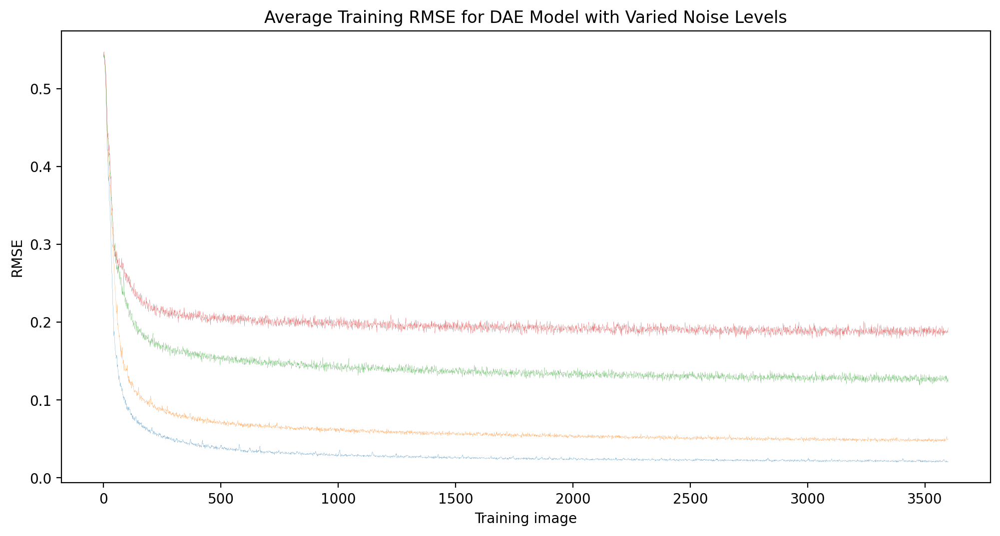

In [39]:
# plot training error
plt.figure(figsize=(12,6), dpi=200)
for i, key in enumerate(DAE_Train_Dict.keys()):
    errs = DAE_Train_Dict[key]
    print(key)
    plt.plot(np.arange(0, len(errs)), errs, linewidth=0.1)
#     plt.plot(np.arange(700,701), errs[700:701], linewidth=2, c=cuull[i], label="$\sigma$ = {}".format(key))
plt.title(r"Average Training RMSE for DAE Model with Varied Noise Levels")
plt.xlabel(r"Training image")
plt.ylabel(r"RMSE")

In [40]:
# generate dict which measures test error by noise

noiseDict = {}
for i in range(20):
    noiseVal = i/4
    noiseDict[noiseVal] =RMSE_test[i::20]
    

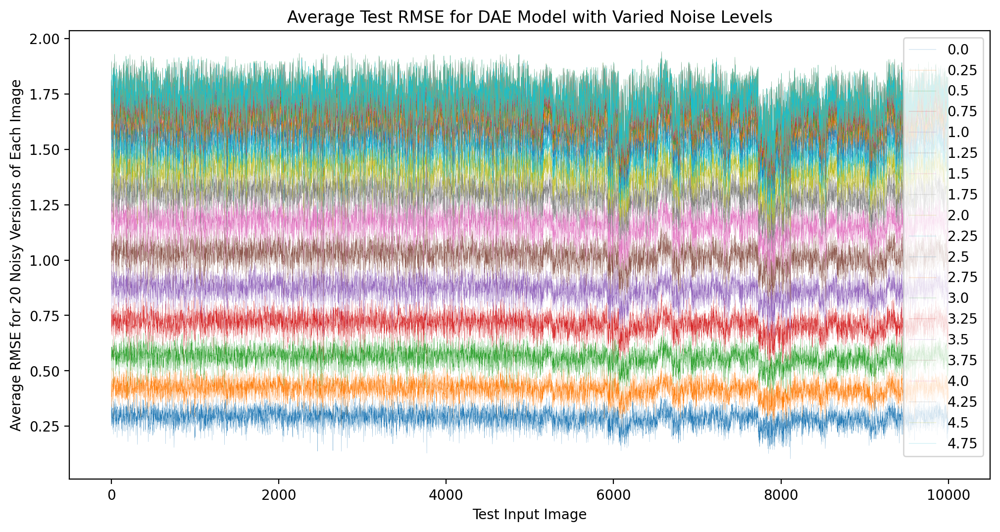

In [44]:
# plot test errors

plt.figure(figsize=(12,6), dpi=200)
for i, key in enumerate(noiseDict.keys()):
    errs = noiseDict[key]
#     print(key)
    plt.plot(np.arange(0, len(errs)), errs, linewidth=0.1,label=key)
#     plt.plot(np.arange(700,701), errs[700:701], linewidth=2, c=cuull[i], label="$\sigma$ = {}".format(key))
plt.title(r"Average Test RMSE for DAE Model with Varied Noise Levels")
plt.xlabel(r"Test Input Image")
plt.ylabel(r"Average RMSE for 20 Noisy Versions of Each Image")

plt.legend()
plt.show()